<a href="https://colab.research.google.com/github/sarathsreedharan/CSU_CS_445/blob/main/Spring25/Notebooks/module05_02_RL_with_NN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

$$\newcommand{\Rv}{\mathbf{R}}
\newcommand{\rv}{\mathbf{r}}
\newcommand{\Qv}{\mathbf{Q}}
\newcommand{\Qnv}{\mathbf{Qn}}
\newcommand{\Ynv}{\mathbf{Yn}}
\newcommand{\Av}{\mathbf{A}}
\newcommand{\Aiv}{\mathbf{Ai}}
\newcommand{\av}{\mathbf{a}}
\newcommand{\xv}{\mathbf{x}}
\newcommand{\Xv}{\mathbf{X}}
\newcommand{\yv}{\mathbf{y}}
\newcommand{\Yv}{\mathbf{Y}}
\newcommand{\zv}{\mathbf{z}}
\newcommand{\av}{\mathbf{a}}
\newcommand{\Wv}{\mathbf{W}}
\newcommand{\wv}{\mathbf{w}}
\newcommand{\betav}{\mathbf{\beta}}
\newcommand{\gv}{\mathbf{g}}
\newcommand{\Hv}{\mathbf{H}}
\newcommand{\dv}{\mathbf{d}}
\newcommand{\Vv}{\mathbf{V}}
\newcommand{\vv}{\mathbf{v}}
\newcommand{\Uv}{\mathbf{U}}
\newcommand{\uv}{\mathbf{u}}
\newcommand{\tv}{\mathbf{t}}
\newcommand{\Tv}{\mathbf{T}}
\newcommand{\TDv}{\mathbf{TD}}
\newcommand{\Tiv}{\mathbf{Ti}}
\newcommand{\Sv}{\mathbf{S}}
\newcommand{\Gv}{\mathbf{G}}
\newcommand{\zv}{\mathbf{z}}
\newcommand{\Zv}{\mathbf{Z}}
\newcommand{\Norm}{\mathcal{N}}
\newcommand{\muv}{\boldsymbol{\mu}}
\newcommand{\sigmav}{\boldsymbol{\sigma}}
\newcommand{\phiv}{\boldsymbol{\phi}}
\newcommand{\Phiv}{\boldsymbol{\Phi}}
\newcommand{\Sigmav}{\boldsymbol{\Sigma}}
\newcommand{\Lambdav}{\boldsymbol{\Lambda}}
\newcommand{\half}{\frac{1}{2}}
\newcommand{\argmax}[1]{\underset{#1}{\operatorname{argmax}}}
\newcommand{\argmin}[1]{\underset{#1}{\operatorname{argmin}}}
\newcommand{\dimensionbar}[1]{\underset{#1}{\operatorname{|}}}
\newcommand{\grad}{\mathbf{\nabla}}
\newcommand{\ebx}[1]{e^{\betav_{#1}^T \xv_n}}
\newcommand{\eby}[1]{e^{y_{n,#1}}}
\newcommand{\Tiv}{\mathbf{Ti}}
\newcommand{\Fv}{\mathbf{F}}
\newcommand{\ones}[1]{\mathbf{1}_{#1}}
$$

# Reinforcement Learning with Neural Network as Q Function

## Reinforcement Learning Objective

The objective for any reinforcement learning problem is to
find the sequence of actions that maximizes (or minimizes) the sum
of reinforcements along the sequence. By trying lots of examples and looking at our reinforcements and returns, we can populate the values of the Q-table.

We thought of the Q-table as a function that takes a state and a possible action and returns a value for that state-action pair.

So if Q is just a function, why don't we just optimize the value of that function?

So the objective of an RL problem is reduced to the objective of acquiring the Q function that
predicts the expected sum of future reinforcements, because the
correct Q function
determines the optimal next action.

So, the RL objective is to make this approximation as accurate as possible:

$$
    \begin{align*}
      Q(s_t,a_t) \approx \sum_{k=0}^\infty r_{t+k+1}
    \end{align*}
$$

This is usually formulated as the least squares objective (minimize the square of the expected value of the difference between the sum of reinforcements from this state and the Q value of this state and this action).

$$
    \begin{align*}
      \text{Minimize } \mathrm{E} \left ( \sum_{k=0}^\infty r_{t+k+1} - Q(s_t,a_t)\right )^2
    \end{align*}
$$

What is that expectation taken over?

Sources of randomness:

   * action selection
   * state transitions
   * reinforcement received

Of course, the key problem is that we don't know $\sum_{k=0}^\infty r_{t+k+1}$. What do we do?

Approximate it by

$$
    \begin{align*}
      \sum_{k=0}^\infty r_{t+k+1}  = & r_{t+1} + \sum_{k=1}^\infty r_{t+k+1}\\
       = & r_{t+1} + \sum_{k=0}^\infty r_{t+1+k+1}\\
       \approx & r_{t+1} + Q(s_{t+1},a_{t+1})
    \end{align*}
$$

## Gradient of Objective

Now our minimization problem is the following: if $Q$ is a
parameterized function, with parameters $\wv$, how do we try to
minimize it?

$$
    \begin{align*}
      \text{Minimize }  J(\wv)  &= \mathrm{E} \left ( \sum_{k=0}^\infty r_{t+k+1} - Q(s_t,a_t;\wv)\right )^2\\
      & = \mathrm{E} \Bigl ( r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv) \Bigr )^2
    \end{align*}
$$

How do we find a weight parameter that gives us the lowest loss?

Right!  Take the gradient of $J(\wv)$ with respect to $\wv$ and do
gradient descent.  $Q$ appears twice in this expression.  A very
common approach is to only take the gradient with respect to
$Q(s_t,a_t;\wv)$ and treat $Q(s_{t+1},a_{t+1};\wv)$ as constant. Not
correct, but works well and simplifies the resulting algorithm.  Recently a second Q function, referred to as a target Q function, has been used to calculate $Q(s_{t+1}, a_{t+1};\wv_{\text{target}})$, with its own parameters $\wv_{\text{target}}$.  At certain intervals $\wv$ is copied to $\wv_{\text{target}}$ to update the target Q function.

Recall that the expectation operator is a sum of possible values,
weighted by their probabilities.  Reminder - [Random Variable](https://en.wikipedia.org/wiki/Random_variable), and [expected value](https://en.wikipedia.org/wiki/Random_variable)

If $d$ is the value on the top
of a (fair) die,

$$
    \begin{align*}
      \mathrm{E} (d) = \frac{1}{6} 1 + \frac{1}{6} 2 + \frac{1}{6} 3 + \frac{1}{6} 4 + \frac{1}{6} 5 + \frac{1}{6} 6
    \end{align*}
$$

So the gradient of an expected value is the expected value of the gradients.

$$
    \begin{align*}
      \grad_{\wv}  J(\wv) =
       2 \mathrm{E} \Bigl( ( r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv)  ) (-1) \grad_{\wv} Q(s_t,a_t,;\wv)\Bigr)
    \end{align*}
$$

The expectation operator requires knowledge of the probabilities of
all of those random effects.  Instead, we will just sample the world.   

More probable events will take place more often.  If we just add updates to $\wv$ for each sample, we effectively have done the expectation.

## Gradient for Q function as Table

What is the gradient when $Q$ is a table, like the maze and the tic-tac-toe problem?
We must first decide what the $\wv$ parameters are for a table.

They are just the entries in the table.  So, since $\wv$ are also weights, we can formulate the selection
of the correct parameter in the table as a dot product.

Let $\xv_t$ be a column vector of length equal to the number of table
cells and with values that are all 0's and a single 1.  The 1
designates the cell corresponding to $s_t$ and $a_t$. Then

$$
    \begin{align*}
      Q(s_t,a_t;\wv) = \xv_t^T \wv
    \end{align*}
$$

Looks a bit like a prediction step in a neural network, right?

So,

$$
    \begin{align*}
      \grad_{\wv} Q(s_t,a_t;\wv) &= \grad_{\wv} (\xv_t^T \wv)\\
      & = \xv_t
    \end{align*}
$$


Let's define the temporal-difference error to be $\delta_t$

$$
    \begin{align*}
      \delta_t &= r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv)
    \end{align*}
$$

So if (from above)

$$
    \begin{align*}
      \grad_{\wv}  J(\wv) =
       2 \mathrm{E} \Bigl( ( r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv)  ) (-1) \grad_{\wv} Q(s_t,a_t,;\wv)\Bigr)
    \end{align*}
$$

Now

$$
    \begin{align*}
      \grad_{\wv} J(\wv) & = 2 \mathrm{E} \Bigl ( \delta_t  (-1) \grad_{\wv} Q(s_t,a_t,;\wv) \Bigr )\\
      & = -2 \mathrm{E} (\delta_t  \xv_t)\\
      & = \begin{cases}
        -2 \mathrm{E} (\delta_t) , & \text{ for cell for } s_t, a_t;\\
        0, & \text{ for all other cells}
      \end{cases}
    \end{align*}
$$

Replacing the expectation with samples, we get the TD update rule for Q tables

$$
    \begin{align*}
      \wv &\leftarrow \wv - \grad_{\wv} J(\wv)\\
       &\leftarrow \wv + \rho \delta_t \xv_t
    \end{align*}
$$

which is really the same as what we have seen before,

$$
    \begin{align*}
      Q(s_t,a_t)  &\leftarrow Q(s_t,a_t)  + \rho \delta_t
%%      Q(s_t,a_t)  &\leftarrow Q(s_t,a_t)  + \rho \Bigl (r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv)\Bigr )
    \end{align*}
$$

where the update to just the $s_t,a_t$ cell of Q was implicit.

This is also the same as weight update in a neural net, where you update a weight $w_t$ based on error ($\delta_t$), a learning rate ($\rho$), and an input ($x_t$).

## Gradient for Q function as Neural Network

Using a table for Q has limited use.  

   * Size of table might be too large to store in memory.
   * Learning could be slow.  Experience in one cell does not transfer to other cells.

Let's use a different function approximator.  If only there was some kind of universal function approximator...

Aha!  A neural network! What has to change in our derivation of the gradient?

We want to approximate $Q(s_t,a_t;\wv)$ with a neural network.  The
values of $\wv$ are the weights in all layers.  If our network has just two layers, the $\wv$ is composed of hidden layer weights $\Vv$ and $\Wv$.

Looks like the neural network will have a single output value and inputs for $s_t$ and $a_t$.  To find best action, we would input $s_t$ and try all possible actions $a_t$, calculating the
output of the network for each.  Then pick the action that produces the best neural network output.

Remember the objective function that we wish to minimize,

$$
    \begin{align*}
      \text{Minimize }  J(\wv)  &= \mathrm{E} \left ( \sum_{k=0}^\infty r_{t+k+1} - Q(s_t,a_t;\wv)\right )^2\\
      & = \mathrm{E} \Bigl ( r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv) \Bigr )^2,
    \end{align*}
$$

and its gradient, which is

$$
    \begin{align*}
      \grad_{\wv}  J(\wv) =
       2 \mathrm{E} \Bigl (( r_{t+1} + Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv)  ) (-1) \grad_{\wv} Q(s_t,a_t,;\wv)\Bigr).
    \end{align*}
$$

We replace the expectation operator with samples, at time $t$.

$$
    \begin{align*}
      \grad_{\wv_t}  J(\wv_t) =
       -2 \Bigl ( r_{t+1} + Q(s_{t+1},a_{t+1};\wv_t) - Q(s_t,a_t;\wv_t) \Bigr ) \grad_{\wv_t} Q(s_t,a_t,;\wv_t).
    \end{align*}
$$


What remains is to calculate

$$
    \begin{align*}
     \grad_{\wv_t} Q(s_t,a_t,;\wv_t).
    \end{align*}
$$

but we have seen this before, when calculating the gradient of the output of a neural network with respect to its weights, $\wv = (V,W)$.  So, the only change to our previous algorithm for training a neural network to do nonlinear regression is that we use the temporal-difference error rather than the target-output error.

Here are the gradient descent updates we had for nonlinear regression neural networks.

$$
    \begin{align*}
      \Zv &= h(\tilde{\Xv} \Vv)\\
      \Yv &= \tilde{\Zv} \Wv\\
       \Vv & \leftarrow \Vv + \rho_h \frac{1}{N} \frac{1}{K} \tilde{\Xv}^T \left ( (\Tv - \Yv) \hat{\Wv}^T \cdot  (1-\Zv^2) \right )\\
      \Wv & \leftarrow \Wv + \rho_o \frac{1}{N}\frac{1}{K} \tilde{\Zv}^T (\Tv - \Yv)
      \end{align*}
$$

The key change we need to make is in the error.  Our targets are now given by a reinforcement plus the next step predicted Q values.  We must assemble a bunch of samples into matrices.  

Multiple $s_t, a_t$ tuples will be collected as rows in $\Xv$, which, when passed through the neural network, produce $\Zv$ and then $\Yv$. $\Yv = \Qv$, because the output $\Yv$ of the network we are taking as our $Q$ value, the estimate of the expected return.  

Reinforcements received, $r_{t+1}$'s, will be collected as rows of $\Rv$.

Now just need $Q(s_{t+1},a_{t+1})$'s.  These are really like rows of $\Yv$ shifted up by one row, which we will call $\Qnv$, for $Q_{\mbox{next}}$.

Now we can rewrite the gradient descent updates.  Assume
we have $\Xv$, $\Rv$, $\Qnv$, $\Qv$, all but $\Xv$
having one column.

$$
    \begin{align*}
        \Tv &= \Rv + \Qnv\\
      \Zv &= \tanh(\tilde{\Xv} \Vv)\\
      \Vv & \leftarrow \Vv + \rho_h \frac{1}{N} \tilde{\Xv}^T \left ( (\Tv - \Qv) \hat{\Wv}^T \cdot  (1-\Zv^2) \right )\\
      \Wv & \leftarrow \Wv + \rho_o \frac{1}{N} \tilde{\Zv}^T \;(\Tv - \Qv)
      \end{align*}
$$

To make the relationship to our nonlinear regression expressions even more obvious, let's replace $\Qv$ with $\Yv$ and $\Qnv$ with $\Ynv$.
$$
    \begin{align*}
        \Tv &= \Rv + \Ynv\\
      \Zv &= \tanh(\tilde{\Xv} \Vv)\\
      \Vv & \leftarrow \Vv + \rho_h \frac{1}{N} \tilde{\Xv}^T \left ( (\Tv - \Yv) \hat{\Wv}^T \cdot  (1-\Zv^2) \right )\\
      \Wv & \leftarrow \Wv + \rho_o \frac{1}{N} \tilde{\Zv}^T \;(\Tv - \Yv)
      \end{align*}
$$

## Dealing with Infinite Sums

For non-episodic tasks (no final state), the desired sum of
reinforcements is over an infinite future.

This will grow to infinity unless forced to be a finite
value. We will use a common approach of **discounting** reinforcements,
discounting ones more
that occur further into the future.

$$
    \begin{align*}
      Q(s_t,a_t) &= \sum_{k=0}^{\infty} \gamma_k r_{t+k+1}, \text{ for
      } 0 < \gamma  < 1.
    \end{align*}
$$

We must introduce this discounting into the objective function

$$
    \begin{align*}
      \text{Minimize }  J(\wv)  &= \mathrm{E} \left (
      \sum_{k=0}^\infty \gamma_k r_{t+k+1} - Q(s_t,a_t;\wv)\right )^2\\
      & = \mathrm{E} \Bigl ( \gamma_0 r_{t+1} + \sum_{k=1}^\infty \gamma_k r_{t+k+1} - Q(s_t,a_t;\wv) \Bigr )^2\\
      & = \mathrm{E} \Bigl ( \gamma_0 r_{t+1} + \sum_{k=0}^\infty \gamma_{k+1} r_{t+k+1+1} - Q(s_t,a_t;\wv) \Bigr )^2\\
      & = \mathrm{E} \Bigl ( \gamma_0 r_{t+1} + \gamma \sum_{k=0}^\infty \gamma_k r_{t+k+1+1} - Q(s_t,a_t;\wv) \Bigr )^2\\
      & = \mathrm{E} \Bigl ( r_{t+1} + \gamma Q(s_{t+1},a_{t+1};\wv) - Q(s_t,a_t;\wv) \Bigr )^2
    \end{align*}
$$

So, we simply add the multiplication by $\gamma$ to the next
state-action Q value in the temporal-difference error.

## Using Batch-Oriented Algorithm for Non-Stationary Learning Task

These are batch updates, remember?  Before, when doing nonlinear regression we had all input and
target samples in $\Xv$ and $\Tv$.   Now one set of samples are collected for one set of weight values, meaning for one Q function.

After updates, we have a new Q function, which will produce different
actions.  So what?  

We must repeat the steps:

   * Generate $N$ samples.
   * Update $\Vv$ and $\Wv$.

in small-ish batches.  Also, must not train for too many iterations each time.  If we do train to convergence each time, the neural network can forget everything it learned from previous samples.

## 1-D Maze Example


Imagine a chain of states, numbered 1 through 10.  From any state you
can move left by one state, stay put, or move right.  Moves off the
ends are not permitted.  The goal is to be in state 5.  Let's assign
reinforcements of -1 for every move except ones that result in being
in state 5, for which you get reinforcement of 0.  This will drive
the agent to get to state 5 as quickly as possible.


So, the state is an integer from 1 through 10. Let's approximate the Q function by  a  neural network
with 2 inputs for the integer state and the integer action, 6 hidden units, and 1 output.


$$
    \begin{align*}
    s_t &\in \{1,2,3,4,5,6,7,8,9,10\}\\[3mm]
    a_t &= \begin{cases}
           -1; \text{ for action left},\\
           0; \text{ for action stay},\\
           1; \text{ for action right}
           \end{cases}\\[3mm]
    s_{t+1} &= s_t + a_t\;\;\; \text{bounded to be between 1 and 10}
    \end{align*}
$$



In [ ]:
import numpy as np
import optimizers
import sys  # for sys.float_info.epsilon


######################################################################
# class NeuralNetwork()
######################################################################

class NeuralNetwork():

    def __init__(self, n_inputs, n_hiddens_per_layer, n_outputs, activation_function='tanh'):
        self.n_inputs = n_inputs
        self.n_outputs = n_outputs
        self.activation_function = activation_function

        # Set self.n_hiddens_per_layer to [] if argument is 0, [], or [0]
        if n_hiddens_per_layer == 0 or n_hiddens_per_layer == [] or n_hiddens_per_layer == [0]:
            self.n_hiddens_per_layer = []
        else:
            self.n_hiddens_per_layer = n_hiddens_per_layer

        # Initialize weights, by first building list of all weight matrix shapes.
        n_in = n_inputs
        shapes = []
        for nh in self.n_hiddens_per_layer:
            shapes.append((n_in + 1, nh))
            n_in = nh
        shapes.append((n_in + 1, n_outputs))

        # self.all_weights:  vector of all weights
        # self.Ws: list of weight matrices by layer
        self.all_weights, self.Ws = self.make_weights_and_views(shapes)

        # Define arrays to hold gradient values.
        # One array for each W array with same shape.
        self.all_gradients, self.dE_dWs = self.make_weights_and_views(shapes)

        self.trained = False
        self.total_epochs = 0
        self.error_trace = []
        self.Xmeans = None
        self.Xstds = None
        self.Tmeans = None
        self.Tstds = None

    def make_weights_and_views(self, shapes):
        # vector of all weights built by horizontally stacking flatenned matrices
        # for each layer initialized with uniformly-distributed values.
        all_weights = np.hstack([np.random.uniform(size=shape).flat / np.sqrt(shape[0])
                                 for shape in shapes])
        # Build list of views by reshaping corresponding elements from vector of all weights
        # into correct shape for each layer.
        views = []
        start = 0
        for shape in shapes:
            size = shape[0] * shape[1]
            views.append(all_weights[start:start + size].reshape(shape))
            start += size
        return all_weights, views

    # Return string that shows how the constructor was called
    def __repr__(self):
        return f'{type(self).__name__}({self.n_inputs}, {self.n_hiddens_per_layer}, {self.n_outputs}, \'{self.activation_function}\')'

    # Return string that is more informative to the user about the state of this neural network.
    def __str__(self):
        result = self.__repr__()
        if len(self.error_trace) > 0:
            return self.__repr__() + f' trained for {len(self.error_trace)} epochs, final training error {self.error_trace[-1]:.4f}'

    def train(self, X, T, n_epochs, learning_rate, method='sgd', verbose=True):
        '''
train:
  X: n_samples x n_inputs matrix of input samples, one per row
  T: n_samples x n_outputs matrix of target output values, one sample per row
  n_epochs: number of passes to take through all samples updating weights each pass
  learning_rate: factor controlling the step size of each update
  method: is either 'sgd' or 'adam'
        '''

        # Setup standardization parameters
        if self.Xmeans is None:
            self.Xmeans = X.mean(axis=0)
            self.Xstds = X.std(axis=0)
            self.Xstds[self.Xstds == 0] = 1  # So we don't divide by zero when standardizing
            self.Tmeans = T.mean(axis=0)
            self.Tstds = T.std(axis=0)

        # Standardize X and T
        X = (X - self.Xmeans) / self.Xstds
        T = (T - self.Tmeans) / self.Tstds

        # Instantiate Optimizers object by giving it vector of all weights
        optimizer = optimizers.Optimizers(self.all_weights)

        # Define function to convert value from error_f into error in original T units,
        # but only if the network has a single output. Multiplying by self.Tstds for
        # multiple outputs does not correctly unstandardize the error.
        if len(self.Tstds) == 1:
            error_convert_f = lambda err: (np.sqrt(err) * self.Tstds)[0]  # to scalar
        else:
            error_convert_f = lambda err: np.sqrt(err)[0]  # to scalar

        if method == 'sgd':

            error_trace = optimizer.sgd(self.error_f, self.gradient_f,
                                        fargs=[X, T], n_epochs=n_epochs,
                                        learning_rate=learning_rate,
                                        error_convert_f=error_convert_f)

        elif method == 'adam':

            error_trace = optimizer.adam(self.error_f, self.gradient_f,
                                         fargs=[X, T], n_epochs=n_epochs,
                                         learning_rate=learning_rate,
                                         error_convert_f=error_convert_f)

        else:
            raise Exception("method must be 'sgd' or 'adam'")

        self.error_trace = error_trace

        # Return neural network object to allow applying other methods after training.
        #  Example:    Y = nnet.train(X, T, 100, 0.01).use(X)
        return self

    def relu(self, s):
        s[s < 0] = 0
        return s

    def grad_relu(self, s):
        return (s > 0).astype(int)

    def forward_pass(self, X):
        '''X assumed already standardized. Output returned as standardized.'''
        self.Ys = [X]
        for W in self.Ws[:-1]:
            if self.activation_function == 'relu':
                self.Ys.append(self.relu(self.Ys[-1] @ W[1:, :] + W[0:1, :]))
            else:
                self.Ys.append(np.tanh(self.Ys[-1] @ W[1:, :] + W[0:1, :]))
        last_W = self.Ws[-1]
        self.Ys.append(self.Ys[-1] @ last_W[1:, :] + last_W[0:1, :])
        return self.Ys

    # Function to be minimized by optimizer method, mean squared error
    def error_f(self, X, T):
        Ys = self.forward_pass(X)
        mean_sq_error = np.mean((T - Ys[-1]) ** 2)
        return mean_sq_error

    # Gradient of function to be minimized for use by optimizer method
    def gradient_f(self, X, T):
        '''Assumes forward_pass just called with layer outputs in self.Ys.'''
        error = T - self.Ys[-1]
        n_samples = X.shape[0]
        n_outputs = T.shape[1]
        delta = - error / (n_samples * n_outputs)
        n_layers = len(self.n_hiddens_per_layer) + 1
        # Step backwards through the layers to back-propagate the error (delta)
        for layeri in range(n_layers - 1, -1, -1):
            # gradient of all but bias weights
            self.dE_dWs[layeri][1:, :] = self.Ys[layeri].T @ delta
            # gradient of just the bias weights
            self.dE_dWs[layeri][0:1, :] = np.sum(delta, 0)
            # Back-propagate this layer's delta to previous layer
            if self.activation_function == 'relu':
                delta = delta @ self.Ws[layeri][1:, :].T * self.grad_relu(self.Ys[layeri])
            else:
                delta = delta @ self.Ws[layeri][1:, :].T * (1 - self.Ys[layeri] ** 2)
        return self.all_gradients

    def use(self, X):
        '''X assumed to not be standardized'''
        # Standardize X
        X = (X - self.Xmeans) / self.Xstds
        Ys = self.forward_pass(X)
        Y = Ys[-1]
        # Unstandardize output Y before returning it
        return Y * self.Tstds + self.Tmeans

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

Available actions step left, stay put, and step right.  Represented as change in position, they are

In [ ]:
valid_actions = [-1, 0, 1]

As mentioned in the previous lecture, we need to force exploration by taking random actions.  But, as our Q network learns, we want to decrease the amount of exploration.  

Remember that we used $\epsilon$ to indicate the probability of taking a random action.  Its value is from 0 to 1.  Given a Q net, called `Qnet`, the current `state`, the set of `valid_actions` and `epsilon`, we can define a function that either returns a random choice from `valid_actions` or the best action determined by the values of Q produced by `Qnet` for the current `state` and all `valid_actions`.  This is referred to as an $\epsilon$-greedy policy.

In [ ]:
def epsilon_greedy(Qnet, state, valid_actions, epsilon):
    '''epsilon is between 0 and 1 and is the probability of returning a random action'''

    if np.random.uniform() < epsilon:
        # Random Move
        action = np.random.choice(valid_actions)

    else:
        # Greedy Move
        actions_randomly_ordered = random.sample(valid_actions, len(valid_actions))
        Qs = [Qnet.use(np.array([[state, a]])) for a in actions_randomly_ordered]
        ai = np.argmax(Qs)
        action = actions_randomly_ordered[ai]

    Q = Qnet.use(np.array([[state, action]]))

    return action, Q   # return the chosen action and Q(state, action)

Now we need a function, `make_samples`, for collecting a bunch of samples of state, action, reinforcement, next state, next actions.  We can make this function generic by passing in functions to create the initial state, the next state, and the reinforcement value.

In [ ]:
valid_actions = [-1, 0, 1]

def initial_state():
    return np.random.randint(1, 11)

def next_state(s, a):
    newstate = min(max(1, s + a), 10)
    return newstate

def reinf(s, sn):  # sn is next state
    return 0 if sn is 5 else -1  # if we have arrived in state 5, we have reached the goal, so r is 0.

In [ ]:
def make_samples(Qnet, initial_state_f, next_state_f, reinforcement_f,
                 valid_actions, n_samples, epsilon):

    X = np.zeros((n_samples, Qnet.n_inputs))
    R = np.zeros((n_samples, 1))
    Qn = np.zeros((n_samples, 1))

    s = initial_state_f()
    a, _ = epsilon_greedy(Qnet, s, valid_actions, epsilon)

    # Collect data from n_samples steps
    for step in range(n_samples):

        sn = next_state_f(s, a)        # Update state, sn, from s and a
        rn = reinforcement_f(s, sn)    # Calculate resulting reinforcement
        an, qn = epsilon_greedy(Qnet, sn, valid_actions, epsilon)  # choose next action
        X[step, :] = (s, a)
        R[step, 0] = rn
        Qn[step, 0] = qn
        s, a = sn, an  # Advance one time step


    return (X, R, Qn)

In [ ]:
def plot_status():
    n = 100
    xs = np.linspace(1, 10, n).reshape(-1, 1)
    xsas = np.vstack((xs, xs, xs))
    ones = np.ones((n, 1))
    xsas = np.hstack((xsas, np.vstack((ones * -1, ones * 0, ones * 1))))
    ys = Qnet.use(xsas)
    ys = ys.reshape((n, 3), order='F')
    plt.subplot(3, 3, 1)
    plt.plot(np.tile(xs, (1, 3)), ys)
    plt.ylabel('Q for each action')
    plt.xlabel('State')
    plt.legend(('Left','Stay','Right'))

    plt.subplot(3, 3, 4)
    plt.plot(xs, -1 + np.argmax(ys, axis=1))
    plt.ylabel('Action')
    plt.xlabel('State')
    plt.ylim(-1.1, 1.1)

    plt.subplot(3, 3, 7)
    Qnet.use(np.hstack((xs, ones * -1)))
    plt.gca().set_prop_cycle(None)
    plt.plot(xs, Qnet.Ys[1], '--')
    Qnet.use(np.hstack((xs, ones * 0)))
    plt.gca().set_prop_cycle(None)
    plt.plot(xs, Qnet.Ys[1])  # Ys[0] is inputs, Ys[1] is hidden layer, Ys[2] is output layer
    Qnet.use(np.hstack((xs, ones * 1)))
    plt.plot(xs, Qnet.Ys[1], linewidth=2)
    plt.ylabel('Hidden Units for Actions -1 (dotted) 0 (solid) 1 (thick)')
    plt.xlabel('State')

    plt.subplot(3, 3, 2)
    x = x_trace[j - 200:j, 0]
    plt.plot(x, range(200), '.-')
    plt.xlabel('x (last 200)')
    plt.ylabel('Steps')
    y = x.copy()
    y[y != 5] = np.nan
    plt.plot(y, range(200), 'ro')
    plt.xlim(0, 10)

    plt.subplot(3, 3, 5)
    plt.plot(epsilon_trace[:trial])
    plt.ylabel('$\epsilon$')
    plt.xlabel('Trials')
    plt.ylim(0, 1)

    plt.subplot(3, 3 ,8)
    plt.plot(error_trace)
    plt.ylabel('TD Error')
    plt.xlabel('Epochs')

    plt.subplot(3, 3, 3)
    plt.plot(r_trace[:j, 0])
    plt.ylim(-1.1, 0.1)
    plt.ylabel('R')
    plt.xlabel('Steps')

    plt.subplot(3, 3, 6)
    plt.plot(np.convolve(r_trace[:j, 0], np.array([0.01] * 100), mode='valid'))
    plt.ylabel('R smoothed')
    plt.ylim(-1.1, 0)
    plt.xlabel('Steps')

    # plt.subplot(3, 3, 9)
    # Qnet.draw(('x', 'a'), ('Q'))

    plt.tight_layout()

Now for the main loop.  Let's collect 20 interactions (steps) for each trial and update our Qnet at the end of each trial.  And let's run for a total of 5000 trials.  When updating our nnet Q function, let's let adam run for only 20 epochs.

In [ ]:
n_trials = 5000
n_steps_per_trial = 20
n_epochs = 20
learning_rate = 0.01

n_hidden = [50]
gamma = 0.8
final_epsilon = 0.0001  # value of epsilon at end of simulation. Decay rate is calculated

epsilon_decay =  np.exp(np.log(final_epsilon) / n_trials) # to produce this final value
print('epsilonDecay is', epsilon_decay)

epsilonDecay is 0.9981596274917243


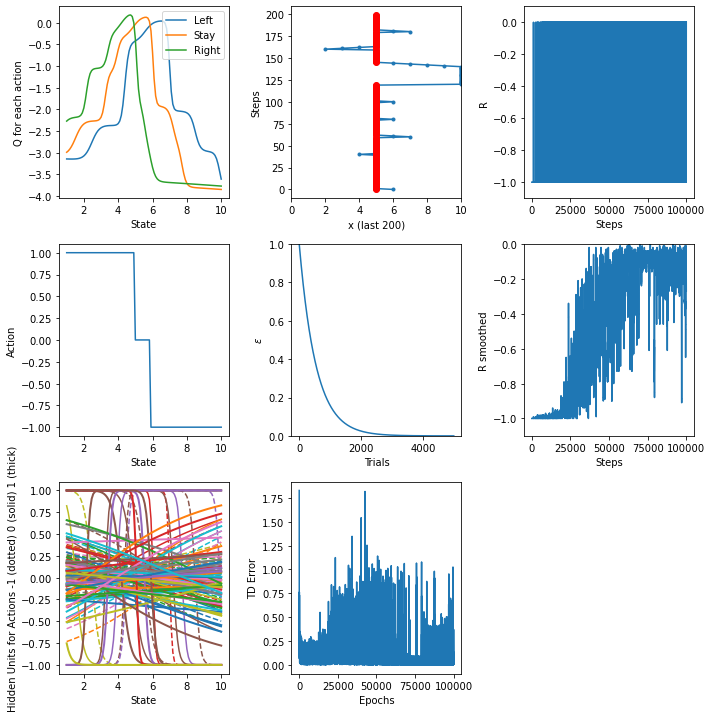

In [ ]:
from IPython.display import display, clear_output

epsilon = 1.0

Qnet = NeuralNetwork(2, n_hidden, 1)

# We need to set standardization parameters now so Qnet can be called to get first set of samples,
# before it has been trained the first time.

def setup_standardization(Qnet, Xmeans, Xstds, Tmeans, Tstds):
    Qnet.Xmeans = np.array(Xmeans)
    Qnet.Xstds = np.array(Xstds)
    Qnet.Tmeans = np.array(Tmeans)
    Qnet.Tstds = np.array(Tstds)

# Inputs are position (1 to 10) and action (-1, 0, or 1)
setup_standardization(Qnet, [5, 0], [2.5, 0.5], [0], [1])

fig = plt.figure(figsize=(10, 10))

x_trace = np.zeros((n_trials * n_steps_per_trial, 2))
r_trace = np.zeros((n_trials * n_steps_per_trial, 1))
error_trace = []
epsilon_trace = np.zeros((n_trials, 1))

for trial in range(n_trials):

    X, R, Qn = make_samples(Qnet, initial_state, next_state, reinf, valid_actions, n_steps_per_trial, epsilon)

    T = R + gamma * Qn
    Qnet.train(X, T, n_epochs, learning_rate, method='adam')

    epsilon_trace[trial] = epsilon
    i = trial * n_steps_per_trial
    j = i + n_steps_per_trial
    x_trace[i:j, :] = X
    r_trace[i:j, :] = R
    error_trace += Qnet.error_trace

    epsilon *= epsilon_decay

    # Rest of this loop is for plots.
    if True and (trial + 1) % int(n_trials * 0.01 + 0.5) == 0:

        fig.clf()
        plot_status()
        clear_output(wait=True)
        display(fig)

clear_output(wait=True)

In [ ]:
def run(n_trials, n_steps_per_trial, n_epochs, learning_rate, n_hidden, gamma, final_epsilon):
    epsilon = 1
    epsilon_decay =  np.exp(np.log(final_epsilon)/n_trials) # to produce this final value

    Qnet = NeuralNetwork(2, n_hidden, 1)
    setup_standardization(Qnet, [5, 0], [2.5, 0.5], [0], [1])

    r_sum = 0
    r_last_2_trials = 0
    for trial in range(n_trials):
        X, R, Qn = make_samples(Qnet, initial_state, next_state, reinf, valid_actions, n_steps_per_trial, epsilon)
        r_sum += np.sum(R)
        if trial > n_trials - 3:
            r_last_2_trials += np.sum(R)
        epsilon *= epsilon_decay
        Qnet.train(X, R + gamma * Qn, n_epochs, learning_rate, method='sgd', verbose=False)

    return r_sum / (n_trials * n_steps_per_trial), r_last_2_trials / (2 * n_steps_per_trial)

In [ ]:
# DON'T RUN LIVE! Takes about 6 minutes
import time
start = time.time()
result = []
for nT in (10, 50, 100):  # number of trials
    print('nT is', nT)
    for nS in (10, 20, 50, 100):  # number of steps per trial
        for nE in (5, 10, 50, 100):  # number of epochs
            for nH in [[2], [5], [10], [10, 10]]:  # hidden layer structure
                for g in (0.5, 0.9):  # gamma
                    for lr in (0.01, 0.1):  # learning rate
                        for fep in (0.01,):  # final epsilon

                            r, r_last_2 = run(nT, nS, nE, lr, nH, g, fep)
                            result.append([nT, nS, nE, nH, g, lr, fep, r, r_last_2])
                            # print(result[-1])

print(f'Took {(time.time() - start)/60:.1f} minutes.')

nT is 10
sgd: Epoch 1 Error=1.24646
sgd: Epoch 2 Error=1.22965
sgd: Epoch 3 Error=1.21310
sgd: Epoch 4 Error=1.19681
sgd: Epoch 5 Error=1.18076
sgd: Epoch 1 Error=1.64834
sgd: Epoch 2 Error=1.60429
sgd: Epoch 3 Error=1.56153
sgd: Epoch 4 Error=1.52001
sgd: Epoch 5 Error=1.47970
sgd: Epoch 1 Error=1.54468
sgd: Epoch 2 Error=1.50373
sgd: Epoch 3 Error=1.46395
sgd: Epoch 4 Error=1.42530
sgd: Epoch 5 Error=1.38775
sgd: Epoch 1 Error=1.46908
sgd: Epoch 2 Error=1.42925
sgd: Epoch 3 Error=1.39056
sgd: Epoch 4 Error=1.35295
sgd: Epoch 5 Error=1.31640
sgd: Epoch 1 Error=1.35022
sgd: Epoch 2 Error=1.31607
sgd: Epoch 3 Error=1.28286
sgd: Epoch 4 Error=1.25053
sgd: Epoch 5 Error=1.21908
sgd: Epoch 1 Error=1.29090
sgd: Epoch 2 Error=1.25509
sgd: Epoch 3 Error=1.22031
sgd: Epoch 4 Error=1.18652
sgd: Epoch 5 Error=1.15369
sgd: Epoch 1 Error=1.20189
sgd: Epoch 2 Error=1.16946
sgd: Epoch 3 Error=1.13794
sgd: Epoch 4 Error=1.10730
sgd: Epoch 5 Error=1.07750
sgd: Epoch 1 Error=1.13527
sgd: Epoch 2 Error=

sgd: Epoch 1 Error=0.64326
sgd: Epoch 2 Error=0.51673
sgd: Epoch 3 Error=0.41522
sgd: Epoch 4 Error=0.33715
sgd: Epoch 5 Error=0.27990
sgd: Epoch 1 Error=0.64626
sgd: Epoch 2 Error=0.47568
sgd: Epoch 3 Error=0.35724
sgd: Epoch 4 Error=0.27532
sgd: Epoch 5 Error=0.21977
sgd: Epoch 1 Error=0.33304
sgd: Epoch 2 Error=0.05750
sgd: Epoch 3 Error=0.05125
sgd: Epoch 4 Error=0.05120
sgd: Epoch 5 Error=0.05119
sgd: Epoch 1 Error=0.26371
sgd: Epoch 2 Error=0.13052
sgd: Epoch 3 Error=0.12356
sgd: Epoch 4 Error=0.12164
sgd: Epoch 5 Error=0.11989
sgd: Epoch 1 Error=0.03475
sgd: Epoch 2 Error=0.00173
sgd: Epoch 3 Error=0.00008
sgd: Epoch 4 Error=0.00000
sgd: Epoch 5 Error=0.00000
sgd: Epoch 1 Error=0.62869
sgd: Epoch 2 Error=0.45843
sgd: Epoch 3 Error=0.39036
sgd: Epoch 4 Error=0.36002
sgd: Epoch 5 Error=0.34305
sgd: Epoch 1 Error=0.47316
sgd: Epoch 2 Error=0.35405
sgd: Epoch 3 Error=0.32570
sgd: Epoch 4 Error=0.31847
sgd: Epoch 5 Error=0.31541
sgd: Epoch 1 Error=0.55637
sgd: Epoch 2 Error=0.18922
s

sgd: Epoch 1 Error=0.28492
sgd: Epoch 2 Error=0.28371
sgd: Epoch 3 Error=0.28276
sgd: Epoch 4 Error=0.28193
sgd: Epoch 5 Error=0.28119
sgd: Epoch 6 Error=0.28049
sgd: Epoch 7 Error=0.27984
sgd: Epoch 8 Error=0.27922
sgd: Epoch 9 Error=0.27862
sgd: Epoch 10 Error=0.27806
sgd: Epoch 1 Error=1.01007
sgd: Epoch 2 Error=0.99592
sgd: Epoch 3 Error=0.98202
sgd: Epoch 4 Error=0.96836
sgd: Epoch 5 Error=0.95494
sgd: Epoch 6 Error=0.94175
sgd: Epoch 7 Error=0.92878
sgd: Epoch 8 Error=0.91603
sgd: Epoch 9 Error=0.90350
sgd: Epoch 10 Error=0.89118
sgd: Epoch 1 Error=0.98419
sgd: Epoch 2 Error=0.96965
sgd: Epoch 3 Error=0.95531
sgd: Epoch 4 Error=0.94117
sgd: Epoch 5 Error=0.92723
sgd: Epoch 6 Error=0.91348
sgd: Epoch 7 Error=0.89992
sgd: Epoch 8 Error=0.88655
sgd: Epoch 9 Error=0.87337
sgd: Epoch 10 Error=0.86037
sgd: Epoch 1 Error=0.98895
sgd: Epoch 2 Error=0.97524
sgd: Epoch 3 Error=0.96176
sgd: Epoch 4 Error=0.94851
sgd: Epoch 5 Error=0.93548
sgd: Epoch 6 Error=0.92267
sgd: Epoch 7 Error=0.9100

sgd: Epoch 1 Error=0.29846
sgd: Epoch 2 Error=0.03875
sgd: Epoch 3 Error=0.01347
sgd: Epoch 4 Error=0.01275
sgd: Epoch 5 Error=0.01274
sgd: Epoch 6 Error=0.01273
sgd: Epoch 7 Error=0.01273
sgd: Epoch 8 Error=0.01273
sgd: Epoch 9 Error=0.01272
sgd: Epoch 10 Error=0.01272
sgd: Epoch 1 Error=0.41966
sgd: Epoch 2 Error=0.16273
sgd: Epoch 3 Error=0.06579
sgd: Epoch 4 Error=0.03096
sgd: Epoch 5 Error=0.02107
sgd: Epoch 6 Error=0.01909
sgd: Epoch 7 Error=0.01873
sgd: Epoch 8 Error=0.01865
sgd: Epoch 9 Error=0.01860
sgd: Epoch 10 Error=0.01856
sgd: Epoch 1 Error=0.34577
sgd: Epoch 2 Error=0.27676
sgd: Epoch 3 Error=0.27300
sgd: Epoch 4 Error=0.27222
sgd: Epoch 5 Error=0.27156
sgd: Epoch 6 Error=0.27090
sgd: Epoch 7 Error=0.27025
sgd: Epoch 8 Error=0.26959
sgd: Epoch 9 Error=0.26894
sgd: Epoch 10 Error=0.26829
sgd: Epoch 1 Error=0.17817
sgd: Epoch 2 Error=0.04093
sgd: Epoch 3 Error=0.03194
sgd: Epoch 4 Error=0.03165
sgd: Epoch 5 Error=0.03158
sgd: Epoch 6 Error=0.03150
sgd: Epoch 7 Error=0.0314

sgd: Epoch 1 Error=0.85418
sgd: Epoch 2 Error=0.40872
sgd: Epoch 3 Error=0.30555
sgd: Epoch 4 Error=0.28263
sgd: Epoch 5 Error=0.27371
sgd: Epoch 6 Error=0.26717
sgd: Epoch 7 Error=0.26129
sgd: Epoch 8 Error=0.25580
sgd: Epoch 9 Error=0.25064
sgd: Epoch 10 Error=0.24580
sgd: Epoch 1 Error=0.76477
sgd: Epoch 2 Error=0.28082
sgd: Epoch 3 Error=0.14078
sgd: Epoch 4 Error=0.11103
sgd: Epoch 5 Error=0.10349
sgd: Epoch 6 Error=0.09901
sgd: Epoch 7 Error=0.09511
sgd: Epoch 8 Error=0.09149
sgd: Epoch 9 Error=0.08809
sgd: Epoch 10 Error=0.08489
sgd: Epoch 5 Error=1.19350
sgd: Epoch 10 Error=1.12228
sgd: Epoch 15 Error=1.05752
sgd: Epoch 20 Error=0.99819
sgd: Epoch 25 Error=0.94355
sgd: Epoch 30 Error=0.89300
sgd: Epoch 35 Error=0.84607
sgd: Epoch 40 Error=0.80240
sgd: Epoch 45 Error=0.76166
sgd: Epoch 50 Error=0.72361
sgd: Epoch 5 Error=0.98050
sgd: Epoch 10 Error=0.90327
sgd: Epoch 15 Error=0.83293
sgd: Epoch 20 Error=0.76870
sgd: Epoch 25 Error=0.70992
sgd: Epoch 30 Error=0.65602
sgd: Epoch 3

sgd: Epoch 10 Error=0.65984
sgd: Epoch 15 Error=0.61343
sgd: Epoch 20 Error=0.57200
sgd: Epoch 25 Error=0.53498
sgd: Epoch 30 Error=0.50191
sgd: Epoch 35 Error=0.47240
sgd: Epoch 40 Error=0.44614
sgd: Epoch 45 Error=0.42284
sgd: Epoch 50 Error=0.40226
sgd: Epoch 5 Error=0.69362
sgd: Epoch 10 Error=0.63156
sgd: Epoch 15 Error=0.57704
sgd: Epoch 20 Error=0.52952
sgd: Epoch 25 Error=0.48849
sgd: Epoch 30 Error=0.45338
sgd: Epoch 35 Error=0.42363
sgd: Epoch 40 Error=0.39865
sgd: Epoch 45 Error=0.37790
sgd: Epoch 50 Error=0.36081
sgd: Epoch 5 Error=0.63981
sgd: Epoch 10 Error=0.36684
sgd: Epoch 15 Error=0.25294
sgd: Epoch 20 Error=0.21695
sgd: Epoch 25 Error=0.20702
sgd: Epoch 30 Error=0.20369
sgd: Epoch 35 Error=0.20190
sgd: Epoch 40 Error=0.20050
sgd: Epoch 45 Error=0.19922
sgd: Epoch 50 Error=0.19802
sgd: Epoch 5 Error=0.55065
sgd: Epoch 10 Error=0.30241
sgd: Epoch 15 Error=0.19660
sgd: Epoch 20 Error=0.15270
sgd: Epoch 25 Error=0.13234
sgd: Epoch 30 Error=0.12082
sgd: Epoch 35 Error=0.1

sgd: Epoch 50 Error=0.30382
sgd: Epoch 5 Error=0.40775
sgd: Epoch 10 Error=0.34787
sgd: Epoch 15 Error=0.31755
sgd: Epoch 20 Error=0.30306
sgd: Epoch 25 Error=0.29637
sgd: Epoch 30 Error=0.29333
sgd: Epoch 35 Error=0.29196
sgd: Epoch 40 Error=0.29133
sgd: Epoch 45 Error=0.29104
sgd: Epoch 50 Error=0.29089
sgd: Epoch 5 Error=0.41263
sgd: Epoch 10 Error=0.37019
sgd: Epoch 15 Error=0.34426
sgd: Epoch 20 Error=0.32852
sgd: Epoch 25 Error=0.31881
sgd: Epoch 30 Error=0.31256
sgd: Epoch 35 Error=0.30828
sgd: Epoch 40 Error=0.30510
sgd: Epoch 45 Error=0.30257
sgd: Epoch 50 Error=0.30039
sgd: Epoch 5 Error=0.28753
sgd: Epoch 10 Error=0.17786
sgd: Epoch 15 Error=0.11050
sgd: Epoch 20 Error=0.06946
sgd: Epoch 25 Error=0.04494
sgd: Epoch 30 Error=0.03088
sgd: Epoch 35 Error=0.02341
sgd: Epoch 40 Error=0.01985
sgd: Epoch 45 Error=0.01830
sgd: Epoch 50 Error=0.01767
sgd: Epoch 5 Error=0.14300
sgd: Epoch 10 Error=0.08784
sgd: Epoch 15 Error=0.05461
sgd: Epoch 20 Error=0.03498
sgd: Epoch 25 Error=0.02

sgd: Epoch 5 Error=0.01442
sgd: Epoch 10 Error=0.00363
sgd: Epoch 15 Error=0.00355
sgd: Epoch 20 Error=0.00354
sgd: Epoch 25 Error=0.00353
sgd: Epoch 30 Error=0.00352
sgd: Epoch 35 Error=0.00351
sgd: Epoch 40 Error=0.00350
sgd: Epoch 45 Error=0.00349
sgd: Epoch 50 Error=0.00348
sgd: Epoch 5 Error=1.02782
sgd: Epoch 10 Error=0.97481
sgd: Epoch 15 Error=0.92864
sgd: Epoch 20 Error=0.88823
sgd: Epoch 25 Error=0.85272
sgd: Epoch 30 Error=0.82146
sgd: Epoch 35 Error=0.79386
sgd: Epoch 40 Error=0.76948
sgd: Epoch 45 Error=0.74791
sgd: Epoch 50 Error=0.72881
sgd: Epoch 5 Error=1.00243
sgd: Epoch 10 Error=0.86118
sgd: Epoch 15 Error=0.75106
sgd: Epoch 20 Error=0.66496
sgd: Epoch 25 Error=0.59785
sgd: Epoch 30 Error=0.54593
sgd: Epoch 35 Error=0.50616
sgd: Epoch 40 Error=0.47603
sgd: Epoch 45 Error=0.45345
sgd: Epoch 50 Error=0.43670
sgd: Epoch 5 Error=0.85615
sgd: Epoch 10 Error=0.75384
sgd: Epoch 15 Error=0.67582
sgd: Epoch 20 Error=0.61594
sgd: Epoch 25 Error=0.56942
sgd: Epoch 30 Error=0.53

sgd: Epoch 30 Error=0.69270
sgd: Epoch 40 Error=0.61552
sgd: Epoch 50 Error=0.54835
sgd: Epoch 60 Error=0.48973
sgd: Epoch 70 Error=0.43849
sgd: Epoch 80 Error=0.39368
sgd: Epoch 90 Error=0.35451
sgd: Epoch 100 Error=0.32029
sgd: Epoch 10 Error=0.81173
sgd: Epoch 20 Error=0.71299
sgd: Epoch 30 Error=0.62703
sgd: Epoch 40 Error=0.55160
sgd: Epoch 50 Error=0.48507
sgd: Epoch 60 Error=0.42625
sgd: Epoch 70 Error=0.37421
sgd: Epoch 80 Error=0.32822
sgd: Epoch 90 Error=0.28762
sgd: Epoch 100 Error=0.25189
sgd: Epoch 10 Error=0.72646
sgd: Epoch 20 Error=0.60729
sgd: Epoch 30 Error=0.50656
sgd: Epoch 40 Error=0.42165
sgd: Epoch 50 Error=0.35041
sgd: Epoch 60 Error=0.29095
sgd: Epoch 70 Error=0.24163
sgd: Epoch 80 Error=0.20100
sgd: Epoch 90 Error=0.16778
sgd: Epoch 100 Error=0.14086
sgd: Epoch 10 Error=0.67303
sgd: Epoch 20 Error=0.56933
sgd: Epoch 30 Error=0.48670
sgd: Epoch 40 Error=0.42220
sgd: Epoch 50 Error=0.37315
sgd: Epoch 60 Error=0.33689
sgd: Epoch 70 Error=0.31083
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.00845
sgd: Epoch 20 Error=0.00840
sgd: Epoch 30 Error=0.00836
sgd: Epoch 40 Error=0.00832
sgd: Epoch 50 Error=0.00828
sgd: Epoch 60 Error=0.00825
sgd: Epoch 70 Error=0.00821
sgd: Epoch 80 Error=0.00817
sgd: Epoch 90 Error=0.00813
sgd: Epoch 100 Error=0.00810
sgd: Epoch 10 Error=0.88955
sgd: Epoch 20 Error=0.78094
sgd: Epoch 30 Error=0.68917
sgd: Epoch 40 Error=0.61199
sgd: Epoch 50 Error=0.54751
sgd: Epoch 60 Error=0.49398
sgd: Epoch 70 Error=0.44975
sgd: Epoch 80 Error=0.41328
sgd: Epoch 90 Error=0.38318
sgd: Epoch 100 Error=0.35823
sgd: Epoch 10 Error=0.76380
sgd: Epoch 20 Error=0.59230
sgd: Epoch 30 Error=0.48340
sgd: Epoch 40 Error=0.41702
sgd: Epoch 50 Error=0.37829
sgd: Epoch 60 Error=0.35645
sgd: Epoch 70 Error=0.34430
sgd: Epoch 80 Error=0.33747
sgd: Epoch 90 Error=0.33348
sgd: Epoch 100 Error=0.33099
sgd: Epoch 10 Error=0.77863
sgd: Epoch 20 Error=0.64331
sgd: Epoch 30 Error=0.53164
sgd: Epoch 40 Error=0.44022
sgd: Epoch 50 Error=0.36631
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.00099
sgd: Epoch 80 Error=0.00094
sgd: Epoch 90 Error=0.00091
sgd: Epoch 100 Error=0.00089
sgd: Epoch 10 Error=0.01749
sgd: Epoch 20 Error=0.01679
sgd: Epoch 30 Error=0.01612
sgd: Epoch 40 Error=0.01549
sgd: Epoch 50 Error=0.01489
sgd: Epoch 60 Error=0.01432
sgd: Epoch 70 Error=0.01378
sgd: Epoch 80 Error=0.01327
sgd: Epoch 90 Error=0.01279
sgd: Epoch 100 Error=0.01233
sgd: Epoch 10 Error=0.00490
sgd: Epoch 20 Error=0.00481
sgd: Epoch 30 Error=0.00473
sgd: Epoch 40 Error=0.00466
sgd: Epoch 50 Error=0.00461
sgd: Epoch 60 Error=0.00456
sgd: Epoch 70 Error=0.00452
sgd: Epoch 80 Error=0.00448
sgd: Epoch 90 Error=0.00445
sgd: Epoch 100 Error=0.00443
sgd: Epoch 10 Error=0.01952
sgd: Epoch 20 Error=0.01756
sgd: Epoch 30 Error=0.01605
sgd: Epoch 40 Error=0.01490
sgd: Epoch 50 Error=0.01404
sgd: Epoch 60 Error=0.01340
sgd: Epoch 70 Error=0.01293
sgd: Epoch 80 Error=0.01258
sgd: Epoch 90 Error=0.01233
sgd: Epoch 100 Error=0.01215
sgd: Epoch 10 Error=0.00050
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.46378
sgd: Epoch 20 Error=0.36577
sgd: Epoch 30 Error=0.35469
sgd: Epoch 40 Error=0.35346
sgd: Epoch 50 Error=0.35319
sgd: Epoch 60 Error=0.35301
sgd: Epoch 70 Error=0.35284
sgd: Epoch 80 Error=0.35268
sgd: Epoch 90 Error=0.35252
sgd: Epoch 100 Error=0.35236
sgd: Epoch 10 Error=0.17189
sgd: Epoch 20 Error=0.05848
sgd: Epoch 30 Error=0.04558
sgd: Epoch 40 Error=0.04402
sgd: Epoch 50 Error=0.04308
sgd: Epoch 60 Error=0.04222
sgd: Epoch 70 Error=0.04141
sgd: Epoch 80 Error=0.04064
sgd: Epoch 90 Error=0.03990
sgd: Epoch 100 Error=0.03921
sgd: Epoch 10 Error=0.03802
sgd: Epoch 20 Error=0.03337
sgd: Epoch 30 Error=0.03018
sgd: Epoch 40 Error=0.02804
sgd: Epoch 50 Error=0.02666
sgd: Epoch 60 Error=0.02578
sgd: Epoch 70 Error=0.02522
sgd: Epoch 80 Error=0.02488
sgd: Epoch 90 Error=0.02466
sgd: Epoch 100 Error=0.02453
sgd: Epoch 10 Error=0.05001
sgd: Epoch 20 Error=0.04962
sgd: Epoch 30 Error=0.04944
sgd: Epoch 40 Error=0.04936
sgd: Epoch 50 Error=0.04932
sgd: Epoch 60 Err

sgd: Epoch 1 Error=0.38756
sgd: Epoch 2 Error=0.25676
sgd: Epoch 3 Error=0.17050
sgd: Epoch 4 Error=0.11420
sgd: Epoch 5 Error=0.07824
sgd: Epoch 1 Error=0.30200
sgd: Epoch 2 Error=0.16735
sgd: Epoch 3 Error=0.09291
sgd: Epoch 4 Error=0.05175
sgd: Epoch 5 Error=0.02911
sgd: Epoch 1 Error=0.25580
sgd: Epoch 2 Error=0.16761
sgd: Epoch 3 Error=0.11237
sgd: Epoch 4 Error=0.07873
sgd: Epoch 5 Error=0.05921
sgd: Epoch 1 Error=0.18338
sgd: Epoch 2 Error=0.10060
sgd: Epoch 3 Error=0.05520
sgd: Epoch 4 Error=0.03033
sgd: Epoch 5 Error=0.01675
sgd: Epoch 1 Error=1.08268
sgd: Epoch 2 Error=1.06641
sgd: Epoch 3 Error=1.05044
sgd: Epoch 4 Error=1.03477
sgd: Epoch 5 Error=1.01939
sgd: Epoch 1 Error=1.06916
sgd: Epoch 2 Error=1.04045
sgd: Epoch 3 Error=1.01262
sgd: Epoch 4 Error=0.98564
sgd: Epoch 5 Error=0.95949
sgd: Epoch 1 Error=1.06850
sgd: Epoch 2 Error=1.02552
sgd: Epoch 3 Error=0.98434
sgd: Epoch 4 Error=0.94487
sgd: Epoch 5 Error=0.90701
sgd: Epoch 1 Error=1.04849
sgd: Epoch 2 Error=1.00716
s

sgd: Epoch 1 Error=1.66732
sgd: Epoch 2 Error=1.56613
sgd: Epoch 3 Error=1.47223
sgd: Epoch 4 Error=1.38498
sgd: Epoch 5 Error=1.30380
sgd: Epoch 1 Error=1.49993
sgd: Epoch 2 Error=1.37877
sgd: Epoch 3 Error=1.26791
sgd: Epoch 4 Error=1.16636
sgd: Epoch 5 Error=1.07326
sgd: Epoch 1 Error=1.24623
sgd: Epoch 2 Error=1.14448
sgd: Epoch 3 Error=1.05131
sgd: Epoch 4 Error=0.96597
sgd: Epoch 5 Error=0.88779
sgd: Epoch 1 Error=1.02674
sgd: Epoch 2 Error=0.99977
sgd: Epoch 3 Error=0.97402
sgd: Epoch 4 Error=0.94943
sgd: Epoch 5 Error=0.92593
sgd: Epoch 1 Error=1.00674
sgd: Epoch 2 Error=0.97939
sgd: Epoch 3 Error=0.95326
sgd: Epoch 4 Error=0.92829
sgd: Epoch 5 Error=0.90440
sgd: Epoch 1 Error=0.97495
sgd: Epoch 2 Error=0.93576
sgd: Epoch 3 Error=0.89881
sgd: Epoch 4 Error=0.86396
sgd: Epoch 5 Error=0.83110
sgd: Epoch 1 Error=0.98507
sgd: Epoch 2 Error=0.94494
sgd: Epoch 3 Error=0.90659
sgd: Epoch 4 Error=0.86988
sgd: Epoch 5 Error=0.83468
sgd: Epoch 1 Error=0.93580
sgd: Epoch 2 Error=0.87559
s

sgd: Epoch 1 Error=0.16409
sgd: Epoch 2 Error=0.10430
sgd: Epoch 3 Error=0.06739
sgd: Epoch 4 Error=0.04402
sgd: Epoch 5 Error=0.02906
sgd: Epoch 6 Error=0.01948
sgd: Epoch 7 Error=0.01342
sgd: Epoch 8 Error=0.00971
sgd: Epoch 9 Error=0.00757
sgd: Epoch 10 Error=0.00642
sgd: Epoch 1 Error=0.23976
sgd: Epoch 2 Error=0.22995
sgd: Epoch 3 Error=0.22463
sgd: Epoch 4 Error=0.22166
sgd: Epoch 5 Error=0.21992
sgd: Epoch 6 Error=0.21884
sgd: Epoch 7 Error=0.21809
sgd: Epoch 8 Error=0.21753
sgd: Epoch 9 Error=0.21706
sgd: Epoch 10 Error=0.21665
sgd: Epoch 1 Error=0.22283
sgd: Epoch 2 Error=0.21854
sgd: Epoch 3 Error=0.21645
sgd: Epoch 4 Error=0.21533
sgd: Epoch 5 Error=0.21464
sgd: Epoch 6 Error=0.21414
sgd: Epoch 7 Error=0.21373
sgd: Epoch 8 Error=0.21337
sgd: Epoch 9 Error=0.21304
sgd: Epoch 10 Error=0.21272
sgd: Epoch 1 Error=0.09963
sgd: Epoch 2 Error=0.06966
sgd: Epoch 3 Error=0.04898
sgd: Epoch 4 Error=0.03457
sgd: Epoch 5 Error=0.02446
sgd: Epoch 6 Error=0.01735
sgd: Epoch 7 Error=0.0123

sgd: Epoch 1 Error=1.03157
sgd: Epoch 2 Error=0.99813
sgd: Epoch 3 Error=0.96606
sgd: Epoch 4 Error=0.93527
sgd: Epoch 5 Error=0.90570
sgd: Epoch 6 Error=0.87729
sgd: Epoch 7 Error=0.84996
sgd: Epoch 8 Error=0.82367
sgd: Epoch 9 Error=0.79837
sgd: Epoch 10 Error=0.77400
sgd: Epoch 1 Error=1.00358
sgd: Epoch 2 Error=0.98104
sgd: Epoch 3 Error=0.95919
sgd: Epoch 4 Error=0.93800
sgd: Epoch 5 Error=0.91743
sgd: Epoch 6 Error=0.89746
sgd: Epoch 7 Error=0.87807
sgd: Epoch 8 Error=0.85924
sgd: Epoch 9 Error=0.84096
sgd: Epoch 10 Error=0.82318
sgd: Epoch 1 Error=0.98581
sgd: Epoch 2 Error=0.96064
sgd: Epoch 3 Error=0.93608
sgd: Epoch 4 Error=0.91212
sgd: Epoch 5 Error=0.88874
sgd: Epoch 6 Error=0.86593
sgd: Epoch 7 Error=0.84367
sgd: Epoch 8 Error=0.82195
sgd: Epoch 9 Error=0.80075
sgd: Epoch 10 Error=0.78007
sgd: Epoch 1 Error=0.95907
sgd: Epoch 2 Error=0.93497
sgd: Epoch 3 Error=0.91165
sgd: Epoch 4 Error=0.88907
sgd: Epoch 5 Error=0.86720
sgd: Epoch 6 Error=0.84603
sgd: Epoch 7 Error=0.8255

sgd: Epoch 1 Error=0.91707
sgd: Epoch 2 Error=0.54278
sgd: Epoch 3 Error=0.39654
sgd: Epoch 4 Error=0.34068
sgd: Epoch 5 Error=0.31485
sgd: Epoch 6 Error=0.29811
sgd: Epoch 7 Error=0.28444
sgd: Epoch 8 Error=0.27223
sgd: Epoch 9 Error=0.26101
sgd: Epoch 10 Error=0.25064
sgd: Epoch 1 Error=0.88760
sgd: Epoch 2 Error=0.32383
sgd: Epoch 3 Error=0.23979
sgd: Epoch 4 Error=0.23197
sgd: Epoch 5 Error=0.23096
sgd: Epoch 6 Error=0.23050
sgd: Epoch 7 Error=0.23010
sgd: Epoch 8 Error=0.22974
sgd: Epoch 9 Error=0.22941
sgd: Epoch 10 Error=0.22910
sgd: Epoch 1 Error=0.83761
sgd: Epoch 2 Error=0.39930
sgd: Epoch 3 Error=0.26646
sgd: Epoch 4 Error=0.23663
sgd: Epoch 5 Error=0.23105
sgd: Epoch 6 Error=0.22993
sgd: Epoch 7 Error=0.22957
sgd: Epoch 8 Error=0.22935
sgd: Epoch 9 Error=0.22917
sgd: Epoch 10 Error=0.22899
sgd: Epoch 1 Error=0.84408
sgd: Epoch 2 Error=0.19856
sgd: Epoch 3 Error=0.09106
sgd: Epoch 4 Error=0.08048
sgd: Epoch 5 Error=0.07826
sgd: Epoch 6 Error=0.07653
sgd: Epoch 7 Error=0.0748

sgd: Epoch 1 Error=0.81433
sgd: Epoch 2 Error=0.24072
sgd: Epoch 3 Error=0.21143
sgd: Epoch 4 Error=0.21070
sgd: Epoch 5 Error=0.21064
sgd: Epoch 6 Error=0.21060
sgd: Epoch 7 Error=0.21055
sgd: Epoch 8 Error=0.21051
sgd: Epoch 9 Error=0.21047
sgd: Epoch 10 Error=0.21042
sgd: Epoch 5 Error=1.26630
sgd: Epoch 10 Error=1.17452
sgd: Epoch 15 Error=1.09175
sgd: Epoch 20 Error=1.01671
sgd: Epoch 25 Error=0.94834
sgd: Epoch 30 Error=0.88578
sgd: Epoch 35 Error=0.82831
sgd: Epoch 40 Error=0.77535
sgd: Epoch 45 Error=0.72638
sgd: Epoch 50 Error=0.68099
sgd: Epoch 5 Error=1.02000
sgd: Epoch 10 Error=0.89751
sgd: Epoch 15 Error=0.79146
sgd: Epoch 20 Error=0.69933
sgd: Epoch 25 Error=0.61902
sgd: Epoch 30 Error=0.54881
sgd: Epoch 35 Error=0.48724
sgd: Epoch 40 Error=0.43313
sgd: Epoch 45 Error=0.38551
sgd: Epoch 50 Error=0.34355
sgd: Epoch 5 Error=0.83249
sgd: Epoch 10 Error=0.76575
sgd: Epoch 15 Error=0.70602
sgd: Epoch 20 Error=0.65214
sgd: Epoch 25 Error=0.60323
sgd: Epoch 30 Error=0.55856
sgd:

sgd: Epoch 20 Error=0.09658
sgd: Epoch 25 Error=0.07647
sgd: Epoch 30 Error=0.06283
sgd: Epoch 35 Error=0.05350
sgd: Epoch 40 Error=0.04708
sgd: Epoch 45 Error=0.04258
sgd: Epoch 50 Error=0.03935
sgd: Epoch 5 Error=0.24360
sgd: Epoch 10 Error=0.21953
sgd: Epoch 15 Error=0.20981
sgd: Epoch 20 Error=0.20403
sgd: Epoch 25 Error=0.20039
sgd: Epoch 30 Error=0.19803
sgd: Epoch 35 Error=0.19644
sgd: Epoch 40 Error=0.19531
sgd: Epoch 45 Error=0.19444
sgd: Epoch 50 Error=0.19375
sgd: Epoch 5 Error=0.05644
sgd: Epoch 10 Error=0.04612
sgd: Epoch 15 Error=0.04365
sgd: Epoch 20 Error=0.04141
sgd: Epoch 25 Error=0.03933
sgd: Epoch 30 Error=0.03738
sgd: Epoch 35 Error=0.03556
sgd: Epoch 40 Error=0.03386
sgd: Epoch 45 Error=0.03228
sgd: Epoch 50 Error=0.03081
sgd: Epoch 5 Error=0.03314
sgd: Epoch 10 Error=0.01521
sgd: Epoch 15 Error=0.01499
sgd: Epoch 20 Error=0.01499
sgd: Epoch 25 Error=0.01499
sgd: Epoch 30 Error=0.01499
sgd: Epoch 35 Error=0.01499
sgd: Epoch 40 Error=0.01499
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.73554
sgd: Epoch 10 Error=0.52073
sgd: Epoch 15 Error=0.37333
sgd: Epoch 20 Error=0.27397
sgd: Epoch 25 Error=0.20907
sgd: Epoch 30 Error=0.16864
sgd: Epoch 35 Error=0.14492
sgd: Epoch 40 Error=0.13181
sgd: Epoch 45 Error=0.12488
sgd: Epoch 50 Error=0.12131
sgd: Epoch 5 Error=0.79264
sgd: Epoch 10 Error=0.65367
sgd: Epoch 15 Error=0.53926
sgd: Epoch 20 Error=0.44501
sgd: Epoch 25 Error=0.36775
sgd: Epoch 30 Error=0.30495
sgd: Epoch 35 Error=0.25448
sgd: Epoch 40 Error=0.21452
sgd: Epoch 45 Error=0.18343
sgd: Epoch 50 Error=0.15975
sgd: Epoch 5 Error=0.66211
sgd: Epoch 10 Error=0.43819
sgd: Epoch 15 Error=0.29056
sgd: Epoch 20 Error=0.19420
sgd: Epoch 25 Error=0.13237
sgd: Epoch 30 Error=0.09388
sgd: Epoch 35 Error=0.07116
sgd: Epoch 40 Error=0.05873
sgd: Epoch 45 Error=0.05244
sgd: Epoch 50 Error=0.04946
sgd: Epoch 5 Error=0.71314
sgd: Epoch 10 Error=0.55660
sgd: Epoch 15 Error=0.43349
sgd: Epoch 20 Error=0.33704
sgd: Epoch 25 Error=0.26191
sgd: Epoch 30 Error=0.20

sgd: Epoch 50 Error=0.15191
sgd: Epoch 5 Error=0.56528
sgd: Epoch 10 Error=0.41268
sgd: Epoch 15 Error=0.30065
sgd: Epoch 20 Error=0.21914
sgd: Epoch 25 Error=0.16048
sgd: Epoch 30 Error=0.11888
sgd: Epoch 35 Error=0.08999
sgd: Epoch 40 Error=0.07056
sgd: Epoch 45 Error=0.05803
sgd: Epoch 50 Error=0.05037
sgd: Epoch 5 Error=0.61331
sgd: Epoch 10 Error=0.50589
sgd: Epoch 15 Error=0.47144
sgd: Epoch 20 Error=0.45786
sgd: Epoch 25 Error=0.45251
sgd: Epoch 30 Error=0.45038
sgd: Epoch 35 Error=0.44948
sgd: Epoch 40 Error=0.44905
sgd: Epoch 45 Error=0.44881
sgd: Epoch 50 Error=0.44863
sgd: Epoch 5 Error=0.53972
sgd: Epoch 10 Error=0.28246
sgd: Epoch 15 Error=0.16819
sgd: Epoch 20 Error=0.13169
sgd: Epoch 25 Error=0.12316
sgd: Epoch 30 Error=0.12130
sgd: Epoch 35 Error=0.12076
sgd: Epoch 40 Error=0.12048
sgd: Epoch 45 Error=0.12027
sgd: Epoch 50 Error=0.12007
sgd: Epoch 5 Error=0.11934
sgd: Epoch 10 Error=0.11087
sgd: Epoch 15 Error=0.10332
sgd: Epoch 20 Error=0.09657
sgd: Epoch 25 Error=0.09

sgd: Epoch 100 Error=0.09710
sgd: Epoch 10 Error=0.52843
sgd: Epoch 20 Error=0.38176
sgd: Epoch 30 Error=0.28530
sgd: Epoch 40 Error=0.21704
sgd: Epoch 50 Error=0.16703
sgd: Epoch 60 Error=0.12977
sgd: Epoch 70 Error=0.10180
sgd: Epoch 80 Error=0.08080
sgd: Epoch 90 Error=0.06512
sgd: Epoch 100 Error=0.05356
sgd: Epoch 10 Error=0.48907
sgd: Epoch 20 Error=0.37080
sgd: Epoch 30 Error=0.30457
sgd: Epoch 40 Error=0.26579
sgd: Epoch 50 Error=0.24279
sgd: Epoch 60 Error=0.22900
sgd: Epoch 70 Error=0.22054
sgd: Epoch 80 Error=0.21517
sgd: Epoch 90 Error=0.21158
sgd: Epoch 100 Error=0.20904
sgd: Epoch 10 Error=0.50044
sgd: Epoch 20 Error=0.39115
sgd: Epoch 30 Error=0.32198
sgd: Epoch 40 Error=0.27764
sgd: Epoch 50 Error=0.24958
sgd: Epoch 60 Error=0.23214
sgd: Epoch 70 Error=0.22144
sgd: Epoch 80 Error=0.21490
sgd: Epoch 90 Error=0.21087
sgd: Epoch 100 Error=0.20833
sgd: Epoch 10 Error=0.40748
sgd: Epoch 20 Error=0.29715
sgd: Epoch 30 Error=0.24234
sgd: Epoch 40 Error=0.21432
sgd: Epoch 50 Er

sgd: Epoch 30 Error=0.01342
sgd: Epoch 40 Error=0.01254
sgd: Epoch 50 Error=0.01173
sgd: Epoch 60 Error=0.01099
sgd: Epoch 70 Error=0.01031
sgd: Epoch 80 Error=0.00970
sgd: Epoch 90 Error=0.00914
sgd: Epoch 100 Error=0.00863
sgd: Epoch 10 Error=0.00559
sgd: Epoch 20 Error=0.00545
sgd: Epoch 30 Error=0.00533
sgd: Epoch 40 Error=0.00522
sgd: Epoch 50 Error=0.00512
sgd: Epoch 60 Error=0.00502
sgd: Epoch 70 Error=0.00492
sgd: Epoch 80 Error=0.00483
sgd: Epoch 90 Error=0.00475
sgd: Epoch 100 Error=0.00467
sgd: Epoch 10 Error=1.13393
sgd: Epoch 20 Error=1.01216
sgd: Epoch 30 Error=0.91306
sgd: Epoch 40 Error=0.83161
sgd: Epoch 50 Error=0.76438
sgd: Epoch 60 Error=0.70890
sgd: Epoch 70 Error=0.66326
sgd: Epoch 80 Error=0.62593
sgd: Epoch 90 Error=0.59561
sgd: Epoch 100 Error=0.57117
sgd: Epoch 10 Error=0.86220
sgd: Epoch 20 Error=0.75634
sgd: Epoch 30 Error=0.66462
sgd: Epoch 40 Error=0.58479
sgd: Epoch 50 Error=0.51514
sgd: Epoch 60 Error=0.45428
sgd: Epoch 70 Error=0.40112
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.08911
sgd: Epoch 20 Error=0.06790
sgd: Epoch 30 Error=0.05905
sgd: Epoch 40 Error=0.05537
sgd: Epoch 50 Error=0.05369
sgd: Epoch 60 Error=0.05281
sgd: Epoch 70 Error=0.05228
sgd: Epoch 80 Error=0.05192
sgd: Epoch 90 Error=0.05164
sgd: Epoch 100 Error=0.05140
sgd: Epoch 10 Error=0.00985
sgd: Epoch 20 Error=0.00980
sgd: Epoch 30 Error=0.00976
sgd: Epoch 40 Error=0.00972
sgd: Epoch 50 Error=0.00968
sgd: Epoch 60 Error=0.00964
sgd: Epoch 70 Error=0.00959
sgd: Epoch 80 Error=0.00955
sgd: Epoch 90 Error=0.00951
sgd: Epoch 100 Error=0.00947
sgd: Epoch 10 Error=0.01670
sgd: Epoch 20 Error=0.01621
sgd: Epoch 30 Error=0.01577
sgd: Epoch 40 Error=0.01537
sgd: Epoch 50 Error=0.01501
sgd: Epoch 60 Error=0.01469
sgd: Epoch 70 Error=0.01439
sgd: Epoch 80 Error=0.01413
sgd: Epoch 90 Error=0.01388
sgd: Epoch 100 Error=0.01366
sgd: Epoch 10 Error=0.00001
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Err

sgd: Epoch 40 Error=0.18725
sgd: Epoch 50 Error=0.17179
sgd: Epoch 60 Error=0.16229
sgd: Epoch 70 Error=0.15539
sgd: Epoch 80 Error=0.14967
sgd: Epoch 90 Error=0.14458
sgd: Epoch 100 Error=0.13988
sgd: Epoch 10 Error=0.20536
sgd: Epoch 20 Error=0.09417
sgd: Epoch 30 Error=0.05258
sgd: Epoch 40 Error=0.04047
sgd: Epoch 50 Error=0.03769
sgd: Epoch 60 Error=0.03703
sgd: Epoch 70 Error=0.03677
sgd: Epoch 80 Error=0.03659
sgd: Epoch 90 Error=0.03642
sgd: Epoch 100 Error=0.03626
sgd: Epoch 10 Error=0.26093
sgd: Epoch 20 Error=0.15791
sgd: Epoch 30 Error=0.10720
sgd: Epoch 40 Error=0.08492
sgd: Epoch 50 Error=0.07610
sgd: Epoch 60 Error=0.07259
sgd: Epoch 70 Error=0.07095
sgd: Epoch 80 Error=0.06993
sgd: Epoch 90 Error=0.06913
sgd: Epoch 100 Error=0.06840
sgd: Epoch 10 Error=0.26720
sgd: Epoch 20 Error=0.23120
sgd: Epoch 30 Error=0.22366
sgd: Epoch 40 Error=0.22217
sgd: Epoch 50 Error=0.22186
sgd: Epoch 60 Error=0.22177
sgd: Epoch 70 Error=0.22173
sgd: Epoch 80 Error=0.22170
sgd: Epoch 90 Err

sgd: Epoch 1 Error=1.02265
sgd: Epoch 2 Error=0.99811
sgd: Epoch 3 Error=0.97401
sgd: Epoch 4 Error=0.95035
sgd: Epoch 5 Error=0.92714
sgd: Epoch 1 Error=0.95651
sgd: Epoch 2 Error=0.93056
sgd: Epoch 3 Error=0.90507
sgd: Epoch 4 Error=0.88003
sgd: Epoch 5 Error=0.85548
sgd: Epoch 1 Error=0.89301
sgd: Epoch 2 Error=0.86862
sgd: Epoch 3 Error=0.84475
sgd: Epoch 4 Error=0.82139
sgd: Epoch 5 Error=0.79856
sgd: Epoch 1 Error=0.84990
sgd: Epoch 2 Error=0.82784
sgd: Epoch 3 Error=0.80635
sgd: Epoch 4 Error=0.78542
sgd: Epoch 5 Error=0.76504
sgd: Epoch 1 Error=0.78769
sgd: Epoch 2 Error=0.76720
sgd: Epoch 3 Error=0.74730
sgd: Epoch 4 Error=0.72795
sgd: Epoch 5 Error=0.70917
sgd: Epoch 1 Error=0.89765
sgd: Epoch 2 Error=0.87864
sgd: Epoch 3 Error=0.86004
sgd: Epoch 4 Error=0.84182
sgd: Epoch 5 Error=0.82399
sgd: Epoch 1 Error=1.13203
sgd: Epoch 2 Error=0.99404
sgd: Epoch 3 Error=0.87606
sgd: Epoch 4 Error=0.77427
sgd: Epoch 5 Error=0.68612
sgd: Epoch 1 Error=0.96474
sgd: Epoch 2 Error=0.84713
s

sgd: Epoch 1 Error=0.94780
sgd: Epoch 2 Error=0.76125
sgd: Epoch 3 Error=0.61403
sgd: Epoch 4 Error=0.49823
sgd: Epoch 5 Error=0.40819
sgd: Epoch 1 Error=0.96056
sgd: Epoch 2 Error=0.67125
sgd: Epoch 3 Error=0.49045
sgd: Epoch 4 Error=0.37262
sgd: Epoch 5 Error=0.29576
sgd: Epoch 1 Error=0.88870
sgd: Epoch 2 Error=0.48852
sgd: Epoch 3 Error=0.26665
sgd: Epoch 4 Error=0.15078
sgd: Epoch 5 Error=0.09604
sgd: Epoch 1 Error=0.88448
sgd: Epoch 2 Error=0.56799
sgd: Epoch 3 Error=0.37893
sgd: Epoch 4 Error=0.26433
sgd: Epoch 5 Error=0.19796
sgd: Epoch 1 Error=0.83133
sgd: Epoch 2 Error=0.56001
sgd: Epoch 3 Error=0.37298
sgd: Epoch 4 Error=0.24634
sgd: Epoch 5 Error=0.16230
sgd: Epoch 1 Error=0.81155
sgd: Epoch 2 Error=0.48690
sgd: Epoch 3 Error=0.31596
sgd: Epoch 4 Error=0.22831
sgd: Epoch 5 Error=0.18663
sgd: Epoch 1 Error=0.75993
sgd: Epoch 2 Error=0.31358
sgd: Epoch 3 Error=0.13675
sgd: Epoch 4 Error=0.06262
sgd: Epoch 5 Error=0.03375
sgd: Epoch 1 Error=1.74271
sgd: Epoch 2 Error=1.65130
s

sgd: Epoch 1 Error=0.34477
sgd: Epoch 2 Error=0.05617
sgd: Epoch 3 Error=0.00934
sgd: Epoch 4 Error=0.00156
sgd: Epoch 5 Error=0.00027
sgd: Epoch 1 Error=1.61553
sgd: Epoch 2 Error=1.57099
sgd: Epoch 3 Error=1.52939
sgd: Epoch 4 Error=1.49050
sgd: Epoch 5 Error=1.45412
sgd: Epoch 1 Error=1.52871
sgd: Epoch 2 Error=1.46776
sgd: Epoch 3 Error=1.41119
sgd: Epoch 4 Error=1.35868
sgd: Epoch 5 Error=1.30991
sgd: Epoch 1 Error=1.17901
sgd: Epoch 2 Error=1.10015
sgd: Epoch 3 Error=1.02774
sgd: Epoch 4 Error=0.96123
sgd: Epoch 5 Error=0.90015
sgd: Epoch 1 Error=1.11066
sgd: Epoch 2 Error=1.04401
sgd: Epoch 3 Error=0.98226
sgd: Epoch 4 Error=0.92503
sgd: Epoch 5 Error=0.87200
sgd: Epoch 1 Error=1.06306
sgd: Epoch 2 Error=0.98799
sgd: Epoch 3 Error=0.91880
sgd: Epoch 4 Error=0.85501
sgd: Epoch 5 Error=0.79619
sgd: Epoch 1 Error=1.01753
sgd: Epoch 2 Error=0.94901
sgd: Epoch 3 Error=0.88566
sgd: Epoch 4 Error=0.82710
sgd: Epoch 5 Error=0.77296
sgd: Epoch 1 Error=0.99605
sgd: Epoch 2 Error=0.95705
s

sgd: Epoch 1 Error=0.71060
sgd: Epoch 2 Error=0.45257
sgd: Epoch 3 Error=0.30984
sgd: Epoch 4 Error=0.21641
sgd: Epoch 5 Error=0.15308
sgd: Epoch 6 Error=0.10981
sgd: Epoch 7 Error=0.08045
sgd: Epoch 8 Error=0.06094
sgd: Epoch 9 Error=0.04842
sgd: Epoch 10 Error=0.04078
sgd: Epoch 1 Error=0.70230
sgd: Epoch 2 Error=0.35609
sgd: Epoch 3 Error=0.23773
sgd: Epoch 4 Error=0.16889
sgd: Epoch 5 Error=0.12614
sgd: Epoch 6 Error=0.09953
sgd: Epoch 7 Error=0.08339
sgd: Epoch 8 Error=0.07394
sgd: Epoch 9 Error=0.06856
sgd: Epoch 10 Error=0.06550
sgd: Epoch 1 Error=0.63554
sgd: Epoch 2 Error=0.38032
sgd: Epoch 3 Error=0.26740
sgd: Epoch 4 Error=0.20302
sgd: Epoch 5 Error=0.16630
sgd: Epoch 6 Error=0.14624
sgd: Epoch 7 Error=0.13577
sgd: Epoch 8 Error=0.13049
sgd: Epoch 9 Error=0.12788
sgd: Epoch 10 Error=0.12658
sgd: Epoch 1 Error=1.20212
sgd: Epoch 2 Error=1.17988
sgd: Epoch 3 Error=1.15830
sgd: Epoch 4 Error=1.13735
sgd: Epoch 5 Error=1.11700
sgd: Epoch 6 Error=1.09724
sgd: Epoch 7 Error=1.0780

sgd: Epoch 1 Error=0.43886
sgd: Epoch 2 Error=0.13217
sgd: Epoch 3 Error=0.04156
sgd: Epoch 4 Error=0.01765
sgd: Epoch 5 Error=0.01361
sgd: Epoch 6 Error=0.01319
sgd: Epoch 7 Error=0.01315
sgd: Epoch 8 Error=0.01315
sgd: Epoch 9 Error=0.01315
sgd: Epoch 10 Error=0.01314
sgd: Epoch 1 Error=0.41951
sgd: Epoch 2 Error=0.15395
sgd: Epoch 3 Error=0.13603
sgd: Epoch 4 Error=0.13523
sgd: Epoch 5 Error=0.13502
sgd: Epoch 6 Error=0.13484
sgd: Epoch 7 Error=0.13466
sgd: Epoch 8 Error=0.13447
sgd: Epoch 9 Error=0.13430
sgd: Epoch 10 Error=0.13412
sgd: Epoch 1 Error=0.34258
sgd: Epoch 2 Error=0.17989
sgd: Epoch 3 Error=0.14777
sgd: Epoch 4 Error=0.14324
sgd: Epoch 5 Error=0.14257
sgd: Epoch 6 Error=0.14239
sgd: Epoch 7 Error=0.14228
sgd: Epoch 8 Error=0.14217
sgd: Epoch 9 Error=0.14207
sgd: Epoch 10 Error=0.14197
sgd: Epoch 1 Error=0.32152
sgd: Epoch 2 Error=0.05186
sgd: Epoch 3 Error=0.01897
sgd: Epoch 4 Error=0.01754
sgd: Epoch 5 Error=0.01748
sgd: Epoch 6 Error=0.01746
sgd: Epoch 7 Error=0.0174

sgd: Epoch 1 Error=0.95771
sgd: Epoch 2 Error=0.92423
sgd: Epoch 3 Error=0.89262
sgd: Epoch 4 Error=0.86272
sgd: Epoch 5 Error=0.83439
sgd: Epoch 6 Error=0.80749
sgd: Epoch 7 Error=0.78190
sgd: Epoch 8 Error=0.75754
sgd: Epoch 9 Error=0.73431
sgd: Epoch 10 Error=0.71213
sgd: Epoch 1 Error=0.94201
sgd: Epoch 2 Error=0.90627
sgd: Epoch 3 Error=0.87218
sgd: Epoch 4 Error=0.83960
sgd: Epoch 5 Error=0.80840
sgd: Epoch 6 Error=0.77848
sgd: Epoch 7 Error=0.74973
sgd: Epoch 8 Error=0.72208
sgd: Epoch 9 Error=0.69546
sgd: Epoch 10 Error=0.66981
sgd: Epoch 1 Error=1.12811
sgd: Epoch 2 Error=0.51711
sgd: Epoch 3 Error=0.29309
sgd: Epoch 4 Error=0.21784
sgd: Epoch 5 Error=0.19759
sgd: Epoch 6 Error=0.19278
sgd: Epoch 7 Error=0.19160
sgd: Epoch 8 Error=0.19123
sgd: Epoch 9 Error=0.19105
sgd: Epoch 10 Error=0.19091
sgd: Epoch 1 Error=0.99843
sgd: Epoch 2 Error=0.88016
sgd: Epoch 3 Error=0.77603
sgd: Epoch 4 Error=0.68366
sgd: Epoch 5 Error=0.60140
sgd: Epoch 6 Error=0.52810
sgd: Epoch 7 Error=0.4628

sgd: Epoch 5 Error=0.57765
sgd: Epoch 10 Error=0.44559
sgd: Epoch 15 Error=0.35615
sgd: Epoch 20 Error=0.29038
sgd: Epoch 25 Error=0.23974
sgd: Epoch 30 Error=0.19965
sgd: Epoch 35 Error=0.16734
sgd: Epoch 40 Error=0.14099
sgd: Epoch 45 Error=0.11932
sgd: Epoch 50 Error=0.10143
sgd: Epoch 5 Error=0.60627
sgd: Epoch 10 Error=0.33368
sgd: Epoch 15 Error=0.20197
sgd: Epoch 20 Error=0.14371
sgd: Epoch 25 Error=0.11859
sgd: Epoch 30 Error=0.10597
sgd: Epoch 35 Error=0.09782
sgd: Epoch 40 Error=0.09152
sgd: Epoch 45 Error=0.08622
sgd: Epoch 50 Error=0.08160
sgd: Epoch 5 Error=0.54823
sgd: Epoch 10 Error=0.29498
sgd: Epoch 15 Error=0.16647
sgd: Epoch 20 Error=0.10650
sgd: Epoch 25 Error=0.08166
sgd: Epoch 30 Error=0.07157
sgd: Epoch 35 Error=0.06660
sgd: Epoch 40 Error=0.06335
sgd: Epoch 45 Error=0.06080
sgd: Epoch 50 Error=0.05863
sgd: Epoch 5 Error=0.38121
sgd: Epoch 10 Error=0.14230
sgd: Epoch 15 Error=0.07317
sgd: Epoch 20 Error=0.05945
sgd: Epoch 25 Error=0.05595
sgd: Epoch 30 Error=0.05

sgd: Epoch 5 Error=0.67135
sgd: Epoch 10 Error=0.51812
sgd: Epoch 15 Error=0.39998
sgd: Epoch 20 Error=0.30898
sgd: Epoch 25 Error=0.23897
sgd: Epoch 30 Error=0.18520
sgd: Epoch 35 Error=0.14401
sgd: Epoch 40 Error=0.11261
sgd: Epoch 45 Error=0.08882
sgd: Epoch 50 Error=0.07101
sgd: Epoch 5 Error=0.62591
sgd: Epoch 10 Error=0.46239
sgd: Epoch 15 Error=0.34917
sgd: Epoch 20 Error=0.27163
sgd: Epoch 25 Error=0.21975
sgd: Epoch 30 Error=0.18622
sgd: Epoch 35 Error=0.16545
sgd: Epoch 40 Error=0.15307
sgd: Epoch 45 Error=0.14594
sgd: Epoch 50 Error=0.14191
sgd: Epoch 5 Error=0.61403
sgd: Epoch 10 Error=0.46143
sgd: Epoch 15 Error=0.34888
sgd: Epoch 20 Error=0.26527
sgd: Epoch 25 Error=0.20302
sgd: Epoch 30 Error=0.15678
sgd: Epoch 35 Error=0.12266
sgd: Epoch 40 Error=0.09782
sgd: Epoch 45 Error=0.08010
sgd: Epoch 50 Error=0.06781
sgd: Epoch 5 Error=0.77939
sgd: Epoch 10 Error=0.57211
sgd: Epoch 15 Error=0.50658
sgd: Epoch 20 Error=0.48598
sgd: Epoch 25 Error=0.47944
sgd: Epoch 30 Error=0.47

sgd: Epoch 35 Error=0.18387
sgd: Epoch 40 Error=0.17378
sgd: Epoch 45 Error=0.16715
sgd: Epoch 50 Error=0.16228
sgd: Epoch 5 Error=0.75285
sgd: Epoch 10 Error=0.59499
sgd: Epoch 15 Error=0.47884
sgd: Epoch 20 Error=0.39468
sgd: Epoch 25 Error=0.33504
sgd: Epoch 30 Error=0.29383
sgd: Epoch 35 Error=0.26599
sgd: Epoch 40 Error=0.24744
sgd: Epoch 45 Error=0.23505
sgd: Epoch 50 Error=0.22662
sgd: Epoch 5 Error=0.61462
sgd: Epoch 10 Error=0.40760
sgd: Epoch 15 Error=0.28094
sgd: Epoch 20 Error=0.20740
sgd: Epoch 25 Error=0.16800
sgd: Epoch 30 Error=0.14877
sgd: Epoch 35 Error=0.14004
sgd: Epoch 40 Error=0.13623
sgd: Epoch 45 Error=0.13458
sgd: Epoch 50 Error=0.13383
sgd: Epoch 5 Error=0.65426
sgd: Epoch 10 Error=0.46281
sgd: Epoch 15 Error=0.33515
sgd: Epoch 20 Error=0.25140
sgd: Epoch 25 Error=0.19828
sgd: Epoch 30 Error=0.16612
sgd: Epoch 35 Error=0.14755
sgd: Epoch 40 Error=0.13713
sgd: Epoch 45 Error=0.13128
sgd: Epoch 50 Error=0.12784
sgd: Epoch 5 Error=0.55075
sgd: Epoch 10 Error=0.33

sgd: Epoch 5 Error=0.02330
sgd: Epoch 10 Error=0.02308
sgd: Epoch 15 Error=0.02294
sgd: Epoch 20 Error=0.02280
sgd: Epoch 25 Error=0.02266
sgd: Epoch 30 Error=0.02253
sgd: Epoch 35 Error=0.02241
sgd: Epoch 40 Error=0.02230
sgd: Epoch 45 Error=0.02219
sgd: Epoch 50 Error=0.02208
sgd: Epoch 5 Error=0.04086
sgd: Epoch 10 Error=0.03885
sgd: Epoch 15 Error=0.03837
sgd: Epoch 20 Error=0.03797
sgd: Epoch 25 Error=0.03766
sgd: Epoch 30 Error=0.03741
sgd: Epoch 35 Error=0.03720
sgd: Epoch 40 Error=0.03704
sgd: Epoch 45 Error=0.03691
sgd: Epoch 50 Error=0.03681
sgd: Epoch 5 Error=0.01919
sgd: Epoch 10 Error=0.01901
sgd: Epoch 15 Error=0.01886
sgd: Epoch 20 Error=0.01871
sgd: Epoch 25 Error=0.01857
sgd: Epoch 30 Error=0.01843
sgd: Epoch 35 Error=0.01829
sgd: Epoch 40 Error=0.01816
sgd: Epoch 45 Error=0.01803
sgd: Epoch 50 Error=0.01791
sgd: Epoch 5 Error=0.00879
sgd: Epoch 10 Error=0.00790
sgd: Epoch 15 Error=0.00787
sgd: Epoch 20 Error=0.00783
sgd: Epoch 25 Error=0.00779
sgd: Epoch 30 Error=0.00

sgd: Epoch 70 Error=0.06533
sgd: Epoch 80 Error=0.05169
sgd: Epoch 90 Error=0.04166
sgd: Epoch 100 Error=0.03441
sgd: Epoch 10 Error=0.18674
sgd: Epoch 20 Error=0.14978
sgd: Epoch 30 Error=0.12030
sgd: Epoch 40 Error=0.09692
sgd: Epoch 50 Error=0.07848
sgd: Epoch 60 Error=0.06407
sgd: Epoch 70 Error=0.05292
sgd: Epoch 80 Error=0.04441
sgd: Epoch 90 Error=0.03803
sgd: Epoch 100 Error=0.03333
sgd: Epoch 10 Error=0.15294
sgd: Epoch 20 Error=0.11359
sgd: Epoch 30 Error=0.08423
sgd: Epoch 40 Error=0.06239
sgd: Epoch 50 Error=0.04617
sgd: Epoch 60 Error=0.03415
sgd: Epoch 70 Error=0.02524
sgd: Epoch 80 Error=0.01865
sgd: Epoch 90 Error=0.01378
sgd: Epoch 100 Error=0.01018
sgd: Epoch 10 Error=0.09865
sgd: Epoch 20 Error=0.07633
sgd: Epoch 30 Error=0.05939
sgd: Epoch 40 Error=0.04663
sgd: Epoch 50 Error=0.03713
sgd: Epoch 60 Error=0.03017
sgd: Epoch 70 Error=0.02518
sgd: Epoch 80 Error=0.02168
sgd: Epoch 90 Error=0.01929
sgd: Epoch 100 Error=0.01768
sgd: Epoch 10 Error=0.07567
sgd: Epoch 20 Er

sgd: Epoch 30 Error=0.05300
sgd: Epoch 40 Error=0.03475
sgd: Epoch 50 Error=0.02543
sgd: Epoch 60 Error=0.02119
sgd: Epoch 70 Error=0.01943
sgd: Epoch 80 Error=0.01870
sgd: Epoch 90 Error=0.01837
sgd: Epoch 100 Error=0.01818
sgd: Epoch 10 Error=0.26259
sgd: Epoch 20 Error=0.15895
sgd: Epoch 30 Error=0.09649
sgd: Epoch 40 Error=0.05872
sgd: Epoch 50 Error=0.03587
sgd: Epoch 60 Error=0.02209
sgd: Epoch 70 Error=0.01388
sgd: Epoch 80 Error=0.00913
sgd: Epoch 90 Error=0.00655
sgd: Epoch 100 Error=0.00528
sgd: Epoch 10 Error=0.14359
sgd: Epoch 20 Error=0.09493
sgd: Epoch 30 Error=0.06930
sgd: Epoch 40 Error=0.05697
sgd: Epoch 50 Error=0.05138
sgd: Epoch 60 Error=0.04876
sgd: Epoch 70 Error=0.04733
sgd: Epoch 80 Error=0.04636
sgd: Epoch 90 Error=0.04556
sgd: Epoch 100 Error=0.04483
sgd: Epoch 10 Error=0.06085
sgd: Epoch 20 Error=0.03500
sgd: Epoch 30 Error=0.02030
sgd: Epoch 40 Error=0.01205
sgd: Epoch 50 Error=0.00759
sgd: Epoch 60 Error=0.00537
sgd: Epoch 70 Error=0.00440
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.24919
sgd: Epoch 20 Error=0.15753
sgd: Epoch 30 Error=0.11046
sgd: Epoch 40 Error=0.08801
sgd: Epoch 50 Error=0.07760
sgd: Epoch 60 Error=0.07230
sgd: Epoch 70 Error=0.06898
sgd: Epoch 80 Error=0.06644
sgd: Epoch 90 Error=0.06422
sgd: Epoch 100 Error=0.06218
sgd: Epoch 10 Error=0.17944
sgd: Epoch 20 Error=0.14335
sgd: Epoch 30 Error=0.13607
sgd: Epoch 40 Error=0.13474
sgd: Epoch 50 Error=0.13449
sgd: Epoch 60 Error=0.13443
sgd: Epoch 70 Error=0.13441
sgd: Epoch 80 Error=0.13439
sgd: Epoch 90 Error=0.13437
sgd: Epoch 100 Error=0.13435
sgd: Epoch 10 Error=0.14673
sgd: Epoch 20 Error=0.07828
sgd: Epoch 30 Error=0.04222
sgd: Epoch 40 Error=0.02343
sgd: Epoch 50 Error=0.01405
sgd: Epoch 60 Error=0.00985
sgd: Epoch 70 Error=0.00826
sgd: Epoch 80 Error=0.00775
sgd: Epoch 90 Error=0.00760
sgd: Epoch 100 Error=0.00755
sgd: Epoch 10 Error=0.16626
sgd: Epoch 20 Error=0.14196
sgd: Epoch 30 Error=0.13740
sgd: Epoch 40 Error=0.13652
sgd: Epoch 50 Error=0.13628
sgd: Epoch 60 Err

sgd: Epoch 60 Error=0.06703
sgd: Epoch 70 Error=0.06621
sgd: Epoch 80 Error=0.06578
sgd: Epoch 90 Error=0.06545
sgd: Epoch 100 Error=0.06514
sgd: Epoch 10 Error=0.38297
sgd: Epoch 20 Error=0.22695
sgd: Epoch 30 Error=0.14274
sgd: Epoch 40 Error=0.10060
sgd: Epoch 50 Error=0.08196
sgd: Epoch 60 Error=0.07461
sgd: Epoch 70 Error=0.07180
sgd: Epoch 80 Error=0.07062
sgd: Epoch 90 Error=0.07000
sgd: Epoch 100 Error=0.06957
sgd: Epoch 10 Error=0.30337
sgd: Epoch 20 Error=0.13672
sgd: Epoch 30 Error=0.07064
sgd: Epoch 40 Error=0.04908
sgd: Epoch 50 Error=0.04377
sgd: Epoch 60 Error=0.04260
sgd: Epoch 70 Error=0.04229
sgd: Epoch 80 Error=0.04215
sgd: Epoch 90 Error=0.04203
sgd: Epoch 100 Error=0.04193
sgd: Epoch 10 Error=0.28711
sgd: Epoch 20 Error=0.16205
sgd: Epoch 30 Error=0.09650
sgd: Epoch 40 Error=0.06445
sgd: Epoch 50 Error=0.05071
sgd: Epoch 60 Error=0.04559
sgd: Epoch 70 Error=0.04380
sgd: Epoch 80 Error=0.04313
sgd: Epoch 90 Error=0.04281
sgd: Epoch 100 Error=0.04261
sgd: Epoch 10 Er

sgd: Epoch 80 Error=0.11006
sgd: Epoch 90 Error=0.10548
sgd: Epoch 100 Error=0.10240
sgd: Epoch 10 Error=0.03623
sgd: Epoch 20 Error=0.03622
sgd: Epoch 30 Error=0.03622
sgd: Epoch 40 Error=0.03622
sgd: Epoch 50 Error=0.03621
sgd: Epoch 60 Error=0.03621
sgd: Epoch 70 Error=0.03621
sgd: Epoch 80 Error=0.03621
sgd: Epoch 90 Error=0.03620
sgd: Epoch 100 Error=0.03620
sgd: Epoch 10 Error=0.04348
sgd: Epoch 20 Error=0.04296
sgd: Epoch 30 Error=0.04246
sgd: Epoch 40 Error=0.04197
sgd: Epoch 50 Error=0.04151
sgd: Epoch 60 Error=0.04106
sgd: Epoch 70 Error=0.04062
sgd: Epoch 80 Error=0.04021
sgd: Epoch 90 Error=0.03981
sgd: Epoch 100 Error=0.03942
sgd: Epoch 10 Error=0.17747
sgd: Epoch 20 Error=0.16175
sgd: Epoch 30 Error=0.15102
sgd: Epoch 40 Error=0.14373
sgd: Epoch 50 Error=0.13876
sgd: Epoch 60 Error=0.13531
sgd: Epoch 70 Error=0.13286
sgd: Epoch 80 Error=0.13104
sgd: Epoch 90 Error=0.12963
sgd: Epoch 100 Error=0.12849
sgd: Epoch 10 Error=0.01569
sgd: Epoch 20 Error=0.01532
sgd: Epoch 30 Er

sgd: Epoch 1 Error=1.07519
sgd: Epoch 2 Error=1.03141
sgd: Epoch 3 Error=0.98970
sgd: Epoch 4 Error=0.94994
sgd: Epoch 5 Error=0.91205
sgd: Epoch 1 Error=1.04874
sgd: Epoch 2 Error=1.00219
sgd: Epoch 3 Error=0.95790
sgd: Epoch 4 Error=0.91574
sgd: Epoch 5 Error=0.87560
sgd: Epoch 1 Error=1.02846
sgd: Epoch 2 Error=0.98251
sgd: Epoch 3 Error=0.93878
sgd: Epoch 4 Error=0.89713
sgd: Epoch 5 Error=0.85747
sgd: Epoch 1 Error=1.00899
sgd: Epoch 2 Error=0.96292
sgd: Epoch 3 Error=0.91907
sgd: Epoch 4 Error=0.87732
sgd: Epoch 5 Error=0.83756
sgd: Epoch 1 Error=0.98831
sgd: Epoch 2 Error=0.94480
sgd: Epoch 3 Error=0.90334
sgd: Epoch 4 Error=0.86382
sgd: Epoch 5 Error=0.82615
sgd: Epoch 1 Error=0.97424
sgd: Epoch 2 Error=0.92864
sgd: Epoch 3 Error=0.88519
sgd: Epoch 4 Error=0.84379
sgd: Epoch 5 Error=0.80434
sgd: Epoch 1 Error=0.97767
sgd: Epoch 2 Error=0.94841
sgd: Epoch 3 Error=0.92014
sgd: Epoch 4 Error=0.89282
sgd: Epoch 5 Error=0.86639
sgd: Epoch 1 Error=1.20016
sgd: Epoch 2 Error=1.05469
s

sgd: Epoch 3 Error=0.02250
sgd: Epoch 4 Error=0.01789
sgd: Epoch 5 Error=0.01770
sgd: Epoch 1 Error=1.22993
sgd: Epoch 2 Error=1.16300
sgd: Epoch 3 Error=1.10098
sgd: Epoch 4 Error=1.04347
sgd: Epoch 5 Error=0.99015
sgd: Epoch 1 Error=1.12761
sgd: Epoch 2 Error=1.04481
sgd: Epoch 3 Error=0.96878
sgd: Epoch 4 Error=0.89892
sgd: Epoch 5 Error=0.83472
sgd: Epoch 1 Error=1.07872
sgd: Epoch 2 Error=0.99552
sgd: Epoch 3 Error=0.91932
sgd: Epoch 4 Error=0.84953
sgd: Epoch 5 Error=0.78561
sgd: Epoch 1 Error=1.02853
sgd: Epoch 2 Error=0.94525
sgd: Epoch 3 Error=0.86893
sgd: Epoch 4 Error=0.79898
sgd: Epoch 5 Error=0.73485
sgd: Epoch 1 Error=0.98678
sgd: Epoch 2 Error=0.90323
sgd: Epoch 3 Error=0.82699
sgd: Epoch 4 Error=0.75741
sgd: Epoch 5 Error=0.69394
sgd: Epoch 1 Error=1.00663
sgd: Epoch 2 Error=0.95966
sgd: Epoch 3 Error=0.91536
sgd: Epoch 4 Error=0.87356
sgd: Epoch 5 Error=0.83409
sgd: Epoch 1 Error=0.97981
sgd: Epoch 2 Error=0.93520
sgd: Epoch 3 Error=0.89309
sgd: Epoch 4 Error=0.85332
s

sgd: Epoch 1 Error=0.88044
sgd: Epoch 2 Error=0.63884
sgd: Epoch 3 Error=0.47062
sgd: Epoch 4 Error=0.35114
sgd: Epoch 5 Error=0.26653
sgd: Epoch 6 Error=0.20751
sgd: Epoch 7 Error=0.16737
sgd: Epoch 8 Error=0.14098
sgd: Epoch 9 Error=0.12423
sgd: Epoch 10 Error=0.11390
sgd: Epoch 1 Error=0.88088
sgd: Epoch 2 Error=0.40132
sgd: Epoch 3 Error=0.27466
sgd: Epoch 4 Error=0.20749
sgd: Epoch 5 Error=0.16922
sgd: Epoch 6 Error=0.14749
sgd: Epoch 7 Error=0.13539
sgd: Epoch 8 Error=0.12873
sgd: Epoch 9 Error=0.12504
sgd: Epoch 10 Error=0.12293
sgd: Epoch 1 Error=0.79377
sgd: Epoch 2 Error=0.48832
sgd: Epoch 3 Error=0.34623
sgd: Epoch 4 Error=0.25848
sgd: Epoch 5 Error=0.20300
sgd: Epoch 6 Error=0.16869
sgd: Epoch 7 Error=0.14822
sgd: Epoch 8 Error=0.13643
sgd: Epoch 9 Error=0.12973
sgd: Epoch 10 Error=0.12590
sgd: Epoch 1 Error=0.77452
sgd: Epoch 2 Error=0.40958
sgd: Epoch 3 Error=0.28981
sgd: Epoch 4 Error=0.21976
sgd: Epoch 5 Error=0.17649
sgd: Epoch 6 Error=0.14992
sgd: Epoch 7 Error=0.1340

sgd: Epoch 1 Error=0.92232
sgd: Epoch 2 Error=0.89234
sgd: Epoch 3 Error=0.86333
sgd: Epoch 4 Error=0.83524
sgd: Epoch 5 Error=0.80806
sgd: Epoch 6 Error=0.78176
sgd: Epoch 7 Error=0.75630
sgd: Epoch 8 Error=0.73166
sgd: Epoch 9 Error=0.70783
sgd: Epoch 10 Error=0.68477
sgd: Epoch 1 Error=1.15345
sgd: Epoch 2 Error=0.93545
sgd: Epoch 3 Error=0.77616
sgd: Epoch 4 Error=0.65847
sgd: Epoch 5 Error=0.57177
sgd: Epoch 6 Error=0.50868
sgd: Epoch 7 Error=0.46354
sgd: Epoch 8 Error=0.43182
sgd: Epoch 9 Error=0.40987
sgd: Epoch 10 Error=0.39486
sgd: Epoch 1 Error=0.99544
sgd: Epoch 2 Error=0.67073
sgd: Epoch 3 Error=0.46959
sgd: Epoch 4 Error=0.35005
sgd: Epoch 5 Error=0.28371
sgd: Epoch 6 Error=0.24935
sgd: Epoch 7 Error=0.23208
sgd: Epoch 8 Error=0.22306
sgd: Epoch 9 Error=0.21777
sgd: Epoch 10 Error=0.21413
sgd: Epoch 1 Error=1.00126
sgd: Epoch 2 Error=0.67524
sgd: Epoch 3 Error=0.47705
sgd: Epoch 4 Error=0.35810
sgd: Epoch 5 Error=0.28898
sgd: Epoch 6 Error=0.24986
sgd: Epoch 7 Error=0.2275

sgd: Epoch 2 Error=0.96398
sgd: Epoch 3 Error=0.92192
sgd: Epoch 4 Error=0.88200
sgd: Epoch 5 Error=0.84409
sgd: Epoch 6 Error=0.80811
sgd: Epoch 7 Error=0.77394
sgd: Epoch 8 Error=0.74151
sgd: Epoch 9 Error=0.71072
sgd: Epoch 10 Error=0.68151
sgd: Epoch 1 Error=0.99323
sgd: Epoch 2 Error=0.92022
sgd: Epoch 3 Error=0.85320
sgd: Epoch 4 Error=0.79169
sgd: Epoch 5 Error=0.73525
sgd: Epoch 6 Error=0.68350
sgd: Epoch 7 Error=0.63608
sgd: Epoch 8 Error=0.59266
sgd: Epoch 9 Error=0.55294
sgd: Epoch 10 Error=0.51665
sgd: Epoch 1 Error=0.99841
sgd: Epoch 2 Error=0.95252
sgd: Epoch 3 Error=0.90903
sgd: Epoch 4 Error=0.86780
sgd: Epoch 5 Error=0.82870
sgd: Epoch 6 Error=0.79161
sgd: Epoch 7 Error=0.75641
sgd: Epoch 8 Error=0.72300
sgd: Epoch 9 Error=0.69130
sgd: Epoch 10 Error=0.66121
sgd: Epoch 1 Error=0.95376
sgd: Epoch 2 Error=0.90751
sgd: Epoch 3 Error=0.86363
sgd: Epoch 4 Error=0.82197
sgd: Epoch 5 Error=0.78243
sgd: Epoch 6 Error=0.74491
sgd: Epoch 7 Error=0.70932
sgd: Epoch 8 Error=0.6755

sgd: Epoch 2 Error=0.15693
sgd: Epoch 3 Error=0.11602
sgd: Epoch 4 Error=0.10069
sgd: Epoch 5 Error=0.09559
sgd: Epoch 6 Error=0.09399
sgd: Epoch 7 Error=0.09349
sgd: Epoch 8 Error=0.09332
sgd: Epoch 9 Error=0.09325
sgd: Epoch 10 Error=0.09322
sgd: Epoch 1 Error=0.24583
sgd: Epoch 2 Error=0.04422
sgd: Epoch 3 Error=0.00880
sgd: Epoch 4 Error=0.00397
sgd: Epoch 5 Error=0.00371
sgd: Epoch 6 Error=0.00370
sgd: Epoch 7 Error=0.00370
sgd: Epoch 8 Error=0.00370
sgd: Epoch 9 Error=0.00370
sgd: Epoch 10 Error=0.00370
sgd: Epoch 1 Error=0.18859
sgd: Epoch 2 Error=0.12835
sgd: Epoch 3 Error=0.10702
sgd: Epoch 4 Error=0.10048
sgd: Epoch 5 Error=0.09859
sgd: Epoch 6 Error=0.09801
sgd: Epoch 7 Error=0.09781
sgd: Epoch 8 Error=0.09770
sgd: Epoch 9 Error=0.09762
sgd: Epoch 10 Error=0.09754
sgd: Epoch 1 Error=1.28438
sgd: Epoch 2 Error=1.24952
sgd: Epoch 3 Error=1.21631
sgd: Epoch 4 Error=1.18466
sgd: Epoch 5 Error=1.15449
sgd: Epoch 6 Error=1.12572
sgd: Epoch 7 Error=1.09827
sgd: Epoch 8 Error=1.0720

sgd: Epoch 20 Error=0.81099
sgd: Epoch 25 Error=0.75670
sgd: Epoch 30 Error=0.70612
sgd: Epoch 35 Error=0.65898
sgd: Epoch 40 Error=0.61505
sgd: Epoch 45 Error=0.57415
sgd: Epoch 50 Error=0.53609
sgd: Epoch 5 Error=0.96274
sgd: Epoch 10 Error=0.84735
sgd: Epoch 15 Error=0.74715
sgd: Epoch 20 Error=0.65994
sgd: Epoch 25 Error=0.58386
sgd: Epoch 30 Error=0.51734
sgd: Epoch 35 Error=0.45907
sgd: Epoch 40 Error=0.40795
sgd: Epoch 45 Error=0.36303
sgd: Epoch 50 Error=0.32351
sgd: Epoch 5 Error=0.92695
sgd: Epoch 10 Error=0.85438
sgd: Epoch 15 Error=0.78761
sgd: Epoch 20 Error=0.72636
sgd: Epoch 25 Error=0.67037
sgd: Epoch 30 Error=0.61938
sgd: Epoch 35 Error=0.57311
sgd: Epoch 40 Error=0.53128
sgd: Epoch 45 Error=0.49363
sgd: Epoch 50 Error=0.45985
sgd: Epoch 5 Error=0.88698
sgd: Epoch 10 Error=0.78425
sgd: Epoch 15 Error=0.69476
sgd: Epoch 20 Error=0.61661
sgd: Epoch 25 Error=0.54824
sgd: Epoch 30 Error=0.48832
sgd: Epoch 35 Error=0.43576
sgd: Epoch 40 Error=0.38962
sgd: Epoch 45 Error=0.3

sgd: Epoch 35 Error=0.09580
sgd: Epoch 40 Error=0.09514
sgd: Epoch 45 Error=0.09451
sgd: Epoch 50 Error=0.09390
sgd: Epoch 5 Error=1.12860
sgd: Epoch 10 Error=1.05452
sgd: Epoch 15 Error=0.98855
sgd: Epoch 20 Error=0.92968
sgd: Epoch 25 Error=0.87703
sgd: Epoch 30 Error=0.82990
sgd: Epoch 35 Error=0.78768
sgd: Epoch 40 Error=0.74983
sgd: Epoch 45 Error=0.71591
sgd: Epoch 50 Error=0.68551
sgd: Epoch 5 Error=0.89797
sgd: Epoch 10 Error=0.76783
sgd: Epoch 15 Error=0.66048
sgd: Epoch 20 Error=0.57213
sgd: Epoch 25 Error=0.49974
sgd: Epoch 30 Error=0.44082
sgd: Epoch 35 Error=0.39325
sgd: Epoch 40 Error=0.35521
sgd: Epoch 45 Error=0.32509
sgd: Epoch 50 Error=0.30145
sgd: Epoch 5 Error=0.87131
sgd: Epoch 10 Error=0.76388
sgd: Epoch 15 Error=0.67235
sgd: Epoch 20 Error=0.59451
sgd: Epoch 25 Error=0.52857
sgd: Epoch 30 Error=0.47299
sgd: Epoch 35 Error=0.42639
sgd: Epoch 40 Error=0.38755
sgd: Epoch 45 Error=0.35532
sgd: Epoch 50 Error=0.32867
sgd: Epoch 5 Error=0.78988
sgd: Epoch 10 Error=0.62

sgd: Epoch 10 Error=0.02313
sgd: Epoch 15 Error=0.02264
sgd: Epoch 20 Error=0.02221
sgd: Epoch 25 Error=0.02181
sgd: Epoch 30 Error=0.02146
sgd: Epoch 35 Error=0.02113
sgd: Epoch 40 Error=0.02084
sgd: Epoch 45 Error=0.02058
sgd: Epoch 50 Error=0.02034
sgd: Epoch 5 Error=0.01279
sgd: Epoch 10 Error=0.01265
sgd: Epoch 15 Error=0.01253
sgd: Epoch 20 Error=0.01241
sgd: Epoch 25 Error=0.01229
sgd: Epoch 30 Error=0.01218
sgd: Epoch 35 Error=0.01207
sgd: Epoch 40 Error=0.01196
sgd: Epoch 45 Error=0.01186
sgd: Epoch 50 Error=0.01176
sgd: Epoch 5 Error=0.00025
sgd: Epoch 10 Error=0.00007
sgd: Epoch 15 Error=0.00007
sgd: Epoch 20 Error=0.00007
sgd: Epoch 25 Error=0.00007
sgd: Epoch 30 Error=0.00007
sgd: Epoch 35 Error=0.00007
sgd: Epoch 40 Error=0.00007
sgd: Epoch 45 Error=0.00007
sgd: Epoch 50 Error=0.00007
sgd: Epoch 5 Error=1.06243
sgd: Epoch 10 Error=0.91141
sgd: Epoch 15 Error=0.79345
sgd: Epoch 20 Error=0.70203
sgd: Epoch 25 Error=0.63195
sgd: Epoch 30 Error=0.57895
sgd: Epoch 35 Error=0.5

sgd: Epoch 10 Error=0.02296
sgd: Epoch 15 Error=0.02186
sgd: Epoch 20 Error=0.02090
sgd: Epoch 25 Error=0.02006
sgd: Epoch 30 Error=0.01933
sgd: Epoch 35 Error=0.01871
sgd: Epoch 40 Error=0.01817
sgd: Epoch 45 Error=0.01771
sgd: Epoch 50 Error=0.01732
sgd: Epoch 5 Error=0.03633
sgd: Epoch 10 Error=0.03373
sgd: Epoch 15 Error=0.03318
sgd: Epoch 20 Error=0.03272
sgd: Epoch 25 Error=0.03235
sgd: Epoch 30 Error=0.03204
sgd: Epoch 35 Error=0.03178
sgd: Epoch 40 Error=0.03157
sgd: Epoch 45 Error=0.03140
sgd: Epoch 50 Error=0.03125
sgd: Epoch 5 Error=0.01753
sgd: Epoch 10 Error=0.01744
sgd: Epoch 15 Error=0.01735
sgd: Epoch 20 Error=0.01727
sgd: Epoch 25 Error=0.01720
sgd: Epoch 30 Error=0.01713
sgd: Epoch 35 Error=0.01707
sgd: Epoch 40 Error=0.01702
sgd: Epoch 45 Error=0.01697
sgd: Epoch 50 Error=0.01692
sgd: Epoch 5 Error=0.00524
sgd: Epoch 10 Error=0.00492
sgd: Epoch 15 Error=0.00483
sgd: Epoch 20 Error=0.00474
sgd: Epoch 25 Error=0.00466
sgd: Epoch 30 Error=0.00457
sgd: Epoch 35 Error=0.0

sgd: Epoch 10 Error=0.23249
sgd: Epoch 20 Error=0.16351
sgd: Epoch 30 Error=0.11658
sgd: Epoch 40 Error=0.08442
sgd: Epoch 50 Error=0.06244
sgd: Epoch 60 Error=0.04762
sgd: Epoch 70 Error=0.03791
sgd: Epoch 80 Error=0.03179
sgd: Epoch 90 Error=0.02810
sgd: Epoch 100 Error=0.02595
sgd: Epoch 10 Error=0.06340
sgd: Epoch 20 Error=0.04487
sgd: Epoch 30 Error=0.03306
sgd: Epoch 40 Error=0.02583
sgd: Epoch 50 Error=0.02164
sgd: Epoch 60 Error=0.01936
sgd: Epoch 70 Error=0.01817
sgd: Epoch 80 Error=0.01755
sgd: Epoch 90 Error=0.01723
sgd: Epoch 100 Error=0.01706
sgd: Epoch 10 Error=0.04676
sgd: Epoch 20 Error=0.03724
sgd: Epoch 30 Error=0.02984
sgd: Epoch 40 Error=0.02411
sgd: Epoch 50 Error=0.01971
sgd: Epoch 60 Error=0.01635
sgd: Epoch 70 Error=0.01381
sgd: Epoch 80 Error=0.01190
sgd: Epoch 90 Error=0.01048
sgd: Epoch 100 Error=0.00944
sgd: Epoch 10 Error=0.10495
sgd: Epoch 20 Error=0.10074
sgd: Epoch 30 Error=0.09786
sgd: Epoch 40 Error=0.09590
sgd: Epoch 50 Error=0.09458
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.02228
sgd: Epoch 40 Error=0.02179
sgd: Epoch 50 Error=0.02132
sgd: Epoch 60 Error=0.02086
sgd: Epoch 70 Error=0.02042
sgd: Epoch 80 Error=0.01999
sgd: Epoch 90 Error=0.01958
sgd: Epoch 100 Error=0.01918
sgd: Epoch 10 Error=0.06711
sgd: Epoch 20 Error=0.06688
sgd: Epoch 30 Error=0.06668
sgd: Epoch 40 Error=0.06648
sgd: Epoch 50 Error=0.06630
sgd: Epoch 60 Error=0.06613
sgd: Epoch 70 Error=0.06596
sgd: Epoch 80 Error=0.06580
sgd: Epoch 90 Error=0.06565
sgd: Epoch 100 Error=0.06550
sgd: Epoch 10 Error=0.10050
sgd: Epoch 20 Error=0.09858
sgd: Epoch 30 Error=0.09766
sgd: Epoch 40 Error=0.09687
sgd: Epoch 50 Error=0.09619
sgd: Epoch 60 Error=0.09560
sgd: Epoch 70 Error=0.09508
sgd: Epoch 80 Error=0.09463
sgd: Epoch 90 Error=0.09424
sgd: Epoch 100 Error=0.09389
sgd: Epoch 10 Error=0.02829
sgd: Epoch 20 Error=0.02779
sgd: Epoch 30 Error=0.02773
sgd: Epoch 40 Error=0.02767
sgd: Epoch 50 Error=0.02761
sgd: Epoch 60 Error=0.02755
sgd: Epoch 70 Error=0.02750
sgd: Epoch 80 Err

sgd: Epoch 100 Error=0.11492
sgd: Epoch 10 Error=0.45924
sgd: Epoch 20 Error=0.25746
sgd: Epoch 30 Error=0.14809
sgd: Epoch 40 Error=0.09050
sgd: Epoch 50 Error=0.06254
sgd: Epoch 60 Error=0.05070
sgd: Epoch 70 Error=0.04633
sgd: Epoch 80 Error=0.04481
sgd: Epoch 90 Error=0.04426
sgd: Epoch 100 Error=0.04402
sgd: Epoch 10 Error=0.35985
sgd: Epoch 20 Error=0.17406
sgd: Epoch 30 Error=0.09112
sgd: Epoch 40 Error=0.05536
sgd: Epoch 50 Error=0.04215
sgd: Epoch 60 Error=0.03815
sgd: Epoch 70 Error=0.03707
sgd: Epoch 80 Error=0.03680
sgd: Epoch 90 Error=0.03673
sgd: Epoch 100 Error=0.03671
sgd: Epoch 10 Error=0.40145
sgd: Epoch 20 Error=0.22469
sgd: Epoch 30 Error=0.14147
sgd: Epoch 40 Error=0.10665
sgd: Epoch 50 Error=0.09430
sgd: Epoch 60 Error=0.09039
sgd: Epoch 70 Error=0.08921
sgd: Epoch 80 Error=0.08884
sgd: Epoch 90 Error=0.08872
sgd: Epoch 100 Error=0.08866
sgd: Epoch 10 Error=0.31787
sgd: Epoch 20 Error=0.14925
sgd: Epoch 30 Error=0.07954
sgd: Epoch 40 Error=0.05314
sgd: Epoch 50 Er

sgd: Epoch 20 Error=0.03601
sgd: Epoch 30 Error=0.03533
sgd: Epoch 40 Error=0.03507
sgd: Epoch 50 Error=0.03497
sgd: Epoch 60 Error=0.03493
sgd: Epoch 70 Error=0.03491
sgd: Epoch 80 Error=0.03490
sgd: Epoch 90 Error=0.03489
sgd: Epoch 100 Error=0.03489
sgd: Epoch 10 Error=0.10065
sgd: Epoch 20 Error=0.09860
sgd: Epoch 30 Error=0.09684
sgd: Epoch 40 Error=0.09535
sgd: Epoch 50 Error=0.09408
sgd: Epoch 60 Error=0.09299
sgd: Epoch 70 Error=0.09207
sgd: Epoch 80 Error=0.09128
sgd: Epoch 90 Error=0.09062
sgd: Epoch 100 Error=0.09005
sgd: Epoch 10 Error=0.10343
sgd: Epoch 20 Error=0.10181
sgd: Epoch 30 Error=0.10045
sgd: Epoch 40 Error=0.09932
sgd: Epoch 50 Error=0.09836
sgd: Epoch 60 Error=0.09755
sgd: Epoch 70 Error=0.09687
sgd: Epoch 80 Error=0.09628
sgd: Epoch 90 Error=0.09579
sgd: Epoch 100 Error=0.09536
sgd: Epoch 10 Error=0.01691
sgd: Epoch 20 Error=0.01562
sgd: Epoch 30 Error=0.01450
sgd: Epoch 40 Error=0.01353
sgd: Epoch 50 Error=0.01270
sgd: Epoch 60 Error=0.01199
sgd: Epoch 70 Err

sgd: Epoch 40 Error=0.07409
sgd: Epoch 50 Error=0.06941
sgd: Epoch 60 Error=0.06513
sgd: Epoch 70 Error=0.06123
sgd: Epoch 80 Error=0.05768
sgd: Epoch 90 Error=0.05446
sgd: Epoch 100 Error=0.05154
sgd: Epoch 10 Error=0.13571
sgd: Epoch 20 Error=0.10665
sgd: Epoch 30 Error=0.09854
sgd: Epoch 40 Error=0.09592
sgd: Epoch 50 Error=0.09491
sgd: Epoch 60 Error=0.09437
sgd: Epoch 70 Error=0.09396
sgd: Epoch 80 Error=0.09361
sgd: Epoch 90 Error=0.09328
sgd: Epoch 100 Error=0.09297
sgd: Epoch 10 Error=0.03324
sgd: Epoch 20 Error=0.03175
sgd: Epoch 30 Error=0.03050
sgd: Epoch 40 Error=0.02946
sgd: Epoch 50 Error=0.02859
sgd: Epoch 60 Error=0.02787
sgd: Epoch 70 Error=0.02727
sgd: Epoch 80 Error=0.02677
sgd: Epoch 90 Error=0.02635
sgd: Epoch 100 Error=0.02600
sgd: Epoch 10 Error=0.07078
sgd: Epoch 20 Error=0.06879
sgd: Epoch 30 Error=0.06834
sgd: Epoch 40 Error=0.06809
sgd: Epoch 50 Error=0.06793
sgd: Epoch 60 Error=0.06781
sgd: Epoch 70 Error=0.06772
sgd: Epoch 80 Error=0.06764
sgd: Epoch 90 Err

sgd: Epoch 1 Error=0.62822
sgd: Epoch 2 Error=0.61862
sgd: Epoch 3 Error=0.60918
sgd: Epoch 4 Error=0.59990
sgd: Epoch 5 Error=0.59077
sgd: Epoch 1 Error=0.56319
sgd: Epoch 2 Error=0.55793
sgd: Epoch 3 Error=0.55275
sgd: Epoch 4 Error=0.54763
sgd: Epoch 5 Error=0.54259
sgd: Epoch 1 Error=0.54269
sgd: Epoch 2 Error=0.53417
sgd: Epoch 3 Error=0.52574
sgd: Epoch 4 Error=0.51741
sgd: Epoch 5 Error=0.50918
sgd: Epoch 1 Error=0.52140
sgd: Epoch 2 Error=0.51328
sgd: Epoch 3 Error=0.50525
sgd: Epoch 4 Error=0.49731
sgd: Epoch 5 Error=0.48947
sgd: Epoch 1 Error=0.58247
sgd: Epoch 2 Error=0.57118
sgd: Epoch 3 Error=0.56015
sgd: Epoch 4 Error=0.54935
sgd: Epoch 5 Error=0.53878
sgd: Epoch 1 Error=0.49495
sgd: Epoch 2 Error=0.48738
sgd: Epoch 3 Error=0.47989
sgd: Epoch 4 Error=0.47249
sgd: Epoch 5 Error=0.46518
sgd: Epoch 1 Error=0.54911
sgd: Epoch 2 Error=0.53756
sgd: Epoch 3 Error=0.52628
sgd: Epoch 4 Error=0.51524
sgd: Epoch 5 Error=0.50446
sgd: Epoch 1 Error=0.48893
sgd: Epoch 2 Error=0.48436
s

sgd: Epoch 1 Error=0.89622
sgd: Epoch 2 Error=0.88446
sgd: Epoch 3 Error=0.87288
sgd: Epoch 4 Error=0.86146
sgd: Epoch 5 Error=0.85021
sgd: Epoch 1 Error=0.84215
sgd: Epoch 2 Error=0.83332
sgd: Epoch 3 Error=0.82461
sgd: Epoch 4 Error=0.81602
sgd: Epoch 5 Error=0.80754
sgd: Epoch 1 Error=0.88769
sgd: Epoch 2 Error=0.87610
sgd: Epoch 3 Error=0.86468
sgd: Epoch 4 Error=0.85341
sgd: Epoch 5 Error=0.84231
sgd: Epoch 1 Error=0.83485
sgd: Epoch 2 Error=0.82567
sgd: Epoch 3 Error=0.81662
sgd: Epoch 4 Error=0.80769
sgd: Epoch 5 Error=0.79889
sgd: Epoch 1 Error=0.87849
sgd: Epoch 2 Error=0.86756
sgd: Epoch 3 Error=0.85677
sgd: Epoch 4 Error=0.84613
sgd: Epoch 5 Error=0.83562
sgd: Epoch 1 Error=0.87495
sgd: Epoch 2 Error=0.86304
sgd: Epoch 3 Error=0.85129
sgd: Epoch 4 Error=0.83970
sgd: Epoch 5 Error=0.82825
sgd: Epoch 1 Error=0.82782
sgd: Epoch 2 Error=0.81886
sgd: Epoch 3 Error=0.81003
sgd: Epoch 4 Error=0.80132
sgd: Epoch 5 Error=0.79274
sgd: Epoch 1 Error=0.82263
sgd: Epoch 2 Error=0.81426
s

sgd: Epoch 1 Error=0.50641
sgd: Epoch 2 Error=0.48313
sgd: Epoch 3 Error=0.46090
sgd: Epoch 4 Error=0.43966
sgd: Epoch 5 Error=0.41939
sgd: Epoch 1 Error=0.57522
sgd: Epoch 2 Error=0.55515
sgd: Epoch 3 Error=0.53575
sgd: Epoch 4 Error=0.51700
sgd: Epoch 5 Error=0.49888
sgd: Epoch 1 Error=0.47584
sgd: Epoch 2 Error=0.45495
sgd: Epoch 3 Error=0.43496
sgd: Epoch 4 Error=0.41584
sgd: Epoch 5 Error=0.39755
sgd: Epoch 1 Error=0.42151
sgd: Epoch 2 Error=0.40229
sgd: Epoch 3 Error=0.38392
sgd: Epoch 4 Error=0.36638
sgd: Epoch 5 Error=0.34962
sgd: Epoch 1 Error=0.51347
sgd: Epoch 2 Error=0.50510
sgd: Epoch 3 Error=0.49704
sgd: Epoch 4 Error=0.48929
sgd: Epoch 5 Error=0.48184
sgd: Epoch 1 Error=0.52703
sgd: Epoch 2 Error=0.50737
sgd: Epoch 3 Error=0.48842
sgd: Epoch 4 Error=0.47015
sgd: Epoch 5 Error=0.45255
sgd: Epoch 1 Error=0.39456
sgd: Epoch 2 Error=0.38033
sgd: Epoch 3 Error=0.36663
sgd: Epoch 4 Error=0.35343
sgd: Epoch 5 Error=0.34072
sgd: Epoch 1 Error=0.35775
sgd: Epoch 2 Error=0.34070
s

sgd: Epoch 1 Error=0.92551
sgd: Epoch 2 Error=0.88221
sgd: Epoch 3 Error=0.84095
sgd: Epoch 4 Error=0.80164
sgd: Epoch 5 Error=0.76416
sgd: Epoch 1 Error=0.87681
sgd: Epoch 2 Error=0.85657
sgd: Epoch 3 Error=0.83696
sgd: Epoch 4 Error=0.81796
sgd: Epoch 5 Error=0.79954
sgd: Epoch 1 Error=0.91743
sgd: Epoch 2 Error=0.88927
sgd: Epoch 3 Error=0.86203
sgd: Epoch 4 Error=0.83569
sgd: Epoch 5 Error=0.81021
sgd: Epoch 1 Error=0.86327
sgd: Epoch 2 Error=0.83877
sgd: Epoch 3 Error=0.81523
sgd: Epoch 4 Error=0.79261
sgd: Epoch 5 Error=0.77088
sgd: Epoch 1 Error=0.90827
sgd: Epoch 2 Error=0.87777
sgd: Epoch 3 Error=0.84833
sgd: Epoch 4 Error=0.81990
sgd: Epoch 5 Error=0.79243
sgd: Epoch 1 Error=0.85810
sgd: Epoch 2 Error=0.83617
sgd: Epoch 3 Error=0.81516
sgd: Epoch 4 Error=0.79506
sgd: Epoch 5 Error=0.77581
sgd: Epoch 1 Error=0.85913
sgd: Epoch 2 Error=0.84329
sgd: Epoch 3 Error=0.82785
sgd: Epoch 4 Error=0.81279
sgd: Epoch 5 Error=0.79811
sgd: Epoch 1 Error=0.90121
sgd: Epoch 2 Error=0.85833
s

sgd: Epoch 1 Error=0.69973
sgd: Epoch 2 Error=0.65800
sgd: Epoch 3 Error=0.61876
sgd: Epoch 4 Error=0.58185
sgd: Epoch 5 Error=0.54715
sgd: Epoch 1 Error=0.50563
sgd: Epoch 2 Error=0.48352
sgd: Epoch 3 Error=0.46237
sgd: Epoch 4 Error=0.44213
sgd: Epoch 5 Error=0.42277
sgd: Epoch 1 Error=0.55630
sgd: Epoch 2 Error=0.53876
sgd: Epoch 3 Error=0.52222
sgd: Epoch 4 Error=0.50664
sgd: Epoch 5 Error=0.49198
sgd: Epoch 1 Error=0.46822
sgd: Epoch 2 Error=0.44852
sgd: Epoch 3 Error=0.42962
sgd: Epoch 4 Error=0.41152
sgd: Epoch 5 Error=0.39417
sgd: Epoch 1 Error=0.59066
sgd: Epoch 2 Error=0.55715
sgd: Epoch 3 Error=0.52554
sgd: Epoch 4 Error=0.49571
sgd: Epoch 5 Error=0.46757
sgd: Epoch 1 Error=0.44802
sgd: Epoch 2 Error=0.43040
sgd: Epoch 3 Error=0.41347
sgd: Epoch 4 Error=0.39721
sgd: Epoch 5 Error=0.38160
sgd: Epoch 1 Error=0.51010
sgd: Epoch 2 Error=0.49473
sgd: Epoch 3 Error=0.48027
sgd: Epoch 4 Error=0.46668
sgd: Epoch 5 Error=0.45390
sgd: Epoch 1 Error=0.41469
sgd: Epoch 2 Error=0.39298
s

sgd: Epoch 1 Error=0.89004
sgd: Epoch 2 Error=0.82727
sgd: Epoch 3 Error=0.76899
sgd: Epoch 4 Error=0.71487
sgd: Epoch 5 Error=0.66464
sgd: Epoch 1 Error=0.84711
sgd: Epoch 2 Error=0.77431
sgd: Epoch 3 Error=0.70771
sgd: Epoch 4 Error=0.64679
sgd: Epoch 5 Error=0.59108
sgd: Epoch 1 Error=0.76603
sgd: Epoch 2 Error=0.74751
sgd: Epoch 3 Error=0.72959
sgd: Epoch 4 Error=0.71227
sgd: Epoch 5 Error=0.69552
sgd: Epoch 1 Error=0.79369
sgd: Epoch 2 Error=0.76723
sgd: Epoch 3 Error=0.74200
sgd: Epoch 4 Error=0.71794
sgd: Epoch 5 Error=0.69499
sgd: Epoch 1 Error=0.83806
sgd: Epoch 2 Error=0.76973
sgd: Epoch 3 Error=0.70696
sgd: Epoch 4 Error=0.64932
sgd: Epoch 5 Error=0.59640
sgd: Epoch 1 Error=0.76423
sgd: Epoch 2 Error=0.74341
sgd: Epoch 3 Error=0.72318
sgd: Epoch 4 Error=0.70354
sgd: Epoch 5 Error=0.68448
sgd: Epoch 1 Error=0.88949
sgd: Epoch 2 Error=0.84448
sgd: Epoch 3 Error=0.80256
sgd: Epoch 4 Error=0.76347
sgd: Epoch 5 Error=0.72699
sgd: Epoch 1 Error=0.82507
sgd: Epoch 2 Error=0.77787
s

sgd: Epoch 1 Error=0.81757
sgd: Epoch 2 Error=0.79787
sgd: Epoch 3 Error=0.77881
sgd: Epoch 4 Error=0.76038
sgd: Epoch 5 Error=0.74254
sgd: Epoch 1 Error=0.81124
sgd: Epoch 2 Error=0.76075
sgd: Epoch 3 Error=0.71430
sgd: Epoch 4 Error=0.67160
sgd: Epoch 5 Error=0.63237
sgd: Epoch 1 Error=0.74673
sgd: Epoch 2 Error=0.71220
sgd: Epoch 3 Error=0.67940
sgd: Epoch 4 Error=0.64824
sgd: Epoch 5 Error=0.61864
sgd: Epoch 1 Error=0.72833
sgd: Epoch 2 Error=0.71869
sgd: Epoch 3 Error=0.70917
sgd: Epoch 4 Error=0.69977
sgd: Epoch 5 Error=0.69047
sgd: Epoch 1 Error=0.70610
sgd: Epoch 2 Error=0.69820
sgd: Epoch 3 Error=0.69045
sgd: Epoch 4 Error=0.68286
sgd: Epoch 5 Error=0.67540
sgd: Epoch 1 Error=0.79246
sgd: Epoch 2 Error=0.76237
sgd: Epoch 3 Error=0.73358
sgd: Epoch 4 Error=0.70603
sgd: Epoch 5 Error=0.67963
sgd: Epoch 1 Error=0.66594
sgd: Epoch 2 Error=0.65718
sgd: Epoch 3 Error=0.64861
sgd: Epoch 4 Error=0.64022
sgd: Epoch 5 Error=0.63200
sgd: Epoch 1 Error=0.66288
sgd: Epoch 2 Error=0.64855
s

sgd: Epoch 1 Error=0.05749
sgd: Epoch 2 Error=0.02803
sgd: Epoch 3 Error=0.01875
sgd: Epoch 4 Error=0.01659
sgd: Epoch 5 Error=0.01616
sgd: Epoch 1 Error=0.05266
sgd: Epoch 2 Error=0.00999
sgd: Epoch 3 Error=0.00220
sgd: Epoch 4 Error=0.00121
sgd: Epoch 5 Error=0.00116
sgd: Epoch 1 Error=0.02753
sgd: Epoch 2 Error=0.00368
sgd: Epoch 3 Error=0.00049
sgd: Epoch 4 Error=0.00007
sgd: Epoch 5 Error=0.00001
sgd: Epoch 1 Error=0.01377
sgd: Epoch 2 Error=0.00184
sgd: Epoch 3 Error=0.00025
sgd: Epoch 4 Error=0.00003
sgd: Epoch 5 Error=0.00000
sgd: Epoch 1 Error=0.00704
sgd: Epoch 2 Error=0.00149
sgd: Epoch 3 Error=0.00073
sgd: Epoch 4 Error=0.00069
sgd: Epoch 5 Error=0.00069
sgd: Epoch 1 Error=0.00336
sgd: Epoch 2 Error=0.00052
sgd: Epoch 3 Error=0.00025
sgd: Epoch 4 Error=0.00024
sgd: Epoch 5 Error=0.00024
sgd: Epoch 1 Error=0.00160
sgd: Epoch 2 Error=0.00021
sgd: Epoch 3 Error=0.00003
sgd: Epoch 4 Error=0.00000
sgd: Epoch 5 Error=0.00000
sgd: Epoch 1 Error=0.00080
sgd: Epoch 2 Error=0.00011
s

sgd: Epoch 1 Error=0.12956
sgd: Epoch 2 Error=0.01280
sgd: Epoch 3 Error=0.00919
sgd: Epoch 4 Error=0.00915
sgd: Epoch 5 Error=0.00913
sgd: Epoch 1 Error=0.11604
sgd: Epoch 2 Error=0.02279
sgd: Epoch 3 Error=0.01072
sgd: Epoch 4 Error=0.00985
sgd: Epoch 5 Error=0.00944
sgd: Epoch 1 Error=0.30163
sgd: Epoch 2 Error=0.30127
sgd: Epoch 3 Error=0.30098
sgd: Epoch 4 Error=0.30071
sgd: Epoch 5 Error=0.30048
sgd: Epoch 1 Error=0.11162
sgd: Epoch 2 Error=0.01417
sgd: Epoch 3 Error=0.00164
sgd: Epoch 4 Error=0.00019
sgd: Epoch 5 Error=0.00002
sgd: Epoch 1 Error=0.30103
sgd: Epoch 2 Error=0.29931
sgd: Epoch 3 Error=0.29795
sgd: Epoch 4 Error=0.29681
sgd: Epoch 5 Error=0.29587
sgd: Epoch 1 Error=0.09989
sgd: Epoch 2 Error=0.00853
sgd: Epoch 3 Error=0.00168
sgd: Epoch 4 Error=0.00154
sgd: Epoch 5 Error=0.00152
sgd: Epoch 1 Error=0.09044
sgd: Epoch 2 Error=0.00714
sgd: Epoch 3 Error=0.00501
sgd: Epoch 4 Error=0.00500
sgd: Epoch 5 Error=0.00500
sgd: Epoch 1 Error=0.30026
sgd: Epoch 2 Error=0.29949
s

sgd: Epoch 10 Error=0.02779
sgd: Epoch 1 Error=0.18325
sgd: Epoch 2 Error=0.15128
sgd: Epoch 3 Error=0.12509
sgd: Epoch 4 Error=0.10370
sgd: Epoch 5 Error=0.08628
sgd: Epoch 6 Error=0.07216
sgd: Epoch 7 Error=0.06077
sgd: Epoch 8 Error=0.05165
sgd: Epoch 9 Error=0.04441
sgd: Epoch 10 Error=0.03872
sgd: Epoch 1 Error=0.20039
sgd: Epoch 2 Error=0.12960
sgd: Epoch 3 Error=0.08773
sgd: Epoch 4 Error=0.06248
sgd: Epoch 5 Error=0.04750
sgd: Epoch 6 Error=0.03900
sgd: Epoch 7 Error=0.03445
sgd: Epoch 8 Error=0.03213
sgd: Epoch 9 Error=0.03097
sgd: Epoch 10 Error=0.03039
sgd: Epoch 1 Error=0.30086
sgd: Epoch 2 Error=0.29360
sgd: Epoch 3 Error=0.28826
sgd: Epoch 4 Error=0.28428
sgd: Epoch 5 Error=0.28124
sgd: Epoch 6 Error=0.27888
sgd: Epoch 7 Error=0.27698
sgd: Epoch 8 Error=0.27542
sgd: Epoch 9 Error=0.27411
sgd: Epoch 10 Error=0.27296
sgd: Epoch 1 Error=0.09525
sgd: Epoch 2 Error=0.08432
sgd: Epoch 3 Error=0.07511
sgd: Epoch 4 Error=0.06731
sgd: Epoch 5 Error=0.06066
sgd: Epoch 6 Error=0.054

sgd: Epoch 1 Error=0.76966
sgd: Epoch 2 Error=0.75184
sgd: Epoch 3 Error=0.73456
sgd: Epoch 4 Error=0.71781
sgd: Epoch 5 Error=0.70156
sgd: Epoch 6 Error=0.68580
sgd: Epoch 7 Error=0.67050
sgd: Epoch 8 Error=0.65565
sgd: Epoch 9 Error=0.64122
sgd: Epoch 10 Error=0.62721
sgd: Epoch 1 Error=0.72592
sgd: Epoch 2 Error=0.68829
sgd: Epoch 3 Error=0.65352
sgd: Epoch 4 Error=0.62137
sgd: Epoch 5 Error=0.59159
sgd: Epoch 6 Error=0.56397
sgd: Epoch 7 Error=0.53828
sgd: Epoch 8 Error=0.51436
sgd: Epoch 9 Error=0.49203
sgd: Epoch 10 Error=0.47116
sgd: Epoch 1 Error=0.68500
sgd: Epoch 2 Error=0.67038
sgd: Epoch 3 Error=0.65604
sgd: Epoch 4 Error=0.64197
sgd: Epoch 5 Error=0.62817
sgd: Epoch 6 Error=0.61464
sgd: Epoch 7 Error=0.60136
sgd: Epoch 8 Error=0.58835
sgd: Epoch 9 Error=0.57559
sgd: Epoch 10 Error=0.56308
sgd: Epoch 1 Error=0.60564
sgd: Epoch 2 Error=0.59705
sgd: Epoch 3 Error=0.58869
sgd: Epoch 4 Error=0.58057
sgd: Epoch 5 Error=0.57266
sgd: Epoch 6 Error=0.56496
sgd: Epoch 7 Error=0.5574

sgd: Epoch 1 Error=0.05198
sgd: Epoch 2 Error=0.03341
sgd: Epoch 3 Error=0.02182
sgd: Epoch 4 Error=0.01469
sgd: Epoch 5 Error=0.01046
sgd: Epoch 6 Error=0.00812
sgd: Epoch 7 Error=0.00693
sgd: Epoch 8 Error=0.00638
sgd: Epoch 9 Error=0.00613
sgd: Epoch 10 Error=0.00603
sgd: Epoch 1 Error=1.30805
sgd: Epoch 2 Error=1.28272
sgd: Epoch 3 Error=1.25832
sgd: Epoch 4 Error=1.23481
sgd: Epoch 5 Error=1.21213
sgd: Epoch 6 Error=1.19022
sgd: Epoch 7 Error=1.16905
sgd: Epoch 8 Error=1.14857
sgd: Epoch 9 Error=1.12874
sgd: Epoch 10 Error=1.10953
sgd: Epoch 1 Error=1.37790
sgd: Epoch 2 Error=1.32809
sgd: Epoch 3 Error=1.28042
sgd: Epoch 4 Error=1.23478
sgd: Epoch 5 Error=1.19106
sgd: Epoch 6 Error=1.14917
sgd: Epoch 7 Error=1.10903
sgd: Epoch 8 Error=1.07054
sgd: Epoch 9 Error=1.03362
sgd: Epoch 10 Error=0.99822
sgd: Epoch 1 Error=1.08444
sgd: Epoch 2 Error=1.06395
sgd: Epoch 3 Error=1.04397
sgd: Epoch 4 Error=1.02449
sgd: Epoch 5 Error=1.00549
sgd: Epoch 6 Error=0.98696
sgd: Epoch 7 Error=0.9688

sgd: Epoch 1 Error=0.29236
sgd: Epoch 2 Error=0.29069
sgd: Epoch 3 Error=0.29003
sgd: Epoch 4 Error=0.28973
sgd: Epoch 5 Error=0.28956
sgd: Epoch 6 Error=0.28945
sgd: Epoch 7 Error=0.28936
sgd: Epoch 8 Error=0.28928
sgd: Epoch 9 Error=0.28921
sgd: Epoch 10 Error=0.28914
sgd: Epoch 1 Error=0.07650
sgd: Epoch 2 Error=0.07170
sgd: Epoch 3 Error=0.06821
sgd: Epoch 4 Error=0.06529
sgd: Epoch 5 Error=0.06268
sgd: Epoch 6 Error=0.06026
sgd: Epoch 7 Error=0.05799
sgd: Epoch 8 Error=0.05586
sgd: Epoch 9 Error=0.05386
sgd: Epoch 10 Error=0.05197
sgd: Epoch 1 Error=0.28799
sgd: Epoch 2 Error=0.28545
sgd: Epoch 3 Error=0.28419
sgd: Epoch 4 Error=0.28343
sgd: Epoch 5 Error=0.28287
sgd: Epoch 6 Error=0.28238
sgd: Epoch 7 Error=0.28194
sgd: Epoch 8 Error=0.28152
sgd: Epoch 9 Error=0.28111
sgd: Epoch 10 Error=0.28071
sgd: Epoch 1 Error=0.00964
sgd: Epoch 2 Error=0.00485
sgd: Epoch 3 Error=0.00244
sgd: Epoch 4 Error=0.00123
sgd: Epoch 5 Error=0.00062
sgd: Epoch 6 Error=0.00031
sgd: Epoch 7 Error=0.0001

sgd: Epoch 1 Error=0.67047
sgd: Epoch 2 Error=0.63800
sgd: Epoch 3 Error=0.60802
sgd: Epoch 4 Error=0.58030
sgd: Epoch 5 Error=0.55467
sgd: Epoch 6 Error=0.53096
sgd: Epoch 7 Error=0.50902
sgd: Epoch 8 Error=0.48872
sgd: Epoch 9 Error=0.46995
sgd: Epoch 10 Error=0.45259
sgd: Epoch 1 Error=0.69305
sgd: Epoch 2 Error=0.65172
sgd: Epoch 3 Error=0.61360
sgd: Epoch 4 Error=0.57834
sgd: Epoch 5 Error=0.54563
sgd: Epoch 6 Error=0.51520
sgd: Epoch 7 Error=0.48683
sgd: Epoch 8 Error=0.46033
sgd: Epoch 9 Error=0.43554
sgd: Epoch 10 Error=0.41231
sgd: Epoch 1 Error=0.66491
sgd: Epoch 2 Error=0.63352
sgd: Epoch 3 Error=0.60460
sgd: Epoch 4 Error=0.57795
sgd: Epoch 5 Error=0.55338
sgd: Epoch 6 Error=0.53070
sgd: Epoch 7 Error=0.50978
sgd: Epoch 8 Error=0.49048
sgd: Epoch 9 Error=0.47267
sgd: Epoch 10 Error=0.45626
sgd: Epoch 1 Error=0.66088
sgd: Epoch 2 Error=0.62331
sgd: Epoch 3 Error=0.58843
sgd: Epoch 4 Error=0.55598
sgd: Epoch 5 Error=0.52571
sgd: Epoch 6 Error=0.49741
sgd: Epoch 7 Error=0.4709

sgd: Epoch 1 Error=0.51966
sgd: Epoch 2 Error=0.49636
sgd: Epoch 3 Error=0.47425
sgd: Epoch 4 Error=0.45327
sgd: Epoch 5 Error=0.43337
sgd: Epoch 6 Error=0.41450
sgd: Epoch 7 Error=0.39661
sgd: Epoch 8 Error=0.37965
sgd: Epoch 9 Error=0.36358
sgd: Epoch 10 Error=0.34836
sgd: Epoch 1 Error=0.57422
sgd: Epoch 2 Error=0.55386
sgd: Epoch 3 Error=0.53437
sgd: Epoch 4 Error=0.51570
sgd: Epoch 5 Error=0.49783
sgd: Epoch 6 Error=0.48072
sgd: Epoch 7 Error=0.46436
sgd: Epoch 8 Error=0.44872
sgd: Epoch 9 Error=0.43376
sgd: Epoch 10 Error=0.41946
sgd: Epoch 1 Error=0.42195
sgd: Epoch 2 Error=0.40597
sgd: Epoch 3 Error=0.39063
sgd: Epoch 4 Error=0.37590
sgd: Epoch 5 Error=0.36176
sgd: Epoch 6 Error=0.34818
sgd: Epoch 7 Error=0.33515
sgd: Epoch 8 Error=0.32264
sgd: Epoch 9 Error=0.31064
sgd: Epoch 10 Error=0.29912
sgd: Epoch 1 Error=0.49389
sgd: Epoch 2 Error=0.48032
sgd: Epoch 3 Error=0.46721
sgd: Epoch 4 Error=0.45455
sgd: Epoch 5 Error=0.44231
sgd: Epoch 6 Error=0.43050
sgd: Epoch 7 Error=0.4190

sgd: Epoch 9 Error=0.00618
sgd: Epoch 10 Error=0.00618
sgd: Epoch 1 Error=0.01490
sgd: Epoch 2 Error=0.00950
sgd: Epoch 3 Error=0.00918
sgd: Epoch 4 Error=0.00914
sgd: Epoch 5 Error=0.00911
sgd: Epoch 6 Error=0.00909
sgd: Epoch 7 Error=0.00906
sgd: Epoch 8 Error=0.00903
sgd: Epoch 9 Error=0.00900
sgd: Epoch 10 Error=0.00897
sgd: Epoch 1 Error=0.30427
sgd: Epoch 2 Error=0.30031
sgd: Epoch 3 Error=0.29935
sgd: Epoch 4 Error=0.29905
sgd: Epoch 5 Error=0.29890
sgd: Epoch 6 Error=0.29880
sgd: Epoch 7 Error=0.29871
sgd: Epoch 8 Error=0.29862
sgd: Epoch 9 Error=0.29854
sgd: Epoch 10 Error=0.29847
sgd: Epoch 1 Error=0.30410
sgd: Epoch 2 Error=0.30183
sgd: Epoch 3 Error=0.30053
sgd: Epoch 4 Error=0.29947
sgd: Epoch 5 Error=0.29850
sgd: Epoch 6 Error=0.29758
sgd: Epoch 7 Error=0.29671
sgd: Epoch 8 Error=0.29588
sgd: Epoch 9 Error=0.29508
sgd: Epoch 10 Error=0.29433
sgd: Epoch 1 Error=0.29828
sgd: Epoch 2 Error=0.29820
sgd: Epoch 3 Error=0.29812
sgd: Epoch 4 Error=0.29805
sgd: Epoch 5 Error=0.297

sgd: Epoch 1 Error=0.54129
sgd: Epoch 2 Error=0.50298
sgd: Epoch 3 Error=0.46774
sgd: Epoch 4 Error=0.43527
sgd: Epoch 5 Error=0.40529
sgd: Epoch 6 Error=0.37758
sgd: Epoch 7 Error=0.35195
sgd: Epoch 8 Error=0.32820
sgd: Epoch 9 Error=0.30618
sgd: Epoch 10 Error=0.28575
sgd: Epoch 1 Error=0.53353
sgd: Epoch 2 Error=0.45938
sgd: Epoch 3 Error=0.39667
sgd: Epoch 4 Error=0.34331
sgd: Epoch 5 Error=0.29769
sgd: Epoch 6 Error=0.25854
sgd: Epoch 7 Error=0.22483
sgd: Epoch 8 Error=0.19572
sgd: Epoch 9 Error=0.17054
sgd: Epoch 10 Error=0.14872
sgd: Epoch 1 Error=0.45749
sgd: Epoch 2 Error=0.40918
sgd: Epoch 3 Error=0.36667
sgd: Epoch 4 Error=0.32922
sgd: Epoch 5 Error=0.29619
sgd: Epoch 6 Error=0.26704
sgd: Epoch 7 Error=0.24133
sgd: Epoch 8 Error=0.21867
sgd: Epoch 9 Error=0.19872
sgd: Epoch 10 Error=0.18119
sgd: Epoch 1 Error=0.47873
sgd: Epoch 2 Error=0.41572
sgd: Epoch 3 Error=0.36185
sgd: Epoch 4 Error=0.31558
sgd: Epoch 5 Error=0.27574
sgd: Epoch 6 Error=0.24134
sgd: Epoch 7 Error=0.2116

sgd: Epoch 1 Error=0.30110
sgd: Epoch 2 Error=0.27866
sgd: Epoch 3 Error=0.25791
sgd: Epoch 4 Error=0.23870
sgd: Epoch 5 Error=0.22093
sgd: Epoch 6 Error=0.20449
sgd: Epoch 7 Error=0.18928
sgd: Epoch 8 Error=0.17520
sgd: Epoch 9 Error=0.16217
sgd: Epoch 10 Error=0.15011
sgd: Epoch 1 Error=0.37440
sgd: Epoch 2 Error=0.37201
sgd: Epoch 3 Error=0.36971
sgd: Epoch 4 Error=0.36748
sgd: Epoch 5 Error=0.36532
sgd: Epoch 6 Error=0.36323
sgd: Epoch 7 Error=0.36121
sgd: Epoch 8 Error=0.35925
sgd: Epoch 9 Error=0.35736
sgd: Epoch 10 Error=0.35553
sgd: Epoch 1 Error=0.25998
sgd: Epoch 2 Error=0.25606
sgd: Epoch 3 Error=0.25220
sgd: Epoch 4 Error=0.24840
sgd: Epoch 5 Error=0.24465
sgd: Epoch 6 Error=0.24095
sgd: Epoch 7 Error=0.23731
sgd: Epoch 8 Error=0.23372
sgd: Epoch 9 Error=0.23018
sgd: Epoch 10 Error=0.22670
sgd: Epoch 1 Error=0.38581
sgd: Epoch 2 Error=0.38030
sgd: Epoch 3 Error=0.37505
sgd: Epoch 4 Error=0.37004
sgd: Epoch 5 Error=0.36526
sgd: Epoch 6 Error=0.36071
sgd: Epoch 7 Error=0.3563

sgd: Epoch 1 Error=0.03750
sgd: Epoch 2 Error=0.02879
sgd: Epoch 3 Error=0.02828
sgd: Epoch 4 Error=0.02813
sgd: Epoch 5 Error=0.02799
sgd: Epoch 6 Error=0.02786
sgd: Epoch 7 Error=0.02773
sgd: Epoch 8 Error=0.02760
sgd: Epoch 9 Error=0.02746
sgd: Epoch 10 Error=0.02733
sgd: Epoch 1 Error=0.00728
sgd: Epoch 2 Error=0.00436
sgd: Epoch 3 Error=0.00430
sgd: Epoch 4 Error=0.00430
sgd: Epoch 5 Error=0.00430
sgd: Epoch 6 Error=0.00430
sgd: Epoch 7 Error=0.00430
sgd: Epoch 8 Error=0.00430
sgd: Epoch 9 Error=0.00430
sgd: Epoch 10 Error=0.00430
sgd: Epoch 1 Error=0.01316
sgd: Epoch 2 Error=0.01279
sgd: Epoch 3 Error=0.01278
sgd: Epoch 4 Error=0.01277
sgd: Epoch 5 Error=0.01276
sgd: Epoch 6 Error=0.01276
sgd: Epoch 7 Error=0.01275
sgd: Epoch 8 Error=0.01274
sgd: Epoch 9 Error=0.01273
sgd: Epoch 10 Error=0.01273
sgd: Epoch 1 Error=0.04933
sgd: Epoch 2 Error=0.04388
sgd: Epoch 3 Error=0.04306
sgd: Epoch 4 Error=0.04259
sgd: Epoch 5 Error=0.04215
sgd: Epoch 6 Error=0.04172
sgd: Epoch 7 Error=0.0413

sgd: Epoch 1 Error=0.57713
sgd: Epoch 2 Error=0.51574
sgd: Epoch 3 Error=0.46134
sgd: Epoch 4 Error=0.41301
sgd: Epoch 5 Error=0.37000
sgd: Epoch 6 Error=0.33167
sgd: Epoch 7 Error=0.29747
sgd: Epoch 8 Error=0.26693
sgd: Epoch 9 Error=0.23963
sgd: Epoch 10 Error=0.21523
sgd: Epoch 1 Error=0.56741
sgd: Epoch 2 Error=0.49592
sgd: Epoch 3 Error=0.43495
sgd: Epoch 4 Error=0.38257
sgd: Epoch 5 Error=0.33730
sgd: Epoch 6 Error=0.29799
sgd: Epoch 7 Error=0.26371
sgd: Epoch 8 Error=0.23372
sgd: Epoch 9 Error=0.20742
sgd: Epoch 10 Error=0.18429
sgd: Epoch 1 Error=0.53944
sgd: Epoch 2 Error=0.48769
sgd: Epoch 3 Error=0.44132
sgd: Epoch 4 Error=0.39972
sgd: Epoch 5 Error=0.36236
sgd: Epoch 6 Error=0.32879
sgd: Epoch 7 Error=0.29862
sgd: Epoch 8 Error=0.27150
sgd: Epoch 9 Error=0.24712
sgd: Epoch 10 Error=0.22523
sgd: Epoch 1 Error=0.50284
sgd: Epoch 2 Error=0.44962
sgd: Epoch 3 Error=0.40232
sgd: Epoch 4 Error=0.36021
sgd: Epoch 5 Error=0.32266
sgd: Epoch 6 Error=0.28916
sgd: Epoch 7 Error=0.2592

sgd: Epoch 20 Error=0.87293
sgd: Epoch 25 Error=0.79566
sgd: Epoch 30 Error=0.72456
sgd: Epoch 35 Error=0.65952
sgd: Epoch 40 Error=0.60028
sgd: Epoch 45 Error=0.54656
sgd: Epoch 50 Error=0.49801
sgd: Epoch 5 Error=1.15925
sgd: Epoch 10 Error=1.03401
sgd: Epoch 15 Error=0.92325
sgd: Epoch 20 Error=0.82530
sgd: Epoch 25 Error=0.73871
sgd: Epoch 30 Error=0.66218
sgd: Epoch 35 Error=0.59456
sgd: Epoch 40 Error=0.53486
sgd: Epoch 45 Error=0.48219
sgd: Epoch 50 Error=0.43574
sgd: Epoch 5 Error=0.75476
sgd: Epoch 10 Error=0.70856
sgd: Epoch 15 Error=0.66485
sgd: Epoch 20 Error=0.62354
sgd: Epoch 25 Error=0.58452
sgd: Epoch 30 Error=0.54770
sgd: Epoch 35 Error=0.51301
sgd: Epoch 40 Error=0.48036
sgd: Epoch 45 Error=0.44965
sgd: Epoch 50 Error=0.42080
sgd: Epoch 5 Error=0.50879
sgd: Epoch 10 Error=0.46049
sgd: Epoch 15 Error=0.41698
sgd: Epoch 20 Error=0.37783
sgd: Epoch 25 Error=0.34262
sgd: Epoch 30 Error=0.31100
sgd: Epoch 35 Error=0.28261
sgd: Epoch 40 Error=0.25717
sgd: Epoch 45 Error=0.2

sgd: Epoch 5 Error=0.00183
sgd: Epoch 10 Error=0.00154
sgd: Epoch 15 Error=0.00130
sgd: Epoch 20 Error=0.00111
sgd: Epoch 25 Error=0.00096
sgd: Epoch 30 Error=0.00084
sgd: Epoch 35 Error=0.00074
sgd: Epoch 40 Error=0.00067
sgd: Epoch 45 Error=0.00062
sgd: Epoch 50 Error=0.00058
sgd: Epoch 5 Error=0.01430
sgd: Epoch 10 Error=0.01019
sgd: Epoch 15 Error=0.00740
sgd: Epoch 20 Error=0.00556
sgd: Epoch 25 Error=0.00439
sgd: Epoch 30 Error=0.00369
sgd: Epoch 35 Error=0.00329
sgd: Epoch 40 Error=0.00307
sgd: Epoch 45 Error=0.00296
sgd: Epoch 50 Error=0.00290
sgd: Epoch 5 Error=0.00174
sgd: Epoch 10 Error=0.00143
sgd: Epoch 15 Error=0.00117
sgd: Epoch 20 Error=0.00097
sgd: Epoch 25 Error=0.00079
sgd: Epoch 30 Error=0.00065
sgd: Epoch 35 Error=0.00054
sgd: Epoch 40 Error=0.00044
sgd: Epoch 45 Error=0.00036
sgd: Epoch 50 Error=0.00030
sgd: Epoch 5 Error=0.31173
sgd: Epoch 10 Error=0.30825
sgd: Epoch 15 Error=0.30561
sgd: Epoch 20 Error=0.30359
sgd: Epoch 25 Error=0.30202
sgd: Epoch 30 Error=0.30

sgd: Epoch 30 Error=0.01158
sgd: Epoch 35 Error=0.01143
sgd: Epoch 40 Error=0.01129
sgd: Epoch 45 Error=0.01118
sgd: Epoch 50 Error=0.01108
sgd: Epoch 5 Error=0.03434
sgd: Epoch 10 Error=0.03186
sgd: Epoch 15 Error=0.03119
sgd: Epoch 20 Error=0.03072
sgd: Epoch 25 Error=0.03038
sgd: Epoch 30 Error=0.03014
sgd: Epoch 35 Error=0.02997
sgd: Epoch 40 Error=0.02984
sgd: Epoch 45 Error=0.02974
sgd: Epoch 50 Error=0.02966
sgd: Epoch 5 Error=0.02796
sgd: Epoch 10 Error=0.02651
sgd: Epoch 15 Error=0.02586
sgd: Epoch 20 Error=0.02539
sgd: Epoch 25 Error=0.02501
sgd: Epoch 30 Error=0.02470
sgd: Epoch 35 Error=0.02443
sgd: Epoch 40 Error=0.02419
sgd: Epoch 45 Error=0.02396
sgd: Epoch 50 Error=0.02374
sgd: Epoch 5 Error=0.01065
sgd: Epoch 10 Error=0.00994
sgd: Epoch 15 Error=0.00979
sgd: Epoch 20 Error=0.00966
sgd: Epoch 25 Error=0.00954
sgd: Epoch 30 Error=0.00943
sgd: Epoch 35 Error=0.00933
sgd: Epoch 40 Error=0.00923
sgd: Epoch 45 Error=0.00914
sgd: Epoch 50 Error=0.00906
sgd: Epoch 5 Error=0.02

sgd: Epoch 35 Error=0.26673
sgd: Epoch 40 Error=0.26641
sgd: Epoch 45 Error=0.26616
sgd: Epoch 50 Error=0.26594
sgd: Epoch 5 Error=0.07165
sgd: Epoch 10 Error=0.06630
sgd: Epoch 15 Error=0.06192
sgd: Epoch 20 Error=0.05795
sgd: Epoch 25 Error=0.05433
sgd: Epoch 30 Error=0.05101
sgd: Epoch 35 Error=0.04797
sgd: Epoch 40 Error=0.04516
sgd: Epoch 45 Error=0.04258
sgd: Epoch 50 Error=0.04018
sgd: Epoch 5 Error=0.26180
sgd: Epoch 10 Error=0.25390
sgd: Epoch 15 Error=0.24770
sgd: Epoch 20 Error=0.24259
sgd: Epoch 25 Error=0.23842
sgd: Epoch 30 Error=0.23504
sgd: Epoch 35 Error=0.23233
sgd: Epoch 40 Error=0.23016
sgd: Epoch 45 Error=0.22842
sgd: Epoch 50 Error=0.22701
sgd: Epoch 5 Error=0.14070
sgd: Epoch 10 Error=0.08706
sgd: Epoch 15 Error=0.06772
sgd: Epoch 20 Error=0.05669
sgd: Epoch 25 Error=0.04950
sgd: Epoch 30 Error=0.04470
sgd: Epoch 35 Error=0.04145
sgd: Epoch 40 Error=0.03918
sgd: Epoch 45 Error=0.03754
sgd: Epoch 50 Error=0.03628
sgd: Epoch 5 Error=0.04507
sgd: Epoch 10 Error=0.01

sgd: Epoch 35 Error=0.08348
sgd: Epoch 40 Error=0.06960
sgd: Epoch 45 Error=0.05811
sgd: Epoch 50 Error=0.04857
sgd: Epoch 5 Error=0.34795
sgd: Epoch 10 Error=0.33777
sgd: Epoch 15 Error=0.32971
sgd: Epoch 20 Error=0.32332
sgd: Epoch 25 Error=0.31827
sgd: Epoch 30 Error=0.31428
sgd: Epoch 35 Error=0.31114
sgd: Epoch 40 Error=0.30865
sgd: Epoch 45 Error=0.30669
sgd: Epoch 50 Error=0.30514
sgd: Epoch 5 Error=0.34413
sgd: Epoch 10 Error=0.33255
sgd: Epoch 15 Error=0.32346
sgd: Epoch 20 Error=0.31633
sgd: Epoch 25 Error=0.31073
sgd: Epoch 30 Error=0.30633
sgd: Epoch 35 Error=0.30285
sgd: Epoch 40 Error=0.30010
sgd: Epoch 45 Error=0.29790
sgd: Epoch 50 Error=0.29613
sgd: Epoch 5 Error=0.24082
sgd: Epoch 10 Error=0.20116
sgd: Epoch 15 Error=0.16877
sgd: Epoch 20 Error=0.14207
sgd: Epoch 25 Error=0.11994
sgd: Epoch 30 Error=0.10150
sgd: Epoch 35 Error=0.08611
sgd: Epoch 40 Error=0.07323
sgd: Epoch 45 Error=0.06246
sgd: Epoch 50 Error=0.05345
sgd: Epoch 5 Error=0.23688
sgd: Epoch 10 Error=0.20

sgd: Epoch 20 Error=0.05669
sgd: Epoch 25 Error=0.05187
sgd: Epoch 30 Error=0.04843
sgd: Epoch 35 Error=0.04593
sgd: Epoch 40 Error=0.04410
sgd: Epoch 45 Error=0.04276
sgd: Epoch 50 Error=0.04175
sgd: Epoch 5 Error=0.18680
sgd: Epoch 10 Error=0.05678
sgd: Epoch 15 Error=0.01952
sgd: Epoch 20 Error=0.01041
sgd: Epoch 25 Error=0.00852
sgd: Epoch 30 Error=0.00782
sgd: Epoch 35 Error=0.00737
sgd: Epoch 40 Error=0.00704
sgd: Epoch 45 Error=0.00678
sgd: Epoch 50 Error=0.00659
sgd: Epoch 5 Error=0.15109
sgd: Epoch 10 Error=0.08158
sgd: Epoch 15 Error=0.06781
sgd: Epoch 20 Error=0.06037
sgd: Epoch 25 Error=0.05471
sgd: Epoch 30 Error=0.05030
sgd: Epoch 35 Error=0.04691
sgd: Epoch 40 Error=0.04431
sgd: Epoch 45 Error=0.04235
sgd: Epoch 50 Error=0.04086
sgd: Epoch 5 Error=0.16225
sgd: Epoch 10 Error=0.05124
sgd: Epoch 15 Error=0.01979
sgd: Epoch 20 Error=0.01337
sgd: Epoch 25 Error=0.01259
sgd: Epoch 30 Error=0.01251
sgd: Epoch 35 Error=0.01250
sgd: Epoch 40 Error=0.01250
sgd: Epoch 45 Error=0.0

sgd: Epoch 20 Error=0.01125
sgd: Epoch 25 Error=0.00952
sgd: Epoch 30 Error=0.00806
sgd: Epoch 35 Error=0.00682
sgd: Epoch 40 Error=0.00577
sgd: Epoch 45 Error=0.00488
sgd: Epoch 50 Error=0.00412
sgd: Epoch 5 Error=0.03015
sgd: Epoch 10 Error=0.01899
sgd: Epoch 15 Error=0.01470
sgd: Epoch 20 Error=0.01189
sgd: Epoch 25 Error=0.00970
sgd: Epoch 30 Error=0.00794
sgd: Epoch 35 Error=0.00652
sgd: Epoch 40 Error=0.00538
sgd: Epoch 45 Error=0.00447
sgd: Epoch 50 Error=0.00375
sgd: Epoch 5 Error=0.38131
sgd: Epoch 10 Error=0.31660
sgd: Epoch 15 Error=0.29961
sgd: Epoch 20 Error=0.29767
sgd: Epoch 25 Error=0.29740
sgd: Epoch 30 Error=0.29730
sgd: Epoch 35 Error=0.29724
sgd: Epoch 40 Error=0.29717
sgd: Epoch 45 Error=0.29711
sgd: Epoch 50 Error=0.29704
sgd: Epoch 5 Error=0.08510
sgd: Epoch 10 Error=0.07090
sgd: Epoch 15 Error=0.06412
sgd: Epoch 20 Error=0.05932
sgd: Epoch 25 Error=0.05572
sgd: Epoch 30 Error=0.05304
sgd: Epoch 35 Error=0.05105
sgd: Epoch 40 Error=0.04958
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.01991
sgd: Epoch 10 Error=0.01915
sgd: Epoch 15 Error=0.01860
sgd: Epoch 20 Error=0.01820
sgd: Epoch 25 Error=0.01791
sgd: Epoch 30 Error=0.01769
sgd: Epoch 35 Error=0.01753
sgd: Epoch 40 Error=0.01740
sgd: Epoch 45 Error=0.01729
sgd: Epoch 50 Error=0.01720
sgd: Epoch 5 Error=0.29109
sgd: Epoch 10 Error=0.28955
sgd: Epoch 15 Error=0.28826
sgd: Epoch 20 Error=0.28718
sgd: Epoch 25 Error=0.28624
sgd: Epoch 30 Error=0.28542
sgd: Epoch 35 Error=0.28468
sgd: Epoch 40 Error=0.28401
sgd: Epoch 45 Error=0.28339
sgd: Epoch 50 Error=0.28282
sgd: Epoch 5 Error=0.01559
sgd: Epoch 10 Error=0.01363
sgd: Epoch 15 Error=0.01217
sgd: Epoch 20 Error=0.01112
sgd: Epoch 25 Error=0.01037
sgd: Epoch 30 Error=0.00984
sgd: Epoch 35 Error=0.00948
sgd: Epoch 40 Error=0.00924
sgd: Epoch 45 Error=0.00907
sgd: Epoch 50 Error=0.00896
sgd: Epoch 5 Error=0.29521
sgd: Epoch 10 Error=0.29507
sgd: Epoch 15 Error=0.29496
sgd: Epoch 20 Error=0.29487
sgd: Epoch 25 Error=0.29479
sgd: Epoch 30 Error=0.29

sgd: Epoch 35 Error=0.01566
sgd: Epoch 40 Error=0.01564
sgd: Epoch 45 Error=0.01563
sgd: Epoch 50 Error=0.01562
sgd: Epoch 5 Error=0.08218
sgd: Epoch 10 Error=0.04606
sgd: Epoch 15 Error=0.04426
sgd: Epoch 20 Error=0.04378
sgd: Epoch 25 Error=0.04350
sgd: Epoch 30 Error=0.04333
sgd: Epoch 35 Error=0.04323
sgd: Epoch 40 Error=0.04316
sgd: Epoch 45 Error=0.04312
sgd: Epoch 50 Error=0.04309
sgd: Epoch 5 Error=0.05243
sgd: Epoch 10 Error=0.04779
sgd: Epoch 15 Error=0.04547
sgd: Epoch 20 Error=0.04384
sgd: Epoch 25 Error=0.04269
sgd: Epoch 30 Error=0.04190
sgd: Epoch 35 Error=0.04135
sgd: Epoch 40 Error=0.04096
sgd: Epoch 45 Error=0.04069
sgd: Epoch 50 Error=0.04049
sgd: Epoch 5 Error=0.01482
sgd: Epoch 10 Error=0.01089
sgd: Epoch 15 Error=0.01067
sgd: Epoch 20 Error=0.01063
sgd: Epoch 25 Error=0.01060
sgd: Epoch 30 Error=0.01059
sgd: Epoch 35 Error=0.01057
sgd: Epoch 40 Error=0.01055
sgd: Epoch 45 Error=0.01054
sgd: Epoch 50 Error=0.01052
sgd: Epoch 5 Error=0.07419
sgd: Epoch 10 Error=0.05

sgd: Epoch 5 Error=0.00091
sgd: Epoch 10 Error=0.00049
sgd: Epoch 15 Error=0.00048
sgd: Epoch 20 Error=0.00048
sgd: Epoch 25 Error=0.00048
sgd: Epoch 30 Error=0.00048
sgd: Epoch 35 Error=0.00048
sgd: Epoch 40 Error=0.00048
sgd: Epoch 45 Error=0.00048
sgd: Epoch 50 Error=0.00048
sgd: Epoch 5 Error=0.00371
sgd: Epoch 10 Error=0.00358
sgd: Epoch 15 Error=0.00354
sgd: Epoch 20 Error=0.00350
sgd: Epoch 25 Error=0.00345
sgd: Epoch 30 Error=0.00341
sgd: Epoch 35 Error=0.00337
sgd: Epoch 40 Error=0.00333
sgd: Epoch 45 Error=0.00329
sgd: Epoch 50 Error=0.00325
sgd: Epoch 5 Error=0.00400
sgd: Epoch 10 Error=0.00388
sgd: Epoch 15 Error=0.00379
sgd: Epoch 20 Error=0.00370
sgd: Epoch 25 Error=0.00362
sgd: Epoch 30 Error=0.00353
sgd: Epoch 35 Error=0.00345
sgd: Epoch 40 Error=0.00337
sgd: Epoch 45 Error=0.00329
sgd: Epoch 50 Error=0.00321
sgd: Epoch 5 Error=0.00277
sgd: Epoch 10 Error=0.00223
sgd: Epoch 15 Error=0.00196
sgd: Epoch 20 Error=0.00173
sgd: Epoch 25 Error=0.00156
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.39897
sgd: Epoch 10 Error=0.29631
sgd: Epoch 15 Error=0.22194
sgd: Epoch 20 Error=0.16754
sgd: Epoch 25 Error=0.12764
sgd: Epoch 30 Error=0.09845
sgd: Epoch 35 Error=0.07731
sgd: Epoch 40 Error=0.06224
sgd: Epoch 45 Error=0.05177
sgd: Epoch 50 Error=0.04470
sgd: Epoch 5 Error=0.44438
sgd: Epoch 10 Error=0.34998
sgd: Epoch 15 Error=0.28104
sgd: Epoch 20 Error=0.23061
sgd: Epoch 25 Error=0.19402
sgd: Epoch 30 Error=0.16792
sgd: Epoch 35 Error=0.14969
sgd: Epoch 40 Error=0.13724
sgd: Epoch 45 Error=0.12891
sgd: Epoch 50 Error=0.12342
sgd: Epoch 5 Error=0.34189
sgd: Epoch 10 Error=0.25449
sgd: Epoch 15 Error=0.19032
sgd: Epoch 20 Error=0.14286
sgd: Epoch 25 Error=0.10761
sgd: Epoch 30 Error=0.08140
sgd: Epoch 35 Error=0.06193
sgd: Epoch 40 Error=0.04754
sgd: Epoch 45 Error=0.03699
sgd: Epoch 50 Error=0.02938
sgd: Epoch 5 Error=0.36895
sgd: Epoch 10 Error=0.32716
sgd: Epoch 15 Error=0.30695
sgd: Epoch 20 Error=0.29726
sgd: Epoch 25 Error=0.29261
sgd: Epoch 30 Error=0.29

sgd: Epoch 35 Error=0.03270
sgd: Epoch 40 Error=0.02734
sgd: Epoch 45 Error=0.02318
sgd: Epoch 50 Error=0.01995
sgd: Epoch 5 Error=0.10156
sgd: Epoch 10 Error=0.07669
sgd: Epoch 15 Error=0.05905
sgd: Epoch 20 Error=0.04658
sgd: Epoch 25 Error=0.03779
sgd: Epoch 30 Error=0.03159
sgd: Epoch 35 Error=0.02718
sgd: Epoch 40 Error=0.02400
sgd: Epoch 45 Error=0.02165
sgd: Epoch 50 Error=0.01987
sgd: Epoch 5 Error=0.08006
sgd: Epoch 10 Error=0.04872
sgd: Epoch 15 Error=0.02995
sgd: Epoch 20 Error=0.01863
sgd: Epoch 25 Error=0.01186
sgd: Epoch 30 Error=0.00791
sgd: Epoch 35 Error=0.00574
sgd: Epoch 40 Error=0.00465
sgd: Epoch 45 Error=0.00416
sgd: Epoch 50 Error=0.00396
sgd: Epoch 5 Error=0.52046
sgd: Epoch 10 Error=0.34576
sgd: Epoch 15 Error=0.31901
sgd: Epoch 20 Error=0.31330
sgd: Epoch 25 Error=0.31144
sgd: Epoch 30 Error=0.31060
sgd: Epoch 35 Error=0.31007
sgd: Epoch 40 Error=0.30965
sgd: Epoch 45 Error=0.30925
sgd: Epoch 50 Error=0.30886
sgd: Epoch 5 Error=0.60636
sgd: Epoch 10 Error=0.35

sgd: Epoch 20 Error=0.00795
sgd: Epoch 25 Error=0.00773
sgd: Epoch 30 Error=0.00754
sgd: Epoch 35 Error=0.00738
sgd: Epoch 40 Error=0.00724
sgd: Epoch 45 Error=0.00713
sgd: Epoch 50 Error=0.00703
sgd: Epoch 5 Error=0.02434
sgd: Epoch 10 Error=0.01612
sgd: Epoch 15 Error=0.01334
sgd: Epoch 20 Error=0.01221
sgd: Epoch 25 Error=0.01166
sgd: Epoch 30 Error=0.01134
sgd: Epoch 35 Error=0.01111
sgd: Epoch 40 Error=0.01093
sgd: Epoch 45 Error=0.01079
sgd: Epoch 50 Error=0.01068
sgd: Epoch 5 Error=0.01767
sgd: Epoch 10 Error=0.00962
sgd: Epoch 15 Error=0.00883
sgd: Epoch 20 Error=0.00855
sgd: Epoch 25 Error=0.00839
sgd: Epoch 30 Error=0.00825
sgd: Epoch 35 Error=0.00812
sgd: Epoch 40 Error=0.00800
sgd: Epoch 45 Error=0.00789
sgd: Epoch 50 Error=0.00777
sgd: Epoch 5 Error=0.29752
sgd: Epoch 10 Error=0.29627
sgd: Epoch 15 Error=0.29573
sgd: Epoch 20 Error=0.29547
sgd: Epoch 25 Error=0.29531
sgd: Epoch 30 Error=0.29520
sgd: Epoch 35 Error=0.29511
sgd: Epoch 40 Error=0.29504
sgd: Epoch 45 Error=0.2

sgd: Epoch 5 Error=0.08667
sgd: Epoch 10 Error=0.06916
sgd: Epoch 15 Error=0.05556
sgd: Epoch 20 Error=0.04508
sgd: Epoch 25 Error=0.03709
sgd: Epoch 30 Error=0.03110
sgd: Epoch 35 Error=0.02670
sgd: Epoch 40 Error=0.02356
sgd: Epoch 45 Error=0.02136
sgd: Epoch 50 Error=0.01987
sgd: Epoch 5 Error=0.07428
sgd: Epoch 10 Error=0.05933
sgd: Epoch 15 Error=0.04759
sgd: Epoch 20 Error=0.03840
sgd: Epoch 25 Error=0.03126
sgd: Epoch 30 Error=0.02576
sgd: Epoch 35 Error=0.02158
sgd: Epoch 40 Error=0.01846
sgd: Epoch 45 Error=0.01617
sgd: Epoch 50 Error=0.01452
sgd: Epoch 5 Error=0.30069
sgd: Epoch 10 Error=0.29940
sgd: Epoch 15 Error=0.29831
sgd: Epoch 20 Error=0.29734
sgd: Epoch 25 Error=0.29648
sgd: Epoch 30 Error=0.29568
sgd: Epoch 35 Error=0.29493
sgd: Epoch 40 Error=0.29422
sgd: Epoch 45 Error=0.29355
sgd: Epoch 50 Error=0.29291
sgd: Epoch 5 Error=0.08165
sgd: Epoch 10 Error=0.06770
sgd: Epoch 15 Error=0.05755
sgd: Epoch 20 Error=0.05028
sgd: Epoch 25 Error=0.04513
sgd: Epoch 30 Error=0.04

sgd: Epoch 5 Error=0.04023
sgd: Epoch 10 Error=0.03307
sgd: Epoch 15 Error=0.02865
sgd: Epoch 20 Error=0.02604
sgd: Epoch 25 Error=0.02453
sgd: Epoch 30 Error=0.02366
sgd: Epoch 35 Error=0.02313
sgd: Epoch 40 Error=0.02279
sgd: Epoch 45 Error=0.02255
sgd: Epoch 50 Error=0.02237
sgd: Epoch 5 Error=0.00728
sgd: Epoch 10 Error=0.00530
sgd: Epoch 15 Error=0.00406
sgd: Epoch 20 Error=0.00333
sgd: Epoch 25 Error=0.00292
sgd: Epoch 30 Error=0.00271
sgd: Epoch 35 Error=0.00261
sgd: Epoch 40 Error=0.00256
sgd: Epoch 45 Error=0.00254
sgd: Epoch 50 Error=0.00253
sgd: Epoch 5 Error=0.02730
sgd: Epoch 10 Error=0.02537
sgd: Epoch 15 Error=0.02425
sgd: Epoch 20 Error=0.02359
sgd: Epoch 25 Error=0.02319
sgd: Epoch 30 Error=0.02291
sgd: Epoch 35 Error=0.02270
sgd: Epoch 40 Error=0.02253
sgd: Epoch 45 Error=0.02238
sgd: Epoch 50 Error=0.02224
sgd: Epoch 5 Error=0.29728
sgd: Epoch 10 Error=0.29638
sgd: Epoch 15 Error=0.29581
sgd: Epoch 20 Error=0.29544
sgd: Epoch 25 Error=0.29520
sgd: Epoch 30 Error=0.29

sgd: Epoch 5 Error=0.00657
sgd: Epoch 10 Error=0.00648
sgd: Epoch 15 Error=0.00641
sgd: Epoch 20 Error=0.00636
sgd: Epoch 25 Error=0.00632
sgd: Epoch 30 Error=0.00628
sgd: Epoch 35 Error=0.00625
sgd: Epoch 40 Error=0.00623
sgd: Epoch 45 Error=0.00620
sgd: Epoch 50 Error=0.00618
sgd: Epoch 5 Error=0.00887
sgd: Epoch 10 Error=0.00873
sgd: Epoch 15 Error=0.00866
sgd: Epoch 20 Error=0.00861
sgd: Epoch 25 Error=0.00857
sgd: Epoch 30 Error=0.00853
sgd: Epoch 35 Error=0.00849
sgd: Epoch 40 Error=0.00846
sgd: Epoch 45 Error=0.00842
sgd: Epoch 50 Error=0.00839
sgd: Epoch 5 Error=0.00741
sgd: Epoch 10 Error=0.00733
sgd: Epoch 15 Error=0.00726
sgd: Epoch 20 Error=0.00719
sgd: Epoch 25 Error=0.00712
sgd: Epoch 30 Error=0.00705
sgd: Epoch 35 Error=0.00698
sgd: Epoch 40 Error=0.00692
sgd: Epoch 45 Error=0.00685
sgd: Epoch 50 Error=0.00679
sgd: Epoch 5 Error=0.00017
sgd: Epoch 10 Error=0.00000
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00

sgd: Epoch 35 Error=0.33021
sgd: Epoch 40 Error=0.31093
sgd: Epoch 45 Error=0.29705
sgd: Epoch 50 Error=0.28713
sgd: Epoch 5 Error=0.68236
sgd: Epoch 10 Error=0.60644
sgd: Epoch 15 Error=0.54295
sgd: Epoch 20 Error=0.48975
sgd: Epoch 25 Error=0.44521
sgd: Epoch 30 Error=0.40805
sgd: Epoch 35 Error=0.37721
sgd: Epoch 40 Error=0.35181
sgd: Epoch 45 Error=0.33105
sgd: Epoch 50 Error=0.31423
sgd: Epoch 5 Error=0.75025
sgd: Epoch 10 Error=0.60280
sgd: Epoch 15 Error=0.49513
sgd: Epoch 20 Error=0.41731
sgd: Epoch 25 Error=0.36130
sgd: Epoch 30 Error=0.32075
sgd: Epoch 35 Error=0.29088
sgd: Epoch 40 Error=0.26822
sgd: Epoch 45 Error=0.25044
sgd: Epoch 50 Error=0.23595
sgd: Epoch 5 Error=0.66249
sgd: Epoch 10 Error=0.48270
sgd: Epoch 15 Error=0.42100
sgd: Epoch 20 Error=0.40205
sgd: Epoch 25 Error=0.39632
sgd: Epoch 30 Error=0.39446
sgd: Epoch 35 Error=0.39373
sgd: Epoch 40 Error=0.39334
sgd: Epoch 45 Error=0.39308
sgd: Epoch 50 Error=0.39287
sgd: Epoch 5 Error=0.62856
sgd: Epoch 10 Error=0.47

sgd: Epoch 35 Error=0.31101
sgd: Epoch 40 Error=0.31085
sgd: Epoch 45 Error=0.31070
sgd: Epoch 50 Error=0.31057
sgd: Epoch 5 Error=0.10232
sgd: Epoch 10 Error=0.04079
sgd: Epoch 15 Error=0.02197
sgd: Epoch 20 Error=0.01788
sgd: Epoch 25 Error=0.01722
sgd: Epoch 30 Error=0.01712
sgd: Epoch 35 Error=0.01709
sgd: Epoch 40 Error=0.01707
sgd: Epoch 45 Error=0.01705
sgd: Epoch 50 Error=0.01704
sgd: Epoch 5 Error=0.11529
sgd: Epoch 10 Error=0.05807
sgd: Epoch 15 Error=0.03663
sgd: Epoch 20 Error=0.03012
sgd: Epoch 25 Error=0.02833
sgd: Epoch 30 Error=0.02769
sgd: Epoch 35 Error=0.02731
sgd: Epoch 40 Error=0.02699
sgd: Epoch 45 Error=0.02668
sgd: Epoch 50 Error=0.02638
sgd: Epoch 5 Error=0.12596
sgd: Epoch 10 Error=0.07352
sgd: Epoch 15 Error=0.04447
sgd: Epoch 20 Error=0.02898
sgd: Epoch 25 Error=0.02129
sgd: Epoch 30 Error=0.01775
sgd: Epoch 35 Error=0.01612
sgd: Epoch 40 Error=0.01527
sgd: Epoch 45 Error=0.01471
sgd: Epoch 50 Error=0.01429
sgd: Epoch 5 Error=0.12387
sgd: Epoch 10 Error=0.07

sgd: Epoch 50 Error=0.21997
sgd: Epoch 5 Error=0.28570
sgd: Epoch 10 Error=0.27515
sgd: Epoch 15 Error=0.27061
sgd: Epoch 20 Error=0.26868
sgd: Epoch 25 Error=0.26786
sgd: Epoch 30 Error=0.26752
sgd: Epoch 35 Error=0.26737
sgd: Epoch 40 Error=0.26730
sgd: Epoch 45 Error=0.26727
sgd: Epoch 50 Error=0.26725
sgd: Epoch 5 Error=0.09242
sgd: Epoch 10 Error=0.08749
sgd: Epoch 15 Error=0.08638
sgd: Epoch 20 Error=0.08593
sgd: Epoch 25 Error=0.08564
sgd: Epoch 30 Error=0.08540
sgd: Epoch 35 Error=0.08516
sgd: Epoch 40 Error=0.08494
sgd: Epoch 45 Error=0.08472
sgd: Epoch 50 Error=0.08451
sgd: Epoch 5 Error=0.03025
sgd: Epoch 10 Error=0.02943
sgd: Epoch 15 Error=0.02943
sgd: Epoch 20 Error=0.02943
sgd: Epoch 25 Error=0.02943
sgd: Epoch 30 Error=0.02943
sgd: Epoch 35 Error=0.02943
sgd: Epoch 40 Error=0.02943
sgd: Epoch 45 Error=0.02943
sgd: Epoch 50 Error=0.02943
sgd: Epoch 5 Error=0.02557
sgd: Epoch 10 Error=0.02431
sgd: Epoch 15 Error=0.02377
sgd: Epoch 20 Error=0.02333
sgd: Epoch 25 Error=0.02

sgd: Epoch 35 Error=0.00403
sgd: Epoch 40 Error=0.00352
sgd: Epoch 45 Error=0.00311
sgd: Epoch 50 Error=0.00277
sgd: Epoch 5 Error=0.29776
sgd: Epoch 10 Error=0.29674
sgd: Epoch 15 Error=0.29634
sgd: Epoch 20 Error=0.29604
sgd: Epoch 25 Error=0.29577
sgd: Epoch 30 Error=0.29552
sgd: Epoch 35 Error=0.29527
sgd: Epoch 40 Error=0.29503
sgd: Epoch 45 Error=0.29480
sgd: Epoch 50 Error=0.29458
sgd: Epoch 5 Error=0.03586
sgd: Epoch 10 Error=0.03428
sgd: Epoch 15 Error=0.03315
sgd: Epoch 20 Error=0.03233
sgd: Epoch 25 Error=0.03172
sgd: Epoch 30 Error=0.03127
sgd: Epoch 35 Error=0.03093
sgd: Epoch 40 Error=0.03067
sgd: Epoch 45 Error=0.03047
sgd: Epoch 50 Error=0.03032
sgd: Epoch 5 Error=0.95148
sgd: Epoch 10 Error=0.89542
sgd: Epoch 15 Error=0.84451
sgd: Epoch 20 Error=0.79823
sgd: Epoch 25 Error=0.75614
sgd: Epoch 30 Error=0.71786
sgd: Epoch 35 Error=0.68306
sgd: Epoch 40 Error=0.65144
sgd: Epoch 45 Error=0.62271
sgd: Epoch 50 Error=0.59665
sgd: Epoch 5 Error=0.96064
sgd: Epoch 10 Error=0.89

sgd: Epoch 20 Error=0.00381
sgd: Epoch 25 Error=0.00250
sgd: Epoch 30 Error=0.00164
sgd: Epoch 35 Error=0.00108
sgd: Epoch 40 Error=0.00071
sgd: Epoch 45 Error=0.00046
sgd: Epoch 50 Error=0.00030
sgd: Epoch 5 Error=0.03596
sgd: Epoch 10 Error=0.03277
sgd: Epoch 15 Error=0.03110
sgd: Epoch 20 Error=0.03023
sgd: Epoch 25 Error=0.02976
sgd: Epoch 30 Error=0.02948
sgd: Epoch 35 Error=0.02930
sgd: Epoch 40 Error=0.02916
sgd: Epoch 45 Error=0.02904
sgd: Epoch 50 Error=0.02894
sgd: Epoch 5 Error=0.41995
sgd: Epoch 10 Error=0.26961
sgd: Epoch 15 Error=0.24118
sgd: Epoch 20 Error=0.23069
sgd: Epoch 25 Error=0.22610
sgd: Epoch 30 Error=0.22377
sgd: Epoch 35 Error=0.22238
sgd: Epoch 40 Error=0.22138
sgd: Epoch 45 Error=0.22057
sgd: Epoch 50 Error=0.21983
sgd: Epoch 5 Error=0.25963
sgd: Epoch 10 Error=0.19796
sgd: Epoch 15 Error=0.18224
sgd: Epoch 20 Error=0.16961
sgd: Epoch 25 Error=0.15896
sgd: Epoch 30 Error=0.14982
sgd: Epoch 35 Error=0.14188
sgd: Epoch 40 Error=0.13492
sgd: Epoch 45 Error=0.1

sgd: Epoch 40 Error=0.26782
sgd: Epoch 45 Error=0.26767
sgd: Epoch 50 Error=0.26756
sgd: Epoch 5 Error=0.07409
sgd: Epoch 10 Error=0.07004
sgd: Epoch 15 Error=0.06639
sgd: Epoch 20 Error=0.06309
sgd: Epoch 25 Error=0.06009
sgd: Epoch 30 Error=0.05734
sgd: Epoch 35 Error=0.05483
sgd: Epoch 40 Error=0.05251
sgd: Epoch 45 Error=0.05036
sgd: Epoch 50 Error=0.04837
sgd: Epoch 5 Error=1.11570
sgd: Epoch 10 Error=0.92762
sgd: Epoch 15 Error=0.79809
sgd: Epoch 20 Error=0.71053
sgd: Epoch 25 Error=0.65270
sgd: Epoch 30 Error=0.61533
sgd: Epoch 35 Error=0.59164
sgd: Epoch 40 Error=0.57681
sgd: Epoch 45 Error=0.56760
sgd: Epoch 50 Error=0.56190
sgd: Epoch 5 Error=0.94963
sgd: Epoch 10 Error=0.88878
sgd: Epoch 15 Error=0.83358
sgd: Epoch 20 Error=0.78320
sgd: Epoch 25 Error=0.73699
sgd: Epoch 30 Error=0.69443
sgd: Epoch 35 Error=0.65508
sgd: Epoch 40 Error=0.61860
sgd: Epoch 45 Error=0.58470
sgd: Epoch 50 Error=0.55312
sgd: Epoch 5 Error=0.89599
sgd: Epoch 10 Error=0.84916
sgd: Epoch 15 Error=0.80

sgd: Epoch 35 Error=0.00185
sgd: Epoch 40 Error=0.00095
sgd: Epoch 45 Error=0.00049
sgd: Epoch 50 Error=0.00025
sgd: Epoch 5 Error=0.30622
sgd: Epoch 10 Error=0.30570
sgd: Epoch 15 Error=0.30533
sgd: Epoch 20 Error=0.30504
sgd: Epoch 25 Error=0.30479
sgd: Epoch 30 Error=0.30457
sgd: Epoch 35 Error=0.30438
sgd: Epoch 40 Error=0.30420
sgd: Epoch 45 Error=0.30403
sgd: Epoch 50 Error=0.30388
sgd: Epoch 5 Error=0.30551
sgd: Epoch 10 Error=0.30514
sgd: Epoch 15 Error=0.30485
sgd: Epoch 20 Error=0.30461
sgd: Epoch 25 Error=0.30440
sgd: Epoch 30 Error=0.30421
sgd: Epoch 35 Error=0.30404
sgd: Epoch 40 Error=0.30388
sgd: Epoch 45 Error=0.30373
sgd: Epoch 50 Error=0.30359
sgd: Epoch 5 Error=0.78244
sgd: Epoch 10 Error=0.62680
sgd: Epoch 15 Error=0.58009
sgd: Epoch 20 Error=0.56552
sgd: Epoch 25 Error=0.56093
sgd: Epoch 30 Error=0.55936
sgd: Epoch 35 Error=0.55870
sgd: Epoch 40 Error=0.55832
sgd: Epoch 45 Error=0.55802
sgd: Epoch 50 Error=0.55775
sgd: Epoch 5 Error=0.36921
sgd: Epoch 10 Error=0.27

sgd: Epoch 5 Error=0.29177
sgd: Epoch 10 Error=0.28931
sgd: Epoch 15 Error=0.28824
sgd: Epoch 20 Error=0.28764
sgd: Epoch 25 Error=0.28726
sgd: Epoch 30 Error=0.28699
sgd: Epoch 35 Error=0.28678
sgd: Epoch 40 Error=0.28663
sgd: Epoch 45 Error=0.28649
sgd: Epoch 50 Error=0.28638
sgd: Epoch 5 Error=0.02194
sgd: Epoch 10 Error=0.02031
sgd: Epoch 15 Error=0.01883
sgd: Epoch 20 Error=0.01749
sgd: Epoch 25 Error=0.01627
sgd: Epoch 30 Error=0.01518
sgd: Epoch 35 Error=0.01420
sgd: Epoch 40 Error=0.01331
sgd: Epoch 45 Error=0.01252
sgd: Epoch 50 Error=0.01181
sgd: Epoch 10 Error=1.23027
sgd: Epoch 20 Error=1.07839
sgd: Epoch 30 Error=0.94754
sgd: Epoch 40 Error=0.83383
sgd: Epoch 50 Error=0.73457
sgd: Epoch 60 Error=0.64784
sgd: Epoch 70 Error=0.57217
sgd: Epoch 80 Error=0.50640
sgd: Epoch 90 Error=0.44955
sgd: Epoch 100 Error=0.40077
sgd: Epoch 10 Error=0.76861
sgd: Epoch 20 Error=0.65842
sgd: Epoch 30 Error=0.56216
sgd: Epoch 40 Error=0.47819
sgd: Epoch 50 Error=0.40533
sgd: Epoch 60 Error=0

sgd: Epoch 50 Error=0.04440
sgd: Epoch 60 Error=0.04365
sgd: Epoch 70 Error=0.04294
sgd: Epoch 80 Error=0.04225
sgd: Epoch 90 Error=0.04157
sgd: Epoch 100 Error=0.04091
sgd: Epoch 10 Error=0.29684
sgd: Epoch 20 Error=0.29618
sgd: Epoch 30 Error=0.29587
sgd: Epoch 40 Error=0.29573
sgd: Epoch 50 Error=0.29566
sgd: Epoch 60 Error=0.29563
sgd: Epoch 70 Error=0.29561
sgd: Epoch 80 Error=0.29560
sgd: Epoch 90 Error=0.29560
sgd: Epoch 100 Error=0.29560
sgd: Epoch 10 Error=0.00884
sgd: Epoch 20 Error=0.00877
sgd: Epoch 30 Error=0.00875
sgd: Epoch 40 Error=0.00873
sgd: Epoch 50 Error=0.00873
sgd: Epoch 60 Error=0.00872
sgd: Epoch 70 Error=0.00872
sgd: Epoch 80 Error=0.00872
sgd: Epoch 90 Error=0.00871
sgd: Epoch 100 Error=0.00871
sgd: Epoch 10 Error=0.28578
sgd: Epoch 20 Error=0.28391
sgd: Epoch 30 Error=0.28259
sgd: Epoch 40 Error=0.28156
sgd: Epoch 50 Error=0.28068
sgd: Epoch 60 Error=0.27990
sgd: Epoch 70 Error=0.27919
sgd: Epoch 80 Error=0.27854
sgd: Epoch 90 Error=0.27794
sgd: Epoch 100 Er

sgd: Epoch 50 Error=0.00809
sgd: Epoch 60 Error=0.00807
sgd: Epoch 70 Error=0.00805
sgd: Epoch 80 Error=0.00803
sgd: Epoch 90 Error=0.00801
sgd: Epoch 100 Error=0.00799
sgd: Epoch 10 Error=0.29206
sgd: Epoch 20 Error=0.28456
sgd: Epoch 30 Error=0.27878
sgd: Epoch 40 Error=0.27360
sgd: Epoch 50 Error=0.26879
sgd: Epoch 60 Error=0.26425
sgd: Epoch 70 Error=0.25990
sgd: Epoch 80 Error=0.25570
sgd: Epoch 90 Error=0.25162
sgd: Epoch 100 Error=0.24764
sgd: Epoch 10 Error=0.26960
sgd: Epoch 20 Error=0.26949
sgd: Epoch 30 Error=0.26939
sgd: Epoch 40 Error=0.26930
sgd: Epoch 50 Error=0.26920
sgd: Epoch 60 Error=0.26911
sgd: Epoch 70 Error=0.26902
sgd: Epoch 80 Error=0.26893
sgd: Epoch 90 Error=0.26884
sgd: Epoch 100 Error=0.26875
sgd: Epoch 10 Error=0.00066
sgd: Epoch 20 Error=0.00002
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.11432
sgd: Epoch 80 Error=0.10780
sgd: Epoch 90 Error=0.10405
sgd: Epoch 100 Error=0.10192
sgd: Epoch 10 Error=0.40363
sgd: Epoch 20 Error=0.31778
sgd: Epoch 30 Error=0.25166
sgd: Epoch 40 Error=0.20021
sgd: Epoch 50 Error=0.15995
sgd: Epoch 60 Error=0.12835
sgd: Epoch 70 Error=0.10355
sgd: Epoch 80 Error=0.08414
sgd: Epoch 90 Error=0.06903
sgd: Epoch 100 Error=0.05737
sgd: Epoch 10 Error=0.38233
sgd: Epoch 20 Error=0.31251
sgd: Epoch 30 Error=0.25568
sgd: Epoch 40 Error=0.20946
sgd: Epoch 50 Error=0.17190
sgd: Epoch 60 Error=0.14142
sgd: Epoch 70 Error=0.11674
sgd: Epoch 80 Error=0.09680
sgd: Epoch 90 Error=0.08075
sgd: Epoch 100 Error=0.06791
sgd: Epoch 10 Error=0.40128
sgd: Epoch 20 Error=0.36906
sgd: Epoch 30 Error=0.34638
sgd: Epoch 40 Error=0.33059
sgd: Epoch 50 Error=0.31966
sgd: Epoch 60 Error=0.31210
sgd: Epoch 70 Error=0.30684
sgd: Epoch 80 Error=0.30313
sgd: Epoch 90 Error=0.30047
sgd: Epoch 100 Error=0.29851
sgd: Epoch 10 Error=0.31781
sgd: Epoch 20 Er

sgd: Epoch 50 Error=0.01434
sgd: Epoch 60 Error=0.01023
sgd: Epoch 70 Error=0.00733
sgd: Epoch 80 Error=0.00527
sgd: Epoch 90 Error=0.00382
sgd: Epoch 100 Error=0.00281
sgd: Epoch 10 Error=0.30067
sgd: Epoch 20 Error=0.30035
sgd: Epoch 30 Error=0.30014
sgd: Epoch 40 Error=0.29999
sgd: Epoch 50 Error=0.29988
sgd: Epoch 60 Error=0.29980
sgd: Epoch 70 Error=0.29974
sgd: Epoch 80 Error=0.29969
sgd: Epoch 90 Error=0.29965
sgd: Epoch 100 Error=0.29961
sgd: Epoch 10 Error=0.06092
sgd: Epoch 20 Error=0.04806
sgd: Epoch 30 Error=0.03793
sgd: Epoch 40 Error=0.02996
sgd: Epoch 50 Error=0.02368
sgd: Epoch 60 Error=0.01872
sgd: Epoch 70 Error=0.01481
sgd: Epoch 80 Error=0.01172
sgd: Epoch 90 Error=0.00929
sgd: Epoch 100 Error=0.00738
sgd: Epoch 10 Error=0.59258
sgd: Epoch 20 Error=0.48258
sgd: Epoch 30 Error=0.46025
sgd: Epoch 40 Error=0.45255
sgd: Epoch 50 Error=0.44881
sgd: Epoch 60 Error=0.44654
sgd: Epoch 70 Error=0.44483
sgd: Epoch 80 Error=0.44333
sgd: Epoch 90 Error=0.44186
sgd: Epoch 100 Er

sgd: Epoch 90 Error=0.03982
sgd: Epoch 100 Error=0.03955
sgd: Epoch 10 Error=0.27716
sgd: Epoch 20 Error=0.24247
sgd: Epoch 30 Error=0.22707
sgd: Epoch 40 Error=0.21850
sgd: Epoch 50 Error=0.21309
sgd: Epoch 60 Error=0.20937
sgd: Epoch 70 Error=0.20668
sgd: Epoch 80 Error=0.20465
sgd: Epoch 90 Error=0.20307
sgd: Epoch 100 Error=0.20181
sgd: Epoch 10 Error=0.30274
sgd: Epoch 20 Error=0.29599
sgd: Epoch 30 Error=0.29058
sgd: Epoch 40 Error=0.28596
sgd: Epoch 50 Error=0.28194
sgd: Epoch 60 Error=0.27849
sgd: Epoch 70 Error=0.27564
sgd: Epoch 80 Error=0.27345
sgd: Epoch 90 Error=0.27189
sgd: Epoch 100 Error=0.27086
sgd: Epoch 10 Error=0.01397
sgd: Epoch 20 Error=0.01136
sgd: Epoch 30 Error=0.01117
sgd: Epoch 40 Error=0.01098
sgd: Epoch 50 Error=0.01081
sgd: Epoch 60 Error=0.01064
sgd: Epoch 70 Error=0.01048
sgd: Epoch 80 Error=0.01032
sgd: Epoch 90 Error=0.01017
sgd: Epoch 100 Error=0.01002
sgd: Epoch 10 Error=0.01203
sgd: Epoch 20 Error=0.00838
sgd: Epoch 30 Error=0.00834
sgd: Epoch 40 Er

sgd: Epoch 80 Error=0.02936
sgd: Epoch 90 Error=0.02908
sgd: Epoch 100 Error=0.02880
sgd: Epoch 10 Error=0.01638
sgd: Epoch 20 Error=0.01431
sgd: Epoch 30 Error=0.01344
sgd: Epoch 40 Error=0.01305
sgd: Epoch 50 Error=0.01285
sgd: Epoch 60 Error=0.01271
sgd: Epoch 70 Error=0.01260
sgd: Epoch 80 Error=0.01250
sgd: Epoch 90 Error=0.01240
sgd: Epoch 100 Error=0.01231
sgd: Epoch 10 Error=0.02499
sgd: Epoch 20 Error=0.02307
sgd: Epoch 30 Error=0.02187
sgd: Epoch 40 Error=0.02099
sgd: Epoch 50 Error=0.02027
sgd: Epoch 60 Error=0.01963
sgd: Epoch 70 Error=0.01906
sgd: Epoch 80 Error=0.01853
sgd: Epoch 90 Error=0.01805
sgd: Epoch 100 Error=0.01761
sgd: Epoch 10 Error=0.03403
sgd: Epoch 20 Error=0.02161
sgd: Epoch 30 Error=0.01760
sgd: Epoch 40 Error=0.01653
sgd: Epoch 50 Error=0.01625
sgd: Epoch 60 Error=0.01616
sgd: Epoch 70 Error=0.01611
sgd: Epoch 80 Error=0.01607
sgd: Epoch 90 Error=0.01604
sgd: Epoch 100 Error=0.01600
sgd: Epoch 10 Error=0.05815
sgd: Epoch 20 Error=0.05658
sgd: Epoch 30 Er

sgd: Epoch 70 Error=0.00736
sgd: Epoch 80 Error=0.00716
sgd: Epoch 90 Error=0.00696
sgd: Epoch 100 Error=0.00677
sgd: Epoch 10 Error=0.03316
sgd: Epoch 20 Error=0.03130
sgd: Epoch 30 Error=0.03049
sgd: Epoch 40 Error=0.02988
sgd: Epoch 50 Error=0.02932
sgd: Epoch 60 Error=0.02880
sgd: Epoch 70 Error=0.02830
sgd: Epoch 80 Error=0.02783
sgd: Epoch 90 Error=0.02739
sgd: Epoch 100 Error=0.02697
sgd: Epoch 10 Error=0.01745
sgd: Epoch 20 Error=0.01491
sgd: Epoch 30 Error=0.01401
sgd: Epoch 40 Error=0.01350
sgd: Epoch 50 Error=0.01308
sgd: Epoch 60 Error=0.01270
sgd: Epoch 70 Error=0.01234
sgd: Epoch 80 Error=0.01200
sgd: Epoch 90 Error=0.01168
sgd: Epoch 100 Error=0.01138
sgd: Epoch 10 Error=0.29952
sgd: Epoch 20 Error=0.29571
sgd: Epoch 30 Error=0.29319
sgd: Epoch 40 Error=0.29152
sgd: Epoch 50 Error=0.29043
sgd: Epoch 60 Error=0.28972
sgd: Epoch 70 Error=0.28926
sgd: Epoch 80 Error=0.28896
sgd: Epoch 90 Error=0.28876
sgd: Epoch 100 Error=0.28862
sgd: Epoch 10 Error=0.05306
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.00952
sgd: Epoch 20 Error=0.00849
sgd: Epoch 30 Error=0.00846
sgd: Epoch 40 Error=0.00842
sgd: Epoch 50 Error=0.00839
sgd: Epoch 60 Error=0.00835
sgd: Epoch 70 Error=0.00832
sgd: Epoch 80 Error=0.00828
sgd: Epoch 90 Error=0.00825
sgd: Epoch 100 Error=0.00821
sgd: Epoch 10 Error=0.96113
sgd: Epoch 20 Error=0.85469
sgd: Epoch 30 Error=0.76436
sgd: Epoch 40 Error=0.68740
sgd: Epoch 50 Error=0.62180
sgd: Epoch 60 Error=0.56600
sgd: Epoch 70 Error=0.51871
sgd: Epoch 80 Error=0.47886
sgd: Epoch 90 Error=0.44549
sgd: Epoch 100 Error=0.41774
sgd: Epoch 10 Error=0.77233
sgd: Epoch 20 Error=0.58267
sgd: Epoch 30 Error=0.44821
sgd: Epoch 40 Error=0.35451
sgd: Epoch 50 Error=0.29104
sgd: Epoch 60 Error=0.24947
sgd: Epoch 70 Error=0.22306
sgd: Epoch 80 Error=0.20653
sgd: Epoch 90 Error=0.19609
sgd: Epoch 100 Error=0.18923
sgd: Epoch 10 Error=0.71398
sgd: Epoch 20 Error=0.52164
sgd: Epoch 30 Error=0.38509
sgd: Epoch 40 Error=0.28828
sgd: Epoch 50 Error=0.22070
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.01413
sgd: Epoch 100 Error=0.01399
sgd: Epoch 10 Error=0.11550
sgd: Epoch 20 Error=0.07258
sgd: Epoch 30 Error=0.04592
sgd: Epoch 40 Error=0.02918
sgd: Epoch 50 Error=0.01859
sgd: Epoch 60 Error=0.01186
sgd: Epoch 70 Error=0.00757
sgd: Epoch 80 Error=0.00484
sgd: Epoch 90 Error=0.00309
sgd: Epoch 100 Error=0.00198
sgd: Epoch 10 Error=0.29459
sgd: Epoch 20 Error=0.29040
sgd: Epoch 30 Error=0.28813
sgd: Epoch 40 Error=0.28648
sgd: Epoch 50 Error=0.28509
sgd: Epoch 60 Error=0.28383
sgd: Epoch 70 Error=0.28268
sgd: Epoch 80 Error=0.28162
sgd: Epoch 90 Error=0.28064
sgd: Epoch 100 Error=0.27973
sgd: Epoch 10 Error=0.29636
sgd: Epoch 20 Error=0.29308
sgd: Epoch 30 Error=0.29166
sgd: Epoch 40 Error=0.29088
sgd: Epoch 50 Error=0.29035
sgd: Epoch 60 Error=0.28994
sgd: Epoch 70 Error=0.28959
sgd: Epoch 80 Error=0.28927
sgd: Epoch 90 Error=0.28900
sgd: Epoch 100 Error=0.28875
sgd: Epoch 10 Error=0.07133
sgd: Epoch 20 Error=0.03508
sgd: Epoch 30 Error=0.01827
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.29680
sgd: Epoch 20 Error=0.29480
sgd: Epoch 30 Error=0.29440
sgd: Epoch 40 Error=0.29415
sgd: Epoch 50 Error=0.29394
sgd: Epoch 60 Error=0.29374
sgd: Epoch 70 Error=0.29356
sgd: Epoch 80 Error=0.29338
sgd: Epoch 90 Error=0.29321
sgd: Epoch 100 Error=0.29305
sgd: Epoch 10 Error=0.28863
sgd: Epoch 20 Error=0.28614
sgd: Epoch 30 Error=0.28575
sgd: Epoch 40 Error=0.28566
sgd: Epoch 50 Error=0.28561
sgd: Epoch 60 Error=0.28558
sgd: Epoch 70 Error=0.28554
sgd: Epoch 80 Error=0.28551
sgd: Epoch 90 Error=0.28548
sgd: Epoch 100 Error=0.28544
sgd: Epoch 10 Error=0.01314
sgd: Epoch 20 Error=0.01314
sgd: Epoch 30 Error=0.01313
sgd: Epoch 40 Error=0.01313
sgd: Epoch 50 Error=0.01313
sgd: Epoch 60 Error=0.01312
sgd: Epoch 70 Error=0.01312
sgd: Epoch 80 Error=0.01312
sgd: Epoch 90 Error=0.01312
sgd: Epoch 100 Error=0.01312
sgd: Epoch 10 Error=0.36302
sgd: Epoch 20 Error=0.35941
sgd: Epoch 30 Error=0.35643
sgd: Epoch 40 Error=0.35378
sgd: Epoch 50 Error=0.35141
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.02633
sgd: Epoch 40 Error=0.02145
sgd: Epoch 50 Error=0.01948
sgd: Epoch 60 Error=0.01873
sgd: Epoch 70 Error=0.01842
sgd: Epoch 80 Error=0.01827
sgd: Epoch 90 Error=0.01818
sgd: Epoch 100 Error=0.01811
sgd: Epoch 10 Error=0.03051
sgd: Epoch 20 Error=0.02529
sgd: Epoch 30 Error=0.02328
sgd: Epoch 40 Error=0.02238
sgd: Epoch 50 Error=0.02184
sgd: Epoch 60 Error=0.02144
sgd: Epoch 70 Error=0.02110
sgd: Epoch 80 Error=0.02080
sgd: Epoch 90 Error=0.02053
sgd: Epoch 100 Error=0.02029
sgd: Epoch 10 Error=0.01112
sgd: Epoch 20 Error=0.00974
sgd: Epoch 30 Error=0.00913
sgd: Epoch 40 Error=0.00883
sgd: Epoch 50 Error=0.00866
sgd: Epoch 60 Error=0.00853
sgd: Epoch 70 Error=0.00844
sgd: Epoch 80 Error=0.00835
sgd: Epoch 90 Error=0.00828
sgd: Epoch 100 Error=0.00822
sgd: Epoch 10 Error=0.03069
sgd: Epoch 20 Error=0.02611
sgd: Epoch 30 Error=0.02359
sgd: Epoch 40 Error=0.02218
sgd: Epoch 50 Error=0.02132
sgd: Epoch 60 Error=0.02074
sgd: Epoch 70 Error=0.02030
sgd: Epoch 80 Err

sgd: Epoch 50 Error=0.34359
sgd: Epoch 60 Error=0.33518
sgd: Epoch 70 Error=0.32775
sgd: Epoch 80 Error=0.32120
sgd: Epoch 90 Error=0.31545
sgd: Epoch 100 Error=0.31043
sgd: Epoch 10 Error=0.11947
sgd: Epoch 20 Error=0.11634
sgd: Epoch 30 Error=0.11591
sgd: Epoch 40 Error=0.11553
sgd: Epoch 50 Error=0.11518
sgd: Epoch 60 Error=0.11485
sgd: Epoch 70 Error=0.11454
sgd: Epoch 80 Error=0.11424
sgd: Epoch 90 Error=0.11396
sgd: Epoch 100 Error=0.11369
sgd: Epoch 10 Error=0.10944
sgd: Epoch 20 Error=0.08664
sgd: Epoch 30 Error=0.08213
sgd: Epoch 40 Error=0.07865
sgd: Epoch 50 Error=0.07578
sgd: Epoch 60 Error=0.07340
sgd: Epoch 70 Error=0.07144
sgd: Epoch 80 Error=0.06981
sgd: Epoch 90 Error=0.06845
sgd: Epoch 100 Error=0.06732
sgd: Epoch 10 Error=0.04908
sgd: Epoch 20 Error=0.04645
sgd: Epoch 30 Error=0.04605
sgd: Epoch 40 Error=0.04570
sgd: Epoch 50 Error=0.04537
sgd: Epoch 60 Error=0.04506
sgd: Epoch 70 Error=0.04476
sgd: Epoch 80 Error=0.04448
sgd: Epoch 90 Error=0.04421
sgd: Epoch 100 Er

sgd: Epoch 50 Error=0.00330
sgd: Epoch 60 Error=0.00317
sgd: Epoch 70 Error=0.00304
sgd: Epoch 80 Error=0.00292
sgd: Epoch 90 Error=0.00281
sgd: Epoch 100 Error=0.00270
sgd: Epoch 10 Error=0.29855
sgd: Epoch 20 Error=0.29778
sgd: Epoch 30 Error=0.29721
sgd: Epoch 40 Error=0.29670
sgd: Epoch 50 Error=0.29621
sgd: Epoch 60 Error=0.29574
sgd: Epoch 70 Error=0.29529
sgd: Epoch 80 Error=0.29485
sgd: Epoch 90 Error=0.29443
sgd: Epoch 100 Error=0.29402
sgd: Epoch 10 Error=0.29539
sgd: Epoch 20 Error=0.29472
sgd: Epoch 30 Error=0.29418
sgd: Epoch 40 Error=0.29369
sgd: Epoch 50 Error=0.29320
sgd: Epoch 60 Error=0.29273
sgd: Epoch 70 Error=0.29227
sgd: Epoch 80 Error=0.29182
sgd: Epoch 90 Error=0.29138
sgd: Epoch 100 Error=0.29094
sgd: Epoch 10 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Er

sgd: Epoch 90 Error=0.01811
sgd: Epoch 100 Error=0.01793
sgd: Epoch 10 Error=0.32259
sgd: Epoch 20 Error=0.31057
sgd: Epoch 30 Error=0.30795
sgd: Epoch 40 Error=0.30699
sgd: Epoch 50 Error=0.30641
sgd: Epoch 60 Error=0.30596
sgd: Epoch 70 Error=0.30559
sgd: Epoch 80 Error=0.30529
sgd: Epoch 90 Error=0.30504
sgd: Epoch 100 Error=0.30483
sgd: Epoch 10 Error=0.10855
sgd: Epoch 20 Error=0.05756
sgd: Epoch 30 Error=0.04872
sgd: Epoch 40 Error=0.04538
sgd: Epoch 50 Error=0.04295
sgd: Epoch 60 Error=0.04095
sgd: Epoch 70 Error=0.03930
sgd: Epoch 80 Error=0.03794
sgd: Epoch 90 Error=0.03683
sgd: Epoch 100 Error=0.03592
sgd: Epoch 10 Error=0.07874
sgd: Epoch 20 Error=0.02430
sgd: Epoch 30 Error=0.01735
sgd: Epoch 40 Error=0.01679
sgd: Epoch 50 Error=0.01663
sgd: Epoch 60 Error=0.01651
sgd: Epoch 70 Error=0.01639
sgd: Epoch 80 Error=0.01628
sgd: Epoch 90 Error=0.01617
sgd: Epoch 100 Error=0.01606
sgd: Epoch 10 Error=0.08435
sgd: Epoch 20 Error=0.02918
sgd: Epoch 30 Error=0.01987
sgd: Epoch 40 Er

sgd: Epoch 40 Error=0.13935
sgd: Epoch 50 Error=0.13587
sgd: Epoch 60 Error=0.13306
sgd: Epoch 70 Error=0.13076
sgd: Epoch 80 Error=0.12887
sgd: Epoch 90 Error=0.12728
sgd: Epoch 100 Error=0.12594
sgd: Epoch 10 Error=0.20238
sgd: Epoch 20 Error=0.19765
sgd: Epoch 30 Error=0.19377
sgd: Epoch 40 Error=0.19051
sgd: Epoch 50 Error=0.18778
sgd: Epoch 60 Error=0.18548
sgd: Epoch 70 Error=0.18353
sgd: Epoch 80 Error=0.18187
sgd: Epoch 90 Error=0.18045
sgd: Epoch 100 Error=0.17922
sgd: Epoch 10 Error=0.07799
sgd: Epoch 20 Error=0.07649
sgd: Epoch 30 Error=0.07535
sgd: Epoch 40 Error=0.07429
sgd: Epoch 50 Error=0.07330
sgd: Epoch 60 Error=0.07237
sgd: Epoch 70 Error=0.07151
sgd: Epoch 80 Error=0.07070
sgd: Epoch 90 Error=0.06994
sgd: Epoch 100 Error=0.06922
sgd: Epoch 10 Error=0.04058
sgd: Epoch 20 Error=0.04024
sgd: Epoch 30 Error=0.03994
sgd: Epoch 40 Error=0.03965
sgd: Epoch 50 Error=0.03936
sgd: Epoch 60 Error=0.03909
sgd: Epoch 70 Error=0.03882
sgd: Epoch 80 Error=0.03855
sgd: Epoch 90 Err

sgd: Epoch 80 Error=0.29011
sgd: Epoch 90 Error=0.28974
sgd: Epoch 100 Error=0.28938
sgd: Epoch 10 Error=0.06219
sgd: Epoch 20 Error=0.03449
sgd: Epoch 30 Error=0.03109
sgd: Epoch 40 Error=0.02889
sgd: Epoch 50 Error=0.02699
sgd: Epoch 60 Error=0.02534
sgd: Epoch 70 Error=0.02390
sgd: Epoch 80 Error=0.02265
sgd: Epoch 90 Error=0.02158
sgd: Epoch 100 Error=0.02065
sgd: Epoch 10 Error=0.28870
sgd: Epoch 20 Error=0.28750
sgd: Epoch 30 Error=0.28717
sgd: Epoch 40 Error=0.28688
sgd: Epoch 50 Error=0.28661
sgd: Epoch 60 Error=0.28636
sgd: Epoch 70 Error=0.28613
sgd: Epoch 80 Error=0.28591
sgd: Epoch 90 Error=0.28570
sgd: Epoch 100 Error=0.28551
sgd: Epoch 10 Error=0.29693
sgd: Epoch 20 Error=0.29635
sgd: Epoch 30 Error=0.29590
sgd: Epoch 40 Error=0.29548
sgd: Epoch 50 Error=0.29508
sgd: Epoch 60 Error=0.29471
sgd: Epoch 70 Error=0.29436
sgd: Epoch 80 Error=0.29402
sgd: Epoch 90 Error=0.29370
sgd: Epoch 100 Error=0.29338
sgd: Epoch 10 Error=0.01105
sgd: Epoch 20 Error=0.01045
sgd: Epoch 30 Er

sgd: Epoch 10 Error=0.05022
sgd: Epoch 20 Error=0.03985
sgd: Epoch 30 Error=0.03391
sgd: Epoch 40 Error=0.03072
sgd: Epoch 50 Error=0.02908
sgd: Epoch 60 Error=0.02824
sgd: Epoch 70 Error=0.02779
sgd: Epoch 80 Error=0.02753
sgd: Epoch 90 Error=0.02736
sgd: Epoch 100 Error=0.02723
sgd: Epoch 10 Error=0.03517
sgd: Epoch 20 Error=0.02757
sgd: Epoch 30 Error=0.02348
sgd: Epoch 40 Error=0.02145
sgd: Epoch 50 Error=0.02048
sgd: Epoch 60 Error=0.02002
sgd: Epoch 70 Error=0.01979
sgd: Epoch 80 Error=0.01967
sgd: Epoch 90 Error=0.01959
sgd: Epoch 100 Error=0.01952
sgd: Epoch 10 Error=0.32462
sgd: Epoch 20 Error=0.31729
sgd: Epoch 30 Error=0.31326
sgd: Epoch 40 Error=0.31076
sgd: Epoch 50 Error=0.30897
sgd: Epoch 60 Error=0.30754
sgd: Epoch 70 Error=0.30630
sgd: Epoch 80 Error=0.30518
sgd: Epoch 90 Error=0.30415
sgd: Epoch 100 Error=0.30318
sgd: Epoch 10 Error=0.29133
sgd: Epoch 20 Error=0.28925
sgd: Epoch 30 Error=0.28835
sgd: Epoch 40 Error=0.28780
sgd: Epoch 50 Error=0.28735
sgd: Epoch 60 Err

sgd: Epoch 60 Error=0.01935
sgd: Epoch 70 Error=0.01934
sgd: Epoch 80 Error=0.01933
sgd: Epoch 90 Error=0.01932
sgd: Epoch 100 Error=0.01931
sgd: Epoch 10 Error=0.35341
sgd: Epoch 20 Error=0.20083
sgd: Epoch 30 Error=0.19192
sgd: Epoch 40 Error=0.19144
sgd: Epoch 50 Error=0.19123
sgd: Epoch 60 Error=0.19103
sgd: Epoch 70 Error=0.19082
sgd: Epoch 80 Error=0.19061
sgd: Epoch 90 Error=0.19040
sgd: Epoch 100 Error=0.19018
sgd: Epoch 10 Error=0.11688
sgd: Epoch 20 Error=0.05090
sgd: Epoch 30 Error=0.04691
sgd: Epoch 40 Error=0.04608
sgd: Epoch 50 Error=0.04543
sgd: Epoch 60 Error=0.04482
sgd: Epoch 70 Error=0.04425
sgd: Epoch 80 Error=0.04370
sgd: Epoch 90 Error=0.04319
sgd: Epoch 100 Error=0.04270
sgd: Epoch 10 Error=0.05226
sgd: Epoch 20 Error=0.04565
sgd: Epoch 30 Error=0.04461
sgd: Epoch 40 Error=0.04368
sgd: Epoch 50 Error=0.04283
sgd: Epoch 60 Error=0.04204
sgd: Epoch 70 Error=0.04130
sgd: Epoch 80 Error=0.04062
sgd: Epoch 90 Error=0.03998
sgd: Epoch 100 Error=0.03938
sgd: Epoch 10 Er

sgd: Epoch 10 Error=0.00063
sgd: Epoch 20 Error=0.00063
sgd: Epoch 30 Error=0.00063
sgd: Epoch 40 Error=0.00063
sgd: Epoch 50 Error=0.00063
sgd: Epoch 60 Error=0.00062
sgd: Epoch 70 Error=0.00062
sgd: Epoch 80 Error=0.00062
sgd: Epoch 90 Error=0.00062
sgd: Epoch 100 Error=0.00062
sgd: Epoch 10 Error=0.00143
sgd: Epoch 20 Error=0.00143
sgd: Epoch 30 Error=0.00142
sgd: Epoch 40 Error=0.00142
sgd: Epoch 50 Error=0.00141
sgd: Epoch 60 Error=0.00141
sgd: Epoch 70 Error=0.00140
sgd: Epoch 80 Error=0.00140
sgd: Epoch 90 Error=0.00139
sgd: Epoch 100 Error=0.00139
sgd: Epoch 10 Error=0.01550
sgd: Epoch 20 Error=0.01468
sgd: Epoch 30 Error=0.01394
sgd: Epoch 40 Error=0.01327
sgd: Epoch 50 Error=0.01267
sgd: Epoch 60 Error=0.01212
sgd: Epoch 70 Error=0.01162
sgd: Epoch 80 Error=0.01117
sgd: Epoch 90 Error=0.01076
sgd: Epoch 100 Error=0.01040
sgd: Epoch 10 Error=0.01191
sgd: Epoch 20 Error=0.01130
sgd: Epoch 30 Error=0.01076
sgd: Epoch 40 Error=0.01027
sgd: Epoch 50 Error=0.00983
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.04674
sgd: Epoch 100 Error=0.04639
sgd: Epoch 10 Error=0.23029
sgd: Epoch 20 Error=0.10847
sgd: Epoch 30 Error=0.08212
sgd: Epoch 40 Error=0.07782
sgd: Epoch 50 Error=0.07678
sgd: Epoch 60 Error=0.07617
sgd: Epoch 70 Error=0.07563
sgd: Epoch 80 Error=0.07511
sgd: Epoch 90 Error=0.07461
sgd: Epoch 100 Error=0.07413
sgd: Epoch 10 Error=0.32677
sgd: Epoch 20 Error=0.26813
sgd: Epoch 30 Error=0.25482
sgd: Epoch 40 Error=0.25109
sgd: Epoch 50 Error=0.24920
sgd: Epoch 60 Error=0.24769
sgd: Epoch 70 Error=0.24630
sgd: Epoch 80 Error=0.24498
sgd: Epoch 90 Error=0.24372
sgd: Epoch 100 Error=0.24251
sgd: Epoch 10 Error=0.18154
sgd: Epoch 20 Error=0.10573
sgd: Epoch 30 Error=0.09849
sgd: Epoch 40 Error=0.09781
sgd: Epoch 50 Error=0.09765
sgd: Epoch 60 Error=0.09753
sgd: Epoch 70 Error=0.09744
sgd: Epoch 80 Error=0.09736
sgd: Epoch 90 Error=0.09729
sgd: Epoch 100 Error=0.09724
sgd: Epoch 10 Error=0.19582
sgd: Epoch 20 Error=0.08070
sgd: Epoch 30 Error=0.04947
sgd: Epoch 40 Er

sgd: Epoch 50 Error=0.01351
sgd: Epoch 60 Error=0.01343
sgd: Epoch 70 Error=0.01335
sgd: Epoch 80 Error=0.01327
sgd: Epoch 90 Error=0.01319
sgd: Epoch 100 Error=0.01311
sgd: Epoch 10 Error=0.55883
sgd: Epoch 20 Error=0.55470
sgd: Epoch 30 Error=0.55189
sgd: Epoch 40 Error=0.54941
sgd: Epoch 50 Error=0.54725
sgd: Epoch 60 Error=0.54541
sgd: Epoch 70 Error=0.54384
sgd: Epoch 80 Error=0.54251
sgd: Epoch 90 Error=0.54137
sgd: Epoch 100 Error=0.54037
sgd: Epoch 10 Error=0.04128
sgd: Epoch 20 Error=0.04010
sgd: Epoch 30 Error=0.03907
sgd: Epoch 40 Error=0.03817
sgd: Epoch 50 Error=0.03738
sgd: Epoch 60 Error=0.03670
sgd: Epoch 70 Error=0.03610
sgd: Epoch 80 Error=0.03558
sgd: Epoch 90 Error=0.03512
sgd: Epoch 100 Error=0.03472
sgd: Epoch 10 Error=0.00827
sgd: Epoch 20 Error=0.00632
sgd: Epoch 30 Error=0.00590
sgd: Epoch 40 Error=0.00564
sgd: Epoch 50 Error=0.00542
sgd: Epoch 60 Error=0.00522
sgd: Epoch 70 Error=0.00503
sgd: Epoch 80 Error=0.00486
sgd: Epoch 90 Error=0.00469
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.27186
sgd: Epoch 80 Error=0.27184
sgd: Epoch 90 Error=0.27183
sgd: Epoch 100 Error=0.27181
sgd: Epoch 10 Error=0.02335
sgd: Epoch 20 Error=0.02324
sgd: Epoch 30 Error=0.02312
sgd: Epoch 40 Error=0.02301
sgd: Epoch 50 Error=0.02290
sgd: Epoch 60 Error=0.02279
sgd: Epoch 70 Error=0.02268
sgd: Epoch 80 Error=0.02257
sgd: Epoch 90 Error=0.02247
sgd: Epoch 100 Error=0.02236
sgd: Epoch 10 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.22958
sgd: Epoch 20 Error=0.21629
sgd: Epoch 30 Error=0.21167
sgd: Epoch 40 Error=0.20808
sgd: Epoch 50 Error=0.20457
sgd: Epoch 60 Error=0.20108
sgd: Epoch 70 Error=0.19761
sgd: Epoch 80 Error=0.19418
sgd: Epoch 90 Error=0.19080
sgd: Epoch 100 Error=0.18746
sgd: Epoch 10 Error=0.27197
sgd: Epoch 20 Er

sgd: Epoch 1 Error=0.95119
sgd: Epoch 2 Error=0.93224
sgd: Epoch 3 Error=0.91363
sgd: Epoch 4 Error=0.89537
sgd: Epoch 5 Error=0.87746
sgd: Epoch 1 Error=0.94702
sgd: Epoch 2 Error=0.92054
sgd: Epoch 3 Error=0.89517
sgd: Epoch 4 Error=0.87085
sgd: Epoch 5 Error=0.84753
sgd: Epoch 1 Error=0.95600
sgd: Epoch 2 Error=0.93230
sgd: Epoch 3 Error=0.90905
sgd: Epoch 4 Error=0.88627
sgd: Epoch 5 Error=0.86398
sgd: Epoch 1 Error=0.94302
sgd: Epoch 2 Error=0.92451
sgd: Epoch 3 Error=0.90651
sgd: Epoch 4 Error=0.88898
sgd: Epoch 5 Error=0.87191
sgd: Epoch 1 Error=0.92611
sgd: Epoch 2 Error=0.90771
sgd: Epoch 3 Error=0.88967
sgd: Epoch 4 Error=0.87199
sgd: Epoch 5 Error=0.85466
sgd: Epoch 1 Error=0.92014
sgd: Epoch 2 Error=0.89521
sgd: Epoch 3 Error=0.87130
sgd: Epoch 4 Error=0.84836
sgd: Epoch 5 Error=0.82632
sgd: Epoch 1 Error=0.93777
sgd: Epoch 2 Error=0.90810
sgd: Epoch 3 Error=0.87912
sgd: Epoch 4 Error=0.85086
sgd: Epoch 5 Error=0.82335
sgd: Epoch 1 Error=0.92976
sgd: Epoch 2 Error=0.91368
s

sgd: Epoch 1 Error=0.22017
sgd: Epoch 2 Error=0.10462
sgd: Epoch 3 Error=0.06254
sgd: Epoch 4 Error=0.04643
sgd: Epoch 5 Error=0.04049
sgd: Epoch 1 Error=0.26674
sgd: Epoch 2 Error=0.23509
sgd: Epoch 3 Error=0.22201
sgd: Epoch 4 Error=0.21666
sgd: Epoch 5 Error=0.21444
sgd: Epoch 1 Error=0.17745
sgd: Epoch 2 Error=0.11144
sgd: Epoch 3 Error=0.07105
sgd: Epoch 4 Error=0.04575
sgd: Epoch 5 Error=0.02976
sgd: Epoch 1 Error=0.26203
sgd: Epoch 2 Error=0.22590
sgd: Epoch 3 Error=0.21874
sgd: Epoch 4 Error=0.21664
sgd: Epoch 5 Error=0.21562
sgd: Epoch 1 Error=0.16181
sgd: Epoch 2 Error=0.09894
sgd: Epoch 3 Error=0.06161
sgd: Epoch 4 Error=0.03882
sgd: Epoch 5 Error=0.02477
sgd: Epoch 1 Error=0.17437
sgd: Epoch 2 Error=0.06918
sgd: Epoch 3 Error=0.03293
sgd: Epoch 4 Error=0.01905
sgd: Epoch 5 Error=0.01445
sgd: Epoch 1 Error=0.15347
sgd: Epoch 2 Error=0.09828
sgd: Epoch 3 Error=0.06520
sgd: Epoch 4 Error=0.04561
sgd: Epoch 5 Error=0.03450
sgd: Epoch 1 Error=0.13676
sgd: Epoch 2 Error=0.08697
s

sgd: Epoch 1 Error=1.17866
sgd: Epoch 2 Error=1.16655
sgd: Epoch 3 Error=1.15462
sgd: Epoch 4 Error=1.14287
sgd: Epoch 5 Error=1.13129
sgd: Epoch 1 Error=1.11095
sgd: Epoch 2 Error=1.08625
sgd: Epoch 3 Error=1.06228
sgd: Epoch 4 Error=1.03904
sgd: Epoch 5 Error=1.01648
sgd: Epoch 1 Error=1.03737
sgd: Epoch 2 Error=1.02542
sgd: Epoch 3 Error=1.01365
sgd: Epoch 4 Error=1.00207
sgd: Epoch 5 Error=0.99066
sgd: Epoch 1 Error=1.03481
sgd: Epoch 2 Error=1.02291
sgd: Epoch 3 Error=1.01113
sgd: Epoch 4 Error=0.99949
sgd: Epoch 5 Error=0.98797
sgd: Epoch 1 Error=1.04653
sgd: Epoch 2 Error=1.00903
sgd: Epoch 3 Error=0.97308
sgd: Epoch 4 Error=0.93860
sgd: Epoch 5 Error=0.90552
sgd: Epoch 1 Error=1.00430
sgd: Epoch 2 Error=0.97396
sgd: Epoch 3 Error=0.94474
sgd: Epoch 4 Error=0.91659
sgd: Epoch 5 Error=0.88946
sgd: Epoch 1 Error=0.96819
sgd: Epoch 2 Error=0.93823
sgd: Epoch 3 Error=0.90939
sgd: Epoch 4 Error=0.88162
sgd: Epoch 5 Error=0.85488
sgd: Epoch 1 Error=0.98450
sgd: Epoch 2 Error=0.94147
s

sgd: Epoch 1 Error=0.45840
sgd: Epoch 2 Error=0.11296
sgd: Epoch 3 Error=0.09903
sgd: Epoch 4 Error=0.09812
sgd: Epoch 5 Error=0.09806
sgd: Epoch 1 Error=0.41405
sgd: Epoch 2 Error=0.23336
sgd: Epoch 3 Error=0.20921
sgd: Epoch 4 Error=0.20489
sgd: Epoch 5 Error=0.20314
sgd: Epoch 1 Error=0.40324
sgd: Epoch 2 Error=0.07531
sgd: Epoch 3 Error=0.05969
sgd: Epoch 4 Error=0.05882
sgd: Epoch 5 Error=0.05875
sgd: Epoch 1 Error=0.37290
sgd: Epoch 2 Error=0.16328
sgd: Epoch 3 Error=0.09748
sgd: Epoch 4 Error=0.07502
sgd: Epoch 5 Error=0.06515
sgd: Epoch 1 Error=0.36245
sgd: Epoch 2 Error=0.20852
sgd: Epoch 3 Error=0.19966
sgd: Epoch 4 Error=0.19896
sgd: Epoch 5 Error=0.19883
sgd: Epoch 1 Error=0.34570
sgd: Epoch 2 Error=0.15180
sgd: Epoch 3 Error=0.09312
sgd: Epoch 4 Error=0.07531
sgd: Epoch 5 Error=0.06901
sgd: Epoch 1 Error=0.34547
sgd: Epoch 2 Error=0.22571
sgd: Epoch 3 Error=0.21675
sgd: Epoch 4 Error=0.21534
sgd: Epoch 5 Error=0.21465
sgd: Epoch 1 Error=0.31204
sgd: Epoch 2 Error=0.11781
s

sgd: Epoch 1 Error=0.30225
sgd: Epoch 2 Error=0.29293
sgd: Epoch 3 Error=0.28454
sgd: Epoch 4 Error=0.27701
sgd: Epoch 5 Error=0.27025
sgd: Epoch 1 Error=0.19370
sgd: Epoch 2 Error=0.17824
sgd: Epoch 3 Error=0.16410
sgd: Epoch 4 Error=0.15118
sgd: Epoch 5 Error=0.13939
sgd: Epoch 1 Error=0.16784
sgd: Epoch 2 Error=0.15768
sgd: Epoch 3 Error=0.14814
sgd: Epoch 4 Error=0.13918
sgd: Epoch 5 Error=0.13076
sgd: Epoch 1 Error=0.42722
sgd: Epoch 2 Error=0.40100
sgd: Epoch 3 Error=0.37645
sgd: Epoch 4 Error=0.35346
sgd: Epoch 5 Error=0.33192
sgd: Epoch 1 Error=0.17157
sgd: Epoch 2 Error=0.15892
sgd: Epoch 3 Error=0.14736
sgd: Epoch 4 Error=0.13682
sgd: Epoch 5 Error=0.12722
sgd: Epoch 1 Error=0.12653
sgd: Epoch 2 Error=0.11586
sgd: Epoch 3 Error=0.10613
sgd: Epoch 4 Error=0.09724
sgd: Epoch 5 Error=0.08914
sgd: Epoch 1 Error=0.10262
sgd: Epoch 2 Error=0.09549
sgd: Epoch 3 Error=0.08886
sgd: Epoch 4 Error=0.08269
sgd: Epoch 5 Error=0.07695
sgd: Epoch 1 Error=0.08535
sgd: Epoch 2 Error=0.07943
s

sgd: Epoch 1 Error=0.22605
sgd: Epoch 2 Error=0.22308
sgd: Epoch 3 Error=0.22130
sgd: Epoch 4 Error=0.21990
sgd: Epoch 5 Error=0.21878
sgd: Epoch 1 Error=0.02847
sgd: Epoch 2 Error=0.00340
sgd: Epoch 3 Error=0.00315
sgd: Epoch 4 Error=0.00314
sgd: Epoch 5 Error=0.00314
sgd: Epoch 1 Error=0.21975
sgd: Epoch 2 Error=0.21683
sgd: Epoch 3 Error=0.21507
sgd: Epoch 4 Error=0.21360
sgd: Epoch 5 Error=0.21234
sgd: Epoch 1 Error=0.21214
sgd: Epoch 2 Error=0.20913
sgd: Epoch 3 Error=0.20649
sgd: Epoch 4 Error=0.20400
sgd: Epoch 5 Error=0.20164
sgd: Epoch 1 Error=1.35177
sgd: Epoch 2 Error=1.29199
sgd: Epoch 3 Error=1.23607
sgd: Epoch 4 Error=1.18375
sgd: Epoch 5 Error=1.13481
sgd: Epoch 1 Error=1.26443
sgd: Epoch 2 Error=1.20973
sgd: Epoch 3 Error=1.15815
sgd: Epoch 4 Error=1.10948
sgd: Epoch 5 Error=1.06354
sgd: Epoch 1 Error=1.11291
sgd: Epoch 2 Error=1.08444
sgd: Epoch 3 Error=1.05727
sgd: Epoch 4 Error=1.03135
sgd: Epoch 5 Error=1.00660
sgd: Epoch 1 Error=1.09801
sgd: Epoch 2 Error=1.03526
s

sgd: Epoch 1 Error=0.63453
sgd: Epoch 2 Error=0.33495
sgd: Epoch 3 Error=0.28252
sgd: Epoch 4 Error=0.25699
sgd: Epoch 5 Error=0.24020
sgd: Epoch 1 Error=0.56114
sgd: Epoch 2 Error=0.18569
sgd: Epoch 3 Error=0.17706
sgd: Epoch 4 Error=0.17595
sgd: Epoch 5 Error=0.17501
sgd: Epoch 1 Error=0.63847
sgd: Epoch 2 Error=0.24994
sgd: Epoch 3 Error=0.22419
sgd: Epoch 4 Error=0.21505
sgd: Epoch 5 Error=0.20982
sgd: Epoch 1 Error=0.56419
sgd: Epoch 2 Error=0.27423
sgd: Epoch 3 Error=0.18662
sgd: Epoch 4 Error=0.13900
sgd: Epoch 5 Error=0.10710
sgd: Epoch 1 Error=0.51945
sgd: Epoch 2 Error=0.06039
sgd: Epoch 3 Error=0.05014
sgd: Epoch 4 Error=0.04876
sgd: Epoch 5 Error=0.04758
sgd: Epoch 1 Error=0.50917
sgd: Epoch 2 Error=0.18214
sgd: Epoch 3 Error=0.03467
sgd: Epoch 4 Error=0.00979
sgd: Epoch 5 Error=0.00635
sgd: Epoch 1 Error=0.45846
sgd: Epoch 2 Error=0.05945
sgd: Epoch 3 Error=0.02312
sgd: Epoch 4 Error=0.02292
sgd: Epoch 5 Error=0.02290
sgd: Epoch 1 Error=0.49116
sgd: Epoch 2 Error=0.23734
s

sgd: Epoch 1 Error=0.65648
sgd: Epoch 2 Error=0.63660
sgd: Epoch 3 Error=0.61757
sgd: Epoch 4 Error=0.59933
sgd: Epoch 5 Error=0.58185
sgd: Epoch 1 Error=0.62892
sgd: Epoch 2 Error=0.60336
sgd: Epoch 3 Error=0.57902
sgd: Epoch 4 Error=0.55581
sgd: Epoch 5 Error=0.53366
sgd: Epoch 1 Error=0.57468
sgd: Epoch 2 Error=0.53737
sgd: Epoch 3 Error=0.50336
sgd: Epoch 4 Error=0.47242
sgd: Epoch 5 Error=0.44432
sgd: Epoch 1 Error=0.60358
sgd: Epoch 2 Error=0.57932
sgd: Epoch 3 Error=0.55623
sgd: Epoch 4 Error=0.53420
sgd: Epoch 5 Error=0.51319
sgd: Epoch 1 Error=0.53306
sgd: Epoch 2 Error=0.49465
sgd: Epoch 3 Error=0.45998
sgd: Epoch 4 Error=0.42875
sgd: Epoch 5 Error=0.40070
sgd: Epoch 1 Error=0.57025
sgd: Epoch 2 Error=0.55098
sgd: Epoch 3 Error=0.53255
sgd: Epoch 4 Error=0.51492
sgd: Epoch 5 Error=0.49804
sgd: Epoch 1 Error=0.48468
sgd: Epoch 2 Error=0.45534
sgd: Epoch 3 Error=0.42862
sgd: Epoch 4 Error=0.40431
sgd: Epoch 5 Error=0.38226
sgd: Epoch 1 Error=0.52221
sgd: Epoch 2 Error=0.51239
s

sgd: Epoch 1 Error=0.80616
sgd: Epoch 2 Error=0.74631
sgd: Epoch 3 Error=0.69155
sgd: Epoch 4 Error=0.64149
sgd: Epoch 5 Error=0.59578
sgd: Epoch 1 Error=0.80312
sgd: Epoch 2 Error=0.77179
sgd: Epoch 3 Error=0.74195
sgd: Epoch 4 Error=0.71350
sgd: Epoch 5 Error=0.68638
sgd: Epoch 1 Error=0.80684
sgd: Epoch 2 Error=0.74163
sgd: Epoch 3 Error=0.68167
sgd: Epoch 4 Error=0.62653
sgd: Epoch 5 Error=0.57582
sgd: Epoch 1 Error=0.82743
sgd: Epoch 2 Error=0.78695
sgd: Epoch 3 Error=0.74879
sgd: Epoch 4 Error=0.71279
sgd: Epoch 5 Error=0.67880
sgd: Epoch 1 Error=0.78000
sgd: Epoch 2 Error=0.74392
sgd: Epoch 3 Error=0.70976
sgd: Epoch 4 Error=0.67740
sgd: Epoch 5 Error=0.64672
sgd: Epoch 1 Error=0.77439
sgd: Epoch 2 Error=0.71767
sgd: Epoch 3 Error=0.66580
sgd: Epoch 4 Error=0.61841
sgd: Epoch 5 Error=0.57518
sgd: Epoch 1 Error=0.76221
sgd: Epoch 2 Error=0.73533
sgd: Epoch 3 Error=0.70966
sgd: Epoch 4 Error=0.68515
sgd: Epoch 5 Error=0.66173
sgd: Epoch 1 Error=0.77186
sgd: Epoch 2 Error=0.70660
s

sgd: Epoch 10 Error=0.10205
sgd: Epoch 1 Error=0.17824
sgd: Epoch 2 Error=0.17385
sgd: Epoch 3 Error=0.16957
sgd: Epoch 4 Error=0.16540
sgd: Epoch 5 Error=0.16134
sgd: Epoch 6 Error=0.15737
sgd: Epoch 7 Error=0.15351
sgd: Epoch 8 Error=0.14974
sgd: Epoch 9 Error=0.14606
sgd: Epoch 10 Error=0.14248
sgd: Epoch 1 Error=0.11739
sgd: Epoch 2 Error=0.11452
sgd: Epoch 3 Error=0.11171
sgd: Epoch 4 Error=0.10898
sgd: Epoch 5 Error=0.10631
sgd: Epoch 6 Error=0.10370
sgd: Epoch 7 Error=0.10116
sgd: Epoch 8 Error=0.09868
sgd: Epoch 9 Error=0.09626
sgd: Epoch 10 Error=0.09391
sgd: Epoch 1 Error=0.24805
sgd: Epoch 2 Error=0.24693
sgd: Epoch 3 Error=0.24586
sgd: Epoch 4 Error=0.24483
sgd: Epoch 5 Error=0.24384
sgd: Epoch 6 Error=0.24289
sgd: Epoch 7 Error=0.24197
sgd: Epoch 8 Error=0.24109
sgd: Epoch 9 Error=0.24025
sgd: Epoch 10 Error=0.23944
sgd: Epoch 1 Error=1.35402
sgd: Epoch 2 Error=1.14441
sgd: Epoch 3 Error=0.98042
sgd: Epoch 4 Error=0.84799
sgd: Epoch 5 Error=0.73860
sgd: Epoch 6 Error=0.646

sgd: Epoch 1 Error=0.01722
sgd: Epoch 2 Error=0.01573
sgd: Epoch 3 Error=0.01477
sgd: Epoch 4 Error=0.01416
sgd: Epoch 5 Error=0.01378
sgd: Epoch 6 Error=0.01355
sgd: Epoch 7 Error=0.01340
sgd: Epoch 8 Error=0.01331
sgd: Epoch 9 Error=0.01325
sgd: Epoch 10 Error=0.01322
sgd: Epoch 1 Error=1.20358
sgd: Epoch 2 Error=1.18952
sgd: Epoch 3 Error=1.17572
sgd: Epoch 4 Error=1.16217
sgd: Epoch 5 Error=1.14886
sgd: Epoch 6 Error=1.13578
sgd: Epoch 7 Error=1.12294
sgd: Epoch 8 Error=1.11031
sgd: Epoch 9 Error=1.09791
sgd: Epoch 10 Error=1.08571
sgd: Epoch 1 Error=1.12840
sgd: Epoch 2 Error=1.10606
sgd: Epoch 3 Error=1.08428
sgd: Epoch 4 Error=1.06303
sgd: Epoch 5 Error=1.04231
sgd: Epoch 6 Error=1.02210
sgd: Epoch 7 Error=1.00238
sgd: Epoch 8 Error=0.98314
sgd: Epoch 9 Error=0.96437
sgd: Epoch 10 Error=0.94605
sgd: Epoch 1 Error=1.09290
sgd: Epoch 2 Error=1.07224
sgd: Epoch 3 Error=1.05207
sgd: Epoch 4 Error=1.03238
sgd: Epoch 5 Error=1.01315
sgd: Epoch 6 Error=0.99438
sgd: Epoch 7 Error=0.9760

sgd: Epoch 1 Error=1.24805
sgd: Epoch 2 Error=1.12335
sgd: Epoch 3 Error=1.01944
sgd: Epoch 4 Error=0.93130
sgd: Epoch 5 Error=0.85569
sgd: Epoch 6 Error=0.79034
sgd: Epoch 7 Error=0.73359
sgd: Epoch 8 Error=0.68415
sgd: Epoch 9 Error=0.64101
sgd: Epoch 10 Error=0.60330
sgd: Epoch 1 Error=0.99091
sgd: Epoch 2 Error=0.82717
sgd: Epoch 3 Error=0.69676
sgd: Epoch 4 Error=0.59138
sgd: Epoch 5 Error=0.50548
sgd: Epoch 6 Error=0.43521
sgd: Epoch 7 Error=0.37776
sgd: Epoch 8 Error=0.33099
sgd: Epoch 9 Error=0.29319
sgd: Epoch 10 Error=0.26294
sgd: Epoch 1 Error=0.87781
sgd: Epoch 2 Error=0.77119
sgd: Epoch 3 Error=0.67556
sgd: Epoch 4 Error=0.59007
sgd: Epoch 5 Error=0.51399
sgd: Epoch 6 Error=0.44660
sgd: Epoch 7 Error=0.38725
sgd: Epoch 8 Error=0.33526
sgd: Epoch 9 Error=0.29000
sgd: Epoch 10 Error=0.25081
sgd: Epoch 1 Error=0.83074
sgd: Epoch 2 Error=0.69666
sgd: Epoch 3 Error=0.58159
sgd: Epoch 4 Error=0.48406
sgd: Epoch 5 Error=0.40236
sgd: Epoch 6 Error=0.33467
sgd: Epoch 7 Error=0.2791

sgd: Epoch 1 Error=1.12276
sgd: Epoch 2 Error=1.10661
sgd: Epoch 3 Error=1.09075
sgd: Epoch 4 Error=1.07519
sgd: Epoch 5 Error=1.05991
sgd: Epoch 6 Error=1.04492
sgd: Epoch 7 Error=1.03019
sgd: Epoch 8 Error=1.01573
sgd: Epoch 9 Error=1.00152
sgd: Epoch 10 Error=0.98757
sgd: Epoch 1 Error=1.18919
sgd: Epoch 2 Error=1.14843
sgd: Epoch 3 Error=1.10933
sgd: Epoch 4 Error=1.07181
sgd: Epoch 5 Error=1.03580
sgd: Epoch 6 Error=1.00122
sgd: Epoch 7 Error=0.96801
sgd: Epoch 8 Error=0.93610
sgd: Epoch 9 Error=0.90543
sgd: Epoch 10 Error=0.87596
sgd: Epoch 1 Error=0.96681
sgd: Epoch 2 Error=0.95007
sgd: Epoch 3 Error=0.93373
sgd: Epoch 4 Error=0.91778
sgd: Epoch 5 Error=0.90220
sgd: Epoch 6 Error=0.88698
sgd: Epoch 7 Error=0.87212
sgd: Epoch 8 Error=0.85760
sgd: Epoch 9 Error=0.84341
sgd: Epoch 10 Error=0.82955
sgd: Epoch 1 Error=0.86962
sgd: Epoch 2 Error=0.85782
sgd: Epoch 3 Error=0.84620
sgd: Epoch 4 Error=0.83478
sgd: Epoch 5 Error=0.82354
sgd: Epoch 6 Error=0.81248
sgd: Epoch 7 Error=0.8016

sgd: Epoch 1 Error=0.17551
sgd: Epoch 2 Error=0.13242
sgd: Epoch 3 Error=0.10007
sgd: Epoch 4 Error=0.07593
sgd: Epoch 5 Error=0.05805
sgd: Epoch 6 Error=0.04490
sgd: Epoch 7 Error=0.03533
sgd: Epoch 8 Error=0.02844
sgd: Epoch 9 Error=0.02353
sgd: Epoch 10 Error=0.02007
sgd: Epoch 1 Error=0.22022
sgd: Epoch 2 Error=0.21740
sgd: Epoch 3 Error=0.21520
sgd: Epoch 4 Error=0.21342
sgd: Epoch 5 Error=0.21193
sgd: Epoch 6 Error=0.21066
sgd: Epoch 7 Error=0.20957
sgd: Epoch 8 Error=0.20860
sgd: Epoch 9 Error=0.20773
sgd: Epoch 10 Error=0.20696
sgd: Epoch 1 Error=0.21092
sgd: Epoch 2 Error=0.20922
sgd: Epoch 3 Error=0.20804
sgd: Epoch 4 Error=0.20712
sgd: Epoch 5 Error=0.20636
sgd: Epoch 6 Error=0.20569
sgd: Epoch 7 Error=0.20509
sgd: Epoch 8 Error=0.20454
sgd: Epoch 9 Error=0.20404
sgd: Epoch 10 Error=0.20357
sgd: Epoch 1 Error=0.07751
sgd: Epoch 2 Error=0.05923
sgd: Epoch 3 Error=0.04816
sgd: Epoch 4 Error=0.04166
sgd: Epoch 5 Error=0.03784
sgd: Epoch 6 Error=0.03548
sgd: Epoch 7 Error=0.0339

sgd: Epoch 1 Error=0.87401
sgd: Epoch 2 Error=0.85897
sgd: Epoch 3 Error=0.84420
sgd: Epoch 4 Error=0.82969
sgd: Epoch 5 Error=0.81545
sgd: Epoch 6 Error=0.80148
sgd: Epoch 7 Error=0.78776
sgd: Epoch 8 Error=0.77430
sgd: Epoch 9 Error=0.76110
sgd: Epoch 10 Error=0.74815
sgd: Epoch 1 Error=0.88713
sgd: Epoch 2 Error=0.84848
sgd: Epoch 3 Error=0.81146
sgd: Epoch 4 Error=0.77599
sgd: Epoch 5 Error=0.74203
sgd: Epoch 6 Error=0.70951
sgd: Epoch 7 Error=0.67836
sgd: Epoch 8 Error=0.64855
sgd: Epoch 9 Error=0.62001
sgd: Epoch 10 Error=0.59269
sgd: Epoch 1 Error=0.89700
sgd: Epoch 2 Error=0.87240
sgd: Epoch 3 Error=0.84848
sgd: Epoch 4 Error=0.82522
sgd: Epoch 5 Error=0.80261
sgd: Epoch 6 Error=0.78062
sgd: Epoch 7 Error=0.75926
sgd: Epoch 8 Error=0.73850
sgd: Epoch 9 Error=0.71834
sgd: Epoch 10 Error=0.69876
sgd: Epoch 1 Error=0.86441
sgd: Epoch 2 Error=0.84046
sgd: Epoch 3 Error=0.81723
sgd: Epoch 4 Error=0.79469
sgd: Epoch 5 Error=0.77283
sgd: Epoch 6 Error=0.75164
sgd: Epoch 7 Error=0.7311

sgd: Epoch 1 Error=0.42507
sgd: Epoch 2 Error=0.22502
sgd: Epoch 3 Error=0.14811
sgd: Epoch 4 Error=0.11435
sgd: Epoch 5 Error=0.09612
sgd: Epoch 6 Error=0.08387
sgd: Epoch 7 Error=0.07455
sgd: Epoch 8 Error=0.06708
sgd: Epoch 9 Error=0.06098
sgd: Epoch 10 Error=0.05598
sgd: Epoch 1 Error=0.38323
sgd: Epoch 2 Error=0.23182
sgd: Epoch 3 Error=0.14159
sgd: Epoch 4 Error=0.08840
sgd: Epoch 5 Error=0.05775
sgd: Epoch 6 Error=0.04088
sgd: Epoch 7 Error=0.03218
sgd: Epoch 8 Error=0.02795
sgd: Epoch 9 Error=0.02590
sgd: Epoch 10 Error=0.02482
sgd: Epoch 1 Error=0.35126
sgd: Epoch 2 Error=0.08608
sgd: Epoch 3 Error=0.04661
sgd: Epoch 4 Error=0.03982
sgd: Epoch 5 Error=0.03760
sgd: Epoch 6 Error=0.03594
sgd: Epoch 7 Error=0.03441
sgd: Epoch 8 Error=0.03297
sgd: Epoch 9 Error=0.03159
sgd: Epoch 10 Error=0.03029
sgd: Epoch 1 Error=0.35348
sgd: Epoch 2 Error=0.02271
sgd: Epoch 3 Error=0.02231
sgd: Epoch 4 Error=0.02226
sgd: Epoch 5 Error=0.02223
sgd: Epoch 6 Error=0.02219
sgd: Epoch 7 Error=0.0221

sgd: Epoch 1 Error=0.58593
sgd: Epoch 2 Error=0.55652
sgd: Epoch 3 Error=0.52860
sgd: Epoch 4 Error=0.50210
sgd: Epoch 5 Error=0.47694
sgd: Epoch 6 Error=0.45306
sgd: Epoch 7 Error=0.43038
sgd: Epoch 8 Error=0.40885
sgd: Epoch 9 Error=0.38841
sgd: Epoch 10 Error=0.36899
sgd: Epoch 1 Error=0.56648
sgd: Epoch 2 Error=0.53702
sgd: Epoch 3 Error=0.50915
sgd: Epoch 4 Error=0.48279
sgd: Epoch 5 Error=0.45786
sgd: Epoch 6 Error=0.43428
sgd: Epoch 7 Error=0.41197
sgd: Epoch 8 Error=0.39086
sgd: Epoch 9 Error=0.37090
sgd: Epoch 10 Error=0.35202
sgd: Epoch 1 Error=0.45276
sgd: Epoch 2 Error=0.42339
sgd: Epoch 3 Error=0.39601
sgd: Epoch 4 Error=0.37048
sgd: Epoch 5 Error=0.34668
sgd: Epoch 6 Error=0.32449
sgd: Epoch 7 Error=0.30381
sgd: Epoch 8 Error=0.28454
sgd: Epoch 9 Error=0.26659
sgd: Epoch 10 Error=0.24987
sgd: Epoch 1 Error=0.51655
sgd: Epoch 2 Error=0.50467
sgd: Epoch 3 Error=0.49323
sgd: Epoch 4 Error=0.48222
sgd: Epoch 5 Error=0.47163
sgd: Epoch 6 Error=0.46144
sgd: Epoch 7 Error=0.4516

sgd: Epoch 1 Error=0.12842
sgd: Epoch 2 Error=0.08205
sgd: Epoch 3 Error=0.06840
sgd: Epoch 4 Error=0.06463
sgd: Epoch 5 Error=0.06338
sgd: Epoch 6 Error=0.06281
sgd: Epoch 7 Error=0.06247
sgd: Epoch 8 Error=0.06224
sgd: Epoch 9 Error=0.06207
sgd: Epoch 10 Error=0.06193
sgd: Epoch 1 Error=0.11162
sgd: Epoch 2 Error=0.02023
sgd: Epoch 3 Error=0.01810
sgd: Epoch 4 Error=0.01797
sgd: Epoch 5 Error=0.01786
sgd: Epoch 6 Error=0.01775
sgd: Epoch 7 Error=0.01764
sgd: Epoch 8 Error=0.01754
sgd: Epoch 9 Error=0.01744
sgd: Epoch 10 Error=0.01734
sgd: Epoch 1 Error=0.05610
sgd: Epoch 2 Error=0.01084
sgd: Epoch 3 Error=0.00910
sgd: Epoch 4 Error=0.00898
sgd: Epoch 5 Error=0.00888
sgd: Epoch 6 Error=0.00879
sgd: Epoch 7 Error=0.00869
sgd: Epoch 8 Error=0.00860
sgd: Epoch 9 Error=0.00852
sgd: Epoch 10 Error=0.00843
sgd: Epoch 1 Error=0.02995
sgd: Epoch 2 Error=0.00884
sgd: Epoch 3 Error=0.00839
sgd: Epoch 4 Error=0.00825
sgd: Epoch 5 Error=0.00812
sgd: Epoch 6 Error=0.00799
sgd: Epoch 7 Error=0.0078

sgd: Epoch 1 Error=0.92163
sgd: Epoch 2 Error=0.87491
sgd: Epoch 3 Error=0.83080
sgd: Epoch 4 Error=0.78919
sgd: Epoch 5 Error=0.74993
sgd: Epoch 6 Error=0.71290
sgd: Epoch 7 Error=0.67799
sgd: Epoch 8 Error=0.64510
sgd: Epoch 9 Error=0.61413
sgd: Epoch 10 Error=0.58497
sgd: Epoch 1 Error=0.88764
sgd: Epoch 2 Error=0.85385
sgd: Epoch 3 Error=0.82170
sgd: Epoch 4 Error=0.79110
sgd: Epoch 5 Error=0.76199
sgd: Epoch 6 Error=0.73432
sgd: Epoch 7 Error=0.70802
sgd: Epoch 8 Error=0.68304
sgd: Epoch 9 Error=0.65933
sgd: Epoch 10 Error=0.63683
sgd: Epoch 1 Error=0.89153
sgd: Epoch 2 Error=0.84032
sgd: Epoch 3 Error=0.79228
sgd: Epoch 4 Error=0.74723
sgd: Epoch 5 Error=0.70500
sgd: Epoch 6 Error=0.66543
sgd: Epoch 7 Error=0.62837
sgd: Epoch 8 Error=0.59369
sgd: Epoch 9 Error=0.56124
sgd: Epoch 10 Error=0.53090
sgd: Epoch 1 Error=0.90018
sgd: Epoch 2 Error=0.84340
sgd: Epoch 3 Error=0.79045
sgd: Epoch 4 Error=0.74103
sgd: Epoch 5 Error=0.69488
sgd: Epoch 6 Error=0.65176
sgd: Epoch 7 Error=0.6114

sgd: Epoch 1 Error=0.56559
sgd: Epoch 2 Error=0.29222
sgd: Epoch 3 Error=0.28798
sgd: Epoch 4 Error=0.28487
sgd: Epoch 5 Error=0.28259
sgd: Epoch 6 Error=0.28090
sgd: Epoch 7 Error=0.27964
sgd: Epoch 8 Error=0.27870
sgd: Epoch 9 Error=0.27798
sgd: Epoch 10 Error=0.27743
sgd: Epoch 1 Error=0.44777
sgd: Epoch 2 Error=0.06476
sgd: Epoch 3 Error=0.05472
sgd: Epoch 4 Error=0.05382
sgd: Epoch 5 Error=0.05309
sgd: Epoch 6 Error=0.05248
sgd: Epoch 7 Error=0.05198
sgd: Epoch 8 Error=0.05157
sgd: Epoch 9 Error=0.05123
sgd: Epoch 10 Error=0.05096
sgd: Epoch 1 Error=0.48621
sgd: Epoch 2 Error=0.24584
sgd: Epoch 3 Error=0.22155
sgd: Epoch 4 Error=0.21880
sgd: Epoch 5 Error=0.21688
sgd: Epoch 6 Error=0.21528
sgd: Epoch 7 Error=0.21395
sgd: Epoch 8 Error=0.21284
sgd: Epoch 9 Error=0.21191
sgd: Epoch 10 Error=0.21113
sgd: Epoch 1 Error=0.47808
sgd: Epoch 2 Error=0.13274
sgd: Epoch 3 Error=0.08419
sgd: Epoch 4 Error=0.07590
sgd: Epoch 5 Error=0.06922
sgd: Epoch 6 Error=0.06328
sgd: Epoch 7 Error=0.0580

sgd: Epoch 1 Error=0.50733
sgd: Epoch 2 Error=0.49988
sgd: Epoch 3 Error=0.49258
sgd: Epoch 4 Error=0.48542
sgd: Epoch 5 Error=0.47840
sgd: Epoch 6 Error=0.47151
sgd: Epoch 7 Error=0.46475
sgd: Epoch 8 Error=0.45811
sgd: Epoch 9 Error=0.45160
sgd: Epoch 10 Error=0.44520
sgd: Epoch 1 Error=0.51866
sgd: Epoch 2 Error=0.49529
sgd: Epoch 3 Error=0.47306
sgd: Epoch 4 Error=0.45190
sgd: Epoch 5 Error=0.43178
sgd: Epoch 6 Error=0.41262
sgd: Epoch 7 Error=0.39437
sgd: Epoch 8 Error=0.37701
sgd: Epoch 9 Error=0.36047
sgd: Epoch 10 Error=0.34472
sgd: Epoch 1 Error=0.51758
sgd: Epoch 2 Error=0.47449
sgd: Epoch 3 Error=0.43501
sgd: Epoch 4 Error=0.39884
sgd: Epoch 5 Error=0.36570
sgd: Epoch 6 Error=0.33533
sgd: Epoch 7 Error=0.30748
sgd: Epoch 8 Error=0.28197
sgd: Epoch 9 Error=0.25857
sgd: Epoch 10 Error=0.23713
sgd: Epoch 1 Error=0.45484
sgd: Epoch 2 Error=0.44243
sgd: Epoch 3 Error=0.43057
sgd: Epoch 4 Error=0.41923
sgd: Epoch 5 Error=0.40839
sgd: Epoch 6 Error=0.39802
sgd: Epoch 7 Error=0.3881

sgd: Epoch 8 Error=0.18518
sgd: Epoch 9 Error=0.16527
sgd: Epoch 10 Error=0.14822
sgd: Epoch 1 Error=0.32548
sgd: Epoch 2 Error=0.07718
sgd: Epoch 3 Error=0.02647
sgd: Epoch 4 Error=0.02041
sgd: Epoch 5 Error=0.01994
sgd: Epoch 6 Error=0.01982
sgd: Epoch 7 Error=0.01973
sgd: Epoch 8 Error=0.01963
sgd: Epoch 9 Error=0.01954
sgd: Epoch 10 Error=0.01944
sgd: Epoch 1 Error=0.39040
sgd: Epoch 2 Error=0.21805
sgd: Epoch 3 Error=0.13390
sgd: Epoch 4 Error=0.09545
sgd: Epoch 5 Error=0.07976
sgd: Epoch 6 Error=0.07365
sgd: Epoch 7 Error=0.07098
sgd: Epoch 8 Error=0.06946
sgd: Epoch 9 Error=0.06833
sgd: Epoch 10 Error=0.06735
sgd: Epoch 1 Error=0.23225
sgd: Epoch 2 Error=0.19507
sgd: Epoch 3 Error=0.16652
sgd: Epoch 4 Error=0.14412
sgd: Epoch 5 Error=0.12621
sgd: Epoch 6 Error=0.11165
sgd: Epoch 7 Error=0.09968
sgd: Epoch 8 Error=0.08976
sgd: Epoch 9 Error=0.08150
sgd: Epoch 10 Error=0.07463
sgd: Epoch 1 Error=0.16564
sgd: Epoch 2 Error=0.08914
sgd: Epoch 3 Error=0.05069
sgd: Epoch 4 Error=0.032

sgd: Epoch 1 Error=0.01154
sgd: Epoch 2 Error=0.00177
sgd: Epoch 3 Error=0.00027
sgd: Epoch 4 Error=0.00004
sgd: Epoch 5 Error=0.00001
sgd: Epoch 6 Error=0.00000
sgd: Epoch 7 Error=0.00000
sgd: Epoch 8 Error=0.00000
sgd: Epoch 9 Error=0.00000
sgd: Epoch 10 Error=0.00000
sgd: Epoch 1 Error=0.00676
sgd: Epoch 2 Error=0.00390
sgd: Epoch 3 Error=0.00379
sgd: Epoch 4 Error=0.00379
sgd: Epoch 5 Error=0.00379
sgd: Epoch 6 Error=0.00379
sgd: Epoch 7 Error=0.00379
sgd: Epoch 8 Error=0.00379
sgd: Epoch 9 Error=0.00379
sgd: Epoch 10 Error=0.00379
sgd: Epoch 1 Error=0.01378
sgd: Epoch 2 Error=0.01277
sgd: Epoch 3 Error=0.01272
sgd: Epoch 4 Error=0.01271
sgd: Epoch 5 Error=0.01271
sgd: Epoch 6 Error=0.01270
sgd: Epoch 7 Error=0.01269
sgd: Epoch 8 Error=0.01268
sgd: Epoch 9 Error=0.01267
sgd: Epoch 10 Error=0.01267
sgd: Epoch 1 Error=0.00087
sgd: Epoch 2 Error=0.00075
sgd: Epoch 3 Error=0.00075
sgd: Epoch 4 Error=0.00075
sgd: Epoch 5 Error=0.00075
sgd: Epoch 6 Error=0.00075
sgd: Epoch 7 Error=0.0007

sgd: Epoch 1 Error=0.61967
sgd: Epoch 2 Error=0.54215
sgd: Epoch 3 Error=0.47575
sgd: Epoch 4 Error=0.41851
sgd: Epoch 5 Error=0.36893
sgd: Epoch 6 Error=0.32579
sgd: Epoch 7 Error=0.28814
sgd: Epoch 8 Error=0.25518
sgd: Epoch 9 Error=0.22625
sgd: Epoch 10 Error=0.20083
sgd: Epoch 1 Error=0.57528
sgd: Epoch 2 Error=0.51977
sgd: Epoch 3 Error=0.47163
sgd: Epoch 4 Error=0.42993
sgd: Epoch 5 Error=0.39387
sgd: Epoch 6 Error=0.36279
sgd: Epoch 7 Error=0.33609
sgd: Epoch 8 Error=0.31326
sgd: Epoch 9 Error=0.29382
sgd: Epoch 10 Error=0.27736
sgd: Epoch 1 Error=0.61434
sgd: Epoch 2 Error=0.53350
sgd: Epoch 3 Error=0.46519
sgd: Epoch 4 Error=0.40705
sgd: Epoch 5 Error=0.35732
sgd: Epoch 6 Error=0.31460
sgd: Epoch 7 Error=0.27781
sgd: Epoch 8 Error=0.24606
sgd: Epoch 9 Error=0.21864
sgd: Epoch 10 Error=0.19496
sgd: Epoch 1 Error=0.55607
sgd: Epoch 2 Error=0.50537
sgd: Epoch 3 Error=0.46144
sgd: Epoch 4 Error=0.42341
sgd: Epoch 5 Error=0.39058
sgd: Epoch 6 Error=0.36232
sgd: Epoch 7 Error=0.3380

sgd: Epoch 10 Error=0.21296
sgd: Epoch 1 Error=0.15635
sgd: Epoch 2 Error=0.02566
sgd: Epoch 3 Error=0.00671
sgd: Epoch 4 Error=0.00563
sgd: Epoch 5 Error=0.00560
sgd: Epoch 6 Error=0.00560
sgd: Epoch 7 Error=0.00559
sgd: Epoch 8 Error=0.00559
sgd: Epoch 9 Error=0.00559
sgd: Epoch 10 Error=0.00558
sgd: Epoch 1 Error=0.19304
sgd: Epoch 2 Error=0.05172
sgd: Epoch 3 Error=0.03682
sgd: Epoch 4 Error=0.02710
sgd: Epoch 5 Error=0.01997
sgd: Epoch 6 Error=0.01473
sgd: Epoch 7 Error=0.01086
sgd: Epoch 8 Error=0.00802
sgd: Epoch 9 Error=0.00591
sgd: Epoch 10 Error=0.00437
sgd: Epoch 1 Error=0.16669
sgd: Epoch 2 Error=0.03769
sgd: Epoch 3 Error=0.00680
sgd: Epoch 4 Error=0.00129
sgd: Epoch 5 Error=0.00024
sgd: Epoch 6 Error=0.00005
sgd: Epoch 7 Error=0.00001
sgd: Epoch 8 Error=0.00000
sgd: Epoch 9 Error=0.00000
sgd: Epoch 10 Error=0.00000
sgd: Epoch 1 Error=0.13566
sgd: Epoch 2 Error=0.02533
sgd: Epoch 3 Error=0.02471
sgd: Epoch 4 Error=0.02455
sgd: Epoch 5 Error=0.02440
sgd: Epoch 6 Error=0.024

sgd: Epoch 50 Error=0.01649
sgd: Epoch 5 Error=0.20977
sgd: Epoch 10 Error=0.20896
sgd: Epoch 15 Error=0.20831
sgd: Epoch 20 Error=0.20778
sgd: Epoch 25 Error=0.20734
sgd: Epoch 30 Error=0.20698
sgd: Epoch 35 Error=0.20667
sgd: Epoch 40 Error=0.20641
sgd: Epoch 45 Error=0.20618
sgd: Epoch 50 Error=0.20598
sgd: Epoch 5 Error=0.04493
sgd: Epoch 10 Error=0.04255
sgd: Epoch 15 Error=0.04062
sgd: Epoch 20 Error=0.03905
sgd: Epoch 25 Error=0.03778
sgd: Epoch 30 Error=0.03675
sgd: Epoch 35 Error=0.03591
sgd: Epoch 40 Error=0.03523
sgd: Epoch 45 Error=0.03466
sgd: Epoch 50 Error=0.03419
sgd: Epoch 5 Error=0.01444
sgd: Epoch 10 Error=0.01439
sgd: Epoch 15 Error=0.01434
sgd: Epoch 20 Error=0.01429
sgd: Epoch 25 Error=0.01425
sgd: Epoch 30 Error=0.01421
sgd: Epoch 35 Error=0.01417
sgd: Epoch 40 Error=0.01413
sgd: Epoch 45 Error=0.01410
sgd: Epoch 50 Error=0.01406
sgd: Epoch 5 Error=0.00342
sgd: Epoch 10 Error=0.00336
sgd: Epoch 15 Error=0.00332
sgd: Epoch 20 Error=0.00329
sgd: Epoch 25 Error=0.00

sgd: Epoch 50 Error=0.20729
sgd: Epoch 5 Error=0.01493
sgd: Epoch 10 Error=0.01476
sgd: Epoch 15 Error=0.01466
sgd: Epoch 20 Error=0.01457
sgd: Epoch 25 Error=0.01448
sgd: Epoch 30 Error=0.01439
sgd: Epoch 35 Error=0.01430
sgd: Epoch 40 Error=0.01422
sgd: Epoch 45 Error=0.01413
sgd: Epoch 50 Error=0.01404
sgd: Epoch 5 Error=0.19812
sgd: Epoch 10 Error=0.19455
sgd: Epoch 15 Error=0.19116
sgd: Epoch 20 Error=0.18791
sgd: Epoch 25 Error=0.18485
sgd: Epoch 30 Error=0.18198
sgd: Epoch 35 Error=0.17933
sgd: Epoch 40 Error=0.17692
sgd: Epoch 45 Error=0.17475
sgd: Epoch 50 Error=0.17281
sgd: Epoch 5 Error=0.21329
sgd: Epoch 10 Error=0.21134
sgd: Epoch 15 Error=0.21000
sgd: Epoch 20 Error=0.20903
sgd: Epoch 25 Error=0.20829
sgd: Epoch 30 Error=0.20773
sgd: Epoch 35 Error=0.20730
sgd: Epoch 40 Error=0.20695
sgd: Epoch 45 Error=0.20668
sgd: Epoch 50 Error=0.20645
sgd: Epoch 5 Error=0.02269
sgd: Epoch 10 Error=0.02174
sgd: Epoch 15 Error=0.02089
sgd: Epoch 20 Error=0.02013
sgd: Epoch 25 Error=0.01

sgd: Epoch 10 Error=0.27089
sgd: Epoch 15 Error=0.23692
sgd: Epoch 20 Error=0.20721
sgd: Epoch 25 Error=0.18125
sgd: Epoch 30 Error=0.15856
sgd: Epoch 35 Error=0.13873
sgd: Epoch 40 Error=0.12141
sgd: Epoch 45 Error=0.10628
sgd: Epoch 50 Error=0.09307
sgd: Epoch 5 Error=0.26802
sgd: Epoch 10 Error=0.21583
sgd: Epoch 15 Error=0.17523
sgd: Epoch 20 Error=0.14330
sgd: Epoch 25 Error=0.11804
sgd: Epoch 30 Error=0.09801
sgd: Epoch 35 Error=0.08214
sgd: Epoch 40 Error=0.06962
sgd: Epoch 45 Error=0.05979
sgd: Epoch 50 Error=0.05216
sgd: Epoch 5 Error=0.24789
sgd: Epoch 10 Error=0.19089
sgd: Epoch 15 Error=0.14917
sgd: Epoch 20 Error=0.11805
sgd: Epoch 25 Error=0.09461
sgd: Epoch 30 Error=0.07691
sgd: Epoch 35 Error=0.06359
sgd: Epoch 40 Error=0.05367
sgd: Epoch 45 Error=0.04639
sgd: Epoch 50 Error=0.04115
sgd: Epoch 5 Error=0.29261
sgd: Epoch 10 Error=0.26683
sgd: Epoch 15 Error=0.24881
sgd: Epoch 20 Error=0.23627
sgd: Epoch 25 Error=0.22754
sgd: Epoch 30 Error=0.22146
sgd: Epoch 35 Error=0.2

sgd: Epoch 20 Error=0.20504
sgd: Epoch 25 Error=0.20320
sgd: Epoch 30 Error=0.20155
sgd: Epoch 35 Error=0.20008
sgd: Epoch 40 Error=0.19878
sgd: Epoch 45 Error=0.19762
sgd: Epoch 50 Error=0.19661
sgd: Epoch 5 Error=0.21087
sgd: Epoch 10 Error=0.20923
sgd: Epoch 15 Error=0.20841
sgd: Epoch 20 Error=0.20778
sgd: Epoch 25 Error=0.20730
sgd: Epoch 30 Error=0.20695
sgd: Epoch 35 Error=0.20669
sgd: Epoch 40 Error=0.20650
sgd: Epoch 45 Error=0.20636
sgd: Epoch 50 Error=0.20626
sgd: Epoch 5 Error=0.20884
sgd: Epoch 10 Error=0.20751
sgd: Epoch 15 Error=0.20696
sgd: Epoch 20 Error=0.20656
sgd: Epoch 25 Error=0.20628
sgd: Epoch 30 Error=0.20609
sgd: Epoch 35 Error=0.20595
sgd: Epoch 40 Error=0.20586
sgd: Epoch 45 Error=0.20579
sgd: Epoch 50 Error=0.20575
sgd: Epoch 5 Error=0.03344
sgd: Epoch 10 Error=0.02492
sgd: Epoch 15 Error=0.02426
sgd: Epoch 20 Error=0.02373
sgd: Epoch 25 Error=0.02323
sgd: Epoch 30 Error=0.02275
sgd: Epoch 35 Error=0.02229
sgd: Epoch 40 Error=0.02185
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.21961
sgd: Epoch 10 Error=0.21870
sgd: Epoch 15 Error=0.21797
sgd: Epoch 20 Error=0.21737
sgd: Epoch 25 Error=0.21688
sgd: Epoch 30 Error=0.21647
sgd: Epoch 35 Error=0.21612
sgd: Epoch 40 Error=0.21582
sgd: Epoch 45 Error=0.21556
sgd: Epoch 50 Error=0.21533
sgd: Epoch 5 Error=0.02171
sgd: Epoch 10 Error=0.01908
sgd: Epoch 15 Error=0.01712
sgd: Epoch 20 Error=0.01569
sgd: Epoch 25 Error=0.01465
sgd: Epoch 30 Error=0.01391
sgd: Epoch 35 Error=0.01337
sgd: Epoch 40 Error=0.01298
sgd: Epoch 45 Error=0.01269
sgd: Epoch 50 Error=0.01247
sgd: Epoch 5 Error=0.01357
sgd: Epoch 10 Error=0.01206
sgd: Epoch 15 Error=0.01095
sgd: Epoch 20 Error=0.01013
sgd: Epoch 25 Error=0.00955
sgd: Epoch 30 Error=0.00914
sgd: Epoch 35 Error=0.00885
sgd: Epoch 40 Error=0.00865
sgd: Epoch 45 Error=0.00851
sgd: Epoch 50 Error=0.00840
sgd: Epoch 5 Error=0.00689
sgd: Epoch 10 Error=0.00623
sgd: Epoch 15 Error=0.00577
sgd: Epoch 20 Error=0.00545
sgd: Epoch 25 Error=0.00525
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.03013
sgd: Epoch 10 Error=0.02812
sgd: Epoch 15 Error=0.02635
sgd: Epoch 20 Error=0.02477
sgd: Epoch 25 Error=0.02336
sgd: Epoch 30 Error=0.02210
sgd: Epoch 35 Error=0.02099
sgd: Epoch 40 Error=0.02000
sgd: Epoch 45 Error=0.01913
sgd: Epoch 50 Error=0.01837
sgd: Epoch 5 Error=0.00365
sgd: Epoch 10 Error=0.00363
sgd: Epoch 15 Error=0.00363
sgd: Epoch 20 Error=0.00363
sgd: Epoch 25 Error=0.00363
sgd: Epoch 30 Error=0.00362
sgd: Epoch 35 Error=0.00362
sgd: Epoch 40 Error=0.00362
sgd: Epoch 45 Error=0.00362
sgd: Epoch 50 Error=0.00362
sgd: Epoch 5 Error=0.00340
sgd: Epoch 10 Error=0.00333
sgd: Epoch 15 Error=0.00330
sgd: Epoch 20 Error=0.00327
sgd: Epoch 25 Error=0.00324
sgd: Epoch 30 Error=0.00321
sgd: Epoch 35 Error=0.00318
sgd: Epoch 40 Error=0.00315
sgd: Epoch 45 Error=0.00312
sgd: Epoch 50 Error=0.00309
sgd: Epoch 5 Error=0.02698
sgd: Epoch 10 Error=0.02528
sgd: Epoch 15 Error=0.02513
sgd: Epoch 20 Error=0.02499
sgd: Epoch 25 Error=0.02485
sgd: Epoch 30 Error=0.02

sgd: Epoch 35 Error=0.02431
sgd: Epoch 40 Error=0.02109
sgd: Epoch 45 Error=0.01945
sgd: Epoch 50 Error=0.01863
sgd: Epoch 5 Error=0.22910
sgd: Epoch 10 Error=0.17152
sgd: Epoch 15 Error=0.13208
sgd: Epoch 20 Error=0.10533
sgd: Epoch 25 Error=0.08760
sgd: Epoch 30 Error=0.07624
sgd: Epoch 35 Error=0.06922
sgd: Epoch 40 Error=0.06501
sgd: Epoch 45 Error=0.06255
sgd: Epoch 50 Error=0.06111
sgd: Epoch 5 Error=0.26202
sgd: Epoch 10 Error=0.23380
sgd: Epoch 15 Error=0.22008
sgd: Epoch 20 Error=0.21331
sgd: Epoch 25 Error=0.20979
sgd: Epoch 30 Error=0.20777
sgd: Epoch 35 Error=0.20644
sgd: Epoch 40 Error=0.20544
sgd: Epoch 45 Error=0.20460
sgd: Epoch 50 Error=0.20384
sgd: Epoch 5 Error=0.27109
sgd: Epoch 10 Error=0.24677
sgd: Epoch 15 Error=0.23272
sgd: Epoch 20 Error=0.22471
sgd: Epoch 25 Error=0.22015
sgd: Epoch 30 Error=0.21754
sgd: Epoch 35 Error=0.21602
sgd: Epoch 40 Error=0.21512
sgd: Epoch 45 Error=0.21456
sgd: Epoch 50 Error=0.21419
sgd: Epoch 5 Error=0.17068
sgd: Epoch 10 Error=0.10

sgd: Epoch 5 Error=0.21095
sgd: Epoch 10 Error=0.20836
sgd: Epoch 15 Error=0.20668
sgd: Epoch 20 Error=0.20560
sgd: Epoch 25 Error=0.20492
sgd: Epoch 30 Error=0.20449
sgd: Epoch 35 Error=0.20422
sgd: Epoch 40 Error=0.20405
sgd: Epoch 45 Error=0.20394
sgd: Epoch 50 Error=0.20388
sgd: Epoch 5 Error=0.20908
sgd: Epoch 10 Error=0.19938
sgd: Epoch 15 Error=0.19203
sgd: Epoch 20 Error=0.18639
sgd: Epoch 25 Error=0.18204
sgd: Epoch 30 Error=0.17865
sgd: Epoch 35 Error=0.17600
sgd: Epoch 40 Error=0.17393
sgd: Epoch 45 Error=0.17231
sgd: Epoch 50 Error=0.17103
sgd: Epoch 5 Error=0.02210
sgd: Epoch 10 Error=0.02079
sgd: Epoch 15 Error=0.01963
sgd: Epoch 20 Error=0.01861
sgd: Epoch 25 Error=0.01772
sgd: Epoch 30 Error=0.01694
sgd: Epoch 35 Error=0.01626
sgd: Epoch 40 Error=0.01566
sgd: Epoch 45 Error=0.01515
sgd: Epoch 50 Error=0.01471
sgd: Epoch 5 Error=0.02271
sgd: Epoch 10 Error=0.00969
sgd: Epoch 15 Error=0.00931
sgd: Epoch 20 Error=0.00913
sgd: Epoch 25 Error=0.00896
sgd: Epoch 30 Error=0.00

sgd: Epoch 20 Error=0.21192
sgd: Epoch 25 Error=0.21182
sgd: Epoch 30 Error=0.21173
sgd: Epoch 35 Error=0.21164
sgd: Epoch 40 Error=0.21155
sgd: Epoch 45 Error=0.21147
sgd: Epoch 50 Error=0.21139
sgd: Epoch 5 Error=0.01657
sgd: Epoch 10 Error=0.01234
sgd: Epoch 15 Error=0.01020
sgd: Epoch 20 Error=0.00922
sgd: Epoch 25 Error=0.00879
sgd: Epoch 30 Error=0.00861
sgd: Epoch 35 Error=0.00852
sgd: Epoch 40 Error=0.00848
sgd: Epoch 45 Error=0.00845
sgd: Epoch 50 Error=0.00843
sgd: Epoch 5 Error=0.00916
sgd: Epoch 10 Error=0.00651
sgd: Epoch 15 Error=0.00514
sgd: Epoch 20 Error=0.00450
sgd: Epoch 25 Error=0.00422
sgd: Epoch 30 Error=0.00411
sgd: Epoch 35 Error=0.00407
sgd: Epoch 40 Error=0.00405
sgd: Epoch 45 Error=0.00404
sgd: Epoch 50 Error=0.00404
sgd: Epoch 5 Error=0.00581
sgd: Epoch 10 Error=0.00482
sgd: Epoch 15 Error=0.00437
sgd: Epoch 20 Error=0.00419
sgd: Epoch 25 Error=0.00411
sgd: Epoch 30 Error=0.00408
sgd: Epoch 35 Error=0.00407
sgd: Epoch 40 Error=0.00407
sgd: Epoch 45 Error=0.0

sgd: Epoch 20 Error=0.21165
sgd: Epoch 25 Error=0.21094
sgd: Epoch 30 Error=0.21055
sgd: Epoch 35 Error=0.21033
sgd: Epoch 40 Error=0.21019
sgd: Epoch 45 Error=0.21010
sgd: Epoch 50 Error=0.21003
sgd: Epoch 5 Error=0.34739
sgd: Epoch 10 Error=0.34483
sgd: Epoch 15 Error=0.34451
sgd: Epoch 20 Error=0.34439
sgd: Epoch 25 Error=0.34429
sgd: Epoch 30 Error=0.34422
sgd: Epoch 35 Error=0.34415
sgd: Epoch 40 Error=0.34410
sgd: Epoch 45 Error=0.34406
sgd: Epoch 50 Error=0.34402
sgd: Epoch 5 Error=0.21098
sgd: Epoch 10 Error=0.21010
sgd: Epoch 15 Error=0.20950
sgd: Epoch 20 Error=0.20910
sgd: Epoch 25 Error=0.20881
sgd: Epoch 30 Error=0.20861
sgd: Epoch 35 Error=0.20847
sgd: Epoch 40 Error=0.20836
sgd: Epoch 45 Error=0.20827
sgd: Epoch 50 Error=0.20820
sgd: Epoch 5 Error=0.01476
sgd: Epoch 10 Error=0.01463
sgd: Epoch 15 Error=0.01451
sgd: Epoch 20 Error=0.01438
sgd: Epoch 25 Error=0.01426
sgd: Epoch 30 Error=0.01414
sgd: Epoch 35 Error=0.01402
sgd: Epoch 40 Error=0.01390
sgd: Epoch 45 Error=0.0

sgd: Epoch 50 Error=0.21297
sgd: Epoch 5 Error=0.26961
sgd: Epoch 10 Error=0.23940
sgd: Epoch 15 Error=0.23316
sgd: Epoch 20 Error=0.23001
sgd: Epoch 25 Error=0.22738
sgd: Epoch 30 Error=0.22496
sgd: Epoch 35 Error=0.22271
sgd: Epoch 40 Error=0.22061
sgd: Epoch 45 Error=0.21866
sgd: Epoch 50 Error=0.21685
sgd: Epoch 5 Error=0.10612
sgd: Epoch 10 Error=0.04110
sgd: Epoch 15 Error=0.02079
sgd: Epoch 20 Error=0.01617
sgd: Epoch 25 Error=0.01539
sgd: Epoch 30 Error=0.01523
sgd: Epoch 35 Error=0.01516
sgd: Epoch 40 Error=0.01510
sgd: Epoch 45 Error=0.01505
sgd: Epoch 50 Error=0.01500
sgd: Epoch 5 Error=0.23078
sgd: Epoch 10 Error=0.21497
sgd: Epoch 15 Error=0.21054
sgd: Epoch 20 Error=0.20810
sgd: Epoch 25 Error=0.20605
sgd: Epoch 30 Error=0.20413
sgd: Epoch 35 Error=0.20229
sgd: Epoch 40 Error=0.20053
sgd: Epoch 45 Error=0.19882
sgd: Epoch 50 Error=0.19718
sgd: Epoch 5 Error=0.23243
sgd: Epoch 10 Error=0.21928
sgd: Epoch 15 Error=0.21601
sgd: Epoch 20 Error=0.21513
sgd: Epoch 25 Error=0.21

sgd: Epoch 35 Error=0.00426
sgd: Epoch 40 Error=0.00378
sgd: Epoch 45 Error=0.00338
sgd: Epoch 50 Error=0.00305
sgd: Epoch 5 Error=0.21282
sgd: Epoch 10 Error=0.21243
sgd: Epoch 15 Error=0.21225
sgd: Epoch 20 Error=0.21210
sgd: Epoch 25 Error=0.21195
sgd: Epoch 30 Error=0.21180
sgd: Epoch 35 Error=0.21166
sgd: Epoch 40 Error=0.21152
sgd: Epoch 45 Error=0.21138
sgd: Epoch 50 Error=0.21124
sgd: Epoch 5 Error=1.37403
sgd: Epoch 10 Error=1.04897
sgd: Epoch 15 Error=0.81758
sgd: Epoch 20 Error=0.64670
sgd: Epoch 25 Error=0.51828
sgd: Epoch 30 Error=0.42134
sgd: Epoch 35 Error=0.34859
sgd: Epoch 40 Error=0.29476
sgd: Epoch 45 Error=0.25576
sgd: Epoch 50 Error=0.22821
sgd: Epoch 5 Error=0.80783
sgd: Epoch 10 Error=0.68074
sgd: Epoch 15 Error=0.58186
sgd: Epoch 20 Error=0.50535
sgd: Epoch 25 Error=0.44659
sgd: Epoch 30 Error=0.40176
sgd: Epoch 35 Error=0.36761
sgd: Epoch 40 Error=0.34147
sgd: Epoch 45 Error=0.32121
sgd: Epoch 50 Error=0.30517
sgd: Epoch 5 Error=0.74668
sgd: Epoch 10 Error=0.68

sgd: Epoch 5 Error=0.00256
sgd: Epoch 10 Error=0.00246
sgd: Epoch 15 Error=0.00242
sgd: Epoch 20 Error=0.00240
sgd: Epoch 25 Error=0.00239
sgd: Epoch 30 Error=0.00238
sgd: Epoch 35 Error=0.00238
sgd: Epoch 40 Error=0.00238
sgd: Epoch 45 Error=0.00238
sgd: Epoch 50 Error=0.00238
sgd: Epoch 5 Error=0.00243
sgd: Epoch 10 Error=0.00240
sgd: Epoch 15 Error=0.00239
sgd: Epoch 20 Error=0.00238
sgd: Epoch 25 Error=0.00238
sgd: Epoch 30 Error=0.00238
sgd: Epoch 35 Error=0.00238
sgd: Epoch 40 Error=0.00238
sgd: Epoch 45 Error=0.00238
sgd: Epoch 50 Error=0.00238
sgd: Epoch 5 Error=0.21289
sgd: Epoch 10 Error=0.21197
sgd: Epoch 15 Error=0.21148
sgd: Epoch 20 Error=0.21117
sgd: Epoch 25 Error=0.21096
sgd: Epoch 30 Error=0.21080
sgd: Epoch 35 Error=0.21065
sgd: Epoch 40 Error=0.21052
sgd: Epoch 45 Error=0.21039
sgd: Epoch 50 Error=0.21026
sgd: Epoch 5 Error=0.05315
sgd: Epoch 10 Error=0.04985
sgd: Epoch 15 Error=0.04800
sgd: Epoch 20 Error=0.04689
sgd: Epoch 25 Error=0.04615
sgd: Epoch 30 Error=0.04

sgd: Epoch 35 Error=0.01381
sgd: Epoch 40 Error=0.01363
sgd: Epoch 45 Error=0.01346
sgd: Epoch 50 Error=0.01330
sgd: Epoch 5 Error=0.00979
sgd: Epoch 10 Error=0.00958
sgd: Epoch 15 Error=0.00938
sgd: Epoch 20 Error=0.00919
sgd: Epoch 25 Error=0.00900
sgd: Epoch 30 Error=0.00882
sgd: Epoch 35 Error=0.00864
sgd: Epoch 40 Error=0.00847
sgd: Epoch 45 Error=0.00830
sgd: Epoch 50 Error=0.00814
sgd: Epoch 5 Error=0.20343
sgd: Epoch 10 Error=0.19816
sgd: Epoch 15 Error=0.19346
sgd: Epoch 20 Error=0.18929
sgd: Epoch 25 Error=0.18560
sgd: Epoch 30 Error=0.18236
sgd: Epoch 35 Error=0.17952
sgd: Epoch 40 Error=0.17705
sgd: Epoch 45 Error=0.17490
sgd: Epoch 50 Error=0.17305
sgd: Epoch 5 Error=0.02304
sgd: Epoch 10 Error=0.02270
sgd: Epoch 15 Error=0.02237
sgd: Epoch 20 Error=0.02205
sgd: Epoch 25 Error=0.02173
sgd: Epoch 30 Error=0.02143
sgd: Epoch 35 Error=0.02113
sgd: Epoch 40 Error=0.02084
sgd: Epoch 45 Error=0.02056
sgd: Epoch 50 Error=0.02028
sgd: Epoch 5 Error=0.19257
sgd: Epoch 10 Error=0.19

sgd: Epoch 15 Error=0.44236
sgd: Epoch 20 Error=0.38908
sgd: Epoch 25 Error=0.34262
sgd: Epoch 30 Error=0.30131
sgd: Epoch 35 Error=0.26425
sgd: Epoch 40 Error=0.23094
sgd: Epoch 45 Error=0.20106
sgd: Epoch 50 Error=0.17438
sgd: Epoch 5 Error=0.17911
sgd: Epoch 10 Error=0.14871
sgd: Epoch 15 Error=0.14484
sgd: Epoch 20 Error=0.14372
sgd: Epoch 25 Error=0.14289
sgd: Epoch 30 Error=0.14211
sgd: Epoch 35 Error=0.14134
sgd: Epoch 40 Error=0.14058
sgd: Epoch 45 Error=0.13984
sgd: Epoch 50 Error=0.13911
sgd: Epoch 5 Error=0.21409
sgd: Epoch 10 Error=0.18229
sgd: Epoch 15 Error=0.17607
sgd: Epoch 20 Error=0.17403
sgd: Epoch 25 Error=0.17270
sgd: Epoch 30 Error=0.17153
sgd: Epoch 35 Error=0.17042
sgd: Epoch 40 Error=0.16936
sgd: Epoch 45 Error=0.16835
sgd: Epoch 50 Error=0.16737
sgd: Epoch 5 Error=0.15213
sgd: Epoch 10 Error=0.10871
sgd: Epoch 15 Error=0.09629
sgd: Epoch 20 Error=0.09287
sgd: Epoch 25 Error=0.09169
sgd: Epoch 30 Error=0.09106
sgd: Epoch 35 Error=0.09056
sgd: Epoch 40 Error=0.0

sgd: Epoch 25 Error=0.19814
sgd: Epoch 30 Error=0.19506
sgd: Epoch 35 Error=0.19221
sgd: Epoch 40 Error=0.18955
sgd: Epoch 45 Error=0.18707
sgd: Epoch 50 Error=0.18473
sgd: Epoch 5 Error=0.20679
sgd: Epoch 10 Error=0.20346
sgd: Epoch 15 Error=0.20024
sgd: Epoch 20 Error=0.19712
sgd: Epoch 25 Error=0.19411
sgd: Epoch 30 Error=0.19121
sgd: Epoch 35 Error=0.18844
sgd: Epoch 40 Error=0.18579
sgd: Epoch 45 Error=0.18327
sgd: Epoch 50 Error=0.18090
sgd: Epoch 5 Error=0.20603
sgd: Epoch 10 Error=0.20571
sgd: Epoch 15 Error=0.20550
sgd: Epoch 20 Error=0.20535
sgd: Epoch 25 Error=0.20525
sgd: Epoch 30 Error=0.20517
sgd: Epoch 35 Error=0.20511
sgd: Epoch 40 Error=0.20506
sgd: Epoch 45 Error=0.20502
sgd: Epoch 50 Error=0.20499
sgd: Epoch 5 Error=0.02561
sgd: Epoch 10 Error=0.01974
sgd: Epoch 15 Error=0.01754
sgd: Epoch 20 Error=0.01679
sgd: Epoch 25 Error=0.01654
sgd: Epoch 30 Error=0.01644
sgd: Epoch 35 Error=0.01640
sgd: Epoch 40 Error=0.01638
sgd: Epoch 45 Error=0.01636
sgd: Epoch 50 Error=0.0

sgd: Epoch 40 Error=0.08776
sgd: Epoch 50 Error=0.07522
sgd: Epoch 60 Error=0.06567
sgd: Epoch 70 Error=0.05853
sgd: Epoch 80 Error=0.05329
sgd: Epoch 90 Error=0.04953
sgd: Epoch 100 Error=0.04687
sgd: Epoch 10 Error=0.06036
sgd: Epoch 20 Error=0.05876
sgd: Epoch 30 Error=0.05745
sgd: Epoch 40 Error=0.05635
sgd: Epoch 50 Error=0.05540
sgd: Epoch 60 Error=0.05454
sgd: Epoch 70 Error=0.05376
sgd: Epoch 80 Error=0.05304
sgd: Epoch 90 Error=0.05235
sgd: Epoch 100 Error=0.05170
sgd: Epoch 10 Error=0.04975
sgd: Epoch 20 Error=0.04883
sgd: Epoch 30 Error=0.04807
sgd: Epoch 40 Error=0.04741
sgd: Epoch 50 Error=0.04683
sgd: Epoch 60 Error=0.04629
sgd: Epoch 70 Error=0.04579
sgd: Epoch 80 Error=0.04532
sgd: Epoch 90 Error=0.04487
sgd: Epoch 100 Error=0.04443
sgd: Epoch 10 Error=0.03792
sgd: Epoch 20 Error=0.03728
sgd: Epoch 30 Error=0.03667
sgd: Epoch 40 Error=0.03608
sgd: Epoch 50 Error=0.03553
sgd: Epoch 60 Error=0.03500
sgd: Epoch 70 Error=0.03449
sgd: Epoch 80 Error=0.03399
sgd: Epoch 90 Err

sgd: Epoch 50 Error=0.20974
sgd: Epoch 60 Error=0.20971
sgd: Epoch 70 Error=0.20969
sgd: Epoch 80 Error=0.20967
sgd: Epoch 90 Error=0.20965
sgd: Epoch 100 Error=0.20963
sgd: Epoch 10 Error=0.19644
sgd: Epoch 20 Error=0.19588
sgd: Epoch 30 Error=0.19533
sgd: Epoch 40 Error=0.19480
sgd: Epoch 50 Error=0.19427
sgd: Epoch 60 Error=0.19376
sgd: Epoch 70 Error=0.19324
sgd: Epoch 80 Error=0.19274
sgd: Epoch 90 Error=0.19223
sgd: Epoch 100 Error=0.19174
sgd: Epoch 10 Error=0.19335
sgd: Epoch 20 Error=0.19283
sgd: Epoch 30 Error=0.19231
sgd: Epoch 40 Error=0.19180
sgd: Epoch 50 Error=0.19129
sgd: Epoch 60 Error=0.19079
sgd: Epoch 70 Error=0.19030
sgd: Epoch 80 Error=0.18981
sgd: Epoch 90 Error=0.18932
sgd: Epoch 100 Error=0.18884
sgd: Epoch 10 Error=0.21015
sgd: Epoch 20 Error=0.21000
sgd: Epoch 30 Error=0.20989
sgd: Epoch 40 Error=0.20979
sgd: Epoch 50 Error=0.20971
sgd: Epoch 60 Error=0.20964
sgd: Epoch 70 Error=0.20957
sgd: Epoch 80 Error=0.20951
sgd: Epoch 90 Error=0.20946
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.20207
sgd: Epoch 80 Error=0.20181
sgd: Epoch 90 Error=0.20160
sgd: Epoch 100 Error=0.20142
sgd: Epoch 10 Error=0.21245
sgd: Epoch 20 Error=0.21139
sgd: Epoch 30 Error=0.21081
sgd: Epoch 40 Error=0.21041
sgd: Epoch 50 Error=0.21011
sgd: Epoch 60 Error=0.20988
sgd: Epoch 70 Error=0.20969
sgd: Epoch 80 Error=0.20954
sgd: Epoch 90 Error=0.20942
sgd: Epoch 100 Error=0.20932
sgd: Epoch 10 Error=0.05196
sgd: Epoch 20 Error=0.04168
sgd: Epoch 30 Error=0.03584
sgd: Epoch 40 Error=0.03110
sgd: Epoch 50 Error=0.02720
sgd: Epoch 60 Error=0.02398
sgd: Epoch 70 Error=0.02134
sgd: Epoch 80 Error=0.01916
sgd: Epoch 90 Error=0.01737
sgd: Epoch 100 Error=0.01592
sgd: Epoch 10 Error=0.22569
sgd: Epoch 20 Error=0.21942
sgd: Epoch 30 Error=0.21530
sgd: Epoch 40 Error=0.21245
sgd: Epoch 50 Error=0.21038
sgd: Epoch 60 Error=0.20884
sgd: Epoch 70 Error=0.20765
sgd: Epoch 80 Error=0.20672
sgd: Epoch 90 Error=0.20598
sgd: Epoch 100 Error=0.20538
sgd: Epoch 10 Error=0.00708
sgd: Epoch 20 Er

sgd: Epoch 50 Error=0.06152
sgd: Epoch 60 Error=0.05294
sgd: Epoch 70 Error=0.04821
sgd: Epoch 80 Error=0.04529
sgd: Epoch 90 Error=0.04321
sgd: Epoch 100 Error=0.04152
sgd: Epoch 10 Error=0.27431
sgd: Epoch 20 Error=0.18295
sgd: Epoch 30 Error=0.12747
sgd: Epoch 40 Error=0.09350
sgd: Epoch 50 Error=0.07320
sgd: Epoch 60 Error=0.06157
sgd: Epoch 70 Error=0.05516
sgd: Epoch 80 Error=0.05167
sgd: Epoch 90 Error=0.04970
sgd: Epoch 100 Error=0.04850
sgd: Epoch 10 Error=0.23164
sgd: Epoch 20 Error=0.14263
sgd: Epoch 30 Error=0.09291
sgd: Epoch 40 Error=0.06485
sgd: Epoch 50 Error=0.04961
sgd: Epoch 60 Error=0.04185
sgd: Epoch 70 Error=0.03808
sgd: Epoch 80 Error=0.03623
sgd: Epoch 90 Error=0.03524
sgd: Epoch 100 Error=0.03461
sgd: Epoch 10 Error=0.29565
sgd: Epoch 20 Error=0.24785
sgd: Epoch 30 Error=0.22443
sgd: Epoch 40 Error=0.21315
sgd: Epoch 50 Error=0.20773
sgd: Epoch 60 Error=0.20507
sgd: Epoch 70 Error=0.20370
sgd: Epoch 80 Error=0.20294
sgd: Epoch 90 Error=0.20247
sgd: Epoch 100 Er

sgd: Epoch 30 Error=0.01851
sgd: Epoch 40 Error=0.01372
sgd: Epoch 50 Error=0.01092
sgd: Epoch 60 Error=0.00939
sgd: Epoch 70 Error=0.00861
sgd: Epoch 80 Error=0.00823
sgd: Epoch 90 Error=0.00804
sgd: Epoch 100 Error=0.00794
sgd: Epoch 10 Error=0.22187
sgd: Epoch 20 Error=0.22077
sgd: Epoch 30 Error=0.21982
sgd: Epoch 40 Error=0.21893
sgd: Epoch 50 Error=0.21808
sgd: Epoch 60 Error=0.21725
sgd: Epoch 70 Error=0.21645
sgd: Epoch 80 Error=0.21566
sgd: Epoch 90 Error=0.21489
sgd: Epoch 100 Error=0.21414
sgd: Epoch 10 Error=0.03863
sgd: Epoch 20 Error=0.02374
sgd: Epoch 30 Error=0.01472
sgd: Epoch 40 Error=0.00925
sgd: Epoch 50 Error=0.00597
sgd: Epoch 60 Error=0.00407
sgd: Epoch 70 Error=0.00304
sgd: Epoch 80 Error=0.00253
sgd: Epoch 90 Error=0.00231
sgd: Epoch 100 Error=0.00222
sgd: Epoch 10 Error=0.35638
sgd: Epoch 20 Error=0.20142
sgd: Epoch 30 Error=0.17549
sgd: Epoch 40 Error=0.16926
sgd: Epoch 50 Error=0.16707
sgd: Epoch 60 Error=0.16619
sgd: Epoch 70 Error=0.16579
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.21130
sgd: Epoch 40 Error=0.21091
sgd: Epoch 50 Error=0.21072
sgd: Epoch 60 Error=0.21063
sgd: Epoch 70 Error=0.21058
sgd: Epoch 80 Error=0.21056
sgd: Epoch 90 Error=0.21054
sgd: Epoch 100 Error=0.21054
sgd: Epoch 10 Error=0.01475
sgd: Epoch 20 Error=0.01191
sgd: Epoch 30 Error=0.00999
sgd: Epoch 40 Error=0.00863
sgd: Epoch 50 Error=0.00766
sgd: Epoch 60 Error=0.00698
sgd: Epoch 70 Error=0.00650
sgd: Epoch 80 Error=0.00617
sgd: Epoch 90 Error=0.00593
sgd: Epoch 100 Error=0.00577
sgd: Epoch 10 Error=0.00497
sgd: Epoch 20 Error=0.00495
sgd: Epoch 30 Error=0.00494
sgd: Epoch 40 Error=0.00493
sgd: Epoch 50 Error=0.00492
sgd: Epoch 60 Error=0.00491
sgd: Epoch 70 Error=0.00491
sgd: Epoch 80 Error=0.00490
sgd: Epoch 90 Error=0.00490
sgd: Epoch 100 Error=0.00490
sgd: Epoch 10 Error=0.00973
sgd: Epoch 20 Error=0.00725
sgd: Epoch 30 Error=0.00576
sgd: Epoch 40 Error=0.00486
sgd: Epoch 50 Error=0.00435
sgd: Epoch 60 Error=0.00408
sgd: Epoch 70 Error=0.00393
sgd: Epoch 80 Err

sgd: Epoch 90 Error=0.02268
sgd: Epoch 100 Error=0.02263
sgd: Epoch 10 Error=0.06193
sgd: Epoch 20 Error=0.05148
sgd: Epoch 30 Error=0.04580
sgd: Epoch 40 Error=0.04275
sgd: Epoch 50 Error=0.04103
sgd: Epoch 60 Error=0.03996
sgd: Epoch 70 Error=0.03919
sgd: Epoch 80 Error=0.03857
sgd: Epoch 90 Error=0.03803
sgd: Epoch 100 Error=0.03752
sgd: Epoch 10 Error=0.04238
sgd: Epoch 20 Error=0.03505
sgd: Epoch 30 Error=0.03156
sgd: Epoch 40 Error=0.02995
sgd: Epoch 50 Error=0.02917
sgd: Epoch 60 Error=0.02875
sgd: Epoch 70 Error=0.02847
sgd: Epoch 80 Error=0.02825
sgd: Epoch 90 Error=0.02806
sgd: Epoch 100 Error=0.02788
sgd: Epoch 10 Error=0.04849
sgd: Epoch 20 Error=0.03671
sgd: Epoch 30 Error=0.03075
sgd: Epoch 40 Error=0.02796
sgd: Epoch 50 Error=0.02670
sgd: Epoch 60 Error=0.02611
sgd: Epoch 70 Error=0.02581
sgd: Epoch 80 Error=0.02562
sgd: Epoch 90 Error=0.02548
sgd: Epoch 100 Error=0.02536
sgd: Epoch 10 Error=0.04561
sgd: Epoch 20 Error=0.04062
sgd: Epoch 30 Error=0.03816
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.17078
sgd: Epoch 80 Error=0.17069
sgd: Epoch 90 Error=0.17059
sgd: Epoch 100 Error=0.17051
sgd: Epoch 10 Error=0.08347
sgd: Epoch 20 Error=0.05602
sgd: Epoch 30 Error=0.04781
sgd: Epoch 40 Error=0.04505
sgd: Epoch 50 Error=0.04386
sgd: Epoch 60 Error=0.04311
sgd: Epoch 70 Error=0.04249
sgd: Epoch 80 Error=0.04192
sgd: Epoch 90 Error=0.04138
sgd: Epoch 100 Error=0.04086
sgd: Epoch 10 Error=0.17309
sgd: Epoch 20 Error=0.12485
sgd: Epoch 30 Error=0.10263
sgd: Epoch 40 Error=0.08678
sgd: Epoch 50 Error=0.07510
sgd: Epoch 60 Error=0.06637
sgd: Epoch 70 Error=0.05981
sgd: Epoch 80 Error=0.05486
sgd: Epoch 90 Error=0.05113
sgd: Epoch 100 Error=0.04830
sgd: Epoch 10 Error=0.07259
sgd: Epoch 20 Error=0.02621
sgd: Epoch 30 Error=0.02244
sgd: Epoch 40 Error=0.02145
sgd: Epoch 50 Error=0.02076
sgd: Epoch 60 Error=0.02022
sgd: Epoch 70 Error=0.01979
sgd: Epoch 80 Error=0.01944
sgd: Epoch 90 Error=0.01917
sgd: Epoch 100 Error=0.01894
sgd: Epoch 10 Error=0.05028
sgd: Epoch 20 Er

sgd: Epoch 30 Error=0.20611
sgd: Epoch 40 Error=0.20191
sgd: Epoch 50 Error=0.20018
sgd: Epoch 60 Error=0.19948
sgd: Epoch 70 Error=0.19919
sgd: Epoch 80 Error=0.19908
sgd: Epoch 90 Error=0.19902
sgd: Epoch 100 Error=0.19899
sgd: Epoch 10 Error=0.02523
sgd: Epoch 20 Error=0.02479
sgd: Epoch 30 Error=0.02443
sgd: Epoch 40 Error=0.02414
sgd: Epoch 50 Error=0.02390
sgd: Epoch 60 Error=0.02370
sgd: Epoch 70 Error=0.02354
sgd: Epoch 80 Error=0.02341
sgd: Epoch 90 Error=0.02331
sgd: Epoch 100 Error=0.02322
sgd: Epoch 10 Error=0.00906
sgd: Epoch 20 Error=0.00859
sgd: Epoch 30 Error=0.00815
sgd: Epoch 40 Error=0.00773
sgd: Epoch 50 Error=0.00734
sgd: Epoch 60 Error=0.00697
sgd: Epoch 70 Error=0.00661
sgd: Epoch 80 Error=0.00628
sgd: Epoch 90 Error=0.00596
sgd: Epoch 100 Error=0.00566
sgd: Epoch 10 Error=0.01086
sgd: Epoch 20 Error=0.00264
sgd: Epoch 30 Error=0.00151
sgd: Epoch 40 Error=0.00143
sgd: Epoch 50 Error=0.00143
sgd: Epoch 60 Error=0.00143
sgd: Epoch 70 Error=0.00142
sgd: Epoch 80 Err

sgd: Epoch 90 Error=0.21051
sgd: Epoch 100 Error=0.20984
sgd: Epoch 10 Error=0.13876
sgd: Epoch 20 Error=0.06305
sgd: Epoch 30 Error=0.03896
sgd: Epoch 40 Error=0.03241
sgd: Epoch 50 Error=0.03029
sgd: Epoch 60 Error=0.02911
sgd: Epoch 70 Error=0.02820
sgd: Epoch 80 Error=0.02740
sgd: Epoch 90 Error=0.02670
sgd: Epoch 100 Error=0.02607
sgd: Epoch 10 Error=0.14737
sgd: Epoch 20 Error=0.07139
sgd: Epoch 30 Error=0.04051
sgd: Epoch 40 Error=0.02984
sgd: Epoch 50 Error=0.02678
sgd: Epoch 60 Error=0.02588
sgd: Epoch 70 Error=0.02549
sgd: Epoch 80 Error=0.02523
sgd: Epoch 90 Error=0.02499
sgd: Epoch 100 Error=0.02476
sgd: Epoch 10 Error=0.12410
sgd: Epoch 20 Error=0.05438
sgd: Epoch 30 Error=0.03251
sgd: Epoch 40 Error=0.02738
sgd: Epoch 50 Error=0.02640
sgd: Epoch 60 Error=0.02618
sgd: Epoch 70 Error=0.02610
sgd: Epoch 80 Error=0.02605
sgd: Epoch 90 Error=0.02600
sgd: Epoch 100 Error=0.02595
sgd: Epoch 10 Error=0.24895
sgd: Epoch 20 Error=0.22639
sgd: Epoch 30 Error=0.21992
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.04608
sgd: Epoch 80 Error=0.04518
sgd: Epoch 90 Error=0.04434
sgd: Epoch 100 Error=0.04355
sgd: Epoch 10 Error=0.22403
sgd: Epoch 20 Error=0.21351
sgd: Epoch 30 Error=0.21196
sgd: Epoch 40 Error=0.21112
sgd: Epoch 50 Error=0.21044
sgd: Epoch 60 Error=0.20982
sgd: Epoch 70 Error=0.20927
sgd: Epoch 80 Error=0.20876
sgd: Epoch 90 Error=0.20829
sgd: Epoch 100 Error=0.20785
sgd: Epoch 10 Error=0.06340
sgd: Epoch 20 Error=0.06000
sgd: Epoch 30 Error=0.05868
sgd: Epoch 40 Error=0.05746
sgd: Epoch 50 Error=0.05634
sgd: Epoch 60 Error=0.05530
sgd: Epoch 70 Error=0.05435
sgd: Epoch 80 Error=0.05348
sgd: Epoch 90 Error=0.05269
sgd: Epoch 100 Error=0.05198
sgd: Epoch 10 Error=0.08561
sgd: Epoch 20 Error=0.04672
sgd: Epoch 30 Error=0.03239
sgd: Epoch 40 Error=0.02815
sgd: Epoch 50 Error=0.02709
sgd: Epoch 60 Error=0.02683
sgd: Epoch 70 Error=0.02675
sgd: Epoch 80 Error=0.02672
sgd: Epoch 90 Error=0.02670
sgd: Epoch 100 Error=0.02669
sgd: Epoch 10 Error=0.07725
sgd: Epoch 20 Er

sgd: Epoch 50 Error=0.01183
sgd: Epoch 60 Error=0.01160
sgd: Epoch 70 Error=0.01143
sgd: Epoch 80 Error=0.01132
sgd: Epoch 90 Error=0.01123
sgd: Epoch 100 Error=0.01117
sgd: Epoch 10 Error=0.00620
sgd: Epoch 20 Error=0.00609
sgd: Epoch 30 Error=0.00598
sgd: Epoch 40 Error=0.00588
sgd: Epoch 50 Error=0.00578
sgd: Epoch 60 Error=0.00569
sgd: Epoch 70 Error=0.00560
sgd: Epoch 80 Error=0.00551
sgd: Epoch 90 Error=0.00543
sgd: Epoch 100 Error=0.00534
sgd: Epoch 10 Error=0.01685
sgd: Epoch 20 Error=0.01684
sgd: Epoch 30 Error=0.01684
sgd: Epoch 40 Error=0.01684
sgd: Epoch 50 Error=0.01684
sgd: Epoch 60 Error=0.01684
sgd: Epoch 70 Error=0.01684
sgd: Epoch 80 Error=0.01684
sgd: Epoch 90 Error=0.01684
sgd: Epoch 100 Error=0.01684
sgd: Epoch 10 Error=0.01124
sgd: Epoch 20 Error=0.01044
sgd: Epoch 30 Error=0.00990
sgd: Epoch 40 Error=0.00939
sgd: Epoch 50 Error=0.00891
sgd: Epoch 60 Error=0.00845
sgd: Epoch 70 Error=0.00802
sgd: Epoch 80 Error=0.00762
sgd: Epoch 90 Error=0.00724
sgd: Epoch 100 Er

sgd: Epoch 30 Error=0.02856
sgd: Epoch 40 Error=0.02785
sgd: Epoch 50 Error=0.02740
sgd: Epoch 60 Error=0.02700
sgd: Epoch 70 Error=0.02662
sgd: Epoch 80 Error=0.02625
sgd: Epoch 90 Error=0.02589
sgd: Epoch 100 Error=0.02554
sgd: Epoch 10 Error=0.21200
sgd: Epoch 20 Error=0.21079
sgd: Epoch 30 Error=0.20962
sgd: Epoch 40 Error=0.20847
sgd: Epoch 50 Error=0.20736
sgd: Epoch 60 Error=0.20626
sgd: Epoch 70 Error=0.20520
sgd: Epoch 80 Error=0.20415
sgd: Epoch 90 Error=0.20313
sgd: Epoch 100 Error=0.20213
sgd: Epoch 10 Error=0.02822
sgd: Epoch 20 Error=0.02597
sgd: Epoch 30 Error=0.02547
sgd: Epoch 40 Error=0.02528
sgd: Epoch 50 Error=0.02515
sgd: Epoch 60 Error=0.02503
sgd: Epoch 70 Error=0.02491
sgd: Epoch 80 Error=0.02479
sgd: Epoch 90 Error=0.02467
sgd: Epoch 100 Error=0.02455
sgd: Epoch 10 Error=0.02993
sgd: Epoch 20 Error=0.02862
sgd: Epoch 30 Error=0.02815
sgd: Epoch 40 Error=0.02785
sgd: Epoch 50 Error=0.02757
sgd: Epoch 60 Error=0.02730
sgd: Epoch 70 Error=0.02704
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.01526
sgd: Epoch 40 Error=0.01523
sgd: Epoch 50 Error=0.01521
sgd: Epoch 60 Error=0.01518
sgd: Epoch 70 Error=0.01515
sgd: Epoch 80 Error=0.01513
sgd: Epoch 90 Error=0.01510
sgd: Epoch 100 Error=0.01508
sgd: Epoch 10 Error=0.07993
sgd: Epoch 20 Error=0.07737
sgd: Epoch 30 Error=0.07533
sgd: Epoch 40 Error=0.07368
sgd: Epoch 50 Error=0.07233
sgd: Epoch 60 Error=0.07123
sgd: Epoch 70 Error=0.07032
sgd: Epoch 80 Error=0.06957
sgd: Epoch 90 Error=0.06895
sgd: Epoch 100 Error=0.06844
sgd: Epoch 10 Error=0.04664
sgd: Epoch 20 Error=0.04308
sgd: Epoch 30 Error=0.04232
sgd: Epoch 40 Error=0.04203
sgd: Epoch 50 Error=0.04184
sgd: Epoch 60 Error=0.04167
sgd: Epoch 70 Error=0.04152
sgd: Epoch 80 Error=0.04139
sgd: Epoch 90 Error=0.04126
sgd: Epoch 100 Error=0.04115
sgd: Epoch 10 Error=0.05768
sgd: Epoch 20 Error=0.05708
sgd: Epoch 30 Error=0.05668
sgd: Epoch 40 Error=0.05633
sgd: Epoch 50 Error=0.05601
sgd: Epoch 60 Error=0.05573
sgd: Epoch 70 Error=0.05548
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.04486
sgd: Epoch 40 Error=0.04001
sgd: Epoch 50 Error=0.03572
sgd: Epoch 60 Error=0.03191
sgd: Epoch 70 Error=0.02852
sgd: Epoch 80 Error=0.02550
sgd: Epoch 90 Error=0.02281
sgd: Epoch 100 Error=0.02041
sgd: Epoch 10 Error=0.20389
sgd: Epoch 20 Error=0.20377
sgd: Epoch 30 Error=0.20369
sgd: Epoch 40 Error=0.20362
sgd: Epoch 50 Error=0.20356
sgd: Epoch 60 Error=0.20350
sgd: Epoch 70 Error=0.20344
sgd: Epoch 80 Error=0.20338
sgd: Epoch 90 Error=0.20332
sgd: Epoch 100 Error=0.20326
sgd: Epoch 10 Error=0.29333
sgd: Epoch 20 Error=0.28589
sgd: Epoch 30 Error=0.27935
sgd: Epoch 40 Error=0.27314
sgd: Epoch 50 Error=0.26719
sgd: Epoch 60 Error=0.26145
sgd: Epoch 70 Error=0.25589
sgd: Epoch 80 Error=0.25047
sgd: Epoch 90 Error=0.24516
sgd: Epoch 100 Error=0.23995
sgd: Epoch 10 Error=0.20500
sgd: Epoch 20 Error=0.19787
sgd: Epoch 30 Error=0.19383
sgd: Epoch 40 Error=0.19156
sgd: Epoch 50 Error=0.19029
sgd: Epoch 60 Error=0.18959
sgd: Epoch 70 Error=0.18920
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.00446
sgd: Epoch 40 Error=0.00428
sgd: Epoch 50 Error=0.00427
sgd: Epoch 60 Error=0.00425
sgd: Epoch 70 Error=0.00424
sgd: Epoch 80 Error=0.00423
sgd: Epoch 90 Error=0.00422
sgd: Epoch 100 Error=0.00420
sgd: Epoch 10 Error=0.09649
sgd: Epoch 20 Error=0.05849
sgd: Epoch 30 Error=0.05457
sgd: Epoch 40 Error=0.05377
sgd: Epoch 50 Error=0.05333
sgd: Epoch 60 Error=0.05303
sgd: Epoch 70 Error=0.05282
sgd: Epoch 80 Error=0.05266
sgd: Epoch 90 Error=0.05255
sgd: Epoch 100 Error=0.05248
sgd: Epoch 10 Error=0.08177
sgd: Epoch 20 Error=0.05255
sgd: Epoch 30 Error=0.04816
sgd: Epoch 40 Error=0.04584
sgd: Epoch 50 Error=0.04400
sgd: Epoch 60 Error=0.04247
sgd: Epoch 70 Error=0.04118
sgd: Epoch 80 Error=0.04009
sgd: Epoch 90 Error=0.03916
sgd: Epoch 100 Error=0.03835
sgd: Epoch 10 Error=0.10153
sgd: Epoch 20 Error=0.06747
sgd: Epoch 30 Error=0.06143
sgd: Epoch 40 Error=0.05906
sgd: Epoch 50 Error=0.05755
sgd: Epoch 60 Error=0.05649
sgd: Epoch 70 Error=0.05575
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.12281
sgd: Epoch 40 Error=0.12075
sgd: Epoch 50 Error=0.11900
sgd: Epoch 60 Error=0.11750
sgd: Epoch 70 Error=0.11621
sgd: Epoch 80 Error=0.11510
sgd: Epoch 90 Error=0.11412
sgd: Epoch 100 Error=0.11327
sgd: Epoch 10 Error=0.10965
sgd: Epoch 20 Error=0.08197
sgd: Epoch 30 Error=0.07304
sgd: Epoch 40 Error=0.06958
sgd: Epoch 50 Error=0.06784
sgd: Epoch 60 Error=0.06667
sgd: Epoch 70 Error=0.06577
sgd: Epoch 80 Error=0.06501
sgd: Epoch 90 Error=0.06435
sgd: Epoch 100 Error=0.06377
sgd: Epoch 10 Error=0.05353
sgd: Epoch 20 Error=0.04388
sgd: Epoch 30 Error=0.04313
sgd: Epoch 40 Error=0.04275
sgd: Epoch 50 Error=0.04240
sgd: Epoch 60 Error=0.04206
sgd: Epoch 70 Error=0.04173
sgd: Epoch 80 Error=0.04141
sgd: Epoch 90 Error=0.04111
sgd: Epoch 100 Error=0.04081
sgd: Epoch 10 Error=0.03971
sgd: Epoch 20 Error=0.03555
sgd: Epoch 30 Error=0.03531
sgd: Epoch 40 Error=0.03515
sgd: Epoch 50 Error=0.03500
sgd: Epoch 60 Error=0.03487
sgd: Epoch 70 Error=0.03474
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.00657
sgd: Epoch 40 Error=0.00631
sgd: Epoch 50 Error=0.00626
sgd: Epoch 60 Error=0.00621
sgd: Epoch 70 Error=0.00617
sgd: Epoch 80 Error=0.00613
sgd: Epoch 90 Error=0.00608
sgd: Epoch 100 Error=0.00604
sgd: Epoch 10 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.07739
sgd: Epoch 20 Error=0.07354
sgd: Epoch 30 Error=0.07055
sgd: Epoch 40 Error=0.06820
sgd: Epoch 50 Error=0.06637
sgd: Epoch 60 Error=0.06494
sgd: Epoch 70 Error=0.06383
sgd: Epoch 80 Error=0.06296
sgd: Epoch 90 Error=0.06229
sgd: Epoch 100 Error=0.06177
sgd: Epoch 10 Error=0.01207
sgd: Epoch 20 Error=0.01176
sgd: Epoch 30 Error=0.01146
sgd: Epoch 40 Error=0.01116
sgd: Epoch 50 Error=0.01087
sgd: Epoch 60 Error=0.01060
sgd: Epoch 70 Error=0.01033
sgd: Epoch 80 Err

sgd: Epoch 80 Error=0.20961
sgd: Epoch 90 Error=0.20955
sgd: Epoch 100 Error=0.20950
sgd: Epoch 10 Error=0.02195
sgd: Epoch 20 Error=0.02059
sgd: Epoch 30 Error=0.02024
sgd: Epoch 40 Error=0.02013
sgd: Epoch 50 Error=0.02007
sgd: Epoch 60 Error=0.02002
sgd: Epoch 70 Error=0.01997
sgd: Epoch 80 Error=0.01993
sgd: Epoch 90 Error=0.01988
sgd: Epoch 100 Error=0.01984
sgd: Epoch 10 Error=0.02287
sgd: Epoch 20 Error=0.02173
sgd: Epoch 30 Error=0.02141
sgd: Epoch 40 Error=0.02129
sgd: Epoch 50 Error=0.02121
sgd: Epoch 60 Error=0.02115
sgd: Epoch 70 Error=0.02110
sgd: Epoch 80 Error=0.02104
sgd: Epoch 90 Error=0.02098
sgd: Epoch 100 Error=0.02093
sgd: Epoch 10 Error=0.01436
sgd: Epoch 20 Error=0.01424
sgd: Epoch 30 Error=0.01418
sgd: Epoch 40 Error=0.01414
sgd: Epoch 50 Error=0.01411
sgd: Epoch 60 Error=0.01408
sgd: Epoch 70 Error=0.01404
sgd: Epoch 80 Error=0.01401
sgd: Epoch 90 Error=0.01398
sgd: Epoch 100 Error=0.01395
sgd: Epoch 10 Error=0.20659
sgd: Epoch 20 Error=0.20574
sgd: Epoch 30 Er

sgd: Epoch 40 Error=0.20551
sgd: Epoch 50 Error=0.20475
sgd: Epoch 60 Error=0.20403
sgd: Epoch 70 Error=0.20337
sgd: Epoch 80 Error=0.20275
sgd: Epoch 90 Error=0.20219
sgd: Epoch 100 Error=0.20167
sgd: Epoch 10 Error=0.00824
sgd: Epoch 20 Error=0.00823
sgd: Epoch 30 Error=0.00822
sgd: Epoch 40 Error=0.00821
sgd: Epoch 50 Error=0.00819
sgd: Epoch 60 Error=0.00818
sgd: Epoch 70 Error=0.00817
sgd: Epoch 80 Error=0.00816
sgd: Epoch 90 Error=0.00814
sgd: Epoch 100 Error=0.00813
sgd: Epoch 10 Error=0.02025
sgd: Epoch 20 Error=0.01988
sgd: Epoch 30 Error=0.01952
sgd: Epoch 40 Error=0.01918
sgd: Epoch 50 Error=0.01885
sgd: Epoch 60 Error=0.01854
sgd: Epoch 70 Error=0.01825
sgd: Epoch 80 Error=0.01797
sgd: Epoch 90 Error=0.01770
sgd: Epoch 100 Error=0.01745
sgd: Epoch 10 Error=0.19595
sgd: Epoch 20 Error=0.19329
sgd: Epoch 30 Error=0.19056
sgd: Epoch 40 Error=0.18778
sgd: Epoch 50 Error=0.18501
sgd: Epoch 60 Error=0.18230
sgd: Epoch 70 Error=0.17968
sgd: Epoch 80 Error=0.17721
sgd: Epoch 90 Err

sgd: Epoch 10 Error=0.38844
sgd: Epoch 20 Error=0.22270
sgd: Epoch 30 Error=0.15667
sgd: Epoch 40 Error=0.13520
sgd: Epoch 50 Error=0.12879
sgd: Epoch 60 Error=0.12657
sgd: Epoch 70 Error=0.12550
sgd: Epoch 80 Error=0.12479
sgd: Epoch 90 Error=0.12423
sgd: Epoch 100 Error=0.12378
sgd: Epoch 10 Error=0.26568
sgd: Epoch 20 Error=0.11066
sgd: Epoch 30 Error=0.05826
sgd: Epoch 40 Error=0.04517
sgd: Epoch 50 Error=0.04270
sgd: Epoch 60 Error=0.04218
sgd: Epoch 70 Error=0.04198
sgd: Epoch 80 Error=0.04184
sgd: Epoch 90 Error=0.04171
sgd: Epoch 100 Error=0.04159
sgd: Epoch 10 Error=0.29606
sgd: Epoch 20 Error=0.16160
sgd: Epoch 30 Error=0.11492
sgd: Epoch 40 Error=0.10206
sgd: Epoch 50 Error=0.09859
sgd: Epoch 60 Error=0.09734
sgd: Epoch 70 Error=0.09665
sgd: Epoch 80 Error=0.09615
sgd: Epoch 90 Error=0.09575
sgd: Epoch 100 Error=0.09542
sgd: Epoch 10 Error=0.20510
sgd: Epoch 20 Error=0.08221
sgd: Epoch 30 Error=0.04685
sgd: Epoch 40 Error=0.03987
sgd: Epoch 50 Error=0.03871
sgd: Epoch 60 Err

sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.03331
sgd: Epoch 20 Error=0.02490
sgd: Epoch 30 Error=0.02400
sgd: Epoch 40 Error=0.02382
sgd: Epoch 50 Error=0.02370
sgd: Epoch 60 Error=0.02358
sgd: Epoch 70 Error=0.02346
sgd: Epoch 80 Error=0.02335
sgd: Epoch 90 Error=0.02323
sgd: Epoch 100 Error=0.02312
sgd: Epoch 10 Error=0.21261
sgd: Epoch 20 Error=0.21145
sgd: Epoch 30 Error=0.21108
sgd: Epoch 40 Error=0.21084
sgd: Epoch 50 Error=0.21065
sgd: Epoch 60 Error=0.21050
sgd: Epoch 70 Error=0.21038
sgd: Epoch 80 Error=0.21028
sgd: Epoch 90 Error=0.21020
sgd: Epoch 100 Error=0.21012
sgd: Epoch 10 Error=0.20160
sgd: Epoch 20 Error=0.20069
sgd: Epoch 30 Error=0.20000
sgd: Epoch 40 Error=0.19938
sgd: Epoch 50 Error=0.19881
sgd: Epoch 60 Error=0.19829
sgd: Epoch 70 Error=0.19781
sgd: Epoch 80 Error=0.19737
sgd: Epoch 90 Error=0.19697
sgd: Epoch 100 Error=0.19661
sgd: Epoch 10 Error=0.21271
sgd: Epoch 20 Error=0.21152
sgd: Epoch 30 Error=0.21105
sgd: Epoch 40 Error=0.21074
sgd: Epoch 50 Er

sgd: Epoch 60 Error=0.20881
sgd: Epoch 70 Error=0.20867
sgd: Epoch 80 Error=0.20854
sgd: Epoch 90 Error=0.20840
sgd: Epoch 100 Error=0.20827
sgd: Epoch 10 Error=0.03761
sgd: Epoch 20 Error=0.03378
sgd: Epoch 30 Error=0.03053
sgd: Epoch 40 Error=0.02774
sgd: Epoch 50 Error=0.02530
sgd: Epoch 60 Error=0.02315
sgd: Epoch 70 Error=0.02124
sgd: Epoch 80 Error=0.01955
sgd: Epoch 90 Error=0.01802
sgd: Epoch 100 Error=0.01665
sgd: Epoch 10 Error=0.19828
sgd: Epoch 20 Error=0.18479
sgd: Epoch 30 Error=0.17624
sgd: Epoch 40 Error=0.17087
sgd: Epoch 50 Error=0.16752
sgd: Epoch 60 Error=0.16540
sgd: Epoch 70 Error=0.16401
sgd: Epoch 80 Error=0.16303
sgd: Epoch 90 Error=0.16231
sgd: Epoch 100 Error=0.16172
sgd: Epoch 10 Error=0.01597
sgd: Epoch 20 Error=0.01126
sgd: Epoch 30 Error=0.01019
sgd: Epoch 40 Error=0.00940
sgd: Epoch 50 Error=0.00869
sgd: Epoch 60 Error=0.00804
sgd: Epoch 70 Error=0.00744
sgd: Epoch 80 Error=0.00688
sgd: Epoch 90 Error=0.00637
sgd: Epoch 100 Error=0.00589
sgd: Epoch 10 Er

sgd: Epoch 1 Error=0.06454
sgd: Epoch 2 Error=0.05724
sgd: Epoch 3 Error=0.05080
sgd: Epoch 4 Error=0.04511
sgd: Epoch 5 Error=0.04011
sgd: Epoch 1 Error=0.06387
sgd: Epoch 2 Error=0.05623
sgd: Epoch 3 Error=0.04959
sgd: Epoch 4 Error=0.04382
sgd: Epoch 5 Error=0.03881
sgd: Epoch 1 Error=0.03917
sgd: Epoch 2 Error=0.03464
sgd: Epoch 3 Error=0.03067
sgd: Epoch 4 Error=0.02719
sgd: Epoch 5 Error=0.02416
sgd: Epoch 1 Error=0.30807
sgd: Epoch 2 Error=0.30526
sgd: Epoch 3 Error=0.30288
sgd: Epoch 4 Error=0.30085
sgd: Epoch 5 Error=0.29911
sgd: Epoch 1 Error=0.07078
sgd: Epoch 2 Error=0.05718
sgd: Epoch 3 Error=0.04622
sgd: Epoch 4 Error=0.03738
sgd: Epoch 5 Error=0.03026
sgd: Epoch 1 Error=0.14412
sgd: Epoch 2 Error=0.14335
sgd: Epoch 3 Error=0.14278
sgd: Epoch 4 Error=0.14234
sgd: Epoch 5 Error=0.14200
sgd: Epoch 1 Error=0.03920
sgd: Epoch 2 Error=0.03387
sgd: Epoch 3 Error=0.02928
sgd: Epoch 4 Error=0.02534
sgd: Epoch 5 Error=0.02196
sgd: Epoch 1 Error=0.01958
sgd: Epoch 2 Error=0.01726
s

sgd: Epoch 1 Error=0.88337
sgd: Epoch 2 Error=0.87045
sgd: Epoch 3 Error=0.85768
sgd: Epoch 4 Error=0.84504
sgd: Epoch 5 Error=0.83254
sgd: Epoch 1 Error=0.85367
sgd: Epoch 2 Error=0.83186
sgd: Epoch 3 Error=0.81055
sgd: Epoch 4 Error=0.78972
sgd: Epoch 5 Error=0.76938
sgd: Epoch 1 Error=0.87138
sgd: Epoch 2 Error=0.85220
sgd: Epoch 3 Error=0.83351
sgd: Epoch 4 Error=0.81531
sgd: Epoch 5 Error=0.79757
sgd: Epoch 1 Error=0.83567
sgd: Epoch 2 Error=0.81482
sgd: Epoch 3 Error=0.79446
sgd: Epoch 4 Error=0.77459
sgd: Epoch 5 Error=0.75520
sgd: Epoch 1 Error=0.86035
sgd: Epoch 2 Error=0.84053
sgd: Epoch 3 Error=0.82130
sgd: Epoch 4 Error=0.80264
sgd: Epoch 5 Error=0.78452
sgd: Epoch 1 Error=0.82341
sgd: Epoch 2 Error=0.80190
sgd: Epoch 3 Error=0.78096
sgd: Epoch 4 Error=0.76057
sgd: Epoch 5 Error=0.74071
sgd: Epoch 1 Error=0.81907
sgd: Epoch 2 Error=0.79663
sgd: Epoch 3 Error=0.77477
sgd: Epoch 4 Error=0.75350
sgd: Epoch 5 Error=0.73279
sgd: Epoch 1 Error=0.85047
sgd: Epoch 2 Error=0.82440
s

sgd: Epoch 1 Error=0.64652
sgd: Epoch 2 Error=0.52493
sgd: Epoch 3 Error=0.42528
sgd: Epoch 4 Error=0.34437
sgd: Epoch 5 Error=0.28125
sgd: Epoch 1 Error=0.13124
sgd: Epoch 2 Error=0.03981
sgd: Epoch 3 Error=0.01572
sgd: Epoch 4 Error=0.00930
sgd: Epoch 5 Error=0.00809
sgd: Epoch 1 Error=1.26373
sgd: Epoch 2 Error=1.24045
sgd: Epoch 3 Error=1.21777
sgd: Epoch 4 Error=1.19568
sgd: Epoch 5 Error=1.17416
sgd: Epoch 1 Error=1.04028
sgd: Epoch 2 Error=1.02496
sgd: Epoch 3 Error=1.00983
sgd: Epoch 4 Error=0.99488
sgd: Epoch 5 Error=0.98011
sgd: Epoch 1 Error=1.25504
sgd: Epoch 2 Error=1.22016
sgd: Epoch 3 Error=1.18657
sgd: Epoch 4 Error=1.15423
sgd: Epoch 5 Error=1.12307
sgd: Epoch 1 Error=1.15886
sgd: Epoch 2 Error=1.13085
sgd: Epoch 3 Error=1.10378
sgd: Epoch 4 Error=1.07761
sgd: Epoch 5 Error=1.05229
sgd: Epoch 1 Error=1.12014
sgd: Epoch 2 Error=1.08208
sgd: Epoch 3 Error=1.04561
sgd: Epoch 4 Error=1.01067
sgd: Epoch 5 Error=0.97717
sgd: Epoch 1 Error=1.02426
sgd: Epoch 2 Error=0.99815
s

sgd: Epoch 1 Error=0.02439
sgd: Epoch 2 Error=0.01964
sgd: Epoch 3 Error=0.01874
sgd: Epoch 4 Error=0.01857
sgd: Epoch 5 Error=0.01852
sgd: Epoch 1 Error=0.07790
sgd: Epoch 2 Error=0.06526
sgd: Epoch 3 Error=0.05984
sgd: Epoch 4 Error=0.05720
sgd: Epoch 5 Error=0.05559
sgd: Epoch 1 Error=0.03627
sgd: Epoch 2 Error=0.02719
sgd: Epoch 3 Error=0.02511
sgd: Epoch 4 Error=0.02452
sgd: Epoch 5 Error=0.02421
sgd: Epoch 1 Error=0.05993
sgd: Epoch 2 Error=0.05334
sgd: Epoch 3 Error=0.05081
sgd: Epoch 4 Error=0.04961
sgd: Epoch 5 Error=0.04884
sgd: Epoch 1 Error=0.03075
sgd: Epoch 2 Error=0.02046
sgd: Epoch 3 Error=0.01836
sgd: Epoch 4 Error=0.01797
sgd: Epoch 5 Error=0.01787
sgd: Epoch 1 Error=0.04257
sgd: Epoch 2 Error=0.03842
sgd: Epoch 3 Error=0.03704
sgd: Epoch 4 Error=0.03650
sgd: Epoch 5 Error=0.03619
sgd: Epoch 1 Error=0.03445
sgd: Epoch 2 Error=0.03127
sgd: Epoch 3 Error=0.03055
sgd: Epoch 4 Error=0.03027
sgd: Epoch 5 Error=0.03007
sgd: Epoch 1 Error=0.04006
sgd: Epoch 2 Error=0.03815
s

sgd: Epoch 1 Error=0.87463
sgd: Epoch 2 Error=0.84872
sgd: Epoch 3 Error=0.82374
sgd: Epoch 4 Error=0.79963
sgd: Epoch 5 Error=0.77637
sgd: Epoch 1 Error=0.85771
sgd: Epoch 2 Error=0.82724
sgd: Epoch 3 Error=0.79784
sgd: Epoch 4 Error=0.76947
sgd: Epoch 5 Error=0.74210
sgd: Epoch 1 Error=0.85618
sgd: Epoch 2 Error=0.82997
sgd: Epoch 3 Error=0.80472
sgd: Epoch 4 Error=0.78040
sgd: Epoch 5 Error=0.75695
sgd: Epoch 1 Error=0.84821
sgd: Epoch 2 Error=0.81901
sgd: Epoch 3 Error=0.79081
sgd: Epoch 4 Error=0.76357
sgd: Epoch 5 Error=0.73725
sgd: Epoch 1 Error=0.85724
sgd: Epoch 2 Error=0.83079
sgd: Epoch 3 Error=0.80532
sgd: Epoch 4 Error=0.78078
sgd: Epoch 5 Error=0.75713
sgd: Epoch 1 Error=0.83877
sgd: Epoch 2 Error=0.81091
sgd: Epoch 3 Error=0.78397
sgd: Epoch 4 Error=0.75792
sgd: Epoch 5 Error=0.73271
sgd: Epoch 1 Error=0.84949
sgd: Epoch 2 Error=0.82307
sgd: Epoch 3 Error=0.79764
sgd: Epoch 4 Error=0.77315
sgd: Epoch 5 Error=0.74956
sgd: Epoch 1 Error=0.83807
sgd: Epoch 2 Error=0.81225
s

sgd: Epoch 1 Error=1.32627
sgd: Epoch 2 Error=1.28992
sgd: Epoch 3 Error=1.25513
sgd: Epoch 4 Error=1.22182
sgd: Epoch 5 Error=1.18992
sgd: Epoch 1 Error=1.27663
sgd: Epoch 2 Error=1.23403
sgd: Epoch 3 Error=1.19340
sgd: Epoch 4 Error=1.15462
sgd: Epoch 5 Error=1.11763
sgd: Epoch 1 Error=1.16494
sgd: Epoch 2 Error=1.12840
sgd: Epoch 3 Error=1.09338
sgd: Epoch 4 Error=1.05983
sgd: Epoch 5 Error=1.02766
sgd: Epoch 1 Error=1.11549
sgd: Epoch 2 Error=1.05857
sgd: Epoch 3 Error=1.00494
sgd: Epoch 4 Error=0.95441
sgd: Epoch 5 Error=0.90680
sgd: Epoch 1 Error=0.98835
sgd: Epoch 2 Error=0.93348
sgd: Epoch 3 Error=0.88210
sgd: Epoch 4 Error=0.83398
sgd: Epoch 5 Error=0.78892
sgd: Epoch 1 Error=0.98054
sgd: Epoch 2 Error=0.95247
sgd: Epoch 3 Error=0.92556
sgd: Epoch 4 Error=0.89976
sgd: Epoch 5 Error=0.87503
sgd: Epoch 1 Error=0.90033
sgd: Epoch 2 Error=0.83977
sgd: Epoch 3 Error=0.78376
sgd: Epoch 4 Error=0.73197
sgd: Epoch 5 Error=0.68409
sgd: Epoch 1 Error=0.96394
sgd: Epoch 2 Error=0.93052
s

sgd: Epoch 1 Error=0.13994
sgd: Epoch 2 Error=0.13965
sgd: Epoch 3 Error=0.13937
sgd: Epoch 4 Error=0.13909
sgd: Epoch 5 Error=0.13882
sgd: Epoch 1 Error=0.13886
sgd: Epoch 2 Error=0.13858
sgd: Epoch 3 Error=0.13831
sgd: Epoch 4 Error=0.13804
sgd: Epoch 5 Error=0.13778
sgd: Epoch 1 Error=0.01967
sgd: Epoch 2 Error=0.01235
sgd: Epoch 3 Error=0.01203
sgd: Epoch 4 Error=0.01181
sgd: Epoch 5 Error=0.01159
sgd: Epoch 1 Error=0.01374
sgd: Epoch 2 Error=0.01237
sgd: Epoch 3 Error=0.01232
sgd: Epoch 4 Error=0.01228
sgd: Epoch 5 Error=0.01224
sgd: Epoch 1 Error=0.07949
sgd: Epoch 2 Error=0.02859
sgd: Epoch 3 Error=0.02501
sgd: Epoch 4 Error=0.02427
sgd: Epoch 5 Error=0.02366
sgd: Epoch 1 Error=0.13915
sgd: Epoch 2 Error=0.13860
sgd: Epoch 3 Error=0.13825
sgd: Epoch 4 Error=0.13790
sgd: Epoch 5 Error=0.13755
sgd: Epoch 1 Error=0.02149
sgd: Epoch 2 Error=0.01209
sgd: Epoch 3 Error=0.01194
sgd: Epoch 4 Error=0.01182
sgd: Epoch 5 Error=0.01170
sgd: Epoch 1 Error=0.01333
sgd: Epoch 2 Error=0.00997
s

sgd: Epoch 1 Error=0.65905
sgd: Epoch 2 Error=0.58931
sgd: Epoch 3 Error=0.52712
sgd: Epoch 4 Error=0.47163
sgd: Epoch 5 Error=0.42209
sgd: Epoch 1 Error=0.74136
sgd: Epoch 2 Error=0.66280
sgd: Epoch 3 Error=0.59403
sgd: Epoch 4 Error=0.53375
sgd: Epoch 5 Error=0.48085
sgd: Epoch 1 Error=0.64995
sgd: Epoch 2 Error=0.57873
sgd: Epoch 3 Error=0.51565
sgd: Epoch 4 Error=0.45971
sgd: Epoch 5 Error=0.41008
sgd: Epoch 1 Error=0.76542
sgd: Epoch 2 Error=0.72522
sgd: Epoch 3 Error=0.68713
sgd: Epoch 4 Error=0.65105
sgd: Epoch 5 Error=0.61688
sgd: Epoch 1 Error=0.72314
sgd: Epoch 2 Error=0.63469
sgd: Epoch 3 Error=0.55818
sgd: Epoch 4 Error=0.49173
sgd: Epoch 5 Error=0.43383
sgd: Epoch 1 Error=0.62817
sgd: Epoch 2 Error=0.55973
sgd: Epoch 3 Error=0.49978
sgd: Epoch 4 Error=0.44726
sgd: Epoch 5 Error=0.40126
sgd: Epoch 1 Error=0.70993
sgd: Epoch 2 Error=0.67652
sgd: Epoch 3 Error=0.64463
sgd: Epoch 4 Error=0.61418
sgd: Epoch 5 Error=0.58512
sgd: Epoch 1 Error=0.69129
sgd: Epoch 2 Error=0.60267
s

sgd: Epoch 1 Error=0.87570
sgd: Epoch 2 Error=0.86320
sgd: Epoch 3 Error=0.85102
sgd: Epoch 4 Error=0.83913
sgd: Epoch 5 Error=0.82752
sgd: Epoch 1 Error=0.85004
sgd: Epoch 2 Error=0.83369
sgd: Epoch 3 Error=0.81790
sgd: Epoch 4 Error=0.80261
sgd: Epoch 5 Error=0.78782
sgd: Epoch 1 Error=0.83383
sgd: Epoch 2 Error=0.79051
sgd: Epoch 3 Error=0.74990
sgd: Epoch 4 Error=0.71183
sgd: Epoch 5 Error=0.67614
sgd: Epoch 1 Error=0.80978
sgd: Epoch 2 Error=0.79871
sgd: Epoch 3 Error=0.78787
sgd: Epoch 4 Error=0.77725
sgd: Epoch 5 Error=0.76684
sgd: Epoch 1 Error=0.79650
sgd: Epoch 2 Error=0.77897
sgd: Epoch 3 Error=0.76209
sgd: Epoch 4 Error=0.74582
sgd: Epoch 5 Error=0.73011
sgd: Epoch 1 Error=0.75430
sgd: Epoch 2 Error=0.74225
sgd: Epoch 3 Error=0.73051
sgd: Epoch 4 Error=0.71906
sgd: Epoch 5 Error=0.70788
sgd: Epoch 1 Error=0.75327
sgd: Epoch 2 Error=0.69896
sgd: Epoch 3 Error=0.64873
sgd: Epoch 4 Error=0.60226
sgd: Epoch 5 Error=0.55929
sgd: Epoch 1 Error=0.74622
sgd: Epoch 2 Error=0.72890
s

sgd: Epoch 1 Error=0.01379
sgd: Epoch 2 Error=0.01249
sgd: Epoch 3 Error=0.01241
sgd: Epoch 4 Error=0.01239
sgd: Epoch 5 Error=0.01237
sgd: Epoch 1 Error=0.00403
sgd: Epoch 2 Error=0.00176
sgd: Epoch 3 Error=0.00157
sgd: Epoch 4 Error=0.00156
sgd: Epoch 5 Error=0.00156
sgd: Epoch 1 Error=0.14745
sgd: Epoch 2 Error=0.14633
sgd: Epoch 3 Error=0.14616
sgd: Epoch 4 Error=0.14605
sgd: Epoch 5 Error=0.14594
sgd: Epoch 1 Error=0.01089
sgd: Epoch 2 Error=0.00246
sgd: Epoch 3 Error=0.00089
sgd: Epoch 4 Error=0.00074
sgd: Epoch 5 Error=0.00073
sgd: Epoch 1 Error=0.00960
sgd: Epoch 2 Error=0.00437
sgd: Epoch 3 Error=0.00199
sgd: Epoch 4 Error=0.00091
sgd: Epoch 5 Error=0.00041
sgd: Epoch 1 Error=0.00758
sgd: Epoch 2 Error=0.00220
sgd: Epoch 3 Error=0.00154
sgd: Epoch 4 Error=0.00150
sgd: Epoch 5 Error=0.00150
sgd: Epoch 1 Error=1.12908
sgd: Epoch 2 Error=1.06776
sgd: Epoch 3 Error=1.01056
sgd: Epoch 4 Error=0.95712
sgd: Epoch 5 Error=0.90714
sgd: Epoch 1 Error=1.09504
sgd: Epoch 2 Error=1.05430
s

sgd: Epoch 1 Error=0.71976
sgd: Epoch 2 Error=0.41514
sgd: Epoch 3 Error=0.24639
sgd: Epoch 4 Error=0.17129
sgd: Epoch 5 Error=0.14534
sgd: Epoch 1 Error=0.62868
sgd: Epoch 2 Error=0.06931
sgd: Epoch 3 Error=0.04932
sgd: Epoch 4 Error=0.04912
sgd: Epoch 5 Error=0.04908
sgd: Epoch 1 Error=0.73209
sgd: Epoch 2 Error=0.28763
sgd: Epoch 3 Error=0.26410
sgd: Epoch 4 Error=0.26268
sgd: Epoch 5 Error=0.26246
sgd: Epoch 1 Error=0.60117
sgd: Epoch 2 Error=0.12041
sgd: Epoch 3 Error=0.09794
sgd: Epoch 4 Error=0.09547
sgd: Epoch 5 Error=0.09388
sgd: Epoch 1 Error=0.56423
sgd: Epoch 2 Error=0.17556
sgd: Epoch 3 Error=0.12203
sgd: Epoch 4 Error=0.12108
sgd: Epoch 5 Error=0.12073
sgd: Epoch 1 Error=0.54286
sgd: Epoch 2 Error=0.13220
sgd: Epoch 3 Error=0.11682
sgd: Epoch 4 Error=0.11630
sgd: Epoch 5 Error=0.11614
sgd: Epoch 1 Error=0.47784
sgd: Epoch 2 Error=0.11905
sgd: Epoch 3 Error=0.09399
sgd: Epoch 4 Error=0.09335
sgd: Epoch 5 Error=0.09292
sgd: Epoch 1 Error=0.48984
sgd: Epoch 2 Error=0.12000
s

sgd: Epoch 1 Error=0.53023
sgd: Epoch 2 Error=0.52128
sgd: Epoch 3 Error=0.51250
sgd: Epoch 4 Error=0.50388
sgd: Epoch 5 Error=0.49542
sgd: Epoch 6 Error=0.48710
sgd: Epoch 7 Error=0.47894
sgd: Epoch 8 Error=0.47092
sgd: Epoch 9 Error=0.46304
sgd: Epoch 10 Error=0.45531
sgd: Epoch 1 Error=0.55959
sgd: Epoch 2 Error=0.55203
sgd: Epoch 3 Error=0.54462
sgd: Epoch 4 Error=0.53733
sgd: Epoch 5 Error=0.53018
sgd: Epoch 6 Error=0.52316
sgd: Epoch 7 Error=0.51626
sgd: Epoch 8 Error=0.50949
sgd: Epoch 9 Error=0.50284
sgd: Epoch 10 Error=0.49631
sgd: Epoch 1 Error=0.47545
sgd: Epoch 2 Error=0.46720
sgd: Epoch 3 Error=0.45911
sgd: Epoch 4 Error=0.45116
sgd: Epoch 5 Error=0.44336
sgd: Epoch 6 Error=0.43570
sgd: Epoch 7 Error=0.42818
sgd: Epoch 8 Error=0.42080
sgd: Epoch 9 Error=0.41355
sgd: Epoch 10 Error=0.40643
sgd: Epoch 1 Error=0.52616
sgd: Epoch 2 Error=0.51431
sgd: Epoch 3 Error=0.50275
sgd: Epoch 4 Error=0.49147
sgd: Epoch 5 Error=0.48048
sgd: Epoch 6 Error=0.46975
sgd: Epoch 7 Error=0.4593

sgd: Epoch 1 Error=0.00930
sgd: Epoch 2 Error=0.00906
sgd: Epoch 3 Error=0.00887
sgd: Epoch 4 Error=0.00870
sgd: Epoch 5 Error=0.00855
sgd: Epoch 6 Error=0.00842
sgd: Epoch 7 Error=0.00830
sgd: Epoch 8 Error=0.00820
sgd: Epoch 9 Error=0.00810
sgd: Epoch 10 Error=0.00801
sgd: Epoch 1 Error=0.01509
sgd: Epoch 2 Error=0.01306
sgd: Epoch 3 Error=0.01232
sgd: Epoch 4 Error=0.01203
sgd: Epoch 5 Error=0.01188
sgd: Epoch 6 Error=0.01177
sgd: Epoch 7 Error=0.01168
sgd: Epoch 8 Error=0.01160
sgd: Epoch 9 Error=0.01152
sgd: Epoch 10 Error=0.01145
sgd: Epoch 1 Error=0.01064
sgd: Epoch 2 Error=0.01046
sgd: Epoch 3 Error=0.01034
sgd: Epoch 4 Error=0.01027
sgd: Epoch 5 Error=0.01022
sgd: Epoch 6 Error=0.01018
sgd: Epoch 7 Error=0.01014
sgd: Epoch 8 Error=0.01011
sgd: Epoch 9 Error=0.01008
sgd: Epoch 10 Error=0.01006
sgd: Epoch 1 Error=0.01422
sgd: Epoch 2 Error=0.01410
sgd: Epoch 3 Error=0.01400
sgd: Epoch 4 Error=0.01390
sgd: Epoch 5 Error=0.01380
sgd: Epoch 6 Error=0.01370
sgd: Epoch 7 Error=0.0136

sgd: Epoch 1 Error=0.69638
sgd: Epoch 2 Error=0.67712
sgd: Epoch 3 Error=0.65864
sgd: Epoch 4 Error=0.64087
sgd: Epoch 5 Error=0.62377
sgd: Epoch 6 Error=0.60731
sgd: Epoch 7 Error=0.59146
sgd: Epoch 8 Error=0.57618
sgd: Epoch 9 Error=0.56143
sgd: Epoch 10 Error=0.54721
sgd: Epoch 1 Error=0.68430
sgd: Epoch 2 Error=0.67037
sgd: Epoch 3 Error=0.65675
sgd: Epoch 4 Error=0.64342
sgd: Epoch 5 Error=0.63038
sgd: Epoch 6 Error=0.61762
sgd: Epoch 7 Error=0.60513
sgd: Epoch 8 Error=0.59290
sgd: Epoch 9 Error=0.58094
sgd: Epoch 10 Error=0.56922
sgd: Epoch 1 Error=0.67065
sgd: Epoch 2 Error=0.65324
sgd: Epoch 3 Error=0.63644
sgd: Epoch 4 Error=0.62023
sgd: Epoch 5 Error=0.60456
sgd: Epoch 6 Error=0.58943
sgd: Epoch 7 Error=0.57480
sgd: Epoch 8 Error=0.56064
sgd: Epoch 9 Error=0.54695
sgd: Epoch 10 Error=0.53369
sgd: Epoch 1 Error=0.65161
sgd: Epoch 2 Error=0.62644
sgd: Epoch 3 Error=0.60278
sgd: Epoch 4 Error=0.58045
sgd: Epoch 5 Error=0.55933
sgd: Epoch 6 Error=0.53930
sgd: Epoch 7 Error=0.5202

sgd: Epoch 1 Error=0.08819
sgd: Epoch 2 Error=0.05435
sgd: Epoch 3 Error=0.03412
sgd: Epoch 4 Error=0.02201
sgd: Epoch 5 Error=0.01493
sgd: Epoch 6 Error=0.01103
sgd: Epoch 7 Error=0.00906
sgd: Epoch 8 Error=0.00816
sgd: Epoch 9 Error=0.00778
sgd: Epoch 10 Error=0.00762
sgd: Epoch 1 Error=0.16583
sgd: Epoch 2 Error=0.14822
sgd: Epoch 3 Error=0.14338
sgd: Epoch 4 Error=0.14190
sgd: Epoch 5 Error=0.14131
sgd: Epoch 6 Error=0.14096
sgd: Epoch 7 Error=0.14068
sgd: Epoch 8 Error=0.14043
sgd: Epoch 9 Error=0.14019
sgd: Epoch 10 Error=0.13995
sgd: Epoch 1 Error=0.14975
sgd: Epoch 2 Error=0.14038
sgd: Epoch 3 Error=0.13666
sgd: Epoch 4 Error=0.13512
sgd: Epoch 5 Error=0.13442
sgd: Epoch 6 Error=0.13404
sgd: Epoch 7 Error=0.13378
sgd: Epoch 8 Error=0.13357
sgd: Epoch 9 Error=0.13338
sgd: Epoch 10 Error=0.13320
sgd: Epoch 1 Error=0.07595
sgd: Epoch 2 Error=0.04800
sgd: Epoch 3 Error=0.03122
sgd: Epoch 4 Error=0.02135
sgd: Epoch 5 Error=0.01583
sgd: Epoch 6 Error=0.01301
sgd: Epoch 7 Error=0.0116

sgd: Epoch 1 Error=0.15742
sgd: Epoch 2 Error=0.15104
sgd: Epoch 3 Error=0.14492
sgd: Epoch 4 Error=0.13906
sgd: Epoch 5 Error=0.13342
sgd: Epoch 6 Error=0.12802
sgd: Epoch 7 Error=0.12283
sgd: Epoch 8 Error=0.11786
sgd: Epoch 9 Error=0.11308
sgd: Epoch 10 Error=0.10850
sgd: Epoch 1 Error=0.11530
sgd: Epoch 2 Error=0.10956
sgd: Epoch 3 Error=0.10410
sgd: Epoch 4 Error=0.09892
sgd: Epoch 5 Error=0.09400
sgd: Epoch 6 Error=0.08932
sgd: Epoch 7 Error=0.08489
sgd: Epoch 8 Error=0.08067
sgd: Epoch 9 Error=0.07667
sgd: Epoch 10 Error=0.07287
sgd: Epoch 1 Error=0.14117
sgd: Epoch 2 Error=0.13546
sgd: Epoch 3 Error=0.12999
sgd: Epoch 4 Error=0.12473
sgd: Epoch 5 Error=0.11969
sgd: Epoch 6 Error=0.11486
sgd: Epoch 7 Error=0.11022
sgd: Epoch 8 Error=0.10576
sgd: Epoch 9 Error=0.10149
sgd: Epoch 10 Error=0.09739
sgd: Epoch 1 Error=0.10333
sgd: Epoch 2 Error=0.09819
sgd: Epoch 3 Error=0.09331
sgd: Epoch 4 Error=0.08868
sgd: Epoch 5 Error=0.08429
sgd: Epoch 6 Error=0.08012
sgd: Epoch 7 Error=0.0761

sgd: Epoch 1 Error=0.01327
sgd: Epoch 2 Error=0.00697
sgd: Epoch 3 Error=0.00473
sgd: Epoch 4 Error=0.00411
sgd: Epoch 5 Error=0.00398
sgd: Epoch 6 Error=0.00395
sgd: Epoch 7 Error=0.00394
sgd: Epoch 8 Error=0.00394
sgd: Epoch 9 Error=0.00394
sgd: Epoch 10 Error=0.00394
sgd: Epoch 1 Error=0.02003
sgd: Epoch 2 Error=0.01498
sgd: Epoch 3 Error=0.01391
sgd: Epoch 4 Error=0.01368
sgd: Epoch 5 Error=0.01359
sgd: Epoch 6 Error=0.01353
sgd: Epoch 7 Error=0.01347
sgd: Epoch 8 Error=0.01341
sgd: Epoch 9 Error=0.01336
sgd: Epoch 10 Error=0.01330
sgd: Epoch 1 Error=0.01323
sgd: Epoch 2 Error=0.00980
sgd: Epoch 3 Error=0.00912
sgd: Epoch 4 Error=0.00896
sgd: Epoch 5 Error=0.00889
sgd: Epoch 6 Error=0.00883
sgd: Epoch 7 Error=0.00877
sgd: Epoch 8 Error=0.00872
sgd: Epoch 9 Error=0.00866
sgd: Epoch 10 Error=0.00861
sgd: Epoch 1 Error=0.02044
sgd: Epoch 2 Error=0.01758
sgd: Epoch 3 Error=0.01682
sgd: Epoch 4 Error=0.01658
sgd: Epoch 5 Error=0.01647
sgd: Epoch 6 Error=0.01638
sgd: Epoch 7 Error=0.0163

sgd: Epoch 1 Error=0.69880
sgd: Epoch 2 Error=0.64969
sgd: Epoch 3 Error=0.60506
sgd: Epoch 4 Error=0.56430
sgd: Epoch 5 Error=0.52693
sgd: Epoch 6 Error=0.49256
sgd: Epoch 7 Error=0.46085
sgd: Epoch 8 Error=0.43155
sgd: Epoch 9 Error=0.40441
sgd: Epoch 10 Error=0.37925
sgd: Epoch 1 Error=0.66031
sgd: Epoch 2 Error=0.61860
sgd: Epoch 3 Error=0.57993
sgd: Epoch 4 Error=0.54400
sgd: Epoch 5 Error=0.51057
sgd: Epoch 6 Error=0.47941
sgd: Epoch 7 Error=0.45033
sgd: Epoch 8 Error=0.42316
sgd: Epoch 9 Error=0.39776
sgd: Epoch 10 Error=0.37400
sgd: Epoch 1 Error=0.70369
sgd: Epoch 2 Error=0.65784
sgd: Epoch 3 Error=0.61625
sgd: Epoch 4 Error=0.57835
sgd: Epoch 5 Error=0.54368
sgd: Epoch 6 Error=0.51187
sgd: Epoch 7 Error=0.48263
sgd: Epoch 8 Error=0.45569
sgd: Epoch 9 Error=0.43083
sgd: Epoch 10 Error=0.40786
sgd: Epoch 1 Error=0.64123
sgd: Epoch 2 Error=0.59908
sgd: Epoch 3 Error=0.56021
sgd: Epoch 4 Error=0.52426
sgd: Epoch 5 Error=0.49095
sgd: Epoch 6 Error=0.46002
sgd: Epoch 7 Error=0.4312

sgd: Epoch 1 Error=0.18498
sgd: Epoch 2 Error=0.13831
sgd: Epoch 3 Error=0.13768
sgd: Epoch 4 Error=0.13717
sgd: Epoch 5 Error=0.13667
sgd: Epoch 6 Error=0.13617
sgd: Epoch 7 Error=0.13568
sgd: Epoch 8 Error=0.13520
sgd: Epoch 9 Error=0.13472
sgd: Epoch 10 Error=0.13425
sgd: Epoch 1 Error=0.12637
sgd: Epoch 2 Error=0.01403
sgd: Epoch 3 Error=0.01331
sgd: Epoch 4 Error=0.01314
sgd: Epoch 5 Error=0.01297
sgd: Epoch 6 Error=0.01281
sgd: Epoch 7 Error=0.01265
sgd: Epoch 8 Error=0.01250
sgd: Epoch 9 Error=0.01235
sgd: Epoch 10 Error=0.01220
sgd: Epoch 1 Error=0.12692
sgd: Epoch 2 Error=0.00867
sgd: Epoch 3 Error=0.00461
sgd: Epoch 4 Error=0.00456
sgd: Epoch 5 Error=0.00456
sgd: Epoch 6 Error=0.00455
sgd: Epoch 7 Error=0.00455
sgd: Epoch 8 Error=0.00455
sgd: Epoch 9 Error=0.00455
sgd: Epoch 10 Error=0.00455
sgd: Epoch 1 Error=0.16913
sgd: Epoch 2 Error=0.13674
sgd: Epoch 3 Error=0.13629
sgd: Epoch 4 Error=0.13590
sgd: Epoch 5 Error=0.13555
sgd: Epoch 6 Error=0.13523
sgd: Epoch 7 Error=0.1349

sgd: Epoch 1 Error=0.02054
sgd: Epoch 2 Error=0.02029
sgd: Epoch 3 Error=0.02008
sgd: Epoch 4 Error=0.01991
sgd: Epoch 5 Error=0.01977
sgd: Epoch 6 Error=0.01965
sgd: Epoch 7 Error=0.01955
sgd: Epoch 8 Error=0.01947
sgd: Epoch 9 Error=0.01939
sgd: Epoch 10 Error=0.01933
sgd: Epoch 1 Error=0.00363
sgd: Epoch 2 Error=0.00361
sgd: Epoch 3 Error=0.00360
sgd: Epoch 4 Error=0.00359
sgd: Epoch 5 Error=0.00358
sgd: Epoch 6 Error=0.00357
sgd: Epoch 7 Error=0.00357
sgd: Epoch 8 Error=0.00356
sgd: Epoch 9 Error=0.00356
sgd: Epoch 10 Error=0.00356
sgd: Epoch 1 Error=0.01257
sgd: Epoch 2 Error=0.01251
sgd: Epoch 3 Error=0.01246
sgd: Epoch 4 Error=0.01242
sgd: Epoch 5 Error=0.01239
sgd: Epoch 6 Error=0.01236
sgd: Epoch 7 Error=0.01234
sgd: Epoch 8 Error=0.01231
sgd: Epoch 9 Error=0.01230
sgd: Epoch 10 Error=0.01228
sgd: Epoch 1 Error=0.00082
sgd: Epoch 2 Error=0.00074
sgd: Epoch 3 Error=0.00066
sgd: Epoch 4 Error=0.00060
sgd: Epoch 5 Error=0.00054
sgd: Epoch 6 Error=0.00049
sgd: Epoch 7 Error=0.0004

sgd: Epoch 1 Error=0.02367
sgd: Epoch 2 Error=0.01493
sgd: Epoch 3 Error=0.01243
sgd: Epoch 4 Error=0.01183
sgd: Epoch 5 Error=0.01166
sgd: Epoch 6 Error=0.01159
sgd: Epoch 7 Error=0.01153
sgd: Epoch 8 Error=0.01148
sgd: Epoch 9 Error=0.01144
sgd: Epoch 10 Error=0.01139
sgd: Epoch 1 Error=0.02170
sgd: Epoch 2 Error=0.02037
sgd: Epoch 3 Error=0.01978
sgd: Epoch 4 Error=0.01945
sgd: Epoch 5 Error=0.01921
sgd: Epoch 6 Error=0.01903
sgd: Epoch 7 Error=0.01887
sgd: Epoch 8 Error=0.01874
sgd: Epoch 9 Error=0.01862
sgd: Epoch 10 Error=0.01852
sgd: Epoch 1 Error=0.03638
sgd: Epoch 2 Error=0.01791
sgd: Epoch 3 Error=0.01656
sgd: Epoch 4 Error=0.01637
sgd: Epoch 5 Error=0.01623
sgd: Epoch 6 Error=0.01610
sgd: Epoch 7 Error=0.01597
sgd: Epoch 8 Error=0.01584
sgd: Epoch 9 Error=0.01571
sgd: Epoch 10 Error=0.01559
sgd: Epoch 1 Error=0.01623
sgd: Epoch 2 Error=0.01196
sgd: Epoch 3 Error=0.01082
sgd: Epoch 4 Error=0.01054
sgd: Epoch 5 Error=0.01045
sgd: Epoch 6 Error=0.01040
sgd: Epoch 7 Error=0.0103

sgd: Epoch 1 Error=0.76234
sgd: Epoch 2 Error=0.69983
sgd: Epoch 3 Error=0.64286
sgd: Epoch 4 Error=0.59093
sgd: Epoch 5 Error=0.54357
sgd: Epoch 6 Error=0.50037
sgd: Epoch 7 Error=0.46094
sgd: Epoch 8 Error=0.42496
sgd: Epoch 9 Error=0.39213
sgd: Epoch 10 Error=0.36218
sgd: Epoch 1 Error=0.71606
sgd: Epoch 2 Error=0.64343
sgd: Epoch 3 Error=0.57840
sgd: Epoch 4 Error=0.52019
sgd: Epoch 5 Error=0.46810
sgd: Epoch 6 Error=0.42150
sgd: Epoch 7 Error=0.37983
sgd: Epoch 8 Error=0.34258
sgd: Epoch 9 Error=0.30932
sgd: Epoch 10 Error=0.27963
sgd: Epoch 1 Error=0.73652
sgd: Epoch 2 Error=0.67128
sgd: Epoch 3 Error=0.61225
sgd: Epoch 4 Error=0.55878
sgd: Epoch 5 Error=0.51030
sgd: Epoch 6 Error=0.46631
sgd: Epoch 7 Error=0.42635
sgd: Epoch 8 Error=0.39003
sgd: Epoch 9 Error=0.35700
sgd: Epoch 10 Error=0.32694
sgd: Epoch 1 Error=0.69127
sgd: Epoch 2 Error=0.62029
sgd: Epoch 3 Error=0.55702
sgd: Epoch 4 Error=0.50065
sgd: Epoch 5 Error=0.45041
sgd: Epoch 6 Error=0.40566
sgd: Epoch 7 Error=0.3658

sgd: Epoch 1 Error=0.14904
sgd: Epoch 2 Error=0.04499
sgd: Epoch 3 Error=0.02272
sgd: Epoch 4 Error=0.02060
sgd: Epoch 5 Error=0.02040
sgd: Epoch 6 Error=0.02033
sgd: Epoch 7 Error=0.02026
sgd: Epoch 8 Error=0.02020
sgd: Epoch 9 Error=0.02014
sgd: Epoch 10 Error=0.02008
sgd: Epoch 1 Error=0.22664
sgd: Epoch 2 Error=0.18060
sgd: Epoch 3 Error=0.15654
sgd: Epoch 4 Error=0.14780
sgd: Epoch 5 Error=0.14382
sgd: Epoch 6 Error=0.14178
sgd: Epoch 7 Error=0.14038
sgd: Epoch 8 Error=0.13925
sgd: Epoch 9 Error=0.13823
sgd: Epoch 10 Error=0.13730
sgd: Epoch 1 Error=0.15349
sgd: Epoch 2 Error=0.06602
sgd: Epoch 3 Error=0.02851
sgd: Epoch 4 Error=0.01241
sgd: Epoch 5 Error=0.00547
sgd: Epoch 6 Error=0.00247
sgd: Epoch 7 Error=0.00122
sgd: Epoch 8 Error=0.00075
sgd: Epoch 9 Error=0.00062
sgd: Epoch 10 Error=0.00059
sgd: Epoch 1 Error=0.20532
sgd: Epoch 2 Error=0.16528
sgd: Epoch 3 Error=0.14812
sgd: Epoch 4 Error=0.14264
sgd: Epoch 5 Error=0.14047
sgd: Epoch 6 Error=0.13942
sgd: Epoch 7 Error=0.1387

sgd: Epoch 4 Error=0.02003
sgd: Epoch 5 Error=0.01881
sgd: Epoch 6 Error=0.01768
sgd: Epoch 7 Error=0.01662
sgd: Epoch 8 Error=0.01564
sgd: Epoch 9 Error=0.01471
sgd: Epoch 10 Error=0.01386
sgd: Epoch 1 Error=0.01908
sgd: Epoch 2 Error=0.01798
sgd: Epoch 3 Error=0.01694
sgd: Epoch 4 Error=0.01597
sgd: Epoch 5 Error=0.01506
sgd: Epoch 6 Error=0.01421
sgd: Epoch 7 Error=0.01341
sgd: Epoch 8 Error=0.01266
sgd: Epoch 9 Error=0.01196
sgd: Epoch 10 Error=0.01131
sgd: Epoch 1 Error=0.07295
sgd: Epoch 2 Error=0.06940
sgd: Epoch 3 Error=0.06603
sgd: Epoch 4 Error=0.06283
sgd: Epoch 5 Error=0.05979
sgd: Epoch 6 Error=0.05691
sgd: Epoch 7 Error=0.05418
sgd: Epoch 8 Error=0.05158
sgd: Epoch 9 Error=0.04911
sgd: Epoch 10 Error=0.04677
sgd: Epoch 1 Error=0.05933
sgd: Epoch 2 Error=0.05643
sgd: Epoch 3 Error=0.05368
sgd: Epoch 4 Error=0.05107
sgd: Epoch 5 Error=0.04859
sgd: Epoch 6 Error=0.04623
sgd: Epoch 7 Error=0.04400
sgd: Epoch 8 Error=0.04187
sgd: Epoch 9 Error=0.03985
sgd: Epoch 10 Error=0.037

sgd: Epoch 1 Error=0.00318
sgd: Epoch 2 Error=0.00095
sgd: Epoch 3 Error=0.00061
sgd: Epoch 4 Error=0.00059
sgd: Epoch 5 Error=0.00058
sgd: Epoch 6 Error=0.00058
sgd: Epoch 7 Error=0.00058
sgd: Epoch 8 Error=0.00058
sgd: Epoch 9 Error=0.00058
sgd: Epoch 10 Error=0.00058
sgd: Epoch 1 Error=0.14086
sgd: Epoch 2 Error=0.14020
sgd: Epoch 3 Error=0.14012
sgd: Epoch 4 Error=0.14009
sgd: Epoch 5 Error=0.14007
sgd: Epoch 6 Error=0.14004
sgd: Epoch 7 Error=0.14002
sgd: Epoch 8 Error=0.13999
sgd: Epoch 9 Error=0.13996
sgd: Epoch 10 Error=0.13994
sgd: Epoch 1 Error=0.00822
sgd: Epoch 2 Error=0.00197
sgd: Epoch 3 Error=0.00070
sgd: Epoch 4 Error=0.00055
sgd: Epoch 5 Error=0.00054
sgd: Epoch 6 Error=0.00054
sgd: Epoch 7 Error=0.00054
sgd: Epoch 8 Error=0.00054
sgd: Epoch 9 Error=0.00054
sgd: Epoch 10 Error=0.00054
sgd: Epoch 1 Error=0.00609
sgd: Epoch 2 Error=0.00234
sgd: Epoch 3 Error=0.00180
sgd: Epoch 4 Error=0.00176
sgd: Epoch 5 Error=0.00175
sgd: Epoch 6 Error=0.00175
sgd: Epoch 7 Error=0.0017

sgd: Epoch 1 Error=0.52436
sgd: Epoch 2 Error=0.45465
sgd: Epoch 3 Error=0.39624
sgd: Epoch 4 Error=0.34675
sgd: Epoch 5 Error=0.30446
sgd: Epoch 6 Error=0.26806
sgd: Epoch 7 Error=0.23656
sgd: Epoch 8 Error=0.20917
sgd: Epoch 9 Error=0.18526
sgd: Epoch 10 Error=0.16432
sgd: Epoch 1 Error=0.44705
sgd: Epoch 2 Error=0.40219
sgd: Epoch 3 Error=0.36200
sgd: Epoch 4 Error=0.32594
sgd: Epoch 5 Error=0.29358
sgd: Epoch 6 Error=0.26450
sgd: Epoch 7 Error=0.23836
sgd: Epoch 8 Error=0.21485
sgd: Epoch 9 Error=0.19370
sgd: Epoch 10 Error=0.17467
sgd: Epoch 1 Error=0.49005
sgd: Epoch 2 Error=0.42902
sgd: Epoch 3 Error=0.37719
sgd: Epoch 4 Error=0.33278
sgd: Epoch 5 Error=0.29446
sgd: Epoch 6 Error=0.26119
sgd: Epoch 7 Error=0.23217
sgd: Epoch 8 Error=0.20678
sgd: Epoch 9 Error=0.18448
sgd: Epoch 10 Error=0.16484
sgd: Epoch 1 Error=0.41797
sgd: Epoch 2 Error=0.37477
sgd: Epoch 3 Error=0.33624
sgd: Epoch 4 Error=0.30183
sgd: Epoch 5 Error=0.27107
sgd: Epoch 6 Error=0.24354
sgd: Epoch 7 Error=0.2188

sgd: Epoch 1 Error=0.07405
sgd: Epoch 2 Error=0.00837
sgd: Epoch 3 Error=0.00737
sgd: Epoch 4 Error=0.00695
sgd: Epoch 5 Error=0.00660
sgd: Epoch 6 Error=0.00632
sgd: Epoch 7 Error=0.00609
sgd: Epoch 8 Error=0.00590
sgd: Epoch 9 Error=0.00575
sgd: Epoch 10 Error=0.00563
sgd: Epoch 1 Error=0.65048
sgd: Epoch 2 Error=0.47469
sgd: Epoch 3 Error=0.41618
sgd: Epoch 4 Error=0.36964
sgd: Epoch 5 Error=0.33077
sgd: Epoch 6 Error=0.29889
sgd: Epoch 7 Error=0.27364
sgd: Epoch 8 Error=0.25445
sgd: Epoch 9 Error=0.24049
sgd: Epoch 10 Error=0.23069
sgd: Epoch 1 Error=0.20991
sgd: Epoch 2 Error=0.15346
sgd: Epoch 3 Error=0.11807
sgd: Epoch 4 Error=0.10868
sgd: Epoch 5 Error=0.10541
sgd: Epoch 6 Error=0.10434
sgd: Epoch 7 Error=0.10382
sgd: Epoch 8 Error=0.10345
sgd: Epoch 9 Error=0.10313
sgd: Epoch 10 Error=0.10282
sgd: Epoch 1 Error=0.21648
sgd: Epoch 2 Error=0.17332
sgd: Epoch 3 Error=0.16654
sgd: Epoch 4 Error=0.16531
sgd: Epoch 5 Error=0.16460
sgd: Epoch 6 Error=0.16400
sgd: Epoch 7 Error=0.1634

sgd: Epoch 5 Error=0.14011
sgd: Epoch 10 Error=0.14007
sgd: Epoch 15 Error=0.14005
sgd: Epoch 20 Error=0.14003
sgd: Epoch 25 Error=0.14001
sgd: Epoch 30 Error=0.14000
sgd: Epoch 35 Error=0.13999
sgd: Epoch 40 Error=0.13998
sgd: Epoch 45 Error=0.13997
sgd: Epoch 50 Error=0.13997
sgd: Epoch 5 Error=0.14004
sgd: Epoch 10 Error=0.14002
sgd: Epoch 15 Error=0.14001
sgd: Epoch 20 Error=0.14000
sgd: Epoch 25 Error=0.14000
sgd: Epoch 30 Error=0.13999
sgd: Epoch 35 Error=0.13998
sgd: Epoch 40 Error=0.13998
sgd: Epoch 45 Error=0.13997
sgd: Epoch 50 Error=0.13997
sgd: Epoch 5 Error=0.01380
sgd: Epoch 10 Error=0.01205
sgd: Epoch 15 Error=0.01053
sgd: Epoch 20 Error=0.00921
sgd: Epoch 25 Error=0.00808
sgd: Epoch 30 Error=0.00710
sgd: Epoch 35 Error=0.00625
sgd: Epoch 40 Error=0.00553
sgd: Epoch 45 Error=0.00491
sgd: Epoch 50 Error=0.00438
sgd: Epoch 5 Error=0.01284
sgd: Epoch 10 Error=0.01138
sgd: Epoch 15 Error=0.01009
sgd: Epoch 20 Error=0.00895
sgd: Epoch 25 Error=0.00793
sgd: Epoch 30 Error=0.00

sgd: Epoch 50 Error=0.00635
sgd: Epoch 5 Error=0.00490
sgd: Epoch 10 Error=0.00480
sgd: Epoch 15 Error=0.00474
sgd: Epoch 20 Error=0.00470
sgd: Epoch 25 Error=0.00465
sgd: Epoch 30 Error=0.00460
sgd: Epoch 35 Error=0.00455
sgd: Epoch 40 Error=0.00451
sgd: Epoch 45 Error=0.00446
sgd: Epoch 50 Error=0.00442
sgd: Epoch 5 Error=0.00232
sgd: Epoch 10 Error=0.00227
sgd: Epoch 15 Error=0.00227
sgd: Epoch 20 Error=0.00227
sgd: Epoch 25 Error=0.00227
sgd: Epoch 30 Error=0.00226
sgd: Epoch 35 Error=0.00226
sgd: Epoch 40 Error=0.00226
sgd: Epoch 45 Error=0.00226
sgd: Epoch 50 Error=0.00226
sgd: Epoch 5 Error=0.00586
sgd: Epoch 10 Error=0.00583
sgd: Epoch 15 Error=0.00581
sgd: Epoch 20 Error=0.00580
sgd: Epoch 25 Error=0.00578
sgd: Epoch 30 Error=0.00577
sgd: Epoch 35 Error=0.00575
sgd: Epoch 40 Error=0.00574
sgd: Epoch 45 Error=0.00572
sgd: Epoch 50 Error=0.00571
sgd: Epoch 5 Error=0.01773
sgd: Epoch 10 Error=0.00502
sgd: Epoch 15 Error=0.00174
sgd: Epoch 20 Error=0.00116
sgd: Epoch 25 Error=0.00

sgd: Epoch 20 Error=0.74883
sgd: Epoch 25 Error=0.70837
sgd: Epoch 30 Error=0.67040
sgd: Epoch 35 Error=0.63475
sgd: Epoch 40 Error=0.60128
sgd: Epoch 45 Error=0.56986
sgd: Epoch 50 Error=0.54035
sgd: Epoch 5 Error=0.86155
sgd: Epoch 10 Error=0.81841
sgd: Epoch 15 Error=0.77753
sgd: Epoch 20 Error=0.73878
sgd: Epoch 25 Error=0.70204
sgd: Epoch 30 Error=0.66721
sgd: Epoch 35 Error=0.63418
sgd: Epoch 40 Error=0.60285
sgd: Epoch 45 Error=0.57313
sgd: Epoch 50 Error=0.54495
sgd: Epoch 5 Error=0.81932
sgd: Epoch 10 Error=0.77174
sgd: Epoch 15 Error=0.72740
sgd: Epoch 20 Error=0.68603
sgd: Epoch 25 Error=0.64742
sgd: Epoch 30 Error=0.61138
sgd: Epoch 35 Error=0.57773
sgd: Epoch 40 Error=0.54629
sgd: Epoch 45 Error=0.51693
sgd: Epoch 50 Error=0.48949
sgd: Epoch 5 Error=0.77659
sgd: Epoch 10 Error=0.71436
sgd: Epoch 15 Error=0.65804
sgd: Epoch 20 Error=0.60707
sgd: Epoch 25 Error=0.56097
sgd: Epoch 30 Error=0.51930
sgd: Epoch 35 Error=0.48166
sgd: Epoch 40 Error=0.44770
sgd: Epoch 45 Error=0.4

sgd: Epoch 5 Error=0.23816
sgd: Epoch 10 Error=0.21515
sgd: Epoch 15 Error=0.19614
sgd: Epoch 20 Error=0.18059
sgd: Epoch 25 Error=0.16797
sgd: Epoch 30 Error=0.15784
sgd: Epoch 35 Error=0.14978
sgd: Epoch 40 Error=0.14343
sgd: Epoch 45 Error=0.13846
sgd: Epoch 50 Error=0.13461
sgd: Epoch 5 Error=0.23717
sgd: Epoch 10 Error=0.20413
sgd: Epoch 15 Error=0.18118
sgd: Epoch 20 Error=0.16542
sgd: Epoch 25 Error=0.15474
sgd: Epoch 30 Error=0.14758
sgd: Epoch 35 Error=0.14281
sgd: Epoch 40 Error=0.13964
sgd: Epoch 45 Error=0.13754
sgd: Epoch 50 Error=0.13613
sgd: Epoch 5 Error=0.19853
sgd: Epoch 10 Error=0.16839
sgd: Epoch 15 Error=0.14297
sgd: Epoch 20 Error=0.12149
sgd: Epoch 25 Error=0.10330
sgd: Epoch 30 Error=0.08788
sgd: Epoch 35 Error=0.07480
sgd: Epoch 40 Error=0.06368
sgd: Epoch 45 Error=0.05423
sgd: Epoch 50 Error=0.04620
sgd: Epoch 5 Error=0.18346
sgd: Epoch 10 Error=0.15645
sgd: Epoch 15 Error=0.13349
sgd: Epoch 20 Error=0.11395
sgd: Epoch 25 Error=0.09730
sgd: Epoch 30 Error=0.08

sgd: Epoch 20 Error=0.01157
sgd: Epoch 25 Error=0.01109
sgd: Epoch 30 Error=0.01067
sgd: Epoch 35 Error=0.01030
sgd: Epoch 40 Error=0.00998
sgd: Epoch 45 Error=0.00969
sgd: Epoch 50 Error=0.00944
sgd: Epoch 5 Error=0.01618
sgd: Epoch 10 Error=0.00664
sgd: Epoch 15 Error=0.00650
sgd: Epoch 20 Error=0.00649
sgd: Epoch 25 Error=0.00648
sgd: Epoch 30 Error=0.00647
sgd: Epoch 35 Error=0.00646
sgd: Epoch 40 Error=0.00645
sgd: Epoch 45 Error=0.00644
sgd: Epoch 50 Error=0.00643
sgd: Epoch 5 Error=0.13992
sgd: Epoch 10 Error=0.13880
sgd: Epoch 15 Error=0.13790
sgd: Epoch 20 Error=0.13712
sgd: Epoch 25 Error=0.13646
sgd: Epoch 30 Error=0.13589
sgd: Epoch 35 Error=0.13539
sgd: Epoch 40 Error=0.13497
sgd: Epoch 45 Error=0.13460
sgd: Epoch 50 Error=0.13428
sgd: Epoch 5 Error=0.01190
sgd: Epoch 10 Error=0.00485
sgd: Epoch 15 Error=0.00476
sgd: Epoch 20 Error=0.00473
sgd: Epoch 25 Error=0.00470
sgd: Epoch 30 Error=0.00467
sgd: Epoch 35 Error=0.00464
sgd: Epoch 40 Error=0.00461
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.02578
sgd: Epoch 10 Error=0.02388
sgd: Epoch 15 Error=0.02252
sgd: Epoch 20 Error=0.02154
sgd: Epoch 25 Error=0.02083
sgd: Epoch 30 Error=0.02031
sgd: Epoch 35 Error=0.01992
sgd: Epoch 40 Error=0.01961
sgd: Epoch 45 Error=0.01936
sgd: Epoch 50 Error=0.01915
sgd: Epoch 5 Error=0.06691
sgd: Epoch 10 Error=0.05713
sgd: Epoch 15 Error=0.04891
sgd: Epoch 20 Error=0.04201
sgd: Epoch 25 Error=0.03625
sgd: Epoch 30 Error=0.03147
sgd: Epoch 35 Error=0.02753
sgd: Epoch 40 Error=0.02430
sgd: Epoch 45 Error=0.02169
sgd: Epoch 50 Error=0.01960
sgd: Epoch 5 Error=0.03687
sgd: Epoch 10 Error=0.03139
sgd: Epoch 15 Error=0.02680
sgd: Epoch 20 Error=0.02297
sgd: Epoch 25 Error=0.01978
sgd: Epoch 30 Error=0.01715
sgd: Epoch 35 Error=0.01499
sgd: Epoch 40 Error=0.01324
sgd: Epoch 45 Error=0.01182
sgd: Epoch 50 Error=0.01070
sgd: Epoch 5 Error=0.04135
sgd: Epoch 10 Error=0.03840
sgd: Epoch 15 Error=0.03624
sgd: Epoch 20 Error=0.03467
sgd: Epoch 25 Error=0.03354
sgd: Epoch 30 Error=0.03

sgd: Epoch 35 Error=0.04258
sgd: Epoch 40 Error=0.04223
sgd: Epoch 45 Error=0.04189
sgd: Epoch 50 Error=0.04156
sgd: Epoch 5 Error=0.02054
sgd: Epoch 10 Error=0.01827
sgd: Epoch 15 Error=0.01757
sgd: Epoch 20 Error=0.01728
sgd: Epoch 25 Error=0.01714
sgd: Epoch 30 Error=0.01707
sgd: Epoch 35 Error=0.01704
sgd: Epoch 40 Error=0.01701
sgd: Epoch 45 Error=0.01699
sgd: Epoch 50 Error=0.01697
sgd: Epoch 5 Error=0.03547
sgd: Epoch 10 Error=0.03125
sgd: Epoch 15 Error=0.03085
sgd: Epoch 20 Error=0.03057
sgd: Epoch 25 Error=0.03034
sgd: Epoch 30 Error=0.03012
sgd: Epoch 35 Error=0.02993
sgd: Epoch 40 Error=0.02974
sgd: Epoch 45 Error=0.02956
sgd: Epoch 50 Error=0.02939
sgd: Epoch 5 Error=0.02107
sgd: Epoch 10 Error=0.02009
sgd: Epoch 15 Error=0.01948
sgd: Epoch 20 Error=0.01899
sgd: Epoch 25 Error=0.01860
sgd: Epoch 30 Error=0.01826
sgd: Epoch 35 Error=0.01798
sgd: Epoch 40 Error=0.01773
sgd: Epoch 45 Error=0.01751
sgd: Epoch 50 Error=0.01732
sgd: Epoch 5 Error=0.02313
sgd: Epoch 10 Error=0.02

sgd: Epoch 5 Error=0.13431
sgd: Epoch 10 Error=0.13376
sgd: Epoch 15 Error=0.13338
sgd: Epoch 20 Error=0.13312
sgd: Epoch 25 Error=0.13293
sgd: Epoch 30 Error=0.13280
sgd: Epoch 35 Error=0.13270
sgd: Epoch 40 Error=0.13263
sgd: Epoch 45 Error=0.13257
sgd: Epoch 50 Error=0.13253
sgd: Epoch 5 Error=0.00118
sgd: Epoch 10 Error=0.00114
sgd: Epoch 15 Error=0.00114
sgd: Epoch 20 Error=0.00114
sgd: Epoch 25 Error=0.00114
sgd: Epoch 30 Error=0.00114
sgd: Epoch 35 Error=0.00114
sgd: Epoch 40 Error=0.00114
sgd: Epoch 45 Error=0.00114
sgd: Epoch 50 Error=0.00114
sgd: Epoch 5 Error=0.00989
sgd: Epoch 10 Error=0.00956
sgd: Epoch 15 Error=0.00924
sgd: Epoch 20 Error=0.00894
sgd: Epoch 25 Error=0.00866
sgd: Epoch 30 Error=0.00839
sgd: Epoch 35 Error=0.00813
sgd: Epoch 40 Error=0.00789
sgd: Epoch 45 Error=0.00766
sgd: Epoch 50 Error=0.00745
sgd: Epoch 5 Error=0.13021
sgd: Epoch 10 Error=0.12926
sgd: Epoch 15 Error=0.12841
sgd: Epoch 20 Error=0.12765
sgd: Epoch 25 Error=0.12697
sgd: Epoch 30 Error=0.12

sgd: Epoch 50 Error=0.13331
sgd: Epoch 5 Error=0.20197
sgd: Epoch 10 Error=0.16387
sgd: Epoch 15 Error=0.15100
sgd: Epoch 20 Error=0.14670
sgd: Epoch 25 Error=0.14509
sgd: Epoch 30 Error=0.14430
sgd: Epoch 35 Error=0.14376
sgd: Epoch 40 Error=0.14330
sgd: Epoch 45 Error=0.14287
sgd: Epoch 50 Error=0.14245
sgd: Epoch 5 Error=0.18815
sgd: Epoch 10 Error=0.16139
sgd: Epoch 15 Error=0.14722
sgd: Epoch 20 Error=0.14003
sgd: Epoch 25 Error=0.13648
sgd: Epoch 30 Error=0.13475
sgd: Epoch 35 Error=0.13391
sgd: Epoch 40 Error=0.13350
sgd: Epoch 45 Error=0.13330
sgd: Epoch 50 Error=0.13320
sgd: Epoch 5 Error=0.13698
sgd: Epoch 10 Error=0.10255
sgd: Epoch 15 Error=0.07730
sgd: Epoch 20 Error=0.05891
sgd: Epoch 25 Error=0.04567
sgd: Epoch 30 Error=0.03630
sgd: Epoch 35 Error=0.02985
sgd: Epoch 40 Error=0.02555
sgd: Epoch 45 Error=0.02278
sgd: Epoch 50 Error=0.02104
sgd: Epoch 5 Error=0.12512
sgd: Epoch 10 Error=0.09488
sgd: Epoch 15 Error=0.07196
sgd: Epoch 20 Error=0.05459
sgd: Epoch 25 Error=0.04

sgd: Epoch 50 Error=0.01983
sgd: Epoch 5 Error=0.04451
sgd: Epoch 10 Error=0.03660
sgd: Epoch 15 Error=0.03208
sgd: Epoch 20 Error=0.02960
sgd: Epoch 25 Error=0.02829
sgd: Epoch 30 Error=0.02760
sgd: Epoch 35 Error=0.02725
sgd: Epoch 40 Error=0.02707
sgd: Epoch 45 Error=0.02698
sgd: Epoch 50 Error=0.02693
sgd: Epoch 5 Error=0.03087
sgd: Epoch 10 Error=0.02656
sgd: Epoch 15 Error=0.02298
sgd: Epoch 20 Error=0.02002
sgd: Epoch 25 Error=0.01757
sgd: Epoch 30 Error=0.01557
sgd: Epoch 35 Error=0.01394
sgd: Epoch 40 Error=0.01262
sgd: Epoch 45 Error=0.01156
sgd: Epoch 50 Error=0.01073
sgd: Epoch 5 Error=0.05153
sgd: Epoch 10 Error=0.02924
sgd: Epoch 15 Error=0.02607
sgd: Epoch 20 Error=0.02540
sgd: Epoch 25 Error=0.02511
sgd: Epoch 30 Error=0.02492
sgd: Epoch 35 Error=0.02479
sgd: Epoch 40 Error=0.02468
sgd: Epoch 45 Error=0.02459
sgd: Epoch 50 Error=0.02451
sgd: Epoch 5 Error=0.01204
sgd: Epoch 10 Error=0.01191
sgd: Epoch 15 Error=0.01179
sgd: Epoch 20 Error=0.01168
sgd: Epoch 25 Error=0.01

sgd: Epoch 50 Error=0.12882
sgd: Epoch 5 Error=0.23446
sgd: Epoch 10 Error=0.20282
sgd: Epoch 15 Error=0.17689
sgd: Epoch 20 Error=0.15573
sgd: Epoch 25 Error=0.13850
sgd: Epoch 30 Error=0.12451
sgd: Epoch 35 Error=0.11316
sgd: Epoch 40 Error=0.10395
sgd: Epoch 45 Error=0.09646
sgd: Epoch 50 Error=0.09036
sgd: Epoch 5 Error=0.22140
sgd: Epoch 10 Error=0.15610
sgd: Epoch 15 Error=0.11627
sgd: Epoch 20 Error=0.09329
sgd: Epoch 25 Error=0.08079
sgd: Epoch 30 Error=0.07421
sgd: Epoch 35 Error=0.07068
sgd: Epoch 40 Error=0.06864
sgd: Epoch 45 Error=0.06730
sgd: Epoch 50 Error=0.06628
sgd: Epoch 5 Error=0.17940
sgd: Epoch 10 Error=0.13919
sgd: Epoch 15 Error=0.10984
sgd: Epoch 20 Error=0.08882
sgd: Epoch 25 Error=0.07414
sgd: Epoch 30 Error=0.06419
sgd: Epoch 35 Error=0.05768
sgd: Epoch 40 Error=0.05353
sgd: Epoch 45 Error=0.05093
sgd: Epoch 50 Error=0.04932
sgd: Epoch 5 Error=0.17039
sgd: Epoch 10 Error=0.13216
sgd: Epoch 15 Error=0.10910
sgd: Epoch 20 Error=0.09559
sgd: Epoch 25 Error=0.08

sgd: Epoch 20 Error=0.00137
sgd: Epoch 25 Error=0.00083
sgd: Epoch 30 Error=0.00050
sgd: Epoch 35 Error=0.00030
sgd: Epoch 40 Error=0.00018
sgd: Epoch 45 Error=0.00011
sgd: Epoch 50 Error=0.00007
sgd: Epoch 5 Error=0.01978
sgd: Epoch 10 Error=0.01813
sgd: Epoch 15 Error=0.01734
sgd: Epoch 20 Error=0.01698
sgd: Epoch 25 Error=0.01680
sgd: Epoch 30 Error=0.01671
sgd: Epoch 35 Error=0.01666
sgd: Epoch 40 Error=0.01663
sgd: Epoch 45 Error=0.01661
sgd: Epoch 50 Error=0.01658
sgd: Epoch 5 Error=0.00552
sgd: Epoch 10 Error=0.00365
sgd: Epoch 15 Error=0.00241
sgd: Epoch 20 Error=0.00159
sgd: Epoch 25 Error=0.00105
sgd: Epoch 30 Error=0.00070
sgd: Epoch 35 Error=0.00046
sgd: Epoch 40 Error=0.00030
sgd: Epoch 45 Error=0.00020
sgd: Epoch 50 Error=0.00013
sgd: Epoch 5 Error=0.00280
sgd: Epoch 10 Error=0.00185
sgd: Epoch 15 Error=0.00122
sgd: Epoch 20 Error=0.00081
sgd: Epoch 25 Error=0.00054
sgd: Epoch 30 Error=0.00035
sgd: Epoch 35 Error=0.00023
sgd: Epoch 40 Error=0.00015
sgd: Epoch 45 Error=0.0

sgd: Epoch 35 Error=0.01026
sgd: Epoch 40 Error=0.01025
sgd: Epoch 45 Error=0.01025
sgd: Epoch 50 Error=0.01024
sgd: Epoch 5 Error=0.00946
sgd: Epoch 10 Error=0.00939
sgd: Epoch 15 Error=0.00937
sgd: Epoch 20 Error=0.00936
sgd: Epoch 25 Error=0.00935
sgd: Epoch 30 Error=0.00934
sgd: Epoch 35 Error=0.00933
sgd: Epoch 40 Error=0.00931
sgd: Epoch 45 Error=0.00930
sgd: Epoch 50 Error=0.00929
sgd: Epoch 5 Error=0.02094
sgd: Epoch 10 Error=0.02068
sgd: Epoch 15 Error=0.02044
sgd: Epoch 20 Error=0.02020
sgd: Epoch 25 Error=0.01997
sgd: Epoch 30 Error=0.01974
sgd: Epoch 35 Error=0.01953
sgd: Epoch 40 Error=0.01931
sgd: Epoch 45 Error=0.01911
sgd: Epoch 50 Error=0.01891
sgd: Epoch 5 Error=0.00698
sgd: Epoch 10 Error=0.00691
sgd: Epoch 15 Error=0.00686
sgd: Epoch 20 Error=0.00681
sgd: Epoch 25 Error=0.00676
sgd: Epoch 30 Error=0.00672
sgd: Epoch 35 Error=0.00669
sgd: Epoch 40 Error=0.00665
sgd: Epoch 45 Error=0.00662
sgd: Epoch 50 Error=0.00659
sgd: Epoch 5 Error=0.01285
sgd: Epoch 10 Error=0.01

sgd: Epoch 5 Error=0.38686
sgd: Epoch 10 Error=0.26041
sgd: Epoch 15 Error=0.21040
sgd: Epoch 20 Error=0.19239
sgd: Epoch 25 Error=0.18579
sgd: Epoch 30 Error=0.18292
sgd: Epoch 35 Error=0.18129
sgd: Epoch 40 Error=0.18010
sgd: Epoch 45 Error=0.17910
sgd: Epoch 50 Error=0.17822
sgd: Epoch 5 Error=0.36438
sgd: Epoch 10 Error=0.24869
sgd: Epoch 15 Error=0.19565
sgd: Epoch 20 Error=0.17414
sgd: Epoch 25 Error=0.16608
sgd: Epoch 30 Error=0.16306
sgd: Epoch 35 Error=0.16183
sgd: Epoch 40 Error=0.16122
sgd: Epoch 45 Error=0.16084
sgd: Epoch 50 Error=0.16053
sgd: Epoch 5 Error=0.31233
sgd: Epoch 10 Error=0.16871
sgd: Epoch 15 Error=0.11112
sgd: Epoch 20 Error=0.09182
sgd: Epoch 25 Error=0.08633
sgd: Epoch 30 Error=0.08485
sgd: Epoch 35 Error=0.08440
sgd: Epoch 40 Error=0.08423
sgd: Epoch 45 Error=0.08412
sgd: Epoch 50 Error=0.08404
sgd: Epoch 5 Error=0.31252
sgd: Epoch 10 Error=0.18920
sgd: Epoch 15 Error=0.12981
sgd: Epoch 20 Error=0.10457
sgd: Epoch 25 Error=0.09512
sgd: Epoch 30 Error=0.09

sgd: Epoch 35 Error=0.28592
sgd: Epoch 40 Error=0.28590
sgd: Epoch 45 Error=0.28588
sgd: Epoch 50 Error=0.28587
sgd: Epoch 5 Error=0.35241
sgd: Epoch 10 Error=0.18783
sgd: Epoch 15 Error=0.15208
sgd: Epoch 20 Error=0.13586
sgd: Epoch 25 Error=0.12471
sgd: Epoch 30 Error=0.11560
sgd: Epoch 35 Error=0.10772
sgd: Epoch 40 Error=0.10078
sgd: Epoch 45 Error=0.09463
sgd: Epoch 50 Error=0.08919
sgd: Epoch 5 Error=0.31967
sgd: Epoch 10 Error=0.11725
sgd: Epoch 15 Error=0.09802
sgd: Epoch 20 Error=0.09602
sgd: Epoch 25 Error=0.09509
sgd: Epoch 30 Error=0.09431
sgd: Epoch 35 Error=0.09362
sgd: Epoch 40 Error=0.09299
sgd: Epoch 45 Error=0.09242
sgd: Epoch 50 Error=0.09190
sgd: Epoch 5 Error=0.25283
sgd: Epoch 10 Error=0.11915
sgd: Epoch 15 Error=0.07873
sgd: Epoch 20 Error=0.06145
sgd: Epoch 25 Error=0.05378
sgd: Epoch 30 Error=0.05040
sgd: Epoch 35 Error=0.04875
sgd: Epoch 40 Error=0.04779
sgd: Epoch 45 Error=0.04709
sgd: Epoch 50 Error=0.04650
sgd: Epoch 5 Error=0.10679
sgd: Epoch 10 Error=0.05

sgd: Epoch 5 Error=0.02141
sgd: Epoch 10 Error=0.01437
sgd: Epoch 15 Error=0.01242
sgd: Epoch 20 Error=0.01076
sgd: Epoch 25 Error=0.00933
sgd: Epoch 30 Error=0.00811
sgd: Epoch 35 Error=0.00706
sgd: Epoch 40 Error=0.00616
sgd: Epoch 45 Error=0.00539
sgd: Epoch 50 Error=0.00473
sgd: Epoch 5 Error=0.01573
sgd: Epoch 10 Error=0.00604
sgd: Epoch 15 Error=0.00560
sgd: Epoch 20 Error=0.00526
sgd: Epoch 25 Error=0.00494
sgd: Epoch 30 Error=0.00465
sgd: Epoch 35 Error=0.00438
sgd: Epoch 40 Error=0.00414
sgd: Epoch 45 Error=0.00391
sgd: Epoch 50 Error=0.00370
sgd: Epoch 5 Error=0.13358
sgd: Epoch 10 Error=0.12850
sgd: Epoch 15 Error=0.12453
sgd: Epoch 20 Error=0.12118
sgd: Epoch 25 Error=0.11836
sgd: Epoch 30 Error=0.11599
sgd: Epoch 35 Error=0.11400
sgd: Epoch 40 Error=0.11233
sgd: Epoch 45 Error=0.11093
sgd: Epoch 50 Error=0.10976
sgd: Epoch 5 Error=0.03020
sgd: Epoch 10 Error=0.02836
sgd: Epoch 15 Error=0.02734
sgd: Epoch 20 Error=0.02669
sgd: Epoch 25 Error=0.02629
sgd: Epoch 30 Error=0.02

sgd: Epoch 35 Error=0.02935
sgd: Epoch 40 Error=0.02924
sgd: Epoch 45 Error=0.02914
sgd: Epoch 50 Error=0.02904
sgd: Epoch 5 Error=0.14328
sgd: Epoch 10 Error=0.14310
sgd: Epoch 15 Error=0.14302
sgd: Epoch 20 Error=0.14297
sgd: Epoch 25 Error=0.14294
sgd: Epoch 30 Error=0.14292
sgd: Epoch 35 Error=0.14290
sgd: Epoch 40 Error=0.14288
sgd: Epoch 45 Error=0.14286
sgd: Epoch 50 Error=0.14284
sgd: Epoch 5 Error=0.02073
sgd: Epoch 10 Error=0.01936
sgd: Epoch 15 Error=0.01875
sgd: Epoch 20 Error=0.01846
sgd: Epoch 25 Error=0.01832
sgd: Epoch 30 Error=0.01823
sgd: Epoch 35 Error=0.01816
sgd: Epoch 40 Error=0.01810
sgd: Epoch 45 Error=0.01805
sgd: Epoch 50 Error=0.01800
sgd: Epoch 5 Error=0.01409
sgd: Epoch 10 Error=0.01348
sgd: Epoch 15 Error=0.01322
sgd: Epoch 20 Error=0.01311
sgd: Epoch 25 Error=0.01306
sgd: Epoch 30 Error=0.01303
sgd: Epoch 35 Error=0.01301
sgd: Epoch 40 Error=0.01300
sgd: Epoch 45 Error=0.01299
sgd: Epoch 50 Error=0.01298
sgd: Epoch 5 Error=0.01363
sgd: Epoch 10 Error=0.01

sgd: Epoch 35 Error=0.00684
sgd: Epoch 40 Error=0.00677
sgd: Epoch 45 Error=0.00670
sgd: Epoch 50 Error=0.00664
sgd: Epoch 5 Error=0.06574
sgd: Epoch 10 Error=0.06273
sgd: Epoch 15 Error=0.06036
sgd: Epoch 20 Error=0.05848
sgd: Epoch 25 Error=0.05699
sgd: Epoch 30 Error=0.05581
sgd: Epoch 35 Error=0.05488
sgd: Epoch 40 Error=0.05414
sgd: Epoch 45 Error=0.05356
sgd: Epoch 50 Error=0.05309
sgd: Epoch 5 Error=0.14365
sgd: Epoch 10 Error=0.14263
sgd: Epoch 15 Error=0.14166
sgd: Epoch 20 Error=0.14074
sgd: Epoch 25 Error=0.13986
sgd: Epoch 30 Error=0.13902
sgd: Epoch 35 Error=0.13822
sgd: Epoch 40 Error=0.13746
sgd: Epoch 45 Error=0.13673
sgd: Epoch 50 Error=0.13604
sgd: Epoch 5 Error=0.01605
sgd: Epoch 10 Error=0.01570
sgd: Epoch 15 Error=0.01538
sgd: Epoch 20 Error=0.01507
sgd: Epoch 25 Error=0.01479
sgd: Epoch 30 Error=0.01453
sgd: Epoch 35 Error=0.01429
sgd: Epoch 40 Error=0.01406
sgd: Epoch 45 Error=0.01385
sgd: Epoch 50 Error=0.01366
sgd: Epoch 5 Error=0.03167
sgd: Epoch 10 Error=0.03

sgd: Epoch 5 Error=0.52377
sgd: Epoch 10 Error=0.36561
sgd: Epoch 15 Error=0.26432
sgd: Epoch 20 Error=0.19949
sgd: Epoch 25 Error=0.15891
sgd: Epoch 30 Error=0.13429
sgd: Epoch 35 Error=0.11969
sgd: Epoch 40 Error=0.11100
sgd: Epoch 45 Error=0.10562
sgd: Epoch 50 Error=0.10202
sgd: Epoch 5 Error=0.45959
sgd: Epoch 10 Error=0.30129
sgd: Epoch 15 Error=0.20805
sgd: Epoch 20 Error=0.15600
sgd: Epoch 25 Error=0.12924
sgd: Epoch 30 Error=0.11656
sgd: Epoch 35 Error=0.11080
sgd: Epoch 40 Error=0.10816
sgd: Epoch 45 Error=0.10684
sgd: Epoch 50 Error=0.10608
sgd: Epoch 5 Error=0.45034
sgd: Epoch 10 Error=0.30050
sgd: Epoch 15 Error=0.21157
sgd: Epoch 20 Error=0.15985
sgd: Epoch 25 Error=0.13117
sgd: Epoch 30 Error=0.11598
sgd: Epoch 35 Error=0.10806
sgd: Epoch 40 Error=0.10377
sgd: Epoch 45 Error=0.10124
sgd: Epoch 50 Error=0.09955
sgd: Epoch 5 Error=0.37317
sgd: Epoch 10 Error=0.22773
sgd: Epoch 15 Error=0.14769
sgd: Epoch 20 Error=0.10607
sgd: Epoch 25 Error=0.08658
sgd: Epoch 30 Error=0.07

sgd: Epoch 25 Error=0.13534
sgd: Epoch 30 Error=0.13515
sgd: Epoch 35 Error=0.13498
sgd: Epoch 40 Error=0.13482
sgd: Epoch 45 Error=0.13467
sgd: Epoch 50 Error=0.13451
sgd: Epoch 5 Error=0.14366
sgd: Epoch 10 Error=0.13830
sgd: Epoch 15 Error=0.13668
sgd: Epoch 20 Error=0.13608
sgd: Epoch 25 Error=0.13576
sgd: Epoch 30 Error=0.13551
sgd: Epoch 35 Error=0.13528
sgd: Epoch 40 Error=0.13507
sgd: Epoch 45 Error=0.13485
sgd: Epoch 50 Error=0.13463
sgd: Epoch 5 Error=0.04846
sgd: Epoch 10 Error=0.02508
sgd: Epoch 15 Error=0.01312
sgd: Epoch 20 Error=0.00705
sgd: Epoch 25 Error=0.00412
sgd: Epoch 30 Error=0.00285
sgd: Epoch 35 Error=0.00239
sgd: Epoch 40 Error=0.00226
sgd: Epoch 45 Error=0.00222
sgd: Epoch 50 Error=0.00221
sgd: Epoch 5 Error=0.04845
sgd: Epoch 10 Error=0.02987
sgd: Epoch 15 Error=0.02217
sgd: Epoch 20 Error=0.01951
sgd: Epoch 25 Error=0.01869
sgd: Epoch 30 Error=0.01845
sgd: Epoch 35 Error=0.01838
sgd: Epoch 40 Error=0.01835
sgd: Epoch 45 Error=0.01833
sgd: Epoch 50 Error=0.0

sgd: Epoch 5 Error=0.05146
sgd: Epoch 10 Error=0.04664
sgd: Epoch 15 Error=0.04422
sgd: Epoch 20 Error=0.04302
sgd: Epoch 25 Error=0.04242
sgd: Epoch 30 Error=0.04211
sgd: Epoch 35 Error=0.04194
sgd: Epoch 40 Error=0.04183
sgd: Epoch 45 Error=0.04176
sgd: Epoch 50 Error=0.04171
sgd: Epoch 5 Error=0.00984
sgd: Epoch 10 Error=0.00925
sgd: Epoch 15 Error=0.00873
sgd: Epoch 20 Error=0.00827
sgd: Epoch 25 Error=0.00787
sgd: Epoch 30 Error=0.00751
sgd: Epoch 35 Error=0.00720
sgd: Epoch 40 Error=0.00692
sgd: Epoch 45 Error=0.00669
sgd: Epoch 50 Error=0.00648
sgd: Epoch 5 Error=0.00783
sgd: Epoch 10 Error=0.00746
sgd: Epoch 15 Error=0.00713
sgd: Epoch 20 Error=0.00684
sgd: Epoch 25 Error=0.00659
sgd: Epoch 30 Error=0.00637
sgd: Epoch 35 Error=0.00617
sgd: Epoch 40 Error=0.00600
sgd: Epoch 45 Error=0.00585
sgd: Epoch 50 Error=0.00572
sgd: Epoch 5 Error=0.04203
sgd: Epoch 10 Error=0.03891
sgd: Epoch 15 Error=0.03673
sgd: Epoch 20 Error=0.03522
sgd: Epoch 25 Error=0.03416
sgd: Epoch 30 Error=0.03

sgd: Epoch 50 Error=0.00605
sgd: Epoch 60 Error=0.00526
sgd: Epoch 70 Error=0.00463
sgd: Epoch 80 Error=0.00412
sgd: Epoch 90 Error=0.00372
sgd: Epoch 100 Error=0.00341
sgd: Epoch 10 Error=0.00719
sgd: Epoch 20 Error=0.00621
sgd: Epoch 30 Error=0.00541
sgd: Epoch 40 Error=0.00476
sgd: Epoch 50 Error=0.00425
sgd: Epoch 60 Error=0.00385
sgd: Epoch 70 Error=0.00354
sgd: Epoch 80 Error=0.00331
sgd: Epoch 90 Error=0.00313
sgd: Epoch 100 Error=0.00300
sgd: Epoch 10 Error=0.00798
sgd: Epoch 20 Error=0.00770
sgd: Epoch 30 Error=0.00749
sgd: Epoch 40 Error=0.00733
sgd: Epoch 50 Error=0.00721
sgd: Epoch 60 Error=0.00711
sgd: Epoch 70 Error=0.00703
sgd: Epoch 80 Error=0.00696
sgd: Epoch 90 Error=0.00690
sgd: Epoch 100 Error=0.00684
sgd: Epoch 10 Error=0.01381
sgd: Epoch 20 Error=0.01259
sgd: Epoch 30 Error=0.01176
sgd: Epoch 40 Error=0.01121
sgd: Epoch 50 Error=0.01084
sgd: Epoch 60 Error=0.01059
sgd: Epoch 70 Error=0.01041
sgd: Epoch 80 Error=0.01027
sgd: Epoch 90 Error=0.01017
sgd: Epoch 100 Er

sgd: Epoch 10 Error=0.23039
sgd: Epoch 20 Error=0.07169
sgd: Epoch 30 Error=0.03089
sgd: Epoch 40 Error=0.02311
sgd: Epoch 50 Error=0.02078
sgd: Epoch 60 Error=0.01918
sgd: Epoch 70 Error=0.01781
sgd: Epoch 80 Error=0.01660
sgd: Epoch 90 Error=0.01554
sgd: Epoch 100 Error=0.01460
sgd: Epoch 10 Error=0.10141
sgd: Epoch 20 Error=0.04550
sgd: Epoch 30 Error=0.03334
sgd: Epoch 40 Error=0.02651
sgd: Epoch 50 Error=0.02127
sgd: Epoch 60 Error=0.01711
sgd: Epoch 70 Error=0.01380
sgd: Epoch 80 Error=0.01117
sgd: Epoch 90 Error=0.00909
sgd: Epoch 100 Error=0.00743
sgd: Epoch 10 Error=0.04620
sgd: Epoch 20 Error=0.01499
sgd: Epoch 30 Error=0.01083
sgd: Epoch 40 Error=0.00983
sgd: Epoch 50 Error=0.00917
sgd: Epoch 60 Error=0.00863
sgd: Epoch 70 Error=0.00818
sgd: Epoch 80 Error=0.00779
sgd: Epoch 90 Error=0.00743
sgd: Epoch 100 Error=0.00711
sgd: Epoch 10 Error=0.01819
sgd: Epoch 20 Error=0.00467
sgd: Epoch 30 Error=0.00393
sgd: Epoch 40 Error=0.00381
sgd: Epoch 50 Error=0.00372
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.12869
sgd: Epoch 20 Error=0.12869
sgd: Epoch 30 Error=0.12869
sgd: Epoch 40 Error=0.12868
sgd: Epoch 50 Error=0.12868
sgd: Epoch 60 Error=0.12868
sgd: Epoch 70 Error=0.12868
sgd: Epoch 80 Error=0.12868
sgd: Epoch 90 Error=0.12868
sgd: Epoch 100 Error=0.12867
sgd: Epoch 10 Error=0.11817
sgd: Epoch 20 Error=0.11785
sgd: Epoch 30 Error=0.11755
sgd: Epoch 40 Error=0.11728
sgd: Epoch 50 Error=0.11704
sgd: Epoch 60 Error=0.11682
sgd: Epoch 70 Error=0.11663
sgd: Epoch 80 Error=0.11645
sgd: Epoch 90 Error=0.11629
sgd: Epoch 100 Error=0.11614
sgd: Epoch 10 Error=0.11622
sgd: Epoch 20 Error=0.11534
sgd: Epoch 30 Error=0.11451
sgd: Epoch 40 Error=0.11375
sgd: Epoch 50 Error=0.11304
sgd: Epoch 60 Error=0.11239
sgd: Epoch 70 Error=0.11179
sgd: Epoch 80 Error=0.11124
sgd: Epoch 90 Error=0.11074
sgd: Epoch 100 Error=0.11028
sgd: Epoch 10 Error=0.04231
sgd: Epoch 20 Error=0.04086
sgd: Epoch 30 Error=0.03950
sgd: Epoch 40 Error=0.03821
sgd: Epoch 50 Error=0.03699
sgd: Epoch 60 Err

sgd: Epoch 60 Error=0.13903
sgd: Epoch 70 Error=0.13789
sgd: Epoch 80 Error=0.13721
sgd: Epoch 90 Error=0.13677
sgd: Epoch 100 Error=0.13646
sgd: Epoch 10 Error=0.17440
sgd: Epoch 20 Error=0.15042
sgd: Epoch 30 Error=0.14058
sgd: Epoch 40 Error=0.13652
sgd: Epoch 50 Error=0.13478
sgd: Epoch 60 Error=0.13397
sgd: Epoch 70 Error=0.13354
sgd: Epoch 80 Error=0.13326
sgd: Epoch 90 Error=0.13304
sgd: Epoch 100 Error=0.13286
sgd: Epoch 10 Error=0.14698
sgd: Epoch 20 Error=0.11235
sgd: Epoch 30 Error=0.08623
sgd: Epoch 40 Error=0.06638
sgd: Epoch 50 Error=0.05121
sgd: Epoch 60 Error=0.03958
sgd: Epoch 70 Error=0.03062
sgd: Epoch 80 Error=0.02372
sgd: Epoch 90 Error=0.01840
sgd: Epoch 100 Error=0.01428
sgd: Epoch 10 Error=0.10702
sgd: Epoch 20 Error=0.06614
sgd: Epoch 30 Error=0.04162
sgd: Epoch 40 Error=0.02645
sgd: Epoch 50 Error=0.01691
sgd: Epoch 60 Error=0.01085
sgd: Epoch 70 Error=0.00698
sgd: Epoch 80 Error=0.00450
sgd: Epoch 90 Error=0.00290
sgd: Epoch 100 Error=0.00187
sgd: Epoch 10 Er

sgd: Epoch 10 Error=0.00294
sgd: Epoch 20 Error=0.00263
sgd: Epoch 30 Error=0.00260
sgd: Epoch 40 Error=0.00258
sgd: Epoch 50 Error=0.00255
sgd: Epoch 60 Error=0.00253
sgd: Epoch 70 Error=0.00251
sgd: Epoch 80 Error=0.00249
sgd: Epoch 90 Error=0.00247
sgd: Epoch 100 Error=0.00245
sgd: Epoch 10 Error=0.13749
sgd: Epoch 20 Error=0.13491
sgd: Epoch 30 Error=0.13258
sgd: Epoch 40 Error=0.13046
sgd: Epoch 50 Error=0.12851
sgd: Epoch 60 Error=0.12671
sgd: Epoch 70 Error=0.12503
sgd: Epoch 80 Error=0.12347
sgd: Epoch 90 Error=0.12201
sgd: Epoch 100 Error=0.12063
sgd: Epoch 10 Error=0.00770
sgd: Epoch 20 Error=0.00690
sgd: Epoch 30 Error=0.00639
sgd: Epoch 40 Error=0.00602
sgd: Epoch 50 Error=0.00576
sgd: Epoch 60 Error=0.00557
sgd: Epoch 70 Error=0.00543
sgd: Epoch 80 Error=0.00534
sgd: Epoch 90 Error=0.00527
sgd: Epoch 100 Error=0.00523
sgd: Epoch 10 Error=0.00907
sgd: Epoch 20 Error=0.00838
sgd: Epoch 30 Error=0.00776
sgd: Epoch 40 Error=0.00721
sgd: Epoch 50 Error=0.00671
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.11772
sgd: Epoch 20 Error=0.08007
sgd: Epoch 30 Error=0.05949
sgd: Epoch 40 Error=0.04926
sgd: Epoch 50 Error=0.04461
sgd: Epoch 60 Error=0.04260
sgd: Epoch 70 Error=0.04171
sgd: Epoch 80 Error=0.04128
sgd: Epoch 90 Error=0.04103
sgd: Epoch 100 Error=0.04086
sgd: Epoch 10 Error=0.06933
sgd: Epoch 20 Error=0.05356
sgd: Epoch 30 Error=0.04551
sgd: Epoch 40 Error=0.04162
sgd: Epoch 50 Error=0.03971
sgd: Epoch 60 Error=0.03869
sgd: Epoch 70 Error=0.03804
sgd: Epoch 80 Error=0.03756
sgd: Epoch 90 Error=0.03715
sgd: Epoch 100 Error=0.03679
sgd: Epoch 10 Error=0.07853
sgd: Epoch 20 Error=0.06688
sgd: Epoch 30 Error=0.06047
sgd: Epoch 40 Error=0.05688
sgd: Epoch 50 Error=0.05471
sgd: Epoch 60 Error=0.05324
sgd: Epoch 70 Error=0.05212
sgd: Epoch 80 Error=0.05117
sgd: Epoch 90 Error=0.05033
sgd: Epoch 100 Error=0.04954
sgd: Epoch 10 Error=0.03786
sgd: Epoch 20 Error=0.03247
sgd: Epoch 30 Error=0.02986
sgd: Epoch 40 Error=0.02865
sgd: Epoch 50 Error=0.02807
sgd: Epoch 60 Err

sgd: Epoch 60 Error=0.03857
sgd: Epoch 70 Error=0.03768
sgd: Epoch 80 Error=0.03685
sgd: Epoch 90 Error=0.03607
sgd: Epoch 100 Error=0.03533
sgd: Epoch 10 Error=0.01422
sgd: Epoch 20 Error=0.01310
sgd: Epoch 30 Error=0.01283
sgd: Epoch 40 Error=0.01271
sgd: Epoch 50 Error=0.01266
sgd: Epoch 60 Error=0.01263
sgd: Epoch 70 Error=0.01262
sgd: Epoch 80 Error=0.01261
sgd: Epoch 90 Error=0.01260
sgd: Epoch 100 Error=0.01259
sgd: Epoch 10 Error=0.02517
sgd: Epoch 20 Error=0.02356
sgd: Epoch 30 Error=0.02300
sgd: Epoch 40 Error=0.02255
sgd: Epoch 50 Error=0.02214
sgd: Epoch 60 Error=0.02174
sgd: Epoch 70 Error=0.02138
sgd: Epoch 80 Error=0.02103
sgd: Epoch 90 Error=0.02070
sgd: Epoch 100 Error=0.02038
sgd: Epoch 10 Error=0.01884
sgd: Epoch 20 Error=0.01833
sgd: Epoch 30 Error=0.01817
sgd: Epoch 40 Error=0.01808
sgd: Epoch 50 Error=0.01801
sgd: Epoch 60 Error=0.01794
sgd: Epoch 70 Error=0.01787
sgd: Epoch 80 Error=0.01780
sgd: Epoch 90 Error=0.01773
sgd: Epoch 100 Error=0.01766
sgd: Epoch 10 Er

sgd: Epoch 50 Error=0.11924
sgd: Epoch 60 Error=0.11853
sgd: Epoch 70 Error=0.11789
sgd: Epoch 80 Error=0.11729
sgd: Epoch 90 Error=0.11675
sgd: Epoch 100 Error=0.11624
sgd: Epoch 10 Error=0.07678
sgd: Epoch 20 Error=0.06456
sgd: Epoch 30 Error=0.05500
sgd: Epoch 40 Error=0.04743
sgd: Epoch 50 Error=0.04138
sgd: Epoch 60 Error=0.03652
sgd: Epoch 70 Error=0.03261
sgd: Epoch 80 Error=0.02947
sgd: Epoch 90 Error=0.02695
sgd: Epoch 100 Error=0.02493
sgd: Epoch 10 Error=0.24237
sgd: Epoch 20 Error=0.14779
sgd: Epoch 30 Error=0.13994
sgd: Epoch 40 Error=0.13936
sgd: Epoch 50 Error=0.13919
sgd: Epoch 60 Error=0.13904
sgd: Epoch 70 Error=0.13890
sgd: Epoch 80 Error=0.13876
sgd: Epoch 90 Error=0.13861
sgd: Epoch 100 Error=0.13847
sgd: Epoch 10 Error=0.05400
sgd: Epoch 20 Error=0.05299
sgd: Epoch 30 Error=0.05241
sgd: Epoch 40 Error=0.05184
sgd: Epoch 50 Error=0.05130
sgd: Epoch 60 Error=0.05079
sgd: Epoch 70 Error=0.05029
sgd: Epoch 80 Error=0.04981
sgd: Epoch 90 Error=0.04935
sgd: Epoch 100 Er

sgd: Epoch 10 Error=0.14536
sgd: Epoch 20 Error=0.13500
sgd: Epoch 30 Error=0.13302
sgd: Epoch 40 Error=0.13235
sgd: Epoch 50 Error=0.13189
sgd: Epoch 60 Error=0.13148
sgd: Epoch 70 Error=0.13109
sgd: Epoch 80 Error=0.13072
sgd: Epoch 90 Error=0.13036
sgd: Epoch 100 Error=0.13001
sgd: Epoch 10 Error=0.16243
sgd: Epoch 20 Error=0.14706
sgd: Epoch 30 Error=0.14081
sgd: Epoch 40 Error=0.13818
sgd: Epoch 50 Error=0.13699
sgd: Epoch 60 Error=0.13641
sgd: Epoch 70 Error=0.13610
sgd: Epoch 80 Error=0.13593
sgd: Epoch 90 Error=0.13582
sgd: Epoch 100 Error=0.13575
sgd: Epoch 10 Error=0.06334
sgd: Epoch 20 Error=0.02918
sgd: Epoch 30 Error=0.01795
sgd: Epoch 40 Error=0.01508
sgd: Epoch 50 Error=0.01435
sgd: Epoch 60 Error=0.01404
sgd: Epoch 70 Error=0.01382
sgd: Epoch 80 Error=0.01362
sgd: Epoch 90 Error=0.01343
sgd: Epoch 100 Error=0.01325
sgd: Epoch 10 Error=0.05352
sgd: Epoch 20 Error=0.02159
sgd: Epoch 30 Error=0.01174
sgd: Epoch 40 Error=0.00956
sgd: Epoch 50 Error=0.00918
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.13418
sgd: Epoch 20 Error=0.12932
sgd: Epoch 30 Error=0.12516
sgd: Epoch 40 Error=0.12157
sgd: Epoch 50 Error=0.11847
sgd: Epoch 60 Error=0.11577
sgd: Epoch 70 Error=0.11343
sgd: Epoch 80 Error=0.11140
sgd: Epoch 90 Error=0.10963
sgd: Epoch 100 Error=0.10810
sgd: Epoch 10 Error=0.00766
sgd: Epoch 20 Error=0.00766
sgd: Epoch 30 Error=0.00766
sgd: Epoch 40 Error=0.00765
sgd: Epoch 50 Error=0.00765
sgd: Epoch 60 Error=0.00765
sgd: Epoch 70 Error=0.00765
sgd: Epoch 80 Error=0.00765
sgd: Epoch 90 Error=0.00765
sgd: Epoch 100 Error=0.00765
sgd: Epoch 10 Error=0.13399
sgd: Epoch 20 Error=0.13240
sgd: Epoch 30 Error=0.13200
sgd: Epoch 40 Error=0.13187
sgd: Epoch 50 Error=0.13181
sgd: Epoch 60 Error=0.13178
sgd: Epoch 70 Error=0.13175
sgd: Epoch 80 Error=0.13173
sgd: Epoch 90 Error=0.13171
sgd: Epoch 100 Error=0.13169
sgd: Epoch 10 Error=0.04153
sgd: Epoch 20 Error=0.03850
sgd: Epoch 30 Error=0.03749
sgd: Epoch 40 Error=0.03712
sgd: Epoch 50 Error=0.03695
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.16376
sgd: Epoch 40 Error=0.16232
sgd: Epoch 50 Error=0.16161
sgd: Epoch 60 Error=0.16108
sgd: Epoch 70 Error=0.16060
sgd: Epoch 80 Error=0.16014
sgd: Epoch 90 Error=0.15969
sgd: Epoch 100 Error=0.15926
sgd: Epoch 10 Error=0.08661
sgd: Epoch 20 Error=0.06017
sgd: Epoch 30 Error=0.04892
sgd: Epoch 40 Error=0.04473
sgd: Epoch 50 Error=0.04325
sgd: Epoch 60 Error=0.04271
sgd: Epoch 70 Error=0.04247
sgd: Epoch 80 Error=0.04233
sgd: Epoch 90 Error=0.04224
sgd: Epoch 100 Error=0.04215
sgd: Epoch 10 Error=0.10452
sgd: Epoch 20 Error=0.08270
sgd: Epoch 30 Error=0.07564
sgd: Epoch 40 Error=0.07286
sgd: Epoch 50 Error=0.07121
sgd: Epoch 60 Error=0.06989
sgd: Epoch 70 Error=0.06868
sgd: Epoch 80 Error=0.06754
sgd: Epoch 90 Error=0.06645
sgd: Epoch 100 Error=0.06542
sgd: Epoch 10 Error=0.08599
sgd: Epoch 20 Error=0.06671
sgd: Epoch 30 Error=0.05884
sgd: Epoch 40 Error=0.05582
sgd: Epoch 50 Error=0.05460
sgd: Epoch 60 Error=0.05403
sgd: Epoch 70 Error=0.05368
sgd: Epoch 80 Err

sgd: Epoch 100 Error=0.00753
sgd: Epoch 10 Error=0.00782
sgd: Epoch 20 Error=0.00780
sgd: Epoch 30 Error=0.00778
sgd: Epoch 40 Error=0.00778
sgd: Epoch 50 Error=0.00777
sgd: Epoch 60 Error=0.00776
sgd: Epoch 70 Error=0.00776
sgd: Epoch 80 Error=0.00775
sgd: Epoch 90 Error=0.00774
sgd: Epoch 100 Error=0.00774
sgd: Epoch 10 Error=0.36222
sgd: Epoch 20 Error=0.34804
sgd: Epoch 30 Error=0.34127
sgd: Epoch 40 Error=0.33599
sgd: Epoch 50 Error=0.33154
sgd: Epoch 60 Error=0.32774
sgd: Epoch 70 Error=0.32449
sgd: Epoch 80 Error=0.32171
sgd: Epoch 90 Error=0.31934
sgd: Epoch 100 Error=0.31733
sgd: Epoch 10 Error=0.14131
sgd: Epoch 20 Error=0.09728
sgd: Epoch 30 Error=0.08361
sgd: Epoch 40 Error=0.07673
sgd: Epoch 50 Error=0.07132
sgd: Epoch 60 Error=0.06643
sgd: Epoch 70 Error=0.06189
sgd: Epoch 80 Error=0.05766
sgd: Epoch 90 Error=0.05374
sgd: Epoch 100 Error=0.05010
sgd: Epoch 10 Error=0.15196
sgd: Epoch 20 Error=0.09993
sgd: Epoch 30 Error=0.08393
sgd: Epoch 40 Error=0.07651
sgd: Epoch 50 Er

sgd: Epoch 90 Error=0.13110
sgd: Epoch 100 Error=0.13092
sgd: Epoch 10 Error=0.38107
sgd: Epoch 20 Error=0.37504
sgd: Epoch 30 Error=0.37051
sgd: Epoch 40 Error=0.36665
sgd: Epoch 50 Error=0.36333
sgd: Epoch 60 Error=0.36044
sgd: Epoch 70 Error=0.35793
sgd: Epoch 80 Error=0.35572
sgd: Epoch 90 Error=0.35378
sgd: Epoch 100 Error=0.35207
sgd: Epoch 10 Error=0.05514
sgd: Epoch 20 Error=0.05344
sgd: Epoch 30 Error=0.05223
sgd: Epoch 40 Error=0.05134
sgd: Epoch 50 Error=0.05066
sgd: Epoch 60 Error=0.05014
sgd: Epoch 70 Error=0.04972
sgd: Epoch 80 Error=0.04938
sgd: Epoch 90 Error=0.04908
sgd: Epoch 100 Error=0.04883
sgd: Epoch 10 Error=0.13336
sgd: Epoch 20 Error=0.12945
sgd: Epoch 30 Error=0.12714
sgd: Epoch 40 Error=0.12494
sgd: Epoch 50 Error=0.12282
sgd: Epoch 60 Error=0.12079
sgd: Epoch 70 Error=0.11883
sgd: Epoch 80 Error=0.11695
sgd: Epoch 90 Error=0.11515
sgd: Epoch 100 Error=0.11342
sgd: Epoch 10 Error=0.14011
sgd: Epoch 20 Error=0.13840
sgd: Epoch 30 Error=0.13786
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.16674
sgd: Epoch 20 Error=0.13920
sgd: Epoch 30 Error=0.13684
sgd: Epoch 40 Error=0.13661
sgd: Epoch 50 Error=0.13655
sgd: Epoch 60 Error=0.13651
sgd: Epoch 70 Error=0.13648
sgd: Epoch 80 Error=0.13644
sgd: Epoch 90 Error=0.13641
sgd: Epoch 100 Error=0.13638
sgd: Epoch 10 Error=0.19360
sgd: Epoch 20 Error=0.15381
sgd: Epoch 30 Error=0.14524
sgd: Epoch 40 Error=0.14203
sgd: Epoch 50 Error=0.13984
sgd: Epoch 60 Error=0.13797
sgd: Epoch 70 Error=0.13631
sgd: Epoch 80 Error=0.13482
sgd: Epoch 90 Error=0.13348
sgd: Epoch 100 Error=0.13225
sgd: Epoch 10 Error=0.08035
sgd: Epoch 20 Error=0.01936
sgd: Epoch 30 Error=0.00589
sgd: Epoch 40 Error=0.00389
sgd: Epoch 50 Error=0.00374
sgd: Epoch 60 Error=0.00373
sgd: Epoch 70 Error=0.00373
sgd: Epoch 80 Error=0.00372
sgd: Epoch 90 Error=0.00372
sgd: Epoch 100 Error=0.00372
sgd: Epoch 10 Error=0.12399
sgd: Epoch 20 Error=0.06156
sgd: Epoch 30 Error=0.04850
sgd: Epoch 40 Error=0.04623
sgd: Epoch 50 Error=0.04554
sgd: Epoch 60 Err

sgd: Epoch 60 Error=0.03405
sgd: Epoch 70 Error=0.03386
sgd: Epoch 80 Error=0.03368
sgd: Epoch 90 Error=0.03351
sgd: Epoch 100 Error=0.03335
sgd: Epoch 10 Error=0.04818
sgd: Epoch 20 Error=0.04583
sgd: Epoch 30 Error=0.04512
sgd: Epoch 40 Error=0.04458
sgd: Epoch 50 Error=0.04412
sgd: Epoch 60 Error=0.04371
sgd: Epoch 70 Error=0.04335
sgd: Epoch 80 Error=0.04304
sgd: Epoch 90 Error=0.04276
sgd: Epoch 100 Error=0.04251
sgd: Epoch 10 Error=0.02702
sgd: Epoch 20 Error=0.01815
sgd: Epoch 30 Error=0.01521
sgd: Epoch 40 Error=0.01436
sgd: Epoch 50 Error=0.01412
sgd: Epoch 60 Error=0.01404
sgd: Epoch 70 Error=0.01401
sgd: Epoch 80 Error=0.01399
sgd: Epoch 90 Error=0.01398
sgd: Epoch 100 Error=0.01396
sgd: Epoch 10 Error=0.06196
sgd: Epoch 20 Error=0.05714
sgd: Epoch 30 Error=0.05629
sgd: Epoch 40 Error=0.05603
sgd: Epoch 50 Error=0.05586
sgd: Epoch 60 Error=0.05573
sgd: Epoch 70 Error=0.05560
sgd: Epoch 80 Error=0.05548
sgd: Epoch 90 Error=0.05537
sgd: Epoch 100 Error=0.05527
sgd: Epoch 10 Er

sgd: Epoch 40 Error=0.62097
sgd: Epoch 50 Error=0.55674
sgd: Epoch 60 Error=0.49984
sgd: Epoch 70 Error=0.44945
sgd: Epoch 80 Error=0.40493
sgd: Epoch 90 Error=0.36573
sgd: Epoch 100 Error=0.33136
sgd: Epoch 10 Error=0.51229
sgd: Epoch 20 Error=0.44359
sgd: Epoch 30 Error=0.39316
sgd: Epoch 40 Error=0.35333
sgd: Epoch 50 Error=0.32005
sgd: Epoch 60 Error=0.29117
sgd: Epoch 70 Error=0.26555
sgd: Epoch 80 Error=0.24251
sgd: Epoch 90 Error=0.22167
sgd: Epoch 100 Error=0.20274
sgd: Epoch 10 Error=0.29500
sgd: Epoch 20 Error=0.24652
sgd: Epoch 30 Error=0.21533
sgd: Epoch 40 Error=0.19392
sgd: Epoch 50 Error=0.17797
sgd: Epoch 60 Error=0.16516
sgd: Epoch 70 Error=0.15428
sgd: Epoch 80 Error=0.14470
sgd: Epoch 90 Error=0.13610
sgd: Epoch 100 Error=0.12829
sgd: Epoch 10 Error=0.31170
sgd: Epoch 20 Error=0.26689
sgd: Epoch 30 Error=0.23035
sgd: Epoch 40 Error=0.20072
sgd: Epoch 50 Error=0.17696
sgd: Epoch 60 Error=0.15814
sgd: Epoch 70 Error=0.14349
sgd: Epoch 80 Error=0.13227
sgd: Epoch 90 Err

sgd: Epoch 60 Error=0.13844
sgd: Epoch 70 Error=0.13842
sgd: Epoch 80 Error=0.13839
sgd: Epoch 90 Error=0.13837
sgd: Epoch 100 Error=0.13834
sgd: Epoch 10 Error=0.01204
sgd: Epoch 20 Error=0.00876
sgd: Epoch 30 Error=0.00809
sgd: Epoch 40 Error=0.00796
sgd: Epoch 50 Error=0.00793
sgd: Epoch 60 Error=0.00792
sgd: Epoch 70 Error=0.00791
sgd: Epoch 80 Error=0.00790
sgd: Epoch 90 Error=0.00788
sgd: Epoch 100 Error=0.00787
sgd: Epoch 10 Error=0.00829
sgd: Epoch 20 Error=0.00727
sgd: Epoch 30 Error=0.00708
sgd: Epoch 40 Error=0.00704
sgd: Epoch 50 Error=0.00703
sgd: Epoch 60 Error=0.00702
sgd: Epoch 70 Error=0.00701
sgd: Epoch 80 Error=0.00700
sgd: Epoch 90 Error=0.00699
sgd: Epoch 100 Error=0.00698
sgd: Epoch 10 Error=0.01334
sgd: Epoch 20 Error=0.01315
sgd: Epoch 30 Error=0.01306
sgd: Epoch 40 Error=0.01298
sgd: Epoch 50 Error=0.01291
sgd: Epoch 60 Error=0.01284
sgd: Epoch 70 Error=0.01277
sgd: Epoch 80 Error=0.01269
sgd: Epoch 90 Error=0.01262
sgd: Epoch 100 Error=0.01256
sgd: Epoch 10 Er

sgd: Epoch 60 Error=0.00665
sgd: Epoch 70 Error=0.00656
sgd: Epoch 80 Error=0.00648
sgd: Epoch 90 Error=0.00642
sgd: Epoch 100 Error=0.00637
sgd: Epoch 10 Error=0.02351
sgd: Epoch 20 Error=0.02310
sgd: Epoch 30 Error=0.02282
sgd: Epoch 40 Error=0.02255
sgd: Epoch 50 Error=0.02230
sgd: Epoch 60 Error=0.02206
sgd: Epoch 70 Error=0.02183
sgd: Epoch 80 Error=0.02162
sgd: Epoch 90 Error=0.02141
sgd: Epoch 100 Error=0.02121
sgd: Epoch 10 Error=0.00553
sgd: Epoch 20 Error=0.00543
sgd: Epoch 30 Error=0.00535
sgd: Epoch 40 Error=0.00527
sgd: Epoch 50 Error=0.00519
sgd: Epoch 60 Error=0.00512
sgd: Epoch 70 Error=0.00506
sgd: Epoch 80 Error=0.00501
sgd: Epoch 90 Error=0.00496
sgd: Epoch 100 Error=0.00491
sgd: Epoch 10 Error=0.00445
sgd: Epoch 20 Error=0.00435
sgd: Epoch 30 Error=0.00426
sgd: Epoch 40 Error=0.00418
sgd: Epoch 50 Error=0.00410
sgd: Epoch 60 Error=0.00402
sgd: Epoch 70 Error=0.00395
sgd: Epoch 80 Error=0.00389
sgd: Epoch 90 Error=0.00383
sgd: Epoch 100 Error=0.00377
sgd: Epoch 10 Er

sgd: Epoch 90 Error=0.00252
sgd: Epoch 100 Error=0.00252
sgd: Epoch 10 Error=0.13313
sgd: Epoch 20 Error=0.13307
sgd: Epoch 30 Error=0.13302
sgd: Epoch 40 Error=0.13297
sgd: Epoch 50 Error=0.13293
sgd: Epoch 60 Error=0.13289
sgd: Epoch 70 Error=0.13285
sgd: Epoch 80 Error=0.13281
sgd: Epoch 90 Error=0.13278
sgd: Epoch 100 Error=0.13275
sgd: Epoch 10 Error=0.12787
sgd: Epoch 20 Error=0.12693
sgd: Epoch 30 Error=0.12598
sgd: Epoch 40 Error=0.12502
sgd: Epoch 50 Error=0.12406
sgd: Epoch 60 Error=0.12310
sgd: Epoch 70 Error=0.12214
sgd: Epoch 80 Error=0.12119
sgd: Epoch 90 Error=0.12023
sgd: Epoch 100 Error=0.11929
sgd: Epoch 10 Error=0.04640
sgd: Epoch 20 Error=0.04301
sgd: Epoch 30 Error=0.04002
sgd: Epoch 40 Error=0.03737
sgd: Epoch 50 Error=0.03500
sgd: Epoch 60 Error=0.03287
sgd: Epoch 70 Error=0.03094
sgd: Epoch 80 Error=0.02919
sgd: Epoch 90 Error=0.02759
sgd: Epoch 100 Error=0.02613
sgd: Epoch 10 Error=0.00283
sgd: Epoch 20 Error=0.00283
sgd: Epoch 30 Error=0.00283
sgd: Epoch 40 Er

sgd: Epoch 30 Error=0.14371
sgd: Epoch 40 Error=0.14292
sgd: Epoch 50 Error=0.14235
sgd: Epoch 60 Error=0.14181
sgd: Epoch 70 Error=0.14129
sgd: Epoch 80 Error=0.14077
sgd: Epoch 90 Error=0.14027
sgd: Epoch 100 Error=0.13978
sgd: Epoch 10 Error=0.06518
sgd: Epoch 20 Error=0.02334
sgd: Epoch 30 Error=0.01090
sgd: Epoch 40 Error=0.00827
sgd: Epoch 50 Error=0.00785
sgd: Epoch 60 Error=0.00773
sgd: Epoch 70 Error=0.00765
sgd: Epoch 80 Error=0.00758
sgd: Epoch 90 Error=0.00752
sgd: Epoch 100 Error=0.00745
sgd: Epoch 10 Error=0.07227
sgd: Epoch 20 Error=0.03358
sgd: Epoch 30 Error=0.02479
sgd: Epoch 40 Error=0.02307
sgd: Epoch 50 Error=0.02244
sgd: Epoch 60 Error=0.02199
sgd: Epoch 70 Error=0.02158
sgd: Epoch 80 Error=0.02120
sgd: Epoch 90 Error=0.02085
sgd: Epoch 100 Error=0.02053
sgd: Epoch 10 Error=0.05222
sgd: Epoch 20 Error=0.01771
sgd: Epoch 30 Error=0.00772
sgd: Epoch 40 Error=0.00571
sgd: Epoch 50 Error=0.00545
sgd: Epoch 60 Error=0.00542
sgd: Epoch 70 Error=0.00542
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.10706
sgd: Epoch 20 Error=0.09927
sgd: Epoch 30 Error=0.09708
sgd: Epoch 40 Error=0.09579
sgd: Epoch 50 Error=0.09472
sgd: Epoch 60 Error=0.09374
sgd: Epoch 70 Error=0.09284
sgd: Epoch 80 Error=0.09200
sgd: Epoch 90 Error=0.09121
sgd: Epoch 100 Error=0.09048
sgd: Epoch 10 Error=0.05016
sgd: Epoch 20 Error=0.04318
sgd: Epoch 30 Error=0.03941
sgd: Epoch 40 Error=0.03742
sgd: Epoch 50 Error=0.03637
sgd: Epoch 60 Error=0.03577
sgd: Epoch 70 Error=0.03540
sgd: Epoch 80 Error=0.03515
sgd: Epoch 90 Error=0.03496
sgd: Epoch 100 Error=0.03479
sgd: Epoch 10 Error=0.03297
sgd: Epoch 20 Error=0.03262
sgd: Epoch 30 Error=0.03239
sgd: Epoch 40 Error=0.03223
sgd: Epoch 50 Error=0.03212
sgd: Epoch 60 Error=0.03204
sgd: Epoch 70 Error=0.03198
sgd: Epoch 80 Error=0.03193
sgd: Epoch 90 Error=0.03188
sgd: Epoch 100 Error=0.03184
sgd: Epoch 10 Error=0.06121
sgd: Epoch 20 Error=0.06071
sgd: Epoch 30 Error=0.06049
sgd: Epoch 40 Error=0.06037
sgd: Epoch 50 Error=0.06028
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.00436
sgd: Epoch 40 Error=0.00429
sgd: Epoch 50 Error=0.00423
sgd: Epoch 60 Error=0.00417
sgd: Epoch 70 Error=0.00412
sgd: Epoch 80 Error=0.00407
sgd: Epoch 90 Error=0.00402
sgd: Epoch 100 Error=0.00398
sgd: Epoch 10 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00558
sgd: Epoch 20 Error=0.00538
sgd: Epoch 30 Error=0.00521
sgd: Epoch 40 Error=0.00507
sgd: Epoch 50 Error=0.00495
sgd: Epoch 60 Error=0.00485
sgd: Epoch 70 Error=0.00476
sgd: Epoch 80 Error=0.00469
sgd: Epoch 90 Error=0.00462
sgd: Epoch 100 Error=0.00457
sgd: Epoch 10 Error=0.13440
sgd: Epoch 20 Error=0.12891
sgd: Epoch 30 Error=0.12413
sgd: Epoch 40 Error=0.11995
sgd: Epoch 50 Error=0.11627
sgd: Epoch 60 Error=0.11305
sgd: Epoch 70 Error=0.11023
sgd: Epoch 80 Err

sgd: Epoch 1 Error=0.37397
sgd: Epoch 2 Error=0.37169
sgd: Epoch 3 Error=0.36946
sgd: Epoch 4 Error=0.36728
sgd: Epoch 5 Error=0.36516
sgd: Epoch 1 Error=0.45075
sgd: Epoch 2 Error=0.44540
sgd: Epoch 3 Error=0.44011
sgd: Epoch 4 Error=0.43490
sgd: Epoch 5 Error=0.42976
sgd: Epoch 1 Error=0.19744
sgd: Epoch 2 Error=0.19371
sgd: Epoch 3 Error=0.19009
sgd: Epoch 4 Error=0.18658
sgd: Epoch 5 Error=0.18318
sgd: Epoch 1 Error=0.18109
sgd: Epoch 2 Error=0.17756
sgd: Epoch 3 Error=0.17414
sgd: Epoch 4 Error=0.17082
sgd: Epoch 5 Error=0.16760
sgd: Epoch 1 Error=0.16829
sgd: Epoch 2 Error=0.16483
sgd: Epoch 3 Error=0.16146
sgd: Epoch 4 Error=0.15815
sgd: Epoch 5 Error=0.15492
sgd: Epoch 1 Error=0.17848
sgd: Epoch 2 Error=0.17534
sgd: Epoch 3 Error=0.17228
sgd: Epoch 4 Error=0.16929
sgd: Epoch 5 Error=0.16637
sgd: Epoch 1 Error=0.16809
sgd: Epoch 2 Error=0.16477
sgd: Epoch 3 Error=0.16151
sgd: Epoch 4 Error=0.15832
sgd: Epoch 5 Error=0.15520
sgd: Epoch 1 Error=0.19650
sgd: Epoch 2 Error=0.19383
s

sgd: Epoch 1 Error=0.94511
sgd: Epoch 2 Error=0.92518
sgd: Epoch 3 Error=0.90576
sgd: Epoch 4 Error=0.88683
sgd: Epoch 5 Error=0.86838
sgd: Epoch 1 Error=0.90121
sgd: Epoch 2 Error=0.87767
sgd: Epoch 3 Error=0.85471
sgd: Epoch 4 Error=0.83231
sgd: Epoch 5 Error=0.81046
sgd: Epoch 1 Error=0.92632
sgd: Epoch 2 Error=0.90737
sgd: Epoch 3 Error=0.88887
sgd: Epoch 4 Error=0.87081
sgd: Epoch 5 Error=0.85318
sgd: Epoch 1 Error=0.88765
sgd: Epoch 2 Error=0.86383
sgd: Epoch 3 Error=0.84061
sgd: Epoch 4 Error=0.81796
sgd: Epoch 5 Error=0.79590
sgd: Epoch 1 Error=0.92188
sgd: Epoch 2 Error=0.90224
sgd: Epoch 3 Error=0.88307
sgd: Epoch 4 Error=0.86436
sgd: Epoch 5 Error=0.84610
sgd: Epoch 1 Error=0.87829
sgd: Epoch 2 Error=0.85494
sgd: Epoch 3 Error=0.83217
sgd: Epoch 4 Error=0.80995
sgd: Epoch 5 Error=0.78829
sgd: Epoch 1 Error=0.88720
sgd: Epoch 2 Error=0.87383
sgd: Epoch 3 Error=0.86063
sgd: Epoch 4 Error=0.84759
sgd: Epoch 5 Error=0.83470
sgd: Epoch 1 Error=0.91195
sgd: Epoch 2 Error=0.88764
s

sgd: Epoch 1 Error=1.14431
sgd: Epoch 2 Error=1.11264
sgd: Epoch 3 Error=1.08211
sgd: Epoch 4 Error=1.05269
sgd: Epoch 5 Error=1.02433
sgd: Epoch 1 Error=1.06464
sgd: Epoch 2 Error=1.03551
sgd: Epoch 3 Error=1.00743
sgd: Epoch 4 Error=0.98037
sgd: Epoch 5 Error=0.95428
sgd: Epoch 1 Error=0.99332
sgd: Epoch 2 Error=0.96072
sgd: Epoch 3 Error=0.92948
sgd: Epoch 4 Error=0.89955
sgd: Epoch 5 Error=0.87087
sgd: Epoch 1 Error=0.92458
sgd: Epoch 2 Error=0.90900
sgd: Epoch 3 Error=0.89383
sgd: Epoch 4 Error=0.87907
sgd: Epoch 5 Error=0.86470
sgd: Epoch 1 Error=0.92535
sgd: Epoch 2 Error=0.90959
sgd: Epoch 3 Error=0.89424
sgd: Epoch 4 Error=0.87926
sgd: Epoch 5 Error=0.86466
sgd: Epoch 1 Error=0.87554
sgd: Epoch 2 Error=0.84423
sgd: Epoch 3 Error=0.81432
sgd: Epoch 4 Error=0.78576
sgd: Epoch 5 Error=0.75851
sgd: Epoch 1 Error=0.89988
sgd: Epoch 2 Error=0.88042
sgd: Epoch 3 Error=0.86156
sgd: Epoch 4 Error=0.84328
sgd: Epoch 5 Error=0.82557
sgd: Epoch 1 Error=0.85810
sgd: Epoch 2 Error=0.83637
s

sgd: Epoch 1 Error=0.09112
sgd: Epoch 2 Error=0.06284
sgd: Epoch 3 Error=0.05521
sgd: Epoch 4 Error=0.05292
sgd: Epoch 5 Error=0.05178
sgd: Epoch 1 Error=0.06062
sgd: Epoch 2 Error=0.04774
sgd: Epoch 3 Error=0.04444
sgd: Epoch 4 Error=0.04310
sgd: Epoch 5 Error=0.04216
sgd: Epoch 1 Error=0.05787
sgd: Epoch 2 Error=0.04303
sgd: Epoch 3 Error=0.03559
sgd: Epoch 4 Error=0.03207
sgd: Epoch 5 Error=0.03038
sgd: Epoch 1 Error=0.05883
sgd: Epoch 2 Error=0.04883
sgd: Epoch 3 Error=0.04583
sgd: Epoch 4 Error=0.04431
sgd: Epoch 5 Error=0.04312
sgd: Epoch 1 Error=0.05131
sgd: Epoch 2 Error=0.04185
sgd: Epoch 3 Error=0.03711
sgd: Epoch 4 Error=0.03468
sgd: Epoch 5 Error=0.03329
sgd: Epoch 1 Error=0.05193
sgd: Epoch 2 Error=0.04257
sgd: Epoch 3 Error=0.04025
sgd: Epoch 4 Error=0.03924
sgd: Epoch 5 Error=0.03847
sgd: Epoch 1 Error=0.04172
sgd: Epoch 2 Error=0.03583
sgd: Epoch 3 Error=0.03294
sgd: Epoch 4 Error=0.03145
sgd: Epoch 5 Error=0.03057
sgd: Epoch 1 Error=0.02100
sgd: Epoch 2 Error=0.01714
s

sgd: Epoch 1 Error=0.78154
sgd: Epoch 2 Error=0.74201
sgd: Epoch 3 Error=0.70487
sgd: Epoch 4 Error=0.66993
sgd: Epoch 5 Error=0.63703
sgd: Epoch 1 Error=0.78269
sgd: Epoch 2 Error=0.72874
sgd: Epoch 3 Error=0.67897
sgd: Epoch 4 Error=0.63296
sgd: Epoch 5 Error=0.59038
sgd: Epoch 1 Error=0.75927
sgd: Epoch 2 Error=0.70778
sgd: Epoch 3 Error=0.66012
sgd: Epoch 4 Error=0.61593
sgd: Epoch 5 Error=0.57493
sgd: Epoch 1 Error=0.78427
sgd: Epoch 2 Error=0.73848
sgd: Epoch 3 Error=0.69598
sgd: Epoch 4 Error=0.65646
sgd: Epoch 5 Error=0.61962
sgd: Epoch 1 Error=0.75969
sgd: Epoch 2 Error=0.71925
sgd: Epoch 3 Error=0.68145
sgd: Epoch 4 Error=0.64604
sgd: Epoch 5 Error=0.61283
sgd: Epoch 1 Error=1.12383
sgd: Epoch 2 Error=0.85475
sgd: Epoch 3 Error=0.66734
sgd: Epoch 4 Error=0.53650
sgd: Epoch 5 Error=0.44657
sgd: Epoch 1 Error=0.98431
sgd: Epoch 2 Error=0.84926
sgd: Epoch 3 Error=0.73707
sgd: Epoch 4 Error=0.64295
sgd: Epoch 5 Error=0.56339
sgd: Epoch 1 Error=0.94867
sgd: Epoch 2 Error=0.81974
s

sgd: Epoch 1 Error=0.90820
sgd: Epoch 2 Error=0.88569
sgd: Epoch 3 Error=0.86388
sgd: Epoch 4 Error=0.84275
sgd: Epoch 5 Error=0.82227
sgd: Epoch 1 Error=0.79420
sgd: Epoch 2 Error=0.75441
sgd: Epoch 3 Error=0.71738
sgd: Epoch 4 Error=0.68296
sgd: Epoch 5 Error=0.65100
sgd: Epoch 1 Error=0.83702
sgd: Epoch 2 Error=0.81924
sgd: Epoch 3 Error=0.80216
sgd: Epoch 4 Error=0.78575
sgd: Epoch 5 Error=0.76996
sgd: Epoch 1 Error=0.69410
sgd: Epoch 2 Error=0.64017
sgd: Epoch 3 Error=0.59051
sgd: Epoch 4 Error=0.54481
sgd: Epoch 5 Error=0.50276
sgd: Epoch 1 Error=0.86385
sgd: Epoch 2 Error=0.82582
sgd: Epoch 3 Error=0.78984
sgd: Epoch 4 Error=0.75581
sgd: Epoch 5 Error=0.72364
sgd: Epoch 1 Error=0.63934
sgd: Epoch 2 Error=0.59077
sgd: Epoch 3 Error=0.54601
sgd: Epoch 4 Error=0.50480
sgd: Epoch 5 Error=0.46685
sgd: Epoch 1 Error=0.83426
sgd: Epoch 2 Error=0.79261
sgd: Epoch 3 Error=0.75339
sgd: Epoch 4 Error=0.71646
sgd: Epoch 5 Error=0.68170
sgd: Epoch 1 Error=0.59997
sgd: Epoch 2 Error=0.55262
s

sgd: Epoch 2 Error=0.00256
sgd: Epoch 3 Error=0.00251
sgd: Epoch 4 Error=0.00250
sgd: Epoch 5 Error=0.00250
sgd: Epoch 1 Error=0.00592
sgd: Epoch 2 Error=0.00543
sgd: Epoch 3 Error=0.00541
sgd: Epoch 4 Error=0.00540
sgd: Epoch 5 Error=0.00540
sgd: Epoch 1 Error=0.00372
sgd: Epoch 2 Error=0.00362
sgd: Epoch 3 Error=0.00362
sgd: Epoch 4 Error=0.00362
sgd: Epoch 5 Error=0.00361
sgd: Epoch 1 Error=0.09261
sgd: Epoch 2 Error=0.09236
sgd: Epoch 3 Error=0.09227
sgd: Epoch 4 Error=0.09219
sgd: Epoch 5 Error=0.09210
sgd: Epoch 1 Error=0.00675
sgd: Epoch 2 Error=0.00573
sgd: Epoch 3 Error=0.00570
sgd: Epoch 4 Error=0.00569
sgd: Epoch 5 Error=0.00568
sgd: Epoch 1 Error=0.09289
sgd: Epoch 2 Error=0.09275
sgd: Epoch 3 Error=0.09269
sgd: Epoch 4 Error=0.09263
sgd: Epoch 5 Error=0.09257
sgd: Epoch 1 Error=0.09016
sgd: Epoch 2 Error=0.09011
sgd: Epoch 3 Error=0.09006
sgd: Epoch 4 Error=0.09002
sgd: Epoch 5 Error=0.08998
sgd: Epoch 1 Error=0.09352
sgd: Epoch 2 Error=0.09349
sgd: Epoch 3 Error=0.09346
s

sgd: Epoch 2 Error=0.14878
sgd: Epoch 3 Error=0.11566
sgd: Epoch 4 Error=0.11381
sgd: Epoch 5 Error=0.11276
sgd: Epoch 1 Error=0.43089
sgd: Epoch 2 Error=0.17498
sgd: Epoch 3 Error=0.08195
sgd: Epoch 4 Error=0.06523
sgd: Epoch 5 Error=0.06234
sgd: Epoch 1 Error=0.43442
sgd: Epoch 2 Error=0.15372
sgd: Epoch 3 Error=0.06999
sgd: Epoch 4 Error=0.06168
sgd: Epoch 5 Error=0.06011
sgd: Epoch 1 Error=0.39757
sgd: Epoch 2 Error=0.20265
sgd: Epoch 3 Error=0.09668
sgd: Epoch 4 Error=0.06390
sgd: Epoch 5 Error=0.05487
sgd: Epoch 1 Error=0.39556
sgd: Epoch 2 Error=0.12798
sgd: Epoch 3 Error=0.06805
sgd: Epoch 4 Error=0.06349
sgd: Epoch 5 Error=0.06231
sgd: Epoch 1 Error=0.36993
sgd: Epoch 2 Error=0.20092
sgd: Epoch 3 Error=0.12549
sgd: Epoch 4 Error=0.10848
sgd: Epoch 5 Error=0.10476
sgd: Epoch 1 Error=0.36596
sgd: Epoch 2 Error=0.14170
sgd: Epoch 3 Error=0.06713
sgd: Epoch 4 Error=0.05357
sgd: Epoch 5 Error=0.04810
sgd: Epoch 1 Error=0.33018
sgd: Epoch 2 Error=0.18793
sgd: Epoch 3 Error=0.09794
s

sgd: Epoch 2 Error=0.37752
sgd: Epoch 3 Error=0.35930
sgd: Epoch 4 Error=0.34203
sgd: Epoch 5 Error=0.32565
sgd: Epoch 1 Error=0.39252
sgd: Epoch 2 Error=0.36163
sgd: Epoch 3 Error=0.33355
sgd: Epoch 4 Error=0.30803
sgd: Epoch 5 Error=0.28489
sgd: Epoch 1 Error=0.38356
sgd: Epoch 2 Error=0.36408
sgd: Epoch 3 Error=0.34563
sgd: Epoch 4 Error=0.32814
sgd: Epoch 5 Error=0.31156
sgd: Epoch 1 Error=0.35908
sgd: Epoch 2 Error=0.33097
sgd: Epoch 3 Error=0.30545
sgd: Epoch 4 Error=0.28232
sgd: Epoch 5 Error=0.26137
sgd: Epoch 1 Error=0.36977
sgd: Epoch 2 Error=0.35274
sgd: Epoch 3 Error=0.33663
sgd: Epoch 4 Error=0.32140
sgd: Epoch 5 Error=0.30700
sgd: Epoch 1 Error=0.32668
sgd: Epoch 2 Error=0.31028
sgd: Epoch 3 Error=0.29473
sgd: Epoch 4 Error=0.27997
sgd: Epoch 5 Error=0.26597
sgd: Epoch 1 Error=0.34927
sgd: Epoch 2 Error=0.32061
sgd: Epoch 3 Error=0.29435
sgd: Epoch 4 Error=0.27030
sgd: Epoch 5 Error=0.24828
sgd: Epoch 1 Error=0.31581
sgd: Epoch 2 Error=0.30001
sgd: Epoch 3 Error=0.28503
s

sgd: Epoch 1 Error=0.97307
sgd: Epoch 2 Error=0.89682
sgd: Epoch 3 Error=0.82683
sgd: Epoch 4 Error=0.76259
sgd: Epoch 5 Error=0.70364
sgd: Epoch 1 Error=1.00544
sgd: Epoch 2 Error=0.96947
sgd: Epoch 3 Error=0.93570
sgd: Epoch 4 Error=0.90397
sgd: Epoch 5 Error=0.87415
sgd: Epoch 1 Error=0.97236
sgd: Epoch 2 Error=0.94397
sgd: Epoch 3 Error=0.91714
sgd: Epoch 4 Error=0.89178
sgd: Epoch 5 Error=0.86779
sgd: Epoch 1 Error=0.96049
sgd: Epoch 2 Error=0.88255
sgd: Epoch 3 Error=0.81124
sgd: Epoch 4 Error=0.74601
sgd: Epoch 5 Error=0.68635
sgd: Epoch 1 Error=0.97698
sgd: Epoch 2 Error=0.94683
sgd: Epoch 3 Error=0.91848
sgd: Epoch 4 Error=0.89180
sgd: Epoch 5 Error=0.86668
sgd: Epoch 1 Error=0.95485
sgd: Epoch 2 Error=0.92227
sgd: Epoch 3 Error=0.89157
sgd: Epoch 4 Error=0.86261
sgd: Epoch 5 Error=0.83530
sgd: Epoch 1 Error=0.95038
sgd: Epoch 2 Error=0.87298
sgd: Epoch 3 Error=0.80228
sgd: Epoch 4 Error=0.73774
sgd: Epoch 5 Error=0.67885
sgd: Epoch 1 Error=0.95649
sgd: Epoch 2 Error=0.91242
s

sgd: Epoch 2 Error=0.13441
sgd: Epoch 3 Error=0.10145
sgd: Epoch 4 Error=0.09944
sgd: Epoch 5 Error=0.09897
sgd: Epoch 1 Error=0.24128
sgd: Epoch 2 Error=0.04363
sgd: Epoch 3 Error=0.01722
sgd: Epoch 4 Error=0.01647
sgd: Epoch 5 Error=0.01643
sgd: Epoch 1 Error=0.21695
sgd: Epoch 2 Error=0.02634
sgd: Epoch 3 Error=0.00834
sgd: Epoch 4 Error=0.00805
sgd: Epoch 5 Error=0.00805
sgd: Epoch 1 Error=0.26784
sgd: Epoch 2 Error=0.14174
sgd: Epoch 3 Error=0.10986
sgd: Epoch 4 Error=0.10703
sgd: Epoch 5 Error=0.10644
sgd: Epoch 1 Error=0.23119
sgd: Epoch 2 Error=0.07503
sgd: Epoch 3 Error=0.02791
sgd: Epoch 4 Error=0.02309
sgd: Epoch 5 Error=0.02261
sgd: Epoch 1 Error=0.19386
sgd: Epoch 2 Error=0.04281
sgd: Epoch 3 Error=0.02297
sgd: Epoch 4 Error=0.02226
sgd: Epoch 5 Error=0.02219
sgd: Epoch 1 Error=0.17325
sgd: Epoch 2 Error=0.02890
sgd: Epoch 3 Error=0.00859
sgd: Epoch 4 Error=0.00778
sgd: Epoch 5 Error=0.00775
sgd: Epoch 1 Error=0.20406
sgd: Epoch 2 Error=0.08094
sgd: Epoch 3 Error=0.02658
s

sgd: Epoch 1 Error=0.23494
sgd: Epoch 2 Error=0.23193
sgd: Epoch 3 Error=0.22897
sgd: Epoch 4 Error=0.22605
sgd: Epoch 5 Error=0.22316
sgd: Epoch 6 Error=0.22031
sgd: Epoch 7 Error=0.21750
sgd: Epoch 8 Error=0.21473
sgd: Epoch 9 Error=0.21199
sgd: Epoch 10 Error=0.20929
sgd: Epoch 1 Error=0.20496
sgd: Epoch 2 Error=0.19963
sgd: Epoch 3 Error=0.19444
sgd: Epoch 4 Error=0.18938
sgd: Epoch 5 Error=0.18445
sgd: Epoch 6 Error=0.17966
sgd: Epoch 7 Error=0.17499
sgd: Epoch 8 Error=0.17044
sgd: Epoch 9 Error=0.16600
sgd: Epoch 10 Error=0.16169
sgd: Epoch 1 Error=0.23034
sgd: Epoch 2 Error=0.22793
sgd: Epoch 3 Error=0.22556
sgd: Epoch 4 Error=0.22322
sgd: Epoch 5 Error=0.22092
sgd: Epoch 6 Error=0.21866
sgd: Epoch 7 Error=0.21643
sgd: Epoch 8 Error=0.21424
sgd: Epoch 9 Error=0.21208
sgd: Epoch 10 Error=0.20995
sgd: Epoch 1 Error=0.20485
sgd: Epoch 2 Error=0.20220
sgd: Epoch 3 Error=0.19959
sgd: Epoch 4 Error=0.19701
sgd: Epoch 5 Error=0.19446
sgd: Epoch 6 Error=0.19195
sgd: Epoch 7 Error=0.1894

sgd: Epoch 1 Error=0.03067
sgd: Epoch 2 Error=0.02256
sgd: Epoch 3 Error=0.01694
sgd: Epoch 4 Error=0.01313
sgd: Epoch 5 Error=0.01066
sgd: Epoch 6 Error=0.00911
sgd: Epoch 7 Error=0.00821
sgd: Epoch 8 Error=0.00769
sgd: Epoch 9 Error=0.00741
sgd: Epoch 10 Error=0.00726
sgd: Epoch 1 Error=0.01662
sgd: Epoch 2 Error=0.01614
sgd: Epoch 3 Error=0.01573
sgd: Epoch 4 Error=0.01538
sgd: Epoch 5 Error=0.01507
sgd: Epoch 6 Error=0.01477
sgd: Epoch 7 Error=0.01450
sgd: Epoch 8 Error=0.01424
sgd: Epoch 9 Error=0.01399
sgd: Epoch 10 Error=0.01375
sgd: Epoch 1 Error=0.01080
sgd: Epoch 2 Error=0.01059
sgd: Epoch 3 Error=0.01043
sgd: Epoch 4 Error=0.01030
sgd: Epoch 5 Error=0.01018
sgd: Epoch 6 Error=0.01008
sgd: Epoch 7 Error=0.00998
sgd: Epoch 8 Error=0.00989
sgd: Epoch 9 Error=0.00980
sgd: Epoch 10 Error=0.00971
sgd: Epoch 1 Error=0.01054
sgd: Epoch 2 Error=0.01037
sgd: Epoch 3 Error=0.01022
sgd: Epoch 4 Error=0.01008
sgd: Epoch 5 Error=0.00995
sgd: Epoch 6 Error=0.00982
sgd: Epoch 7 Error=0.0097

sgd: Epoch 1 Error=1.09180
sgd: Epoch 2 Error=1.06866
sgd: Epoch 3 Error=1.04617
sgd: Epoch 4 Error=1.02431
sgd: Epoch 5 Error=1.00307
sgd: Epoch 6 Error=0.98242
sgd: Epoch 7 Error=0.96233
sgd: Epoch 8 Error=0.94279
sgd: Epoch 9 Error=0.92378
sgd: Epoch 10 Error=0.90528
sgd: Epoch 1 Error=1.06027
sgd: Epoch 2 Error=1.04465
sgd: Epoch 3 Error=1.02933
sgd: Epoch 4 Error=1.01433
sgd: Epoch 5 Error=0.99962
sgd: Epoch 6 Error=0.98520
sgd: Epoch 7 Error=0.97107
sgd: Epoch 8 Error=0.95721
sgd: Epoch 9 Error=0.94362
sgd: Epoch 10 Error=0.93030
sgd: Epoch 1 Error=1.03711
sgd: Epoch 2 Error=1.02436
sgd: Epoch 3 Error=1.01181
sgd: Epoch 4 Error=0.99946
sgd: Epoch 5 Error=0.98730
sgd: Epoch 6 Error=0.97535
sgd: Epoch 7 Error=0.96357
sgd: Epoch 8 Error=0.95199
sgd: Epoch 9 Error=0.94059
sgd: Epoch 10 Error=0.92936
sgd: Epoch 1 Error=1.02978
sgd: Epoch 2 Error=1.00966
sgd: Epoch 3 Error=0.99007
sgd: Epoch 4 Error=0.97099
sgd: Epoch 5 Error=0.95240
sgd: Epoch 6 Error=0.93428
sgd: Epoch 7 Error=0.9166

sgd: Epoch 1 Error=0.72853
sgd: Epoch 2 Error=0.71524
sgd: Epoch 3 Error=0.70219
sgd: Epoch 4 Error=0.68937
sgd: Epoch 5 Error=0.67679
sgd: Epoch 6 Error=0.66442
sgd: Epoch 7 Error=0.65228
sgd: Epoch 8 Error=0.64036
sgd: Epoch 9 Error=0.62865
sgd: Epoch 10 Error=0.61714
sgd: Epoch 1 Error=0.71835
sgd: Epoch 2 Error=0.70446
sgd: Epoch 3 Error=0.69085
sgd: Epoch 4 Error=0.67751
sgd: Epoch 5 Error=0.66444
sgd: Epoch 6 Error=0.65163
sgd: Epoch 7 Error=0.63908
sgd: Epoch 8 Error=0.62678
sgd: Epoch 9 Error=0.61473
sgd: Epoch 10 Error=0.60292
sgd: Epoch 1 Error=0.71551
sgd: Epoch 2 Error=0.70231
sgd: Epoch 3 Error=0.68935
sgd: Epoch 4 Error=0.67663
sgd: Epoch 5 Error=0.66413
sgd: Epoch 6 Error=0.65186
sgd: Epoch 7 Error=0.63981
sgd: Epoch 8 Error=0.62797
sgd: Epoch 9 Error=0.61635
sgd: Epoch 10 Error=0.60493
sgd: Epoch 1 Error=0.70802
sgd: Epoch 2 Error=0.69383
sgd: Epoch 3 Error=0.67993
sgd: Epoch 4 Error=0.66631
sgd: Epoch 5 Error=0.65296
sgd: Epoch 6 Error=0.63988
sgd: Epoch 7 Error=0.6270

sgd: Epoch 1 Error=0.22270
sgd: Epoch 2 Error=0.15119
sgd: Epoch 3 Error=0.11892
sgd: Epoch 4 Error=0.10511
sgd: Epoch 5 Error=0.09951
sgd: Epoch 6 Error=0.09730
sgd: Epoch 7 Error=0.09641
sgd: Epoch 8 Error=0.09604
sgd: Epoch 9 Error=0.09586
sgd: Epoch 10 Error=0.09576
sgd: Epoch 1 Error=0.22263
sgd: Epoch 2 Error=0.13814
sgd: Epoch 3 Error=0.11105
sgd: Epoch 4 Error=0.10251
sgd: Epoch 5 Error=0.09985
sgd: Epoch 6 Error=0.09896
sgd: Epoch 7 Error=0.09860
sgd: Epoch 8 Error=0.09841
sgd: Epoch 9 Error=0.09827
sgd: Epoch 10 Error=0.09815
sgd: Epoch 1 Error=0.18333
sgd: Epoch 2 Error=0.10324
sgd: Epoch 3 Error=0.06043
sgd: Epoch 4 Error=0.03609
sgd: Epoch 5 Error=0.02194
sgd: Epoch 6 Error=0.01371
sgd: Epoch 7 Error=0.00905
sgd: Epoch 8 Error=0.00658
sgd: Epoch 9 Error=0.00540
sgd: Epoch 10 Error=0.00490
sgd: Epoch 1 Error=0.18096
sgd: Epoch 2 Error=0.09149
sgd: Epoch 3 Error=0.04983
sgd: Epoch 4 Error=0.02887
sgd: Epoch 5 Error=0.01853
sgd: Epoch 6 Error=0.01390
sgd: Epoch 7 Error=0.0120

sgd: Epoch 1 Error=0.71535
sgd: Epoch 2 Error=0.69744
sgd: Epoch 3 Error=0.68005
sgd: Epoch 4 Error=0.66315
sgd: Epoch 5 Error=0.64674
sgd: Epoch 6 Error=0.63081
sgd: Epoch 7 Error=0.61534
sgd: Epoch 8 Error=0.60032
sgd: Epoch 9 Error=0.58575
sgd: Epoch 10 Error=0.57161
sgd: Epoch 1 Error=0.79483
sgd: Epoch 2 Error=0.76813
sgd: Epoch 3 Error=0.74249
sgd: Epoch 4 Error=0.71785
sgd: Epoch 5 Error=0.69418
sgd: Epoch 6 Error=0.67144
sgd: Epoch 7 Error=0.64957
sgd: Epoch 8 Error=0.62856
sgd: Epoch 9 Error=0.60836
sgd: Epoch 10 Error=0.58894
sgd: Epoch 1 Error=0.66833
sgd: Epoch 2 Error=0.64971
sgd: Epoch 3 Error=0.63168
sgd: Epoch 4 Error=0.61421
sgd: Epoch 5 Error=0.59730
sgd: Epoch 6 Error=0.58092
sgd: Epoch 7 Error=0.56508
sgd: Epoch 8 Error=0.54974
sgd: Epoch 9 Error=0.53491
sgd: Epoch 10 Error=0.52056
sgd: Epoch 1 Error=0.70896
sgd: Epoch 2 Error=0.68519
sgd: Epoch 3 Error=0.66235
sgd: Epoch 4 Error=0.64040
sgd: Epoch 5 Error=0.61931
sgd: Epoch 6 Error=0.59905
sgd: Epoch 7 Error=0.5795

sgd: Epoch 1 Error=0.15259
sgd: Epoch 2 Error=0.14498
sgd: Epoch 3 Error=0.13775
sgd: Epoch 4 Error=0.13088
sgd: Epoch 5 Error=0.12436
sgd: Epoch 6 Error=0.11816
sgd: Epoch 7 Error=0.11226
sgd: Epoch 8 Error=0.10666
sgd: Epoch 9 Error=0.10134
sgd: Epoch 10 Error=0.09629
sgd: Epoch 1 Error=0.14504
sgd: Epoch 2 Error=0.13913
sgd: Epoch 3 Error=0.13347
sgd: Epoch 4 Error=0.12805
sgd: Epoch 5 Error=0.12285
sgd: Epoch 6 Error=0.11787
sgd: Epoch 7 Error=0.11310
sgd: Epoch 8 Error=0.10853
sgd: Epoch 9 Error=0.10415
sgd: Epoch 10 Error=0.09995
sgd: Epoch 1 Error=0.12028
sgd: Epoch 2 Error=0.11530
sgd: Epoch 3 Error=0.11052
sgd: Epoch 4 Error=0.10595
sgd: Epoch 5 Error=0.10157
sgd: Epoch 6 Error=0.09738
sgd: Epoch 7 Error=0.09336
sgd: Epoch 8 Error=0.08952
sgd: Epoch 9 Error=0.08583
sgd: Epoch 10 Error=0.08231
sgd: Epoch 1 Error=0.13233
sgd: Epoch 2 Error=0.12974
sgd: Epoch 3 Error=0.12731
sgd: Epoch 4 Error=0.12504
sgd: Epoch 5 Error=0.12292
sgd: Epoch 6 Error=0.12094
sgd: Epoch 7 Error=0.1190

sgd: Epoch 1 Error=0.09754
sgd: Epoch 2 Error=0.09729
sgd: Epoch 3 Error=0.09715
sgd: Epoch 4 Error=0.09704
sgd: Epoch 5 Error=0.09694
sgd: Epoch 6 Error=0.09684
sgd: Epoch 7 Error=0.09674
sgd: Epoch 8 Error=0.09664
sgd: Epoch 9 Error=0.09655
sgd: Epoch 10 Error=0.09645
sgd: Epoch 1 Error=0.01017
sgd: Epoch 2 Error=0.00934
sgd: Epoch 3 Error=0.00904
sgd: Epoch 4 Error=0.00892
sgd: Epoch 5 Error=0.00885
sgd: Epoch 6 Error=0.00880
sgd: Epoch 7 Error=0.00875
sgd: Epoch 8 Error=0.00870
sgd: Epoch 9 Error=0.00865
sgd: Epoch 10 Error=0.00861
sgd: Epoch 1 Error=0.09704
sgd: Epoch 2 Error=0.09685
sgd: Epoch 3 Error=0.09673
sgd: Epoch 4 Error=0.09664
sgd: Epoch 5 Error=0.09655
sgd: Epoch 6 Error=0.09646
sgd: Epoch 7 Error=0.09637
sgd: Epoch 8 Error=0.09629
sgd: Epoch 9 Error=0.09620
sgd: Epoch 10 Error=0.09612
sgd: Epoch 1 Error=0.00700
sgd: Epoch 2 Error=0.00630
sgd: Epoch 3 Error=0.00608
sgd: Epoch 4 Error=0.00599
sgd: Epoch 5 Error=0.00594
sgd: Epoch 6 Error=0.00591
sgd: Epoch 7 Error=0.0058

sgd: Epoch 1 Error=0.87810
sgd: Epoch 2 Error=0.85940
sgd: Epoch 3 Error=0.84125
sgd: Epoch 4 Error=0.82363
sgd: Epoch 5 Error=0.80652
sgd: Epoch 6 Error=0.78989
sgd: Epoch 7 Error=0.77374
sgd: Epoch 8 Error=0.75803
sgd: Epoch 9 Error=0.74277
sgd: Epoch 10 Error=0.72792
sgd: Epoch 1 Error=0.86866
sgd: Epoch 2 Error=0.83484
sgd: Epoch 3 Error=0.80240
sgd: Epoch 4 Error=0.77128
sgd: Epoch 5 Error=0.74143
sgd: Epoch 6 Error=0.71280
sgd: Epoch 7 Error=0.68535
sgd: Epoch 8 Error=0.65902
sgd: Epoch 9 Error=0.63378
sgd: Epoch 10 Error=0.60957
sgd: Epoch 1 Error=0.87206
sgd: Epoch 2 Error=0.85067
sgd: Epoch 3 Error=0.82997
sgd: Epoch 4 Error=0.80992
sgd: Epoch 5 Error=0.79051
sgd: Epoch 6 Error=0.77171
sgd: Epoch 7 Error=0.75347
sgd: Epoch 8 Error=0.73579
sgd: Epoch 9 Error=0.71865
sgd: Epoch 10 Error=0.70201
sgd: Epoch 1 Error=0.84573
sgd: Epoch 2 Error=0.81469
sgd: Epoch 3 Error=0.78486
sgd: Epoch 4 Error=0.75618
sgd: Epoch 5 Error=0.72863
sgd: Epoch 6 Error=0.70214
sgd: Epoch 7 Error=0.6766

sgd: Epoch 1 Error=0.54295
sgd: Epoch 2 Error=0.52875
sgd: Epoch 3 Error=0.51493
sgd: Epoch 4 Error=0.50147
sgd: Epoch 5 Error=0.48838
sgd: Epoch 6 Error=0.47563
sgd: Epoch 7 Error=0.46324
sgd: Epoch 8 Error=0.45117
sgd: Epoch 9 Error=0.43944
sgd: Epoch 10 Error=0.42803
sgd: Epoch 1 Error=1.07775
sgd: Epoch 2 Error=0.76851
sgd: Epoch 3 Error=0.56652
sgd: Epoch 4 Error=0.43409
sgd: Epoch 5 Error=0.34926
sgd: Epoch 6 Error=0.29676
sgd: Epoch 7 Error=0.26510
sgd: Epoch 8 Error=0.24599
sgd: Epoch 9 Error=0.23397
sgd: Epoch 10 Error=0.22581
sgd: Epoch 1 Error=1.01346
sgd: Epoch 2 Error=0.89314
sgd: Epoch 3 Error=0.78744
sgd: Epoch 4 Error=0.69468
sgd: Epoch 5 Error=0.61344
sgd: Epoch 6 Error=0.54251
sgd: Epoch 7 Error=0.48082
sgd: Epoch 8 Error=0.42740
sgd: Epoch 9 Error=0.38135
sgd: Epoch 10 Error=0.34184
sgd: Epoch 1 Error=0.94494
sgd: Epoch 2 Error=0.81001
sgd: Epoch 3 Error=0.69070
sgd: Epoch 4 Error=0.58666
sgd: Epoch 5 Error=0.49732
sgd: Epoch 6 Error=0.42183
sgd: Epoch 7 Error=0.3591

sgd: Epoch 1 Error=0.13689
sgd: Epoch 2 Error=0.04513
sgd: Epoch 3 Error=0.01580
sgd: Epoch 4 Error=0.00621
sgd: Epoch 5 Error=0.00361
sgd: Epoch 6 Error=0.00315
sgd: Epoch 7 Error=0.00308
sgd: Epoch 8 Error=0.00308
sgd: Epoch 9 Error=0.00308
sgd: Epoch 10 Error=0.00308
sgd: Epoch 1 Error=0.17261
sgd: Epoch 2 Error=0.11202
sgd: Epoch 3 Error=0.10096
sgd: Epoch 4 Error=0.09911
sgd: Epoch 5 Error=0.09872
sgd: Epoch 6 Error=0.09856
sgd: Epoch 7 Error=0.09844
sgd: Epoch 8 Error=0.09832
sgd: Epoch 9 Error=0.09821
sgd: Epoch 10 Error=0.09810
sgd: Epoch 1 Error=0.13506
sgd: Epoch 2 Error=0.05339
sgd: Epoch 3 Error=0.02185
sgd: Epoch 4 Error=0.00934
sgd: Epoch 5 Error=0.00464
sgd: Epoch 6 Error=0.00323
sgd: Epoch 7 Error=0.00292
sgd: Epoch 8 Error=0.00286
sgd: Epoch 9 Error=0.00285
sgd: Epoch 10 Error=0.00285
sgd: Epoch 1 Error=0.12669
sgd: Epoch 2 Error=0.03767
sgd: Epoch 3 Error=0.01191
sgd: Epoch 4 Error=0.00384
sgd: Epoch 5 Error=0.00128
sgd: Epoch 6 Error=0.00053
sgd: Epoch 7 Error=0.0003

sgd: Epoch 3 Error=0.26314
sgd: Epoch 4 Error=0.24372
sgd: Epoch 5 Error=0.22577
sgd: Epoch 6 Error=0.20919
sgd: Epoch 7 Error=0.19387
sgd: Epoch 8 Error=0.17972
sgd: Epoch 9 Error=0.16667
sgd: Epoch 10 Error=0.15462
sgd: Epoch 1 Error=0.23168
sgd: Epoch 2 Error=0.21840
sgd: Epoch 3 Error=0.20589
sgd: Epoch 4 Error=0.19411
sgd: Epoch 5 Error=0.18302
sgd: Epoch 6 Error=0.17257
sgd: Epoch 7 Error=0.16274
sgd: Epoch 8 Error=0.15349
sgd: Epoch 9 Error=0.14479
sgd: Epoch 10 Error=0.13661
sgd: Epoch 1 Error=0.24663
sgd: Epoch 2 Error=0.22813
sgd: Epoch 3 Error=0.21103
sgd: Epoch 4 Error=0.19526
sgd: Epoch 5 Error=0.18070
sgd: Epoch 6 Error=0.16726
sgd: Epoch 7 Error=0.15487
sgd: Epoch 8 Error=0.14344
sgd: Epoch 9 Error=0.13290
sgd: Epoch 10 Error=0.12320
sgd: Epoch 1 Error=0.21842
sgd: Epoch 2 Error=0.20812
sgd: Epoch 3 Error=0.19855
sgd: Epoch 4 Error=0.18967
sgd: Epoch 5 Error=0.18144
sgd: Epoch 6 Error=0.17382
sgd: Epoch 7 Error=0.16678
sgd: Epoch 8 Error=0.16030
sgd: Epoch 9 Error=0.1543

sgd: Epoch 2 Error=0.09630
sgd: Epoch 3 Error=0.07290
sgd: Epoch 4 Error=0.06609
sgd: Epoch 5 Error=0.06399
sgd: Epoch 6 Error=0.06314
sgd: Epoch 7 Error=0.06266
sgd: Epoch 8 Error=0.06234
sgd: Epoch 9 Error=0.06211
sgd: Epoch 10 Error=0.06194
sgd: Epoch 1 Error=0.14900
sgd: Epoch 2 Error=0.09110
sgd: Epoch 3 Error=0.08061
sgd: Epoch 4 Error=0.07848
sgd: Epoch 5 Error=0.07752
sgd: Epoch 6 Error=0.07678
sgd: Epoch 7 Error=0.07612
sgd: Epoch 8 Error=0.07552
sgd: Epoch 9 Error=0.07498
sgd: Epoch 10 Error=0.07449
sgd: Epoch 1 Error=0.07746
sgd: Epoch 2 Error=0.04109
sgd: Epoch 3 Error=0.03674
sgd: Epoch 4 Error=0.03603
sgd: Epoch 5 Error=0.03565
sgd: Epoch 6 Error=0.03532
sgd: Epoch 7 Error=0.03503
sgd: Epoch 8 Error=0.03476
sgd: Epoch 9 Error=0.03453
sgd: Epoch 10 Error=0.03431
sgd: Epoch 1 Error=0.14813
sgd: Epoch 2 Error=0.09345
sgd: Epoch 3 Error=0.07478
sgd: Epoch 4 Error=0.06860
sgd: Epoch 5 Error=0.06601
sgd: Epoch 6 Error=0.06448
sgd: Epoch 7 Error=0.06337
sgd: Epoch 8 Error=0.0624

sgd: Epoch 9 Error=0.00284
sgd: Epoch 10 Error=0.00284
sgd: Epoch 1 Error=0.01903
sgd: Epoch 2 Error=0.01727
sgd: Epoch 3 Error=0.01701
sgd: Epoch 4 Error=0.01684
sgd: Epoch 5 Error=0.01668
sgd: Epoch 6 Error=0.01651
sgd: Epoch 7 Error=0.01636
sgd: Epoch 8 Error=0.01620
sgd: Epoch 9 Error=0.01605
sgd: Epoch 10 Error=0.01590
sgd: Epoch 1 Error=0.00483
sgd: Epoch 2 Error=0.00431
sgd: Epoch 3 Error=0.00427
sgd: Epoch 4 Error=0.00427
sgd: Epoch 5 Error=0.00426
sgd: Epoch 6 Error=0.00425
sgd: Epoch 7 Error=0.00425
sgd: Epoch 8 Error=0.00424
sgd: Epoch 9 Error=0.00423
sgd: Epoch 10 Error=0.00422
sgd: Epoch 1 Error=0.00924
sgd: Epoch 2 Error=0.00904
sgd: Epoch 3 Error=0.00899
sgd: Epoch 4 Error=0.00896
sgd: Epoch 5 Error=0.00892
sgd: Epoch 6 Error=0.00889
sgd: Epoch 7 Error=0.00885
sgd: Epoch 8 Error=0.00882
sgd: Epoch 9 Error=0.00878
sgd: Epoch 10 Error=0.00875
sgd: Epoch 1 Error=0.02655
sgd: Epoch 2 Error=0.00365
sgd: Epoch 3 Error=0.00267
sgd: Epoch 4 Error=0.00266
sgd: Epoch 5 Error=0.002

sgd: Epoch 10 Error=0.34795
sgd: Epoch 1 Error=0.80942
sgd: Epoch 2 Error=0.75808
sgd: Epoch 3 Error=0.71039
sgd: Epoch 4 Error=0.66606
sgd: Epoch 5 Error=0.62484
sgd: Epoch 6 Error=0.58649
sgd: Epoch 7 Error=0.55080
sgd: Epoch 8 Error=0.51759
sgd: Epoch 9 Error=0.48668
sgd: Epoch 10 Error=0.45792
sgd: Epoch 1 Error=0.76059
sgd: Epoch 2 Error=0.70885
sgd: Epoch 3 Error=0.66087
sgd: Epoch 4 Error=0.61633
sgd: Epoch 5 Error=0.57496
sgd: Epoch 6 Error=0.53652
sgd: Epoch 7 Error=0.50080
sgd: Epoch 8 Error=0.46758
sgd: Epoch 9 Error=0.43669
sgd: Epoch 10 Error=0.40796
sgd: Epoch 1 Error=0.75240
sgd: Epoch 2 Error=0.68881
sgd: Epoch 3 Error=0.63093
sgd: Epoch 4 Error=0.57825
sgd: Epoch 5 Error=0.53029
sgd: Epoch 6 Error=0.48667
sgd: Epoch 7 Error=0.44699
sgd: Epoch 8 Error=0.41092
sgd: Epoch 9 Error=0.37817
sgd: Epoch 10 Error=0.34844
sgd: Epoch 1 Error=0.74198
sgd: Epoch 2 Error=0.68625
sgd: Epoch 3 Error=0.63494
sgd: Epoch 4 Error=0.58765
sgd: Epoch 5 Error=0.54405
sgd: Epoch 6 Error=0.503

sgd: Epoch 3 Error=0.07575
sgd: Epoch 4 Error=0.06856
sgd: Epoch 5 Error=0.06807
sgd: Epoch 6 Error=0.06799
sgd: Epoch 7 Error=0.06795
sgd: Epoch 8 Error=0.06792
sgd: Epoch 9 Error=0.06788
sgd: Epoch 10 Error=0.06785
sgd: Epoch 1 Error=0.62102
sgd: Epoch 2 Error=0.19785
sgd: Epoch 3 Error=0.18936
sgd: Epoch 4 Error=0.18626
sgd: Epoch 5 Error=0.18383
sgd: Epoch 6 Error=0.18190
sgd: Epoch 7 Error=0.18035
sgd: Epoch 8 Error=0.17910
sgd: Epoch 9 Error=0.17808
sgd: Epoch 10 Error=0.17723
sgd: Epoch 1 Error=0.49149
sgd: Epoch 2 Error=0.15544
sgd: Epoch 3 Error=0.07474
sgd: Epoch 4 Error=0.06450
sgd: Epoch 5 Error=0.06284
sgd: Epoch 6 Error=0.06204
sgd: Epoch 7 Error=0.06143
sgd: Epoch 8 Error=0.06095
sgd: Epoch 9 Error=0.06056
sgd: Epoch 10 Error=0.06024
sgd: Epoch 1 Error=0.55094
sgd: Epoch 2 Error=0.20973
sgd: Epoch 3 Error=0.18891
sgd: Epoch 4 Error=0.17845
sgd: Epoch 5 Error=0.17126
sgd: Epoch 6 Error=0.16636
sgd: Epoch 7 Error=0.16304
sgd: Epoch 8 Error=0.16079
sgd: Epoch 9 Error=0.1592

sgd: Epoch 2 Error=0.12313
sgd: Epoch 3 Error=0.10566
sgd: Epoch 4 Error=0.10112
sgd: Epoch 5 Error=0.09979
sgd: Epoch 6 Error=0.09935
sgd: Epoch 7 Error=0.09914
sgd: Epoch 8 Error=0.09898
sgd: Epoch 9 Error=0.09885
sgd: Epoch 10 Error=0.09873
sgd: Epoch 1 Error=0.14738
sgd: Epoch 2 Error=0.09817
sgd: Epoch 3 Error=0.09604
sgd: Epoch 4 Error=0.09581
sgd: Epoch 5 Error=0.09574
sgd: Epoch 6 Error=0.09570
sgd: Epoch 7 Error=0.09568
sgd: Epoch 8 Error=0.09566
sgd: Epoch 9 Error=0.09564
sgd: Epoch 10 Error=0.09562
sgd: Epoch 1 Error=0.14166
sgd: Epoch 2 Error=0.09991
sgd: Epoch 3 Error=0.09640
sgd: Epoch 4 Error=0.09605
sgd: Epoch 5 Error=0.09595
sgd: Epoch 6 Error=0.09586
sgd: Epoch 7 Error=0.09579
sgd: Epoch 8 Error=0.09571
sgd: Epoch 9 Error=0.09564
sgd: Epoch 10 Error=0.09557
sgd: Epoch 1 Error=0.15640
sgd: Epoch 2 Error=0.12004
sgd: Epoch 3 Error=0.10611
sgd: Epoch 4 Error=0.10222
sgd: Epoch 5 Error=0.10096
sgd: Epoch 6 Error=0.10046
sgd: Epoch 7 Error=0.10017
sgd: Epoch 8 Error=0.0999

sgd: Epoch 2 Error=0.26860
sgd: Epoch 3 Error=0.25362
sgd: Epoch 4 Error=0.23977
sgd: Epoch 5 Error=0.22698
sgd: Epoch 6 Error=0.21520
sgd: Epoch 7 Error=0.20436
sgd: Epoch 8 Error=0.19440
sgd: Epoch 9 Error=0.18527
sgd: Epoch 10 Error=0.17691
sgd: Epoch 1 Error=0.27657
sgd: Epoch 2 Error=0.26398
sgd: Epoch 3 Error=0.25219
sgd: Epoch 4 Error=0.24116
sgd: Epoch 5 Error=0.23085
sgd: Epoch 6 Error=0.22122
sgd: Epoch 7 Error=0.21223
sgd: Epoch 8 Error=0.20385
sgd: Epoch 9 Error=0.19605
sgd: Epoch 10 Error=0.18879
sgd: Epoch 1 Error=0.24885
sgd: Epoch 2 Error=0.23717
sgd: Epoch 3 Error=0.22628
sgd: Epoch 4 Error=0.21614
sgd: Epoch 5 Error=0.20671
sgd: Epoch 6 Error=0.19795
sgd: Epoch 7 Error=0.18982
sgd: Epoch 8 Error=0.18229
sgd: Epoch 9 Error=0.17533
sgd: Epoch 10 Error=0.16890
sgd: Epoch 1 Error=0.23796
sgd: Epoch 2 Error=0.22474
sgd: Epoch 3 Error=0.21230
sgd: Epoch 4 Error=0.20060
sgd: Epoch 5 Error=0.18960
sgd: Epoch 6 Error=0.17925
sgd: Epoch 7 Error=0.16952
sgd: Epoch 8 Error=0.1603

sgd: Epoch 6 Error=0.06883
sgd: Epoch 7 Error=0.06680
sgd: Epoch 8 Error=0.06542
sgd: Epoch 9 Error=0.06446
sgd: Epoch 10 Error=0.06374
sgd: Epoch 1 Error=0.13293
sgd: Epoch 2 Error=0.08279
sgd: Epoch 3 Error=0.07628
sgd: Epoch 4 Error=0.07419
sgd: Epoch 5 Error=0.07252
sgd: Epoch 6 Error=0.07097
sgd: Epoch 7 Error=0.06951
sgd: Epoch 8 Error=0.06814
sgd: Epoch 9 Error=0.06685
sgd: Epoch 10 Error=0.06564
sgd: Epoch 1 Error=0.06041
sgd: Epoch 2 Error=0.03559
sgd: Epoch 3 Error=0.03357
sgd: Epoch 4 Error=0.03307
sgd: Epoch 5 Error=0.03265
sgd: Epoch 6 Error=0.03226
sgd: Epoch 7 Error=0.03188
sgd: Epoch 8 Error=0.03152
sgd: Epoch 9 Error=0.03116
sgd: Epoch 10 Error=0.03083
sgd: Epoch 1 Error=0.11323
sgd: Epoch 2 Error=0.09085
sgd: Epoch 3 Error=0.07784
sgd: Epoch 4 Error=0.07024
sgd: Epoch 5 Error=0.06567
sgd: Epoch 6 Error=0.06277
sgd: Epoch 7 Error=0.06079
sgd: Epoch 8 Error=0.05937
sgd: Epoch 9 Error=0.05829
sgd: Epoch 10 Error=0.05745
sgd: Epoch 1 Error=0.09096
sgd: Epoch 2 Error=0.047

sgd: Epoch 2 Error=0.96147
sgd: Epoch 3 Error=0.94174
sgd: Epoch 4 Error=0.92270
sgd: Epoch 5 Error=0.90432
sgd: Epoch 6 Error=0.88656
sgd: Epoch 7 Error=0.86938
sgd: Epoch 8 Error=0.85277
sgd: Epoch 9 Error=0.83668
sgd: Epoch 10 Error=0.82111
sgd: Epoch 1 Error=0.95904
sgd: Epoch 2 Error=0.93983
sgd: Epoch 3 Error=0.92118
sgd: Epoch 4 Error=0.90304
sgd: Epoch 5 Error=0.88539
sgd: Epoch 6 Error=0.86822
sgd: Epoch 7 Error=0.85150
sgd: Epoch 8 Error=0.83521
sgd: Epoch 9 Error=0.81935
sgd: Epoch 10 Error=0.80389
sgd: Epoch 1 Error=0.97034
sgd: Epoch 2 Error=0.90228
sgd: Epoch 3 Error=0.83919
sgd: Epoch 4 Error=0.78071
sgd: Epoch 5 Error=0.72649
sgd: Epoch 6 Error=0.67621
sgd: Epoch 7 Error=0.62959
sgd: Epoch 8 Error=0.58638
sgd: Epoch 9 Error=0.54632
sgd: Epoch 10 Error=0.50920
sgd: Epoch 1 Error=0.96448
sgd: Epoch 2 Error=0.93894
sgd: Epoch 3 Error=0.91442
sgd: Epoch 4 Error=0.89087
sgd: Epoch 5 Error=0.86822
sgd: Epoch 6 Error=0.84641
sgd: Epoch 7 Error=0.82541
sgd: Epoch 8 Error=0.8051

sgd: Epoch 8 Error=0.36908
sgd: Epoch 9 Error=0.34883
sgd: Epoch 10 Error=0.32966
sgd: Epoch 1 Error=0.51707
sgd: Epoch 2 Error=0.46938
sgd: Epoch 3 Error=0.42618
sgd: Epoch 4 Error=0.38702
sgd: Epoch 5 Error=0.35150
sgd: Epoch 6 Error=0.31930
sgd: Epoch 7 Error=0.29007
sgd: Epoch 8 Error=0.26355
sgd: Epoch 9 Error=0.23948
sgd: Epoch 10 Error=0.21763
sgd: Epoch 1 Error=0.53521
sgd: Epoch 2 Error=0.46614
sgd: Epoch 3 Error=0.40735
sgd: Epoch 4 Error=0.35695
sgd: Epoch 5 Error=0.31350
sgd: Epoch 6 Error=0.27586
sgd: Epoch 7 Error=0.24313
sgd: Epoch 8 Error=0.21458
sgd: Epoch 9 Error=0.18960
sgd: Epoch 10 Error=0.16770
sgd: Epoch 1 Error=0.48274
sgd: Epoch 2 Error=0.43637
sgd: Epoch 3 Error=0.39460
sgd: Epoch 4 Error=0.35693
sgd: Epoch 5 Error=0.32294
sgd: Epoch 6 Error=0.29225
sgd: Epoch 7 Error=0.26453
sgd: Epoch 8 Error=0.23948
sgd: Epoch 9 Error=0.21683
sgd: Epoch 10 Error=0.19635
sgd: Epoch 1 Error=0.49184
sgd: Epoch 2 Error=0.43524
sgd: Epoch 3 Error=0.38677
sgd: Epoch 4 Error=0.345

sgd: Epoch 1 Error=0.32873
sgd: Epoch 2 Error=0.06088
sgd: Epoch 3 Error=0.05497
sgd: Epoch 4 Error=0.05092
sgd: Epoch 5 Error=0.04757
sgd: Epoch 6 Error=0.04482
sgd: Epoch 7 Error=0.04258
sgd: Epoch 8 Error=0.04077
sgd: Epoch 9 Error=0.03930
sgd: Epoch 10 Error=0.03812
sgd: Epoch 1 Error=0.34586
sgd: Epoch 2 Error=0.14209
sgd: Epoch 3 Error=0.08705
sgd: Epoch 4 Error=0.08235
sgd: Epoch 5 Error=0.08173
sgd: Epoch 6 Error=0.08146
sgd: Epoch 7 Error=0.08124
sgd: Epoch 8 Error=0.08106
sgd: Epoch 9 Error=0.08091
sgd: Epoch 10 Error=0.08078
sgd: Epoch 1 Error=0.29762
sgd: Epoch 2 Error=0.07683
sgd: Epoch 3 Error=0.04896
sgd: Epoch 4 Error=0.04774
sgd: Epoch 5 Error=0.04751
sgd: Epoch 6 Error=0.04733
sgd: Epoch 7 Error=0.04715
sgd: Epoch 8 Error=0.04699
sgd: Epoch 9 Error=0.04683
sgd: Epoch 10 Error=0.04669
sgd: Epoch 1 Error=0.29884
sgd: Epoch 2 Error=0.13928
sgd: Epoch 3 Error=0.11094
sgd: Epoch 4 Error=0.10897
sgd: Epoch 5 Error=0.10869
sgd: Epoch 6 Error=0.10853
sgd: Epoch 7 Error=0.1083

sgd: Epoch 50 Error=0.09793
sgd: Epoch 5 Error=0.20291
sgd: Epoch 10 Error=0.17764
sgd: Epoch 15 Error=0.15875
sgd: Epoch 20 Error=0.14483
sgd: Epoch 25 Error=0.13471
sgd: Epoch 30 Error=0.12744
sgd: Epoch 35 Error=0.12225
sgd: Epoch 40 Error=0.11856
sgd: Epoch 45 Error=0.11592
sgd: Epoch 50 Error=0.11401
sgd: Epoch 5 Error=0.06886
sgd: Epoch 10 Error=0.06144
sgd: Epoch 15 Error=0.05503
sgd: Epoch 20 Error=0.04951
sgd: Epoch 25 Error=0.04479
sgd: Epoch 30 Error=0.04076
sgd: Epoch 35 Error=0.03735
sgd: Epoch 40 Error=0.03447
sgd: Epoch 45 Error=0.03206
sgd: Epoch 50 Error=0.03005
sgd: Epoch 5 Error=0.05041
sgd: Epoch 10 Error=0.04630
sgd: Epoch 15 Error=0.04277
sgd: Epoch 20 Error=0.03977
sgd: Epoch 25 Error=0.03723
sgd: Epoch 30 Error=0.03509
sgd: Epoch 35 Error=0.03329
sgd: Epoch 40 Error=0.03179
sgd: Epoch 45 Error=0.03053
sgd: Epoch 50 Error=0.02949
sgd: Epoch 5 Error=0.02299
sgd: Epoch 10 Error=0.02046
sgd: Epoch 15 Error=0.01829
sgd: Epoch 20 Error=0.01644
sgd: Epoch 25 Error=0.01

sgd: Epoch 20 Error=0.09366
sgd: Epoch 25 Error=0.09363
sgd: Epoch 30 Error=0.09359
sgd: Epoch 35 Error=0.09356
sgd: Epoch 40 Error=0.09354
sgd: Epoch 45 Error=0.09351
sgd: Epoch 50 Error=0.09348
sgd: Epoch 5 Error=0.00942
sgd: Epoch 10 Error=0.00915
sgd: Epoch 15 Error=0.00895
sgd: Epoch 20 Error=0.00880
sgd: Epoch 25 Error=0.00868
sgd: Epoch 30 Error=0.00859
sgd: Epoch 35 Error=0.00851
sgd: Epoch 40 Error=0.00846
sgd: Epoch 45 Error=0.00841
sgd: Epoch 50 Error=0.00837
sgd: Epoch 5 Error=0.79830
sgd: Epoch 10 Error=0.47197
sgd: Epoch 15 Error=0.32210
sgd: Epoch 20 Error=0.25643
sgd: Epoch 25 Error=0.22464
sgd: Epoch 30 Error=0.20581
sgd: Epoch 35 Error=0.19270
sgd: Epoch 40 Error=0.18273
sgd: Epoch 45 Error=0.17480
sgd: Epoch 50 Error=0.16833
sgd: Epoch 5 Error=0.38925
sgd: Epoch 10 Error=0.17847
sgd: Epoch 15 Error=0.10716
sgd: Epoch 20 Error=0.08738
sgd: Epoch 25 Error=0.08110
sgd: Epoch 30 Error=0.07758
sgd: Epoch 35 Error=0.07469
sgd: Epoch 40 Error=0.07206
sgd: Epoch 45 Error=0.0

sgd: Epoch 20 Error=0.09842
sgd: Epoch 25 Error=0.09829
sgd: Epoch 30 Error=0.09817
sgd: Epoch 35 Error=0.09805
sgd: Epoch 40 Error=0.09793
sgd: Epoch 45 Error=0.09781
sgd: Epoch 50 Error=0.09769
sgd: Epoch 5 Error=0.10071
sgd: Epoch 10 Error=0.10002
sgd: Epoch 15 Error=0.09976
sgd: Epoch 20 Error=0.09956
sgd: Epoch 25 Error=0.09936
sgd: Epoch 30 Error=0.09917
sgd: Epoch 35 Error=0.09899
sgd: Epoch 40 Error=0.09881
sgd: Epoch 45 Error=0.09864
sgd: Epoch 50 Error=0.09848
sgd: Epoch 5 Error=0.09902
sgd: Epoch 10 Error=0.09854
sgd: Epoch 15 Error=0.09834
sgd: Epoch 20 Error=0.09817
sgd: Epoch 25 Error=0.09800
sgd: Epoch 30 Error=0.09784
sgd: Epoch 35 Error=0.09768
sgd: Epoch 40 Error=0.09752
sgd: Epoch 45 Error=0.09736
sgd: Epoch 50 Error=0.09720
sgd: Epoch 5 Error=0.01444
sgd: Epoch 10 Error=0.00397
sgd: Epoch 15 Error=0.00138
sgd: Epoch 20 Error=0.00095
sgd: Epoch 25 Error=0.00091
sgd: Epoch 30 Error=0.00091
sgd: Epoch 35 Error=0.00091
sgd: Epoch 40 Error=0.00091
sgd: Epoch 45 Error=0.0

sgd: Epoch 35 Error=0.05503
sgd: Epoch 40 Error=0.04566
sgd: Epoch 45 Error=0.03825
sgd: Epoch 50 Error=0.03244
sgd: Epoch 5 Error=0.18905
sgd: Epoch 10 Error=0.15640
sgd: Epoch 15 Error=0.12996
sgd: Epoch 20 Error=0.10838
sgd: Epoch 25 Error=0.09065
sgd: Epoch 30 Error=0.07603
sgd: Epoch 35 Error=0.06394
sgd: Epoch 40 Error=0.05394
sgd: Epoch 45 Error=0.04566
sgd: Epoch 50 Error=0.03882
sgd: Epoch 5 Error=0.21638
sgd: Epoch 10 Error=0.19434
sgd: Epoch 15 Error=0.17606
sgd: Epoch 20 Error=0.16098
sgd: Epoch 25 Error=0.14861
sgd: Epoch 30 Error=0.13853
sgd: Epoch 35 Error=0.13037
sgd: Epoch 40 Error=0.12382
sgd: Epoch 45 Error=0.11860
sgd: Epoch 50 Error=0.11446
sgd: Epoch 5 Error=0.18760
sgd: Epoch 10 Error=0.16446
sgd: Epoch 15 Error=0.14429
sgd: Epoch 20 Error=0.12669
sgd: Epoch 25 Error=0.11131
sgd: Epoch 30 Error=0.09786
sgd: Epoch 35 Error=0.08611
sgd: Epoch 40 Error=0.07583
sgd: Epoch 45 Error=0.06685
sgd: Epoch 50 Error=0.05900
sgd: Epoch 5 Error=0.15813
sgd: Epoch 10 Error=0.12

sgd: Epoch 5 Error=0.11486
sgd: Epoch 10 Error=0.09844
sgd: Epoch 15 Error=0.09712
sgd: Epoch 20 Error=0.09691
sgd: Epoch 25 Error=0.09678
sgd: Epoch 30 Error=0.09668
sgd: Epoch 35 Error=0.09658
sgd: Epoch 40 Error=0.09649
sgd: Epoch 45 Error=0.09640
sgd: Epoch 50 Error=0.09632
sgd: Epoch 5 Error=0.10602
sgd: Epoch 10 Error=0.09881
sgd: Epoch 15 Error=0.09832
sgd: Epoch 20 Error=0.09804
sgd: Epoch 25 Error=0.09778
sgd: Epoch 30 Error=0.09754
sgd: Epoch 35 Error=0.09731
sgd: Epoch 40 Error=0.09708
sgd: Epoch 45 Error=0.09687
sgd: Epoch 50 Error=0.09667
sgd: Epoch 5 Error=0.05351
sgd: Epoch 10 Error=0.01540
sgd: Epoch 15 Error=0.00888
sgd: Epoch 20 Error=0.00825
sgd: Epoch 25 Error=0.00815
sgd: Epoch 30 Error=0.00810
sgd: Epoch 35 Error=0.00804
sgd: Epoch 40 Error=0.00799
sgd: Epoch 45 Error=0.00795
sgd: Epoch 50 Error=0.00790
sgd: Epoch 5 Error=0.03757
sgd: Epoch 10 Error=0.01302
sgd: Epoch 15 Error=0.01120
sgd: Epoch 20 Error=0.01082
sgd: Epoch 25 Error=0.01051
sgd: Epoch 30 Error=0.01

sgd: Epoch 45 Error=0.10245
sgd: Epoch 50 Error=0.10141
sgd: Epoch 5 Error=0.07527
sgd: Epoch 10 Error=0.06281
sgd: Epoch 15 Error=0.05249
sgd: Epoch 20 Error=0.04398
sgd: Epoch 25 Error=0.03698
sgd: Epoch 30 Error=0.03124
sgd: Epoch 35 Error=0.02656
sgd: Epoch 40 Error=0.02278
sgd: Epoch 45 Error=0.01974
sgd: Epoch 50 Error=0.01733
sgd: Epoch 5 Error=0.16889
sgd: Epoch 10 Error=0.15483
sgd: Epoch 15 Error=0.14382
sgd: Epoch 20 Error=0.13531
sgd: Epoch 25 Error=0.12879
sgd: Epoch 30 Error=0.12385
sgd: Epoch 35 Error=0.12013
sgd: Epoch 40 Error=0.11734
sgd: Epoch 45 Error=0.11525
sgd: Epoch 50 Error=0.11369
sgd: Epoch 5 Error=0.05365
sgd: Epoch 10 Error=0.04356
sgd: Epoch 15 Error=0.03563
sgd: Epoch 20 Error=0.02945
sgd: Epoch 25 Error=0.02470
sgd: Epoch 30 Error=0.02110
sgd: Epoch 35 Error=0.01843
sgd: Epoch 40 Error=0.01648
sgd: Epoch 45 Error=0.01509
sgd: Epoch 50 Error=0.01412
sgd: Epoch 5 Error=0.03033
sgd: Epoch 10 Error=0.02568
sgd: Epoch 15 Error=0.02187
sgd: Epoch 20 Error=0.01

sgd: Epoch 5 Error=0.09716
sgd: Epoch 10 Error=0.09712
sgd: Epoch 15 Error=0.09709
sgd: Epoch 20 Error=0.09706
sgd: Epoch 25 Error=0.09704
sgd: Epoch 30 Error=0.09702
sgd: Epoch 35 Error=0.09701
sgd: Epoch 40 Error=0.09699
sgd: Epoch 45 Error=0.09698
sgd: Epoch 50 Error=0.09696
sgd: Epoch 5 Error=0.09669
sgd: Epoch 10 Error=0.09666
sgd: Epoch 15 Error=0.09664
sgd: Epoch 20 Error=0.09661
sgd: Epoch 25 Error=0.09659
sgd: Epoch 30 Error=0.09657
sgd: Epoch 35 Error=0.09655
sgd: Epoch 40 Error=0.09653
sgd: Epoch 45 Error=0.09651
sgd: Epoch 50 Error=0.09649
sgd: Epoch 5 Error=0.09638
sgd: Epoch 10 Error=0.09634
sgd: Epoch 15 Error=0.09631
sgd: Epoch 20 Error=0.09629
sgd: Epoch 25 Error=0.09626
sgd: Epoch 30 Error=0.09623
sgd: Epoch 35 Error=0.09621
sgd: Epoch 40 Error=0.09618
sgd: Epoch 45 Error=0.09615
sgd: Epoch 50 Error=0.09613
sgd: Epoch 5 Error=0.76396
sgd: Epoch 10 Error=0.42717
sgd: Epoch 15 Error=0.31274
sgd: Epoch 20 Error=0.27805
sgd: Epoch 25 Error=0.26740
sgd: Epoch 30 Error=0.26

sgd: Epoch 5 Error=0.00310
sgd: Epoch 10 Error=0.00308
sgd: Epoch 15 Error=0.00307
sgd: Epoch 20 Error=0.00305
sgd: Epoch 25 Error=0.00304
sgd: Epoch 30 Error=0.00302
sgd: Epoch 35 Error=0.00300
sgd: Epoch 40 Error=0.00299
sgd: Epoch 45 Error=0.00297
sgd: Epoch 50 Error=0.00296
sgd: Epoch 5 Error=0.00268
sgd: Epoch 10 Error=0.00267
sgd: Epoch 15 Error=0.00266
sgd: Epoch 20 Error=0.00265
sgd: Epoch 25 Error=0.00264
sgd: Epoch 30 Error=0.00263
sgd: Epoch 35 Error=0.00262
sgd: Epoch 40 Error=0.00262
sgd: Epoch 45 Error=0.00261
sgd: Epoch 50 Error=0.00260
sgd: Epoch 5 Error=0.09614
sgd: Epoch 10 Error=0.09581
sgd: Epoch 15 Error=0.09550
sgd: Epoch 20 Error=0.09521
sgd: Epoch 25 Error=0.09495
sgd: Epoch 30 Error=0.09470
sgd: Epoch 35 Error=0.09448
sgd: Epoch 40 Error=0.09427
sgd: Epoch 45 Error=0.09407
sgd: Epoch 50 Error=0.09389
sgd: Epoch 5 Error=0.09433
sgd: Epoch 10 Error=0.09401
sgd: Epoch 15 Error=0.09371
sgd: Epoch 20 Error=0.09342
sgd: Epoch 25 Error=0.09315
sgd: Epoch 30 Error=0.09

sgd: Epoch 5 Error=0.23988
sgd: Epoch 10 Error=0.17101
sgd: Epoch 15 Error=0.13901
sgd: Epoch 20 Error=0.12488
sgd: Epoch 25 Error=0.11867
sgd: Epoch 30 Error=0.11574
sgd: Epoch 35 Error=0.11413
sgd: Epoch 40 Error=0.11306
sgd: Epoch 45 Error=0.11224
sgd: Epoch 50 Error=0.11152
sgd: Epoch 5 Error=0.22043
sgd: Epoch 10 Error=0.16713
sgd: Epoch 15 Error=0.13497
sgd: Epoch 20 Error=0.11650
sgd: Epoch 25 Error=0.10645
sgd: Epoch 30 Error=0.10120
sgd: Epoch 35 Error=0.09853
sgd: Epoch 40 Error=0.09720
sgd: Epoch 45 Error=0.09653
sgd: Epoch 50 Error=0.09619
sgd: Epoch 5 Error=0.21772
sgd: Epoch 10 Error=0.15310
sgd: Epoch 15 Error=0.12410
sgd: Epoch 20 Error=0.11206
sgd: Epoch 25 Error=0.10726
sgd: Epoch 30 Error=0.10530
sgd: Epoch 35 Error=0.10442
sgd: Epoch 40 Error=0.10395
sgd: Epoch 45 Error=0.10363
sgd: Epoch 50 Error=0.10336
sgd: Epoch 5 Error=0.18220
sgd: Epoch 10 Error=0.12297
sgd: Epoch 15 Error=0.08398
sgd: Epoch 20 Error=0.05820
sgd: Epoch 25 Error=0.04126
sgd: Epoch 30 Error=0.03

sgd: Epoch 20 Error=0.01908
sgd: Epoch 25 Error=0.01562
sgd: Epoch 30 Error=0.01303
sgd: Epoch 35 Error=0.01111
sgd: Epoch 40 Error=0.00973
sgd: Epoch 45 Error=0.00875
sgd: Epoch 50 Error=0.00808
sgd: Epoch 5 Error=0.03520
sgd: Epoch 10 Error=0.03384
sgd: Epoch 15 Error=0.03293
sgd: Epoch 20 Error=0.03232
sgd: Epoch 25 Error=0.03192
sgd: Epoch 30 Error=0.03166
sgd: Epoch 35 Error=0.03148
sgd: Epoch 40 Error=0.03137
sgd: Epoch 45 Error=0.03129
sgd: Epoch 50 Error=0.03123
sgd: Epoch 5 Error=0.06195
sgd: Epoch 10 Error=0.03424
sgd: Epoch 15 Error=0.02688
sgd: Epoch 20 Error=0.02482
sgd: Epoch 25 Error=0.02404
sgd: Epoch 30 Error=0.02367
sgd: Epoch 35 Error=0.02345
sgd: Epoch 40 Error=0.02332
sgd: Epoch 45 Error=0.02324
sgd: Epoch 50 Error=0.02317
sgd: Epoch 5 Error=0.03467
sgd: Epoch 10 Error=0.02672
sgd: Epoch 15 Error=0.02299
sgd: Epoch 20 Error=0.02132
sgd: Epoch 25 Error=0.02055
sgd: Epoch 30 Error=0.02015
sgd: Epoch 35 Error=0.01990
sgd: Epoch 40 Error=0.01971
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.45509
sgd: Epoch 10 Error=0.40191
sgd: Epoch 15 Error=0.35687
sgd: Epoch 20 Error=0.31874
sgd: Epoch 25 Error=0.28652
sgd: Epoch 30 Error=0.25930
sgd: Epoch 35 Error=0.23631
sgd: Epoch 40 Error=0.21687
sgd: Epoch 45 Error=0.20040
sgd: Epoch 50 Error=0.18641
sgd: Epoch 5 Error=0.29297
sgd: Epoch 10 Error=0.22677
sgd: Epoch 15 Error=0.17725
sgd: Epoch 20 Error=0.14059
sgd: Epoch 25 Error=0.11379
sgd: Epoch 30 Error=0.09449
sgd: Epoch 35 Error=0.08077
sgd: Epoch 40 Error=0.07109
sgd: Epoch 45 Error=0.06424
sgd: Epoch 50 Error=0.05931
sgd: Epoch 5 Error=0.30014
sgd: Epoch 10 Error=0.25876
sgd: Epoch 15 Error=0.22470
sgd: Epoch 20 Error=0.19670
sgd: Epoch 25 Error=0.17374
sgd: Epoch 30 Error=0.15492
sgd: Epoch 35 Error=0.13950
sgd: Epoch 40 Error=0.12688
sgd: Epoch 45 Error=0.11653
sgd: Epoch 50 Error=0.10802
sgd: Epoch 5 Error=0.16910
sgd: Epoch 10 Error=0.13155
sgd: Epoch 15 Error=0.10363
sgd: Epoch 20 Error=0.08315
sgd: Epoch 25 Error=0.06837
sgd: Epoch 30 Error=0.05

sgd: Epoch 10 Error=0.00763
sgd: Epoch 15 Error=0.00749
sgd: Epoch 20 Error=0.00744
sgd: Epoch 25 Error=0.00741
sgd: Epoch 30 Error=0.00740
sgd: Epoch 35 Error=0.00739
sgd: Epoch 40 Error=0.00738
sgd: Epoch 45 Error=0.00738
sgd: Epoch 50 Error=0.00737
sgd: Epoch 5 Error=0.09411
sgd: Epoch 10 Error=0.09408
sgd: Epoch 15 Error=0.09406
sgd: Epoch 20 Error=0.09405
sgd: Epoch 25 Error=0.09404
sgd: Epoch 30 Error=0.09402
sgd: Epoch 35 Error=0.09401
sgd: Epoch 40 Error=0.09400
sgd: Epoch 45 Error=0.09398
sgd: Epoch 50 Error=0.09397
sgd: Epoch 5 Error=0.09409
sgd: Epoch 10 Error=0.09408
sgd: Epoch 15 Error=0.09407
sgd: Epoch 20 Error=0.09406
sgd: Epoch 25 Error=0.09404
sgd: Epoch 30 Error=0.09403
sgd: Epoch 35 Error=0.09402
sgd: Epoch 40 Error=0.09401
sgd: Epoch 45 Error=0.09400
sgd: Epoch 50 Error=0.09399
sgd: Epoch 5 Error=0.09311
sgd: Epoch 10 Error=0.09307
sgd: Epoch 15 Error=0.09303
sgd: Epoch 20 Error=0.09300
sgd: Epoch 25 Error=0.09296
sgd: Epoch 30 Error=0.09293
sgd: Epoch 35 Error=0.0

sgd: Epoch 15 Error=0.00476
sgd: Epoch 20 Error=0.00470
sgd: Epoch 25 Error=0.00465
sgd: Epoch 30 Error=0.00460
sgd: Epoch 35 Error=0.00456
sgd: Epoch 40 Error=0.00452
sgd: Epoch 45 Error=0.00449
sgd: Epoch 50 Error=0.00446
sgd: Epoch 5 Error=0.01288
sgd: Epoch 10 Error=0.01269
sgd: Epoch 15 Error=0.01251
sgd: Epoch 20 Error=0.01234
sgd: Epoch 25 Error=0.01217
sgd: Epoch 30 Error=0.01201
sgd: Epoch 35 Error=0.01186
sgd: Epoch 40 Error=0.01171
sgd: Epoch 45 Error=0.01157
sgd: Epoch 50 Error=0.01144
sgd: Epoch 5 Error=0.00693
sgd: Epoch 10 Error=0.00679
sgd: Epoch 15 Error=0.00666
sgd: Epoch 20 Error=0.00654
sgd: Epoch 25 Error=0.00642
sgd: Epoch 30 Error=0.00630
sgd: Epoch 35 Error=0.00619
sgd: Epoch 40 Error=0.00609
sgd: Epoch 45 Error=0.00599
sgd: Epoch 50 Error=0.00590
sgd: Epoch 5 Error=0.09297
sgd: Epoch 10 Error=0.09245
sgd: Epoch 15 Error=0.09198
sgd: Epoch 20 Error=0.09157
sgd: Epoch 25 Error=0.09120
sgd: Epoch 30 Error=0.09087
sgd: Epoch 35 Error=0.09058
sgd: Epoch 40 Error=0.0

sgd: Epoch 5 Error=0.24815
sgd: Epoch 10 Error=0.13692
sgd: Epoch 15 Error=0.08096
sgd: Epoch 20 Error=0.05465
sgd: Epoch 25 Error=0.04391
sgd: Epoch 30 Error=0.04013
sgd: Epoch 35 Error=0.03891
sgd: Epoch 40 Error=0.03852
sgd: Epoch 45 Error=0.03839
sgd: Epoch 50 Error=0.03834
sgd: Epoch 5 Error=0.27089
sgd: Epoch 10 Error=0.17641
sgd: Epoch 15 Error=0.14472
sgd: Epoch 20 Error=0.13484
sgd: Epoch 25 Error=0.13122
sgd: Epoch 30 Error=0.12929
sgd: Epoch 35 Error=0.12785
sgd: Epoch 40 Error=0.12659
sgd: Epoch 45 Error=0.12542
sgd: Epoch 50 Error=0.12434
sgd: Epoch 5 Error=0.22181
sgd: Epoch 10 Error=0.11914
sgd: Epoch 15 Error=0.06793
sgd: Epoch 20 Error=0.04382
sgd: Epoch 25 Error=0.03391
sgd: Epoch 30 Error=0.03043
sgd: Epoch 35 Error=0.02929
sgd: Epoch 40 Error=0.02890
sgd: Epoch 45 Error=0.02873
sgd: Epoch 50 Error=0.02863
sgd: Epoch 5 Error=0.22385
sgd: Epoch 10 Error=0.11665
sgd: Epoch 15 Error=0.07680
sgd: Epoch 20 Error=0.06453
sgd: Epoch 25 Error=0.06104
sgd: Epoch 30 Error=0.05

sgd: Epoch 45 Error=0.04147
sgd: Epoch 50 Error=0.04078
sgd: Epoch 5 Error=0.04864
sgd: Epoch 10 Error=0.04634
sgd: Epoch 15 Error=0.04460
sgd: Epoch 20 Error=0.04307
sgd: Epoch 25 Error=0.04168
sgd: Epoch 30 Error=0.04041
sgd: Epoch 35 Error=0.03925
sgd: Epoch 40 Error=0.03819
sgd: Epoch 45 Error=0.03722
sgd: Epoch 50 Error=0.03634
sgd: Epoch 5 Error=0.02596
sgd: Epoch 10 Error=0.02509
sgd: Epoch 15 Error=0.02461
sgd: Epoch 20 Error=0.02428
sgd: Epoch 25 Error=0.02400
sgd: Epoch 30 Error=0.02375
sgd: Epoch 35 Error=0.02352
sgd: Epoch 40 Error=0.02328
sgd: Epoch 45 Error=0.02306
sgd: Epoch 50 Error=0.02283
sgd: Epoch 5 Error=0.17138
sgd: Epoch 10 Error=0.16858
sgd: Epoch 15 Error=0.16761
sgd: Epoch 20 Error=0.16691
sgd: Epoch 25 Error=0.16635
sgd: Epoch 30 Error=0.16588
sgd: Epoch 35 Error=0.16547
sgd: Epoch 40 Error=0.16511
sgd: Epoch 45 Error=0.16477
sgd: Epoch 50 Error=0.16447
sgd: Epoch 5 Error=0.09775
sgd: Epoch 10 Error=0.09760
sgd: Epoch 15 Error=0.09750
sgd: Epoch 20 Error=0.09

sgd: Epoch 10 Error=0.01576
sgd: Epoch 15 Error=0.01540
sgd: Epoch 20 Error=0.01510
sgd: Epoch 25 Error=0.01484
sgd: Epoch 30 Error=0.01462
sgd: Epoch 35 Error=0.01443
sgd: Epoch 40 Error=0.01427
sgd: Epoch 45 Error=0.01413
sgd: Epoch 50 Error=0.01401
sgd: Epoch 5 Error=0.05561
sgd: Epoch 10 Error=0.01874
sgd: Epoch 15 Error=0.00762
sgd: Epoch 20 Error=0.00531
sgd: Epoch 25 Error=0.00501
sgd: Epoch 30 Error=0.00498
sgd: Epoch 35 Error=0.00497
sgd: Epoch 40 Error=0.00497
sgd: Epoch 45 Error=0.00497
sgd: Epoch 50 Error=0.00497
sgd: Epoch 5 Error=0.09452
sgd: Epoch 10 Error=0.09444
sgd: Epoch 15 Error=0.09439
sgd: Epoch 20 Error=0.09435
sgd: Epoch 25 Error=0.09433
sgd: Epoch 30 Error=0.09431
sgd: Epoch 35 Error=0.09429
sgd: Epoch 40 Error=0.09428
sgd: Epoch 45 Error=0.09426
sgd: Epoch 50 Error=0.09426
sgd: Epoch 5 Error=0.04407
sgd: Epoch 10 Error=0.01825
sgd: Epoch 15 Error=0.01424
sgd: Epoch 20 Error=0.01315
sgd: Epoch 25 Error=0.01237
sgd: Epoch 30 Error=0.01170
sgd: Epoch 35 Error=0.0

sgd: Epoch 50 Error=0.01640
sgd: Epoch 5 Error=0.00905
sgd: Epoch 10 Error=0.00903
sgd: Epoch 15 Error=0.00901
sgd: Epoch 20 Error=0.00900
sgd: Epoch 25 Error=0.00898
sgd: Epoch 30 Error=0.00897
sgd: Epoch 35 Error=0.00896
sgd: Epoch 40 Error=0.00894
sgd: Epoch 45 Error=0.00893
sgd: Epoch 50 Error=0.00892
sgd: Epoch 5 Error=0.01672
sgd: Epoch 10 Error=0.01630
sgd: Epoch 15 Error=0.01602
sgd: Epoch 20 Error=0.01585
sgd: Epoch 25 Error=0.01573
sgd: Epoch 30 Error=0.01564
sgd: Epoch 35 Error=0.01558
sgd: Epoch 40 Error=0.01553
sgd: Epoch 45 Error=0.01549
sgd: Epoch 50 Error=0.01546
sgd: Epoch 5 Error=0.01627
sgd: Epoch 10 Error=0.01620
sgd: Epoch 15 Error=0.01614
sgd: Epoch 20 Error=0.01610
sgd: Epoch 25 Error=0.01607
sgd: Epoch 30 Error=0.01604
sgd: Epoch 35 Error=0.01602
sgd: Epoch 40 Error=0.01600
sgd: Epoch 45 Error=0.01598
sgd: Epoch 50 Error=0.01597
sgd: Epoch 5 Error=0.09986
sgd: Epoch 10 Error=0.09972
sgd: Epoch 15 Error=0.09964
sgd: Epoch 20 Error=0.09959
sgd: Epoch 25 Error=0.09

sgd: Epoch 10 Error=0.02410
sgd: Epoch 15 Error=0.02331
sgd: Epoch 20 Error=0.02274
sgd: Epoch 25 Error=0.02231
sgd: Epoch 30 Error=0.02198
sgd: Epoch 35 Error=0.02173
sgd: Epoch 40 Error=0.02152
sgd: Epoch 45 Error=0.02135
sgd: Epoch 50 Error=0.02120
sgd: Epoch 5 Error=0.04363
sgd: Epoch 10 Error=0.04029
sgd: Epoch 15 Error=0.03909
sgd: Epoch 20 Error=0.03846
sgd: Epoch 25 Error=0.03800
sgd: Epoch 30 Error=0.03759
sgd: Epoch 35 Error=0.03721
sgd: Epoch 40 Error=0.03684
sgd: Epoch 45 Error=0.03648
sgd: Epoch 50 Error=0.03613
sgd: Epoch 5 Error=0.09944
sgd: Epoch 10 Error=0.09940
sgd: Epoch 15 Error=0.09937
sgd: Epoch 20 Error=0.09933
sgd: Epoch 25 Error=0.09930
sgd: Epoch 30 Error=0.09927
sgd: Epoch 35 Error=0.09923
sgd: Epoch 40 Error=0.09920
sgd: Epoch 45 Error=0.09917
sgd: Epoch 50 Error=0.09914
sgd: Epoch 5 Error=0.10150
sgd: Epoch 10 Error=0.10100
sgd: Epoch 15 Error=0.10064
sgd: Epoch 20 Error=0.10039
sgd: Epoch 25 Error=0.10022
sgd: Epoch 30 Error=0.10009
sgd: Epoch 35 Error=0.0

sgd: Epoch 10 Error=0.09840
sgd: Epoch 15 Error=0.09836
sgd: Epoch 20 Error=0.09831
sgd: Epoch 25 Error=0.09827
sgd: Epoch 30 Error=0.09823
sgd: Epoch 35 Error=0.09818
sgd: Epoch 40 Error=0.09814
sgd: Epoch 45 Error=0.09810
sgd: Epoch 50 Error=0.09805
sgd: Epoch 5 Error=0.00000
sgd: Epoch 10 Error=0.00000
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.09828
sgd: Epoch 10 Error=0.09825
sgd: Epoch 15 Error=0.09822
sgd: Epoch 20 Error=0.09818
sgd: Epoch 25 Error=0.09815
sgd: Epoch 30 Error=0.09812
sgd: Epoch 35 Error=0.09808
sgd: Epoch 40 Error=0.09805
sgd: Epoch 45 Error=0.09802
sgd: Epoch 50 Error=0.09798
sgd: Epoch 5 Error=0.00192
sgd: Epoch 10 Error=0.00192
sgd: Epoch 15 Error=0.00192
sgd: Epoch 20 Error=0.00192
sgd: Epoch 25 Error=0.00192
sgd: Epoch 30 Error=0.00191
sgd: Epoch 35 Error=0.0

sgd: Epoch 10 Error=0.15225
sgd: Epoch 15 Error=0.10312
sgd: Epoch 20 Error=0.08088
sgd: Epoch 25 Error=0.07119
sgd: Epoch 30 Error=0.06660
sgd: Epoch 35 Error=0.06388
sgd: Epoch 40 Error=0.06185
sgd: Epoch 45 Error=0.06009
sgd: Epoch 50 Error=0.05847
sgd: Epoch 5 Error=0.21627
sgd: Epoch 10 Error=0.12768
sgd: Epoch 15 Error=0.08306
sgd: Epoch 20 Error=0.06272
sgd: Epoch 25 Error=0.05463
sgd: Epoch 30 Error=0.05171
sgd: Epoch 35 Error=0.05066
sgd: Epoch 40 Error=0.05024
sgd: Epoch 45 Error=0.05002
sgd: Epoch 50 Error=0.04988
sgd: Epoch 5 Error=0.21414
sgd: Epoch 10 Error=0.11910
sgd: Epoch 15 Error=0.07301
sgd: Epoch 20 Error=0.05229
sgd: Epoch 25 Error=0.04407
sgd: Epoch 30 Error=0.04102
sgd: Epoch 35 Error=0.03980
sgd: Epoch 40 Error=0.03916
sgd: Epoch 45 Error=0.03872
sgd: Epoch 50 Error=0.03833
sgd: Epoch 5 Error=0.19460
sgd: Epoch 10 Error=0.11740
sgd: Epoch 15 Error=0.07935
sgd: Epoch 20 Error=0.06261
sgd: Epoch 25 Error=0.05613
sgd: Epoch 30 Error=0.05378
sgd: Epoch 35 Error=0.0

sgd: Epoch 10 Error=0.01643
sgd: Epoch 15 Error=0.01480
sgd: Epoch 20 Error=0.01342
sgd: Epoch 25 Error=0.01224
sgd: Epoch 30 Error=0.01125
sgd: Epoch 35 Error=0.01042
sgd: Epoch 40 Error=0.00973
sgd: Epoch 45 Error=0.00916
sgd: Epoch 50 Error=0.00868
sgd: Epoch 5 Error=0.05205
sgd: Epoch 10 Error=0.05123
sgd: Epoch 15 Error=0.05085
sgd: Epoch 20 Error=0.05065
sgd: Epoch 25 Error=0.05054
sgd: Epoch 30 Error=0.05046
sgd: Epoch 35 Error=0.05040
sgd: Epoch 40 Error=0.05035
sgd: Epoch 45 Error=0.05030
sgd: Epoch 50 Error=0.05025
sgd: Epoch 5 Error=0.02922
sgd: Epoch 10 Error=0.01883
sgd: Epoch 15 Error=0.01626
sgd: Epoch 20 Error=0.01529
sgd: Epoch 25 Error=0.01464
sgd: Epoch 30 Error=0.01413
sgd: Epoch 35 Error=0.01369
sgd: Epoch 40 Error=0.01333
sgd: Epoch 45 Error=0.01302
sgd: Epoch 50 Error=0.01276
sgd: Epoch 5 Error=0.09529
sgd: Epoch 10 Error=0.09482
sgd: Epoch 15 Error=0.09438
sgd: Epoch 20 Error=0.09395
sgd: Epoch 25 Error=0.09353
sgd: Epoch 30 Error=0.09313
sgd: Epoch 35 Error=0.0

sgd: Epoch 10 Error=0.09638
sgd: Epoch 15 Error=0.09621
sgd: Epoch 20 Error=0.09607
sgd: Epoch 25 Error=0.09593
sgd: Epoch 30 Error=0.09581
sgd: Epoch 35 Error=0.09570
sgd: Epoch 40 Error=0.09560
sgd: Epoch 45 Error=0.09551
sgd: Epoch 50 Error=0.09543
sgd: Epoch 5 Error=0.00976
sgd: Epoch 10 Error=0.00568
sgd: Epoch 15 Error=0.00331
sgd: Epoch 20 Error=0.00193
sgd: Epoch 25 Error=0.00113
sgd: Epoch 30 Error=0.00066
sgd: Epoch 35 Error=0.00038
sgd: Epoch 40 Error=0.00022
sgd: Epoch 45 Error=0.00013
sgd: Epoch 50 Error=0.00008
sgd: Epoch 5 Error=0.01231
sgd: Epoch 10 Error=0.00935
sgd: Epoch 15 Error=0.00825
sgd: Epoch 20 Error=0.00788
sgd: Epoch 25 Error=0.00777
sgd: Epoch 30 Error=0.00773
sgd: Epoch 35 Error=0.00772
sgd: Epoch 40 Error=0.00771
sgd: Epoch 45 Error=0.00771
sgd: Epoch 50 Error=0.00770
sgd: Epoch 5 Error=0.25897
sgd: Epoch 10 Error=0.12478
sgd: Epoch 15 Error=0.10799
sgd: Epoch 20 Error=0.10706
sgd: Epoch 25 Error=0.10685
sgd: Epoch 30 Error=0.10667
sgd: Epoch 35 Error=0.1

sgd: Epoch 10 Error=0.00507
sgd: Epoch 20 Error=0.00501
sgd: Epoch 30 Error=0.00496
sgd: Epoch 40 Error=0.00493
sgd: Epoch 50 Error=0.00490
sgd: Epoch 60 Error=0.00488
sgd: Epoch 70 Error=0.00486
sgd: Epoch 80 Error=0.00484
sgd: Epoch 90 Error=0.00482
sgd: Epoch 100 Error=0.00480
sgd: Epoch 10 Error=0.09829
sgd: Epoch 20 Error=0.09819
sgd: Epoch 30 Error=0.09812
sgd: Epoch 40 Error=0.09805
sgd: Epoch 50 Error=0.09799
sgd: Epoch 60 Error=0.09794
sgd: Epoch 70 Error=0.09789
sgd: Epoch 80 Error=0.09784
sgd: Epoch 90 Error=0.09780
sgd: Epoch 100 Error=0.09775
sgd: Epoch 10 Error=0.09768
sgd: Epoch 20 Error=0.09757
sgd: Epoch 30 Error=0.09748
sgd: Epoch 40 Error=0.09740
sgd: Epoch 50 Error=0.09733
sgd: Epoch 60 Error=0.09726
sgd: Epoch 70 Error=0.09719
sgd: Epoch 80 Error=0.09712
sgd: Epoch 90 Error=0.09705
sgd: Epoch 100 Error=0.09699
sgd: Epoch 10 Error=0.09729
sgd: Epoch 20 Error=0.09720
sgd: Epoch 30 Error=0.09712
sgd: Epoch 40 Error=0.09705
sgd: Epoch 50 Error=0.09699
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.00283
sgd: Epoch 60 Error=0.00281
sgd: Epoch 70 Error=0.00280
sgd: Epoch 80 Error=0.00278
sgd: Epoch 90 Error=0.00277
sgd: Epoch 100 Error=0.00276
sgd: Epoch 10 Error=0.00481
sgd: Epoch 20 Error=0.00350
sgd: Epoch 30 Error=0.00345
sgd: Epoch 40 Error=0.00343
sgd: Epoch 50 Error=0.00341
sgd: Epoch 60 Error=0.00339
sgd: Epoch 70 Error=0.00337
sgd: Epoch 80 Error=0.00335
sgd: Epoch 90 Error=0.00333
sgd: Epoch 100 Error=0.00331
sgd: Epoch 10 Error=0.00334
sgd: Epoch 20 Error=0.00292
sgd: Epoch 30 Error=0.00277
sgd: Epoch 40 Error=0.00270
sgd: Epoch 50 Error=0.00266
sgd: Epoch 60 Error=0.00263
sgd: Epoch 70 Error=0.00261
sgd: Epoch 80 Error=0.00259
sgd: Epoch 90 Error=0.00257
sgd: Epoch 100 Error=0.00255
sgd: Epoch 10 Error=0.00222
sgd: Epoch 20 Error=0.00214
sgd: Epoch 30 Error=0.00213
sgd: Epoch 40 Error=0.00213
sgd: Epoch 50 Error=0.00212
sgd: Epoch 60 Error=0.00211
sgd: Epoch 70 Error=0.00211
sgd: Epoch 80 Error=0.00210
sgd: Epoch 90 Error=0.00210
sgd: Epoch 100 Er

sgd: Epoch 90 Error=0.00122
sgd: Epoch 100 Error=0.00119
sgd: Epoch 10 Error=0.00305
sgd: Epoch 20 Error=0.00288
sgd: Epoch 30 Error=0.00272
sgd: Epoch 40 Error=0.00258
sgd: Epoch 50 Error=0.00246
sgd: Epoch 60 Error=0.00235
sgd: Epoch 70 Error=0.00225
sgd: Epoch 80 Error=0.00216
sgd: Epoch 90 Error=0.00209
sgd: Epoch 100 Error=0.00202
sgd: Epoch 10 Error=0.00109
sgd: Epoch 20 Error=0.00108
sgd: Epoch 30 Error=0.00108
sgd: Epoch 40 Error=0.00107
sgd: Epoch 50 Error=0.00106
sgd: Epoch 60 Error=0.00106
sgd: Epoch 70 Error=0.00105
sgd: Epoch 80 Error=0.00105
sgd: Epoch 90 Error=0.00104
sgd: Epoch 100 Error=0.00103
sgd: Epoch 10 Error=0.00032
sgd: Epoch 20 Error=0.00030
sgd: Epoch 30 Error=0.00030
sgd: Epoch 40 Error=0.00030
sgd: Epoch 50 Error=0.00030
sgd: Epoch 60 Error=0.00030
sgd: Epoch 70 Error=0.00030
sgd: Epoch 80 Error=0.00030
sgd: Epoch 90 Error=0.00030
sgd: Epoch 100 Error=0.00030
sgd: Epoch 10 Error=0.00182
sgd: Epoch 20 Error=0.00179
sgd: Epoch 30 Error=0.00176
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.26450
sgd: Epoch 20 Error=0.19679
sgd: Epoch 30 Error=0.15486
sgd: Epoch 40 Error=0.12955
sgd: Epoch 50 Error=0.11488
sgd: Epoch 60 Error=0.10673
sgd: Epoch 70 Error=0.10232
sgd: Epoch 80 Error=0.09996
sgd: Epoch 90 Error=0.09871
sgd: Epoch 100 Error=0.09802
sgd: Epoch 10 Error=0.27563
sgd: Epoch 20 Error=0.20999
sgd: Epoch 30 Error=0.16836
sgd: Epoch 40 Error=0.14253
sgd: Epoch 50 Error=0.12703
sgd: Epoch 60 Error=0.11802
sgd: Epoch 70 Error=0.11287
sgd: Epoch 80 Error=0.10995
sgd: Epoch 90 Error=0.10825
sgd: Epoch 100 Error=0.10724
sgd: Epoch 10 Error=0.22577
sgd: Epoch 20 Error=0.15855
sgd: Epoch 30 Error=0.11325
sgd: Epoch 40 Error=0.08236
sgd: Epoch 50 Error=0.06137
sgd: Epoch 60 Error=0.04738
sgd: Epoch 70 Error=0.03833
sgd: Epoch 80 Error=0.03273
sgd: Epoch 90 Error=0.02940
sgd: Epoch 100 Error=0.02747
sgd: Epoch 10 Error=0.23973
sgd: Epoch 20 Error=0.17620
sgd: Epoch 30 Error=0.13172
sgd: Epoch 40 Error=0.10051
sgd: Epoch 50 Error=0.07885
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.04218
sgd: Epoch 20 Error=0.02808
sgd: Epoch 30 Error=0.02311
sgd: Epoch 40 Error=0.02105
sgd: Epoch 50 Error=0.02021
sgd: Epoch 60 Error=0.01982
sgd: Epoch 70 Error=0.01960
sgd: Epoch 80 Error=0.01943
sgd: Epoch 90 Error=0.01928
sgd: Epoch 100 Error=0.01914
sgd: Epoch 10 Error=0.04925
sgd: Epoch 20 Error=0.03028
sgd: Epoch 30 Error=0.02108
sgd: Epoch 40 Error=0.01688
sgd: Epoch 50 Error=0.01514
sgd: Epoch 60 Error=0.01447
sgd: Epoch 70 Error=0.01421
sgd: Epoch 80 Error=0.01411
sgd: Epoch 90 Error=0.01406
sgd: Epoch 100 Error=0.01403
sgd: Epoch 10 Error=0.04586
sgd: Epoch 20 Error=0.03974
sgd: Epoch 30 Error=0.03610
sgd: Epoch 40 Error=0.03323
sgd: Epoch 50 Error=0.03077
sgd: Epoch 60 Error=0.02858
sgd: Epoch 70 Error=0.02659
sgd: Epoch 80 Error=0.02476
sgd: Epoch 90 Error=0.02308
sgd: Epoch 100 Error=0.02154
sgd: Epoch 10 Error=0.10011
sgd: Epoch 20 Error=0.09305
sgd: Epoch 30 Error=0.09016
sgd: Epoch 40 Error=0.08874
sgd: Epoch 50 Error=0.08791
sgd: Epoch 60 Err

sgd: Epoch 20 Error=0.00745
sgd: Epoch 30 Error=0.00723
sgd: Epoch 40 Error=0.00701
sgd: Epoch 50 Error=0.00681
sgd: Epoch 60 Error=0.00662
sgd: Epoch 70 Error=0.00644
sgd: Epoch 80 Error=0.00627
sgd: Epoch 90 Error=0.00611
sgd: Epoch 100 Error=0.00596
sgd: Epoch 10 Error=0.00394
sgd: Epoch 20 Error=0.00385
sgd: Epoch 30 Error=0.00384
sgd: Epoch 40 Error=0.00382
sgd: Epoch 50 Error=0.00381
sgd: Epoch 60 Error=0.00379
sgd: Epoch 70 Error=0.00377
sgd: Epoch 80 Error=0.00376
sgd: Epoch 90 Error=0.00374
sgd: Epoch 100 Error=0.00373
sgd: Epoch 10 Error=0.00224
sgd: Epoch 20 Error=0.00223
sgd: Epoch 30 Error=0.00223
sgd: Epoch 40 Error=0.00223
sgd: Epoch 50 Error=0.00222
sgd: Epoch 60 Error=0.00222
sgd: Epoch 70 Error=0.00221
sgd: Epoch 80 Error=0.00221
sgd: Epoch 90 Error=0.00221
sgd: Epoch 100 Error=0.00220
sgd: Epoch 10 Error=0.00454
sgd: Epoch 20 Error=0.00445
sgd: Epoch 30 Error=0.00440
sgd: Epoch 40 Error=0.00436
sgd: Epoch 50 Error=0.00432
sgd: Epoch 60 Error=0.00428
sgd: Epoch 70 Err

sgd: Epoch 30 Error=0.00871
sgd: Epoch 40 Error=0.00847
sgd: Epoch 50 Error=0.00827
sgd: Epoch 60 Error=0.00810
sgd: Epoch 70 Error=0.00795
sgd: Epoch 80 Error=0.00783
sgd: Epoch 90 Error=0.00772
sgd: Epoch 100 Error=0.00762
sgd: Epoch 10 Error=0.00536
sgd: Epoch 20 Error=0.00520
sgd: Epoch 30 Error=0.00509
sgd: Epoch 40 Error=0.00502
sgd: Epoch 50 Error=0.00496
sgd: Epoch 60 Error=0.00492
sgd: Epoch 70 Error=0.00489
sgd: Epoch 80 Error=0.00486
sgd: Epoch 90 Error=0.00483
sgd: Epoch 100 Error=0.00481
sgd: Epoch 10 Error=0.00535
sgd: Epoch 20 Error=0.00531
sgd: Epoch 30 Error=0.00529
sgd: Epoch 40 Error=0.00528
sgd: Epoch 50 Error=0.00528
sgd: Epoch 60 Error=0.00527
sgd: Epoch 70 Error=0.00527
sgd: Epoch 80 Error=0.00526
sgd: Epoch 90 Error=0.00526
sgd: Epoch 100 Error=0.00526
sgd: Epoch 10 Error=0.01378
sgd: Epoch 20 Error=0.01360
sgd: Epoch 30 Error=0.01346
sgd: Epoch 40 Error=0.01335
sgd: Epoch 50 Error=0.01325
sgd: Epoch 60 Error=0.01316
sgd: Epoch 70 Error=0.01308
sgd: Epoch 80 Err

sgd: Epoch 100 Error=0.09208
sgd: Epoch 10 Error=0.00797
sgd: Epoch 20 Error=0.00771
sgd: Epoch 30 Error=0.00756
sgd: Epoch 40 Error=0.00747
sgd: Epoch 50 Error=0.00742
sgd: Epoch 60 Error=0.00738
sgd: Epoch 70 Error=0.00736
sgd: Epoch 80 Error=0.00733
sgd: Epoch 90 Error=0.00731
sgd: Epoch 100 Error=0.00729
sgd: Epoch 10 Error=0.01087
sgd: Epoch 20 Error=0.01060
sgd: Epoch 30 Error=0.01047
sgd: Epoch 40 Error=0.01034
sgd: Epoch 50 Error=0.01022
sgd: Epoch 60 Error=0.01010
sgd: Epoch 70 Error=0.00998
sgd: Epoch 80 Error=0.00987
sgd: Epoch 90 Error=0.00976
sgd: Epoch 100 Error=0.00965
sgd: Epoch 10 Error=0.03031
sgd: Epoch 20 Error=0.02973
sgd: Epoch 30 Error=0.02941
sgd: Epoch 40 Error=0.02916
sgd: Epoch 50 Error=0.02893
sgd: Epoch 60 Error=0.02871
sgd: Epoch 70 Error=0.02850
sgd: Epoch 80 Error=0.02830
sgd: Epoch 90 Error=0.02810
sgd: Epoch 100 Error=0.02790
sgd: Epoch 10 Error=0.01425
sgd: Epoch 20 Error=0.01222
sgd: Epoch 30 Error=0.01098
sgd: Epoch 40 Error=0.01025
sgd: Epoch 50 Er

sgd: Epoch 30 Error=0.00413
sgd: Epoch 40 Error=0.00402
sgd: Epoch 50 Error=0.00401
sgd: Epoch 60 Error=0.00400
sgd: Epoch 70 Error=0.00399
sgd: Epoch 80 Error=0.00398
sgd: Epoch 90 Error=0.00397
sgd: Epoch 100 Error=0.00396
sgd: Epoch 10 Error=0.00930
sgd: Epoch 20 Error=0.00321
sgd: Epoch 30 Error=0.00261
sgd: Epoch 40 Error=0.00258
sgd: Epoch 50 Error=0.00257
sgd: Epoch 60 Error=0.00257
sgd: Epoch 70 Error=0.00257
sgd: Epoch 80 Error=0.00256
sgd: Epoch 90 Error=0.00256
sgd: Epoch 100 Error=0.00256
sgd: Epoch 10 Error=0.00247
sgd: Epoch 20 Error=0.00043
sgd: Epoch 30 Error=0.00009
sgd: Epoch 40 Error=0.00002
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00302
sgd: Epoch 20 Error=0.00231
sgd: Epoch 30 Error=0.00228
sgd: Epoch 40 Error=0.00227
sgd: Epoch 50 Error=0.00227
sgd: Epoch 60 Error=0.00227
sgd: Epoch 70 Error=0.00227
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.13179
sgd: Epoch 20 Error=0.07259
sgd: Epoch 30 Error=0.04922
sgd: Epoch 40 Error=0.04145
sgd: Epoch 50 Error=0.03906
sgd: Epoch 60 Error=0.03818
sgd: Epoch 70 Error=0.03772
sgd: Epoch 80 Error=0.03738
sgd: Epoch 90 Error=0.03709
sgd: Epoch 100 Error=0.03683
sgd: Epoch 10 Error=0.09999
sgd: Epoch 20 Error=0.04801
sgd: Epoch 30 Error=0.03002
sgd: Epoch 40 Error=0.02526
sgd: Epoch 50 Error=0.02425
sgd: Epoch 60 Error=0.02404
sgd: Epoch 70 Error=0.02400
sgd: Epoch 80 Error=0.02399
sgd: Epoch 90 Error=0.02398
sgd: Epoch 100 Error=0.02397
sgd: Epoch 10 Error=0.11225
sgd: Epoch 20 Error=0.05472
sgd: Epoch 30 Error=0.03069
sgd: Epoch 40 Error=0.02219
sgd: Epoch 50 Error=0.01981
sgd: Epoch 60 Error=0.01922
sgd: Epoch 70 Error=0.01907
sgd: Epoch 80 Error=0.01901
sgd: Epoch 90 Error=0.01898
sgd: Epoch 100 Error=0.01896
sgd: Epoch 10 Error=0.12901
sgd: Epoch 20 Error=0.10344
sgd: Epoch 30 Error=0.09808
sgd: Epoch 40 Error=0.09703
sgd: Epoch 50 Error=0.09680
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.18914
sgd: Epoch 60 Error=0.18802
sgd: Epoch 70 Error=0.18704
sgd: Epoch 80 Error=0.18617
sgd: Epoch 90 Error=0.18537
sgd: Epoch 100 Error=0.18465
sgd: Epoch 10 Error=0.03534
sgd: Epoch 20 Error=0.02965
sgd: Epoch 30 Error=0.02672
sgd: Epoch 40 Error=0.02530
sgd: Epoch 50 Error=0.02462
sgd: Epoch 60 Error=0.02430
sgd: Epoch 70 Error=0.02415
sgd: Epoch 80 Error=0.02407
sgd: Epoch 90 Error=0.02402
sgd: Epoch 100 Error=0.02400
sgd: Epoch 10 Error=0.16480
sgd: Epoch 20 Error=0.15955
sgd: Epoch 30 Error=0.15738
sgd: Epoch 40 Error=0.15619
sgd: Epoch 50 Error=0.15545
sgd: Epoch 60 Error=0.15494
sgd: Epoch 70 Error=0.15453
sgd: Epoch 80 Error=0.15417
sgd: Epoch 90 Error=0.15386
sgd: Epoch 100 Error=0.15357
sgd: Epoch 10 Error=0.08448
sgd: Epoch 20 Error=0.08129
sgd: Epoch 30 Error=0.08089
sgd: Epoch 40 Error=0.08060
sgd: Epoch 50 Error=0.08033
sgd: Epoch 60 Error=0.08007
sgd: Epoch 70 Error=0.07982
sgd: Epoch 80 Error=0.07959
sgd: Epoch 90 Error=0.07938
sgd: Epoch 100 Er

sgd: Epoch 10 Error=0.00548
sgd: Epoch 20 Error=0.00545
sgd: Epoch 30 Error=0.00541
sgd: Epoch 40 Error=0.00538
sgd: Epoch 50 Error=0.00535
sgd: Epoch 60 Error=0.00532
sgd: Epoch 70 Error=0.00529
sgd: Epoch 80 Error=0.00526
sgd: Epoch 90 Error=0.00523
sgd: Epoch 100 Error=0.00520
sgd: Epoch 10 Error=0.00655
sgd: Epoch 20 Error=0.00654
sgd: Epoch 30 Error=0.00653
sgd: Epoch 40 Error=0.00653
sgd: Epoch 50 Error=0.00652
sgd: Epoch 60 Error=0.00652
sgd: Epoch 70 Error=0.00652
sgd: Epoch 80 Error=0.00652
sgd: Epoch 90 Error=0.00651
sgd: Epoch 100 Error=0.00651
sgd: Epoch 10 Error=0.00987
sgd: Epoch 20 Error=0.00933
sgd: Epoch 30 Error=0.00886
sgd: Epoch 40 Error=0.00845
sgd: Epoch 50 Error=0.00811
sgd: Epoch 60 Error=0.00781
sgd: Epoch 70 Error=0.00755
sgd: Epoch 80 Error=0.00734
sgd: Epoch 90 Error=0.00715
sgd: Epoch 100 Error=0.00699
sgd: Epoch 10 Error=0.00377
sgd: Epoch 20 Error=0.00357
sgd: Epoch 30 Error=0.00341
sgd: Epoch 40 Error=0.00327
sgd: Epoch 50 Error=0.00314
sgd: Epoch 60 Err

sgd: Epoch 20 Error=0.00792
sgd: Epoch 30 Error=0.00774
sgd: Epoch 40 Error=0.00767
sgd: Epoch 50 Error=0.00763
sgd: Epoch 60 Error=0.00759
sgd: Epoch 70 Error=0.00755
sgd: Epoch 80 Error=0.00751
sgd: Epoch 90 Error=0.00748
sgd: Epoch 100 Error=0.00745
sgd: Epoch 10 Error=0.00462
sgd: Epoch 20 Error=0.00433
sgd: Epoch 30 Error=0.00426
sgd: Epoch 40 Error=0.00425
sgd: Epoch 50 Error=0.00424
sgd: Epoch 60 Error=0.00423
sgd: Epoch 70 Error=0.00423
sgd: Epoch 80 Error=0.00423
sgd: Epoch 90 Error=0.00422
sgd: Epoch 100 Error=0.00422
sgd: Epoch 10 Error=0.05966
sgd: Epoch 20 Error=0.04452
sgd: Epoch 30 Error=0.03944
sgd: Epoch 40 Error=0.03784
sgd: Epoch 50 Error=0.03727
sgd: Epoch 60 Error=0.03699
sgd: Epoch 70 Error=0.03680
sgd: Epoch 80 Error=0.03664
sgd: Epoch 90 Error=0.03650
sgd: Epoch 100 Error=0.03637
sgd: Epoch 10 Error=0.02289
sgd: Epoch 20 Error=0.01898
sgd: Epoch 30 Error=0.01775
sgd: Epoch 40 Error=0.01707
sgd: Epoch 50 Error=0.01652
sgd: Epoch 60 Error=0.01604
sgd: Epoch 70 Err

sgd: Epoch 70 Error=0.04396
sgd: Epoch 80 Error=0.04348
sgd: Epoch 90 Error=0.04306
sgd: Epoch 100 Error=0.04268
sgd: Epoch 10 Error=0.02199
sgd: Epoch 20 Error=0.02125
sgd: Epoch 30 Error=0.02096
sgd: Epoch 40 Error=0.02073
sgd: Epoch 50 Error=0.02051
sgd: Epoch 60 Error=0.02030
sgd: Epoch 70 Error=0.02011
sgd: Epoch 80 Error=0.01992
sgd: Epoch 90 Error=0.01975
sgd: Epoch 100 Error=0.01958
sgd: Epoch 10 Error=0.08046
sgd: Epoch 20 Error=0.07882
sgd: Epoch 30 Error=0.07734
sgd: Epoch 40 Error=0.07598
sgd: Epoch 50 Error=0.07474
sgd: Epoch 60 Error=0.07360
sgd: Epoch 70 Error=0.07255
sgd: Epoch 80 Error=0.07158
sgd: Epoch 90 Error=0.07070
sgd: Epoch 100 Error=0.06988
sgd: Epoch 10 Error=0.03479
sgd: Epoch 20 Error=0.03363
sgd: Epoch 30 Error=0.03347
sgd: Epoch 40 Error=0.03340
sgd: Epoch 50 Error=0.03334
sgd: Epoch 60 Error=0.03329
sgd: Epoch 70 Error=0.03324
sgd: Epoch 80 Error=0.03318
sgd: Epoch 90 Error=0.03313
sgd: Epoch 100 Error=0.03309
sgd: Epoch 10 Error=0.05456
sgd: Epoch 20 Er

sgd: Epoch 90 Error=0.00313
sgd: Epoch 100 Error=0.00313
sgd: Epoch 10 Error=0.00382
sgd: Epoch 20 Error=0.00253
sgd: Epoch 30 Error=0.00252
sgd: Epoch 40 Error=0.00252
sgd: Epoch 50 Error=0.00252
sgd: Epoch 60 Error=0.00252
sgd: Epoch 70 Error=0.00252
sgd: Epoch 80 Error=0.00251
sgd: Epoch 90 Error=0.00251
sgd: Epoch 100 Error=0.00251
sgd: Epoch 10 Error=0.09415
sgd: Epoch 20 Error=0.09383
sgd: Epoch 30 Error=0.09353
sgd: Epoch 40 Error=0.09322
sgd: Epoch 50 Error=0.09292
sgd: Epoch 60 Error=0.09262
sgd: Epoch 70 Error=0.09233
sgd: Epoch 80 Error=0.09203
sgd: Epoch 90 Error=0.09174
sgd: Epoch 100 Error=0.09144
sgd: Epoch 10 Error=0.33921
sgd: Epoch 20 Error=0.33619
sgd: Epoch 30 Error=0.33589
sgd: Epoch 40 Error=0.33562
sgd: Epoch 50 Error=0.33536
sgd: Epoch 60 Error=0.33510
sgd: Epoch 70 Error=0.33485
sgd: Epoch 80 Error=0.33461
sgd: Epoch 90 Error=0.33437
sgd: Epoch 100 Error=0.33413
sgd: Epoch 10 Error=0.09486
sgd: Epoch 20 Error=0.09315
sgd: Epoch 30 Error=0.09155
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.03193
sgd: Epoch 80 Error=0.03173
sgd: Epoch 90 Error=0.03153
sgd: Epoch 100 Error=0.03134
sgd: Epoch 10 Error=0.13067
sgd: Epoch 20 Error=0.10592
sgd: Epoch 30 Error=0.10417
sgd: Epoch 40 Error=0.10400
sgd: Epoch 50 Error=0.10393
sgd: Epoch 60 Error=0.10388
sgd: Epoch 70 Error=0.10383
sgd: Epoch 80 Error=0.10379
sgd: Epoch 90 Error=0.10375
sgd: Epoch 100 Error=0.10371
sgd: Epoch 10 Error=0.08534
sgd: Epoch 20 Error=0.04906
sgd: Epoch 30 Error=0.04594
sgd: Epoch 40 Error=0.04467
sgd: Epoch 50 Error=0.04354
sgd: Epoch 60 Error=0.04249
sgd: Epoch 70 Error=0.04151
sgd: Epoch 80 Error=0.04059
sgd: Epoch 90 Error=0.03974
sgd: Epoch 100 Error=0.03894
sgd: Epoch 10 Error=0.11254
sgd: Epoch 20 Error=0.09024
sgd: Epoch 30 Error=0.08882
sgd: Epoch 40 Error=0.08871
sgd: Epoch 50 Error=0.08869
sgd: Epoch 60 Error=0.08867
sgd: Epoch 70 Error=0.08866
sgd: Epoch 80 Error=0.08864
sgd: Epoch 90 Error=0.08863
sgd: Epoch 100 Error=0.08862
sgd: Epoch 10 Error=0.12518
sgd: Epoch 20 Er

sgd: Epoch 20 Error=0.02439
sgd: Epoch 30 Error=0.02325
sgd: Epoch 40 Error=0.02301
sgd: Epoch 50 Error=0.02285
sgd: Epoch 60 Error=0.02269
sgd: Epoch 70 Error=0.02255
sgd: Epoch 80 Error=0.02240
sgd: Epoch 90 Error=0.02225
sgd: Epoch 100 Error=0.02211
sgd: Epoch 10 Error=0.14126
sgd: Epoch 20 Error=0.12889
sgd: Epoch 30 Error=0.12477
sgd: Epoch 40 Error=0.12286
sgd: Epoch 50 Error=0.12173
sgd: Epoch 60 Error=0.12091
sgd: Epoch 70 Error=0.12023
sgd: Epoch 80 Error=0.11964
sgd: Epoch 90 Error=0.11912
sgd: Epoch 100 Error=0.11865
sgd: Epoch 10 Error=0.09227
sgd: Epoch 20 Error=0.08966
sgd: Epoch 30 Error=0.08874
sgd: Epoch 40 Error=0.08806
sgd: Epoch 50 Error=0.08753
sgd: Epoch 60 Error=0.08709
sgd: Epoch 70 Error=0.08670
sgd: Epoch 80 Error=0.08635
sgd: Epoch 90 Error=0.08602
sgd: Epoch 100 Error=0.08571
sgd: Epoch 10 Error=0.07063
sgd: Epoch 20 Error=0.06983
sgd: Epoch 30 Error=0.06977
sgd: Epoch 40 Error=0.06971
sgd: Epoch 50 Error=0.06966
sgd: Epoch 60 Error=0.06961
sgd: Epoch 70 Err

sgd: Epoch 40 Error=0.00236
sgd: Epoch 50 Error=0.00233
sgd: Epoch 60 Error=0.00230
sgd: Epoch 70 Error=0.00228
sgd: Epoch 80 Error=0.00226
sgd: Epoch 90 Error=0.00224
sgd: Epoch 100 Error=0.00222
sgd: Epoch 10 Error=0.09217
sgd: Epoch 20 Error=0.09038
sgd: Epoch 30 Error=0.08872
sgd: Epoch 40 Error=0.08717
sgd: Epoch 50 Error=0.08574
sgd: Epoch 60 Error=0.08440
sgd: Epoch 70 Error=0.08316
sgd: Epoch 80 Error=0.08200
sgd: Epoch 90 Error=0.08093
sgd: Epoch 100 Error=0.07993
sgd: Epoch 10 Error=0.09638
sgd: Epoch 20 Error=0.09635
sgd: Epoch 30 Error=0.09632
sgd: Epoch 40 Error=0.09629
sgd: Epoch 50 Error=0.09627
sgd: Epoch 60 Error=0.09625
sgd: Epoch 70 Error=0.09623
sgd: Epoch 80 Error=0.09621
sgd: Epoch 90 Error=0.09619
sgd: Epoch 100 Error=0.09617
sgd: Epoch 10 Error=0.10442
sgd: Epoch 20 Error=0.09186
sgd: Epoch 30 Error=0.08725
sgd: Epoch 40 Error=0.08404
sgd: Epoch 50 Error=0.08165
sgd: Epoch 60 Error=0.07988
sgd: Epoch 70 Error=0.07854
sgd: Epoch 80 Error=0.07753
sgd: Epoch 90 Err

sgd: Epoch 10 Error=0.01156
sgd: Epoch 20 Error=0.01153
sgd: Epoch 30 Error=0.01149
sgd: Epoch 40 Error=0.01146
sgd: Epoch 50 Error=0.01143
sgd: Epoch 60 Error=0.01140
sgd: Epoch 70 Error=0.01136
sgd: Epoch 80 Error=0.01133
sgd: Epoch 90 Error=0.01130
sgd: Epoch 100 Error=0.01127
sgd: Epoch 10 Error=0.01248
sgd: Epoch 20 Error=0.01244
sgd: Epoch 30 Error=0.01239
sgd: Epoch 40 Error=0.01235
sgd: Epoch 50 Error=0.01231
sgd: Epoch 60 Error=0.01226
sgd: Epoch 70 Error=0.01222
sgd: Epoch 80 Error=0.01218
sgd: Epoch 90 Error=0.01213
sgd: Epoch 100 Error=0.01209
sgd: Epoch 10 Error=0.04196
sgd: Epoch 20 Error=0.03025
sgd: Epoch 30 Error=0.02479
sgd: Epoch 40 Error=0.02250
sgd: Epoch 50 Error=0.02160
sgd: Epoch 60 Error=0.02124
sgd: Epoch 70 Error=0.02108
sgd: Epoch 80 Error=0.02099
sgd: Epoch 90 Error=0.02094
sgd: Epoch 100 Error=0.02089
sgd: Epoch 10 Error=0.09986
sgd: Epoch 20 Error=0.09978
sgd: Epoch 30 Error=0.09975
sgd: Epoch 40 Error=0.09972
sgd: Epoch 50 Error=0.09969
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.00845
sgd: Epoch 100 Error=0.00841
sgd: Epoch 10 Error=0.05306
sgd: Epoch 20 Error=0.05263
sgd: Epoch 30 Error=0.05236
sgd: Epoch 40 Error=0.05210
sgd: Epoch 50 Error=0.05186
sgd: Epoch 60 Error=0.05163
sgd: Epoch 70 Error=0.05140
sgd: Epoch 80 Error=0.05118
sgd: Epoch 90 Error=0.05098
sgd: Epoch 100 Error=0.05077
sgd: Epoch 10 Error=0.01991
sgd: Epoch 20 Error=0.01832
sgd: Epoch 30 Error=0.01708
sgd: Epoch 40 Error=0.01612
sgd: Epoch 50 Error=0.01539
sgd: Epoch 60 Error=0.01483
sgd: Epoch 70 Error=0.01441
sgd: Epoch 80 Error=0.01410
sgd: Epoch 90 Error=0.01386
sgd: Epoch 100 Error=0.01368
sgd: Epoch 10 Error=0.03143
sgd: Epoch 20 Error=0.03128
sgd: Epoch 30 Error=0.03117
sgd: Epoch 40 Error=0.03107
sgd: Epoch 50 Error=0.03097
sgd: Epoch 60 Error=0.03088
sgd: Epoch 70 Error=0.03078
sgd: Epoch 80 Error=0.03069
sgd: Epoch 90 Error=0.03061
sgd: Epoch 100 Error=0.03052
sgd: Epoch 10 Error=0.01946
sgd: Epoch 20 Error=0.01791
sgd: Epoch 30 Error=0.01676
sgd: Epoch 40 Er

sgd: Epoch 20 Error=0.00120
sgd: Epoch 30 Error=0.00120
sgd: Epoch 40 Error=0.00119
sgd: Epoch 50 Error=0.00119
sgd: Epoch 60 Error=0.00119
sgd: Epoch 70 Error=0.00119
sgd: Epoch 80 Error=0.00118
sgd: Epoch 90 Error=0.00118
sgd: Epoch 100 Error=0.00118
sgd: Epoch 10 Error=0.00228
sgd: Epoch 20 Error=0.00226
sgd: Epoch 30 Error=0.00224
sgd: Epoch 40 Error=0.00222
sgd: Epoch 50 Error=0.00220
sgd: Epoch 60 Error=0.00218
sgd: Epoch 70 Error=0.00217
sgd: Epoch 80 Error=0.00215
sgd: Epoch 90 Error=0.00213
sgd: Epoch 100 Error=0.00212
sgd: Epoch 10 Error=0.00352
sgd: Epoch 20 Error=0.00352
sgd: Epoch 30 Error=0.00352
sgd: Epoch 40 Error=0.00352
sgd: Epoch 50 Error=0.00352
sgd: Epoch 60 Error=0.00352
sgd: Epoch 70 Error=0.00351
sgd: Epoch 80 Error=0.00351
sgd: Epoch 90 Error=0.00351
sgd: Epoch 100 Error=0.00351
sgd: Epoch 10 Error=0.09895
sgd: Epoch 20 Error=0.09879
sgd: Epoch 30 Error=0.09862
sgd: Epoch 40 Error=0.09847
sgd: Epoch 50 Error=0.09831
sgd: Epoch 60 Error=0.09816
sgd: Epoch 70 Err

sgd: Epoch 30 Error=0.09940
sgd: Epoch 40 Error=0.09865
sgd: Epoch 50 Error=0.09814
sgd: Epoch 60 Error=0.09767
sgd: Epoch 70 Error=0.09724
sgd: Epoch 80 Error=0.09684
sgd: Epoch 90 Error=0.09646
sgd: Epoch 100 Error=0.09612
sgd: Epoch 10 Error=0.11075
sgd: Epoch 20 Error=0.03730
sgd: Epoch 30 Error=0.02519
sgd: Epoch 40 Error=0.02403
sgd: Epoch 50 Error=0.02389
sgd: Epoch 60 Error=0.02382
sgd: Epoch 70 Error=0.02376
sgd: Epoch 80 Error=0.02371
sgd: Epoch 90 Error=0.02365
sgd: Epoch 100 Error=0.02360
sgd: Epoch 10 Error=0.12922
sgd: Epoch 20 Error=0.08134
sgd: Epoch 30 Error=0.07697
sgd: Epoch 40 Error=0.07658
sgd: Epoch 50 Error=0.07647
sgd: Epoch 60 Error=0.07640
sgd: Epoch 70 Error=0.07634
sgd: Epoch 80 Error=0.07628
sgd: Epoch 90 Error=0.07623
sgd: Epoch 100 Error=0.07618
sgd: Epoch 10 Error=0.09487
sgd: Epoch 20 Error=0.03194
sgd: Epoch 30 Error=0.02300
sgd: Epoch 40 Error=0.02231
sgd: Epoch 50 Error=0.02226
sgd: Epoch 60 Error=0.02225
sgd: Epoch 70 Error=0.02224
sgd: Epoch 80 Err

sgd: Epoch 60 Error=0.04323
sgd: Epoch 70 Error=0.04238
sgd: Epoch 80 Error=0.04159
sgd: Epoch 90 Error=0.04086
sgd: Epoch 100 Error=0.04019
sgd: Epoch 10 Error=0.08103
sgd: Epoch 20 Error=0.07986
sgd: Epoch 30 Error=0.07906
sgd: Epoch 40 Error=0.07839
sgd: Epoch 50 Error=0.07781
sgd: Epoch 60 Error=0.07729
sgd: Epoch 70 Error=0.07681
sgd: Epoch 80 Error=0.07639
sgd: Epoch 90 Error=0.07599
sgd: Epoch 100 Error=0.07563
sgd: Epoch 10 Error=0.05882
sgd: Epoch 20 Error=0.05517
sgd: Epoch 30 Error=0.05507
sgd: Epoch 40 Error=0.05503
sgd: Epoch 50 Error=0.05500
sgd: Epoch 60 Error=0.05498
sgd: Epoch 70 Error=0.05495
sgd: Epoch 80 Error=0.05492
sgd: Epoch 90 Error=0.05490
sgd: Epoch 100 Error=0.05487
sgd: Epoch 10 Error=0.05323
sgd: Epoch 20 Error=0.04800
sgd: Epoch 30 Error=0.04689
sgd: Epoch 40 Error=0.04657
sgd: Epoch 50 Error=0.04639
sgd: Epoch 60 Error=0.04624
sgd: Epoch 70 Error=0.04610
sgd: Epoch 80 Error=0.04597
sgd: Epoch 90 Error=0.04584
sgd: Epoch 100 Error=0.04572
sgd: Epoch 10 Er

sgd: Epoch 20 Error=0.09428
sgd: Epoch 30 Error=0.09340
sgd: Epoch 40 Error=0.09260
sgd: Epoch 50 Error=0.09186
sgd: Epoch 60 Error=0.09119
sgd: Epoch 70 Error=0.09058
sgd: Epoch 80 Error=0.09003
sgd: Epoch 90 Error=0.08952
sgd: Epoch 100 Error=0.08907
sgd: Epoch 10 Error=0.09494
sgd: Epoch 20 Error=0.09423
sgd: Epoch 30 Error=0.09355
sgd: Epoch 40 Error=0.09286
sgd: Epoch 50 Error=0.09217
sgd: Epoch 60 Error=0.09148
sgd: Epoch 70 Error=0.09079
sgd: Epoch 80 Error=0.09010
sgd: Epoch 90 Error=0.08941
sgd: Epoch 100 Error=0.08872
sgd: Epoch 10 Error=0.34634
sgd: Epoch 20 Error=0.34537
sgd: Epoch 30 Error=0.34536
sgd: Epoch 40 Error=0.34535
sgd: Epoch 50 Error=0.34535
sgd: Epoch 60 Error=0.34534
sgd: Epoch 70 Error=0.34534
sgd: Epoch 80 Error=0.34533
sgd: Epoch 90 Error=0.34533
sgd: Epoch 100 Error=0.34532
sgd: Epoch 10 Error=0.08452
sgd: Epoch 20 Error=0.07598
sgd: Epoch 30 Error=0.07357
sgd: Epoch 40 Error=0.07168
sgd: Epoch 50 Error=0.07021
sgd: Epoch 60 Error=0.06908
sgd: Epoch 70 Err

sgd: Epoch 1 Error=0.03481
sgd: Epoch 2 Error=0.03389
sgd: Epoch 3 Error=0.03300
sgd: Epoch 4 Error=0.03214
sgd: Epoch 5 Error=0.03130
sgd: Epoch 1 Error=0.04105
sgd: Epoch 2 Error=0.04006
sgd: Epoch 3 Error=0.03910
sgd: Epoch 4 Error=0.03816
sgd: Epoch 5 Error=0.03725
sgd: Epoch 1 Error=0.03533
sgd: Epoch 2 Error=0.03446
sgd: Epoch 3 Error=0.03362
sgd: Epoch 4 Error=0.03280
sgd: Epoch 5 Error=0.03201
sgd: Epoch 1 Error=0.03329
sgd: Epoch 2 Error=0.03248
sgd: Epoch 3 Error=0.03169
sgd: Epoch 4 Error=0.03093
sgd: Epoch 5 Error=0.03019
sgd: Epoch 1 Error=0.03138
sgd: Epoch 2 Error=0.03063
sgd: Epoch 3 Error=0.02990
sgd: Epoch 4 Error=0.02919
sgd: Epoch 5 Error=0.02850
sgd: Epoch 1 Error=1.51547
sgd: Epoch 2 Error=1.17701
sgd: Epoch 3 Error=0.93341
sgd: Epoch 4 Error=0.75150
sgd: Epoch 5 Error=0.61154
sgd: Epoch 1 Error=0.99666
sgd: Epoch 2 Error=0.83517
sgd: Epoch 3 Error=0.70120
sgd: Epoch 4 Error=0.58845
sgd: Epoch 5 Error=0.49319
sgd: Epoch 1 Error=0.82864
sgd: Epoch 2 Error=0.71523
s

sgd: Epoch 1 Error=0.27341
sgd: Epoch 2 Error=0.26963
sgd: Epoch 3 Error=0.26702
sgd: Epoch 4 Error=0.26498
sgd: Epoch 5 Error=0.26324
sgd: Epoch 1 Error=0.07654
sgd: Epoch 2 Error=0.06445
sgd: Epoch 3 Error=0.05768
sgd: Epoch 4 Error=0.05391
sgd: Epoch 5 Error=0.05172
sgd: Epoch 1 Error=0.01345
sgd: Epoch 2 Error=0.01198
sgd: Epoch 3 Error=0.01121
sgd: Epoch 4 Error=0.01083
sgd: Epoch 5 Error=0.01064
sgd: Epoch 1 Error=0.04446
sgd: Epoch 2 Error=0.04171
sgd: Epoch 3 Error=0.04022
sgd: Epoch 4 Error=0.03936
sgd: Epoch 5 Error=0.03883
sgd: Epoch 1 Error=0.02016
sgd: Epoch 2 Error=0.01941
sgd: Epoch 3 Error=0.01903
sgd: Epoch 4 Error=0.01883
sgd: Epoch 5 Error=0.01873
sgd: Epoch 1 Error=0.05725
sgd: Epoch 2 Error=0.05282
sgd: Epoch 3 Error=0.05028
sgd: Epoch 4 Error=0.04875
sgd: Epoch 5 Error=0.04772
sgd: Epoch 1 Error=0.02315
sgd: Epoch 2 Error=0.01757
sgd: Epoch 3 Error=0.01409
sgd: Epoch 4 Error=0.01205
sgd: Epoch 5 Error=0.01092
sgd: Epoch 1 Error=0.01913
sgd: Epoch 2 Error=0.01847
s

sgd: Epoch 1 Error=0.66754
sgd: Epoch 2 Error=0.65454
sgd: Epoch 3 Error=0.64177
sgd: Epoch 4 Error=0.62924
sgd: Epoch 5 Error=0.61693
sgd: Epoch 1 Error=0.64926
sgd: Epoch 2 Error=0.62859
sgd: Epoch 3 Error=0.60879
sgd: Epoch 4 Error=0.58983
sgd: Epoch 5 Error=0.57170
sgd: Epoch 1 Error=0.65447
sgd: Epoch 2 Error=0.63985
sgd: Epoch 3 Error=0.62568
sgd: Epoch 4 Error=0.61195
sgd: Epoch 5 Error=0.59865
sgd: Epoch 1 Error=0.66719
sgd: Epoch 2 Error=0.63877
sgd: Epoch 3 Error=0.61155
sgd: Epoch 4 Error=0.58550
sgd: Epoch 5 Error=0.56060
sgd: Epoch 1 Error=0.68755
sgd: Epoch 2 Error=0.67316
sgd: Epoch 3 Error=0.65923
sgd: Epoch 4 Error=0.64575
sgd: Epoch 5 Error=0.63270
sgd: Epoch 1 Error=0.64862
sgd: Epoch 2 Error=0.62996
sgd: Epoch 3 Error=0.61184
sgd: Epoch 4 Error=0.59425
sgd: Epoch 5 Error=0.57717
sgd: Epoch 1 Error=0.68638
sgd: Epoch 2 Error=0.64997
sgd: Epoch 3 Error=0.61549
sgd: Epoch 4 Error=0.58292
sgd: Epoch 5 Error=0.55218
sgd: Epoch 1 Error=0.63817
sgd: Epoch 2 Error=0.61920
s

sgd: Epoch 1 Error=0.04421
sgd: Epoch 2 Error=0.03451
sgd: Epoch 3 Error=0.02723
sgd: Epoch 4 Error=0.02181
sgd: Epoch 5 Error=0.01786
sgd: Epoch 1 Error=0.29851
sgd: Epoch 2 Error=0.29555
sgd: Epoch 3 Error=0.29330
sgd: Epoch 4 Error=0.29149
sgd: Epoch 5 Error=0.28994
sgd: Epoch 1 Error=0.05014
sgd: Epoch 2 Error=0.03945
sgd: Epoch 3 Error=0.03149
sgd: Epoch 4 Error=0.02566
sgd: Epoch 5 Error=0.02147
sgd: Epoch 1 Error=0.03242
sgd: Epoch 2 Error=0.02474
sgd: Epoch 3 Error=0.01888
sgd: Epoch 4 Error=0.01441
sgd: Epoch 5 Error=0.01100
sgd: Epoch 1 Error=0.04147
sgd: Epoch 2 Error=0.03424
sgd: Epoch 3 Error=0.02871
sgd: Epoch 4 Error=0.02454
sgd: Epoch 5 Error=0.02144
sgd: Epoch 1 Error=0.29846
sgd: Epoch 2 Error=0.29713
sgd: Epoch 3 Error=0.29636
sgd: Epoch 4 Error=0.29589
sgd: Epoch 5 Error=0.29562
sgd: Epoch 1 Error=0.04552
sgd: Epoch 2 Error=0.03703
sgd: Epoch 3 Error=0.03057
sgd: Epoch 4 Error=0.02571
sgd: Epoch 5 Error=0.02212
sgd: Epoch 1 Error=0.03740
sgd: Epoch 2 Error=0.03176
s

sgd: Epoch 1 Error=0.28827
sgd: Epoch 2 Error=0.27399
sgd: Epoch 3 Error=0.26042
sgd: Epoch 4 Error=0.24752
sgd: Epoch 5 Error=0.23527
sgd: Epoch 1 Error=0.08560
sgd: Epoch 2 Error=0.08370
sgd: Epoch 3 Error=0.08192
sgd: Epoch 4 Error=0.08024
sgd: Epoch 5 Error=0.07867
sgd: Epoch 1 Error=0.02415
sgd: Epoch 2 Error=0.02324
sgd: Epoch 3 Error=0.02238
sgd: Epoch 4 Error=0.02157
sgd: Epoch 5 Error=0.02082
sgd: Epoch 1 Error=0.27626
sgd: Epoch 2 Error=0.27620
sgd: Epoch 3 Error=0.27614
sgd: Epoch 4 Error=0.27608
sgd: Epoch 5 Error=0.27602
sgd: Epoch 1 Error=0.01447
sgd: Epoch 2 Error=0.01372
sgd: Epoch 3 Error=0.01301
sgd: Epoch 4 Error=0.01234
sgd: Epoch 5 Error=0.01170
sgd: Epoch 1 Error=0.02773
sgd: Epoch 2 Error=0.02703
sgd: Epoch 3 Error=0.02638
sgd: Epoch 4 Error=0.02575
sgd: Epoch 5 Error=0.02515
sgd: Epoch 1 Error=0.02553
sgd: Epoch 2 Error=0.02491
sgd: Epoch 3 Error=0.02432
sgd: Epoch 4 Error=0.02375
sgd: Epoch 5 Error=0.02321
sgd: Epoch 1 Error=0.05101
sgd: Epoch 2 Error=0.04975
s

sgd: Epoch 1 Error=0.26810
sgd: Epoch 2 Error=0.26561
sgd: Epoch 3 Error=0.26385
sgd: Epoch 4 Error=0.26235
sgd: Epoch 5 Error=0.26095
sgd: Epoch 1 Error=0.06695
sgd: Epoch 2 Error=0.05971
sgd: Epoch 3 Error=0.05710
sgd: Epoch 4 Error=0.05590
sgd: Epoch 5 Error=0.05510
sgd: Epoch 1 Error=0.27456
sgd: Epoch 2 Error=0.27396
sgd: Epoch 3 Error=0.27354
sgd: Epoch 4 Error=0.27319
sgd: Epoch 5 Error=0.27288
sgd: Epoch 1 Error=0.28986
sgd: Epoch 2 Error=0.28945
sgd: Epoch 3 Error=0.28928
sgd: Epoch 4 Error=0.28920
sgd: Epoch 5 Error=0.28915
sgd: Epoch 1 Error=0.01323
sgd: Epoch 2 Error=0.00607
sgd: Epoch 3 Error=0.00278
sgd: Epoch 4 Error=0.00127
sgd: Epoch 5 Error=0.00058
sgd: Epoch 1 Error=0.30180
sgd: Epoch 2 Error=0.29974
sgd: Epoch 3 Error=0.29870
sgd: Epoch 4 Error=0.29806
sgd: Epoch 5 Error=0.29761
sgd: Epoch 1 Error=0.29886
sgd: Epoch 2 Error=0.29809
sgd: Epoch 3 Error=0.29760
sgd: Epoch 4 Error=0.29723
sgd: Epoch 5 Error=0.29694
sgd: Epoch 1 Error=0.28795
sgd: Epoch 2 Error=0.28772
s

sgd: Epoch 1 Error=0.64942
sgd: Epoch 2 Error=0.62237
sgd: Epoch 3 Error=0.59718
sgd: Epoch 4 Error=0.57374
sgd: Epoch 5 Error=0.55193
sgd: Epoch 1 Error=0.61675
sgd: Epoch 2 Error=0.57924
sgd: Epoch 3 Error=0.54565
sgd: Epoch 4 Error=0.51553
sgd: Epoch 5 Error=0.48851
sgd: Epoch 1 Error=0.61555
sgd: Epoch 2 Error=0.57593
sgd: Epoch 3 Error=0.53922
sgd: Epoch 4 Error=0.50513
sgd: Epoch 5 Error=0.47344
sgd: Epoch 1 Error=0.65273
sgd: Epoch 2 Error=0.59137
sgd: Epoch 3 Error=0.53734
sgd: Epoch 4 Error=0.48947
sgd: Epoch 5 Error=0.44681
sgd: Epoch 1 Error=0.61116
sgd: Epoch 2 Error=0.57467
sgd: Epoch 3 Error=0.54074
sgd: Epoch 4 Error=0.50915
sgd: Epoch 5 Error=0.47968
sgd: Epoch 1 Error=0.64646
sgd: Epoch 2 Error=0.61959
sgd: Epoch 3 Error=0.59395
sgd: Epoch 4 Error=0.56946
sgd: Epoch 5 Error=0.54606
sgd: Epoch 1 Error=0.56029
sgd: Epoch 2 Error=0.54619
sgd: Epoch 3 Error=0.53285
sgd: Epoch 4 Error=0.52023
sgd: Epoch 5 Error=0.50830
sgd: Epoch 1 Error=0.58536
sgd: Epoch 2 Error=0.54586
s

sgd: Epoch 1 Error=0.08467
sgd: Epoch 2 Error=0.02686
sgd: Epoch 3 Error=0.01393
sgd: Epoch 4 Error=0.01198
sgd: Epoch 5 Error=0.01158
sgd: Epoch 1 Error=0.04321
sgd: Epoch 2 Error=0.01863
sgd: Epoch 3 Error=0.01425
sgd: Epoch 4 Error=0.01322
sgd: Epoch 5 Error=0.01260
sgd: Epoch 1 Error=0.05642
sgd: Epoch 2 Error=0.00947
sgd: Epoch 3 Error=0.00884
sgd: Epoch 4 Error=0.00876
sgd: Epoch 5 Error=0.00868
sgd: Epoch 1 Error=0.06870
sgd: Epoch 2 Error=0.02174
sgd: Epoch 3 Error=0.01081
sgd: Epoch 4 Error=0.00909
sgd: Epoch 5 Error=0.00875
sgd: Epoch 1 Error=0.30817
sgd: Epoch 2 Error=0.30092
sgd: Epoch 3 Error=0.30049
sgd: Epoch 4 Error=0.30031
sgd: Epoch 5 Error=0.30018
sgd: Epoch 1 Error=0.30689
sgd: Epoch 2 Error=0.30016
sgd: Epoch 3 Error=0.29620
sgd: Epoch 4 Error=0.29273
sgd: Epoch 5 Error=0.28968
sgd: Epoch 1 Error=0.26750
sgd: Epoch 2 Error=0.26547
sgd: Epoch 3 Error=0.26526
sgd: Epoch 4 Error=0.26518
sgd: Epoch 5 Error=0.26512
sgd: Epoch 1 Error=0.08544
sgd: Epoch 2 Error=0.04449
s

sgd: Epoch 1 Error=0.26374
sgd: Epoch 2 Error=0.26352
sgd: Epoch 3 Error=0.26330
sgd: Epoch 4 Error=0.26309
sgd: Epoch 5 Error=0.26288
sgd: Epoch 1 Error=0.04266
sgd: Epoch 2 Error=0.03969
sgd: Epoch 3 Error=0.03697
sgd: Epoch 4 Error=0.03448
sgd: Epoch 5 Error=0.03220
sgd: Epoch 1 Error=0.33939
sgd: Epoch 2 Error=0.31437
sgd: Epoch 3 Error=0.29123
sgd: Epoch 4 Error=0.26983
sgd: Epoch 5 Error=0.25003
sgd: Epoch 1 Error=0.08760
sgd: Epoch 2 Error=0.08185
sgd: Epoch 3 Error=0.07659
sgd: Epoch 4 Error=0.07180
sgd: Epoch 5 Error=0.06743
sgd: Epoch 1 Error=0.05703
sgd: Epoch 2 Error=0.05271
sgd: Epoch 3 Error=0.04874
sgd: Epoch 4 Error=0.04512
sgd: Epoch 5 Error=0.04180
sgd: Epoch 1 Error=0.08410
sgd: Epoch 2 Error=0.07984
sgd: Epoch 3 Error=0.07599
sgd: Epoch 4 Error=0.07251
sgd: Epoch 5 Error=0.06937
sgd: Epoch 1 Error=0.04718
sgd: Epoch 2 Error=0.04535
sgd: Epoch 3 Error=0.04371
sgd: Epoch 4 Error=0.04224
sgd: Epoch 5 Error=0.04092
sgd: Epoch 1 Error=0.26401
sgd: Epoch 2 Error=0.26376
s

sgd: Epoch 1 Error=0.29761
sgd: Epoch 2 Error=0.29708
sgd: Epoch 3 Error=0.29690
sgd: Epoch 4 Error=0.29675
sgd: Epoch 5 Error=0.29662
sgd: Epoch 1 Error=0.02409
sgd: Epoch 2 Error=0.01734
sgd: Epoch 3 Error=0.01724
sgd: Epoch 4 Error=0.01716
sgd: Epoch 5 Error=0.01708
sgd: Epoch 1 Error=0.00553
sgd: Epoch 2 Error=0.00550
sgd: Epoch 3 Error=0.00550
sgd: Epoch 4 Error=0.00549
sgd: Epoch 5 Error=0.00548
sgd: Epoch 1 Error=0.03725
sgd: Epoch 2 Error=0.03296
sgd: Epoch 3 Error=0.03177
sgd: Epoch 4 Error=0.03073
sgd: Epoch 5 Error=0.02976
sgd: Epoch 1 Error=0.03505
sgd: Epoch 2 Error=0.02726
sgd: Epoch 3 Error=0.02530
sgd: Epoch 4 Error=0.02416
sgd: Epoch 5 Error=0.02317
sgd: Epoch 1 Error=0.00619
sgd: Epoch 2 Error=0.00546
sgd: Epoch 3 Error=0.00524
sgd: Epoch 4 Error=0.00512
sgd: Epoch 5 Error=0.00503
sgd: Epoch 1 Error=0.29111
sgd: Epoch 2 Error=0.28253
sgd: Epoch 3 Error=0.27948
sgd: Epoch 4 Error=0.27784
sgd: Epoch 5 Error=0.27663
sgd: Epoch 1 Error=0.03448
sgd: Epoch 2 Error=0.01930
s

sgd: Epoch 1 Error=0.60908
sgd: Epoch 2 Error=0.52776
sgd: Epoch 3 Error=0.45874
sgd: Epoch 4 Error=0.39992
sgd: Epoch 5 Error=0.34962
sgd: Epoch 1 Error=0.50895
sgd: Epoch 2 Error=0.45493
sgd: Epoch 3 Error=0.40681
sgd: Epoch 4 Error=0.36392
sgd: Epoch 5 Error=0.32566
sgd: Epoch 1 Error=0.71722
sgd: Epoch 2 Error=0.66240
sgd: Epoch 3 Error=0.61292
sgd: Epoch 4 Error=0.56814
sgd: Epoch 5 Error=0.52749
sgd: Epoch 1 Error=0.50734
sgd: Epoch 2 Error=0.47697
sgd: Epoch 3 Error=0.45080
sgd: Epoch 4 Error=0.42833
sgd: Epoch 5 Error=0.40908
sgd: Epoch 1 Error=0.41041
sgd: Epoch 2 Error=0.38526
sgd: Epoch 3 Error=0.36178
sgd: Epoch 4 Error=0.33988
sgd: Epoch 5 Error=0.31945
sgd: Epoch 1 Error=0.52640
sgd: Epoch 2 Error=0.48782
sgd: Epoch 3 Error=0.45213
sgd: Epoch 4 Error=0.41910
sgd: Epoch 5 Error=0.38854
sgd: Epoch 1 Error=0.55021
sgd: Epoch 2 Error=0.53206
sgd: Epoch 3 Error=0.51516
sgd: Epoch 4 Error=0.49941
sgd: Epoch 5 Error=0.48474
sgd: Epoch 1 Error=0.51902
sgd: Epoch 2 Error=0.50492
s

sgd: Epoch 1 Error=0.11943
sgd: Epoch 2 Error=0.05628
sgd: Epoch 3 Error=0.02797
sgd: Epoch 4 Error=0.01854
sgd: Epoch 5 Error=0.01569
sgd: Epoch 1 Error=0.12462
sgd: Epoch 2 Error=0.02593
sgd: Epoch 3 Error=0.01126
sgd: Epoch 4 Error=0.00575
sgd: Epoch 5 Error=0.00402
sgd: Epoch 1 Error=0.10042
sgd: Epoch 2 Error=0.03181
sgd: Epoch 3 Error=0.01891
sgd: Epoch 4 Error=0.01695
sgd: Epoch 5 Error=0.01623
sgd: Epoch 1 Error=0.09756
sgd: Epoch 2 Error=0.04463
sgd: Epoch 3 Error=0.02359
sgd: Epoch 4 Error=0.01669
sgd: Epoch 5 Error=0.01398
sgd: Epoch 1 Error=0.11053
sgd: Epoch 2 Error=0.10282
sgd: Epoch 3 Error=0.09056
sgd: Epoch 4 Error=0.08344
sgd: Epoch 5 Error=0.07362
sgd: Epoch 1 Error=0.29698
sgd: Epoch 2 Error=0.28561
sgd: Epoch 3 Error=0.27578
sgd: Epoch 4 Error=0.26728
sgd: Epoch 5 Error=0.25992
sgd: Epoch 1 Error=0.28924
sgd: Epoch 2 Error=0.28335
sgd: Epoch 3 Error=0.27946
sgd: Epoch 4 Error=0.27658
sgd: Epoch 5 Error=0.27443
sgd: Epoch 1 Error=0.10056
sgd: Epoch 2 Error=0.05612
s

sgd: Epoch 1 Error=0.42828
sgd: Epoch 2 Error=0.41670
sgd: Epoch 3 Error=0.40557
sgd: Epoch 4 Error=0.39487
sgd: Epoch 5 Error=0.38457
sgd: Epoch 1 Error=0.41002
sgd: Epoch 2 Error=0.39295
sgd: Epoch 3 Error=0.37693
sgd: Epoch 4 Error=0.36189
sgd: Epoch 5 Error=0.34777
sgd: Epoch 1 Error=0.40793
sgd: Epoch 2 Error=0.38093
sgd: Epoch 3 Error=0.35573
sgd: Epoch 4 Error=0.33220
sgd: Epoch 5 Error=0.31023
sgd: Epoch 1 Error=0.41503
sgd: Epoch 2 Error=0.38937
sgd: Epoch 3 Error=0.36534
sgd: Epoch 4 Error=0.34284
sgd: Epoch 5 Error=0.32175
sgd: Epoch 1 Error=0.41207
sgd: Epoch 2 Error=0.40132
sgd: Epoch 3 Error=0.39157
sgd: Epoch 4 Error=0.38274
sgd: Epoch 5 Error=0.37476
sgd: Epoch 1 Error=0.37361
sgd: Epoch 2 Error=0.35341
sgd: Epoch 3 Error=0.33435
sgd: Epoch 4 Error=0.31636
sgd: Epoch 5 Error=0.29938
sgd: Epoch 1 Error=0.40198
sgd: Epoch 2 Error=0.39449
sgd: Epoch 3 Error=0.38767
sgd: Epoch 4 Error=0.38146
sgd: Epoch 5 Error=0.37581
sgd: Epoch 1 Error=0.34600
sgd: Epoch 2 Error=0.32799
s

sgd: Epoch 1 Error=0.01173
sgd: Epoch 2 Error=0.01109
sgd: Epoch 3 Error=0.01092
sgd: Epoch 4 Error=0.01084
sgd: Epoch 5 Error=0.01078
sgd: Epoch 1 Error=0.00703
sgd: Epoch 2 Error=0.00647
sgd: Epoch 3 Error=0.00641
sgd: Epoch 4 Error=0.00640
sgd: Epoch 5 Error=0.00640
sgd: Epoch 1 Error=0.01016
sgd: Epoch 2 Error=0.00947
sgd: Epoch 3 Error=0.00935
sgd: Epoch 4 Error=0.00931
sgd: Epoch 5 Error=0.00929
sgd: Epoch 1 Error=0.02484
sgd: Epoch 2 Error=0.01921
sgd: Epoch 3 Error=0.01563
sgd: Epoch 4 Error=0.01347
sgd: Epoch 5 Error=0.01224
sgd: Epoch 1 Error=0.00336
sgd: Epoch 2 Error=0.00144
sgd: Epoch 3 Error=0.00061
sgd: Epoch 4 Error=0.00026
sgd: Epoch 5 Error=0.00011
sgd: Epoch 1 Error=0.44656
sgd: Epoch 2 Error=0.41204
sgd: Epoch 3 Error=0.40303
sgd: Epoch 4 Error=0.40076
sgd: Epoch 5 Error=0.40019
sgd: Epoch 1 Error=0.11549
sgd: Epoch 2 Error=0.01967
sgd: Epoch 3 Error=0.00424
sgd: Epoch 4 Error=0.00276
sgd: Epoch 5 Error=0.00270
sgd: Epoch 1 Error=0.06801
sgd: Epoch 2 Error=0.03340
s

sgd: Epoch 1 Error=1.01879
sgd: Epoch 2 Error=0.99993
sgd: Epoch 3 Error=0.98168
sgd: Epoch 4 Error=0.96401
sgd: Epoch 5 Error=0.94687
sgd: Epoch 1 Error=1.02260
sgd: Epoch 2 Error=0.99082
sgd: Epoch 3 Error=0.96056
sgd: Epoch 4 Error=0.93172
sgd: Epoch 5 Error=0.90420
sgd: Epoch 1 Error=0.94361
sgd: Epoch 2 Error=0.92033
sgd: Epoch 3 Error=0.89764
sgd: Epoch 4 Error=0.87553
sgd: Epoch 5 Error=0.85397
sgd: Epoch 1 Error=0.92327
sgd: Epoch 2 Error=0.90263
sgd: Epoch 3 Error=0.88277
sgd: Epoch 4 Error=0.86364
sgd: Epoch 5 Error=0.84519
sgd: Epoch 1 Error=0.89579
sgd: Epoch 2 Error=0.87804
sgd: Epoch 3 Error=0.86056
sgd: Epoch 4 Error=0.84336
sgd: Epoch 5 Error=0.82643
sgd: Epoch 1 Error=0.91603
sgd: Epoch 2 Error=0.90383
sgd: Epoch 3 Error=0.89174
sgd: Epoch 4 Error=0.87975
sgd: Epoch 5 Error=0.86787
sgd: Epoch 1 Error=0.91786
sgd: Epoch 2 Error=0.90468
sgd: Epoch 3 Error=0.89167
sgd: Epoch 4 Error=0.87884
sgd: Epoch 5 Error=0.86618
sgd: Epoch 1 Error=0.90812
sgd: Epoch 2 Error=0.86064
s

sgd: Epoch 1 Error=0.30617
sgd: Epoch 2 Error=0.30017
sgd: Epoch 3 Error=0.29530
sgd: Epoch 4 Error=0.29136
sgd: Epoch 5 Error=0.28816
sgd: Epoch 1 Error=0.35435
sgd: Epoch 2 Error=0.34933
sgd: Epoch 3 Error=0.34483
sgd: Epoch 4 Error=0.34080
sgd: Epoch 5 Error=0.33715
sgd: Epoch 1 Error=0.18295
sgd: Epoch 2 Error=0.16202
sgd: Epoch 3 Error=0.14355
sgd: Epoch 4 Error=0.12725
sgd: Epoch 5 Error=0.11285
sgd: Epoch 1 Error=0.32176
sgd: Epoch 2 Error=0.32024
sgd: Epoch 3 Error=0.31895
sgd: Epoch 4 Error=0.31784
sgd: Epoch 5 Error=0.31688
sgd: Epoch 1 Error=0.33555
sgd: Epoch 2 Error=0.33117
sgd: Epoch 3 Error=0.32758
sgd: Epoch 4 Error=0.32462
sgd: Epoch 5 Error=0.32214
sgd: Epoch 1 Error=0.17427
sgd: Epoch 2 Error=0.15424
sgd: Epoch 3 Error=0.13658
sgd: Epoch 4 Error=0.12100
sgd: Epoch 5 Error=0.10725
sgd: Epoch 1 Error=0.32747
sgd: Epoch 2 Error=0.32476
sgd: Epoch 3 Error=0.32248
sgd: Epoch 4 Error=0.32055
sgd: Epoch 5 Error=0.31891
sgd: Epoch 1 Error=0.16371
sgd: Epoch 2 Error=0.14489
s

sgd: Epoch 1 Error=0.30176
sgd: Epoch 2 Error=0.30046
sgd: Epoch 3 Error=0.30040
sgd: Epoch 4 Error=0.30037
sgd: Epoch 5 Error=0.30035
sgd: Epoch 1 Error=0.05722
sgd: Epoch 2 Error=0.01654
sgd: Epoch 3 Error=0.00464
sgd: Epoch 4 Error=0.00131
sgd: Epoch 5 Error=0.00037
sgd: Epoch 1 Error=0.30090
sgd: Epoch 2 Error=0.29891
sgd: Epoch 3 Error=0.29862
sgd: Epoch 4 Error=0.29841
sgd: Epoch 5 Error=0.29823
sgd: Epoch 1 Error=0.05936
sgd: Epoch 2 Error=0.01728
sgd: Epoch 3 Error=0.00953
sgd: Epoch 4 Error=0.00880
sgd: Epoch 5 Error=0.00872
sgd: Epoch 1 Error=0.04764
sgd: Epoch 2 Error=0.01279
sgd: Epoch 3 Error=0.00335
sgd: Epoch 4 Error=0.00088
sgd: Epoch 5 Error=0.00023
sgd: Epoch 1 Error=0.29895
sgd: Epoch 2 Error=0.29461
sgd: Epoch 3 Error=0.29288
sgd: Epoch 4 Error=0.29134
sgd: Epoch 5 Error=0.28990
sgd: Epoch 1 Error=0.29864
sgd: Epoch 2 Error=0.29764
sgd: Epoch 3 Error=0.29751
sgd: Epoch 4 Error=0.29741
sgd: Epoch 5 Error=0.29733
sgd: Epoch 1 Error=0.29640
sgd: Epoch 2 Error=0.29470
s

sgd: Epoch 1 Error=0.10768
sgd: Epoch 2 Error=0.10473
sgd: Epoch 3 Error=0.10186
sgd: Epoch 4 Error=0.09906
sgd: Epoch 5 Error=0.09635
sgd: Epoch 6 Error=0.09371
sgd: Epoch 7 Error=0.09114
sgd: Epoch 8 Error=0.08864
sgd: Epoch 9 Error=0.08621
sgd: Epoch 10 Error=0.08384
sgd: Epoch 1 Error=0.29910
sgd: Epoch 2 Error=0.29908
sgd: Epoch 3 Error=0.29907
sgd: Epoch 4 Error=0.29906
sgd: Epoch 5 Error=0.29905
sgd: Epoch 6 Error=0.29903
sgd: Epoch 7 Error=0.29902
sgd: Epoch 8 Error=0.29901
sgd: Epoch 9 Error=0.29900
sgd: Epoch 10 Error=0.29899
sgd: Epoch 1 Error=0.29723
sgd: Epoch 2 Error=0.29720
sgd: Epoch 3 Error=0.29716
sgd: Epoch 4 Error=0.29712
sgd: Epoch 5 Error=0.29709
sgd: Epoch 6 Error=0.29705
sgd: Epoch 7 Error=0.29702
sgd: Epoch 8 Error=0.29699
sgd: Epoch 9 Error=0.29695
sgd: Epoch 10 Error=0.29692
sgd: Epoch 1 Error=0.29608
sgd: Epoch 2 Error=0.29602
sgd: Epoch 3 Error=0.29595
sgd: Epoch 4 Error=0.29589
sgd: Epoch 5 Error=0.29583
sgd: Epoch 6 Error=0.29577
sgd: Epoch 7 Error=0.2957

sgd: Epoch 1 Error=0.01153
sgd: Epoch 2 Error=0.01084
sgd: Epoch 3 Error=0.01035
sgd: Epoch 4 Error=0.00998
sgd: Epoch 5 Error=0.00969
sgd: Epoch 6 Error=0.00946
sgd: Epoch 7 Error=0.00926
sgd: Epoch 8 Error=0.00908
sgd: Epoch 9 Error=0.00892
sgd: Epoch 10 Error=0.00877
sgd: Epoch 1 Error=0.02258
sgd: Epoch 2 Error=0.02227
sgd: Epoch 3 Error=0.02198
sgd: Epoch 4 Error=0.02172
sgd: Epoch 5 Error=0.02148
sgd: Epoch 6 Error=0.02124
sgd: Epoch 7 Error=0.02101
sgd: Epoch 8 Error=0.02079
sgd: Epoch 9 Error=0.02057
sgd: Epoch 10 Error=0.02035
sgd: Epoch 1 Error=0.31518
sgd: Epoch 2 Error=0.30962
sgd: Epoch 3 Error=0.30592
sgd: Epoch 4 Error=0.30346
sgd: Epoch 5 Error=0.30182
sgd: Epoch 6 Error=0.30072
sgd: Epoch 7 Error=0.29998
sgd: Epoch 8 Error=0.29946
sgd: Epoch 9 Error=0.29910
sgd: Epoch 10 Error=0.29883
sgd: Epoch 1 Error=0.06227
sgd: Epoch 2 Error=0.05075
sgd: Epoch 3 Error=0.04236
sgd: Epoch 4 Error=0.03638
sgd: Epoch 5 Error=0.03221
sgd: Epoch 6 Error=0.02936
sgd: Epoch 7 Error=0.0274

sgd: Epoch 1 Error=1.06619
sgd: Epoch 2 Error=1.05403
sgd: Epoch 3 Error=1.04208
sgd: Epoch 4 Error=1.03031
sgd: Epoch 5 Error=1.01875
sgd: Epoch 6 Error=1.00736
sgd: Epoch 7 Error=0.99617
sgd: Epoch 8 Error=0.98515
sgd: Epoch 9 Error=0.97431
sgd: Epoch 10 Error=0.96365
sgd: Epoch 1 Error=1.06014
sgd: Epoch 2 Error=1.04850
sgd: Epoch 3 Error=1.03704
sgd: Epoch 4 Error=1.02576
sgd: Epoch 5 Error=1.01466
sgd: Epoch 6 Error=1.00374
sgd: Epoch 7 Error=0.99299
sgd: Epoch 8 Error=0.98240
sgd: Epoch 9 Error=0.97198
sgd: Epoch 10 Error=0.96172
sgd: Epoch 1 Error=1.12680
sgd: Epoch 2 Error=1.11129
sgd: Epoch 3 Error=1.09609
sgd: Epoch 4 Error=1.08119
sgd: Epoch 5 Error=1.06659
sgd: Epoch 6 Error=1.05227
sgd: Epoch 7 Error=1.03823
sgd: Epoch 8 Error=1.02446
sgd: Epoch 9 Error=1.01095
sgd: Epoch 10 Error=0.99770
sgd: Epoch 1 Error=1.01589
sgd: Epoch 2 Error=1.00194
sgd: Epoch 3 Error=0.98825
sgd: Epoch 4 Error=0.97480
sgd: Epoch 5 Error=0.96161
sgd: Epoch 6 Error=0.94865
sgd: Epoch 7 Error=0.9359

sgd: Epoch 1 Error=0.39304
sgd: Epoch 2 Error=0.38562
sgd: Epoch 3 Error=0.37878
sgd: Epoch 4 Error=0.37247
sgd: Epoch 5 Error=0.36665
sgd: Epoch 6 Error=0.36128
sgd: Epoch 7 Error=0.35633
sgd: Epoch 8 Error=0.35177
sgd: Epoch 9 Error=0.34756
sgd: Epoch 10 Error=0.34369
sgd: Epoch 1 Error=0.34477
sgd: Epoch 2 Error=0.32591
sgd: Epoch 3 Error=0.30840
sgd: Epoch 4 Error=0.29209
sgd: Epoch 5 Error=0.27687
sgd: Epoch 6 Error=0.26263
sgd: Epoch 7 Error=0.24929
sgd: Epoch 8 Error=0.23678
sgd: Epoch 9 Error=0.22501
sgd: Epoch 10 Error=0.21394
sgd: Epoch 1 Error=0.33870
sgd: Epoch 2 Error=0.31938
sgd: Epoch 3 Error=0.30151
sgd: Epoch 4 Error=0.28494
sgd: Epoch 5 Error=0.26954
sgd: Epoch 6 Error=0.25519
sgd: Epoch 7 Error=0.24179
sgd: Epoch 8 Error=0.22925
sgd: Epoch 9 Error=0.21751
sgd: Epoch 10 Error=0.20649
sgd: Epoch 1 Error=0.32717
sgd: Epoch 2 Error=0.31094
sgd: Epoch 3 Error=0.29571
sgd: Epoch 4 Error=0.28139
sgd: Epoch 5 Error=0.26791
sgd: Epoch 6 Error=0.25521
sgd: Epoch 7 Error=0.2432

sgd: Epoch 1 Error=0.10494
sgd: Epoch 2 Error=0.05046
sgd: Epoch 3 Error=0.02542
sgd: Epoch 4 Error=0.01305
sgd: Epoch 5 Error=0.00676
sgd: Epoch 6 Error=0.00352
sgd: Epoch 7 Error=0.00184
sgd: Epoch 8 Error=0.00096
sgd: Epoch 9 Error=0.00050
sgd: Epoch 10 Error=0.00026
sgd: Epoch 1 Error=0.30266
sgd: Epoch 2 Error=0.30082
sgd: Epoch 3 Error=0.29919
sgd: Epoch 4 Error=0.29767
sgd: Epoch 5 Error=0.29625
sgd: Epoch 6 Error=0.29490
sgd: Epoch 7 Error=0.29362
sgd: Epoch 8 Error=0.29241
sgd: Epoch 9 Error=0.29126
sgd: Epoch 10 Error=0.29016
sgd: Epoch 1 Error=0.10374
sgd: Epoch 2 Error=0.05558
sgd: Epoch 3 Error=0.03080
sgd: Epoch 4 Error=0.01771
sgd: Epoch 5 Error=0.01092
sgd: Epoch 6 Error=0.00768
sgd: Epoch 7 Error=0.00632
sgd: Epoch 8 Error=0.00581
sgd: Epoch 9 Error=0.00563
sgd: Epoch 10 Error=0.00555
sgd: Epoch 1 Error=0.30217
sgd: Epoch 2 Error=0.29928
sgd: Epoch 3 Error=0.29662
sgd: Epoch 4 Error=0.29412
sgd: Epoch 5 Error=0.29174
sgd: Epoch 6 Error=0.28947
sgd: Epoch 7 Error=0.2873

sgd: Epoch 1 Error=1.30659
sgd: Epoch 2 Error=1.26662
sgd: Epoch 3 Error=1.22820
sgd: Epoch 4 Error=1.19127
sgd: Epoch 5 Error=1.15573
sgd: Epoch 6 Error=1.12151
sgd: Epoch 7 Error=1.08854
sgd: Epoch 8 Error=1.05676
sgd: Epoch 9 Error=1.02611
sgd: Epoch 10 Error=0.99654
sgd: Epoch 1 Error=1.13789
sgd: Epoch 2 Error=1.10942
sgd: Epoch 3 Error=1.08186
sgd: Epoch 4 Error=1.05516
sgd: Epoch 5 Error=1.02927
sgd: Epoch 6 Error=1.00415
sgd: Epoch 7 Error=0.97977
sgd: Epoch 8 Error=0.95608
sgd: Epoch 9 Error=0.93306
sgd: Epoch 10 Error=0.91068
sgd: Epoch 1 Error=0.96351
sgd: Epoch 2 Error=0.94893
sgd: Epoch 3 Error=0.93457
sgd: Epoch 4 Error=0.92042
sgd: Epoch 5 Error=0.90649
sgd: Epoch 6 Error=0.89275
sgd: Epoch 7 Error=0.87922
sgd: Epoch 8 Error=0.86587
sgd: Epoch 9 Error=0.85271
sgd: Epoch 10 Error=0.83973
sgd: Epoch 1 Error=0.90731
sgd: Epoch 2 Error=0.89424
sgd: Epoch 3 Error=0.88136
sgd: Epoch 4 Error=0.86866
sgd: Epoch 5 Error=0.85613
sgd: Epoch 6 Error=0.84377
sgd: Epoch 7 Error=0.8315

sgd: Epoch 1 Error=0.30479
sgd: Epoch 2 Error=0.30428
sgd: Epoch 3 Error=0.30379
sgd: Epoch 4 Error=0.30334
sgd: Epoch 5 Error=0.30291
sgd: Epoch 6 Error=0.30252
sgd: Epoch 7 Error=0.30214
sgd: Epoch 8 Error=0.30179
sgd: Epoch 9 Error=0.30146
sgd: Epoch 10 Error=0.30115
sgd: Epoch 1 Error=0.03196
sgd: Epoch 2 Error=0.03039
sgd: Epoch 3 Error=0.02891
sgd: Epoch 4 Error=0.02752
sgd: Epoch 5 Error=0.02619
sgd: Epoch 6 Error=0.02494
sgd: Epoch 7 Error=0.02376
sgd: Epoch 8 Error=0.02265
sgd: Epoch 9 Error=0.02160
sgd: Epoch 10 Error=0.02061
sgd: Epoch 1 Error=0.02395
sgd: Epoch 2 Error=0.02274
sgd: Epoch 3 Error=0.02160
sgd: Epoch 4 Error=0.02052
sgd: Epoch 5 Error=0.01950
sgd: Epoch 6 Error=0.01854
sgd: Epoch 7 Error=0.01763
sgd: Epoch 8 Error=0.01678
sgd: Epoch 9 Error=0.01597
sgd: Epoch 10 Error=0.01521
sgd: Epoch 1 Error=0.01652
sgd: Epoch 2 Error=0.01563
sgd: Epoch 3 Error=0.01478
sgd: Epoch 4 Error=0.01398
sgd: Epoch 5 Error=0.01323
sgd: Epoch 6 Error=0.01251
sgd: Epoch 7 Error=0.0118

sgd: Epoch 6 Error=0.00037
sgd: Epoch 7 Error=0.00037
sgd: Epoch 8 Error=0.00037
sgd: Epoch 9 Error=0.00037
sgd: Epoch 10 Error=0.00037
sgd: Epoch 1 Error=0.02866
sgd: Epoch 2 Error=0.02419
sgd: Epoch 3 Error=0.02245
sgd: Epoch 4 Error=0.02152
sgd: Epoch 5 Error=0.02082
sgd: Epoch 6 Error=0.02020
sgd: Epoch 7 Error=0.01962
sgd: Epoch 8 Error=0.01906
sgd: Epoch 9 Error=0.01852
sgd: Epoch 10 Error=0.01800
sgd: Epoch 1 Error=0.02422
sgd: Epoch 2 Error=0.02080
sgd: Epoch 3 Error=0.01958
sgd: Epoch 4 Error=0.01897
sgd: Epoch 5 Error=0.01854
sgd: Epoch 6 Error=0.01815
sgd: Epoch 7 Error=0.01779
sgd: Epoch 8 Error=0.01745
sgd: Epoch 9 Error=0.01713
sgd: Epoch 10 Error=0.01682
sgd: Epoch 1 Error=0.02157
sgd: Epoch 2 Error=0.01362
sgd: Epoch 3 Error=0.01097
sgd: Epoch 4 Error=0.01023
sgd: Epoch 5 Error=0.01003
sgd: Epoch 6 Error=0.00996
sgd: Epoch 7 Error=0.00992
sgd: Epoch 8 Error=0.00989
sgd: Epoch 9 Error=0.00987
sgd: Epoch 10 Error=0.00984
sgd: Epoch 1 Error=0.01181
sgd: Epoch 2 Error=0.005

sgd: Epoch 1 Error=0.70990
sgd: Epoch 2 Error=0.68720
sgd: Epoch 3 Error=0.66535
sgd: Epoch 4 Error=0.64431
sgd: Epoch 5 Error=0.62405
sgd: Epoch 6 Error=0.60454
sgd: Epoch 7 Error=0.58575
sgd: Epoch 8 Error=0.56766
sgd: Epoch 9 Error=0.55024
sgd: Epoch 10 Error=0.53346
sgd: Epoch 1 Error=0.70445
sgd: Epoch 2 Error=0.66805
sgd: Epoch 3 Error=0.63380
sgd: Epoch 4 Error=0.60154
sgd: Epoch 5 Error=0.57114
sgd: Epoch 6 Error=0.54246
sgd: Epoch 7 Error=0.51539
sgd: Epoch 8 Error=0.48983
sgd: Epoch 9 Error=0.46568
sgd: Epoch 10 Error=0.44285
sgd: Epoch 1 Error=0.61010
sgd: Epoch 2 Error=0.58459
sgd: Epoch 3 Error=0.56022
sgd: Epoch 4 Error=0.53693
sgd: Epoch 5 Error=0.51468
sgd: Epoch 6 Error=0.49342
sgd: Epoch 7 Error=0.47310
sgd: Epoch 8 Error=0.45368
sgd: Epoch 9 Error=0.43513
sgd: Epoch 10 Error=0.41740
sgd: Epoch 1 Error=0.68874
sgd: Epoch 2 Error=0.62792
sgd: Epoch 3 Error=0.57336
sgd: Epoch 4 Error=0.52425
sgd: Epoch 5 Error=0.47992
sgd: Epoch 6 Error=0.43982
sgd: Epoch 7 Error=0.4034

sgd: Epoch 1 Error=0.29651
sgd: Epoch 2 Error=0.29488
sgd: Epoch 3 Error=0.29336
sgd: Epoch 4 Error=0.29194
sgd: Epoch 5 Error=0.29061
sgd: Epoch 6 Error=0.28935
sgd: Epoch 7 Error=0.28818
sgd: Epoch 8 Error=0.28707
sgd: Epoch 9 Error=0.28603
sgd: Epoch 10 Error=0.28506
sgd: Epoch 1 Error=0.31018
sgd: Epoch 2 Error=0.30780
sgd: Epoch 3 Error=0.30571
sgd: Epoch 4 Error=0.30387
sgd: Epoch 5 Error=0.30225
sgd: Epoch 6 Error=0.30083
sgd: Epoch 7 Error=0.29957
sgd: Epoch 8 Error=0.29846
sgd: Epoch 9 Error=0.29747
sgd: Epoch 10 Error=0.29660
sgd: Epoch 1 Error=0.18863
sgd: Epoch 2 Error=0.18070
sgd: Epoch 3 Error=0.17310
sgd: Epoch 4 Error=0.16583
sgd: Epoch 5 Error=0.15886
sgd: Epoch 6 Error=0.15218
sgd: Epoch 7 Error=0.14579
sgd: Epoch 8 Error=0.13966
sgd: Epoch 9 Error=0.13380
sgd: Epoch 10 Error=0.12818
sgd: Epoch 1 Error=0.18671
sgd: Epoch 2 Error=0.17681
sgd: Epoch 3 Error=0.16744
sgd: Epoch 4 Error=0.15859
sgd: Epoch 5 Error=0.15022
sgd: Epoch 6 Error=0.14230
sgd: Epoch 7 Error=0.1348

sgd: Epoch 1 Error=0.12766
sgd: Epoch 2 Error=0.08142
sgd: Epoch 3 Error=0.06289
sgd: Epoch 4 Error=0.05544
sgd: Epoch 5 Error=0.05174
sgd: Epoch 6 Error=0.04927
sgd: Epoch 7 Error=0.04726
sgd: Epoch 8 Error=0.04549
sgd: Epoch 9 Error=0.04388
sgd: Epoch 10 Error=0.04242
sgd: Epoch 1 Error=0.07127
sgd: Epoch 2 Error=0.04004
sgd: Epoch 3 Error=0.03933
sgd: Epoch 4 Error=0.03893
sgd: Epoch 5 Error=0.03854
sgd: Epoch 6 Error=0.03816
sgd: Epoch 7 Error=0.03778
sgd: Epoch 8 Error=0.03741
sgd: Epoch 9 Error=0.03704
sgd: Epoch 10 Error=0.03668
sgd: Epoch 1 Error=0.31827
sgd: Epoch 2 Error=0.30341
sgd: Epoch 3 Error=0.29957
sgd: Epoch 4 Error=0.29795
sgd: Epoch 5 Error=0.29686
sgd: Epoch 6 Error=0.29597
sgd: Epoch 7 Error=0.29522
sgd: Epoch 8 Error=0.29459
sgd: Epoch 9 Error=0.29404
sgd: Epoch 10 Error=0.29357
sgd: Epoch 1 Error=0.06853
sgd: Epoch 2 Error=0.02735
sgd: Epoch 3 Error=0.02631
sgd: Epoch 4 Error=0.02605
sgd: Epoch 5 Error=0.02581
sgd: Epoch 6 Error=0.02558
sgd: Epoch 7 Error=0.0253

sgd: Epoch 1 Error=0.09196
sgd: Epoch 2 Error=0.08596
sgd: Epoch 3 Error=0.08048
sgd: Epoch 4 Error=0.07548
sgd: Epoch 5 Error=0.07092
sgd: Epoch 6 Error=0.06678
sgd: Epoch 7 Error=0.06303
sgd: Epoch 8 Error=0.05963
sgd: Epoch 9 Error=0.05656
sgd: Epoch 10 Error=0.05380
sgd: Epoch 1 Error=0.09432
sgd: Epoch 2 Error=0.08958
sgd: Epoch 3 Error=0.08517
sgd: Epoch 4 Error=0.08106
sgd: Epoch 5 Error=0.07724
sgd: Epoch 6 Error=0.07368
sgd: Epoch 7 Error=0.07036
sgd: Epoch 8 Error=0.06727
sgd: Epoch 9 Error=0.06440
sgd: Epoch 10 Error=0.06172
sgd: Epoch 1 Error=0.08732
sgd: Epoch 2 Error=0.08304
sgd: Epoch 3 Error=0.07904
sgd: Epoch 4 Error=0.07530
sgd: Epoch 5 Error=0.07181
sgd: Epoch 6 Error=0.06854
sgd: Epoch 7 Error=0.06549
sgd: Epoch 8 Error=0.06263
sgd: Epoch 9 Error=0.05996
sgd: Epoch 10 Error=0.05746
sgd: Epoch 1 Error=0.07216
sgd: Epoch 2 Error=0.06673
sgd: Epoch 3 Error=0.06185
sgd: Epoch 4 Error=0.05745
sgd: Epoch 5 Error=0.05351
sgd: Epoch 6 Error=0.04998
sgd: Epoch 7 Error=0.0468

sgd: Epoch 1 Error=0.01777
sgd: Epoch 2 Error=0.01750
sgd: Epoch 3 Error=0.01727
sgd: Epoch 4 Error=0.01707
sgd: Epoch 5 Error=0.01689
sgd: Epoch 6 Error=0.01674
sgd: Epoch 7 Error=0.01661
sgd: Epoch 8 Error=0.01649
sgd: Epoch 9 Error=0.01639
sgd: Epoch 10 Error=0.01630
sgd: Epoch 1 Error=0.00472
sgd: Epoch 2 Error=0.00429
sgd: Epoch 3 Error=0.00390
sgd: Epoch 4 Error=0.00355
sgd: Epoch 5 Error=0.00323
sgd: Epoch 6 Error=0.00295
sgd: Epoch 7 Error=0.00269
sgd: Epoch 8 Error=0.00246
sgd: Epoch 9 Error=0.00225
sgd: Epoch 10 Error=0.00206
sgd: Epoch 1 Error=1.24339
sgd: Epoch 2 Error=1.01401
sgd: Epoch 3 Error=0.84524
sgd: Epoch 4 Error=0.71430
sgd: Epoch 5 Error=0.61104
sgd: Epoch 6 Error=0.53023
sgd: Epoch 7 Error=0.46841
sgd: Epoch 8 Error=0.42255
sgd: Epoch 9 Error=0.38962
sgd: Epoch 10 Error=0.36668
sgd: Epoch 1 Error=0.65603
sgd: Epoch 2 Error=0.50816
sgd: Epoch 3 Error=0.39169
sgd: Epoch 4 Error=0.30367
sgd: Epoch 5 Error=0.24024
sgd: Epoch 6 Error=0.19690
sgd: Epoch 7 Error=0.1688

sgd: Epoch 1 Error=0.01465
sgd: Epoch 2 Error=0.01124
sgd: Epoch 3 Error=0.01099
sgd: Epoch 4 Error=0.01090
sgd: Epoch 5 Error=0.01083
sgd: Epoch 6 Error=0.01076
sgd: Epoch 7 Error=0.01069
sgd: Epoch 8 Error=0.01062
sgd: Epoch 9 Error=0.01055
sgd: Epoch 10 Error=0.01048
sgd: Epoch 1 Error=0.01226
sgd: Epoch 2 Error=0.00608
sgd: Epoch 3 Error=0.00595
sgd: Epoch 4 Error=0.00592
sgd: Epoch 5 Error=0.00588
sgd: Epoch 6 Error=0.00585
sgd: Epoch 7 Error=0.00582
sgd: Epoch 8 Error=0.00578
sgd: Epoch 9 Error=0.00575
sgd: Epoch 10 Error=0.00572
sgd: Epoch 1 Error=0.00858
sgd: Epoch 2 Error=0.00821
sgd: Epoch 3 Error=0.00804
sgd: Epoch 4 Error=0.00788
sgd: Epoch 5 Error=0.00772
sgd: Epoch 6 Error=0.00757
sgd: Epoch 7 Error=0.00742
sgd: Epoch 8 Error=0.00727
sgd: Epoch 9 Error=0.00712
sgd: Epoch 10 Error=0.00698
sgd: Epoch 1 Error=0.01501
sgd: Epoch 2 Error=0.01161
sgd: Epoch 3 Error=0.01135
sgd: Epoch 4 Error=0.01127
sgd: Epoch 5 Error=0.01119
sgd: Epoch 6 Error=0.01112
sgd: Epoch 7 Error=0.0110

sgd: Epoch 1 Error=0.37540
sgd: Epoch 2 Error=0.32005
sgd: Epoch 3 Error=0.27361
sgd: Epoch 4 Error=0.23450
sgd: Epoch 5 Error=0.20149
sgd: Epoch 6 Error=0.17357
sgd: Epoch 7 Error=0.14995
sgd: Epoch 8 Error=0.12996
sgd: Epoch 9 Error=0.11307
sgd: Epoch 10 Error=0.09881
sgd: Epoch 1 Error=0.39591
sgd: Epoch 2 Error=0.33297
sgd: Epoch 3 Error=0.28076
sgd: Epoch 4 Error=0.23721
sgd: Epoch 5 Error=0.20074
sgd: Epoch 6 Error=0.17011
sgd: Epoch 7 Error=0.14431
sgd: Epoch 8 Error=0.12253
sgd: Epoch 9 Error=0.10412
sgd: Epoch 10 Error=0.08853
sgd: Epoch 1 Error=0.35946
sgd: Epoch 2 Error=0.31841
sgd: Epoch 3 Error=0.28286
sgd: Epoch 4 Error=0.25207
sgd: Epoch 5 Error=0.22540
sgd: Epoch 6 Error=0.20231
sgd: Epoch 7 Error=0.18235
sgd: Epoch 8 Error=0.16511
sgd: Epoch 9 Error=0.15026
sgd: Epoch 10 Error=0.13749
sgd: Epoch 1 Error=0.37378
sgd: Epoch 2 Error=0.33059
sgd: Epoch 3 Error=0.29380
sgd: Epoch 4 Error=0.26249
sgd: Epoch 5 Error=0.23589
sgd: Epoch 6 Error=0.21335
sgd: Epoch 7 Error=0.1943

sgd: Epoch 1 Error=0.37071
sgd: Epoch 2 Error=0.20653
sgd: Epoch 3 Error=0.15075
sgd: Epoch 4 Error=0.13464
sgd: Epoch 5 Error=0.12994
sgd: Epoch 6 Error=0.12828
sgd: Epoch 7 Error=0.12752
sgd: Epoch 8 Error=0.12710
sgd: Epoch 9 Error=0.12681
sgd: Epoch 10 Error=0.12659
sgd: Epoch 1 Error=0.35704
sgd: Epoch 2 Error=0.22237
sgd: Epoch 3 Error=0.16226
sgd: Epoch 4 Error=0.13897
sgd: Epoch 5 Error=0.13055
sgd: Epoch 6 Error=0.12735
sgd: Epoch 7 Error=0.12592
sgd: Epoch 8 Error=0.12512
sgd: Epoch 9 Error=0.12455
sgd: Epoch 10 Error=0.12407
sgd: Epoch 1 Error=0.30831
sgd: Epoch 2 Error=0.16244
sgd: Epoch 3 Error=0.11784
sgd: Epoch 4 Error=0.10554
sgd: Epoch 5 Error=0.10131
sgd: Epoch 6 Error=0.09917
sgd: Epoch 7 Error=0.09773
sgd: Epoch 8 Error=0.09657
sgd: Epoch 9 Error=0.09556
sgd: Epoch 10 Error=0.09463
sgd: Epoch 1 Error=0.38351
sgd: Epoch 2 Error=0.22554
sgd: Epoch 3 Error=0.21302
sgd: Epoch 4 Error=0.20771
sgd: Epoch 5 Error=0.20505
sgd: Epoch 6 Error=0.20344
sgd: Epoch 7 Error=0.2022

sgd: Epoch 1 Error=0.07728
sgd: Epoch 2 Error=0.03431
sgd: Epoch 3 Error=0.03207
sgd: Epoch 4 Error=0.03133
sgd: Epoch 5 Error=0.03100
sgd: Epoch 6 Error=0.03082
sgd: Epoch 7 Error=0.03069
sgd: Epoch 8 Error=0.03059
sgd: Epoch 9 Error=0.03050
sgd: Epoch 10 Error=0.03041
sgd: Epoch 1 Error=0.29871
sgd: Epoch 2 Error=0.29742
sgd: Epoch 3 Error=0.29726
sgd: Epoch 4 Error=0.29717
sgd: Epoch 5 Error=0.29708
sgd: Epoch 6 Error=0.29700
sgd: Epoch 7 Error=0.29693
sgd: Epoch 8 Error=0.29686
sgd: Epoch 9 Error=0.29679
sgd: Epoch 10 Error=0.29673
sgd: Epoch 1 Error=0.28828
sgd: Epoch 2 Error=0.28565
sgd: Epoch 3 Error=0.28359
sgd: Epoch 4 Error=0.28187
sgd: Epoch 5 Error=0.28040
sgd: Epoch 6 Error=0.27911
sgd: Epoch 7 Error=0.27797
sgd: Epoch 8 Error=0.27696
sgd: Epoch 9 Error=0.27606
sgd: Epoch 10 Error=0.27524
sgd: Epoch 1 Error=0.28371
sgd: Epoch 2 Error=0.28162
sgd: Epoch 3 Error=0.28003
sgd: Epoch 4 Error=0.27867
sgd: Epoch 5 Error=0.27750
sgd: Epoch 6 Error=0.27647
sgd: Epoch 7 Error=0.2755

sgd: Epoch 1 Error=0.02630
sgd: Epoch 2 Error=0.02597
sgd: Epoch 3 Error=0.02569
sgd: Epoch 4 Error=0.02544
sgd: Epoch 5 Error=0.02522
sgd: Epoch 6 Error=0.02503
sgd: Epoch 7 Error=0.02487
sgd: Epoch 8 Error=0.02473
sgd: Epoch 9 Error=0.02461
sgd: Epoch 10 Error=0.02450
sgd: Epoch 1 Error=0.05077
sgd: Epoch 2 Error=0.05052
sgd: Epoch 3 Error=0.05030
sgd: Epoch 4 Error=0.05010
sgd: Epoch 5 Error=0.04992
sgd: Epoch 6 Error=0.04976
sgd: Epoch 7 Error=0.04962
sgd: Epoch 8 Error=0.04949
sgd: Epoch 9 Error=0.04937
sgd: Epoch 10 Error=0.04926
sgd: Epoch 1 Error=0.08138
sgd: Epoch 2 Error=0.07876
sgd: Epoch 3 Error=0.07634
sgd: Epoch 4 Error=0.07411
sgd: Epoch 5 Error=0.07205
sgd: Epoch 6 Error=0.07016
sgd: Epoch 7 Error=0.06842
sgd: Epoch 8 Error=0.06682
sgd: Epoch 9 Error=0.06536
sgd: Epoch 10 Error=0.06401
sgd: Epoch 1 Error=0.04682
sgd: Epoch 2 Error=0.04674
sgd: Epoch 3 Error=0.04667
sgd: Epoch 4 Error=0.04660
sgd: Epoch 5 Error=0.04654
sgd: Epoch 6 Error=0.04647
sgd: Epoch 7 Error=0.0464

sgd: Epoch 10 Error=0.29827
sgd: Epoch 1 Error=0.03597
sgd: Epoch 2 Error=0.03332
sgd: Epoch 3 Error=0.03089
sgd: Epoch 4 Error=0.02865
sgd: Epoch 5 Error=0.02659
sgd: Epoch 6 Error=0.02470
sgd: Epoch 7 Error=0.02297
sgd: Epoch 8 Error=0.02138
sgd: Epoch 9 Error=0.01992
sgd: Epoch 10 Error=0.01860
sgd: Epoch 1 Error=1.65051
sgd: Epoch 2 Error=0.59992
sgd: Epoch 3 Error=0.26785
sgd: Epoch 4 Error=0.14338
sgd: Epoch 5 Error=0.10605
sgd: Epoch 6 Error=0.09769
sgd: Epoch 7 Error=0.09597
sgd: Epoch 8 Error=0.09550
sgd: Epoch 9 Error=0.09527
sgd: Epoch 10 Error=0.09507
sgd: Epoch 1 Error=0.84254
sgd: Epoch 2 Error=0.46078
sgd: Epoch 3 Error=0.27148
sgd: Epoch 4 Error=0.19438
sgd: Epoch 5 Error=0.16886
sgd: Epoch 6 Error=0.15979
sgd: Epoch 7 Error=0.15492
sgd: Epoch 8 Error=0.15113
sgd: Epoch 9 Error=0.14773
sgd: Epoch 10 Error=0.14456
sgd: Epoch 1 Error=1.18145
sgd: Epoch 2 Error=0.89478
sgd: Epoch 3 Error=0.73901
sgd: Epoch 4 Error=0.63450
sgd: Epoch 5 Error=0.55677
sgd: Epoch 6 Error=0.496

sgd: Epoch 1 Error=0.28540
sgd: Epoch 2 Error=0.28215
sgd: Epoch 3 Error=0.28068
sgd: Epoch 4 Error=0.27990
sgd: Epoch 5 Error=0.27937
sgd: Epoch 6 Error=0.27894
sgd: Epoch 7 Error=0.27856
sgd: Epoch 8 Error=0.27821
sgd: Epoch 9 Error=0.27787
sgd: Epoch 10 Error=0.27753
sgd: Epoch 1 Error=0.01881
sgd: Epoch 2 Error=0.01433
sgd: Epoch 3 Error=0.01248
sgd: Epoch 4 Error=0.01181
sgd: Epoch 5 Error=0.01158
sgd: Epoch 6 Error=0.01150
sgd: Epoch 7 Error=0.01147
sgd: Epoch 8 Error=0.01146
sgd: Epoch 9 Error=0.01145
sgd: Epoch 10 Error=0.01145
sgd: Epoch 1 Error=0.30173
sgd: Epoch 2 Error=0.29757
sgd: Epoch 3 Error=0.29576
sgd: Epoch 4 Error=0.29480
sgd: Epoch 5 Error=0.29413
sgd: Epoch 6 Error=0.29357
sgd: Epoch 7 Error=0.29307
sgd: Epoch 8 Error=0.29259
sgd: Epoch 9 Error=0.29214
sgd: Epoch 10 Error=0.29170
sgd: Epoch 1 Error=0.29974
sgd: Epoch 2 Error=0.29939
sgd: Epoch 3 Error=0.29910
sgd: Epoch 4 Error=0.29885
sgd: Epoch 5 Error=0.29862
sgd: Epoch 6 Error=0.29842
sgd: Epoch 7 Error=0.2982

sgd: Epoch 10 Error=0.59741
sgd: Epoch 1 Error=0.80218
sgd: Epoch 2 Error=0.74312
sgd: Epoch 3 Error=0.68835
sgd: Epoch 4 Error=0.63757
sgd: Epoch 5 Error=0.59050
sgd: Epoch 6 Error=0.54686
sgd: Epoch 7 Error=0.50642
sgd: Epoch 8 Error=0.46895
sgd: Epoch 9 Error=0.43424
sgd: Epoch 10 Error=0.40209
sgd: Epoch 1 Error=0.74135
sgd: Epoch 2 Error=0.70338
sgd: Epoch 3 Error=0.66728
sgd: Epoch 4 Error=0.63297
sgd: Epoch 5 Error=0.60039
sgd: Epoch 6 Error=0.56946
sgd: Epoch 7 Error=0.54012
sgd: Epoch 8 Error=0.51231
sgd: Epoch 9 Error=0.48596
sgd: Epoch 10 Error=0.46101
sgd: Epoch 1 Error=0.78803
sgd: Epoch 2 Error=0.75983
sgd: Epoch 3 Error=0.73271
sgd: Epoch 4 Error=0.70663
sgd: Epoch 5 Error=0.68157
sgd: Epoch 6 Error=0.65750
sgd: Epoch 7 Error=0.63440
sgd: Epoch 8 Error=0.61225
sgd: Epoch 9 Error=0.59102
sgd: Epoch 10 Error=0.57068
sgd: Epoch 1 Error=0.77650
sgd: Epoch 2 Error=0.70918
sgd: Epoch 3 Error=0.64873
sgd: Epoch 4 Error=0.59430
sgd: Epoch 5 Error=0.54515
sgd: Epoch 6 Error=0.500

sgd: Epoch 10 Error=0.29212
sgd: Epoch 1 Error=0.04276
sgd: Epoch 2 Error=0.03806
sgd: Epoch 3 Error=0.03391
sgd: Epoch 4 Error=0.03026
sgd: Epoch 5 Error=0.02704
sgd: Epoch 6 Error=0.02421
sgd: Epoch 7 Error=0.02173
sgd: Epoch 8 Error=0.01956
sgd: Epoch 9 Error=0.01767
sgd: Epoch 10 Error=0.01602
sgd: Epoch 1 Error=0.28787
sgd: Epoch 2 Error=0.28754
sgd: Epoch 3 Error=0.28724
sgd: Epoch 4 Error=0.28697
sgd: Epoch 5 Error=0.28672
sgd: Epoch 6 Error=0.28650
sgd: Epoch 7 Error=0.28629
sgd: Epoch 8 Error=0.28609
sgd: Epoch 9 Error=0.28591
sgd: Epoch 10 Error=0.28573
sgd: Epoch 1 Error=0.05742
sgd: Epoch 2 Error=0.05194
sgd: Epoch 3 Error=0.04716
sgd: Epoch 4 Error=0.04301
sgd: Epoch 5 Error=0.03942
sgd: Epoch 6 Error=0.03633
sgd: Epoch 7 Error=0.03369
sgd: Epoch 8 Error=0.03144
sgd: Epoch 9 Error=0.02954
sgd: Epoch 10 Error=0.02794
sgd: Epoch 1 Error=0.05604
sgd: Epoch 2 Error=0.05297
sgd: Epoch 3 Error=0.05039
sgd: Epoch 4 Error=0.04825
sgd: Epoch 5 Error=0.04647
sgd: Epoch 6 Error=0.045

sgd: Epoch 10 Error=0.02060
sgd: Epoch 1 Error=0.30495
sgd: Epoch 2 Error=0.29832
sgd: Epoch 3 Error=0.29478
sgd: Epoch 4 Error=0.29154
sgd: Epoch 5 Error=0.28849
sgd: Epoch 6 Error=0.28560
sgd: Epoch 7 Error=0.28284
sgd: Epoch 8 Error=0.28021
sgd: Epoch 9 Error=0.27769
sgd: Epoch 10 Error=0.27528
sgd: Epoch 1 Error=0.06332
sgd: Epoch 2 Error=0.01274
sgd: Epoch 3 Error=0.00359
sgd: Epoch 4 Error=0.00273
sgd: Epoch 5 Error=0.00270
sgd: Epoch 6 Error=0.00269
sgd: Epoch 7 Error=0.00269
sgd: Epoch 8 Error=0.00269
sgd: Epoch 9 Error=0.00269
sgd: Epoch 10 Error=0.00269
sgd: Epoch 1 Error=0.29714
sgd: Epoch 2 Error=0.29329
sgd: Epoch 3 Error=0.29157
sgd: Epoch 4 Error=0.29000
sgd: Epoch 5 Error=0.28853
sgd: Epoch 6 Error=0.28714
sgd: Epoch 7 Error=0.28585
sgd: Epoch 8 Error=0.28463
sgd: Epoch 9 Error=0.28349
sgd: Epoch 10 Error=0.28241
sgd: Epoch 1 Error=0.06286
sgd: Epoch 2 Error=0.01258
sgd: Epoch 3 Error=0.00812
sgd: Epoch 4 Error=0.00795
sgd: Epoch 5 Error=0.00790
sgd: Epoch 6 Error=0.007

sgd: Epoch 50 Error=0.50149
sgd: Epoch 5 Error=0.64937
sgd: Epoch 10 Error=0.60748
sgd: Epoch 15 Error=0.56810
sgd: Epoch 20 Error=0.53117
sgd: Epoch 25 Error=0.49665
sgd: Epoch 30 Error=0.46448
sgd: Epoch 35 Error=0.43460
sgd: Epoch 40 Error=0.40693
sgd: Epoch 45 Error=0.38139
sgd: Epoch 50 Error=0.35789
sgd: Epoch 5 Error=0.36715
sgd: Epoch 10 Error=0.32592
sgd: Epoch 15 Error=0.28950
sgd: Epoch 20 Error=0.25739
sgd: Epoch 25 Error=0.22917
sgd: Epoch 30 Error=0.20443
sgd: Epoch 35 Error=0.18281
sgd: Epoch 40 Error=0.16399
sgd: Epoch 45 Error=0.14767
sgd: Epoch 50 Error=0.13358
sgd: Epoch 5 Error=0.24872
sgd: Epoch 10 Error=0.22352
sgd: Epoch 15 Error=0.20168
sgd: Epoch 20 Error=0.18282
sgd: Epoch 25 Error=0.16665
sgd: Epoch 30 Error=0.15284
sgd: Epoch 35 Error=0.14113
sgd: Epoch 40 Error=0.13126
sgd: Epoch 45 Error=0.12300
sgd: Epoch 50 Error=0.11612
sgd: Epoch 5 Error=0.17683
sgd: Epoch 10 Error=0.16097
sgd: Epoch 15 Error=0.14727
sgd: Epoch 20 Error=0.13549
sgd: Epoch 25 Error=0.12

sgd: Epoch 20 Error=0.04529
sgd: Epoch 25 Error=0.04504
sgd: Epoch 30 Error=0.04481
sgd: Epoch 35 Error=0.04460
sgd: Epoch 40 Error=0.04440
sgd: Epoch 45 Error=0.04422
sgd: Epoch 50 Error=0.04403
sgd: Epoch 5 Error=0.06577
sgd: Epoch 10 Error=0.06510
sgd: Epoch 15 Error=0.06447
sgd: Epoch 20 Error=0.06388
sgd: Epoch 25 Error=0.06332
sgd: Epoch 30 Error=0.06279
sgd: Epoch 35 Error=0.06228
sgd: Epoch 40 Error=0.06178
sgd: Epoch 45 Error=0.06130
sgd: Epoch 50 Error=0.06083
sgd: Epoch 5 Error=0.01669
sgd: Epoch 10 Error=0.01643
sgd: Epoch 15 Error=0.01623
sgd: Epoch 20 Error=0.01608
sgd: Epoch 25 Error=0.01597
sgd: Epoch 30 Error=0.01589
sgd: Epoch 35 Error=0.01582
sgd: Epoch 40 Error=0.01577
sgd: Epoch 45 Error=0.01574
sgd: Epoch 50 Error=0.01571
sgd: Epoch 5 Error=0.03699
sgd: Epoch 10 Error=0.03690
sgd: Epoch 15 Error=0.03681
sgd: Epoch 20 Error=0.03672
sgd: Epoch 25 Error=0.03664
sgd: Epoch 30 Error=0.03656
sgd: Epoch 35 Error=0.03647
sgd: Epoch 40 Error=0.03639
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.11258
sgd: Epoch 10 Error=0.10372
sgd: Epoch 15 Error=0.09619
sgd: Epoch 20 Error=0.08983
sgd: Epoch 25 Error=0.08445
sgd: Epoch 30 Error=0.07994
sgd: Epoch 35 Error=0.07615
sgd: Epoch 40 Error=0.07296
sgd: Epoch 45 Error=0.07029
sgd: Epoch 50 Error=0.06803
sgd: Epoch 5 Error=0.28483
sgd: Epoch 10 Error=0.28380
sgd: Epoch 15 Error=0.28297
sgd: Epoch 20 Error=0.28230
sgd: Epoch 25 Error=0.28174
sgd: Epoch 30 Error=0.28128
sgd: Epoch 35 Error=0.28090
sgd: Epoch 40 Error=0.28057
sgd: Epoch 45 Error=0.28028
sgd: Epoch 50 Error=0.28003
sgd: Epoch 5 Error=0.01700
sgd: Epoch 10 Error=0.01673
sgd: Epoch 15 Error=0.01653
sgd: Epoch 20 Error=0.01638
sgd: Epoch 25 Error=0.01626
sgd: Epoch 30 Error=0.01617
sgd: Epoch 35 Error=0.01611
sgd: Epoch 40 Error=0.01605
sgd: Epoch 45 Error=0.01601
sgd: Epoch 50 Error=0.01598
sgd: Epoch 5 Error=0.27641
sgd: Epoch 10 Error=0.27523
sgd: Epoch 15 Error=0.27424
sgd: Epoch 20 Error=0.27339
sgd: Epoch 25 Error=0.27265
sgd: Epoch 30 Error=0.27

sgd: Epoch 5 Error=0.28800
sgd: Epoch 10 Error=0.28791
sgd: Epoch 15 Error=0.28784
sgd: Epoch 20 Error=0.28779
sgd: Epoch 25 Error=0.28775
sgd: Epoch 30 Error=0.28771
sgd: Epoch 35 Error=0.28768
sgd: Epoch 40 Error=0.28766
sgd: Epoch 45 Error=0.28764
sgd: Epoch 50 Error=0.28763
sgd: Epoch 5 Error=0.28776
sgd: Epoch 10 Error=0.28772
sgd: Epoch 15 Error=0.28769
sgd: Epoch 20 Error=0.28767
sgd: Epoch 25 Error=0.28765
sgd: Epoch 30 Error=0.28763
sgd: Epoch 35 Error=0.28761
sgd: Epoch 40 Error=0.28760
sgd: Epoch 45 Error=0.28759
sgd: Epoch 50 Error=0.28758
sgd: Epoch 5 Error=0.01635
sgd: Epoch 10 Error=0.01537
sgd: Epoch 15 Error=0.01459
sgd: Epoch 20 Error=0.01399
sgd: Epoch 25 Error=0.01353
sgd: Epoch 30 Error=0.01317
sgd: Epoch 35 Error=0.01290
sgd: Epoch 40 Error=0.01270
sgd: Epoch 45 Error=0.01254
sgd: Epoch 50 Error=0.01242
sgd: Epoch 5 Error=0.01031
sgd: Epoch 10 Error=0.00888
sgd: Epoch 15 Error=0.00765
sgd: Epoch 20 Error=0.00659
sgd: Epoch 25 Error=0.00568
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.01446
sgd: Epoch 10 Error=0.00109
sgd: Epoch 15 Error=0.00008
sgd: Epoch 20 Error=0.00001
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.02983
sgd: Epoch 10 Error=0.02402
sgd: Epoch 15 Error=0.02028
sgd: Epoch 20 Error=0.01796
sgd: Epoch 25 Error=0.01656
sgd: Epoch 30 Error=0.01572
sgd: Epoch 35 Error=0.01519
sgd: Epoch 40 Error=0.01485
sgd: Epoch 45 Error=0.01460
sgd: Epoch 50 Error=0.01440
sgd: Epoch 5 Error=0.02027
sgd: Epoch 10 Error=0.01092
sgd: Epoch 15 Error=0.00974
sgd: Epoch 20 Error=0.00917
sgd: Epoch 25 Error=0.00882
sgd: Epoch 30 Error=0.00859
sgd: Epoch 35 Error=0.00845
sgd: Epoch 40 Error=0.00835
sgd: Epoch 45 Error=0.00828
sgd: Epoch 50 Error=0.00822
sgd: Epoch 5 Error=0.29651
sgd: Epoch 10 Error=0.29430
sgd: Epoch 15 Error=0.29399
sgd: Epoch 20 Error=0.29382
sgd: Epoch 25 Error=0.29370
sgd: Epoch 30 Error=0.29

sgd: Epoch 50 Error=0.02117
sgd: Epoch 5 Error=0.29051
sgd: Epoch 10 Error=0.28864
sgd: Epoch 15 Error=0.28800
sgd: Epoch 20 Error=0.28759
sgd: Epoch 25 Error=0.28731
sgd: Epoch 30 Error=0.28713
sgd: Epoch 35 Error=0.28700
sgd: Epoch 40 Error=0.28692
sgd: Epoch 45 Error=0.28686
sgd: Epoch 50 Error=0.28683
sgd: Epoch 5 Error=0.06561
sgd: Epoch 10 Error=0.05951
sgd: Epoch 15 Error=0.05555
sgd: Epoch 20 Error=0.05219
sgd: Epoch 25 Error=0.04933
sgd: Epoch 30 Error=0.04693
sgd: Epoch 35 Error=0.04492
sgd: Epoch 40 Error=0.04324
sgd: Epoch 45 Error=0.04185
sgd: Epoch 50 Error=0.04071
sgd: Epoch 5 Error=0.02657
sgd: Epoch 10 Error=0.02505
sgd: Epoch 15 Error=0.02464
sgd: Epoch 20 Error=0.02426
sgd: Epoch 25 Error=0.02388
sgd: Epoch 30 Error=0.02351
sgd: Epoch 35 Error=0.02315
sgd: Epoch 40 Error=0.02279
sgd: Epoch 45 Error=0.02244
sgd: Epoch 50 Error=0.02210
sgd: Epoch 5 Error=0.02315
sgd: Epoch 10 Error=0.01519
sgd: Epoch 15 Error=0.01360
sgd: Epoch 20 Error=0.01311
sgd: Epoch 25 Error=0.01

sgd: Epoch 35 Error=0.01929
sgd: Epoch 40 Error=0.01921
sgd: Epoch 45 Error=0.01914
sgd: Epoch 50 Error=0.01907
sgd: Epoch 5 Error=0.28773
sgd: Epoch 10 Error=0.28750
sgd: Epoch 15 Error=0.28736
sgd: Epoch 20 Error=0.28726
sgd: Epoch 25 Error=0.28718
sgd: Epoch 30 Error=0.28710
sgd: Epoch 35 Error=0.28703
sgd: Epoch 40 Error=0.28696
sgd: Epoch 45 Error=0.28689
sgd: Epoch 50 Error=0.28683
sgd: Epoch 5 Error=0.03102
sgd: Epoch 10 Error=0.02475
sgd: Epoch 15 Error=0.02292
sgd: Epoch 20 Error=0.02221
sgd: Epoch 25 Error=0.02179
sgd: Epoch 30 Error=0.02145
sgd: Epoch 35 Error=0.02114
sgd: Epoch 40 Error=0.02084
sgd: Epoch 45 Error=0.02054
sgd: Epoch 50 Error=0.02026
sgd: Epoch 5 Error=0.25334
sgd: Epoch 10 Error=0.24876
sgd: Epoch 15 Error=0.24567
sgd: Epoch 20 Error=0.24276
sgd: Epoch 25 Error=0.23991
sgd: Epoch 30 Error=0.23709
sgd: Epoch 35 Error=0.23430
sgd: Epoch 40 Error=0.23153
sgd: Epoch 45 Error=0.22879
sgd: Epoch 50 Error=0.22607
sgd: Epoch 5 Error=0.05120
sgd: Epoch 10 Error=0.03

sgd: Epoch 45 Error=0.32995
sgd: Epoch 50 Error=0.32647
sgd: Epoch 5 Error=0.29966
sgd: Epoch 10 Error=0.26988
sgd: Epoch 15 Error=0.24388
sgd: Epoch 20 Error=0.22114
sgd: Epoch 25 Error=0.20125
sgd: Epoch 30 Error=0.18384
sgd: Epoch 35 Error=0.16859
sgd: Epoch 40 Error=0.15524
sgd: Epoch 45 Error=0.14354
sgd: Epoch 50 Error=0.13328
sgd: Epoch 5 Error=0.24378
sgd: Epoch 10 Error=0.21507
sgd: Epoch 15 Error=0.19015
sgd: Epoch 20 Error=0.16856
sgd: Epoch 25 Error=0.14986
sgd: Epoch 30 Error=0.13372
sgd: Epoch 35 Error=0.11982
sgd: Epoch 40 Error=0.10790
sgd: Epoch 45 Error=0.09772
sgd: Epoch 50 Error=0.08908
sgd: Epoch 5 Error=0.30658
sgd: Epoch 10 Error=0.27121
sgd: Epoch 15 Error=0.24022
sgd: Epoch 20 Error=0.21309
sgd: Epoch 25 Error=0.18935
sgd: Epoch 30 Error=0.16861
sgd: Epoch 35 Error=0.15052
sgd: Epoch 40 Error=0.13476
sgd: Epoch 45 Error=0.12107
sgd: Epoch 50 Error=0.10919
sgd: Epoch 5 Error=0.26738
sgd: Epoch 10 Error=0.21576
sgd: Epoch 15 Error=0.17663
sgd: Epoch 20 Error=0.14

sgd: Epoch 20 Error=0.31374
sgd: Epoch 25 Error=0.31169
sgd: Epoch 30 Error=0.30970
sgd: Epoch 35 Error=0.30777
sgd: Epoch 40 Error=0.30589
sgd: Epoch 45 Error=0.30406
sgd: Epoch 50 Error=0.30229
sgd: Epoch 5 Error=0.31677
sgd: Epoch 10 Error=0.31541
sgd: Epoch 15 Error=0.31412
sgd: Epoch 20 Error=0.31289
sgd: Epoch 25 Error=0.31173
sgd: Epoch 30 Error=0.31062
sgd: Epoch 35 Error=0.30956
sgd: Epoch 40 Error=0.30856
sgd: Epoch 45 Error=0.30760
sgd: Epoch 50 Error=0.30669
sgd: Epoch 5 Error=0.09295
sgd: Epoch 10 Error=0.07912
sgd: Epoch 15 Error=0.06883
sgd: Epoch 20 Error=0.06129
sgd: Epoch 25 Error=0.05586
sgd: Epoch 30 Error=0.05200
sgd: Epoch 35 Error=0.04929
sgd: Epoch 40 Error=0.04739
sgd: Epoch 45 Error=0.04605
sgd: Epoch 50 Error=0.04509
sgd: Epoch 5 Error=0.08616
sgd: Epoch 10 Error=0.06714
sgd: Epoch 15 Error=0.05299
sgd: Epoch 20 Error=0.04256
sgd: Epoch 25 Error=0.03500
sgd: Epoch 30 Error=0.02963
sgd: Epoch 35 Error=0.02593
sgd: Epoch 40 Error=0.02344
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.03111
sgd: Epoch 10 Error=0.02668
sgd: Epoch 15 Error=0.02311
sgd: Epoch 20 Error=0.02026
sgd: Epoch 25 Error=0.01801
sgd: Epoch 30 Error=0.01627
sgd: Epoch 35 Error=0.01493
sgd: Epoch 40 Error=0.01393
sgd: Epoch 45 Error=0.01318
sgd: Epoch 50 Error=0.01264
sgd: Epoch 5 Error=0.03961
sgd: Epoch 10 Error=0.03673
sgd: Epoch 15 Error=0.03432
sgd: Epoch 20 Error=0.03231
sgd: Epoch 25 Error=0.03061
sgd: Epoch 30 Error=0.02916
sgd: Epoch 35 Error=0.02790
sgd: Epoch 40 Error=0.02679
sgd: Epoch 45 Error=0.02581
sgd: Epoch 50 Error=0.02492
sgd: Epoch 5 Error=0.03919
sgd: Epoch 10 Error=0.03700
sgd: Epoch 15 Error=0.03511
sgd: Epoch 20 Error=0.03346
sgd: Epoch 25 Error=0.03201
sgd: Epoch 30 Error=0.03071
sgd: Epoch 35 Error=0.02954
sgd: Epoch 40 Error=0.02847
sgd: Epoch 45 Error=0.02748
sgd: Epoch 50 Error=0.02655
sgd: Epoch 5 Error=0.05304
sgd: Epoch 10 Error=0.04817
sgd: Epoch 15 Error=0.04402
sgd: Epoch 20 Error=0.04048
sgd: Epoch 25 Error=0.03745
sgd: Epoch 30 Error=0.03

sgd: Epoch 30 Error=0.02581
sgd: Epoch 35 Error=0.02572
sgd: Epoch 40 Error=0.02565
sgd: Epoch 45 Error=0.02557
sgd: Epoch 50 Error=0.02550
sgd: Epoch 5 Error=0.03577
sgd: Epoch 10 Error=0.02872
sgd: Epoch 15 Error=0.02579
sgd: Epoch 20 Error=0.02376
sgd: Epoch 25 Error=0.02237
sgd: Epoch 30 Error=0.02141
sgd: Epoch 35 Error=0.02077
sgd: Epoch 40 Error=0.02034
sgd: Epoch 45 Error=0.02004
sgd: Epoch 50 Error=0.01984
sgd: Epoch 5 Error=0.03423
sgd: Epoch 10 Error=0.02201
sgd: Epoch 15 Error=0.02051
sgd: Epoch 20 Error=0.01918
sgd: Epoch 25 Error=0.01794
sgd: Epoch 30 Error=0.01676
sgd: Epoch 35 Error=0.01566
sgd: Epoch 40 Error=0.01464
sgd: Epoch 45 Error=0.01368
sgd: Epoch 50 Error=0.01279
sgd: Epoch 5 Error=0.29288
sgd: Epoch 10 Error=0.28740
sgd: Epoch 15 Error=0.28344
sgd: Epoch 20 Error=0.28039
sgd: Epoch 25 Error=0.27804
sgd: Epoch 30 Error=0.27622
sgd: Epoch 35 Error=0.27481
sgd: Epoch 40 Error=0.27372
sgd: Epoch 45 Error=0.27287
sgd: Epoch 50 Error=0.27222
sgd: Epoch 5 Error=0.26

sgd: Epoch 35 Error=0.02181
sgd: Epoch 40 Error=0.02009
sgd: Epoch 45 Error=0.01864
sgd: Epoch 50 Error=0.01743
sgd: Epoch 5 Error=0.01283
sgd: Epoch 10 Error=0.00381
sgd: Epoch 15 Error=0.00243
sgd: Epoch 20 Error=0.00163
sgd: Epoch 25 Error=0.00110
sgd: Epoch 30 Error=0.00074
sgd: Epoch 35 Error=0.00049
sgd: Epoch 40 Error=0.00033
sgd: Epoch 45 Error=0.00022
sgd: Epoch 50 Error=0.00015
sgd: Epoch 5 Error=0.03682
sgd: Epoch 10 Error=0.02334
sgd: Epoch 15 Error=0.01750
sgd: Epoch 20 Error=0.01408
sgd: Epoch 25 Error=0.01221
sgd: Epoch 30 Error=0.01124
sgd: Epoch 35 Error=0.01074
sgd: Epoch 40 Error=0.01046
sgd: Epoch 45 Error=0.01029
sgd: Epoch 50 Error=0.01018
sgd: Epoch 5 Error=0.03614
sgd: Epoch 10 Error=0.02602
sgd: Epoch 15 Error=0.02284
sgd: Epoch 20 Error=0.02145
sgd: Epoch 25 Error=0.02081
sgd: Epoch 30 Error=0.02048
sgd: Epoch 35 Error=0.02027
sgd: Epoch 40 Error=0.02012
sgd: Epoch 45 Error=0.01999
sgd: Epoch 50 Error=0.01987
sgd: Epoch 5 Error=0.06523
sgd: Epoch 10 Error=0.06

sgd: Epoch 5 Error=0.01458
sgd: Epoch 10 Error=0.01353
sgd: Epoch 15 Error=0.01281
sgd: Epoch 20 Error=0.01213
sgd: Epoch 25 Error=0.01148
sgd: Epoch 30 Error=0.01087
sgd: Epoch 35 Error=0.01029
sgd: Epoch 40 Error=0.00974
sgd: Epoch 45 Error=0.00922
sgd: Epoch 50 Error=0.00873
sgd: Epoch 5 Error=0.26475
sgd: Epoch 10 Error=0.24335
sgd: Epoch 15 Error=0.22622
sgd: Epoch 20 Error=0.21409
sgd: Epoch 25 Error=0.20643
sgd: Epoch 30 Error=0.20186
sgd: Epoch 35 Error=0.19901
sgd: Epoch 40 Error=0.19698
sgd: Epoch 45 Error=0.19528
sgd: Epoch 50 Error=0.19368
sgd: Epoch 5 Error=0.32278
sgd: Epoch 10 Error=0.34338
sgd: Epoch 15 Error=0.32499
sgd: Epoch 20 Error=0.33710
sgd: Epoch 25 Error=0.32007
sgd: Epoch 30 Error=0.33068
sgd: Epoch 35 Error=0.31674
sgd: Epoch 40 Error=0.32640
sgd: Epoch 45 Error=0.31422
sgd: Epoch 50 Error=0.32303
sgd: Epoch 5 Error=0.29331
sgd: Epoch 10 Error=0.29122
sgd: Epoch 15 Error=0.29048
sgd: Epoch 20 Error=0.28984
sgd: Epoch 25 Error=0.28926
sgd: Epoch 30 Error=0.28

sgd: Epoch 20 Error=0.30375
sgd: Epoch 25 Error=0.30314
sgd: Epoch 30 Error=0.30255
sgd: Epoch 35 Error=0.30199
sgd: Epoch 40 Error=0.30145
sgd: Epoch 45 Error=0.30092
sgd: Epoch 50 Error=0.30041
sgd: Epoch 5 Error=0.08052
sgd: Epoch 10 Error=0.07334
sgd: Epoch 15 Error=0.06689
sgd: Epoch 20 Error=0.06111
sgd: Epoch 25 Error=0.05593
sgd: Epoch 30 Error=0.05129
sgd: Epoch 35 Error=0.04714
sgd: Epoch 40 Error=0.04343
sgd: Epoch 45 Error=0.04012
sgd: Epoch 50 Error=0.03718
sgd: Epoch 5 Error=0.07135
sgd: Epoch 10 Error=0.06755
sgd: Epoch 15 Error=0.06434
sgd: Epoch 20 Error=0.06165
sgd: Epoch 25 Error=0.05940
sgd: Epoch 30 Error=0.05752
sgd: Epoch 35 Error=0.05596
sgd: Epoch 40 Error=0.05466
sgd: Epoch 45 Error=0.05358
sgd: Epoch 50 Error=0.05268
sgd: Epoch 5 Error=0.07029
sgd: Epoch 10 Error=0.06705
sgd: Epoch 15 Error=0.06444
sgd: Epoch 20 Error=0.06235
sgd: Epoch 25 Error=0.06068
sgd: Epoch 30 Error=0.05934
sgd: Epoch 35 Error=0.05826
sgd: Epoch 40 Error=0.05740
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.00843
sgd: Epoch 10 Error=0.00636
sgd: Epoch 15 Error=0.00480
sgd: Epoch 20 Error=0.00363
sgd: Epoch 25 Error=0.00275
sgd: Epoch 30 Error=0.00209
sgd: Epoch 35 Error=0.00160
sgd: Epoch 40 Error=0.00124
sgd: Epoch 45 Error=0.00098
sgd: Epoch 50 Error=0.00079
sgd: Epoch 5 Error=0.02372
sgd: Epoch 10 Error=0.02337
sgd: Epoch 15 Error=0.02313
sgd: Epoch 20 Error=0.02296
sgd: Epoch 25 Error=0.02283
sgd: Epoch 30 Error=0.02273
sgd: Epoch 35 Error=0.02265
sgd: Epoch 40 Error=0.02257
sgd: Epoch 45 Error=0.02249
sgd: Epoch 50 Error=0.02242
sgd: Epoch 5 Error=0.02073
sgd: Epoch 10 Error=0.01726
sgd: Epoch 15 Error=0.01469
sgd: Epoch 20 Error=0.01283
sgd: Epoch 25 Error=0.01150
sgd: Epoch 30 Error=0.01059
sgd: Epoch 35 Error=0.00997
sgd: Epoch 40 Error=0.00956
sgd: Epoch 45 Error=0.00928
sgd: Epoch 50 Error=0.00911
sgd: Epoch 5 Error=0.02597
sgd: Epoch 10 Error=0.02512
sgd: Epoch 15 Error=0.02445
sgd: Epoch 20 Error=0.02389
sgd: Epoch 25 Error=0.02341
sgd: Epoch 30 Error=0.02

sgd: Epoch 5 Error=0.30393
sgd: Epoch 10 Error=0.30340
sgd: Epoch 15 Error=0.30301
sgd: Epoch 20 Error=0.30273
sgd: Epoch 25 Error=0.30253
sgd: Epoch 30 Error=0.30237
sgd: Epoch 35 Error=0.30225
sgd: Epoch 40 Error=0.30215
sgd: Epoch 45 Error=0.30207
sgd: Epoch 50 Error=0.30200
sgd: Epoch 5 Error=0.29843
sgd: Epoch 10 Error=0.29779
sgd: Epoch 15 Error=0.29724
sgd: Epoch 20 Error=0.29675
sgd: Epoch 25 Error=0.29630
sgd: Epoch 30 Error=0.29588
sgd: Epoch 35 Error=0.29547
sgd: Epoch 40 Error=0.29507
sgd: Epoch 45 Error=0.29468
sgd: Epoch 50 Error=0.29430
sgd: Epoch 5 Error=0.04848
sgd: Epoch 10 Error=0.03683
sgd: Epoch 15 Error=0.02806
sgd: Epoch 20 Error=0.02148
sgd: Epoch 25 Error=0.01657
sgd: Epoch 30 Error=0.01295
sgd: Epoch 35 Error=0.01032
sgd: Epoch 40 Error=0.00845
sgd: Epoch 45 Error=0.00716
sgd: Epoch 50 Error=0.00630
sgd: Epoch 5 Error=0.03644
sgd: Epoch 10 Error=0.02973
sgd: Epoch 15 Error=0.02492
sgd: Epoch 20 Error=0.02158
sgd: Epoch 25 Error=0.01932
sgd: Epoch 30 Error=0.01

sgd: Epoch 20 Error=0.02175
sgd: Epoch 25 Error=0.02093
sgd: Epoch 30 Error=0.02039
sgd: Epoch 35 Error=0.02003
sgd: Epoch 40 Error=0.01979
sgd: Epoch 45 Error=0.01964
sgd: Epoch 50 Error=0.01953
sgd: Epoch 5 Error=0.00927
sgd: Epoch 10 Error=0.00460
sgd: Epoch 15 Error=0.00447
sgd: Epoch 20 Error=0.00444
sgd: Epoch 25 Error=0.00441
sgd: Epoch 30 Error=0.00439
sgd: Epoch 35 Error=0.00438
sgd: Epoch 40 Error=0.00436
sgd: Epoch 45 Error=0.00435
sgd: Epoch 50 Error=0.00434
sgd: Epoch 5 Error=0.06502
sgd: Epoch 10 Error=0.05580
sgd: Epoch 15 Error=0.05239
sgd: Epoch 20 Error=0.05076
sgd: Epoch 25 Error=0.04979
sgd: Epoch 30 Error=0.04908
sgd: Epoch 35 Error=0.04846
sgd: Epoch 40 Error=0.04789
sgd: Epoch 45 Error=0.04735
sgd: Epoch 50 Error=0.04683
sgd: Epoch 5 Error=0.30481
sgd: Epoch 10 Error=0.29779
sgd: Epoch 15 Error=0.29268
sgd: Epoch 20 Error=0.28878
sgd: Epoch 25 Error=0.28575
sgd: Epoch 30 Error=0.28337
sgd: Epoch 35 Error=0.28148
sgd: Epoch 40 Error=0.27997
sgd: Epoch 45 Error=0.2

sgd: Epoch 5 Error=0.01807
sgd: Epoch 10 Error=0.01658
sgd: Epoch 15 Error=0.01641
sgd: Epoch 20 Error=0.01626
sgd: Epoch 25 Error=0.01613
sgd: Epoch 30 Error=0.01600
sgd: Epoch 35 Error=0.01588
sgd: Epoch 40 Error=0.01577
sgd: Epoch 45 Error=0.01565
sgd: Epoch 50 Error=0.01554
sgd: Epoch 5 Error=0.00536
sgd: Epoch 10 Error=0.00348
sgd: Epoch 15 Error=0.00322
sgd: Epoch 20 Error=0.00311
sgd: Epoch 25 Error=0.00305
sgd: Epoch 30 Error=0.00301
sgd: Epoch 35 Error=0.00299
sgd: Epoch 40 Error=0.00298
sgd: Epoch 45 Error=0.00297
sgd: Epoch 50 Error=0.00297
sgd: Epoch 5 Error=0.01018
sgd: Epoch 10 Error=0.00934
sgd: Epoch 15 Error=0.00920
sgd: Epoch 20 Error=0.00908
sgd: Epoch 25 Error=0.00898
sgd: Epoch 30 Error=0.00888
sgd: Epoch 35 Error=0.00880
sgd: Epoch 40 Error=0.00872
sgd: Epoch 45 Error=0.00865
sgd: Epoch 50 Error=0.00858
sgd: Epoch 5 Error=0.00395
sgd: Epoch 10 Error=0.00333
sgd: Epoch 15 Error=0.00299
sgd: Epoch 20 Error=0.00280
sgd: Epoch 25 Error=0.00269
sgd: Epoch 30 Error=0.00

sgd: Epoch 35 Error=0.00437
sgd: Epoch 40 Error=0.00434
sgd: Epoch 45 Error=0.00434
sgd: Epoch 50 Error=0.00434
sgd: Epoch 5 Error=0.05201
sgd: Epoch 10 Error=0.04100
sgd: Epoch 15 Error=0.04027
sgd: Epoch 20 Error=0.03960
sgd: Epoch 25 Error=0.03894
sgd: Epoch 30 Error=0.03830
sgd: Epoch 35 Error=0.03768
sgd: Epoch 40 Error=0.03707
sgd: Epoch 45 Error=0.03648
sgd: Epoch 50 Error=0.03590
sgd: Epoch 5 Error=0.46216
sgd: Epoch 10 Error=0.44419
sgd: Epoch 15 Error=0.43922
sgd: Epoch 20 Error=0.43710
sgd: Epoch 25 Error=0.43568
sgd: Epoch 30 Error=0.43446
sgd: Epoch 35 Error=0.43332
sgd: Epoch 40 Error=0.43222
sgd: Epoch 45 Error=0.43114
sgd: Epoch 50 Error=0.43009
sgd: Epoch 5 Error=0.01833
sgd: Epoch 10 Error=0.00865
sgd: Epoch 15 Error=0.00852
sgd: Epoch 20 Error=0.00851
sgd: Epoch 25 Error=0.00850
sgd: Epoch 30 Error=0.00849
sgd: Epoch 35 Error=0.00847
sgd: Epoch 40 Error=0.00846
sgd: Epoch 45 Error=0.00845
sgd: Epoch 50 Error=0.00844
sgd: Epoch 5 Error=0.30026
sgd: Epoch 10 Error=0.29

sgd: Epoch 15 Error=0.86275
sgd: Epoch 20 Error=0.78214
sgd: Epoch 25 Error=0.71118
sgd: Epoch 30 Error=0.64857
sgd: Epoch 35 Error=0.59327
sgd: Epoch 40 Error=0.54441
sgd: Epoch 45 Error=0.50127
sgd: Epoch 50 Error=0.46326
sgd: Epoch 5 Error=0.90754
sgd: Epoch 10 Error=0.84176
sgd: Epoch 15 Error=0.78091
sgd: Epoch 20 Error=0.72451
sgd: Epoch 25 Error=0.67218
sgd: Epoch 30 Error=0.62363
sgd: Epoch 35 Error=0.57863
sgd: Epoch 40 Error=0.53696
sgd: Epoch 45 Error=0.49845
sgd: Epoch 50 Error=0.46293
sgd: Epoch 5 Error=0.91116
sgd: Epoch 10 Error=0.81925
sgd: Epoch 15 Error=0.73720
sgd: Epoch 20 Error=0.66389
sgd: Epoch 25 Error=0.59836
sgd: Epoch 30 Error=0.53984
sgd: Epoch 35 Error=0.48763
sgd: Epoch 40 Error=0.44114
sgd: Epoch 45 Error=0.39983
sgd: Epoch 50 Error=0.36324
sgd: Epoch 5 Error=0.83436
sgd: Epoch 10 Error=0.76105
sgd: Epoch 15 Error=0.69302
sgd: Epoch 20 Error=0.63004
sgd: Epoch 25 Error=0.57191
sgd: Epoch 30 Error=0.51839
sgd: Epoch 35 Error=0.46926
sgd: Epoch 40 Error=0.4

sgd: Epoch 50 Error=0.29938
sgd: Epoch 5 Error=0.31028
sgd: Epoch 10 Error=0.30525
sgd: Epoch 15 Error=0.30178
sgd: Epoch 20 Error=0.29926
sgd: Epoch 25 Error=0.29732
sgd: Epoch 30 Error=0.29575
sgd: Epoch 35 Error=0.29441
sgd: Epoch 40 Error=0.29322
sgd: Epoch 45 Error=0.29214
sgd: Epoch 50 Error=0.29113
sgd: Epoch 5 Error=0.13055
sgd: Epoch 10 Error=0.08615
sgd: Epoch 15 Error=0.05744
sgd: Epoch 20 Error=0.03856
sgd: Epoch 25 Error=0.02603
sgd: Epoch 30 Error=0.01769
sgd: Epoch 35 Error=0.01213
sgd: Epoch 40 Error=0.00847
sgd: Epoch 45 Error=0.00609
sgd: Epoch 50 Error=0.00462
sgd: Epoch 5 Error=0.14768
sgd: Epoch 10 Error=0.11215
sgd: Epoch 15 Error=0.08585
sgd: Epoch 20 Error=0.06644
sgd: Epoch 25 Error=0.05222
sgd: Epoch 30 Error=0.04194
sgd: Epoch 35 Error=0.03468
sgd: Epoch 40 Error=0.02970
sgd: Epoch 45 Error=0.02638
sgd: Epoch 50 Error=0.02424
sgd: Epoch 5 Error=0.11975
sgd: Epoch 10 Error=0.07936
sgd: Epoch 15 Error=0.05307
sgd: Epoch 20 Error=0.03572
sgd: Epoch 25 Error=0.02

sgd: Epoch 20 Error=0.01844
sgd: Epoch 25 Error=0.01528
sgd: Epoch 30 Error=0.01355
sgd: Epoch 35 Error=0.01266
sgd: Epoch 40 Error=0.01220
sgd: Epoch 45 Error=0.01197
sgd: Epoch 50 Error=0.01184
sgd: Epoch 5 Error=0.04555
sgd: Epoch 10 Error=0.03497
sgd: Epoch 15 Error=0.02744
sgd: Epoch 20 Error=0.02220
sgd: Epoch 25 Error=0.01867
sgd: Epoch 30 Error=0.01635
sgd: Epoch 35 Error=0.01489
sgd: Epoch 40 Error=0.01398
sgd: Epoch 45 Error=0.01342
sgd: Epoch 50 Error=0.01306
sgd: Epoch 5 Error=0.03278
sgd: Epoch 10 Error=0.02376
sgd: Epoch 15 Error=0.01724
sgd: Epoch 20 Error=0.01251
sgd: Epoch 25 Error=0.00909
sgd: Epoch 30 Error=0.00660
sgd: Epoch 35 Error=0.00480
sgd: Epoch 40 Error=0.00348
sgd: Epoch 45 Error=0.00253
sgd: Epoch 50 Error=0.00184
sgd: Epoch 5 Error=0.02972
sgd: Epoch 10 Error=0.02163
sgd: Epoch 15 Error=0.01575
sgd: Epoch 20 Error=0.01147
sgd: Epoch 25 Error=0.00836
sgd: Epoch 30 Error=0.00609
sgd: Epoch 35 Error=0.00444
sgd: Epoch 40 Error=0.00324
sgd: Epoch 45 Error=0.0

sgd: Epoch 20 Error=0.01033
sgd: Epoch 25 Error=0.00664
sgd: Epoch 30 Error=0.00428
sgd: Epoch 35 Error=0.00275
sgd: Epoch 40 Error=0.00177
sgd: Epoch 45 Error=0.00114
sgd: Epoch 50 Error=0.00074
sgd: Epoch 5 Error=0.02285
sgd: Epoch 10 Error=0.02121
sgd: Epoch 15 Error=0.02027
sgd: Epoch 20 Error=0.01975
sgd: Epoch 25 Error=0.01945
sgd: Epoch 30 Error=0.01928
sgd: Epoch 35 Error=0.01918
sgd: Epoch 40 Error=0.01912
sgd: Epoch 45 Error=0.01907
sgd: Epoch 50 Error=0.01904
sgd: Epoch 5 Error=0.29491
sgd: Epoch 10 Error=0.29416
sgd: Epoch 15 Error=0.29369
sgd: Epoch 20 Error=0.29340
sgd: Epoch 25 Error=0.29320
sgd: Epoch 30 Error=0.29306
sgd: Epoch 35 Error=0.29297
sgd: Epoch 40 Error=0.29289
sgd: Epoch 45 Error=0.29283
sgd: Epoch 50 Error=0.29277
sgd: Epoch 5 Error=0.29425
sgd: Epoch 10 Error=0.29368
sgd: Epoch 15 Error=0.29332
sgd: Epoch 20 Error=0.29309
sgd: Epoch 25 Error=0.29293
sgd: Epoch 30 Error=0.29282
sgd: Epoch 35 Error=0.29274
sgd: Epoch 40 Error=0.29267
sgd: Epoch 45 Error=0.2

sgd: Epoch 10 Error=0.00000
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.08570
sgd: Epoch 10 Error=0.07812
sgd: Epoch 15 Error=0.07175
sgd: Epoch 20 Error=0.06638
sgd: Epoch 25 Error=0.06183
sgd: Epoch 30 Error=0.05800
sgd: Epoch 35 Error=0.05475
sgd: Epoch 40 Error=0.05200
sgd: Epoch 45 Error=0.04968
sgd: Epoch 50 Error=0.04770
sgd: Epoch 5 Error=0.03878
sgd: Epoch 10 Error=0.01138
sgd: Epoch 15 Error=0.00987
sgd: Epoch 20 Error=0.00936
sgd: Epoch 25 Error=0.00897
sgd: Epoch 30 Error=0.00866
sgd: Epoch 35 Error=0.00842
sgd: Epoch 40 Error=0.00823
sgd: Epoch 45 Error=0.00809
sgd: Epoch 50 Error=0.00797
sgd: Epoch 5 Error=0.21402
sgd: Epoch 10 Error=0.15584
sgd: Epoch 15 Error=0.14005
sgd: Epoch 20 Error=0.13674
sgd: Epoch 25 Error=0.13496
sgd: Epoch 30 Error=0.13340
sgd: Epoch 35 Error=0.1

sgd: Epoch 5 Error=0.29019
sgd: Epoch 10 Error=0.28909
sgd: Epoch 15 Error=0.28861
sgd: Epoch 20 Error=0.28826
sgd: Epoch 25 Error=0.28795
sgd: Epoch 30 Error=0.28765
sgd: Epoch 35 Error=0.28736
sgd: Epoch 40 Error=0.28707
sgd: Epoch 45 Error=0.28678
sgd: Epoch 50 Error=0.28649
sgd: Epoch 5 Error=0.01966
sgd: Epoch 10 Error=0.01727
sgd: Epoch 15 Error=0.01692
sgd: Epoch 20 Error=0.01659
sgd: Epoch 25 Error=0.01627
sgd: Epoch 30 Error=0.01595
sgd: Epoch 35 Error=0.01564
sgd: Epoch 40 Error=0.01533
sgd: Epoch 45 Error=0.01504
sgd: Epoch 50 Error=0.01475
sgd: Epoch 5 Error=0.29125
sgd: Epoch 10 Error=0.28973
sgd: Epoch 15 Error=0.28890
sgd: Epoch 20 Error=0.28830
sgd: Epoch 25 Error=0.28779
sgd: Epoch 30 Error=0.28732
sgd: Epoch 35 Error=0.28686
sgd: Epoch 40 Error=0.28641
sgd: Epoch 45 Error=0.28596
sgd: Epoch 50 Error=0.28552
sgd: Epoch 5 Error=0.27327
sgd: Epoch 10 Error=0.26262
sgd: Epoch 15 Error=0.25337
sgd: Epoch 20 Error=0.24539
sgd: Epoch 25 Error=0.23855
sgd: Epoch 30 Error=0.23

sgd: Epoch 50 Error=0.04085
sgd: Epoch 5 Error=0.03140
sgd: Epoch 10 Error=0.02557
sgd: Epoch 15 Error=0.02216
sgd: Epoch 20 Error=0.02020
sgd: Epoch 25 Error=0.01903
sgd: Epoch 30 Error=0.01828
sgd: Epoch 35 Error=0.01773
sgd: Epoch 40 Error=0.01728
sgd: Epoch 45 Error=0.01690
sgd: Epoch 50 Error=0.01654
sgd: Epoch 5 Error=0.06398
sgd: Epoch 10 Error=0.06220
sgd: Epoch 15 Error=0.06082
sgd: Epoch 20 Error=0.05975
sgd: Epoch 25 Error=0.05891
sgd: Epoch 30 Error=0.05824
sgd: Epoch 35 Error=0.05771
sgd: Epoch 40 Error=0.05728
sgd: Epoch 45 Error=0.05693
sgd: Epoch 50 Error=0.05663
sgd: Epoch 5 Error=0.01251
sgd: Epoch 10 Error=0.01188
sgd: Epoch 15 Error=0.01149
sgd: Epoch 20 Error=0.01122
sgd: Epoch 25 Error=0.01101
sgd: Epoch 30 Error=0.01084
sgd: Epoch 35 Error=0.01068
sgd: Epoch 40 Error=0.01054
sgd: Epoch 45 Error=0.01040
sgd: Epoch 50 Error=0.01028
sgd: Epoch 5 Error=0.01002
sgd: Epoch 10 Error=0.00941
sgd: Epoch 15 Error=0.00905
sgd: Epoch 20 Error=0.00882
sgd: Epoch 25 Error=0.00

sgd: Epoch 5 Error=0.29054
sgd: Epoch 10 Error=0.28917
sgd: Epoch 15 Error=0.28823
sgd: Epoch 20 Error=0.28751
sgd: Epoch 25 Error=0.28692
sgd: Epoch 30 Error=0.28639
sgd: Epoch 35 Error=0.28591
sgd: Epoch 40 Error=0.28545
sgd: Epoch 45 Error=0.28500
sgd: Epoch 50 Error=0.28456
sgd: Epoch 5 Error=0.28821
sgd: Epoch 10 Error=0.28814
sgd: Epoch 15 Error=0.28810
sgd: Epoch 20 Error=0.28807
sgd: Epoch 25 Error=0.28804
sgd: Epoch 30 Error=0.28801
sgd: Epoch 35 Error=0.28799
sgd: Epoch 40 Error=0.28797
sgd: Epoch 45 Error=0.28794
sgd: Epoch 50 Error=0.28792
sgd: Epoch 5 Error=0.28868
sgd: Epoch 10 Error=0.28865
sgd: Epoch 15 Error=0.28863
sgd: Epoch 20 Error=0.28861
sgd: Epoch 25 Error=0.28859
sgd: Epoch 30 Error=0.28857
sgd: Epoch 35 Error=0.28855
sgd: Epoch 40 Error=0.28854
sgd: Epoch 45 Error=0.28852
sgd: Epoch 50 Error=0.28850
sgd: Epoch 5 Error=0.11472
sgd: Epoch 10 Error=0.10009
sgd: Epoch 15 Error=0.09134
sgd: Epoch 20 Error=0.08602
sgd: Epoch 25 Error=0.08261
sgd: Epoch 30 Error=0.08

sgd: Epoch 5 Error=0.04372
sgd: Epoch 10 Error=0.04239
sgd: Epoch 15 Error=0.04180
sgd: Epoch 20 Error=0.04149
sgd: Epoch 25 Error=0.04129
sgd: Epoch 30 Error=0.04113
sgd: Epoch 35 Error=0.04100
sgd: Epoch 40 Error=0.04087
sgd: Epoch 45 Error=0.04074
sgd: Epoch 50 Error=0.04061
sgd: Epoch 5 Error=0.04154
sgd: Epoch 10 Error=0.04110
sgd: Epoch 15 Error=0.04086
sgd: Epoch 20 Error=0.04069
sgd: Epoch 25 Error=0.04054
sgd: Epoch 30 Error=0.04041
sgd: Epoch 35 Error=0.04029
sgd: Epoch 40 Error=0.04016
sgd: Epoch 45 Error=0.04004
sgd: Epoch 50 Error=0.03992
sgd: Epoch 5 Error=0.01491
sgd: Epoch 10 Error=0.00900
sgd: Epoch 15 Error=0.00543
sgd: Epoch 20 Error=0.00328
sgd: Epoch 25 Error=0.00198
sgd: Epoch 30 Error=0.00119
sgd: Epoch 35 Error=0.00072
sgd: Epoch 40 Error=0.00044
sgd: Epoch 45 Error=0.00026
sgd: Epoch 50 Error=0.00016
sgd: Epoch 5 Error=0.28720
sgd: Epoch 10 Error=0.28718
sgd: Epoch 15 Error=0.28716
sgd: Epoch 20 Error=0.28715
sgd: Epoch 25 Error=0.28713
sgd: Epoch 30 Error=0.28

sgd: Epoch 20 Error=0.02546
sgd: Epoch 25 Error=0.02429
sgd: Epoch 30 Error=0.02348
sgd: Epoch 35 Error=0.02294
sgd: Epoch 40 Error=0.02256
sgd: Epoch 45 Error=0.02230
sgd: Epoch 50 Error=0.02212
sgd: Epoch 5 Error=0.01809
sgd: Epoch 10 Error=0.01733
sgd: Epoch 15 Error=0.01667
sgd: Epoch 20 Error=0.01609
sgd: Epoch 25 Error=0.01559
sgd: Epoch 30 Error=0.01515
sgd: Epoch 35 Error=0.01477
sgd: Epoch 40 Error=0.01444
sgd: Epoch 45 Error=0.01416
sgd: Epoch 50 Error=0.01391
sgd: Epoch 5 Error=0.07550
sgd: Epoch 10 Error=0.07468
sgd: Epoch 15 Error=0.07400
sgd: Epoch 20 Error=0.07336
sgd: Epoch 25 Error=0.07274
sgd: Epoch 30 Error=0.07216
sgd: Epoch 35 Error=0.07160
sgd: Epoch 40 Error=0.07107
sgd: Epoch 45 Error=0.07057
sgd: Epoch 50 Error=0.07008
sgd: Epoch 5 Error=0.30100
sgd: Epoch 10 Error=0.28181
sgd: Epoch 15 Error=0.26963
sgd: Epoch 20 Error=0.26089
sgd: Epoch 25 Error=0.25398
sgd: Epoch 30 Error=0.24818
sgd: Epoch 35 Error=0.24313
sgd: Epoch 40 Error=0.23865
sgd: Epoch 45 Error=0.2

sgd: Epoch 5 Error=0.02012
sgd: Epoch 10 Error=0.01540
sgd: Epoch 15 Error=0.01415
sgd: Epoch 20 Error=0.01353
sgd: Epoch 25 Error=0.01306
sgd: Epoch 30 Error=0.01262
sgd: Epoch 35 Error=0.01221
sgd: Epoch 40 Error=0.01181
sgd: Epoch 45 Error=0.01142
sgd: Epoch 50 Error=0.01105
sgd: Epoch 5 Error=0.05461
sgd: Epoch 10 Error=0.04458
sgd: Epoch 15 Error=0.03837
sgd: Epoch 20 Error=0.03456
sgd: Epoch 25 Error=0.03221
sgd: Epoch 30 Error=0.03070
sgd: Epoch 35 Error=0.02964
sgd: Epoch 40 Error=0.02884
sgd: Epoch 45 Error=0.02819
sgd: Epoch 50 Error=0.02761
sgd: Epoch 5 Error=0.28440
sgd: Epoch 10 Error=0.28007
sgd: Epoch 15 Error=0.27656
sgd: Epoch 20 Error=0.27326
sgd: Epoch 25 Error=0.27010
sgd: Epoch 30 Error=0.26705
sgd: Epoch 35 Error=0.26410
sgd: Epoch 40 Error=0.26125
sgd: Epoch 45 Error=0.25849
sgd: Epoch 50 Error=0.25582
sgd: Epoch 5 Error=0.05494
sgd: Epoch 10 Error=0.04531
sgd: Epoch 15 Error=0.04040
sgd: Epoch 20 Error=0.03775
sgd: Epoch 25 Error=0.03612
sgd: Epoch 30 Error=0.03

sgd: Epoch 5 Error=0.29084
sgd: Epoch 10 Error=0.27982
sgd: Epoch 15 Error=0.27340
sgd: Epoch 20 Error=0.26972
sgd: Epoch 25 Error=0.26764
sgd: Epoch 30 Error=0.26648
sgd: Epoch 35 Error=0.26583
sgd: Epoch 40 Error=0.26546
sgd: Epoch 45 Error=0.26525
sgd: Epoch 50 Error=0.26513
sgd: Epoch 5 Error=0.01165
sgd: Epoch 10 Error=0.01113
sgd: Epoch 15 Error=0.01064
sgd: Epoch 20 Error=0.01018
sgd: Epoch 25 Error=0.00975
sgd: Epoch 30 Error=0.00934
sgd: Epoch 35 Error=0.00895
sgd: Epoch 40 Error=0.00859
sgd: Epoch 45 Error=0.00825
sgd: Epoch 50 Error=0.00793
sgd: Epoch 5 Error=0.26627
sgd: Epoch 10 Error=0.25385
sgd: Epoch 15 Error=0.24438
sgd: Epoch 20 Error=0.23720
sgd: Epoch 25 Error=0.23178
sgd: Epoch 30 Error=0.22768
sgd: Epoch 35 Error=0.22455
sgd: Epoch 40 Error=0.22214
sgd: Epoch 45 Error=0.22024
sgd: Epoch 50 Error=0.21871
sgd: Epoch 5 Error=0.33250
sgd: Epoch 10 Error=0.30334
sgd: Epoch 15 Error=0.28942
sgd: Epoch 20 Error=0.28228
sgd: Epoch 25 Error=0.27826
sgd: Epoch 30 Error=0.27

sgd: Epoch 20 Error=0.77647
sgd: Epoch 25 Error=0.72852
sgd: Epoch 30 Error=0.68375
sgd: Epoch 35 Error=0.64189
sgd: Epoch 40 Error=0.60270
sgd: Epoch 45 Error=0.56598
sgd: Epoch 50 Error=0.53155
sgd: Epoch 5 Error=0.77649
sgd: Epoch 10 Error=0.61555
sgd: Epoch 15 Error=0.49102
sgd: Epoch 20 Error=0.39541
sgd: Epoch 25 Error=0.32285
sgd: Epoch 30 Error=0.26855
sgd: Epoch 35 Error=0.22859
sgd: Epoch 40 Error=0.19964
sgd: Epoch 45 Error=0.17893
sgd: Epoch 50 Error=0.16418
sgd: Epoch 5 Error=0.92421
sgd: Epoch 10 Error=0.82923
sgd: Epoch 15 Error=0.74890
sgd: Epoch 20 Error=0.68055
sgd: Epoch 25 Error=0.62216
sgd: Epoch 30 Error=0.57212
sgd: Epoch 35 Error=0.52915
sgd: Epoch 40 Error=0.49222
sgd: Epoch 45 Error=0.46046
sgd: Epoch 50 Error=0.43315
sgd: Epoch 5 Error=0.81404
sgd: Epoch 10 Error=0.69950
sgd: Epoch 15 Error=0.60471
sgd: Epoch 20 Error=0.52599
sgd: Epoch 25 Error=0.46045
sgd: Epoch 30 Error=0.40578
sgd: Epoch 35 Error=0.36008
sgd: Epoch 40 Error=0.32177
sgd: Epoch 45 Error=0.2

sgd: Epoch 35 Error=0.03338
sgd: Epoch 40 Error=0.03317
sgd: Epoch 45 Error=0.03300
sgd: Epoch 50 Error=0.03283
sgd: Epoch 5 Error=0.12886
sgd: Epoch 10 Error=0.07961
sgd: Epoch 15 Error=0.06354
sgd: Epoch 20 Error=0.05763
sgd: Epoch 25 Error=0.05464
sgd: Epoch 30 Error=0.05271
sgd: Epoch 35 Error=0.05136
sgd: Epoch 40 Error=0.05038
sgd: Epoch 45 Error=0.04967
sgd: Epoch 50 Error=0.04916
sgd: Epoch 5 Error=0.30570
sgd: Epoch 10 Error=0.29904
sgd: Epoch 15 Error=0.29445
sgd: Epoch 20 Error=0.29094
sgd: Epoch 25 Error=0.28814
sgd: Epoch 30 Error=0.28585
sgd: Epoch 35 Error=0.28394
sgd: Epoch 40 Error=0.28235
sgd: Epoch 45 Error=0.28100
sgd: Epoch 50 Error=0.27985
sgd: Epoch 5 Error=0.08454
sgd: Epoch 10 Error=0.04018
sgd: Epoch 15 Error=0.03178
sgd: Epoch 20 Error=0.03039
sgd: Epoch 25 Error=0.02992
sgd: Epoch 30 Error=0.02959
sgd: Epoch 35 Error=0.02932
sgd: Epoch 40 Error=0.02909
sgd: Epoch 45 Error=0.02889
sgd: Epoch 50 Error=0.02872
sgd: Epoch 5 Error=0.14635
sgd: Epoch 10 Error=0.09

sgd: Epoch 20 Error=0.06808
sgd: Epoch 25 Error=0.06712
sgd: Epoch 30 Error=0.06621
sgd: Epoch 35 Error=0.06531
sgd: Epoch 40 Error=0.06444
sgd: Epoch 45 Error=0.06360
sgd: Epoch 50 Error=0.06277
sgd: Epoch 5 Error=0.09498
sgd: Epoch 10 Error=0.06361
sgd: Epoch 15 Error=0.05816
sgd: Epoch 20 Error=0.05650
sgd: Epoch 25 Error=0.05535
sgd: Epoch 30 Error=0.05430
sgd: Epoch 35 Error=0.05331
sgd: Epoch 40 Error=0.05237
sgd: Epoch 45 Error=0.05148
sgd: Epoch 50 Error=0.05064
sgd: Epoch 5 Error=0.31069
sgd: Epoch 10 Error=0.30789
sgd: Epoch 15 Error=0.30591
sgd: Epoch 20 Error=0.30443
sgd: Epoch 25 Error=0.30332
sgd: Epoch 30 Error=0.30247
sgd: Epoch 35 Error=0.30182
sgd: Epoch 40 Error=0.30131
sgd: Epoch 45 Error=0.30091
sgd: Epoch 50 Error=0.30060
sgd: Epoch 5 Error=0.30825
sgd: Epoch 10 Error=0.30059
sgd: Epoch 15 Error=0.29516
sgd: Epoch 20 Error=0.29071
sgd: Epoch 25 Error=0.28693
sgd: Epoch 30 Error=0.28370
sgd: Epoch 35 Error=0.28094
sgd: Epoch 40 Error=0.27859
sgd: Epoch 45 Error=0.2

sgd: Epoch 50 Error=0.29111
sgd: Epoch 5 Error=0.03631
sgd: Epoch 10 Error=0.03507
sgd: Epoch 15 Error=0.03487
sgd: Epoch 20 Error=0.03470
sgd: Epoch 25 Error=0.03454
sgd: Epoch 30 Error=0.03439
sgd: Epoch 35 Error=0.03424
sgd: Epoch 40 Error=0.03409
sgd: Epoch 45 Error=0.03395
sgd: Epoch 50 Error=0.03382
sgd: Epoch 5 Error=0.08353
sgd: Epoch 10 Error=0.08267
sgd: Epoch 15 Error=0.08228
sgd: Epoch 20 Error=0.08193
sgd: Epoch 25 Error=0.08159
sgd: Epoch 30 Error=0.08126
sgd: Epoch 35 Error=0.08093
sgd: Epoch 40 Error=0.08062
sgd: Epoch 45 Error=0.08032
sgd: Epoch 50 Error=0.08002
sgd: Epoch 5 Error=0.07629
sgd: Epoch 10 Error=0.07597
sgd: Epoch 15 Error=0.07568
sgd: Epoch 20 Error=0.07541
sgd: Epoch 25 Error=0.07515
sgd: Epoch 30 Error=0.07491
sgd: Epoch 35 Error=0.07469
sgd: Epoch 40 Error=0.07449
sgd: Epoch 45 Error=0.07430
sgd: Epoch 50 Error=0.07412
sgd: Epoch 5 Error=0.05350
sgd: Epoch 10 Error=0.05272
sgd: Epoch 15 Error=0.05265
sgd: Epoch 20 Error=0.05258
sgd: Epoch 25 Error=0.05

sgd: Epoch 5 Error=0.29124
sgd: Epoch 10 Error=0.29052
sgd: Epoch 15 Error=0.29019
sgd: Epoch 20 Error=0.28998
sgd: Epoch 25 Error=0.28983
sgd: Epoch 30 Error=0.28972
sgd: Epoch 35 Error=0.28964
sgd: Epoch 40 Error=0.28958
sgd: Epoch 45 Error=0.28953
sgd: Epoch 50 Error=0.28948
sgd: Epoch 5 Error=0.02565
sgd: Epoch 10 Error=0.00396
sgd: Epoch 15 Error=0.00163
sgd: Epoch 20 Error=0.00153
sgd: Epoch 25 Error=0.00152
sgd: Epoch 30 Error=0.00150
sgd: Epoch 35 Error=0.00149
sgd: Epoch 40 Error=0.00148
sgd: Epoch 45 Error=0.00147
sgd: Epoch 50 Error=0.00146
sgd: Epoch 5 Error=0.05122
sgd: Epoch 10 Error=0.05031
sgd: Epoch 15 Error=0.04958
sgd: Epoch 20 Error=0.04891
sgd: Epoch 25 Error=0.04829
sgd: Epoch 30 Error=0.04771
sgd: Epoch 35 Error=0.04717
sgd: Epoch 40 Error=0.04666
sgd: Epoch 45 Error=0.04618
sgd: Epoch 50 Error=0.04573
sgd: Epoch 5 Error=0.01341
sgd: Epoch 10 Error=0.00915
sgd: Epoch 15 Error=0.00889
sgd: Epoch 20 Error=0.00865
sgd: Epoch 25 Error=0.00842
sgd: Epoch 30 Error=0.00

sgd: Epoch 35 Error=0.00374
sgd: Epoch 40 Error=0.00372
sgd: Epoch 45 Error=0.00369
sgd: Epoch 50 Error=0.00367
sgd: Epoch 5 Error=0.29331
sgd: Epoch 10 Error=0.28946
sgd: Epoch 15 Error=0.28589
sgd: Epoch 20 Error=0.28240
sgd: Epoch 25 Error=0.27900
sgd: Epoch 30 Error=0.27569
sgd: Epoch 35 Error=0.27245
sgd: Epoch 40 Error=0.26929
sgd: Epoch 45 Error=0.26620
sgd: Epoch 50 Error=0.26318
sgd: Epoch 5 Error=0.32796
sgd: Epoch 10 Error=0.31128
sgd: Epoch 15 Error=0.30455
sgd: Epoch 20 Error=0.30125
sgd: Epoch 25 Error=0.29951
sgd: Epoch 30 Error=0.29854
sgd: Epoch 35 Error=0.29796
sgd: Epoch 40 Error=0.29759
sgd: Epoch 45 Error=0.29733
sgd: Epoch 50 Error=0.29713
sgd: Epoch 5 Error=0.06220
sgd: Epoch 10 Error=0.02544
sgd: Epoch 15 Error=0.02340
sgd: Epoch 20 Error=0.02313
sgd: Epoch 25 Error=0.02291
sgd: Epoch 30 Error=0.02270
sgd: Epoch 35 Error=0.02248
sgd: Epoch 40 Error=0.02227
sgd: Epoch 45 Error=0.02206
sgd: Epoch 50 Error=0.02186
sgd: Epoch 5 Error=0.02899
sgd: Epoch 10 Error=0.02

sgd: Epoch 5 Error=0.01959
sgd: Epoch 10 Error=0.01953
sgd: Epoch 15 Error=0.01947
sgd: Epoch 20 Error=0.01941
sgd: Epoch 25 Error=0.01936
sgd: Epoch 30 Error=0.01931
sgd: Epoch 35 Error=0.01926
sgd: Epoch 40 Error=0.01921
sgd: Epoch 45 Error=0.01916
sgd: Epoch 50 Error=0.01911
sgd: Epoch 5 Error=0.03880
sgd: Epoch 10 Error=0.03865
sgd: Epoch 15 Error=0.03853
sgd: Epoch 20 Error=0.03842
sgd: Epoch 25 Error=0.03832
sgd: Epoch 30 Error=0.03823
sgd: Epoch 35 Error=0.03814
sgd: Epoch 40 Error=0.03804
sgd: Epoch 45 Error=0.03796
sgd: Epoch 50 Error=0.03787
sgd: Epoch 5 Error=0.02840
sgd: Epoch 10 Error=0.02827
sgd: Epoch 15 Error=0.02816
sgd: Epoch 20 Error=0.02804
sgd: Epoch 25 Error=0.02794
sgd: Epoch 30 Error=0.02783
sgd: Epoch 35 Error=0.02773
sgd: Epoch 40 Error=0.02762
sgd: Epoch 45 Error=0.02752
sgd: Epoch 50 Error=0.02742
sgd: Epoch 5 Error=0.06982
sgd: Epoch 10 Error=0.06527
sgd: Epoch 15 Error=0.06168
sgd: Epoch 20 Error=0.05886
sgd: Epoch 25 Error=0.05665
sgd: Epoch 30 Error=0.05

sgd: Epoch 15 Error=0.29688
sgd: Epoch 20 Error=0.29610
sgd: Epoch 25 Error=0.29568
sgd: Epoch 30 Error=0.29545
sgd: Epoch 35 Error=0.29530
sgd: Epoch 40 Error=0.29520
sgd: Epoch 45 Error=0.29512
sgd: Epoch 50 Error=0.29505
sgd: Epoch 5 Error=0.02930
sgd: Epoch 10 Error=0.01954
sgd: Epoch 15 Error=0.01310
sgd: Epoch 20 Error=0.00889
sgd: Epoch 25 Error=0.00618
sgd: Epoch 30 Error=0.00450
sgd: Epoch 35 Error=0.00350
sgd: Epoch 40 Error=0.00296
sgd: Epoch 45 Error=0.00269
sgd: Epoch 50 Error=0.00256
sgd: Epoch 5 Error=0.30247
sgd: Epoch 10 Error=0.30064
sgd: Epoch 15 Error=0.29969
sgd: Epoch 20 Error=0.29918
sgd: Epoch 25 Error=0.29889
sgd: Epoch 30 Error=0.29872
sgd: Epoch 35 Error=0.29860
sgd: Epoch 40 Error=0.29851
sgd: Epoch 45 Error=0.29844
sgd: Epoch 50 Error=0.29837
sgd: Epoch 5 Error=0.29621
sgd: Epoch 10 Error=0.29577
sgd: Epoch 15 Error=0.29552
sgd: Epoch 20 Error=0.29537
sgd: Epoch 25 Error=0.29526
sgd: Epoch 30 Error=0.29518
sgd: Epoch 35 Error=0.29510
sgd: Epoch 40 Error=0.2

sgd: Epoch 35 Error=0.01226
sgd: Epoch 40 Error=0.01214
sgd: Epoch 45 Error=0.01206
sgd: Epoch 50 Error=0.01199
sgd: Epoch 5 Error=0.01273
sgd: Epoch 10 Error=0.01214
sgd: Epoch 15 Error=0.01183
sgd: Epoch 20 Error=0.01162
sgd: Epoch 25 Error=0.01148
sgd: Epoch 30 Error=0.01138
sgd: Epoch 35 Error=0.01131
sgd: Epoch 40 Error=0.01125
sgd: Epoch 45 Error=0.01120
sgd: Epoch 50 Error=0.01115
sgd: Epoch 5 Error=0.00919
sgd: Epoch 10 Error=0.00866
sgd: Epoch 15 Error=0.00816
sgd: Epoch 20 Error=0.00770
sgd: Epoch 25 Error=0.00727
sgd: Epoch 30 Error=0.00687
sgd: Epoch 35 Error=0.00649
sgd: Epoch 40 Error=0.00615
sgd: Epoch 45 Error=0.00583
sgd: Epoch 50 Error=0.00554
sgd: Epoch 5 Error=0.00107
sgd: Epoch 10 Error=0.00001
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.02024
sgd: Epoch 10 Error=0.01

sgd: Epoch 15 Error=0.25826
sgd: Epoch 20 Error=0.25398
sgd: Epoch 25 Error=0.24983
sgd: Epoch 30 Error=0.24589
sgd: Epoch 35 Error=0.24221
sgd: Epoch 40 Error=0.23886
sgd: Epoch 45 Error=0.23586
sgd: Epoch 50 Error=0.23322
sgd: Epoch 5 Error=0.02848
sgd: Epoch 10 Error=0.02830
sgd: Epoch 15 Error=0.02813
sgd: Epoch 20 Error=0.02795
sgd: Epoch 25 Error=0.02778
sgd: Epoch 30 Error=0.02762
sgd: Epoch 35 Error=0.02745
sgd: Epoch 40 Error=0.02729
sgd: Epoch 45 Error=0.02712
sgd: Epoch 50 Error=0.02697
sgd: Epoch 5 Error=0.01418
sgd: Epoch 10 Error=0.01416
sgd: Epoch 15 Error=0.01415
sgd: Epoch 20 Error=0.01413
sgd: Epoch 25 Error=0.01412
sgd: Epoch 30 Error=0.01410
sgd: Epoch 35 Error=0.01408
sgd: Epoch 40 Error=0.01407
sgd: Epoch 45 Error=0.01405
sgd: Epoch 50 Error=0.01404
sgd: Epoch 5 Error=0.29105
sgd: Epoch 10 Error=0.28947
sgd: Epoch 15 Error=0.28846
sgd: Epoch 20 Error=0.28780
sgd: Epoch 25 Error=0.28733
sgd: Epoch 30 Error=0.28699
sgd: Epoch 35 Error=0.28673
sgd: Epoch 40 Error=0.2

sgd: Epoch 45 Error=0.04481
sgd: Epoch 50 Error=0.04436
sgd: Epoch 5 Error=0.08826
sgd: Epoch 10 Error=0.05873
sgd: Epoch 15 Error=0.04860
sgd: Epoch 20 Error=0.04560
sgd: Epoch 25 Error=0.04470
sgd: Epoch 30 Error=0.04436
sgd: Epoch 35 Error=0.04417
sgd: Epoch 40 Error=0.04401
sgd: Epoch 45 Error=0.04387
sgd: Epoch 50 Error=0.04373
sgd: Epoch 5 Error=0.05320
sgd: Epoch 10 Error=0.02805
sgd: Epoch 15 Error=0.01554
sgd: Epoch 20 Error=0.00976
sgd: Epoch 25 Error=0.00747
sgd: Epoch 30 Error=0.00672
sgd: Epoch 35 Error=0.00650
sgd: Epoch 40 Error=0.00644
sgd: Epoch 45 Error=0.00642
sgd: Epoch 50 Error=0.00641
sgd: Epoch 5 Error=0.06791
sgd: Epoch 10 Error=0.03317
sgd: Epoch 15 Error=0.01627
sgd: Epoch 20 Error=0.00800
sgd: Epoch 25 Error=0.00393
sgd: Epoch 30 Error=0.00194
sgd: Epoch 35 Error=0.00095
sgd: Epoch 40 Error=0.00047
sgd: Epoch 45 Error=0.00023
sgd: Epoch 50 Error=0.00011
sgd: Epoch 5 Error=0.06150
sgd: Epoch 10 Error=0.03441
sgd: Epoch 15 Error=0.02316
sgd: Epoch 20 Error=0.01

sgd: Epoch 5 Error=0.30880
sgd: Epoch 10 Error=0.30379
sgd: Epoch 15 Error=0.30139
sgd: Epoch 20 Error=0.29981
sgd: Epoch 25 Error=0.29849
sgd: Epoch 30 Error=0.29727
sgd: Epoch 35 Error=0.29610
sgd: Epoch 40 Error=0.29496
sgd: Epoch 45 Error=0.29384
sgd: Epoch 50 Error=0.29274
sgd: Epoch 5 Error=0.30465
sgd: Epoch 10 Error=0.30086
sgd: Epoch 15 Error=0.29913
sgd: Epoch 20 Error=0.29806
sgd: Epoch 25 Error=0.29721
sgd: Epoch 30 Error=0.29645
sgd: Epoch 35 Error=0.29572
sgd: Epoch 40 Error=0.29502
sgd: Epoch 45 Error=0.29434
sgd: Epoch 50 Error=0.29368
sgd: Epoch 5 Error=0.30160
sgd: Epoch 10 Error=0.29862
sgd: Epoch 15 Error=0.29718
sgd: Epoch 20 Error=0.29623
sgd: Epoch 25 Error=0.29545
sgd: Epoch 30 Error=0.29473
sgd: Epoch 35 Error=0.29405
sgd: Epoch 40 Error=0.29338
sgd: Epoch 45 Error=0.29273
sgd: Epoch 50 Error=0.29210
sgd: Epoch 5 Error=0.02260
sgd: Epoch 10 Error=0.01310
sgd: Epoch 15 Error=0.00824
sgd: Epoch 20 Error=0.00601
sgd: Epoch 25 Error=0.00512
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.01627
sgd: Epoch 10 Error=0.01615
sgd: Epoch 15 Error=0.01608
sgd: Epoch 20 Error=0.01602
sgd: Epoch 25 Error=0.01598
sgd: Epoch 30 Error=0.01595
sgd: Epoch 35 Error=0.01592
sgd: Epoch 40 Error=0.01590
sgd: Epoch 45 Error=0.01588
sgd: Epoch 50 Error=0.01586
sgd: Epoch 5 Error=0.01797
sgd: Epoch 10 Error=0.01763
sgd: Epoch 15 Error=0.01740
sgd: Epoch 20 Error=0.01722
sgd: Epoch 25 Error=0.01710
sgd: Epoch 30 Error=0.01701
sgd: Epoch 35 Error=0.01695
sgd: Epoch 40 Error=0.01690
sgd: Epoch 45 Error=0.01686
sgd: Epoch 50 Error=0.01683
sgd: Epoch 5 Error=0.01971
sgd: Epoch 10 Error=0.01903
sgd: Epoch 15 Error=0.01862
sgd: Epoch 20 Error=0.01833
sgd: Epoch 25 Error=0.01810
sgd: Epoch 30 Error=0.01791
sgd: Epoch 35 Error=0.01775
sgd: Epoch 40 Error=0.01761
sgd: Epoch 45 Error=0.01749
sgd: Epoch 50 Error=0.01738
sgd: Epoch 5 Error=0.01414
sgd: Epoch 10 Error=0.01388
sgd: Epoch 15 Error=0.01365
sgd: Epoch 20 Error=0.01343
sgd: Epoch 25 Error=0.01321
sgd: Epoch 30 Error=0.01

sgd: Epoch 30 Error=0.26497
sgd: Epoch 35 Error=0.26443
sgd: Epoch 40 Error=0.26410
sgd: Epoch 45 Error=0.26388
sgd: Epoch 50 Error=0.26372
sgd: Epoch 5 Error=0.00921
sgd: Epoch 10 Error=0.00012
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.32933
sgd: Epoch 10 Error=0.32317
sgd: Epoch 15 Error=0.32020
sgd: Epoch 20 Error=0.31777
sgd: Epoch 25 Error=0.31554
sgd: Epoch 30 Error=0.31343
sgd: Epoch 35 Error=0.31143
sgd: Epoch 40 Error=0.30954
sgd: Epoch 45 Error=0.30773
sgd: Epoch 50 Error=0.30602
sgd: Epoch 5 Error=0.27271
sgd: Epoch 10 Error=0.26811
sgd: Epoch 15 Error=0.26682
sgd: Epoch 20 Error=0.26593
sgd: Epoch 25 Error=0.26516
sgd: Epoch 30 Error=0.26445
sgd: Epoch 35 Error=0.26381
sgd: Epoch 40 Error=0.26322
sgd: Epoch 45 Error=0.26268
sgd: Epoch 50 Error=0.26218
sgd: Epoch 5 Error=0.03

sgd: Epoch 30 Error=0.02137
sgd: Epoch 40 Error=0.01783
sgd: Epoch 50 Error=0.01520
sgd: Epoch 60 Error=0.01331
sgd: Epoch 70 Error=0.01196
sgd: Epoch 80 Error=0.01103
sgd: Epoch 90 Error=0.01039
sgd: Epoch 100 Error=0.00996
sgd: Epoch 10 Error=0.01719
sgd: Epoch 20 Error=0.01501
sgd: Epoch 30 Error=0.01348
sgd: Epoch 40 Error=0.01243
sgd: Epoch 50 Error=0.01173
sgd: Epoch 60 Error=0.01127
sgd: Epoch 70 Error=0.01096
sgd: Epoch 80 Error=0.01076
sgd: Epoch 90 Error=0.01062
sgd: Epoch 100 Error=0.01053
sgd: Epoch 10 Error=0.01094
sgd: Epoch 20 Error=0.00874
sgd: Epoch 30 Error=0.00711
sgd: Epoch 40 Error=0.00592
sgd: Epoch 50 Error=0.00507
sgd: Epoch 60 Error=0.00448
sgd: Epoch 70 Error=0.00409
sgd: Epoch 80 Error=0.00382
sgd: Epoch 90 Error=0.00366
sgd: Epoch 100 Error=0.00355
sgd: Epoch 10 Error=0.00948
sgd: Epoch 20 Error=0.00921
sgd: Epoch 30 Error=0.00902
sgd: Epoch 40 Error=0.00888
sgd: Epoch 50 Error=0.00878
sgd: Epoch 60 Error=0.00869
sgd: Epoch 70 Error=0.00862
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.03884
sgd: Epoch 40 Error=0.03770
sgd: Epoch 50 Error=0.03694
sgd: Epoch 60 Error=0.03640
sgd: Epoch 70 Error=0.03598
sgd: Epoch 80 Error=0.03563
sgd: Epoch 90 Error=0.03531
sgd: Epoch 100 Error=0.03502
sgd: Epoch 10 Error=0.01154
sgd: Epoch 20 Error=0.00840
sgd: Epoch 30 Error=0.00612
sgd: Epoch 40 Error=0.00445
sgd: Epoch 50 Error=0.00324
sgd: Epoch 60 Error=0.00236
sgd: Epoch 70 Error=0.00172
sgd: Epoch 80 Error=0.00125
sgd: Epoch 90 Error=0.00091
sgd: Epoch 100 Error=0.00066
sgd: Epoch 10 Error=0.00889
sgd: Epoch 20 Error=0.00845
sgd: Epoch 30 Error=0.00820
sgd: Epoch 40 Error=0.00807
sgd: Epoch 50 Error=0.00800
sgd: Epoch 60 Error=0.00796
sgd: Epoch 70 Error=0.00794
sgd: Epoch 80 Error=0.00793
sgd: Epoch 90 Error=0.00792
sgd: Epoch 100 Error=0.00792
sgd: Epoch 10 Error=0.05395
sgd: Epoch 20 Error=0.05044
sgd: Epoch 30 Error=0.04811
sgd: Epoch 40 Error=0.04653
sgd: Epoch 50 Error=0.04539
sgd: Epoch 60 Error=0.04451
sgd: Epoch 70 Error=0.04380
sgd: Epoch 80 Err

sgd: Epoch 50 Error=0.29077
sgd: Epoch 60 Error=0.29048
sgd: Epoch 70 Error=0.29023
sgd: Epoch 80 Error=0.29002
sgd: Epoch 90 Error=0.28983
sgd: Epoch 100 Error=0.28965
sgd: Epoch 10 Error=0.25415
sgd: Epoch 20 Error=0.25154
sgd: Epoch 30 Error=0.24961
sgd: Epoch 40 Error=0.24808
sgd: Epoch 50 Error=0.24678
sgd: Epoch 60 Error=0.24561
sgd: Epoch 70 Error=0.24454
sgd: Epoch 80 Error=0.24353
sgd: Epoch 90 Error=0.24257
sgd: Epoch 100 Error=0.24164
sgd: Epoch 10 Error=0.04463
sgd: Epoch 20 Error=0.04441
sgd: Epoch 30 Error=0.04421
sgd: Epoch 40 Error=0.04402
sgd: Epoch 50 Error=0.04384
sgd: Epoch 60 Error=0.04366
sgd: Epoch 70 Error=0.04349
sgd: Epoch 80 Error=0.04332
sgd: Epoch 90 Error=0.04315
sgd: Epoch 100 Error=0.04299
sgd: Epoch 10 Error=0.06271
sgd: Epoch 20 Error=0.06135
sgd: Epoch 30 Error=0.06039
sgd: Epoch 40 Error=0.05963
sgd: Epoch 50 Error=0.05901
sgd: Epoch 60 Error=0.05845
sgd: Epoch 70 Error=0.05794
sgd: Epoch 80 Error=0.05745
sgd: Epoch 90 Error=0.05698
sgd: Epoch 100 Er

sgd: Epoch 90 Error=0.00105
sgd: Epoch 100 Error=0.00095
sgd: Epoch 10 Error=0.00280
sgd: Epoch 20 Error=0.00106
sgd: Epoch 30 Error=0.00099
sgd: Epoch 40 Error=0.00099
sgd: Epoch 50 Error=0.00099
sgd: Epoch 60 Error=0.00099
sgd: Epoch 70 Error=0.00099
sgd: Epoch 80 Error=0.00099
sgd: Epoch 90 Error=0.00099
sgd: Epoch 100 Error=0.00099
sgd: Epoch 10 Error=0.00255
sgd: Epoch 20 Error=0.00099
sgd: Epoch 30 Error=0.00071
sgd: Epoch 40 Error=0.00065
sgd: Epoch 50 Error=0.00060
sgd: Epoch 60 Error=0.00057
sgd: Epoch 70 Error=0.00053
sgd: Epoch 80 Error=0.00050
sgd: Epoch 90 Error=0.00047
sgd: Epoch 100 Error=0.00045
sgd: Epoch 10 Error=0.00463
sgd: Epoch 20 Error=0.00459
sgd: Epoch 30 Error=0.00457
sgd: Epoch 40 Error=0.00455
sgd: Epoch 50 Error=0.00454
sgd: Epoch 60 Error=0.00452
sgd: Epoch 70 Error=0.00451
sgd: Epoch 80 Error=0.00449
sgd: Epoch 90 Error=0.00448
sgd: Epoch 100 Error=0.00446
sgd: Epoch 10 Error=0.29906
sgd: Epoch 20 Error=0.29829
sgd: Epoch 30 Error=0.29812
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.00548
sgd: Epoch 80 Error=0.00539
sgd: Epoch 90 Error=0.00530
sgd: Epoch 100 Error=0.00521
sgd: Epoch 10 Error=0.01222
sgd: Epoch 20 Error=0.00931
sgd: Epoch 30 Error=0.00869
sgd: Epoch 40 Error=0.00850
sgd: Epoch 50 Error=0.00843
sgd: Epoch 60 Error=0.00839
sgd: Epoch 70 Error=0.00836
sgd: Epoch 80 Error=0.00833
sgd: Epoch 90 Error=0.00830
sgd: Epoch 100 Error=0.00827
sgd: Epoch 10 Error=0.00514
sgd: Epoch 20 Error=0.00208
sgd: Epoch 30 Error=0.00135
sgd: Epoch 40 Error=0.00122
sgd: Epoch 50 Error=0.00119
sgd: Epoch 60 Error=0.00119
sgd: Epoch 70 Error=0.00119
sgd: Epoch 80 Error=0.00119
sgd: Epoch 90 Error=0.00119
sgd: Epoch 100 Error=0.00119
sgd: Epoch 10 Error=0.27949
sgd: Epoch 20 Error=0.08639
sgd: Epoch 30 Error=0.02537
sgd: Epoch 40 Error=0.00751
sgd: Epoch 50 Error=0.00227
sgd: Epoch 60 Error=0.00070
sgd: Epoch 70 Error=0.00022
sgd: Epoch 80 Error=0.00007
sgd: Epoch 90 Error=0.00002
sgd: Epoch 100 Error=0.00001
sgd: Epoch 10 Error=0.29557
sgd: Epoch 20 Er

sgd: Epoch 50 Error=0.17695
sgd: Epoch 60 Error=0.15084
sgd: Epoch 70 Error=0.13021
sgd: Epoch 80 Error=0.11408
sgd: Epoch 90 Error=0.10160
sgd: Epoch 100 Error=0.09206
sgd: Epoch 10 Error=0.32247
sgd: Epoch 20 Error=0.25771
sgd: Epoch 30 Error=0.20653
sgd: Epoch 40 Error=0.16612
sgd: Epoch 50 Error=0.13427
sgd: Epoch 60 Error=0.10927
sgd: Epoch 70 Error=0.08975
sgd: Epoch 80 Error=0.07461
sgd: Epoch 90 Error=0.06297
sgd: Epoch 100 Error=0.05411
sgd: Epoch 10 Error=0.37441
sgd: Epoch 20 Error=0.34797
sgd: Epoch 30 Error=0.33069
sgd: Epoch 40 Error=0.31952
sgd: Epoch 50 Error=0.31232
sgd: Epoch 60 Error=0.30766
sgd: Epoch 70 Error=0.30461
sgd: Epoch 80 Error=0.30255
sgd: Epoch 90 Error=0.30112
sgd: Epoch 100 Error=0.30008
sgd: Epoch 10 Error=0.27027
sgd: Epoch 20 Error=0.20710
sgd: Epoch 30 Error=0.15979
sgd: Epoch 40 Error=0.12433
sgd: Epoch 50 Error=0.09788
sgd: Epoch 60 Error=0.07832
sgd: Epoch 70 Error=0.06406
sgd: Epoch 80 Error=0.05383
sgd: Epoch 90 Error=0.04665
sgd: Epoch 100 Er

sgd: Epoch 100 Error=0.00406
sgd: Epoch 10 Error=0.04625
sgd: Epoch 20 Error=0.03403
sgd: Epoch 30 Error=0.02511
sgd: Epoch 40 Error=0.01859
sgd: Epoch 50 Error=0.01385
sgd: Epoch 60 Error=0.01043
sgd: Epoch 70 Error=0.00798
sgd: Epoch 80 Error=0.00626
sgd: Epoch 90 Error=0.00509
sgd: Epoch 100 Error=0.00432
sgd: Epoch 10 Error=0.04509
sgd: Epoch 20 Error=0.03548
sgd: Epoch 30 Error=0.02792
sgd: Epoch 40 Error=0.02199
sgd: Epoch 50 Error=0.01732
sgd: Epoch 60 Error=0.01365
sgd: Epoch 70 Error=0.01077
sgd: Epoch 80 Error=0.00851
sgd: Epoch 90 Error=0.00673
sgd: Epoch 100 Error=0.00535
sgd: Epoch 10 Error=0.04011
sgd: Epoch 20 Error=0.02896
sgd: Epoch 30 Error=0.02118
sgd: Epoch 40 Error=0.01583
sgd: Epoch 50 Error=0.01224
sgd: Epoch 60 Error=0.00991
sgd: Epoch 70 Error=0.00849
sgd: Epoch 80 Error=0.00765
sgd: Epoch 90 Error=0.00719
sgd: Epoch 100 Error=0.00693
sgd: Epoch 10 Error=0.30432
sgd: Epoch 20 Error=0.30306
sgd: Epoch 30 Error=0.30207
sgd: Epoch 40 Error=0.30126
sgd: Epoch 50 Er

sgd: Epoch 70 Error=0.02205
sgd: Epoch 80 Error=0.02147
sgd: Epoch 90 Error=0.02095
sgd: Epoch 100 Error=0.02048
sgd: Epoch 10 Error=0.26482
sgd: Epoch 20 Error=0.26069
sgd: Epoch 30 Error=0.25712
sgd: Epoch 40 Error=0.25385
sgd: Epoch 50 Error=0.25076
sgd: Epoch 60 Error=0.24775
sgd: Epoch 70 Error=0.24480
sgd: Epoch 80 Error=0.24189
sgd: Epoch 90 Error=0.23900
sgd: Epoch 100 Error=0.23615
sgd: Epoch 10 Error=0.29682
sgd: Epoch 20 Error=0.29314
sgd: Epoch 30 Error=0.29184
sgd: Epoch 40 Error=0.29118
sgd: Epoch 50 Error=0.29073
sgd: Epoch 60 Error=0.29039
sgd: Epoch 70 Error=0.29011
sgd: Epoch 80 Error=0.28988
sgd: Epoch 90 Error=0.28968
sgd: Epoch 100 Error=0.28951
sgd: Epoch 10 Error=0.04047
sgd: Epoch 20 Error=0.03686
sgd: Epoch 30 Error=0.03419
sgd: Epoch 40 Error=0.03215
sgd: Epoch 50 Error=0.03051
sgd: Epoch 60 Error=0.02914
sgd: Epoch 70 Error=0.02794
sgd: Epoch 80 Error=0.02687
sgd: Epoch 90 Error=0.02588
sgd: Epoch 100 Error=0.02496
sgd: Epoch 10 Error=0.29635
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.01115
sgd: Epoch 20 Error=0.00831
sgd: Epoch 30 Error=0.00639
sgd: Epoch 40 Error=0.00509
sgd: Epoch 50 Error=0.00425
sgd: Epoch 60 Error=0.00372
sgd: Epoch 70 Error=0.00341
sgd: Epoch 80 Error=0.00323
sgd: Epoch 90 Error=0.00312
sgd: Epoch 100 Error=0.00307
sgd: Epoch 10 Error=0.01025
sgd: Epoch 20 Error=0.00911
sgd: Epoch 30 Error=0.00824
sgd: Epoch 40 Error=0.00744
sgd: Epoch 50 Error=0.00671
sgd: Epoch 60 Error=0.00606
sgd: Epoch 70 Error=0.00546
sgd: Epoch 80 Error=0.00492
sgd: Epoch 90 Error=0.00443
sgd: Epoch 100 Error=0.00399
sgd: Epoch 10 Error=0.00592
sgd: Epoch 20 Error=0.00503
sgd: Epoch 30 Error=0.00484
sgd: Epoch 40 Error=0.00478
sgd: Epoch 50 Error=0.00476
sgd: Epoch 60 Error=0.00476
sgd: Epoch 70 Error=0.00475
sgd: Epoch 80 Error=0.00475
sgd: Epoch 90 Error=0.00475
sgd: Epoch 100 Error=0.00475
sgd: Epoch 10 Error=0.28819
sgd: Epoch 20 Error=0.27738
sgd: Epoch 30 Error=0.26875
sgd: Epoch 40 Error=0.26156
sgd: Epoch 50 Error=0.25540
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00334
sgd: Epoch 20 Error=0.00003
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00488
sgd: Epoch 20 Error=0.00201
sgd: Epoch 30 Error=0.00200
sgd: Epoch 40 Error=0.00200
sgd: Epoch 50 Error=0.00199
sgd: Epoch 60 Error=0.00199
sgd: Epoch 70 Error=0.00199
sgd: Epoch 80 Error=0.00198
sgd: Epoch 90 Error=0.00198
sgd: Epoch 100 Error=0.00197
sgd: Epoch 10 Error=0.29870
sgd: Epoch 20 Error=0.29811
sgd: Epoch 30 Error=0.29769
sgd: Epoch 40 Error=0.29736
sgd: Epoch 50 Error=0.29709
sgd: Epoch 60 Error=0.29688
sgd: Epoch 70 Error=0.29669
sgd: Epoch 80 Error=0.29653
sgd: Epoch 90 Error=0.29639
sgd: Epoch 100 Er

sgd: Epoch 30 Error=0.26489
sgd: Epoch 40 Error=0.26402
sgd: Epoch 50 Error=0.26339
sgd: Epoch 60 Error=0.26291
sgd: Epoch 70 Error=0.26252
sgd: Epoch 80 Error=0.26220
sgd: Epoch 90 Error=0.26192
sgd: Epoch 100 Error=0.26167
sgd: Epoch 10 Error=0.18918
sgd: Epoch 20 Error=0.17922
sgd: Epoch 30 Error=0.17073
sgd: Epoch 40 Error=0.16365
sgd: Epoch 50 Error=0.15792
sgd: Epoch 60 Error=0.15335
sgd: Epoch 70 Error=0.14973
sgd: Epoch 80 Error=0.14683
sgd: Epoch 90 Error=0.14444
sgd: Epoch 100 Error=0.14242
sgd: Epoch 10 Error=1.09603
sgd: Epoch 20 Error=0.75903
sgd: Epoch 30 Error=0.53702
sgd: Epoch 40 Error=0.39198
sgd: Epoch 50 Error=0.30008
sgd: Epoch 60 Error=0.24478
sgd: Epoch 70 Error=0.21357
sgd: Epoch 80 Error=0.19702
sgd: Epoch 90 Error=0.18862
sgd: Epoch 100 Error=0.18448
sgd: Epoch 10 Error=0.77731
sgd: Epoch 20 Error=0.69009
sgd: Epoch 30 Error=0.61272
sgd: Epoch 40 Error=0.54400
sgd: Epoch 50 Error=0.48295
sgd: Epoch 60 Error=0.42872
sgd: Epoch 70 Error=0.38061
sgd: Epoch 80 Err

sgd: Epoch 70 Error=0.03377
sgd: Epoch 80 Error=0.03332
sgd: Epoch 90 Error=0.03291
sgd: Epoch 100 Error=0.03253
sgd: Epoch 10 Error=0.04626
sgd: Epoch 20 Error=0.03762
sgd: Epoch 30 Error=0.03372
sgd: Epoch 40 Error=0.03193
sgd: Epoch 50 Error=0.03098
sgd: Epoch 60 Error=0.03035
sgd: Epoch 70 Error=0.02984
sgd: Epoch 80 Error=0.02939
sgd: Epoch 90 Error=0.02897
sgd: Epoch 100 Error=0.02856
sgd: Epoch 10 Error=0.04662
sgd: Epoch 20 Error=0.04481
sgd: Epoch 30 Error=0.04317
sgd: Epoch 40 Error=0.04169
sgd: Epoch 50 Error=0.04033
sgd: Epoch 60 Error=0.03910
sgd: Epoch 70 Error=0.03797
sgd: Epoch 80 Error=0.03693
sgd: Epoch 90 Error=0.03599
sgd: Epoch 100 Error=0.03512
sgd: Epoch 10 Error=0.03130
sgd: Epoch 20 Error=0.02018
sgd: Epoch 30 Error=0.01470
sgd: Epoch 40 Error=0.01234
sgd: Epoch 50 Error=0.01144
sgd: Epoch 60 Error=0.01112
sgd: Epoch 70 Error=0.01101
sgd: Epoch 80 Error=0.01096
sgd: Epoch 90 Error=0.01094
sgd: Epoch 100 Error=0.01093
sgd: Epoch 10 Error=0.05172
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.01306
sgd: Epoch 20 Error=0.00862
sgd: Epoch 30 Error=0.00652
sgd: Epoch 40 Error=0.00565
sgd: Epoch 50 Error=0.00534
sgd: Epoch 60 Error=0.00523
sgd: Epoch 70 Error=0.00519
sgd: Epoch 80 Error=0.00518
sgd: Epoch 90 Error=0.00518
sgd: Epoch 100 Error=0.00517
sgd: Epoch 10 Error=0.01549
sgd: Epoch 20 Error=0.01543
sgd: Epoch 30 Error=0.01537
sgd: Epoch 40 Error=0.01531
sgd: Epoch 50 Error=0.01525
sgd: Epoch 60 Error=0.01520
sgd: Epoch 70 Error=0.01514
sgd: Epoch 80 Error=0.01508
sgd: Epoch 90 Error=0.01503
sgd: Epoch 100 Error=0.01497
sgd: Epoch 10 Error=0.02704
sgd: Epoch 20 Error=0.02692
sgd: Epoch 30 Error=0.02683
sgd: Epoch 40 Error=0.02675
sgd: Epoch 50 Error=0.02668
sgd: Epoch 60 Error=0.02660
sgd: Epoch 70 Error=0.02653
sgd: Epoch 80 Error=0.02646
sgd: Epoch 90 Error=0.02639
sgd: Epoch 100 Error=0.02632
sgd: Epoch 10 Error=0.01498
sgd: Epoch 20 Error=0.01490
sgd: Epoch 30 Error=0.01483
sgd: Epoch 40 Error=0.01477
sgd: Epoch 50 Error=0.01472
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.00903
sgd: Epoch 100 Error=0.00870
sgd: Epoch 10 Error=0.01437
sgd: Epoch 20 Error=0.01398
sgd: Epoch 30 Error=0.01377
sgd: Epoch 40 Error=0.01358
sgd: Epoch 50 Error=0.01341
sgd: Epoch 60 Error=0.01325
sgd: Epoch 70 Error=0.01311
sgd: Epoch 80 Error=0.01296
sgd: Epoch 90 Error=0.01283
sgd: Epoch 100 Error=0.01270
sgd: Epoch 10 Error=0.00364
sgd: Epoch 20 Error=0.00342
sgd: Epoch 30 Error=0.00325
sgd: Epoch 40 Error=0.00311
sgd: Epoch 50 Error=0.00298
sgd: Epoch 60 Error=0.00287
sgd: Epoch 70 Error=0.00278
sgd: Epoch 80 Error=0.00270
sgd: Epoch 90 Error=0.00264
sgd: Epoch 100 Error=0.00258
sgd: Epoch 10 Error=0.27695
sgd: Epoch 20 Error=0.26127
sgd: Epoch 30 Error=0.25139
sgd: Epoch 40 Error=0.24514
sgd: Epoch 50 Error=0.24111
sgd: Epoch 60 Error=0.23838
sgd: Epoch 70 Error=0.23642
sgd: Epoch 80 Error=0.23488
sgd: Epoch 90 Error=0.23358
sgd: Epoch 100 Error=0.23239
sgd: Epoch 10 Error=0.04288
sgd: Epoch 20 Error=0.03609
sgd: Epoch 30 Error=0.03217
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.00005
sgd: Epoch 80 Error=0.00003
sgd: Epoch 90 Error=0.00001
sgd: Epoch 100 Error=0.00001
sgd: Epoch 10 Error=0.02498
sgd: Epoch 20 Error=0.02425
sgd: Epoch 30 Error=0.02362
sgd: Epoch 40 Error=0.02303
sgd: Epoch 50 Error=0.02248
sgd: Epoch 60 Error=0.02196
sgd: Epoch 70 Error=0.02146
sgd: Epoch 80 Error=0.02098
sgd: Epoch 90 Error=0.02052
sgd: Epoch 100 Error=0.02008
sgd: Epoch 10 Error=0.02091
sgd: Epoch 20 Error=0.02044
sgd: Epoch 30 Error=0.02000
sgd: Epoch 40 Error=0.01958
sgd: Epoch 50 Error=0.01917
sgd: Epoch 60 Error=0.01878
sgd: Epoch 70 Error=0.01839
sgd: Epoch 80 Error=0.01803
sgd: Epoch 90 Error=0.01767
sgd: Epoch 100 Error=0.01732
sgd: Epoch 10 Error=0.01302
sgd: Epoch 20 Error=0.01287
sgd: Epoch 30 Error=0.01277
sgd: Epoch 40 Error=0.01268
sgd: Epoch 50 Error=0.01260
sgd: Epoch 60 Error=0.01253
sgd: Epoch 70 Error=0.01245
sgd: Epoch 80 Error=0.01238
sgd: Epoch 90 Error=0.01230
sgd: Epoch 100 Error=0.01223
sgd: Epoch 10 Error=0.26870
sgd: Epoch 20 Er

sgd: Epoch 100 Error=0.08457
sgd: Epoch 10 Error=0.24869
sgd: Epoch 20 Error=0.24672
sgd: Epoch 30 Error=0.24517
sgd: Epoch 40 Error=0.24390
sgd: Epoch 50 Error=0.24281
sgd: Epoch 60 Error=0.24185
sgd: Epoch 70 Error=0.24099
sgd: Epoch 80 Error=0.24019
sgd: Epoch 90 Error=0.23945
sgd: Epoch 100 Error=0.23875
sgd: Epoch 10 Error=0.24622
sgd: Epoch 20 Error=0.24404
sgd: Epoch 30 Error=0.24255
sgd: Epoch 40 Error=0.24138
sgd: Epoch 50 Error=0.24037
sgd: Epoch 60 Error=0.23946
sgd: Epoch 70 Error=0.23860
sgd: Epoch 80 Error=0.23777
sgd: Epoch 90 Error=0.23698
sgd: Epoch 100 Error=0.23621
sgd: Epoch 10 Error=0.03315
sgd: Epoch 20 Error=0.03155
sgd: Epoch 30 Error=0.03015
sgd: Epoch 40 Error=0.02892
sgd: Epoch 50 Error=0.02784
sgd: Epoch 60 Error=0.02689
sgd: Epoch 70 Error=0.02606
sgd: Epoch 80 Error=0.02534
sgd: Epoch 90 Error=0.02471
sgd: Epoch 100 Error=0.02415
sgd: Epoch 10 Error=0.21636
sgd: Epoch 20 Error=0.20766
sgd: Epoch 30 Error=0.20041
sgd: Epoch 40 Error=0.19430
sgd: Epoch 50 Er

sgd: Epoch 70 Error=0.01369
sgd: Epoch 80 Error=0.01272
sgd: Epoch 90 Error=0.01201
sgd: Epoch 100 Error=0.01145
sgd: Epoch 10 Error=0.10267
sgd: Epoch 20 Error=0.05448
sgd: Epoch 30 Error=0.03064
sgd: Epoch 40 Error=0.01974
sgd: Epoch 50 Error=0.01545
sgd: Epoch 60 Error=0.01399
sgd: Epoch 70 Error=0.01350
sgd: Epoch 80 Error=0.01330
sgd: Epoch 90 Error=0.01319
sgd: Epoch 100 Error=0.01311
sgd: Epoch 10 Error=0.10445
sgd: Epoch 20 Error=0.05990
sgd: Epoch 30 Error=0.03504
sgd: Epoch 40 Error=0.02157
sgd: Epoch 50 Error=0.01479
sgd: Epoch 60 Error=0.01178
sgd: Epoch 70 Error=0.01061
sgd: Epoch 80 Error=0.01019
sgd: Epoch 90 Error=0.01004
sgd: Epoch 100 Error=0.00998
sgd: Epoch 10 Error=0.07878
sgd: Epoch 20 Error=0.04852
sgd: Epoch 30 Error=0.03782
sgd: Epoch 40 Error=0.03376
sgd: Epoch 50 Error=0.03165
sgd: Epoch 60 Error=0.03017
sgd: Epoch 70 Error=0.02900
sgd: Epoch 80 Error=0.02803
sgd: Epoch 90 Error=0.02722
sgd: Epoch 100 Error=0.02654
sgd: Epoch 10 Error=0.08555
sgd: Epoch 20 Er

sgd: Epoch 30 Error=0.03165
sgd: Epoch 40 Error=0.03135
sgd: Epoch 50 Error=0.03115
sgd: Epoch 60 Error=0.03097
sgd: Epoch 70 Error=0.03080
sgd: Epoch 80 Error=0.03062
sgd: Epoch 90 Error=0.03045
sgd: Epoch 100 Error=0.03028
sgd: Epoch 10 Error=0.39178
sgd: Epoch 20 Error=0.22618
sgd: Epoch 30 Error=0.12499
sgd: Epoch 40 Error=0.06833
sgd: Epoch 50 Error=0.03837
sgd: Epoch 60 Error=0.02283
sgd: Epoch 70 Error=0.01458
sgd: Epoch 80 Error=0.00990
sgd: Epoch 90 Error=0.00705
sgd: Epoch 100 Error=0.00521
sgd: Epoch 10 Error=0.06397
sgd: Epoch 20 Error=0.05264
sgd: Epoch 30 Error=0.05094
sgd: Epoch 40 Error=0.05031
sgd: Epoch 50 Error=0.04979
sgd: Epoch 60 Error=0.04930
sgd: Epoch 70 Error=0.04880
sgd: Epoch 80 Error=0.04832
sgd: Epoch 90 Error=0.04784
sgd: Epoch 100 Error=0.04737
sgd: Epoch 10 Error=0.27828
sgd: Epoch 20 Error=0.27597
sgd: Epoch 30 Error=0.27501
sgd: Epoch 40 Error=0.27436
sgd: Epoch 50 Error=0.27387
sgd: Epoch 60 Error=0.27349
sgd: Epoch 70 Error=0.27320
sgd: Epoch 80 Err

sgd: Epoch 90 Error=0.04147
sgd: Epoch 100 Error=0.04141
sgd: Epoch 10 Error=0.34567
sgd: Epoch 20 Error=0.33643
sgd: Epoch 30 Error=0.33409
sgd: Epoch 40 Error=0.33215
sgd: Epoch 50 Error=0.33040
sgd: Epoch 60 Error=0.32881
sgd: Epoch 70 Error=0.32733
sgd: Epoch 80 Error=0.32594
sgd: Epoch 90 Error=0.32462
sgd: Epoch 100 Error=0.32335
sgd: Epoch 10 Error=0.21506
sgd: Epoch 20 Error=0.17177
sgd: Epoch 30 Error=0.15857
sgd: Epoch 40 Error=0.15328
sgd: Epoch 50 Error=0.15065
sgd: Epoch 60 Error=0.14917
sgd: Epoch 70 Error=0.14829
sgd: Epoch 80 Error=0.14775
sgd: Epoch 90 Error=0.14739
sgd: Epoch 100 Error=0.14714
sgd: Epoch 10 Error=0.13533
sgd: Epoch 20 Error=0.13187
sgd: Epoch 30 Error=0.13075
sgd: Epoch 40 Error=0.12967
sgd: Epoch 50 Error=0.12861
sgd: Epoch 60 Error=0.12755
sgd: Epoch 70 Error=0.12650
sgd: Epoch 80 Error=0.12545
sgd: Epoch 90 Error=0.12441
sgd: Epoch 100 Error=0.12338
sgd: Epoch 10 Error=0.05678
sgd: Epoch 20 Error=0.05162
sgd: Epoch 30 Error=0.05102
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.30920
sgd: Epoch 20 Error=0.30195
sgd: Epoch 30 Error=0.29756
sgd: Epoch 40 Error=0.29464
sgd: Epoch 50 Error=0.29259
sgd: Epoch 60 Error=0.29112
sgd: Epoch 70 Error=0.29003
sgd: Epoch 80 Error=0.28923
sgd: Epoch 90 Error=0.28863
sgd: Epoch 100 Error=0.28819
sgd: Epoch 10 Error=0.00454
sgd: Epoch 20 Error=0.00453
sgd: Epoch 30 Error=0.00452
sgd: Epoch 40 Error=0.00451
sgd: Epoch 50 Error=0.00450
sgd: Epoch 60 Error=0.00449
sgd: Epoch 70 Error=0.00448
sgd: Epoch 80 Error=0.00447
sgd: Epoch 90 Error=0.00446
sgd: Epoch 100 Error=0.00445
sgd: Epoch 10 Error=0.00573
sgd: Epoch 20 Error=0.00059
sgd: Epoch 30 Error=0.00023
sgd: Epoch 40 Error=0.00022
sgd: Epoch 50 Error=0.00022
sgd: Epoch 60 Error=0.00022
sgd: Epoch 70 Error=0.00022
sgd: Epoch 80 Error=0.00022
sgd: Epoch 90 Error=0.00021
sgd: Epoch 100 Error=0.00021
sgd: Epoch 10 Error=0.28270
sgd: Epoch 20 Error=0.27737
sgd: Epoch 30 Error=0.27159
sgd: Epoch 40 Error=0.26517
sgd: Epoch 50 Error=0.25799
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.26988
sgd: Epoch 20 Error=0.26888
sgd: Epoch 30 Error=0.26828
sgd: Epoch 40 Error=0.26790
sgd: Epoch 50 Error=0.26766
sgd: Epoch 60 Error=0.26750
sgd: Epoch 70 Error=0.26738
sgd: Epoch 80 Error=0.26730
sgd: Epoch 90 Error=0.26724
sgd: Epoch 100 Error=0.26718
sgd: Epoch 10 Error=0.06288
sgd: Epoch 20 Error=0.05497
sgd: Epoch 30 Error=0.05118
sgd: Epoch 40 Error=0.04858
sgd: Epoch 50 Error=0.04640
sgd: Epoch 60 Error=0.04447
sgd: Epoch 70 Error=0.04273
sgd: Epoch 80 Error=0.04116
sgd: Epoch 90 Error=0.03975
sgd: Epoch 100 Error=0.03848
sgd: Epoch 10 Error=0.01083
sgd: Epoch 20 Error=0.01042
sgd: Epoch 30 Error=0.01004
sgd: Epoch 40 Error=0.00967
sgd: Epoch 50 Error=0.00931
sgd: Epoch 60 Error=0.00897
sgd: Epoch 70 Error=0.00864
sgd: Epoch 80 Error=0.00832
sgd: Epoch 90 Error=0.00802
sgd: Epoch 100 Error=0.00772
sgd: Epoch 10 Error=0.28736
sgd: Epoch 20 Error=0.28477
sgd: Epoch 30 Error=0.28317
sgd: Epoch 40 Error=0.28210
sgd: Epoch 50 Error=0.28134
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.07384
sgd: Epoch 20 Error=0.06331
sgd: Epoch 30 Error=0.05763
sgd: Epoch 40 Error=0.05431
sgd: Epoch 50 Error=0.05216
sgd: Epoch 60 Error=0.05064
sgd: Epoch 70 Error=0.04950
sgd: Epoch 80 Error=0.04861
sgd: Epoch 90 Error=0.04791
sgd: Epoch 100 Error=0.04735
sgd: Epoch 10 Error=0.09499
sgd: Epoch 20 Error=0.08396
sgd: Epoch 30 Error=0.07858
sgd: Epoch 40 Error=0.07534
sgd: Epoch 50 Error=0.07296
sgd: Epoch 60 Error=0.07100
sgd: Epoch 70 Error=0.06931
sgd: Epoch 80 Error=0.06781
sgd: Epoch 90 Error=0.06646
sgd: Epoch 100 Error=0.06525
sgd: Epoch 10 Error=0.02942
sgd: Epoch 20 Error=0.02199
sgd: Epoch 30 Error=0.02005
sgd: Epoch 40 Error=0.01943
sgd: Epoch 50 Error=0.01909
sgd: Epoch 60 Error=0.01882
sgd: Epoch 70 Error=0.01858
sgd: Epoch 80 Error=0.01835
sgd: Epoch 90 Error=0.01815
sgd: Epoch 100 Error=0.01797
sgd: Epoch 10 Error=0.01790
sgd: Epoch 20 Error=0.01723
sgd: Epoch 30 Error=0.01702
sgd: Epoch 40 Error=0.01692
sgd: Epoch 50 Error=0.01686
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.00730
sgd: Epoch 40 Error=0.00729
sgd: Epoch 50 Error=0.00729
sgd: Epoch 60 Error=0.00728
sgd: Epoch 70 Error=0.00728
sgd: Epoch 80 Error=0.00727
sgd: Epoch 90 Error=0.00727
sgd: Epoch 100 Error=0.00727
sgd: Epoch 10 Error=0.01659
sgd: Epoch 20 Error=0.00647
sgd: Epoch 30 Error=0.00253
sgd: Epoch 40 Error=0.00099
sgd: Epoch 50 Error=0.00038
sgd: Epoch 60 Error=0.00015
sgd: Epoch 70 Error=0.00006
sgd: Epoch 80 Error=0.00002
sgd: Epoch 90 Error=0.00001
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.01393
sgd: Epoch 20 Error=0.01365
sgd: Epoch 30 Error=0.01351
sgd: Epoch 40 Error=0.01342
sgd: Epoch 50 Error=0.01333
sgd: Epoch 60 Error=0.01325
sgd: Epoch 70 Error=0.01317
sgd: Epoch 80 Error=0.01308
sgd: Epoch 90 Error=0.01300
sgd: Epoch 100 Error=0.01292
sgd: Epoch 10 Error=0.01427
sgd: Epoch 20 Error=0.01410
sgd: Epoch 30 Error=0.01397
sgd: Epoch 40 Error=0.01387
sgd: Epoch 50 Error=0.01379
sgd: Epoch 60 Error=0.01371
sgd: Epoch 70 Error=0.01364
sgd: Epoch 80 Err

sgd: Epoch 70 Error=0.05646
sgd: Epoch 80 Error=0.05554
sgd: Epoch 90 Error=0.05465
sgd: Epoch 100 Error=0.05377
sgd: Epoch 10 Error=0.26511
sgd: Epoch 20 Error=0.26255
sgd: Epoch 30 Error=0.26080
sgd: Epoch 40 Error=0.25926
sgd: Epoch 50 Error=0.25780
sgd: Epoch 60 Error=0.25641
sgd: Epoch 70 Error=0.25508
sgd: Epoch 80 Error=0.25381
sgd: Epoch 90 Error=0.25259
sgd: Epoch 100 Error=0.25143
sgd: Epoch 10 Error=0.00635
sgd: Epoch 20 Error=0.00247
sgd: Epoch 30 Error=0.00096
sgd: Epoch 40 Error=0.00037
sgd: Epoch 50 Error=0.00015
sgd: Epoch 60 Error=0.00006
sgd: Epoch 70 Error=0.00002
sgd: Epoch 80 Error=0.00001
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.02575
sgd: Epoch 20 Error=0.02565
sgd: Epoch 30 Error=0.02560
sgd: Epoch 40 Error=0.02556
sgd: Epoch 50 Error=0.02552
sgd: Epoch 60 Error=0.02548
sgd: Epoch 70 Error=0.02544
sgd: Epoch 80 Error=0.02540
sgd: Epoch 90 Error=0.02536
sgd: Epoch 100 Error=0.02532
sgd: Epoch 10 Error=0.07361
sgd: Epoch 20 Er

sgd: Epoch 90 Error=0.00552
sgd: Epoch 100 Error=0.00454
sgd: Epoch 10 Error=0.29149
sgd: Epoch 20 Error=0.27820
sgd: Epoch 30 Error=0.27315
sgd: Epoch 40 Error=0.27123
sgd: Epoch 50 Error=0.27048
sgd: Epoch 60 Error=0.27016
sgd: Epoch 70 Error=0.27000
sgd: Epoch 80 Error=0.26991
sgd: Epoch 90 Error=0.26985
sgd: Epoch 100 Error=0.26979
sgd: Epoch 10 Error=0.30748
sgd: Epoch 20 Error=0.30487
sgd: Epoch 30 Error=0.30360
sgd: Epoch 40 Error=0.30275
sgd: Epoch 50 Error=0.30212
sgd: Epoch 60 Error=0.30160
sgd: Epoch 70 Error=0.30114
sgd: Epoch 80 Error=0.30072
sgd: Epoch 90 Error=0.30031
sgd: Epoch 100 Error=0.29993
sgd: Epoch 10 Error=0.00448
sgd: Epoch 20 Error=0.00384
sgd: Epoch 30 Error=0.00384
sgd: Epoch 40 Error=0.00384
sgd: Epoch 50 Error=0.00384
sgd: Epoch 60 Error=0.00384
sgd: Epoch 70 Error=0.00384
sgd: Epoch 80 Error=0.00384
sgd: Epoch 90 Error=0.00384
sgd: Epoch 100 Error=0.00384
sgd: Epoch 10 Error=0.27186
sgd: Epoch 20 Error=0.25162
sgd: Epoch 30 Error=0.24021
sgd: Epoch 40 Er

sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.06930
sgd: Epoch 20 Error=0.03471
sgd: Epoch 30 Error=0.02859
sgd: Epoch 40 Error=0.02400
sgd: Epoch 50 Error=0.02039
sgd: Epoch 60 Error=0.01755
sgd: Epoch 70 Error=0.01534
sgd: Epoch 80 Error=0.01361
sgd: Epoch 90 Error=0.01226
sgd: Epoch 100 Error=0.01120
sgd: Epoch 10 Error=0.00722
sgd: Epoch 20 Error=0.00010
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00331
sgd: Epoch 20 Error=0.00194
sgd: Epoch 30 Error=0.00167
sgd: Epoch 40 Error=0.00149
sgd: Epoch 50 Error=0.00135
sgd: Epoch 60 Error=0.00127
sgd: Epoch 70 Error=0.00121
sgd: Epoch 80 Error=0.00117
sgd: Epoch 90 Error=0.00114
sgd: Epoch 100 Error=0.00113
sgd: Epoch 10 Error=0.26271
sgd: Epoch 20 Error=0.25381
sgd: Epoch 30 Error=0.25138
sgd: Epoch 40 Er

sgd: Epoch 30 Error=0.14710
sgd: Epoch 40 Error=0.12152
sgd: Epoch 50 Error=0.11239
sgd: Epoch 60 Error=0.10805
sgd: Epoch 70 Error=0.10515
sgd: Epoch 80 Error=0.10283
sgd: Epoch 90 Error=0.10087
sgd: Epoch 100 Error=0.09918
sgd: Epoch 10 Error=0.62262
sgd: Epoch 20 Error=0.46166
sgd: Epoch 30 Error=0.37052
sgd: Epoch 40 Error=0.32371
sgd: Epoch 50 Error=0.30149
sgd: Epoch 60 Error=0.29133
sgd: Epoch 70 Error=0.28664
sgd: Epoch 80 Error=0.28433
sgd: Epoch 90 Error=0.28304
sgd: Epoch 100 Error=0.28219
sgd: Epoch 10 Error=0.27868
sgd: Epoch 20 Error=0.13697
sgd: Epoch 30 Error=0.09276
sgd: Epoch 40 Error=0.08257
sgd: Epoch 50 Error=0.08040
sgd: Epoch 60 Error=0.07973
sgd: Epoch 70 Error=0.07936
sgd: Epoch 80 Error=0.07906
sgd: Epoch 90 Error=0.07878
sgd: Epoch 100 Error=0.07853
sgd: Epoch 10 Error=0.44652
sgd: Epoch 20 Error=0.28719
sgd: Epoch 30 Error=0.22504
sgd: Epoch 40 Error=0.20410
sgd: Epoch 50 Error=0.19687
sgd: Epoch 60 Error=0.19364
sgd: Epoch 70 Error=0.19159
sgd: Epoch 80 Err

sgd: Epoch 50 Error=0.02307
sgd: Epoch 60 Error=0.02254
sgd: Epoch 70 Error=0.02227
sgd: Epoch 80 Error=0.02213
sgd: Epoch 90 Error=0.02205
sgd: Epoch 100 Error=0.02201
sgd: Epoch 10 Error=0.29515
sgd: Epoch 20 Error=0.29278
sgd: Epoch 30 Error=0.29112
sgd: Epoch 40 Error=0.28991
sgd: Epoch 50 Error=0.28902
sgd: Epoch 60 Error=0.28837
sgd: Epoch 70 Error=0.28789
sgd: Epoch 80 Error=0.28753
sgd: Epoch 90 Error=0.28727
sgd: Epoch 100 Error=0.28708
sgd: Epoch 10 Error=0.04079
sgd: Epoch 20 Error=0.02942
sgd: Epoch 30 Error=0.02865
sgd: Epoch 40 Error=0.02839
sgd: Epoch 50 Error=0.02815
sgd: Epoch 60 Error=0.02791
sgd: Epoch 70 Error=0.02767
sgd: Epoch 80 Error=0.02744
sgd: Epoch 90 Error=0.02721
sgd: Epoch 100 Error=0.02699
sgd: Epoch 10 Error=0.44541
sgd: Epoch 20 Error=0.41672
sgd: Epoch 30 Error=0.40560
sgd: Epoch 40 Error=0.39674
sgd: Epoch 50 Error=0.38861
sgd: Epoch 60 Error=0.38099
sgd: Epoch 70 Error=0.37377
sgd: Epoch 80 Error=0.36691
sgd: Epoch 90 Error=0.36037
sgd: Epoch 100 Er

sgd: Epoch 30 Error=0.02458
sgd: Epoch 40 Error=0.02301
sgd: Epoch 50 Error=0.02155
sgd: Epoch 60 Error=0.02020
sgd: Epoch 70 Error=0.01894
sgd: Epoch 80 Error=0.01777
sgd: Epoch 90 Error=0.01668
sgd: Epoch 100 Error=0.01567
sgd: Epoch 10 Error=0.29297
sgd: Epoch 20 Error=0.29102
sgd: Epoch 30 Error=0.28991
sgd: Epoch 40 Error=0.28916
sgd: Epoch 50 Error=0.28866
sgd: Epoch 60 Error=0.28832
sgd: Epoch 70 Error=0.28809
sgd: Epoch 80 Error=0.28794
sgd: Epoch 90 Error=0.28783
sgd: Epoch 100 Error=0.28776
sgd: Epoch 10 Error=0.05157
sgd: Epoch 20 Error=0.04640
sgd: Epoch 30 Error=0.04565
sgd: Epoch 40 Error=0.04503
sgd: Epoch 50 Error=0.04445
sgd: Epoch 60 Error=0.04390
sgd: Epoch 70 Error=0.04339
sgd: Epoch 80 Error=0.04290
sgd: Epoch 90 Error=0.04244
sgd: Epoch 100 Error=0.04201
sgd: Epoch 10 Error=0.03929
sgd: Epoch 20 Error=0.03171
sgd: Epoch 30 Error=0.03059
sgd: Epoch 40 Error=0.02966
sgd: Epoch 50 Error=0.02877
sgd: Epoch 60 Error=0.02791
sgd: Epoch 70 Error=0.02708
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.04791
sgd: Epoch 40 Error=0.04787
sgd: Epoch 50 Error=0.04783
sgd: Epoch 60 Error=0.04780
sgd: Epoch 70 Error=0.04777
sgd: Epoch 80 Error=0.04773
sgd: Epoch 90 Error=0.04770
sgd: Epoch 100 Error=0.04766
sgd: Epoch 10 Error=0.04531
sgd: Epoch 20 Error=0.04199
sgd: Epoch 30 Error=0.04120
sgd: Epoch 40 Error=0.04062
sgd: Epoch 50 Error=0.04012
sgd: Epoch 60 Error=0.03969
sgd: Epoch 70 Error=0.03932
sgd: Epoch 80 Error=0.03901
sgd: Epoch 90 Error=0.03873
sgd: Epoch 100 Error=0.03850
sgd: Epoch 10 Error=0.02375
sgd: Epoch 20 Error=0.01955
sgd: Epoch 30 Error=0.01886
sgd: Epoch 40 Error=0.01850
sgd: Epoch 50 Error=0.01824
sgd: Epoch 60 Error=0.01805
sgd: Epoch 70 Error=0.01791
sgd: Epoch 80 Error=0.01781
sgd: Epoch 90 Error=0.01773
sgd: Epoch 100 Error=0.01768
sgd: Epoch 10 Error=0.02225
sgd: Epoch 20 Error=0.01511
sgd: Epoch 30 Error=0.01292
sgd: Epoch 40 Error=0.01157
sgd: Epoch 50 Error=0.01070
sgd: Epoch 60 Error=0.01013
sgd: Epoch 70 Error=0.00978
sgd: Epoch 80 Err

sgd: Epoch 90 Error=0.22815
sgd: Epoch 100 Error=0.22813
sgd: Epoch 10 Error=0.00542
sgd: Epoch 20 Error=0.00428
sgd: Epoch 30 Error=0.00339
sgd: Epoch 40 Error=0.00268
sgd: Epoch 50 Error=0.00212
sgd: Epoch 60 Error=0.00168
sgd: Epoch 70 Error=0.00133
sgd: Epoch 80 Error=0.00105
sgd: Epoch 90 Error=0.00083
sgd: Epoch 100 Error=0.00066
sgd: Epoch 10 Error=0.33609
sgd: Epoch 20 Error=0.28178
sgd: Epoch 30 Error=0.25749
sgd: Epoch 40 Error=0.24619
sgd: Epoch 50 Error=0.24080
sgd: Epoch 60 Error=0.23818
sgd: Epoch 70 Error=0.23687
sgd: Epoch 80 Error=0.23619
sgd: Epoch 90 Error=0.23582
sgd: Epoch 100 Error=0.23561
sgd: Epoch 10 Error=0.26010
sgd: Epoch 20 Error=0.08575
sgd: Epoch 30 Error=0.03535
sgd: Epoch 40 Error=0.02868
sgd: Epoch 50 Error=0.02676
sgd: Epoch 60 Error=0.02531
sgd: Epoch 70 Error=0.02408
sgd: Epoch 80 Error=0.02303
sgd: Epoch 90 Error=0.02215
sgd: Epoch 100 Error=0.02140
sgd: Epoch 10 Error=0.16162
sgd: Epoch 20 Error=0.15191
sgd: Epoch 30 Error=0.14908
sgd: Epoch 40 Er

sgd: Epoch 30 Error=0.29644
sgd: Epoch 40 Error=0.29630
sgd: Epoch 50 Error=0.29617
sgd: Epoch 60 Error=0.29604
sgd: Epoch 70 Error=0.29591
sgd: Epoch 80 Error=0.29578
sgd: Epoch 90 Error=0.29566
sgd: Epoch 100 Error=0.29553
sgd: Epoch 10 Error=0.00730
sgd: Epoch 20 Error=0.00711
sgd: Epoch 30 Error=0.00703
sgd: Epoch 40 Error=0.00696
sgd: Epoch 50 Error=0.00689
sgd: Epoch 60 Error=0.00682
sgd: Epoch 70 Error=0.00675
sgd: Epoch 80 Error=0.00668
sgd: Epoch 90 Error=0.00661
sgd: Epoch 100 Error=0.00654
sgd: Epoch 10 Error=0.00111
sgd: Epoch 20 Error=0.00002
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.26590
sgd: Epoch 20 Error=0.24467
sgd: Epoch 30 Error=0.22831
sgd: Epoch 40 Error=0.21559
sgd: Epoch 50 Error=0.20567
sgd: Epoch 60 Error=0.19792
sgd: Epoch 70 Error=0.19189
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.04376
sgd: Epoch 20 Error=0.02802
sgd: Epoch 30 Error=0.01961
sgd: Epoch 40 Error=0.01558
sgd: Epoch 50 Error=0.01388
sgd: Epoch 60 Error=0.01322
sgd: Epoch 70 Error=0.01298
sgd: Epoch 80 Error=0.01288
sgd: Epoch 90 Error=0.01285
sgd: Epoch 100 Error=0.01283
sgd: Epoch 10 Error=0.01947
sgd: Epoch 20 Error=0.01767
sgd: Epoch 30 Error=0.01690
sgd: Epoch 40 Error=0.01652
sgd: Epoch 50 Error=0.01627
sgd: Epoch 60 Error=0.01608
sgd: Epoch 70 Error=0.01591
sgd: Epoch 80 Error=0.01575
sgd: Epoch 90 Error=0.01560
sgd: Epoch 100 Error=0.01546
sgd: Epoch 10 Error=0.05391
sgd: Epoch 20 Error=0.03880
sgd: Epoch 30 Error=0.03058
sgd: Epoch 40 Error=0.02645
sgd: Epoch 50 Error=0.02448
sgd: Epoch 60 Error=0.02356
sgd: Epoch 70 Error=0.02309
sgd: Epoch 80 Error=0.02281
sgd: Epoch 90 Error=0.02262
sgd: Epoch 100 Error=0.02247
sgd: Epoch 10 Error=0.02111
sgd: Epoch 20 Error=0.01923
sgd: Epoch 30 Error=0.01828
sgd: Epoch 40 Error=0.01775
sgd: Epoch 50 Error=0.01741
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.35872
sgd: Epoch 60 Error=0.35146
sgd: Epoch 70 Error=0.34776
sgd: Epoch 80 Error=0.34549
sgd: Epoch 90 Error=0.34380
sgd: Epoch 100 Error=0.34236
sgd: Epoch 10 Error=0.24909
sgd: Epoch 20 Error=0.11575
sgd: Epoch 30 Error=0.05467
sgd: Epoch 40 Error=0.02796
sgd: Epoch 50 Error=0.01777
sgd: Epoch 60 Error=0.01475
sgd: Epoch 70 Error=0.01402
sgd: Epoch 80 Error=0.01386
sgd: Epoch 90 Error=0.01381
sgd: Epoch 100 Error=0.01380
sgd: Epoch 10 Error=0.14864
sgd: Epoch 20 Error=0.08163
sgd: Epoch 30 Error=0.04515
sgd: Epoch 40 Error=0.02570
sgd: Epoch 50 Error=0.01584
sgd: Epoch 60 Error=0.01137
sgd: Epoch 70 Error=0.00963
sgd: Epoch 80 Error=0.00904
sgd: Epoch 90 Error=0.00883
sgd: Epoch 100 Error=0.00875
sgd: Epoch 10 Error=0.06770
sgd: Epoch 20 Error=0.03470
sgd: Epoch 30 Error=0.01775
sgd: Epoch 40 Error=0.00908
sgd: Epoch 50 Error=0.00464
sgd: Epoch 60 Error=0.00237
sgd: Epoch 70 Error=0.00121
sgd: Epoch 80 Error=0.00062
sgd: Epoch 90 Error=0.00032
sgd: Epoch 100 Er

sgd: Epoch 10 Error=0.21298
sgd: Epoch 20 Error=0.10514
sgd: Epoch 30 Error=0.05182
sgd: Epoch 40 Error=0.02591
sgd: Epoch 50 Error=0.01378
sgd: Epoch 60 Error=0.00868
sgd: Epoch 70 Error=0.00693
sgd: Epoch 80 Error=0.00644
sgd: Epoch 90 Error=0.00632
sgd: Epoch 100 Error=0.00629
sgd: Epoch 10 Error=0.12662
sgd: Epoch 20 Error=0.07154
sgd: Epoch 30 Error=0.04032
sgd: Epoch 40 Error=0.02269
sgd: Epoch 50 Error=0.01276
sgd: Epoch 60 Error=0.00717
sgd: Epoch 70 Error=0.00403
sgd: Epoch 80 Error=0.00226
sgd: Epoch 90 Error=0.00127
sgd: Epoch 100 Error=0.00071
sgd: Epoch 10 Error=0.10395
sgd: Epoch 20 Error=0.07007
sgd: Epoch 30 Error=0.04730
sgd: Epoch 40 Error=0.03199
sgd: Epoch 50 Error=0.02169
sgd: Epoch 60 Error=0.01479
sgd: Epoch 70 Error=0.01020
sgd: Epoch 80 Error=0.00719
sgd: Epoch 90 Error=0.00528
sgd: Epoch 100 Error=0.00413
sgd: Epoch 10 Error=0.15576
sgd: Epoch 20 Error=0.15510
sgd: Epoch 30 Error=0.15452
sgd: Epoch 40 Error=0.15400
sgd: Epoch 50 Error=0.15355
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.00476
sgd: Epoch 20 Error=0.00472
sgd: Epoch 30 Error=0.00468
sgd: Epoch 40 Error=0.00464
sgd: Epoch 50 Error=0.00460
sgd: Epoch 60 Error=0.00456
sgd: Epoch 70 Error=0.00452
sgd: Epoch 80 Error=0.00448
sgd: Epoch 90 Error=0.00444
sgd: Epoch 100 Error=0.00441
sgd: Epoch 10 Error=0.00275
sgd: Epoch 20 Error=0.00267
sgd: Epoch 30 Error=0.00259
sgd: Epoch 40 Error=0.00252
sgd: Epoch 50 Error=0.00247
sgd: Epoch 60 Error=0.00242
sgd: Epoch 70 Error=0.00238
sgd: Epoch 80 Error=0.00235
sgd: Epoch 90 Error=0.00232
sgd: Epoch 100 Error=0.00230
sgd: Epoch 10 Error=0.00598
sgd: Epoch 20 Error=0.00538
sgd: Epoch 30 Error=0.00496
sgd: Epoch 40 Error=0.00466
sgd: Epoch 50 Error=0.00446
sgd: Epoch 60 Error=0.00432
sgd: Epoch 70 Error=0.00422
sgd: Epoch 80 Error=0.00416
sgd: Epoch 90 Error=0.00411
sgd: Epoch 100 Error=0.00407
sgd: Epoch 10 Error=0.00879
sgd: Epoch 20 Error=0.00876
sgd: Epoch 30 Error=0.00872
sgd: Epoch 40 Error=0.00869
sgd: Epoch 50 Error=0.00866
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.01332
sgd: Epoch 60 Error=0.01323
sgd: Epoch 70 Error=0.01314
sgd: Epoch 80 Error=0.01306
sgd: Epoch 90 Error=0.01297
sgd: Epoch 100 Error=0.01288
sgd: Epoch 10 Error=0.29506
sgd: Epoch 20 Error=0.29484
sgd: Epoch 30 Error=0.29463
sgd: Epoch 40 Error=0.29442
sgd: Epoch 50 Error=0.29420
sgd: Epoch 60 Error=0.29399
sgd: Epoch 70 Error=0.29378
sgd: Epoch 80 Error=0.29356
sgd: Epoch 90 Error=0.29334
sgd: Epoch 100 Error=0.29313
sgd: Epoch 10 Error=0.02862
sgd: Epoch 20 Error=0.02763
sgd: Epoch 30 Error=0.02670
sgd: Epoch 40 Error=0.02583
sgd: Epoch 50 Error=0.02501
sgd: Epoch 60 Error=0.02423
sgd: Epoch 70 Error=0.02350
sgd: Epoch 80 Error=0.02281
sgd: Epoch 90 Error=0.02215
sgd: Epoch 100 Error=0.02153
sgd: Epoch 10 Error=0.02389
sgd: Epoch 20 Error=0.02324
sgd: Epoch 30 Error=0.02262
sgd: Epoch 40 Error=0.02204
sgd: Epoch 50 Error=0.02148
sgd: Epoch 60 Error=0.02094
sgd: Epoch 70 Error=0.02043
sgd: Epoch 80 Error=0.01994
sgd: Epoch 90 Error=0.01948
sgd: Epoch 100 Er

sgd: Epoch 60 Error=0.04776
sgd: Epoch 70 Error=0.04763
sgd: Epoch 80 Error=0.04755
sgd: Epoch 90 Error=0.04748
sgd: Epoch 100 Error=0.04741
sgd: Epoch 10 Error=0.14540
sgd: Epoch 20 Error=0.09025
sgd: Epoch 30 Error=0.07841
sgd: Epoch 40 Error=0.07525
sgd: Epoch 50 Error=0.07369
sgd: Epoch 60 Error=0.07260
sgd: Epoch 70 Error=0.07178
sgd: Epoch 80 Error=0.07113
sgd: Epoch 90 Error=0.07061
sgd: Epoch 100 Error=0.07019
sgd: Epoch 10 Error=0.11116
sgd: Epoch 20 Error=0.04903
sgd: Epoch 30 Error=0.03380
sgd: Epoch 40 Error=0.03131
sgd: Epoch 50 Error=0.03096
sgd: Epoch 60 Error=0.03088
sgd: Epoch 70 Error=0.03085
sgd: Epoch 80 Error=0.03082
sgd: Epoch 90 Error=0.03080
sgd: Epoch 100 Error=0.03077
sgd: Epoch 10 Error=0.13361
sgd: Epoch 20 Error=0.09867
sgd: Epoch 30 Error=0.09415
sgd: Epoch 40 Error=0.09358
sgd: Epoch 50 Error=0.09345
sgd: Epoch 60 Error=0.09337
sgd: Epoch 70 Error=0.09330
sgd: Epoch 80 Error=0.09323
sgd: Epoch 90 Error=0.09316
sgd: Epoch 100 Error=0.09308
sgd: Epoch 10 Er

sgd: Epoch 100 Error=0.00326
sgd: Epoch 10 Error=0.02300
sgd: Epoch 20 Error=0.02086
sgd: Epoch 30 Error=0.02052
sgd: Epoch 40 Error=0.02035
sgd: Epoch 50 Error=0.02020
sgd: Epoch 60 Error=0.02006
sgd: Epoch 70 Error=0.01992
sgd: Epoch 80 Error=0.01979
sgd: Epoch 90 Error=0.01965
sgd: Epoch 100 Error=0.01952
sgd: Epoch 10 Error=0.30606
sgd: Epoch 20 Error=0.30046
sgd: Epoch 30 Error=0.29598
sgd: Epoch 40 Error=0.29192
sgd: Epoch 50 Error=0.28816
sgd: Epoch 60 Error=0.28467
sgd: Epoch 70 Error=0.28141
sgd: Epoch 80 Error=0.27837
sgd: Epoch 90 Error=0.27552
sgd: Epoch 100 Error=0.27284
sgd: Epoch 10 Error=0.01830
sgd: Epoch 20 Error=0.01037
sgd: Epoch 30 Error=0.00905
sgd: Epoch 40 Error=0.00886
sgd: Epoch 50 Error=0.00880
sgd: Epoch 60 Error=0.00876
sgd: Epoch 70 Error=0.00873
sgd: Epoch 80 Error=0.00869
sgd: Epoch 90 Error=0.00866
sgd: Epoch 100 Error=0.00862
sgd: Epoch 10 Error=0.02106
sgd: Epoch 20 Error=0.01534
sgd: Epoch 30 Error=0.01447
sgd: Epoch 40 Error=0.01432
sgd: Epoch 50 Er

sgd: Epoch 50 Error=0.28554
sgd: Epoch 60 Error=0.28189
sgd: Epoch 70 Error=0.27849
sgd: Epoch 80 Error=0.27531
sgd: Epoch 90 Error=0.27233
sgd: Epoch 100 Error=0.26953
sgd: Epoch 10 Error=0.03437
sgd: Epoch 20 Error=0.01174
sgd: Epoch 30 Error=0.00561
sgd: Epoch 40 Error=0.00454
sgd: Epoch 50 Error=0.00441
sgd: Epoch 60 Error=0.00440
sgd: Epoch 70 Error=0.00439
sgd: Epoch 80 Error=0.00439
sgd: Epoch 90 Error=0.00439
sgd: Epoch 100 Error=0.00439
sgd: Epoch 10 Error=0.03116
sgd: Epoch 20 Error=0.01037
sgd: Epoch 30 Error=0.00444
sgd: Epoch 40 Error=0.00327
sgd: Epoch 50 Error=0.00313
sgd: Epoch 60 Error=0.00311
sgd: Epoch 70 Error=0.00311
sgd: Epoch 80 Error=0.00310
sgd: Epoch 90 Error=0.00310
sgd: Epoch 100 Error=0.00310
sgd: Epoch 10 Error=0.29469
sgd: Epoch 20 Error=0.29145
sgd: Epoch 30 Error=0.28840
sgd: Epoch 40 Error=0.28548
sgd: Epoch 50 Error=0.28266
sgd: Epoch 60 Error=0.27995
sgd: Epoch 70 Error=0.27733
sgd: Epoch 80 Error=0.27481
sgd: Epoch 90 Error=0.27236
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.11801
sgd: Epoch 80 Error=0.11785
sgd: Epoch 90 Error=0.11770
sgd: Epoch 100 Error=0.11756
sgd: Epoch 10 Error=0.01722
sgd: Epoch 20 Error=0.01500
sgd: Epoch 30 Error=0.01463
sgd: Epoch 40 Error=0.01449
sgd: Epoch 50 Error=0.01440
sgd: Epoch 60 Error=0.01430
sgd: Epoch 70 Error=0.01422
sgd: Epoch 80 Error=0.01414
sgd: Epoch 90 Error=0.01406
sgd: Epoch 100 Error=0.01398
sgd: Epoch 10 Error=0.04948
sgd: Epoch 20 Error=0.04887
sgd: Epoch 30 Error=0.04854
sgd: Epoch 40 Error=0.04825
sgd: Epoch 50 Error=0.04798
sgd: Epoch 60 Error=0.04773
sgd: Epoch 70 Error=0.04749
sgd: Epoch 80 Error=0.04726
sgd: Epoch 90 Error=0.04705
sgd: Epoch 100 Error=0.04684
sgd: Epoch 10 Error=0.28721
sgd: Epoch 20 Error=0.27012
sgd: Epoch 30 Error=0.25671
sgd: Epoch 40 Error=0.24552
sgd: Epoch 50 Error=0.23597
sgd: Epoch 60 Error=0.22789
sgd: Epoch 70 Error=0.22124
sgd: Epoch 80 Error=0.21592
sgd: Epoch 90 Error=0.21178
sgd: Epoch 100 Error=0.20859
sgd: Epoch 10 Error=0.07189
sgd: Epoch 20 Er

sgd: Epoch 50 Error=0.01748
sgd: Epoch 60 Error=0.01740
sgd: Epoch 70 Error=0.01732
sgd: Epoch 80 Error=0.01725
sgd: Epoch 90 Error=0.01717
sgd: Epoch 100 Error=0.01710
sgd: Epoch 10 Error=0.01229
sgd: Epoch 20 Error=0.01043
sgd: Epoch 30 Error=0.01030
sgd: Epoch 40 Error=0.01028
sgd: Epoch 50 Error=0.01025
sgd: Epoch 60 Error=0.01023
sgd: Epoch 70 Error=0.01020
sgd: Epoch 80 Error=0.01018
sgd: Epoch 90 Error=0.01016
sgd: Epoch 100 Error=0.01013
sgd: Epoch 10 Error=0.30733
sgd: Epoch 20 Error=0.29799
sgd: Epoch 30 Error=0.29087
sgd: Epoch 40 Error=0.28430
sgd: Epoch 50 Error=0.27816
sgd: Epoch 60 Error=0.27240
sgd: Epoch 70 Error=0.26694
sgd: Epoch 80 Error=0.26173
sgd: Epoch 90 Error=0.25674
sgd: Epoch 100 Error=0.25194
sgd: Epoch 10 Error=0.29539
sgd: Epoch 20 Error=0.29469
sgd: Epoch 30 Error=0.29424
sgd: Epoch 40 Error=0.29377
sgd: Epoch 50 Error=0.29330
sgd: Epoch 60 Error=0.29281
sgd: Epoch 70 Error=0.29230
sgd: Epoch 80 Error=0.29178
sgd: Epoch 90 Error=0.29124
sgd: Epoch 100 Er

sgd: Epoch 1 Error=0.60495
sgd: Epoch 2 Error=0.59616
sgd: Epoch 3 Error=0.58752
sgd: Epoch 4 Error=0.57904
sgd: Epoch 5 Error=0.57071
sgd: Epoch 1 Error=0.57009
sgd: Epoch 2 Error=0.56317
sgd: Epoch 3 Error=0.55638
sgd: Epoch 4 Error=0.54972
sgd: Epoch 5 Error=0.54318
sgd: Epoch 1 Error=0.49630
sgd: Epoch 2 Error=0.48460
sgd: Epoch 3 Error=0.47318
sgd: Epoch 4 Error=0.46202
sgd: Epoch 5 Error=0.45112
sgd: Epoch 1 Error=0.57289
sgd: Epoch 2 Error=0.56289
sgd: Epoch 3 Error=0.55309
sgd: Epoch 4 Error=0.54350
sgd: Epoch 5 Error=0.53411
sgd: Epoch 1 Error=0.46496
sgd: Epoch 2 Error=0.45413
sgd: Epoch 3 Error=0.44355
sgd: Epoch 4 Error=0.43322
sgd: Epoch 5 Error=0.42312
sgd: Epoch 1 Error=0.54745
sgd: Epoch 2 Error=0.53711
sgd: Epoch 3 Error=0.52700
sgd: Epoch 4 Error=0.51710
sgd: Epoch 5 Error=0.50742
sgd: Epoch 1 Error=0.52129
sgd: Epoch 2 Error=0.51098
sgd: Epoch 3 Error=0.50091
sgd: Epoch 4 Error=0.49105
sgd: Epoch 5 Error=0.48140
sgd: Epoch 1 Error=0.44766
sgd: Epoch 2 Error=0.43934
s

sgd: Epoch 1 Error=0.02949
sgd: Epoch 2 Error=0.02021
sgd: Epoch 3 Error=0.01396
sgd: Epoch 4 Error=0.00979
sgd: Epoch 5 Error=0.00706
sgd: Epoch 1 Error=0.21536
sgd: Epoch 2 Error=0.21411
sgd: Epoch 3 Error=0.21322
sgd: Epoch 4 Error=0.21251
sgd: Epoch 5 Error=0.21190
sgd: Epoch 1 Error=0.03056
sgd: Epoch 2 Error=0.02314
sgd: Epoch 3 Error=0.01845
sgd: Epoch 4 Error=0.01562
sgd: Epoch 5 Error=0.01400
sgd: Epoch 1 Error=0.01814
sgd: Epoch 2 Error=0.01450
sgd: Epoch 3 Error=0.01233
sgd: Epoch 4 Error=0.01110
sgd: Epoch 5 Error=0.01041
sgd: Epoch 1 Error=0.21573
sgd: Epoch 2 Error=0.21470
sgd: Epoch 3 Error=0.21411
sgd: Epoch 4 Error=0.21373
sgd: Epoch 5 Error=0.21346
sgd: Epoch 1 Error=0.21344
sgd: Epoch 2 Error=0.21275
sgd: Epoch 3 Error=0.21227
sgd: Epoch 4 Error=0.21191
sgd: Epoch 5 Error=0.21160
sgd: Epoch 1 Error=0.03720
sgd: Epoch 2 Error=0.03073
sgd: Epoch 3 Error=0.02670
sgd: Epoch 4 Error=0.02425
sgd: Epoch 5 Error=0.02276
sgd: Epoch 1 Error=0.21191
sgd: Epoch 2 Error=0.21058
s

sgd: Epoch 1 Error=0.88655
sgd: Epoch 2 Error=0.87197
sgd: Epoch 3 Error=0.85760
sgd: Epoch 4 Error=0.84346
sgd: Epoch 5 Error=0.82952
sgd: Epoch 1 Error=0.88934
sgd: Epoch 2 Error=0.86663
sgd: Epoch 3 Error=0.84448
sgd: Epoch 4 Error=0.82289
sgd: Epoch 5 Error=0.80184
sgd: Epoch 1 Error=0.91429
sgd: Epoch 2 Error=0.89300
sgd: Epoch 3 Error=0.87223
sgd: Epoch 4 Error=0.85198
sgd: Epoch 5 Error=0.83223
sgd: Epoch 1 Error=0.87785
sgd: Epoch 2 Error=0.85598
sgd: Epoch 3 Error=0.83464
sgd: Epoch 4 Error=0.81382
sgd: Epoch 5 Error=0.79352
sgd: Epoch 1 Error=0.90833
sgd: Epoch 2 Error=0.88783
sgd: Epoch 3 Error=0.86786
sgd: Epoch 4 Error=0.84840
sgd: Epoch 5 Error=0.82946
sgd: Epoch 1 Error=0.89015
sgd: Epoch 2 Error=0.87306
sgd: Epoch 3 Error=0.85635
sgd: Epoch 4 Error=0.84002
sgd: Epoch 5 Error=0.82405
sgd: Epoch 1 Error=0.85334
sgd: Epoch 2 Error=0.83188
sgd: Epoch 3 Error=0.81100
sgd: Epoch 4 Error=0.79068
sgd: Epoch 5 Error=0.77090
sgd: Epoch 1 Error=0.84982
sgd: Epoch 2 Error=0.83108
s

sgd: Epoch 1 Error=0.22378
sgd: Epoch 2 Error=0.22291
sgd: Epoch 3 Error=0.22212
sgd: Epoch 4 Error=0.22138
sgd: Epoch 5 Error=0.22070
sgd: Epoch 1 Error=0.05175
sgd: Epoch 2 Error=0.02583
sgd: Epoch 3 Error=0.01468
sgd: Epoch 4 Error=0.01040
sgd: Epoch 5 Error=0.00904
sgd: Epoch 1 Error=0.04826
sgd: Epoch 2 Error=0.03208
sgd: Epoch 3 Error=0.02280
sgd: Epoch 4 Error=0.01777
sgd: Epoch 5 Error=0.01517
sgd: Epoch 1 Error=0.22304
sgd: Epoch 2 Error=0.22216
sgd: Epoch 3 Error=0.22133
sgd: Epoch 4 Error=0.22054
sgd: Epoch 5 Error=0.21978
sgd: Epoch 1 Error=0.03912
sgd: Epoch 2 Error=0.02394
sgd: Epoch 3 Error=0.01571
sgd: Epoch 4 Error=0.01154
sgd: Epoch 5 Error=0.00962
sgd: Epoch 1 Error=0.04341
sgd: Epoch 2 Error=0.02214
sgd: Epoch 3 Error=0.01194
sgd: Epoch 4 Error=0.00725
sgd: Epoch 5 Error=0.00537
sgd: Epoch 1 Error=0.03216
sgd: Epoch 2 Error=0.01954
sgd: Epoch 3 Error=0.01239
sgd: Epoch 4 Error=0.00853
sgd: Epoch 5 Error=0.00663
sgd: Epoch 1 Error=0.21524
sgd: Epoch 2 Error=0.21439
s

sgd: Epoch 1 Error=0.65531
sgd: Epoch 2 Error=0.64587
sgd: Epoch 3 Error=0.63658
sgd: Epoch 4 Error=0.62743
sgd: Epoch 5 Error=0.61842
sgd: Epoch 1 Error=0.65894
sgd: Epoch 2 Error=0.64125
sgd: Epoch 3 Error=0.62412
sgd: Epoch 4 Error=0.60754
sgd: Epoch 5 Error=0.59149
sgd: Epoch 1 Error=0.61451
sgd: Epoch 2 Error=0.60628
sgd: Epoch 3 Error=0.59815
sgd: Epoch 4 Error=0.59014
sgd: Epoch 5 Error=0.58223
sgd: Epoch 1 Error=0.59912
sgd: Epoch 2 Error=0.59205
sgd: Epoch 3 Error=0.58506
sgd: Epoch 4 Error=0.57814
sgd: Epoch 5 Error=0.57131
sgd: Epoch 1 Error=0.60456
sgd: Epoch 2 Error=0.58538
sgd: Epoch 3 Error=0.56691
sgd: Epoch 4 Error=0.54912
sgd: Epoch 5 Error=0.53198
sgd: Epoch 1 Error=0.58028
sgd: Epoch 2 Error=0.57218
sgd: Epoch 3 Error=0.56420
sgd: Epoch 4 Error=0.55635
sgd: Epoch 5 Error=0.54861
sgd: Epoch 1 Error=0.56019
sgd: Epoch 2 Error=0.55303
sgd: Epoch 3 Error=0.54596
sgd: Epoch 4 Error=0.53898
sgd: Epoch 5 Error=0.53210
sgd: Epoch 1 Error=0.53950
sgd: Epoch 2 Error=0.53255
s

sgd: Epoch 1 Error=0.11088
sgd: Epoch 2 Error=0.10610
sgd: Epoch 3 Error=0.10153
sgd: Epoch 4 Error=0.09716
sgd: Epoch 5 Error=0.09298
sgd: Epoch 1 Error=0.10014
sgd: Epoch 2 Error=0.09579
sgd: Epoch 3 Error=0.09163
sgd: Epoch 4 Error=0.08765
sgd: Epoch 5 Error=0.08384
sgd: Epoch 1 Error=0.23257
sgd: Epoch 2 Error=0.23184
sgd: Epoch 3 Error=0.23115
sgd: Epoch 4 Error=0.23050
sgd: Epoch 5 Error=0.22986
sgd: Epoch 1 Error=0.11782
sgd: Epoch 2 Error=0.11423
sgd: Epoch 3 Error=0.11075
sgd: Epoch 4 Error=0.10738
sgd: Epoch 5 Error=0.10411
sgd: Epoch 1 Error=0.09518
sgd: Epoch 2 Error=0.09105
sgd: Epoch 3 Error=0.08710
sgd: Epoch 4 Error=0.08332
sgd: Epoch 5 Error=0.07970
sgd: Epoch 1 Error=0.08565
sgd: Epoch 2 Error=0.08195
sgd: Epoch 3 Error=0.07842
sgd: Epoch 4 Error=0.07503
sgd: Epoch 5 Error=0.07179
sgd: Epoch 1 Error=0.07729
sgd: Epoch 2 Error=0.07392
sgd: Epoch 3 Error=0.07070
sgd: Epoch 4 Error=0.06762
sgd: Epoch 5 Error=0.06467
sgd: Epoch 1 Error=0.22919
sgd: Epoch 2 Error=0.22875
s

sgd: Epoch 1 Error=0.00933
sgd: Epoch 2 Error=0.00867
sgd: Epoch 3 Error=0.00854
sgd: Epoch 4 Error=0.00850
sgd: Epoch 5 Error=0.00848
sgd: Epoch 1 Error=0.22292
sgd: Epoch 2 Error=0.21954
sgd: Epoch 3 Error=0.21747
sgd: Epoch 4 Error=0.21574
sgd: Epoch 5 Error=0.21413
sgd: Epoch 1 Error=0.02041
sgd: Epoch 2 Error=0.01485
sgd: Epoch 3 Error=0.01346
sgd: Epoch 4 Error=0.01308
sgd: Epoch 5 Error=0.01292
sgd: Epoch 1 Error=0.00990
sgd: Epoch 2 Error=0.00753
sgd: Epoch 3 Error=0.00695
sgd: Epoch 4 Error=0.00682
sgd: Epoch 5 Error=0.00679
sgd: Epoch 1 Error=0.21763
sgd: Epoch 2 Error=0.21485
sgd: Epoch 3 Error=0.21304
sgd: Epoch 4 Error=0.21152
sgd: Epoch 5 Error=0.21010
sgd: Epoch 1 Error=0.02279
sgd: Epoch 2 Error=0.01851
sgd: Epoch 3 Error=0.01728
sgd: Epoch 4 Error=0.01685
sgd: Epoch 5 Error=0.01661
sgd: Epoch 1 Error=0.03011
sgd: Epoch 2 Error=0.02867
sgd: Epoch 3 Error=0.02780
sgd: Epoch 4 Error=0.02711
sgd: Epoch 5 Error=0.02649
sgd: Epoch 1 Error=0.01936
sgd: Epoch 2 Error=0.01881
s

sgd: Epoch 1 Error=0.96275
sgd: Epoch 2 Error=0.93906
sgd: Epoch 3 Error=0.91606
sgd: Epoch 4 Error=0.89375
sgd: Epoch 5 Error=0.87209
sgd: Epoch 1 Error=0.92756
sgd: Epoch 2 Error=0.91600
sgd: Epoch 3 Error=0.90458
sgd: Epoch 4 Error=0.89329
sgd: Epoch 5 Error=0.88213
sgd: Epoch 1 Error=0.95865
sgd: Epoch 2 Error=0.94235
sgd: Epoch 3 Error=0.92635
sgd: Epoch 4 Error=0.91065
sgd: Epoch 5 Error=0.89524
sgd: Epoch 1 Error=0.94487
sgd: Epoch 2 Error=0.93042
sgd: Epoch 3 Error=0.91617
sgd: Epoch 4 Error=0.90212
sgd: Epoch 5 Error=0.88825
sgd: Epoch 1 Error=0.94061
sgd: Epoch 2 Error=0.91331
sgd: Epoch 3 Error=0.88701
sgd: Epoch 4 Error=0.86168
sgd: Epoch 5 Error=0.83729
sgd: Epoch 1 Error=0.93085
sgd: Epoch 2 Error=0.91770
sgd: Epoch 3 Error=0.90468
sgd: Epoch 4 Error=0.89181
sgd: Epoch 5 Error=0.87908
sgd: Epoch 1 Error=0.93110
sgd: Epoch 2 Error=0.91573
sgd: Epoch 3 Error=0.90057
sgd: Epoch 4 Error=0.88564
sgd: Epoch 5 Error=0.87092
sgd: Epoch 1 Error=0.92946
sgd: Epoch 2 Error=0.90276
s

sgd: Epoch 1 Error=0.49245
sgd: Epoch 2 Error=0.45756
sgd: Epoch 3 Error=0.42553
sgd: Epoch 4 Error=0.39607
sgd: Epoch 5 Error=0.36891
sgd: Epoch 1 Error=0.49911
sgd: Epoch 2 Error=0.44960
sgd: Epoch 3 Error=0.40602
sgd: Epoch 4 Error=0.36744
sgd: Epoch 5 Error=0.33314
sgd: Epoch 1 Error=0.49016
sgd: Epoch 2 Error=0.46313
sgd: Epoch 3 Error=0.43849
sgd: Epoch 4 Error=0.41606
sgd: Epoch 5 Error=0.39562
sgd: Epoch 1 Error=0.46689
sgd: Epoch 2 Error=0.43328
sgd: Epoch 3 Error=0.40242
sgd: Epoch 4 Error=0.37402
sgd: Epoch 5 Error=0.34786
sgd: Epoch 1 Error=0.48061
sgd: Epoch 2 Error=0.43207
sgd: Epoch 3 Error=0.38943
sgd: Epoch 4 Error=0.35178
sgd: Epoch 5 Error=0.31838
sgd: Epoch 1 Error=0.46031
sgd: Epoch 2 Error=0.43015
sgd: Epoch 3 Error=0.40226
sgd: Epoch 4 Error=0.37644
sgd: Epoch 5 Error=0.35251
sgd: Epoch 1 Error=0.43608
sgd: Epoch 2 Error=0.41310
sgd: Epoch 3 Error=0.39140
sgd: Epoch 4 Error=0.37091
sgd: Epoch 5 Error=0.35153
sgd: Epoch 1 Error=0.46773
sgd: Epoch 2 Error=0.41757
s

sgd: Epoch 1 Error=0.25549
sgd: Epoch 2 Error=0.21980
sgd: Epoch 3 Error=0.21651
sgd: Epoch 4 Error=0.21600
sgd: Epoch 5 Error=0.21578
sgd: Epoch 1 Error=0.26007
sgd: Epoch 2 Error=0.21359
sgd: Epoch 3 Error=0.21174
sgd: Epoch 4 Error=0.21015
sgd: Epoch 5 Error=0.20870
sgd: Epoch 1 Error=0.25087
sgd: Epoch 2 Error=0.21916
sgd: Epoch 3 Error=0.21460
sgd: Epoch 4 Error=0.21250
sgd: Epoch 5 Error=0.21076
sgd: Epoch 1 Error=0.16107
sgd: Epoch 2 Error=0.09519
sgd: Epoch 3 Error=0.05684
sgd: Epoch 4 Error=0.03478
sgd: Epoch 5 Error=0.02250
sgd: Epoch 1 Error=0.16697
sgd: Epoch 2 Error=0.03819
sgd: Epoch 3 Error=0.03662
sgd: Epoch 4 Error=0.03630
sgd: Epoch 5 Error=0.03607
sgd: Epoch 1 Error=0.23907
sgd: Epoch 2 Error=0.21898
sgd: Epoch 3 Error=0.21518
sgd: Epoch 4 Error=0.21346
sgd: Epoch 5 Error=0.21211
sgd: Epoch 1 Error=0.13184
sgd: Epoch 2 Error=0.03607
sgd: Epoch 3 Error=0.01824
sgd: Epoch 4 Error=0.01583
sgd: Epoch 5 Error=0.01524
sgd: Epoch 1 Error=0.15277
sgd: Epoch 2 Error=0.03577
s

sgd: Epoch 1 Error=0.07105
sgd: Epoch 2 Error=0.06408
sgd: Epoch 3 Error=0.05780
sgd: Epoch 4 Error=0.05213
sgd: Epoch 5 Error=0.04702
sgd: Epoch 1 Error=0.05711
sgd: Epoch 2 Error=0.05159
sgd: Epoch 3 Error=0.04661
sgd: Epoch 4 Error=0.04211
sgd: Epoch 5 Error=0.03805
sgd: Epoch 1 Error=0.04527
sgd: Epoch 2 Error=0.04109
sgd: Epoch 3 Error=0.03731
sgd: Epoch 4 Error=0.03389
sgd: Epoch 5 Error=0.03079
sgd: Epoch 1 Error=0.24010
sgd: Epoch 2 Error=0.23787
sgd: Epoch 3 Error=0.23594
sgd: Epoch 4 Error=0.23427
sgd: Epoch 5 Error=0.23280
sgd: Epoch 1 Error=0.10300
sgd: Epoch 2 Error=0.09434
sgd: Epoch 3 Error=0.08648
sgd: Epoch 4 Error=0.07936
sgd: Epoch 5 Error=0.07292
sgd: Epoch 1 Error=0.05616
sgd: Epoch 2 Error=0.05109
sgd: Epoch 3 Error=0.04649
sgd: Epoch 4 Error=0.04232
sgd: Epoch 5 Error=0.03854
sgd: Epoch 1 Error=0.09318
sgd: Epoch 2 Error=0.08550
sgd: Epoch 3 Error=0.07858
sgd: Epoch 4 Error=0.07236
sgd: Epoch 5 Error=0.06678
sgd: Epoch 1 Error=0.21520
sgd: Epoch 2 Error=0.21496
s

sgd: Epoch 1 Error=0.04811
sgd: Epoch 2 Error=0.03889
sgd: Epoch 3 Error=0.03703
sgd: Epoch 4 Error=0.03592
sgd: Epoch 5 Error=0.03493
sgd: Epoch 1 Error=0.00817
sgd: Epoch 2 Error=0.00348
sgd: Epoch 3 Error=0.00247
sgd: Epoch 4 Error=0.00233
sgd: Epoch 5 Error=0.00231
sgd: Epoch 1 Error=0.00647
sgd: Epoch 2 Error=0.00487
sgd: Epoch 3 Error=0.00467
sgd: Epoch 4 Error=0.00465
sgd: Epoch 5 Error=0.00465
sgd: Epoch 1 Error=0.21521
sgd: Epoch 2 Error=0.21180
sgd: Epoch 3 Error=0.21024
sgd: Epoch 4 Error=0.20907
sgd: Epoch 5 Error=0.20805
sgd: Epoch 1 Error=0.21210
sgd: Epoch 2 Error=0.21064
sgd: Epoch 3 Error=0.20959
sgd: Epoch 4 Error=0.20861
sgd: Epoch 5 Error=0.20767
sgd: Epoch 1 Error=0.04018
sgd: Epoch 2 Error=0.03218
sgd: Epoch 3 Error=0.03067
sgd: Epoch 4 Error=0.02960
sgd: Epoch 5 Error=0.02860
sgd: Epoch 1 Error=0.02798
sgd: Epoch 2 Error=0.02501
sgd: Epoch 3 Error=0.02406
sgd: Epoch 4 Error=0.02327
sgd: Epoch 5 Error=0.02253
sgd: Epoch 1 Error=0.21345
sgd: Epoch 2 Error=0.21281
s

sgd: Epoch 1 Error=0.00823
sgd: Epoch 2 Error=0.00735
sgd: Epoch 3 Error=0.00734
sgd: Epoch 4 Error=0.00733
sgd: Epoch 5 Error=0.00733
sgd: Epoch 1 Error=0.19289
sgd: Epoch 2 Error=0.19151
sgd: Epoch 3 Error=0.19058
sgd: Epoch 4 Error=0.18969
sgd: Epoch 5 Error=0.18882
sgd: Epoch 1 Error=0.02908
sgd: Epoch 2 Error=0.02604
sgd: Epoch 3 Error=0.02588
sgd: Epoch 4 Error=0.02580
sgd: Epoch 5 Error=0.02572
sgd: Epoch 1 Error=0.04739
sgd: Epoch 2 Error=0.04347
sgd: Epoch 3 Error=0.04293
sgd: Epoch 4 Error=0.04250
sgd: Epoch 5 Error=0.04209
sgd: Epoch 1 Error=0.21138
sgd: Epoch 2 Error=0.21102
sgd: Epoch 3 Error=0.21072
sgd: Epoch 4 Error=0.21045
sgd: Epoch 5 Error=0.21022
sgd: Epoch 1 Error=0.20345
sgd: Epoch 2 Error=0.20329
sgd: Epoch 3 Error=0.20327
sgd: Epoch 4 Error=0.20325
sgd: Epoch 5 Error=0.20324
sgd: Epoch 1 Error=0.00781
sgd: Epoch 2 Error=0.00750
sgd: Epoch 3 Error=0.00749
sgd: Epoch 4 Error=0.00749
sgd: Epoch 5 Error=0.00749
sgd: Epoch 1 Error=0.00278
sgd: Epoch 2 Error=0.00036
s

sgd: Epoch 1 Error=0.56432
sgd: Epoch 2 Error=0.49497
sgd: Epoch 3 Error=0.43498
sgd: Epoch 4 Error=0.38285
sgd: Epoch 5 Error=0.33741
sgd: Epoch 1 Error=0.59080
sgd: Epoch 2 Error=0.53878
sgd: Epoch 3 Error=0.49246
sgd: Epoch 4 Error=0.45113
sgd: Epoch 5 Error=0.41418
sgd: Epoch 1 Error=0.55506
sgd: Epoch 2 Error=0.49105
sgd: Epoch 3 Error=0.43518
sgd: Epoch 4 Error=0.38625
sgd: Epoch 5 Error=0.34329
sgd: Epoch 1 Error=0.54418
sgd: Epoch 2 Error=0.51127
sgd: Epoch 3 Error=0.48183
sgd: Epoch 4 Error=0.45552
sgd: Epoch 5 Error=0.43203
sgd: Epoch 1 Error=0.52358
sgd: Epoch 2 Error=0.45948
sgd: Epoch 3 Error=0.40394
sgd: Epoch 4 Error=0.35562
sgd: Epoch 5 Error=0.31345
sgd: Epoch 1 Error=0.55531
sgd: Epoch 2 Error=0.51847
sgd: Epoch 3 Error=0.48581
sgd: Epoch 4 Error=0.45686
sgd: Epoch 5 Error=0.43119
sgd: Epoch 1 Error=0.51583
sgd: Epoch 2 Error=0.45541
sgd: Epoch 3 Error=0.40275
sgd: Epoch 4 Error=0.35672
sgd: Epoch 5 Error=0.31639
sgd: Epoch 1 Error=0.52568
sgd: Epoch 2 Error=0.48306
s

sgd: Epoch 1 Error=0.27957
sgd: Epoch 2 Error=0.06691
sgd: Epoch 3 Error=0.04963
sgd: Epoch 4 Error=0.04852
sgd: Epoch 5 Error=0.04776
sgd: Epoch 1 Error=0.27608
sgd: Epoch 2 Error=0.10427
sgd: Epoch 3 Error=0.10177
sgd: Epoch 4 Error=0.10007
sgd: Epoch 5 Error=0.09867
sgd: Epoch 1 Error=0.29254
sgd: Epoch 2 Error=0.16369
sgd: Epoch 3 Error=0.10036
sgd: Epoch 4 Error=0.07816
sgd: Epoch 5 Error=0.06745
sgd: Epoch 1 Error=0.24210
sgd: Epoch 2 Error=0.06780
sgd: Epoch 3 Error=0.04918
sgd: Epoch 4 Error=0.04795
sgd: Epoch 5 Error=0.04718
sgd: Epoch 1 Error=0.26499
sgd: Epoch 2 Error=0.12418
sgd: Epoch 3 Error=0.08301
sgd: Epoch 4 Error=0.07664
sgd: Epoch 5 Error=0.07515
sgd: Epoch 1 Error=0.21254
sgd: Epoch 2 Error=0.05192
sgd: Epoch 3 Error=0.03173
sgd: Epoch 4 Error=0.03098
sgd: Epoch 5 Error=0.03081
sgd: Epoch 1 Error=0.20884
sgd: Epoch 2 Error=0.10157
sgd: Epoch 3 Error=0.05999
sgd: Epoch 4 Error=0.04986
sgd: Epoch 5 Error=0.04655
sgd: Epoch 1 Error=0.19651
sgd: Epoch 2 Error=0.03543
s

sgd: Epoch 1 Error=0.35498
sgd: Epoch 2 Error=0.34062
sgd: Epoch 3 Error=0.32701
sgd: Epoch 4 Error=0.31409
sgd: Epoch 5 Error=0.30185
sgd: Epoch 1 Error=0.30954
sgd: Epoch 2 Error=0.29927
sgd: Epoch 3 Error=0.28948
sgd: Epoch 4 Error=0.28016
sgd: Epoch 5 Error=0.27128
sgd: Epoch 1 Error=0.31049
sgd: Epoch 2 Error=0.29877
sgd: Epoch 3 Error=0.28835
sgd: Epoch 4 Error=0.27910
sgd: Epoch 5 Error=0.27092
sgd: Epoch 1 Error=0.30847
sgd: Epoch 2 Error=0.29367
sgd: Epoch 3 Error=0.27962
sgd: Epoch 4 Error=0.26628
sgd: Epoch 5 Error=0.25360
sgd: Epoch 1 Error=0.26062
sgd: Epoch 2 Error=0.23896
sgd: Epoch 3 Error=0.21910
sgd: Epoch 4 Error=0.20089
sgd: Epoch 5 Error=0.18419
sgd: Epoch 1 Error=0.21273
sgd: Epoch 2 Error=0.19637
sgd: Epoch 3 Error=0.18128
sgd: Epoch 4 Error=0.16736
sgd: Epoch 5 Error=0.15453
sgd: Epoch 1 Error=0.29288
sgd: Epoch 2 Error=0.28286
sgd: Epoch 3 Error=0.27326
sgd: Epoch 4 Error=0.26408
sgd: Epoch 5 Error=0.25530
sgd: Epoch 1 Error=0.26733
sgd: Epoch 2 Error=0.25724
s

sgd: Epoch 1 Error=0.21256
sgd: Epoch 2 Error=0.21205
sgd: Epoch 3 Error=0.21186
sgd: Epoch 4 Error=0.21171
sgd: Epoch 5 Error=0.21157
sgd: Epoch 1 Error=0.02984
sgd: Epoch 2 Error=0.02191
sgd: Epoch 3 Error=0.02074
sgd: Epoch 4 Error=0.02055
sgd: Epoch 5 Error=0.02047
sgd: Epoch 1 Error=0.21086
sgd: Epoch 2 Error=0.20941
sgd: Epoch 3 Error=0.20895
sgd: Epoch 4 Error=0.20861
sgd: Epoch 5 Error=0.20829
sgd: Epoch 1 Error=0.02591
sgd: Epoch 2 Error=0.00902
sgd: Epoch 3 Error=0.00428
sgd: Epoch 4 Error=0.00341
sgd: Epoch 5 Error=0.00330
sgd: Epoch 1 Error=0.20953
sgd: Epoch 2 Error=0.20821
sgd: Epoch 3 Error=0.20775
sgd: Epoch 4 Error=0.20741
sgd: Epoch 5 Error=0.20707
sgd: Epoch 1 Error=0.03633
sgd: Epoch 2 Error=0.03180
sgd: Epoch 3 Error=0.03114
sgd: Epoch 4 Error=0.03095
sgd: Epoch 5 Error=0.03083
sgd: Epoch 1 Error=0.02584
sgd: Epoch 2 Error=0.01963
sgd: Epoch 3 Error=0.01869
sgd: Epoch 4 Error=0.01855
sgd: Epoch 5 Error=0.01850
sgd: Epoch 1 Error=0.20944
sgd: Epoch 2 Error=0.20739
s

sgd: Epoch 1 Error=0.43348
sgd: Epoch 2 Error=0.40500
sgd: Epoch 3 Error=0.37995
sgd: Epoch 4 Error=0.35796
sgd: Epoch 5 Error=0.33871
sgd: Epoch 1 Error=0.41663
sgd: Epoch 2 Error=0.39144
sgd: Epoch 3 Error=0.36877
sgd: Epoch 4 Error=0.34844
sgd: Epoch 5 Error=0.33025
sgd: Epoch 1 Error=0.43876
sgd: Epoch 2 Error=0.41700
sgd: Epoch 3 Error=0.39714
sgd: Epoch 4 Error=0.37903
sgd: Epoch 5 Error=0.36256
sgd: Epoch 1 Error=0.43239
sgd: Epoch 2 Error=0.38004
sgd: Epoch 3 Error=0.33482
sgd: Epoch 4 Error=0.29555
sgd: Epoch 5 Error=0.26131
sgd: Epoch 1 Error=0.39911
sgd: Epoch 2 Error=0.37403
sgd: Epoch 3 Error=0.35178
sgd: Epoch 4 Error=0.33210
sgd: Epoch 5 Error=0.31477
sgd: Epoch 1 Error=0.38497
sgd: Epoch 2 Error=0.36347
sgd: Epoch 3 Error=0.34418
sgd: Epoch 4 Error=0.32694
sgd: Epoch 5 Error=0.31159
sgd: Epoch 1 Error=0.41657
sgd: Epoch 2 Error=0.37970
sgd: Epoch 3 Error=0.34643
sgd: Epoch 4 Error=0.31634
sgd: Epoch 5 Error=0.28908
sgd: Epoch 1 Error=0.39006
sgd: Epoch 2 Error=0.34173
s

sgd: Epoch 1 Error=0.01295
sgd: Epoch 2 Error=0.00713
sgd: Epoch 3 Error=0.00386
sgd: Epoch 4 Error=0.00211
sgd: Epoch 5 Error=0.00115
sgd: Epoch 1 Error=0.01460
sgd: Epoch 2 Error=0.01138
sgd: Epoch 3 Error=0.01129
sgd: Epoch 4 Error=0.01126
sgd: Epoch 5 Error=0.01124
sgd: Epoch 1 Error=0.01339
sgd: Epoch 2 Error=0.01159
sgd: Epoch 3 Error=0.01103
sgd: Epoch 4 Error=0.01085
sgd: Epoch 5 Error=0.01078
sgd: Epoch 1 Error=0.01708
sgd: Epoch 2 Error=0.01613
sgd: Epoch 3 Error=0.01602
sgd: Epoch 4 Error=0.01593
sgd: Epoch 5 Error=0.01584
sgd: Epoch 1 Error=0.00856
sgd: Epoch 2 Error=0.00420
sgd: Epoch 3 Error=0.00407
sgd: Epoch 4 Error=0.00407
sgd: Epoch 5 Error=0.00407
sgd: Epoch 1 Error=0.01834
sgd: Epoch 2 Error=0.01686
sgd: Epoch 3 Error=0.01646
sgd: Epoch 4 Error=0.01633
sgd: Epoch 5 Error=0.01628
sgd: Epoch 1 Error=0.01778
sgd: Epoch 2 Error=0.01700
sgd: Epoch 3 Error=0.01679
sgd: Epoch 4 Error=0.01671
sgd: Epoch 5 Error=0.01666
sgd: Epoch 1 Error=0.22513
sgd: Epoch 2 Error=0.21957
s

sgd: Epoch 1 Error=0.15201
sgd: Epoch 2 Error=0.14670
sgd: Epoch 3 Error=0.14161
sgd: Epoch 4 Error=0.13672
sgd: Epoch 5 Error=0.13202
sgd: Epoch 6 Error=0.12752
sgd: Epoch 7 Error=0.12319
sgd: Epoch 8 Error=0.11904
sgd: Epoch 9 Error=0.11505
sgd: Epoch 10 Error=0.11123
sgd: Epoch 1 Error=0.55907
sgd: Epoch 2 Error=0.55408
sgd: Epoch 3 Error=0.54920
sgd: Epoch 4 Error=0.54444
sgd: Epoch 5 Error=0.53979
sgd: Epoch 6 Error=0.53526
sgd: Epoch 7 Error=0.53084
sgd: Epoch 8 Error=0.52652
sgd: Epoch 9 Error=0.52231
sgd: Epoch 10 Error=0.51821
sgd: Epoch 1 Error=0.16793
sgd: Epoch 2 Error=0.16222
sgd: Epoch 3 Error=0.15673
sgd: Epoch 4 Error=0.15144
sgd: Epoch 5 Error=0.14636
sgd: Epoch 6 Error=0.14146
sgd: Epoch 7 Error=0.13675
sgd: Epoch 8 Error=0.13222
sgd: Epoch 9 Error=0.12785
sgd: Epoch 10 Error=0.12365
sgd: Epoch 1 Error=0.11782
sgd: Epoch 2 Error=0.11506
sgd: Epoch 3 Error=0.11237
sgd: Epoch 4 Error=0.10975
sgd: Epoch 5 Error=0.10721
sgd: Epoch 6 Error=0.10473
sgd: Epoch 7 Error=0.1023

sgd: Epoch 1 Error=0.05527
sgd: Epoch 2 Error=0.05390
sgd: Epoch 3 Error=0.05257
sgd: Epoch 4 Error=0.05128
sgd: Epoch 5 Error=0.05001
sgd: Epoch 6 Error=0.04878
sgd: Epoch 7 Error=0.04758
sgd: Epoch 8 Error=0.04641
sgd: Epoch 9 Error=0.04527
sgd: Epoch 10 Error=0.04415
sgd: Epoch 1 Error=0.05286
sgd: Epoch 2 Error=0.05082
sgd: Epoch 3 Error=0.04887
sgd: Epoch 4 Error=0.04701
sgd: Epoch 5 Error=0.04524
sgd: Epoch 6 Error=0.04354
sgd: Epoch 7 Error=0.04192
sgd: Epoch 8 Error=0.04037
sgd: Epoch 9 Error=0.03889
sgd: Epoch 10 Error=0.03748
sgd: Epoch 1 Error=0.22499
sgd: Epoch 2 Error=0.22469
sgd: Epoch 3 Error=0.22441
sgd: Epoch 4 Error=0.22413
sgd: Epoch 5 Error=0.22387
sgd: Epoch 6 Error=0.22361
sgd: Epoch 7 Error=0.22336
sgd: Epoch 8 Error=0.22313
sgd: Epoch 9 Error=0.22289
sgd: Epoch 10 Error=0.22267
sgd: Epoch 1 Error=0.04781
sgd: Epoch 2 Error=0.04585
sgd: Epoch 3 Error=0.04398
sgd: Epoch 4 Error=0.04219
sgd: Epoch 5 Error=0.04047
sgd: Epoch 6 Error=0.03884
sgd: Epoch 7 Error=0.0372

sgd: Epoch 1 Error=0.02375
sgd: Epoch 2 Error=0.02346
sgd: Epoch 3 Error=0.02318
sgd: Epoch 4 Error=0.02290
sgd: Epoch 5 Error=0.02264
sgd: Epoch 6 Error=0.02238
sgd: Epoch 7 Error=0.02213
sgd: Epoch 8 Error=0.02188
sgd: Epoch 9 Error=0.02164
sgd: Epoch 10 Error=0.02140
sgd: Epoch 1 Error=0.22346
sgd: Epoch 2 Error=0.22153
sgd: Epoch 3 Error=0.22023
sgd: Epoch 4 Error=0.21933
sgd: Epoch 5 Error=0.21867
sgd: Epoch 6 Error=0.21817
sgd: Epoch 7 Error=0.21776
sgd: Epoch 8 Error=0.21742
sgd: Epoch 9 Error=0.21711
sgd: Epoch 10 Error=0.21682
sgd: Epoch 1 Error=0.02872
sgd: Epoch 2 Error=0.02498
sgd: Epoch 3 Error=0.02253
sgd: Epoch 4 Error=0.02095
sgd: Epoch 5 Error=0.01995
sgd: Epoch 6 Error=0.01931
sgd: Epoch 7 Error=0.01889
sgd: Epoch 8 Error=0.01861
sgd: Epoch 9 Error=0.01840
sgd: Epoch 10 Error=0.01825
sgd: Epoch 1 Error=0.01379
sgd: Epoch 2 Error=0.01125
sgd: Epoch 3 Error=0.00950
sgd: Epoch 4 Error=0.00835
sgd: Epoch 5 Error=0.00761
sgd: Epoch 6 Error=0.00715
sgd: Epoch 7 Error=0.0068

sgd: Epoch 1 Error=0.02067
sgd: Epoch 2 Error=0.01709
sgd: Epoch 3 Error=0.01468
sgd: Epoch 4 Error=0.01313
sgd: Epoch 5 Error=0.01216
sgd: Epoch 6 Error=0.01157
sgd: Epoch 7 Error=0.01123
sgd: Epoch 8 Error=0.01102
sgd: Epoch 9 Error=0.01090
sgd: Epoch 10 Error=0.01083
sgd: Epoch 1 Error=0.01429
sgd: Epoch 2 Error=0.01289
sgd: Epoch 3 Error=0.01203
sgd: Epoch 4 Error=0.01151
sgd: Epoch 5 Error=0.01120
sgd: Epoch 6 Error=0.01102
sgd: Epoch 7 Error=0.01091
sgd: Epoch 8 Error=0.01085
sgd: Epoch 9 Error=0.01081
sgd: Epoch 10 Error=0.01079
sgd: Epoch 1 Error=0.20451
sgd: Epoch 2 Error=0.20332
sgd: Epoch 3 Error=0.20246
sgd: Epoch 4 Error=0.20180
sgd: Epoch 5 Error=0.20124
sgd: Epoch 6 Error=0.20075
sgd: Epoch 7 Error=0.20030
sgd: Epoch 8 Error=0.19986
sgd: Epoch 9 Error=0.19944
sgd: Epoch 10 Error=0.19903
sgd: Epoch 1 Error=0.02104
sgd: Epoch 2 Error=0.01777
sgd: Epoch 3 Error=0.01563
sgd: Epoch 4 Error=0.01428
sgd: Epoch 5 Error=0.01346
sgd: Epoch 6 Error=0.01297
sgd: Epoch 7 Error=0.0126

sgd: Epoch 1 Error=0.58884
sgd: Epoch 2 Error=0.56530
sgd: Epoch 3 Error=0.54313
sgd: Epoch 4 Error=0.52219
sgd: Epoch 5 Error=0.50238
sgd: Epoch 6 Error=0.48359
sgd: Epoch 7 Error=0.46575
sgd: Epoch 8 Error=0.44877
sgd: Epoch 9 Error=0.43259
sgd: Epoch 10 Error=0.41717
sgd: Epoch 1 Error=0.59251
sgd: Epoch 2 Error=0.56351
sgd: Epoch 3 Error=0.53669
sgd: Epoch 4 Error=0.51178
sgd: Epoch 5 Error=0.48856
sgd: Epoch 6 Error=0.46684
sgd: Epoch 7 Error=0.44647
sgd: Epoch 8 Error=0.42731
sgd: Epoch 9 Error=0.40926
sgd: Epoch 10 Error=0.39221
sgd: Epoch 1 Error=0.57144
sgd: Epoch 2 Error=0.54827
sgd: Epoch 3 Error=0.52650
sgd: Epoch 4 Error=0.50600
sgd: Epoch 5 Error=0.48664
sgd: Epoch 6 Error=0.46833
sgd: Epoch 7 Error=0.45096
sgd: Epoch 8 Error=0.43447
sgd: Epoch 9 Error=0.41878
sgd: Epoch 10 Error=0.40384
sgd: Epoch 1 Error=0.56445
sgd: Epoch 2 Error=0.54337
sgd: Epoch 3 Error=0.52369
sgd: Epoch 4 Error=0.50528
sgd: Epoch 5 Error=0.48803
sgd: Epoch 6 Error=0.47184
sgd: Epoch 7 Error=0.4566

sgd: Epoch 1 Error=0.31268
sgd: Epoch 2 Error=0.30680
sgd: Epoch 3 Error=0.30124
sgd: Epoch 4 Error=0.29599
sgd: Epoch 5 Error=0.29104
sgd: Epoch 6 Error=0.28636
sgd: Epoch 7 Error=0.28195
sgd: Epoch 8 Error=0.27778
sgd: Epoch 9 Error=0.27385
sgd: Epoch 10 Error=0.27015
sgd: Epoch 1 Error=0.27288
sgd: Epoch 2 Error=0.26607
sgd: Epoch 3 Error=0.25943
sgd: Epoch 4 Error=0.25296
sgd: Epoch 5 Error=0.24665
sgd: Epoch 6 Error=0.24051
sgd: Epoch 7 Error=0.23453
sgd: Epoch 8 Error=0.22869
sgd: Epoch 9 Error=0.22301
sgd: Epoch 10 Error=0.21747
sgd: Epoch 1 Error=0.26264
sgd: Epoch 2 Error=0.25278
sgd: Epoch 3 Error=0.24335
sgd: Epoch 4 Error=0.23432
sgd: Epoch 5 Error=0.22566
sgd: Epoch 6 Error=0.21737
sgd: Epoch 7 Error=0.20942
sgd: Epoch 8 Error=0.20179
sgd: Epoch 9 Error=0.19446
sgd: Epoch 10 Error=0.18743
sgd: Epoch 1 Error=1.03750
sgd: Epoch 2 Error=0.86410
sgd: Epoch 3 Error=0.72738
sgd: Epoch 4 Error=0.61742
sgd: Epoch 5 Error=0.52743
sgd: Epoch 6 Error=0.45278
sgd: Epoch 7 Error=0.3902

sgd: Epoch 1 Error=0.03465
sgd: Epoch 2 Error=0.02176
sgd: Epoch 3 Error=0.01410
sgd: Epoch 4 Error=0.00968
sgd: Epoch 5 Error=0.00731
sgd: Epoch 6 Error=0.00615
sgd: Epoch 7 Error=0.00564
sgd: Epoch 8 Error=0.00543
sgd: Epoch 9 Error=0.00534
sgd: Epoch 10 Error=0.00530
sgd: Epoch 1 Error=0.04204
sgd: Epoch 2 Error=0.02988
sgd: Epoch 3 Error=0.02340
sgd: Epoch 4 Error=0.02021
sgd: Epoch 5 Error=0.01874
sgd: Epoch 6 Error=0.01806
sgd: Epoch 7 Error=0.01772
sgd: Epoch 8 Error=0.01752
sgd: Epoch 9 Error=0.01739
sgd: Epoch 10 Error=0.01727
sgd: Epoch 1 Error=0.02702
sgd: Epoch 2 Error=0.01689
sgd: Epoch 3 Error=0.01059
sgd: Epoch 4 Error=0.00664
sgd: Epoch 5 Error=0.00417
sgd: Epoch 6 Error=0.00262
sgd: Epoch 7 Error=0.00165
sgd: Epoch 8 Error=0.00104
sgd: Epoch 9 Error=0.00065
sgd: Epoch 10 Error=0.00041
sgd: Epoch 1 Error=0.20928
sgd: Epoch 2 Error=0.20832
sgd: Epoch 3 Error=0.20750
sgd: Epoch 4 Error=0.20674
sgd: Epoch 5 Error=0.20601
sgd: Epoch 6 Error=0.20529
sgd: Epoch 7 Error=0.2045

sgd: Epoch 8 Error=0.03409
sgd: Epoch 9 Error=0.03388
sgd: Epoch 10 Error=0.03368
sgd: Epoch 1 Error=0.00366
sgd: Epoch 2 Error=0.00229
sgd: Epoch 3 Error=0.00143
sgd: Epoch 4 Error=0.00089
sgd: Epoch 5 Error=0.00056
sgd: Epoch 6 Error=0.00035
sgd: Epoch 7 Error=0.00022
sgd: Epoch 8 Error=0.00014
sgd: Epoch 9 Error=0.00009
sgd: Epoch 10 Error=0.00005
sgd: Epoch 1 Error=0.01304
sgd: Epoch 2 Error=0.01216
sgd: Epoch 3 Error=0.01180
sgd: Epoch 4 Error=0.01165
sgd: Epoch 5 Error=0.01159
sgd: Epoch 6 Error=0.01157
sgd: Epoch 7 Error=0.01156
sgd: Epoch 8 Error=0.01155
sgd: Epoch 9 Error=0.01155
sgd: Epoch 10 Error=0.01155
sgd: Epoch 1 Error=0.00270
sgd: Epoch 2 Error=0.00169
sgd: Epoch 3 Error=0.00106
sgd: Epoch 4 Error=0.00066
sgd: Epoch 5 Error=0.00042
sgd: Epoch 6 Error=0.00026
sgd: Epoch 7 Error=0.00016
sgd: Epoch 8 Error=0.00010
sgd: Epoch 9 Error=0.00006
sgd: Epoch 10 Error=0.00004
sgd: Epoch 1 Error=0.05199
sgd: Epoch 2 Error=0.04637
sgd: Epoch 3 Error=0.04378
sgd: Epoch 4 Error=0.042

sgd: Epoch 1 Error=0.22797
sgd: Epoch 2 Error=0.22735
sgd: Epoch 3 Error=0.22676
sgd: Epoch 4 Error=0.22620
sgd: Epoch 5 Error=0.22567
sgd: Epoch 6 Error=0.22516
sgd: Epoch 7 Error=0.22468
sgd: Epoch 8 Error=0.22422
sgd: Epoch 9 Error=0.22379
sgd: Epoch 10 Error=0.22337
sgd: Epoch 1 Error=0.08655
sgd: Epoch 2 Error=0.08492
sgd: Epoch 3 Error=0.08331
sgd: Epoch 4 Error=0.08175
sgd: Epoch 5 Error=0.08021
sgd: Epoch 6 Error=0.07870
sgd: Epoch 7 Error=0.07723
sgd: Epoch 8 Error=0.07578
sgd: Epoch 9 Error=0.07437
sgd: Epoch 10 Error=0.07298
sgd: Epoch 1 Error=0.50983
sgd: Epoch 2 Error=0.50755
sgd: Epoch 3 Error=0.50530
sgd: Epoch 4 Error=0.50310
sgd: Epoch 5 Error=0.50093
sgd: Epoch 6 Error=0.49880
sgd: Epoch 7 Error=0.49670
sgd: Epoch 8 Error=0.49464
sgd: Epoch 9 Error=0.49262
sgd: Epoch 10 Error=0.49063
sgd: Epoch 1 Error=0.22986
sgd: Epoch 2 Error=0.22930
sgd: Epoch 3 Error=0.22876
sgd: Epoch 4 Error=0.22825
sgd: Epoch 5 Error=0.22775
sgd: Epoch 6 Error=0.22728
sgd: Epoch 7 Error=0.2268

sgd: Epoch 1 Error=1.08875
sgd: Epoch 2 Error=0.95630
sgd: Epoch 3 Error=0.84290
sgd: Epoch 4 Error=0.74498
sgd: Epoch 5 Error=0.65994
sgd: Epoch 6 Error=0.58582
sgd: Epoch 7 Error=0.52111
sgd: Epoch 8 Error=0.46458
sgd: Epoch 9 Error=0.41524
sgd: Epoch 10 Error=0.37225
sgd: Epoch 1 Error=0.65871
sgd: Epoch 2 Error=0.58195
sgd: Epoch 3 Error=0.51400
sgd: Epoch 4 Error=0.45385
sgd: Epoch 5 Error=0.40065
sgd: Epoch 6 Error=0.35366
sgd: Epoch 7 Error=0.31222
sgd: Epoch 8 Error=0.27573
sgd: Epoch 9 Error=0.24368
sgd: Epoch 10 Error=0.21559
sgd: Epoch 1 Error=0.40983
sgd: Epoch 2 Error=0.26643
sgd: Epoch 3 Error=0.17744
sgd: Epoch 4 Error=0.12353
sgd: Epoch 5 Error=0.09230
sgd: Epoch 6 Error=0.07522
sgd: Epoch 7 Error=0.06628
sgd: Epoch 8 Error=0.06158
sgd: Epoch 9 Error=0.05892
sgd: Epoch 10 Error=0.05724
sgd: Epoch 1 Error=0.48201
sgd: Epoch 2 Error=0.40652
sgd: Epoch 3 Error=0.34484
sgd: Epoch 4 Error=0.29451
sgd: Epoch 5 Error=0.25365
sgd: Epoch 6 Error=0.22077
sgd: Epoch 7 Error=0.1946

sgd: Epoch 1 Error=0.01913
sgd: Epoch 2 Error=0.01639
sgd: Epoch 3 Error=0.01548
sgd: Epoch 4 Error=0.01512
sgd: Epoch 5 Error=0.01491
sgd: Epoch 6 Error=0.01473
sgd: Epoch 7 Error=0.01458
sgd: Epoch 8 Error=0.01442
sgd: Epoch 9 Error=0.01427
sgd: Epoch 10 Error=0.01412
sgd: Epoch 1 Error=0.00492
sgd: Epoch 2 Error=0.00240
sgd: Epoch 3 Error=0.00118
sgd: Epoch 4 Error=0.00060
sgd: Epoch 5 Error=0.00035
sgd: Epoch 6 Error=0.00025
sgd: Epoch 7 Error=0.00023
sgd: Epoch 8 Error=0.00022
sgd: Epoch 9 Error=0.00022
sgd: Epoch 10 Error=0.00022
sgd: Epoch 1 Error=0.02415
sgd: Epoch 2 Error=0.01328
sgd: Epoch 3 Error=0.00839
sgd: Epoch 4 Error=0.00655
sgd: Epoch 5 Error=0.00597
sgd: Epoch 6 Error=0.00581
sgd: Epoch 7 Error=0.00577
sgd: Epoch 8 Error=0.00575
sgd: Epoch 9 Error=0.00574
sgd: Epoch 10 Error=0.00574
sgd: Epoch 1 Error=0.01326
sgd: Epoch 2 Error=0.00733
sgd: Epoch 3 Error=0.00475
sgd: Epoch 4 Error=0.00383
sgd: Epoch 5 Error=0.00356
sgd: Epoch 6 Error=0.00348
sgd: Epoch 7 Error=0.0034

sgd: Epoch 1 Error=1.19888
sgd: Epoch 2 Error=1.18108
sgd: Epoch 3 Error=1.16365
sgd: Epoch 4 Error=1.14659
sgd: Epoch 5 Error=1.12988
sgd: Epoch 6 Error=1.11352
sgd: Epoch 7 Error=1.09750
sgd: Epoch 8 Error=1.08180
sgd: Epoch 9 Error=1.06641
sgd: Epoch 10 Error=1.05134
sgd: Epoch 1 Error=1.12675
sgd: Epoch 2 Error=1.10456
sgd: Epoch 3 Error=1.08296
sgd: Epoch 4 Error=1.06192
sgd: Epoch 5 Error=1.04142
sgd: Epoch 6 Error=1.02145
sgd: Epoch 7 Error=1.00198
sgd: Epoch 8 Error=0.98300
sgd: Epoch 9 Error=0.96450
sgd: Epoch 10 Error=0.94645
sgd: Epoch 1 Error=1.05759
sgd: Epoch 2 Error=1.02629
sgd: Epoch 3 Error=0.99610
sgd: Epoch 4 Error=0.96697
sgd: Epoch 5 Error=0.93885
sgd: Epoch 6 Error=0.91170
sgd: Epoch 7 Error=0.88548
sgd: Epoch 8 Error=0.86014
sgd: Epoch 9 Error=0.83567
sgd: Epoch 10 Error=0.81201
sgd: Epoch 1 Error=0.98000
sgd: Epoch 2 Error=0.96760
sgd: Epoch 3 Error=0.95538
sgd: Epoch 4 Error=0.94336
sgd: Epoch 5 Error=0.93151
sgd: Epoch 6 Error=0.91985
sgd: Epoch 7 Error=0.9083

sgd: Epoch 1 Error=0.46157
sgd: Epoch 2 Error=0.41879
sgd: Epoch 3 Error=0.38092
sgd: Epoch 4 Error=0.34720
sgd: Epoch 5 Error=0.31703
sgd: Epoch 6 Error=0.28992
sgd: Epoch 7 Error=0.26548
sgd: Epoch 8 Error=0.24338
sgd: Epoch 9 Error=0.22335
sgd: Epoch 10 Error=0.20516
sgd: Epoch 1 Error=0.45995
sgd: Epoch 2 Error=0.43789
sgd: Epoch 3 Error=0.41772
sgd: Epoch 4 Error=0.39927
sgd: Epoch 5 Error=0.38238
sgd: Epoch 6 Error=0.36693
sgd: Epoch 7 Error=0.35280
sgd: Epoch 8 Error=0.33988
sgd: Epoch 9 Error=0.32808
sgd: Epoch 10 Error=0.31730
sgd: Epoch 1 Error=0.44582
sgd: Epoch 2 Error=0.42321
sgd: Epoch 3 Error=0.40189
sgd: Epoch 4 Error=0.38176
sgd: Epoch 5 Error=0.36274
sgd: Epoch 6 Error=0.34476
sgd: Epoch 7 Error=0.32775
sgd: Epoch 8 Error=0.31165
sgd: Epoch 9 Error=0.29641
sgd: Epoch 10 Error=0.28196
sgd: Epoch 1 Error=0.44238
sgd: Epoch 2 Error=0.41504
sgd: Epoch 3 Error=0.39077
sgd: Epoch 4 Error=0.36918
sgd: Epoch 5 Error=0.34997
sgd: Epoch 6 Error=0.33288
sgd: Epoch 7 Error=0.3176

sgd: Epoch 1 Error=0.55108
sgd: Epoch 2 Error=0.23841
sgd: Epoch 3 Error=0.13540
sgd: Epoch 4 Error=0.10145
sgd: Epoch 5 Error=0.09126
sgd: Epoch 6 Error=0.08784
sgd: Epoch 7 Error=0.08634
sgd: Epoch 8 Error=0.08551
sgd: Epoch 9 Error=0.08498
sgd: Epoch 10 Error=0.08464
sgd: Epoch 1 Error=0.48502
sgd: Epoch 2 Error=0.21105
sgd: Epoch 3 Error=0.10189
sgd: Epoch 4 Error=0.05926
sgd: Epoch 5 Error=0.04567
sgd: Epoch 6 Error=0.04223
sgd: Epoch 7 Error=0.04144
sgd: Epoch 8 Error=0.04125
sgd: Epoch 9 Error=0.04118
sgd: Epoch 10 Error=0.04115
sgd: Epoch 1 Error=0.48893
sgd: Epoch 2 Error=0.24486
sgd: Epoch 3 Error=0.14589
sgd: Epoch 4 Error=0.10999
sgd: Epoch 5 Error=0.09913
sgd: Epoch 6 Error=0.09609
sgd: Epoch 7 Error=0.09517
sgd: Epoch 8 Error=0.09483
sgd: Epoch 9 Error=0.09467
sgd: Epoch 10 Error=0.09457
sgd: Epoch 1 Error=0.43486
sgd: Epoch 2 Error=0.16915
sgd: Epoch 3 Error=0.08119
sgd: Epoch 4 Error=0.05481
sgd: Epoch 5 Error=0.04741
sgd: Epoch 6 Error=0.04428
sgd: Epoch 7 Error=0.0420

sgd: Epoch 1 Error=0.09171
sgd: Epoch 2 Error=0.01683
sgd: Epoch 3 Error=0.01174
sgd: Epoch 4 Error=0.01162
sgd: Epoch 5 Error=0.01156
sgd: Epoch 6 Error=0.01151
sgd: Epoch 7 Error=0.01147
sgd: Epoch 8 Error=0.01143
sgd: Epoch 9 Error=0.01139
sgd: Epoch 10 Error=0.01136
sgd: Epoch 1 Error=0.08007
sgd: Epoch 2 Error=0.01118
sgd: Epoch 3 Error=0.00517
sgd: Epoch 4 Error=0.00506
sgd: Epoch 5 Error=0.00503
sgd: Epoch 6 Error=0.00501
sgd: Epoch 7 Error=0.00499
sgd: Epoch 8 Error=0.00497
sgd: Epoch 9 Error=0.00494
sgd: Epoch 10 Error=0.00492
sgd: Epoch 1 Error=0.22205
sgd: Epoch 2 Error=0.21719
sgd: Epoch 3 Error=0.21496
sgd: Epoch 4 Error=0.21392
sgd: Epoch 5 Error=0.21343
sgd: Epoch 6 Error=0.21319
sgd: Epoch 7 Error=0.21307
sgd: Epoch 8 Error=0.21301
sgd: Epoch 9 Error=0.21297
sgd: Epoch 10 Error=0.21295
sgd: Epoch 1 Error=0.22149
sgd: Epoch 2 Error=0.21671
sgd: Epoch 3 Error=0.21450
sgd: Epoch 4 Error=0.21251
sgd: Epoch 5 Error=0.21069
sgd: Epoch 6 Error=0.20905
sgd: Epoch 7 Error=0.2075

sgd: Epoch 1 Error=0.38296
sgd: Epoch 2 Error=0.36784
sgd: Epoch 3 Error=0.35338
sgd: Epoch 4 Error=0.33955
sgd: Epoch 5 Error=0.32633
sgd: Epoch 6 Error=0.31370
sgd: Epoch 7 Error=0.30163
sgd: Epoch 8 Error=0.29010
sgd: Epoch 9 Error=0.27909
sgd: Epoch 10 Error=0.26858
sgd: Epoch 1 Error=0.32092
sgd: Epoch 2 Error=0.30479
sgd: Epoch 3 Error=0.28954
sgd: Epoch 4 Error=0.27513
sgd: Epoch 5 Error=0.26152
sgd: Epoch 6 Error=0.24867
sgd: Epoch 7 Error=0.23654
sgd: Epoch 8 Error=0.22510
sgd: Epoch 9 Error=0.21431
sgd: Epoch 10 Error=0.20414
sgd: Epoch 1 Error=0.43898
sgd: Epoch 2 Error=0.42681
sgd: Epoch 3 Error=0.41502
sgd: Epoch 4 Error=0.40361
sgd: Epoch 5 Error=0.39256
sgd: Epoch 6 Error=0.38186
sgd: Epoch 7 Error=0.37150
sgd: Epoch 8 Error=0.36147
sgd: Epoch 9 Error=0.35176
sgd: Epoch 10 Error=0.34236
sgd: Epoch 1 Error=0.41499
sgd: Epoch 2 Error=0.40230
sgd: Epoch 3 Error=0.39007
sgd: Epoch 4 Error=0.37828
sgd: Epoch 5 Error=0.36692
sgd: Epoch 6 Error=0.35596
sgd: Epoch 7 Error=0.3454

sgd: Epoch 1 Error=0.21454
sgd: Epoch 2 Error=0.21440
sgd: Epoch 3 Error=0.21427
sgd: Epoch 4 Error=0.21416
sgd: Epoch 5 Error=0.21405
sgd: Epoch 6 Error=0.21396
sgd: Epoch 7 Error=0.21387
sgd: Epoch 8 Error=0.21379
sgd: Epoch 9 Error=0.21372
sgd: Epoch 10 Error=0.21365
sgd: Epoch 1 Error=0.01716
sgd: Epoch 2 Error=0.01632
sgd: Epoch 3 Error=0.01557
sgd: Epoch 4 Error=0.01491
sgd: Epoch 5 Error=0.01431
sgd: Epoch 6 Error=0.01379
sgd: Epoch 7 Error=0.01333
sgd: Epoch 8 Error=0.01293
sgd: Epoch 9 Error=0.01258
sgd: Epoch 10 Error=0.01227
sgd: Epoch 1 Error=0.21422
sgd: Epoch 2 Error=0.21410
sgd: Epoch 3 Error=0.21399
sgd: Epoch 4 Error=0.21388
sgd: Epoch 5 Error=0.21379
sgd: Epoch 6 Error=0.21371
sgd: Epoch 7 Error=0.21363
sgd: Epoch 8 Error=0.21356
sgd: Epoch 9 Error=0.21350
sgd: Epoch 10 Error=0.21344
sgd: Epoch 1 Error=0.01276
sgd: Epoch 2 Error=0.01191
sgd: Epoch 3 Error=0.01115
sgd: Epoch 4 Error=0.01046
sgd: Epoch 5 Error=0.00985
sgd: Epoch 6 Error=0.00929
sgd: Epoch 7 Error=0.0088

sgd: Epoch 1 Error=0.02554
sgd: Epoch 2 Error=0.01762
sgd: Epoch 3 Error=0.01444
sgd: Epoch 4 Error=0.01330
sgd: Epoch 5 Error=0.01290
sgd: Epoch 6 Error=0.01273
sgd: Epoch 7 Error=0.01265
sgd: Epoch 8 Error=0.01260
sgd: Epoch 9 Error=0.01256
sgd: Epoch 10 Error=0.01252
sgd: Epoch 1 Error=0.23467
sgd: Epoch 2 Error=0.23304
sgd: Epoch 3 Error=0.23150
sgd: Epoch 4 Error=0.23002
sgd: Epoch 5 Error=0.22859
sgd: Epoch 6 Error=0.22721
sgd: Epoch 7 Error=0.22588
sgd: Epoch 8 Error=0.22460
sgd: Epoch 9 Error=0.22337
sgd: Epoch 10 Error=0.22217
sgd: Epoch 1 Error=0.06800
sgd: Epoch 2 Error=0.05796
sgd: Epoch 3 Error=0.05224
sgd: Epoch 4 Error=0.04815
sgd: Epoch 5 Error=0.04498
sgd: Epoch 6 Error=0.04247
sgd: Epoch 7 Error=0.04049
sgd: Epoch 8 Error=0.03893
sgd: Epoch 9 Error=0.03772
sgd: Epoch 10 Error=0.03679
sgd: Epoch 1 Error=0.09114
sgd: Epoch 2 Error=0.04912
sgd: Epoch 3 Error=0.03356
sgd: Epoch 4 Error=0.02858
sgd: Epoch 5 Error=0.02682
sgd: Epoch 6 Error=0.02589
sgd: Epoch 7 Error=0.0251

sgd: Epoch 1 Error=0.02709
sgd: Epoch 2 Error=0.02478
sgd: Epoch 3 Error=0.02402
sgd: Epoch 4 Error=0.02350
sgd: Epoch 5 Error=0.02303
sgd: Epoch 6 Error=0.02259
sgd: Epoch 7 Error=0.02217
sgd: Epoch 8 Error=0.02176
sgd: Epoch 9 Error=0.02138
sgd: Epoch 10 Error=0.02101
sgd: Epoch 1 Error=0.01777
sgd: Epoch 2 Error=0.01742
sgd: Epoch 3 Error=0.01731
sgd: Epoch 4 Error=0.01724
sgd: Epoch 5 Error=0.01717
sgd: Epoch 6 Error=0.01711
sgd: Epoch 7 Error=0.01704
sgd: Epoch 8 Error=0.01698
sgd: Epoch 9 Error=0.01692
sgd: Epoch 10 Error=0.01685
sgd: Epoch 1 Error=0.20296
sgd: Epoch 2 Error=0.20296
sgd: Epoch 3 Error=0.20296
sgd: Epoch 4 Error=0.20295
sgd: Epoch 5 Error=0.20295
sgd: Epoch 6 Error=0.20295
sgd: Epoch 7 Error=0.20295
sgd: Epoch 8 Error=0.20294
sgd: Epoch 9 Error=0.20294
sgd: Epoch 10 Error=0.20294
sgd: Epoch 1 Error=0.04835
sgd: Epoch 2 Error=0.04465
sgd: Epoch 3 Error=0.04353
sgd: Epoch 4 Error=0.04287
sgd: Epoch 5 Error=0.04229
sgd: Epoch 6 Error=0.04173
sgd: Epoch 7 Error=0.0411

sgd: Epoch 1 Error=0.74917
sgd: Epoch 2 Error=0.71562
sgd: Epoch 3 Error=0.68421
sgd: Epoch 4 Error=0.65483
sgd: Epoch 5 Error=0.62734
sgd: Epoch 6 Error=0.60163
sgd: Epoch 7 Error=0.57761
sgd: Epoch 8 Error=0.55515
sgd: Epoch 9 Error=0.53418
sgd: Epoch 10 Error=0.51460
sgd: Epoch 1 Error=0.79370
sgd: Epoch 2 Error=0.75443
sgd: Epoch 3 Error=0.71765
sgd: Epoch 4 Error=0.68319
sgd: Epoch 5 Error=0.65088
sgd: Epoch 6 Error=0.62056
sgd: Epoch 7 Error=0.59211
sgd: Epoch 8 Error=0.56539
sgd: Epoch 9 Error=0.54029
sgd: Epoch 10 Error=0.51671
sgd: Epoch 1 Error=0.73558
sgd: Epoch 2 Error=0.68687
sgd: Epoch 3 Error=0.64282
sgd: Epoch 4 Error=0.60298
sgd: Epoch 5 Error=0.56694
sgd: Epoch 6 Error=0.53433
sgd: Epoch 7 Error=0.50484
sgd: Epoch 8 Error=0.47815
sgd: Epoch 9 Error=0.45400
sgd: Epoch 10 Error=0.43215
sgd: Epoch 1 Error=0.75412
sgd: Epoch 2 Error=0.68074
sgd: Epoch 3 Error=0.61646
sgd: Epoch 4 Error=0.56002
sgd: Epoch 5 Error=0.51041
sgd: Epoch 6 Error=0.46679
sgd: Epoch 7 Error=0.4284

sgd: Epoch 1 Error=0.28037
sgd: Epoch 2 Error=0.24501
sgd: Epoch 3 Error=0.21555
sgd: Epoch 4 Error=0.19108
sgd: Epoch 5 Error=0.17084
sgd: Epoch 6 Error=0.15422
sgd: Epoch 7 Error=0.14067
sgd: Epoch 8 Error=0.12971
sgd: Epoch 9 Error=0.12094
sgd: Epoch 10 Error=0.11397
sgd: Epoch 1 Error=0.26076
sgd: Epoch 2 Error=0.22133
sgd: Epoch 3 Error=0.18847
sgd: Epoch 4 Error=0.16106
sgd: Epoch 5 Error=0.13820
sgd: Epoch 6 Error=0.11915
sgd: Epoch 7 Error=0.10334
sgd: Epoch 8 Error=0.09027
sgd: Epoch 9 Error=0.07952
sgd: Epoch 10 Error=0.07076
sgd: Epoch 1 Error=0.20323
sgd: Epoch 2 Error=0.17895
sgd: Epoch 3 Error=0.15873
sgd: Epoch 4 Error=0.14198
sgd: Epoch 5 Error=0.12819
sgd: Epoch 6 Error=0.11694
sgd: Epoch 7 Error=0.10783
sgd: Epoch 8 Error=0.10053
sgd: Epoch 9 Error=0.09473
sgd: Epoch 10 Error=0.09016
sgd: Epoch 1 Error=0.25649
sgd: Epoch 2 Error=0.24483
sgd: Epoch 3 Error=0.23556
sgd: Epoch 4 Error=0.22824
sgd: Epoch 5 Error=0.22247
sgd: Epoch 6 Error=0.21795
sgd: Epoch 7 Error=0.2144

sgd: Epoch 1 Error=0.38878
sgd: Epoch 2 Error=0.08991
sgd: Epoch 3 Error=0.08844
sgd: Epoch 4 Error=0.08748
sgd: Epoch 5 Error=0.08685
sgd: Epoch 6 Error=0.08643
sgd: Epoch 7 Error=0.08614
sgd: Epoch 8 Error=0.08592
sgd: Epoch 9 Error=0.08576
sgd: Epoch 10 Error=0.08563
sgd: Epoch 1 Error=0.50711
sgd: Epoch 2 Error=0.27704
sgd: Epoch 3 Error=0.26919
sgd: Epoch 4 Error=0.26780
sgd: Epoch 5 Error=0.26707
sgd: Epoch 6 Error=0.26650
sgd: Epoch 7 Error=0.26598
sgd: Epoch 8 Error=0.26548
sgd: Epoch 9 Error=0.26499
sgd: Epoch 10 Error=0.26451
sgd: Epoch 1 Error=0.38220
sgd: Epoch 2 Error=0.14413
sgd: Epoch 3 Error=0.10923
sgd: Epoch 4 Error=0.10506
sgd: Epoch 5 Error=0.10239
sgd: Epoch 6 Error=0.10014
sgd: Epoch 7 Error=0.09823
sgd: Epoch 8 Error=0.09660
sgd: Epoch 9 Error=0.09523
sgd: Epoch 10 Error=0.09406
sgd: Epoch 1 Error=0.43819
sgd: Epoch 2 Error=0.20892
sgd: Epoch 3 Error=0.20374
sgd: Epoch 4 Error=0.20177
sgd: Epoch 5 Error=0.20062
sgd: Epoch 6 Error=0.19989
sgd: Epoch 7 Error=0.1993

sgd: Epoch 1 Error=0.20855
sgd: Epoch 2 Error=0.20387
sgd: Epoch 3 Error=0.20334
sgd: Epoch 4 Error=0.20297
sgd: Epoch 5 Error=0.20268
sgd: Epoch 6 Error=0.20243
sgd: Epoch 7 Error=0.20223
sgd: Epoch 8 Error=0.20207
sgd: Epoch 9 Error=0.20194
sgd: Epoch 10 Error=0.20182
sgd: Epoch 1 Error=0.07182
sgd: Epoch 2 Error=0.02421
sgd: Epoch 3 Error=0.01596
sgd: Epoch 4 Error=0.01421
sgd: Epoch 5 Error=0.01383
sgd: Epoch 6 Error=0.01372
sgd: Epoch 7 Error=0.01366
sgd: Epoch 8 Error=0.01361
sgd: Epoch 9 Error=0.01356
sgd: Epoch 10 Error=0.01352
sgd: Epoch 1 Error=0.13247
sgd: Epoch 2 Error=0.10172
sgd: Epoch 3 Error=0.07257
sgd: Epoch 4 Error=0.05573
sgd: Epoch 5 Error=0.04255
sgd: Epoch 6 Error=0.03475
sgd: Epoch 7 Error=0.02953
sgd: Epoch 8 Error=0.02659
sgd: Epoch 9 Error=0.02485
sgd: Epoch 10 Error=0.02389
sgd: Epoch 1 Error=0.20976
sgd: Epoch 2 Error=0.20639
sgd: Epoch 3 Error=0.20624
sgd: Epoch 4 Error=0.20619
sgd: Epoch 5 Error=0.20614
sgd: Epoch 6 Error=0.20609
sgd: Epoch 7 Error=0.2060

sgd: Epoch 1 Error=0.51618
sgd: Epoch 2 Error=0.49716
sgd: Epoch 3 Error=0.47911
sgd: Epoch 4 Error=0.46198
sgd: Epoch 5 Error=0.44574
sgd: Epoch 6 Error=0.43034
sgd: Epoch 7 Error=0.41574
sgd: Epoch 8 Error=0.40190
sgd: Epoch 9 Error=0.38879
sgd: Epoch 10 Error=0.37637
sgd: Epoch 1 Error=0.59769
sgd: Epoch 2 Error=0.54990
sgd: Epoch 3 Error=0.50604
sgd: Epoch 4 Error=0.46578
sgd: Epoch 5 Error=0.42884
sgd: Epoch 6 Error=0.39493
sgd: Epoch 7 Error=0.36383
sgd: Epoch 8 Error=0.33530
sgd: Epoch 9 Error=0.30914
sgd: Epoch 10 Error=0.28516
sgd: Epoch 1 Error=0.50160
sgd: Epoch 2 Error=0.48662
sgd: Epoch 3 Error=0.47232
sgd: Epoch 4 Error=0.45866
sgd: Epoch 5 Error=0.44563
sgd: Epoch 6 Error=0.43319
sgd: Epoch 7 Error=0.42132
sgd: Epoch 8 Error=0.40998
sgd: Epoch 9 Error=0.39916
sgd: Epoch 10 Error=0.38884
sgd: Epoch 1 Error=0.47817
sgd: Epoch 2 Error=0.44272
sgd: Epoch 3 Error=0.41010
sgd: Epoch 4 Error=0.38011
sgd: Epoch 5 Error=0.35254
sgd: Epoch 6 Error=0.32722
sgd: Epoch 7 Error=0.3039

sgd: Epoch 9 Error=0.02618
sgd: Epoch 10 Error=0.02408
sgd: Epoch 1 Error=0.03597
sgd: Epoch 2 Error=0.03328
sgd: Epoch 3 Error=0.03079
sgd: Epoch 4 Error=0.02851
sgd: Epoch 5 Error=0.02640
sgd: Epoch 6 Error=0.02445
sgd: Epoch 7 Error=0.02266
sgd: Epoch 8 Error=0.02102
sgd: Epoch 9 Error=0.01951
sgd: Epoch 10 Error=0.01811
sgd: Epoch 1 Error=0.02584
sgd: Epoch 2 Error=0.02358
sgd: Epoch 3 Error=0.02153
sgd: Epoch 4 Error=0.01966
sgd: Epoch 5 Error=0.01795
sgd: Epoch 6 Error=0.01639
sgd: Epoch 7 Error=0.01497
sgd: Epoch 8 Error=0.01367
sgd: Epoch 9 Error=0.01249
sgd: Epoch 10 Error=0.01141
sgd: Epoch 1 Error=0.23446
sgd: Epoch 2 Error=0.23392
sgd: Epoch 3 Error=0.23343
sgd: Epoch 4 Error=0.23297
sgd: Epoch 5 Error=0.23255
sgd: Epoch 6 Error=0.23216
sgd: Epoch 7 Error=0.23181
sgd: Epoch 8 Error=0.23148
sgd: Epoch 9 Error=0.23117
sgd: Epoch 10 Error=0.23089
sgd: Epoch 1 Error=0.09594
sgd: Epoch 2 Error=0.09120
sgd: Epoch 3 Error=0.08678
sgd: Epoch 4 Error=0.08266
sgd: Epoch 5 Error=0.078

sgd: Epoch 10 Error=0.00627
sgd: Epoch 1 Error=1.27616
sgd: Epoch 2 Error=0.83201
sgd: Epoch 3 Error=0.66908
sgd: Epoch 4 Error=0.59575
sgd: Epoch 5 Error=0.54980
sgd: Epoch 6 Error=0.51347
sgd: Epoch 7 Error=0.48193
sgd: Epoch 8 Error=0.45375
sgd: Epoch 9 Error=0.42839
sgd: Epoch 10 Error=0.40554
sgd: Epoch 1 Error=0.72771
sgd: Epoch 2 Error=0.41092
sgd: Epoch 3 Error=0.31528
sgd: Epoch 4 Error=0.28462
sgd: Epoch 5 Error=0.26882
sgd: Epoch 6 Error=0.25660
sgd: Epoch 7 Error=0.24573
sgd: Epoch 8 Error=0.23573
sgd: Epoch 9 Error=0.22643
sgd: Epoch 10 Error=0.21776
sgd: Epoch 1 Error=0.59345
sgd: Epoch 2 Error=0.53029
sgd: Epoch 3 Error=0.47478
sgd: Epoch 4 Error=0.42611
sgd: Epoch 5 Error=0.38351
sgd: Epoch 6 Error=0.34632
sgd: Epoch 7 Error=0.31395
sgd: Epoch 8 Error=0.28586
sgd: Epoch 9 Error=0.26158
sgd: Epoch 10 Error=0.24069
sgd: Epoch 1 Error=0.37095
sgd: Epoch 2 Error=0.31670
sgd: Epoch 3 Error=0.27721
sgd: Epoch 4 Error=0.24731
sgd: Epoch 5 Error=0.22389
sgd: Epoch 6 Error=0.205

sgd: Epoch 1 Error=0.08697
sgd: Epoch 2 Error=0.07104
sgd: Epoch 3 Error=0.06699
sgd: Epoch 4 Error=0.06566
sgd: Epoch 5 Error=0.06491
sgd: Epoch 6 Error=0.06428
sgd: Epoch 7 Error=0.06368
sgd: Epoch 8 Error=0.06311
sgd: Epoch 9 Error=0.06255
sgd: Epoch 10 Error=0.06201
sgd: Epoch 1 Error=0.00352
sgd: Epoch 2 Error=0.00272
sgd: Epoch 3 Error=0.00270
sgd: Epoch 4 Error=0.00270
sgd: Epoch 5 Error=0.00270
sgd: Epoch 6 Error=0.00270
sgd: Epoch 7 Error=0.00270
sgd: Epoch 8 Error=0.00270
sgd: Epoch 9 Error=0.00270
sgd: Epoch 10 Error=0.00270
sgd: Epoch 1 Error=0.00449
sgd: Epoch 2 Error=0.00297
sgd: Epoch 3 Error=0.00290
sgd: Epoch 4 Error=0.00290
sgd: Epoch 5 Error=0.00290
sgd: Epoch 6 Error=0.00290
sgd: Epoch 7 Error=0.00290
sgd: Epoch 8 Error=0.00290
sgd: Epoch 9 Error=0.00290
sgd: Epoch 10 Error=0.00290
sgd: Epoch 1 Error=0.05462
sgd: Epoch 2 Error=0.05121
sgd: Epoch 3 Error=0.05043
sgd: Epoch 4 Error=0.04993
sgd: Epoch 5 Error=0.04946
sgd: Epoch 6 Error=0.04901
sgd: Epoch 7 Error=0.0485

sgd: Epoch 10 Error=0.00196
sgd: Epoch 1 Error=0.00204
sgd: Epoch 2 Error=0.00196
sgd: Epoch 3 Error=0.00196
sgd: Epoch 4 Error=0.00196
sgd: Epoch 5 Error=0.00196
sgd: Epoch 6 Error=0.00196
sgd: Epoch 7 Error=0.00196
sgd: Epoch 8 Error=0.00196
sgd: Epoch 9 Error=0.00196
sgd: Epoch 10 Error=0.00196
sgd: Epoch 1 Error=0.01015
sgd: Epoch 2 Error=0.00977
sgd: Epoch 3 Error=0.00975
sgd: Epoch 4 Error=0.00974
sgd: Epoch 5 Error=0.00972
sgd: Epoch 6 Error=0.00971
sgd: Epoch 7 Error=0.00970
sgd: Epoch 8 Error=0.00969
sgd: Epoch 9 Error=0.00968
sgd: Epoch 10 Error=0.00967
sgd: Epoch 1 Error=0.21205
sgd: Epoch 2 Error=0.21122
sgd: Epoch 3 Error=0.21114
sgd: Epoch 4 Error=0.21111
sgd: Epoch 5 Error=0.21107
sgd: Epoch 6 Error=0.21104
sgd: Epoch 7 Error=0.21101
sgd: Epoch 8 Error=0.21098
sgd: Epoch 9 Error=0.21095
sgd: Epoch 10 Error=0.21092
sgd: Epoch 1 Error=0.20755
sgd: Epoch 2 Error=0.20708
sgd: Epoch 3 Error=0.20701
sgd: Epoch 4 Error=0.20696
sgd: Epoch 5 Error=0.20691
sgd: Epoch 6 Error=0.206

sgd: Epoch 9 Error=0.26788
sgd: Epoch 10 Error=0.26160
sgd: Epoch 1 Error=0.31077
sgd: Epoch 2 Error=0.28369
sgd: Epoch 3 Error=0.25912
sgd: Epoch 4 Error=0.23683
sgd: Epoch 5 Error=0.21661
sgd: Epoch 6 Error=0.19827
sgd: Epoch 7 Error=0.18164
sgd: Epoch 8 Error=0.16657
sgd: Epoch 9 Error=0.15293
sgd: Epoch 10 Error=0.14059
sgd: Epoch 1 Error=0.29088
sgd: Epoch 2 Error=0.26781
sgd: Epoch 3 Error=0.24659
sgd: Epoch 4 Error=0.22707
sgd: Epoch 5 Error=0.20912
sgd: Epoch 6 Error=0.19262
sgd: Epoch 7 Error=0.17747
sgd: Epoch 8 Error=0.16355
sgd: Epoch 9 Error=0.15078
sgd: Epoch 10 Error=0.13906
sgd: Epoch 1 Error=0.41917
sgd: Epoch 2 Error=0.41579
sgd: Epoch 3 Error=0.41268
sgd: Epoch 4 Error=0.40980
sgd: Epoch 5 Error=0.40714
sgd: Epoch 6 Error=0.40466
sgd: Epoch 7 Error=0.40234
sgd: Epoch 8 Error=0.40017
sgd: Epoch 9 Error=0.39814
sgd: Epoch 10 Error=0.39621
sgd: Epoch 1 Error=0.29361
sgd: Epoch 2 Error=0.26221
sgd: Epoch 3 Error=0.23453
sgd: Epoch 4 Error=0.21010
sgd: Epoch 5 Error=0.188

sgd: Epoch 1 Error=0.21550
sgd: Epoch 2 Error=0.21520
sgd: Epoch 3 Error=0.21493
sgd: Epoch 4 Error=0.21468
sgd: Epoch 5 Error=0.21444
sgd: Epoch 6 Error=0.21422
sgd: Epoch 7 Error=0.21401
sgd: Epoch 8 Error=0.21382
sgd: Epoch 9 Error=0.21363
sgd: Epoch 10 Error=0.21346
sgd: Epoch 1 Error=0.06275
sgd: Epoch 2 Error=0.05675
sgd: Epoch 3 Error=0.05135
sgd: Epoch 4 Error=0.04651
sgd: Epoch 5 Error=0.04218
sgd: Epoch 6 Error=0.03829
sgd: Epoch 7 Error=0.03481
sgd: Epoch 8 Error=0.03170
sgd: Epoch 9 Error=0.02892
sgd: Epoch 10 Error=0.02644
sgd: Epoch 1 Error=0.21389
sgd: Epoch 2 Error=0.21365
sgd: Epoch 3 Error=0.21342
sgd: Epoch 4 Error=0.21321
sgd: Epoch 5 Error=0.21300
sgd: Epoch 6 Error=0.21280
sgd: Epoch 7 Error=0.21261
sgd: Epoch 8 Error=0.21243
sgd: Epoch 9 Error=0.21225
sgd: Epoch 10 Error=0.21208
sgd: Epoch 1 Error=0.05929
sgd: Epoch 2 Error=0.05229
sgd: Epoch 3 Error=0.04625
sgd: Epoch 4 Error=0.04104
sgd: Epoch 5 Error=0.03656
sgd: Epoch 6 Error=0.03273
sgd: Epoch 7 Error=0.0294

sgd: Epoch 1 Error=0.22720
sgd: Epoch 2 Error=0.03872
sgd: Epoch 3 Error=0.03492
sgd: Epoch 4 Error=0.03447
sgd: Epoch 5 Error=0.03414
sgd: Epoch 6 Error=0.03389
sgd: Epoch 7 Error=0.03370
sgd: Epoch 8 Error=0.03354
sgd: Epoch 9 Error=0.03342
sgd: Epoch 10 Error=0.03331
sgd: Epoch 1 Error=0.23461
sgd: Epoch 2 Error=0.08979
sgd: Epoch 3 Error=0.05083
sgd: Epoch 4 Error=0.04372
sgd: Epoch 5 Error=0.04056
sgd: Epoch 6 Error=0.03843
sgd: Epoch 7 Error=0.03688
sgd: Epoch 8 Error=0.03576
sgd: Epoch 9 Error=0.03495
sgd: Epoch 10 Error=0.03436
sgd: Epoch 1 Error=0.22413
sgd: Epoch 2 Error=0.08078
sgd: Epoch 3 Error=0.05968
sgd: Epoch 4 Error=0.05764
sgd: Epoch 5 Error=0.05679
sgd: Epoch 6 Error=0.05620
sgd: Epoch 7 Error=0.05575
sgd: Epoch 8 Error=0.05541
sgd: Epoch 9 Error=0.05515
sgd: Epoch 10 Error=0.05494
sgd: Epoch 1 Error=0.18747
sgd: Epoch 2 Error=0.07383
sgd: Epoch 3 Error=0.04282
sgd: Epoch 4 Error=0.03843
sgd: Epoch 5 Error=0.03782
sgd: Epoch 6 Error=0.03763
sgd: Epoch 7 Error=0.0375

sgd: Epoch 1 Error=0.21524
sgd: Epoch 2 Error=0.21253
sgd: Epoch 3 Error=0.21058
sgd: Epoch 4 Error=0.20875
sgd: Epoch 5 Error=0.20699
sgd: Epoch 6 Error=0.20528
sgd: Epoch 7 Error=0.20364
sgd: Epoch 8 Error=0.20205
sgd: Epoch 9 Error=0.20051
sgd: Epoch 10 Error=0.19902
sgd: Epoch 1 Error=0.21334
sgd: Epoch 2 Error=0.21293
sgd: Epoch 3 Error=0.21263
sgd: Epoch 4 Error=0.21237
sgd: Epoch 5 Error=0.21215
sgd: Epoch 6 Error=0.21195
sgd: Epoch 7 Error=0.21179
sgd: Epoch 8 Error=0.21165
sgd: Epoch 9 Error=0.21153
sgd: Epoch 10 Error=0.21142
sgd: Epoch 1 Error=0.02903
sgd: Epoch 2 Error=0.01150
sgd: Epoch 3 Error=0.00943
sgd: Epoch 4 Error=0.00926
sgd: Epoch 5 Error=0.00921
sgd: Epoch 6 Error=0.00917
sgd: Epoch 7 Error=0.00913
sgd: Epoch 8 Error=0.00910
sgd: Epoch 9 Error=0.00906
sgd: Epoch 10 Error=0.00902
sgd: Epoch 1 Error=0.21381
sgd: Epoch 2 Error=0.21375
sgd: Epoch 3 Error=0.21371
sgd: Epoch 4 Error=0.21367
sgd: Epoch 5 Error=0.21363
sgd: Epoch 6 Error=0.21359
sgd: Epoch 7 Error=0.2135

sgd: Epoch 50 Error=0.37330
sgd: Epoch 5 Error=0.52722
sgd: Epoch 10 Error=0.47811
sgd: Epoch 15 Error=0.43376
sgd: Epoch 20 Error=0.39365
sgd: Epoch 25 Error=0.35736
sgd: Epoch 30 Error=0.32449
sgd: Epoch 35 Error=0.29473
sgd: Epoch 40 Error=0.26778
sgd: Epoch 45 Error=0.24337
sgd: Epoch 50 Error=0.22129
sgd: Epoch 5 Error=0.43803
sgd: Epoch 10 Error=0.40950
sgd: Epoch 15 Error=0.38297
sgd: Epoch 20 Error=0.35829
sgd: Epoch 25 Error=0.33530
sgd: Epoch 30 Error=0.31387
sgd: Epoch 35 Error=0.29390
sgd: Epoch 40 Error=0.27527
sgd: Epoch 45 Error=0.25789
sgd: Epoch 50 Error=0.24169
sgd: Epoch 5 Error=0.33812
sgd: Epoch 10 Error=0.31870
sgd: Epoch 15 Error=0.30041
sgd: Epoch 20 Error=0.28320
sgd: Epoch 25 Error=0.26699
sgd: Epoch 30 Error=0.25174
sgd: Epoch 35 Error=0.23739
sgd: Epoch 40 Error=0.22389
sgd: Epoch 45 Error=0.21118
sgd: Epoch 50 Error=0.19923
sgd: Epoch 5 Error=0.28324
sgd: Epoch 10 Error=0.25398
sgd: Epoch 15 Error=0.22779
sgd: Epoch 20 Error=0.20434
sgd: Epoch 25 Error=0.18

sgd: Epoch 20 Error=0.00362
sgd: Epoch 25 Error=0.00321
sgd: Epoch 30 Error=0.00285
sgd: Epoch 35 Error=0.00253
sgd: Epoch 40 Error=0.00224
sgd: Epoch 45 Error=0.00199
sgd: Epoch 50 Error=0.00176
sgd: Epoch 5 Error=0.00338
sgd: Epoch 10 Error=0.00300
sgd: Epoch 15 Error=0.00266
sgd: Epoch 20 Error=0.00236
sgd: Epoch 25 Error=0.00209
sgd: Epoch 30 Error=0.00186
sgd: Epoch 35 Error=0.00165
sgd: Epoch 40 Error=0.00146
sgd: Epoch 45 Error=0.00130
sgd: Epoch 50 Error=0.00115
sgd: Epoch 5 Error=0.00235
sgd: Epoch 10 Error=0.00210
sgd: Epoch 15 Error=0.00188
sgd: Epoch 20 Error=0.00169
sgd: Epoch 25 Error=0.00151
sgd: Epoch 30 Error=0.00136
sgd: Epoch 35 Error=0.00123
sgd: Epoch 40 Error=0.00112
sgd: Epoch 45 Error=0.00102
sgd: Epoch 50 Error=0.00093
sgd: Epoch 5 Error=0.00276
sgd: Epoch 10 Error=0.00270
sgd: Epoch 15 Error=0.00266
sgd: Epoch 20 Error=0.00262
sgd: Epoch 25 Error=0.00259
sgd: Epoch 30 Error=0.00256
sgd: Epoch 35 Error=0.00254
sgd: Epoch 40 Error=0.00252
sgd: Epoch 45 Error=0.0

sgd: Epoch 35 Error=0.00310
sgd: Epoch 40 Error=0.00303
sgd: Epoch 45 Error=0.00297
sgd: Epoch 50 Error=0.00291
sgd: Epoch 5 Error=0.00363
sgd: Epoch 10 Error=0.00338
sgd: Epoch 15 Error=0.00323
sgd: Epoch 20 Error=0.00310
sgd: Epoch 25 Error=0.00298
sgd: Epoch 30 Error=0.00287
sgd: Epoch 35 Error=0.00277
sgd: Epoch 40 Error=0.00268
sgd: Epoch 45 Error=0.00259
sgd: Epoch 50 Error=0.00252
sgd: Epoch 5 Error=0.00924
sgd: Epoch 10 Error=0.00819
sgd: Epoch 15 Error=0.00736
sgd: Epoch 20 Error=0.00671
sgd: Epoch 25 Error=0.00621
sgd: Epoch 30 Error=0.00583
sgd: Epoch 35 Error=0.00553
sgd: Epoch 40 Error=0.00531
sgd: Epoch 45 Error=0.00514
sgd: Epoch 50 Error=0.00502
sgd: Epoch 5 Error=0.00405
sgd: Epoch 10 Error=0.00388
sgd: Epoch 15 Error=0.00375
sgd: Epoch 20 Error=0.00364
sgd: Epoch 25 Error=0.00355
sgd: Epoch 30 Error=0.00347
sgd: Epoch 35 Error=0.00340
sgd: Epoch 40 Error=0.00334
sgd: Epoch 45 Error=0.00329
sgd: Epoch 50 Error=0.00325
sgd: Epoch 5 Error=0.00237
sgd: Epoch 10 Error=0.00

sgd: Epoch 50 Error=0.01684
sgd: Epoch 5 Error=0.01332
sgd: Epoch 10 Error=0.01319
sgd: Epoch 15 Error=0.01311
sgd: Epoch 20 Error=0.01305
sgd: Epoch 25 Error=0.01298
sgd: Epoch 30 Error=0.01291
sgd: Epoch 35 Error=0.01285
sgd: Epoch 40 Error=0.01278
sgd: Epoch 45 Error=0.01272
sgd: Epoch 50 Error=0.01265
sgd: Epoch 5 Error=0.00001
sgd: Epoch 10 Error=0.00000
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.19338
sgd: Epoch 10 Error=0.19323
sgd: Epoch 15 Error=0.19310
sgd: Epoch 20 Error=0.19299
sgd: Epoch 25 Error=0.19288
sgd: Epoch 30 Error=0.19279
sgd: Epoch 35 Error=0.19270
sgd: Epoch 40 Error=0.19262
sgd: Epoch 45 Error=0.19255
sgd: Epoch 50 Error=0.19248
sgd: Epoch 5 Error=0.00128
sgd: Epoch 10 Error=0.00022
sgd: Epoch 15 Error=0.00004
sgd: Epoch 20 Error=0.00001
sgd: Epoch 25 Error=0.00

sgd: Epoch 50 Error=0.05147
sgd: Epoch 5 Error=0.30135
sgd: Epoch 10 Error=0.27937
sgd: Epoch 15 Error=0.26242
sgd: Epoch 20 Error=0.24945
sgd: Epoch 25 Error=0.23958
sgd: Epoch 30 Error=0.23210
sgd: Epoch 35 Error=0.22643
sgd: Epoch 40 Error=0.22213
sgd: Epoch 45 Error=0.21886
sgd: Epoch 50 Error=0.21634
sgd: Epoch 5 Error=0.22501
sgd: Epoch 10 Error=0.18542
sgd: Epoch 15 Error=0.15344
sgd: Epoch 20 Error=0.12748
sgd: Epoch 25 Error=0.10637
sgd: Epoch 30 Error=0.08918
sgd: Epoch 35 Error=0.07519
sgd: Epoch 40 Error=0.06385
sgd: Epoch 45 Error=0.05469
sgd: Epoch 50 Error=0.04734
sgd: Epoch 5 Error=0.20726
sgd: Epoch 10 Error=0.16957
sgd: Epoch 15 Error=0.13928
sgd: Epoch 20 Error=0.11476
sgd: Epoch 25 Error=0.09481
sgd: Epoch 30 Error=0.07854
sgd: Epoch 35 Error=0.06524
sgd: Epoch 40 Error=0.05436
sgd: Epoch 45 Error=0.04547
sgd: Epoch 50 Error=0.03821
sgd: Epoch 5 Error=0.19651
sgd: Epoch 10 Error=0.15853
sgd: Epoch 15 Error=0.12881
sgd: Epoch 20 Error=0.10538
sgd: Epoch 25 Error=0.08

sgd: Epoch 35 Error=0.21454
sgd: Epoch 40 Error=0.21433
sgd: Epoch 45 Error=0.21414
sgd: Epoch 50 Error=0.21395
sgd: Epoch 5 Error=0.02385
sgd: Epoch 10 Error=0.01966
sgd: Epoch 15 Error=0.01628
sgd: Epoch 20 Error=0.01357
sgd: Epoch 25 Error=0.01141
sgd: Epoch 30 Error=0.00969
sgd: Epoch 35 Error=0.00835
sgd: Epoch 40 Error=0.00732
sgd: Epoch 45 Error=0.00654
sgd: Epoch 50 Error=0.00596
sgd: Epoch 5 Error=0.02225
sgd: Epoch 10 Error=0.01832
sgd: Epoch 15 Error=0.01514
sgd: Epoch 20 Error=0.01258
sgd: Epoch 25 Error=0.01053
sgd: Epoch 30 Error=0.00889
sgd: Epoch 35 Error=0.00760
sgd: Epoch 40 Error=0.00660
sgd: Epoch 45 Error=0.00583
sgd: Epoch 50 Error=0.00526
sgd: Epoch 5 Error=0.02133
sgd: Epoch 10 Error=0.01773
sgd: Epoch 15 Error=0.01483
sgd: Epoch 20 Error=0.01251
sgd: Epoch 25 Error=0.01066
sgd: Epoch 30 Error=0.00922
sgd: Epoch 35 Error=0.00810
sgd: Epoch 40 Error=0.00725
sgd: Epoch 45 Error=0.00661
sgd: Epoch 50 Error=0.00614
sgd: Epoch 5 Error=0.21601
sgd: Epoch 10 Error=0.21

sgd: Epoch 5 Error=0.03061
sgd: Epoch 10 Error=0.02593
sgd: Epoch 15 Error=0.02516
sgd: Epoch 20 Error=0.02453
sgd: Epoch 25 Error=0.02400
sgd: Epoch 30 Error=0.02355
sgd: Epoch 35 Error=0.02317
sgd: Epoch 40 Error=0.02284
sgd: Epoch 45 Error=0.02256
sgd: Epoch 50 Error=0.02233
sgd: Epoch 5 Error=0.02805
sgd: Epoch 10 Error=0.01864
sgd: Epoch 15 Error=0.01665
sgd: Epoch 20 Error=0.01518
sgd: Epoch 25 Error=0.01402
sgd: Epoch 30 Error=0.01311
sgd: Epoch 35 Error=0.01241
sgd: Epoch 40 Error=0.01186
sgd: Epoch 45 Error=0.01143
sgd: Epoch 50 Error=0.01111
sgd: Epoch 5 Error=0.21883
sgd: Epoch 10 Error=0.21542
sgd: Epoch 15 Error=0.21284
sgd: Epoch 20 Error=0.21086
sgd: Epoch 25 Error=0.20932
sgd: Epoch 30 Error=0.20812
sgd: Epoch 35 Error=0.20717
sgd: Epoch 40 Error=0.20643
sgd: Epoch 45 Error=0.20584
sgd: Epoch 50 Error=0.20537
sgd: Epoch 5 Error=0.01360
sgd: Epoch 10 Error=0.01000
sgd: Epoch 15 Error=0.00997
sgd: Epoch 20 Error=0.00997
sgd: Epoch 25 Error=0.00996
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.19707
sgd: Epoch 10 Error=0.19163
sgd: Epoch 15 Error=0.18615
sgd: Epoch 20 Error=0.18051
sgd: Epoch 25 Error=0.17471
sgd: Epoch 30 Error=0.16881
sgd: Epoch 35 Error=0.16287
sgd: Epoch 40 Error=0.15700
sgd: Epoch 45 Error=0.15127
sgd: Epoch 50 Error=0.14580
sgd: Epoch 5 Error=0.21024
sgd: Epoch 10 Error=0.20811
sgd: Epoch 15 Error=0.20732
sgd: Epoch 20 Error=0.20692
sgd: Epoch 25 Error=0.20668
sgd: Epoch 30 Error=0.20650
sgd: Epoch 35 Error=0.20635
sgd: Epoch 40 Error=0.20620
sgd: Epoch 45 Error=0.20607
sgd: Epoch 50 Error=0.20594
sgd: Epoch 5 Error=0.00561
sgd: Epoch 10 Error=0.00152
sgd: Epoch 15 Error=0.00056
sgd: Epoch 20 Error=0.00021
sgd: Epoch 25 Error=0.00008
sgd: Epoch 30 Error=0.00003
sgd: Epoch 35 Error=0.00001
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.02498
sgd: Epoch 10 Error=0.00818
sgd: Epoch 15 Error=0.00422
sgd: Epoch 20 Error=0.00364
sgd: Epoch 25 Error=0.00356
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.00682
sgd: Epoch 10 Error=0.00593
sgd: Epoch 15 Error=0.00529
sgd: Epoch 20 Error=0.00484
sgd: Epoch 25 Error=0.00453
sgd: Epoch 30 Error=0.00432
sgd: Epoch 35 Error=0.00419
sgd: Epoch 40 Error=0.00410
sgd: Epoch 45 Error=0.00404
sgd: Epoch 50 Error=0.00401
sgd: Epoch 5 Error=0.00867
sgd: Epoch 10 Error=0.00815
sgd: Epoch 15 Error=0.00783
sgd: Epoch 20 Error=0.00764
sgd: Epoch 25 Error=0.00752
sgd: Epoch 30 Error=0.00744
sgd: Epoch 35 Error=0.00740
sgd: Epoch 40 Error=0.00737
sgd: Epoch 45 Error=0.00734
sgd: Epoch 50 Error=0.00733
sgd: Epoch 5 Error=0.01431
sgd: Epoch 10 Error=0.01402
sgd: Epoch 15 Error=0.01380
sgd: Epoch 20 Error=0.01362
sgd: Epoch 25 Error=0.01347
sgd: Epoch 30 Error=0.01334
sgd: Epoch 35 Error=0.01321
sgd: Epoch 40 Error=0.01310
sgd: Epoch 45 Error=0.01299
sgd: Epoch 50 Error=0.01288
sgd: Epoch 5 Error=0.01086
sgd: Epoch 10 Error=0.01054
sgd: Epoch 15 Error=0.01033
sgd: Epoch 20 Error=0.01018
sgd: Epoch 25 Error=0.01008
sgd: Epoch 30 Error=0.01

sgd: Epoch 30 Error=0.00265
sgd: Epoch 35 Error=0.00264
sgd: Epoch 40 Error=0.00264
sgd: Epoch 45 Error=0.00264
sgd: Epoch 50 Error=0.00264
sgd: Epoch 5 Error=0.00357
sgd: Epoch 10 Error=0.00350
sgd: Epoch 15 Error=0.00345
sgd: Epoch 20 Error=0.00342
sgd: Epoch 25 Error=0.00340
sgd: Epoch 30 Error=0.00339
sgd: Epoch 35 Error=0.00338
sgd: Epoch 40 Error=0.00337
sgd: Epoch 45 Error=0.00337
sgd: Epoch 50 Error=0.00336
sgd: Epoch 5 Error=0.00275
sgd: Epoch 10 Error=0.00271
sgd: Epoch 15 Error=0.00268
sgd: Epoch 20 Error=0.00267
sgd: Epoch 25 Error=0.00266
sgd: Epoch 30 Error=0.00265
sgd: Epoch 35 Error=0.00265
sgd: Epoch 40 Error=0.00265
sgd: Epoch 45 Error=0.00265
sgd: Epoch 50 Error=0.00265
sgd: Epoch 5 Error=0.00685
sgd: Epoch 10 Error=0.00681
sgd: Epoch 15 Error=0.00678
sgd: Epoch 20 Error=0.00675
sgd: Epoch 25 Error=0.00672
sgd: Epoch 30 Error=0.00669
sgd: Epoch 35 Error=0.00666
sgd: Epoch 40 Error=0.00664
sgd: Epoch 45 Error=0.00661
sgd: Epoch 50 Error=0.00659
sgd: Epoch 5 Error=0.00

sgd: Epoch 5 Error=0.20575
sgd: Epoch 10 Error=0.20540
sgd: Epoch 15 Error=0.20520
sgd: Epoch 20 Error=0.20505
sgd: Epoch 25 Error=0.20495
sgd: Epoch 30 Error=0.20486
sgd: Epoch 35 Error=0.20480
sgd: Epoch 40 Error=0.20475
sgd: Epoch 45 Error=0.20470
sgd: Epoch 50 Error=0.20467
sgd: Epoch 5 Error=0.07750
sgd: Epoch 10 Error=0.04783
sgd: Epoch 15 Error=0.03278
sgd: Epoch 20 Error=0.02518
sgd: Epoch 25 Error=0.02151
sgd: Epoch 30 Error=0.01975
sgd: Epoch 35 Error=0.01883
sgd: Epoch 40 Error=0.01829
sgd: Epoch 45 Error=0.01793
sgd: Epoch 50 Error=0.01767
sgd: Epoch 5 Error=0.21515
sgd: Epoch 10 Error=0.20987
sgd: Epoch 15 Error=0.20656
sgd: Epoch 20 Error=0.20375
sgd: Epoch 25 Error=0.20110
sgd: Epoch 30 Error=0.19856
sgd: Epoch 35 Error=0.19609
sgd: Epoch 40 Error=0.19368
sgd: Epoch 45 Error=0.19134
sgd: Epoch 50 Error=0.18907
sgd: Epoch 5 Error=0.20411
sgd: Epoch 10 Error=0.20378
sgd: Epoch 15 Error=0.20355
sgd: Epoch 20 Error=0.20338
sgd: Epoch 25 Error=0.20326
sgd: Epoch 30 Error=0.20

sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.20696
sgd: Epoch 10 Error=0.20521
sgd: Epoch 15 Error=0.20433
sgd: Epoch 20 Error=0.20365
sgd: Epoch 25 Error=0.20309
sgd: Epoch 30 Error=0.20261
sgd: Epoch 35 Error=0.20220
sgd: Epoch 40 Error=0.20184
sgd: Epoch 45 Error=0.20154
sgd: Epoch 50 Error=0.20126
sgd: Epoch 5 Error=0.19858
sgd: Epoch 10 Error=0.19714
sgd: Epoch 15 Error=0.19595
sgd: Epoch 20 Error=0.19488
sgd: Epoch 25 Error=0.19391
sgd: Epoch 30 Error=0.19303
sgd: Epoch 35 Error=0.19223
sgd: Epoch 40 Error=0.19151
sgd: Epoch 45 Error=0.19086
sgd: Epoch 50 Error=0.19026
sgd: Epoch 5 Error=0.24548
sgd: Epoch 10 Error=0.09570
sgd: Epoch 15 Error=0.07871
sgd: Epoch 20 Error=0.07719
sgd: Epoch 25 Error=0.07659
sgd: Epoch 30 Error=0.07604
sgd: Epoch 35 Error=0.07550
sgd: Epoch 40 Error=0.07495
sgd: Epoch 45 Error=0.07440
sgd: Epoch 50 Error=0.07385
sgd: Epoch 5 Error=0.02101
sgd: Epoch 10 Error=0.02026
sgd: Epoch 15 Error=0.02000
sgd: Epoch 20 Error=0.01975
sgd: Epoch 25 Error=0.01

sgd: Epoch 20 Error=0.00635
sgd: Epoch 25 Error=0.00336
sgd: Epoch 30 Error=0.00178
sgd: Epoch 35 Error=0.00095
sgd: Epoch 40 Error=0.00050
sgd: Epoch 45 Error=0.00027
sgd: Epoch 50 Error=0.00014
sgd: Epoch 5 Error=0.06849
sgd: Epoch 10 Error=0.05290
sgd: Epoch 15 Error=0.04106
sgd: Epoch 20 Error=0.03204
sgd: Epoch 25 Error=0.02514
sgd: Epoch 30 Error=0.01983
sgd: Epoch 35 Error=0.01574
sgd: Epoch 40 Error=0.01257
sgd: Epoch 45 Error=0.01011
sgd: Epoch 50 Error=0.00818
sgd: Epoch 5 Error=0.04865
sgd: Epoch 10 Error=0.02655
sgd: Epoch 15 Error=0.01567
sgd: Epoch 20 Error=0.01082
sgd: Epoch 25 Error=0.00896
sgd: Epoch 30 Error=0.00834
sgd: Epoch 35 Error=0.00812
sgd: Epoch 40 Error=0.00803
sgd: Epoch 45 Error=0.00797
sgd: Epoch 50 Error=0.00792
sgd: Epoch 5 Error=0.21400
sgd: Epoch 10 Error=0.21309
sgd: Epoch 15 Error=0.21243
sgd: Epoch 20 Error=0.21194
sgd: Epoch 25 Error=0.21155
sgd: Epoch 30 Error=0.21123
sgd: Epoch 35 Error=0.21096
sgd: Epoch 40 Error=0.21073
sgd: Epoch 45 Error=0.2

sgd: Epoch 50 Error=0.08628
sgd: Epoch 5 Error=0.32133
sgd: Epoch 10 Error=0.17685
sgd: Epoch 15 Error=0.15042
sgd: Epoch 20 Error=0.14154
sgd: Epoch 25 Error=0.13736
sgd: Epoch 30 Error=0.13508
sgd: Epoch 35 Error=0.13368
sgd: Epoch 40 Error=0.13270
sgd: Epoch 45 Error=0.13194
sgd: Epoch 50 Error=0.13131
sgd: Epoch 5 Error=0.17847
sgd: Epoch 10 Error=0.11333
sgd: Epoch 15 Error=0.11037
sgd: Epoch 20 Error=0.10967
sgd: Epoch 25 Error=0.10920
sgd: Epoch 30 Error=0.10878
sgd: Epoch 35 Error=0.10839
sgd: Epoch 40 Error=0.10802
sgd: Epoch 45 Error=0.10767
sgd: Epoch 50 Error=0.10734
sgd: Epoch 5 Error=0.12814
sgd: Epoch 10 Error=0.06509
sgd: Epoch 15 Error=0.05937
sgd: Epoch 20 Error=0.05789
sgd: Epoch 25 Error=0.05749
sgd: Epoch 30 Error=0.05738
sgd: Epoch 35 Error=0.05734
sgd: Epoch 40 Error=0.05732
sgd: Epoch 45 Error=0.05731
sgd: Epoch 50 Error=0.05730
sgd: Epoch 5 Error=0.13367
sgd: Epoch 10 Error=0.10048
sgd: Epoch 15 Error=0.09709
sgd: Epoch 20 Error=0.09450
sgd: Epoch 25 Error=0.09

sgd: Epoch 35 Error=0.00490
sgd: Epoch 40 Error=0.00488
sgd: Epoch 45 Error=0.00486
sgd: Epoch 50 Error=0.00484
sgd: Epoch 5 Error=0.37968
sgd: Epoch 10 Error=0.37415
sgd: Epoch 15 Error=0.36944
sgd: Epoch 20 Error=0.36520
sgd: Epoch 25 Error=0.36136
sgd: Epoch 30 Error=0.35785
sgd: Epoch 35 Error=0.35464
sgd: Epoch 40 Error=0.35167
sgd: Epoch 45 Error=0.34893
sgd: Epoch 50 Error=0.34639
sgd: Epoch 5 Error=0.07695
sgd: Epoch 10 Error=0.02508
sgd: Epoch 15 Error=0.01107
sgd: Epoch 20 Error=0.00885
sgd: Epoch 25 Error=0.00853
sgd: Epoch 30 Error=0.00839
sgd: Epoch 35 Error=0.00828
sgd: Epoch 40 Error=0.00817
sgd: Epoch 45 Error=0.00807
sgd: Epoch 50 Error=0.00797
sgd: Epoch 5 Error=0.01643
sgd: Epoch 10 Error=0.00571
sgd: Epoch 15 Error=0.00564
sgd: Epoch 20 Error=0.00563
sgd: Epoch 25 Error=0.00562
sgd: Epoch 30 Error=0.00561
sgd: Epoch 35 Error=0.00560
sgd: Epoch 40 Error=0.00560
sgd: Epoch 45 Error=0.00559
sgd: Epoch 50 Error=0.00559
sgd: Epoch 5 Error=0.07141
sgd: Epoch 10 Error=0.06

sgd: Epoch 5 Error=0.20155
sgd: Epoch 10 Error=0.16207
sgd: Epoch 15 Error=0.13310
sgd: Epoch 20 Error=0.11221
sgd: Epoch 25 Error=0.09742
sgd: Epoch 30 Error=0.08710
sgd: Epoch 35 Error=0.07996
sgd: Epoch 40 Error=0.07499
sgd: Epoch 45 Error=0.07147
sgd: Epoch 50 Error=0.06889
sgd: Epoch 5 Error=0.10595
sgd: Epoch 10 Error=0.09615
sgd: Epoch 15 Error=0.08901
sgd: Epoch 20 Error=0.08358
sgd: Epoch 25 Error=0.07924
sgd: Epoch 30 Error=0.07563
sgd: Epoch 35 Error=0.07253
sgd: Epoch 40 Error=0.06980
sgd: Epoch 45 Error=0.06735
sgd: Epoch 50 Error=0.06514
sgd: Epoch 5 Error=0.02899
sgd: Epoch 10 Error=0.02659
sgd: Epoch 15 Error=0.02520
sgd: Epoch 20 Error=0.02435
sgd: Epoch 25 Error=0.02378
sgd: Epoch 30 Error=0.02336
sgd: Epoch 35 Error=0.02301
sgd: Epoch 40 Error=0.02269
sgd: Epoch 45 Error=0.02241
sgd: Epoch 50 Error=0.02213
sgd: Epoch 5 Error=0.12808
sgd: Epoch 10 Error=0.11385
sgd: Epoch 15 Error=0.10206
sgd: Epoch 20 Error=0.09230
sgd: Epoch 25 Error=0.08422
sgd: Epoch 30 Error=0.07

sgd: Epoch 35 Error=0.19580
sgd: Epoch 40 Error=0.19538
sgd: Epoch 45 Error=0.19496
sgd: Epoch 50 Error=0.19454
sgd: Epoch 5 Error=0.20724
sgd: Epoch 10 Error=0.20691
sgd: Epoch 15 Error=0.20661
sgd: Epoch 20 Error=0.20631
sgd: Epoch 25 Error=0.20602
sgd: Epoch 30 Error=0.20573
sgd: Epoch 35 Error=0.20546
sgd: Epoch 40 Error=0.20518
sgd: Epoch 45 Error=0.20491
sgd: Epoch 50 Error=0.20465
sgd: Epoch 5 Error=0.05343
sgd: Epoch 10 Error=0.04751
sgd: Epoch 15 Error=0.04413
sgd: Epoch 20 Error=0.04214
sgd: Epoch 25 Error=0.04087
sgd: Epoch 30 Error=0.03997
sgd: Epoch 35 Error=0.03925
sgd: Epoch 40 Error=0.03862
sgd: Epoch 45 Error=0.03805
sgd: Epoch 50 Error=0.03750
sgd: Epoch 5 Error=0.02456
sgd: Epoch 10 Error=0.02345
sgd: Epoch 15 Error=0.02287
sgd: Epoch 20 Error=0.02256
sgd: Epoch 25 Error=0.02236
sgd: Epoch 30 Error=0.02223
sgd: Epoch 35 Error=0.02212
sgd: Epoch 40 Error=0.02202
sgd: Epoch 45 Error=0.02194
sgd: Epoch 50 Error=0.02185
sgd: Epoch 5 Error=0.00920
sgd: Epoch 10 Error=0.00

sgd: Epoch 50 Error=0.02545
sgd: Epoch 5 Error=0.01638
sgd: Epoch 10 Error=0.01575
sgd: Epoch 15 Error=0.01556
sgd: Epoch 20 Error=0.01547
sgd: Epoch 25 Error=0.01540
sgd: Epoch 30 Error=0.01534
sgd: Epoch 35 Error=0.01529
sgd: Epoch 40 Error=0.01524
sgd: Epoch 45 Error=0.01520
sgd: Epoch 50 Error=0.01516
sgd: Epoch 5 Error=0.02287
sgd: Epoch 10 Error=0.02156
sgd: Epoch 15 Error=0.02133
sgd: Epoch 20 Error=0.02126
sgd: Epoch 25 Error=0.02122
sgd: Epoch 30 Error=0.02118
sgd: Epoch 35 Error=0.02114
sgd: Epoch 40 Error=0.02111
sgd: Epoch 45 Error=0.02107
sgd: Epoch 50 Error=0.02104
sgd: Epoch 5 Error=0.02663
sgd: Epoch 10 Error=0.02581
sgd: Epoch 15 Error=0.02556
sgd: Epoch 20 Error=0.02541
sgd: Epoch 25 Error=0.02531
sgd: Epoch 30 Error=0.02523
sgd: Epoch 35 Error=0.02517
sgd: Epoch 40 Error=0.02513
sgd: Epoch 45 Error=0.02510
sgd: Epoch 50 Error=0.02507
sgd: Epoch 5 Error=0.00921
sgd: Epoch 10 Error=0.00838
sgd: Epoch 15 Error=0.00805
sgd: Epoch 20 Error=0.00790
sgd: Epoch 25 Error=0.00

sgd: Epoch 35 Error=0.21008
sgd: Epoch 40 Error=0.20997
sgd: Epoch 45 Error=0.20987
sgd: Epoch 50 Error=0.20978
sgd: Epoch 5 Error=0.02806
sgd: Epoch 10 Error=0.02130
sgd: Epoch 15 Error=0.02102
sgd: Epoch 20 Error=0.02086
sgd: Epoch 25 Error=0.02070
sgd: Epoch 30 Error=0.02054
sgd: Epoch 35 Error=0.02038
sgd: Epoch 40 Error=0.02023
sgd: Epoch 45 Error=0.02008
sgd: Epoch 50 Error=0.01993
sgd: Epoch 5 Error=0.04321
sgd: Epoch 10 Error=0.03502
sgd: Epoch 15 Error=0.03281
sgd: Epoch 20 Error=0.03108
sgd: Epoch 25 Error=0.02949
sgd: Epoch 30 Error=0.02801
sgd: Epoch 35 Error=0.02665
sgd: Epoch 40 Error=0.02539
sgd: Epoch 45 Error=0.02422
sgd: Epoch 50 Error=0.02315
sgd: Epoch 5 Error=0.21520
sgd: Epoch 10 Error=0.21192
sgd: Epoch 15 Error=0.20936
sgd: Epoch 20 Error=0.20687
sgd: Epoch 25 Error=0.20444
sgd: Epoch 30 Error=0.20205
sgd: Epoch 35 Error=0.19970
sgd: Epoch 40 Error=0.19739
sgd: Epoch 45 Error=0.19512
sgd: Epoch 50 Error=0.19288
sgd: Epoch 5 Error=0.20019
sgd: Epoch 10 Error=0.19

sgd: Epoch 5 Error=0.19740
sgd: Epoch 10 Error=0.11646
sgd: Epoch 15 Error=0.08550
sgd: Epoch 20 Error=0.07578
sgd: Epoch 25 Error=0.07307
sgd: Epoch 30 Error=0.07230
sgd: Epoch 35 Error=0.07204
sgd: Epoch 40 Error=0.07193
sgd: Epoch 45 Error=0.07186
sgd: Epoch 50 Error=0.07181
sgd: Epoch 5 Error=0.25971
sgd: Epoch 10 Error=0.18628
sgd: Epoch 15 Error=0.15042
sgd: Epoch 20 Error=0.13269
sgd: Epoch 25 Error=0.12321
sgd: Epoch 30 Error=0.11755
sgd: Epoch 35 Error=0.11385
sgd: Epoch 40 Error=0.11127
sgd: Epoch 45 Error=0.10941
sgd: Epoch 50 Error=0.10805
sgd: Epoch 5 Error=0.13646
sgd: Epoch 10 Error=0.06262
sgd: Epoch 15 Error=0.04020
sgd: Epoch 20 Error=0.03533
sgd: Epoch 25 Error=0.03448
sgd: Epoch 30 Error=0.03434
sgd: Epoch 35 Error=0.03432
sgd: Epoch 40 Error=0.03431
sgd: Epoch 45 Error=0.03431
sgd: Epoch 50 Error=0.03431
sgd: Epoch 5 Error=0.21926
sgd: Epoch 10 Error=0.14062
sgd: Epoch 15 Error=0.11471
sgd: Epoch 20 Error=0.10707
sgd: Epoch 25 Error=0.10461
sgd: Epoch 30 Error=0.10

sgd: Epoch 5 Error=0.21287
sgd: Epoch 10 Error=0.21075
sgd: Epoch 15 Error=0.20968
sgd: Epoch 20 Error=0.20889
sgd: Epoch 25 Error=0.20821
sgd: Epoch 30 Error=0.20762
sgd: Epoch 35 Error=0.20710
sgd: Epoch 40 Error=0.20664
sgd: Epoch 45 Error=0.20623
sgd: Epoch 50 Error=0.20586
sgd: Epoch 5 Error=0.04164
sgd: Epoch 10 Error=0.02115
sgd: Epoch 15 Error=0.01521
sgd: Epoch 20 Error=0.01391
sgd: Epoch 25 Error=0.01361
sgd: Epoch 30 Error=0.01350
sgd: Epoch 35 Error=0.01341
sgd: Epoch 40 Error=0.01333
sgd: Epoch 45 Error=0.01326
sgd: Epoch 50 Error=0.01318
sgd: Epoch 5 Error=0.03429
sgd: Epoch 10 Error=0.01507
sgd: Epoch 15 Error=0.00848
sgd: Epoch 20 Error=0.00681
sgd: Epoch 25 Error=0.00650
sgd: Epoch 30 Error=0.00644
sgd: Epoch 35 Error=0.00643
sgd: Epoch 40 Error=0.00642
sgd: Epoch 45 Error=0.00642
sgd: Epoch 50 Error=0.00642
sgd: Epoch 5 Error=0.20942
sgd: Epoch 10 Error=0.20818
sgd: Epoch 15 Error=0.20751
sgd: Epoch 20 Error=0.20701
sgd: Epoch 25 Error=0.20657
sgd: Epoch 30 Error=0.20

sgd: Epoch 5 Error=0.03088
sgd: Epoch 10 Error=0.02855
sgd: Epoch 15 Error=0.02758
sgd: Epoch 20 Error=0.02700
sgd: Epoch 25 Error=0.02658
sgd: Epoch 30 Error=0.02627
sgd: Epoch 35 Error=0.02603
sgd: Epoch 40 Error=0.02583
sgd: Epoch 45 Error=0.02566
sgd: Epoch 50 Error=0.02552
sgd: Epoch 5 Error=0.02376
sgd: Epoch 10 Error=0.02336
sgd: Epoch 15 Error=0.02322
sgd: Epoch 20 Error=0.02309
sgd: Epoch 25 Error=0.02297
sgd: Epoch 30 Error=0.02284
sgd: Epoch 35 Error=0.02272
sgd: Epoch 40 Error=0.02261
sgd: Epoch 45 Error=0.02250
sgd: Epoch 50 Error=0.02239
sgd: Epoch 5 Error=0.21109
sgd: Epoch 10 Error=0.20684
sgd: Epoch 15 Error=0.20552
sgd: Epoch 20 Error=0.20490
sgd: Epoch 25 Error=0.20459
sgd: Epoch 30 Error=0.20441
sgd: Epoch 35 Error=0.20429
sgd: Epoch 40 Error=0.20421
sgd: Epoch 45 Error=0.20415
sgd: Epoch 50 Error=0.20410
sgd: Epoch 5 Error=0.03021
sgd: Epoch 10 Error=0.02687
sgd: Epoch 15 Error=0.02676
sgd: Epoch 20 Error=0.02671
sgd: Epoch 25 Error=0.02667
sgd: Epoch 30 Error=0.02

sgd: Epoch 15 Error=0.02448
sgd: Epoch 20 Error=0.02433
sgd: Epoch 25 Error=0.02419
sgd: Epoch 30 Error=0.02405
sgd: Epoch 35 Error=0.02392
sgd: Epoch 40 Error=0.02380
sgd: Epoch 45 Error=0.02368
sgd: Epoch 50 Error=0.02357
sgd: Epoch 5 Error=0.00011
sgd: Epoch 10 Error=0.00000
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.00983
sgd: Epoch 10 Error=0.00464
sgd: Epoch 15 Error=0.00453
sgd: Epoch 20 Error=0.00445
sgd: Epoch 25 Error=0.00439
sgd: Epoch 30 Error=0.00434
sgd: Epoch 35 Error=0.00430
sgd: Epoch 40 Error=0.00427
sgd: Epoch 45 Error=0.00425
sgd: Epoch 50 Error=0.00423
sgd: Epoch 5 Error=0.21105
sgd: Epoch 10 Error=0.21015
sgd: Epoch 15 Error=0.20948
sgd: Epoch 20 Error=0.20893
sgd: Epoch 25 Error=0.20849
sgd: Epoch 30 Error=0.20813
sgd: Epoch 35 Error=0.20784
sgd: Epoch 40 Error=0.2

sgd: Epoch 45 Error=0.03160
sgd: Epoch 50 Error=0.03134
sgd: Epoch 5 Error=0.12607
sgd: Epoch 10 Error=0.08209
sgd: Epoch 15 Error=0.05656
sgd: Epoch 20 Error=0.04271
sgd: Epoch 25 Error=0.03588
sgd: Epoch 30 Error=0.03280
sgd: Epoch 35 Error=0.03147
sgd: Epoch 40 Error=0.03090
sgd: Epoch 45 Error=0.03063
sgd: Epoch 50 Error=0.03049
sgd: Epoch 5 Error=0.07646
sgd: Epoch 10 Error=0.07256
sgd: Epoch 15 Error=0.06932
sgd: Epoch 20 Error=0.06663
sgd: Epoch 25 Error=0.06436
sgd: Epoch 30 Error=0.06246
sgd: Epoch 35 Error=0.06084
sgd: Epoch 40 Error=0.05947
sgd: Epoch 45 Error=0.05828
sgd: Epoch 50 Error=0.05726
sgd: Epoch 5 Error=0.04951
sgd: Epoch 10 Error=0.04807
sgd: Epoch 15 Error=0.04695
sgd: Epoch 20 Error=0.04606
sgd: Epoch 25 Error=0.04532
sgd: Epoch 30 Error=0.04467
sgd: Epoch 35 Error=0.04410
sgd: Epoch 40 Error=0.04357
sgd: Epoch 45 Error=0.04307
sgd: Epoch 50 Error=0.04260
sgd: Epoch 5 Error=0.03544
sgd: Epoch 10 Error=0.03469
sgd: Epoch 15 Error=0.03411
sgd: Epoch 20 Error=0.03

sgd: Epoch 5 Error=0.01154
sgd: Epoch 10 Error=0.01103
sgd: Epoch 15 Error=0.01069
sgd: Epoch 20 Error=0.01045
sgd: Epoch 25 Error=0.01029
sgd: Epoch 30 Error=0.01017
sgd: Epoch 35 Error=0.01009
sgd: Epoch 40 Error=0.01002
sgd: Epoch 45 Error=0.00996
sgd: Epoch 50 Error=0.00991
sgd: Epoch 5 Error=0.03802
sgd: Epoch 10 Error=0.02701
sgd: Epoch 15 Error=0.02101
sgd: Epoch 20 Error=0.01803
sgd: Epoch 25 Error=0.01667
sgd: Epoch 30 Error=0.01609
sgd: Epoch 35 Error=0.01584
sgd: Epoch 40 Error=0.01573
sgd: Epoch 45 Error=0.01569
sgd: Epoch 50 Error=0.01566
sgd: Epoch 5 Error=0.02183
sgd: Epoch 10 Error=0.01414
sgd: Epoch 15 Error=0.00950
sgd: Epoch 20 Error=0.00683
sgd: Epoch 25 Error=0.00541
sgd: Epoch 30 Error=0.00473
sgd: Epoch 35 Error=0.00442
sgd: Epoch 40 Error=0.00430
sgd: Epoch 45 Error=0.00424
sgd: Epoch 50 Error=0.00422
sgd: Epoch 5 Error=0.04129
sgd: Epoch 10 Error=0.04039
sgd: Epoch 15 Error=0.03977
sgd: Epoch 20 Error=0.03932
sgd: Epoch 25 Error=0.03899
sgd: Epoch 30 Error=0.03

sgd: Epoch 15 Error=0.05069
sgd: Epoch 20 Error=0.04819
sgd: Epoch 25 Error=0.04597
sgd: Epoch 30 Error=0.04401
sgd: Epoch 35 Error=0.04227
sgd: Epoch 40 Error=0.04074
sgd: Epoch 45 Error=0.03938
sgd: Epoch 50 Error=0.03818
sgd: Epoch 5 Error=0.03272
sgd: Epoch 10 Error=0.03198
sgd: Epoch 15 Error=0.03128
sgd: Epoch 20 Error=0.03062
sgd: Epoch 25 Error=0.02998
sgd: Epoch 30 Error=0.02938
sgd: Epoch 35 Error=0.02881
sgd: Epoch 40 Error=0.02827
sgd: Epoch 45 Error=0.02775
sgd: Epoch 50 Error=0.02725
sgd: Epoch 5 Error=0.01546
sgd: Epoch 10 Error=0.01515
sgd: Epoch 15 Error=0.01486
sgd: Epoch 20 Error=0.01457
sgd: Epoch 25 Error=0.01430
sgd: Epoch 30 Error=0.01404
sgd: Epoch 35 Error=0.01379
sgd: Epoch 40 Error=0.01355
sgd: Epoch 45 Error=0.01332
sgd: Epoch 50 Error=0.01310
sgd: Epoch 5 Error=0.06397
sgd: Epoch 10 Error=0.05438
sgd: Epoch 15 Error=0.05317
sgd: Epoch 20 Error=0.05270
sgd: Epoch 25 Error=0.05230
sgd: Epoch 30 Error=0.05193
sgd: Epoch 35 Error=0.05157
sgd: Epoch 40 Error=0.0

sgd: Epoch 50 Error=0.00513
sgd: Epoch 5 Error=0.00900
sgd: Epoch 10 Error=0.00877
sgd: Epoch 15 Error=0.00871
sgd: Epoch 20 Error=0.00864
sgd: Epoch 25 Error=0.00859
sgd: Epoch 30 Error=0.00854
sgd: Epoch 35 Error=0.00850
sgd: Epoch 40 Error=0.00846
sgd: Epoch 45 Error=0.00842
sgd: Epoch 50 Error=0.00839
sgd: Epoch 5 Error=0.21480
sgd: Epoch 10 Error=0.21393
sgd: Epoch 15 Error=0.21312
sgd: Epoch 20 Error=0.21238
sgd: Epoch 25 Error=0.21168
sgd: Epoch 30 Error=0.21104
sgd: Epoch 35 Error=0.21045
sgd: Epoch 40 Error=0.20990
sgd: Epoch 45 Error=0.20939
sgd: Epoch 50 Error=0.20892
sgd: Epoch 5 Error=0.00845
sgd: Epoch 10 Error=0.00834
sgd: Epoch 15 Error=0.00824
sgd: Epoch 20 Error=0.00813
sgd: Epoch 25 Error=0.00803
sgd: Epoch 30 Error=0.00794
sgd: Epoch 35 Error=0.00784
sgd: Epoch 40 Error=0.00775
sgd: Epoch 45 Error=0.00766
sgd: Epoch 50 Error=0.00757
sgd: Epoch 5 Error=0.00931
sgd: Epoch 10 Error=0.00928
sgd: Epoch 15 Error=0.00925
sgd: Epoch 20 Error=0.00922
sgd: Epoch 25 Error=0.00

sgd: Epoch 25 Error=0.00734
sgd: Epoch 30 Error=0.00734
sgd: Epoch 35 Error=0.00733
sgd: Epoch 40 Error=0.00733
sgd: Epoch 45 Error=0.00733
sgd: Epoch 50 Error=0.00733
sgd: Epoch 5 Error=0.20186
sgd: Epoch 10 Error=0.20065
sgd: Epoch 15 Error=0.19983
sgd: Epoch 20 Error=0.19926
sgd: Epoch 25 Error=0.19884
sgd: Epoch 30 Error=0.19850
sgd: Epoch 35 Error=0.19822
sgd: Epoch 40 Error=0.19797
sgd: Epoch 45 Error=0.19774
sgd: Epoch 50 Error=0.19753
sgd: Epoch 5 Error=0.19180
sgd: Epoch 10 Error=0.19109
sgd: Epoch 15 Error=0.19051
sgd: Epoch 20 Error=0.19003
sgd: Epoch 25 Error=0.18964
sgd: Epoch 30 Error=0.18932
sgd: Epoch 35 Error=0.18906
sgd: Epoch 40 Error=0.18885
sgd: Epoch 45 Error=0.18868
sgd: Epoch 50 Error=0.18854
sgd: Epoch 5 Error=0.18942
sgd: Epoch 10 Error=0.18916
sgd: Epoch 15 Error=0.18894
sgd: Epoch 20 Error=0.18877
sgd: Epoch 25 Error=0.18862
sgd: Epoch 30 Error=0.18850
sgd: Epoch 35 Error=0.18840
sgd: Epoch 40 Error=0.18831
sgd: Epoch 45 Error=0.18823
sgd: Epoch 50 Error=0.1

sgd: Epoch 5 Error=0.04329
sgd: Epoch 10 Error=0.03069
sgd: Epoch 15 Error=0.02588
sgd: Epoch 20 Error=0.02428
sgd: Epoch 25 Error=0.02377
sgd: Epoch 30 Error=0.02360
sgd: Epoch 35 Error=0.02353
sgd: Epoch 40 Error=0.02349
sgd: Epoch 45 Error=0.02345
sgd: Epoch 50 Error=0.02342
sgd: Epoch 5 Error=0.06027
sgd: Epoch 10 Error=0.05006
sgd: Epoch 15 Error=0.04594
sgd: Epoch 20 Error=0.04434
sgd: Epoch 25 Error=0.04370
sgd: Epoch 30 Error=0.04340
sgd: Epoch 35 Error=0.04322
sgd: Epoch 40 Error=0.04309
sgd: Epoch 45 Error=0.04297
sgd: Epoch 50 Error=0.04286
sgd: Epoch 5 Error=0.03070
sgd: Epoch 10 Error=0.01821
sgd: Epoch 15 Error=0.01236
sgd: Epoch 20 Error=0.01000
sgd: Epoch 25 Error=0.00917
sgd: Epoch 30 Error=0.00889
sgd: Epoch 35 Error=0.00878
sgd: Epoch 40 Error=0.00872
sgd: Epoch 45 Error=0.00868
sgd: Epoch 50 Error=0.00865
sgd: Epoch 5 Error=0.06196
sgd: Epoch 10 Error=0.05417
sgd: Epoch 15 Error=0.05126
sgd: Epoch 20 Error=0.05017
sgd: Epoch 25 Error=0.04972
sgd: Epoch 30 Error=0.04

sgd: Epoch 50 Error=0.00843
sgd: Epoch 5 Error=0.00883
sgd: Epoch 10 Error=0.00636
sgd: Epoch 15 Error=0.00555
sgd: Epoch 20 Error=0.00532
sgd: Epoch 25 Error=0.00526
sgd: Epoch 30 Error=0.00524
sgd: Epoch 35 Error=0.00522
sgd: Epoch 40 Error=0.00522
sgd: Epoch 45 Error=0.00521
sgd: Epoch 50 Error=0.00520
sgd: Epoch 5 Error=0.21981
sgd: Epoch 10 Error=0.21840
sgd: Epoch 15 Error=0.21753
sgd: Epoch 20 Error=0.21682
sgd: Epoch 25 Error=0.21617
sgd: Epoch 30 Error=0.21555
sgd: Epoch 35 Error=0.21495
sgd: Epoch 40 Error=0.21437
sgd: Epoch 45 Error=0.21381
sgd: Epoch 50 Error=0.21327
sgd: Epoch 5 Error=0.00981
sgd: Epoch 10 Error=0.00621
sgd: Epoch 15 Error=0.00480
sgd: Epoch 20 Error=0.00433
sgd: Epoch 25 Error=0.00420
sgd: Epoch 30 Error=0.00415
sgd: Epoch 35 Error=0.00414
sgd: Epoch 40 Error=0.00413
sgd: Epoch 45 Error=0.00413
sgd: Epoch 50 Error=0.00412
sgd: Epoch 5 Error=0.21835
sgd: Epoch 10 Error=0.21724
sgd: Epoch 15 Error=0.21658
sgd: Epoch 20 Error=0.21607
sgd: Epoch 25 Error=0.21

sgd: Epoch 35 Error=0.06008
sgd: Epoch 40 Error=0.06001
sgd: Epoch 45 Error=0.05993
sgd: Epoch 50 Error=0.05986
sgd: Epoch 5 Error=0.03556
sgd: Epoch 10 Error=0.03492
sgd: Epoch 15 Error=0.03467
sgd: Epoch 20 Error=0.03456
sgd: Epoch 25 Error=0.03451
sgd: Epoch 30 Error=0.03449
sgd: Epoch 35 Error=0.03447
sgd: Epoch 40 Error=0.03446
sgd: Epoch 45 Error=0.03445
sgd: Epoch 50 Error=0.03443
sgd: Epoch 5 Error=0.06623
sgd: Epoch 10 Error=0.06282
sgd: Epoch 15 Error=0.06140
sgd: Epoch 20 Error=0.06074
sgd: Epoch 25 Error=0.06037
sgd: Epoch 30 Error=0.06011
sgd: Epoch 35 Error=0.05990
sgd: Epoch 40 Error=0.05972
sgd: Epoch 45 Error=0.05955
sgd: Epoch 50 Error=0.05939
sgd: Epoch 5 Error=0.05201
sgd: Epoch 10 Error=0.05160
sgd: Epoch 15 Error=0.05127
sgd: Epoch 20 Error=0.05097
sgd: Epoch 25 Error=0.05069
sgd: Epoch 30 Error=0.05042
sgd: Epoch 35 Error=0.05016
sgd: Epoch 40 Error=0.04992
sgd: Epoch 45 Error=0.04969
sgd: Epoch 50 Error=0.04946
sgd: Epoch 5 Error=0.01797
sgd: Epoch 10 Error=0.01

sgd: Epoch 5 Error=0.21485
sgd: Epoch 10 Error=0.21458
sgd: Epoch 15 Error=0.21446
sgd: Epoch 20 Error=0.21437
sgd: Epoch 25 Error=0.21429
sgd: Epoch 30 Error=0.21423
sgd: Epoch 35 Error=0.21417
sgd: Epoch 40 Error=0.21411
sgd: Epoch 45 Error=0.21405
sgd: Epoch 50 Error=0.21399
sgd: Epoch 5 Error=0.06684
sgd: Epoch 10 Error=0.06241
sgd: Epoch 15 Error=0.06031
sgd: Epoch 20 Error=0.05924
sgd: Epoch 25 Error=0.05863
sgd: Epoch 30 Error=0.05823
sgd: Epoch 35 Error=0.05792
sgd: Epoch 40 Error=0.05765
sgd: Epoch 45 Error=0.05741
sgd: Epoch 50 Error=0.05719
sgd: Epoch 5 Error=0.33103
sgd: Epoch 10 Error=0.29807
sgd: Epoch 15 Error=0.29670
sgd: Epoch 20 Error=0.29666
sgd: Epoch 25 Error=0.29666
sgd: Epoch 30 Error=0.29666
sgd: Epoch 35 Error=0.29665
sgd: Epoch 40 Error=0.29665
sgd: Epoch 45 Error=0.29665
sgd: Epoch 50 Error=0.29665
sgd: Epoch 5 Error=0.01704
sgd: Epoch 10 Error=0.00105
sgd: Epoch 15 Error=0.00006
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00

sgd: Epoch 15 Error=0.01718
sgd: Epoch 20 Error=0.01697
sgd: Epoch 25 Error=0.01676
sgd: Epoch 30 Error=0.01656
sgd: Epoch 35 Error=0.01636
sgd: Epoch 40 Error=0.01616
sgd: Epoch 45 Error=0.01597
sgd: Epoch 50 Error=0.01578
sgd: Epoch 10 Error=1.15032
sgd: Epoch 20 Error=0.98459
sgd: Epoch 30 Error=0.84951
sgd: Epoch 40 Error=0.73770
sgd: Epoch 50 Error=0.64404
sgd: Epoch 60 Error=0.56485
sgd: Epoch 70 Error=0.49740
sgd: Epoch 80 Error=0.43963
sgd: Epoch 90 Error=0.38996
sgd: Epoch 100 Error=0.34713
sgd: Epoch 10 Error=0.76684
sgd: Epoch 20 Error=0.67251
sgd: Epoch 30 Error=0.59193
sgd: Epoch 40 Error=0.52259
sgd: Epoch 50 Error=0.46260
sgd: Epoch 60 Error=0.41050
sgd: Epoch 70 Error=0.36515
sgd: Epoch 80 Error=0.32560
sgd: Epoch 90 Error=0.29110
sgd: Epoch 100 Error=0.26099
sgd: Epoch 10 Error=0.49152
sgd: Epoch 20 Error=0.41992
sgd: Epoch 30 Error=0.35944
sgd: Epoch 40 Error=0.30805
sgd: Epoch 50 Error=0.26427
sgd: Epoch 60 Error=0.22690
sgd: Epoch 70 Error=0.19501
sgd: Epoch 80 Erro

sgd: Epoch 30 Error=0.21924
sgd: Epoch 40 Error=0.21854
sgd: Epoch 50 Error=0.21799
sgd: Epoch 60 Error=0.21753
sgd: Epoch 70 Error=0.21714
sgd: Epoch 80 Error=0.21680
sgd: Epoch 90 Error=0.21649
sgd: Epoch 100 Error=0.21621
sgd: Epoch 10 Error=0.02606
sgd: Epoch 20 Error=0.02436
sgd: Epoch 30 Error=0.02295
sgd: Epoch 40 Error=0.02178
sgd: Epoch 50 Error=0.02080
sgd: Epoch 60 Error=0.01998
sgd: Epoch 70 Error=0.01928
sgd: Epoch 80 Error=0.01869
sgd: Epoch 90 Error=0.01817
sgd: Epoch 100 Error=0.01772
sgd: Epoch 10 Error=0.21713
sgd: Epoch 20 Error=0.21632
sgd: Epoch 30 Error=0.21569
sgd: Epoch 40 Error=0.21519
sgd: Epoch 50 Error=0.21478
sgd: Epoch 60 Error=0.21444
sgd: Epoch 70 Error=0.21414
sgd: Epoch 80 Error=0.21388
sgd: Epoch 90 Error=0.21364
sgd: Epoch 100 Error=0.21342
sgd: Epoch 10 Error=0.02311
sgd: Epoch 20 Error=0.02068
sgd: Epoch 30 Error=0.01878
sgd: Epoch 40 Error=0.01731
sgd: Epoch 50 Error=0.01618
sgd: Epoch 60 Error=0.01531
sgd: Epoch 70 Error=0.01465
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.20833
sgd: Epoch 40 Error=0.20811
sgd: Epoch 50 Error=0.20792
sgd: Epoch 60 Error=0.20777
sgd: Epoch 70 Error=0.20764
sgd: Epoch 80 Error=0.20753
sgd: Epoch 90 Error=0.20743
sgd: Epoch 100 Error=0.20734
sgd: Epoch 10 Error=0.21115
sgd: Epoch 20 Error=0.21111
sgd: Epoch 30 Error=0.21108
sgd: Epoch 40 Error=0.21105
sgd: Epoch 50 Error=0.21103
sgd: Epoch 60 Error=0.21101
sgd: Epoch 70 Error=0.21099
sgd: Epoch 80 Error=0.21098
sgd: Epoch 90 Error=0.21096
sgd: Epoch 100 Error=0.21095
sgd: Epoch 10 Error=0.01252
sgd: Epoch 20 Error=0.01141
sgd: Epoch 30 Error=0.01060
sgd: Epoch 40 Error=0.01002
sgd: Epoch 50 Error=0.00961
sgd: Epoch 60 Error=0.00932
sgd: Epoch 70 Error=0.00912
sgd: Epoch 80 Error=0.00898
sgd: Epoch 90 Error=0.00888
sgd: Epoch 100 Error=0.00881
sgd: Epoch 10 Error=0.02304
sgd: Epoch 20 Error=0.02205
sgd: Epoch 30 Error=0.02134
sgd: Epoch 40 Error=0.02084
sgd: Epoch 50 Error=0.02048
sgd: Epoch 60 Error=0.02023
sgd: Epoch 70 Error=0.02005
sgd: Epoch 80 Err

sgd: Epoch 50 Error=0.04914
sgd: Epoch 60 Error=0.04734
sgd: Epoch 70 Error=0.04573
sgd: Epoch 80 Error=0.04427
sgd: Epoch 90 Error=0.04293
sgd: Epoch 100 Error=0.04168
sgd: Epoch 10 Error=0.04090
sgd: Epoch 20 Error=0.03313
sgd: Epoch 30 Error=0.03064
sgd: Epoch 40 Error=0.02969
sgd: Epoch 50 Error=0.02929
sgd: Epoch 60 Error=0.02906
sgd: Epoch 70 Error=0.02890
sgd: Epoch 80 Error=0.02876
sgd: Epoch 90 Error=0.02862
sgd: Epoch 100 Error=0.02850
sgd: Epoch 10 Error=0.05838
sgd: Epoch 20 Error=0.05184
sgd: Epoch 30 Error=0.05037
sgd: Epoch 40 Error=0.04925
sgd: Epoch 50 Error=0.04827
sgd: Epoch 60 Error=0.04737
sgd: Epoch 70 Error=0.04655
sgd: Epoch 80 Error=0.04578
sgd: Epoch 90 Error=0.04508
sgd: Epoch 100 Error=0.04442
sgd: Epoch 10 Error=0.04589
sgd: Epoch 20 Error=0.04121
sgd: Epoch 30 Error=0.03817
sgd: Epoch 40 Error=0.03594
sgd: Epoch 50 Error=0.03428
sgd: Epoch 60 Error=0.03302
sgd: Epoch 70 Error=0.03205
sgd: Epoch 80 Error=0.03128
sgd: Epoch 90 Error=0.03065
sgd: Epoch 100 Er

sgd: Epoch 90 Error=0.00954
sgd: Epoch 100 Error=0.00929
sgd: Epoch 10 Error=0.01788
sgd: Epoch 20 Error=0.01569
sgd: Epoch 30 Error=0.01411
sgd: Epoch 40 Error=0.01274
sgd: Epoch 50 Error=0.01157
sgd: Epoch 60 Error=0.01055
sgd: Epoch 70 Error=0.00967
sgd: Epoch 80 Error=0.00891
sgd: Epoch 90 Error=0.00825
sgd: Epoch 100 Error=0.00767
sgd: Epoch 10 Error=0.01155
sgd: Epoch 20 Error=0.01059
sgd: Epoch 30 Error=0.00990
sgd: Epoch 40 Error=0.00933
sgd: Epoch 50 Error=0.00886
sgd: Epoch 60 Error=0.00847
sgd: Epoch 70 Error=0.00815
sgd: Epoch 80 Error=0.00789
sgd: Epoch 90 Error=0.00768
sgd: Epoch 100 Error=0.00750
sgd: Epoch 10 Error=0.00290
sgd: Epoch 20 Error=0.00206
sgd: Epoch 30 Error=0.00205
sgd: Epoch 40 Error=0.00205
sgd: Epoch 50 Error=0.00205
sgd: Epoch 60 Error=0.00205
sgd: Epoch 70 Error=0.00205
sgd: Epoch 80 Error=0.00204
sgd: Epoch 90 Error=0.00204
sgd: Epoch 100 Error=0.00204
sgd: Epoch 10 Error=0.01051
sgd: Epoch 20 Error=0.01005
sgd: Epoch 30 Error=0.00964
sgd: Epoch 40 Er

sgd: Epoch 30 Error=0.04083
sgd: Epoch 40 Error=0.03908
sgd: Epoch 50 Error=0.03748
sgd: Epoch 60 Error=0.03600
sgd: Epoch 70 Error=0.03464
sgd: Epoch 80 Error=0.03338
sgd: Epoch 90 Error=0.03221
sgd: Epoch 100 Error=0.03112
sgd: Epoch 10 Error=0.20375
sgd: Epoch 20 Error=0.20363
sgd: Epoch 30 Error=0.20354
sgd: Epoch 40 Error=0.20347
sgd: Epoch 50 Error=0.20340
sgd: Epoch 60 Error=0.20335
sgd: Epoch 70 Error=0.20330
sgd: Epoch 80 Error=0.20325
sgd: Epoch 90 Error=0.20321
sgd: Epoch 100 Error=0.20317
sgd: Epoch 10 Error=0.04068
sgd: Epoch 20 Error=0.03865
sgd: Epoch 30 Error=0.03682
sgd: Epoch 40 Error=0.03514
sgd: Epoch 50 Error=0.03361
sgd: Epoch 60 Error=0.03219
sgd: Epoch 70 Error=0.03089
sgd: Epoch 80 Error=0.02968
sgd: Epoch 90 Error=0.02855
sgd: Epoch 100 Error=0.02751
sgd: Epoch 10 Error=0.20401
sgd: Epoch 20 Error=0.20391
sgd: Epoch 30 Error=0.20382
sgd: Epoch 40 Error=0.20376
sgd: Epoch 50 Error=0.20370
sgd: Epoch 60 Error=0.20364
sgd: Epoch 70 Error=0.20360
sgd: Epoch 80 Err

sgd: Epoch 60 Error=0.13009
sgd: Epoch 70 Error=0.10256
sgd: Epoch 80 Error=0.08352
sgd: Epoch 90 Error=0.07081
sgd: Epoch 100 Error=0.06267
sgd: Epoch 10 Error=0.31145
sgd: Epoch 20 Error=0.21093
sgd: Epoch 30 Error=0.18525
sgd: Epoch 40 Error=0.17439
sgd: Epoch 50 Error=0.16893
sgd: Epoch 60 Error=0.16609
sgd: Epoch 70 Error=0.16460
sgd: Epoch 80 Error=0.16382
sgd: Epoch 90 Error=0.16340
sgd: Epoch 100 Error=0.16318
sgd: Epoch 10 Error=0.36796
sgd: Epoch 20 Error=0.25129
sgd: Epoch 30 Error=0.21100
sgd: Epoch 40 Error=0.19432
sgd: Epoch 50 Error=0.18558
sgd: Epoch 60 Error=0.18000
sgd: Epoch 70 Error=0.17599
sgd: Epoch 80 Error=0.17293
sgd: Epoch 90 Error=0.17052
sgd: Epoch 100 Error=0.16856
sgd: Epoch 10 Error=0.40973
sgd: Epoch 20 Error=0.28585
sgd: Epoch 30 Error=0.21971
sgd: Epoch 40 Error=0.18227
sgd: Epoch 50 Error=0.15975
sgd: Epoch 60 Error=0.14499
sgd: Epoch 70 Error=0.13431
sgd: Epoch 80 Error=0.12592
sgd: Epoch 90 Error=0.11892
sgd: Epoch 100 Error=0.11290
sgd: Epoch 10 Er

sgd: Epoch 10 Error=0.04699
sgd: Epoch 20 Error=0.02940
sgd: Epoch 30 Error=0.02107
sgd: Epoch 40 Error=0.01749
sgd: Epoch 50 Error=0.01603
sgd: Epoch 60 Error=0.01539
sgd: Epoch 70 Error=0.01503
sgd: Epoch 80 Error=0.01477
sgd: Epoch 90 Error=0.01456
sgd: Epoch 100 Error=0.01436
sgd: Epoch 10 Error=0.04021
sgd: Epoch 20 Error=0.02843
sgd: Epoch 30 Error=0.02054
sgd: Epoch 40 Error=0.01537
sgd: Epoch 50 Error=0.01213
sgd: Epoch 60 Error=0.01020
sgd: Epoch 70 Error=0.00912
sgd: Epoch 80 Error=0.00854
sgd: Epoch 90 Error=0.00825
sgd: Epoch 100 Error=0.00809
sgd: Epoch 10 Error=0.04194
sgd: Epoch 20 Error=0.02603
sgd: Epoch 30 Error=0.01827
sgd: Epoch 40 Error=0.01482
sgd: Epoch 50 Error=0.01337
sgd: Epoch 60 Error=0.01274
sgd: Epoch 70 Error=0.01239
sgd: Epoch 80 Error=0.01215
sgd: Epoch 90 Error=0.01196
sgd: Epoch 100 Error=0.01177
sgd: Epoch 10 Error=0.03209
sgd: Epoch 20 Error=0.02217
sgd: Epoch 30 Error=0.01534
sgd: Epoch 40 Error=0.01065
sgd: Epoch 50 Error=0.00743
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01900
sgd: Epoch 20 Error=0.01614
sgd: Epoch 30 Error=0.01458
sgd: Epoch 40 Error=0.01377
sgd: Epoch 50 Error=0.01334
sgd: Epoch 60 Error=0.01311
sgd: Epoch 70 Error=0.01298
sgd: Epoch 80 Error=0.01289
sgd: Epoch 90 Error=0.01283
sgd: Epoch 100 Error=0.01277
sgd: Epoch 10 Error=0.01883
sgd: Epoch 20 Error=0.01757
sgd: Epoch 30 Error=0.01690
sgd: Epoch 40 Error=0.01654
sgd: Epoch 50 Error=0.01633
sgd: Epoch 60 Error=0.01620
sgd: Epoch 70 Error=0.01610
sgd: Epoch 80 Error=0.01603
sgd: Epoch 90 Error=0.01596
sgd: Epoch 100 Error=0.01589
sgd: Epoch 10 Error=0.03102
sgd: Epoch 20 Error=0.02697
sgd: Epoch 30 Error=0.02455
sgd: Epoch 40 Error=0.02306
sgd: Epoch 50 Error=0.02208
sgd: Epoch 60 Error=0.02137
sgd: Epoch 70 Error=0.02081
sgd: Epoch 80 Error=0.02033
sgd: Epoch 90 Error=0.01990
sgd: Epoch 100 Error=0.01950
sgd: Epoch 10 Error=0.02569
sgd: Epoch 20 Error=0.02226
sgd: Epoch 30 Error=0.02020
sgd: Epoch 40 Error=0.01892
sgd: Epoch 50 Error=0.01806
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.01503
sgd: Epoch 60 Error=0.01392
sgd: Epoch 70 Error=0.01301
sgd: Epoch 80 Error=0.01225
sgd: Epoch 90 Error=0.01162
sgd: Epoch 100 Error=0.01111
sgd: Epoch 10 Error=0.04273
sgd: Epoch 20 Error=0.02996
sgd: Epoch 30 Error=0.02895
sgd: Epoch 40 Error=0.02835
sgd: Epoch 50 Error=0.02791
sgd: Epoch 60 Error=0.02757
sgd: Epoch 70 Error=0.02728
sgd: Epoch 80 Error=0.02704
sgd: Epoch 90 Error=0.02683
sgd: Epoch 100 Error=0.02665
sgd: Epoch 10 Error=0.03565
sgd: Epoch 20 Error=0.01498
sgd: Epoch 30 Error=0.01443
sgd: Epoch 40 Error=0.01419
sgd: Epoch 50 Error=0.01401
sgd: Epoch 60 Error=0.01387
sgd: Epoch 70 Error=0.01375
sgd: Epoch 80 Error=0.01365
sgd: Epoch 90 Error=0.01356
sgd: Epoch 100 Error=0.01348
sgd: Epoch 10 Error=0.04904
sgd: Epoch 20 Error=0.03987
sgd: Epoch 30 Error=0.03594
sgd: Epoch 40 Error=0.03400
sgd: Epoch 50 Error=0.03308
sgd: Epoch 60 Error=0.03264
sgd: Epoch 70 Error=0.03242
sgd: Epoch 80 Error=0.03230
sgd: Epoch 90 Error=0.03223
sgd: Epoch 100 Er

sgd: Epoch 10 Error=0.21533
sgd: Epoch 20 Error=0.21313
sgd: Epoch 30 Error=0.21083
sgd: Epoch 40 Error=0.20840
sgd: Epoch 50 Error=0.20577
sgd: Epoch 60 Error=0.20288
sgd: Epoch 70 Error=0.19966
sgd: Epoch 80 Error=0.19605
sgd: Epoch 90 Error=0.19197
sgd: Epoch 100 Error=0.18736
sgd: Epoch 10 Error=0.01968
sgd: Epoch 20 Error=0.01912
sgd: Epoch 30 Error=0.01864
sgd: Epoch 40 Error=0.01820
sgd: Epoch 50 Error=0.01778
sgd: Epoch 60 Error=0.01738
sgd: Epoch 70 Error=0.01701
sgd: Epoch 80 Error=0.01666
sgd: Epoch 90 Error=0.01633
sgd: Epoch 100 Error=0.01602
sgd: Epoch 10 Error=0.00892
sgd: Epoch 20 Error=0.00876
sgd: Epoch 30 Error=0.00870
sgd: Epoch 40 Error=0.00864
sgd: Epoch 50 Error=0.00859
sgd: Epoch 60 Error=0.00854
sgd: Epoch 70 Error=0.00850
sgd: Epoch 80 Error=0.00846
sgd: Epoch 90 Error=0.00842
sgd: Epoch 100 Error=0.00838
sgd: Epoch 10 Error=0.00498
sgd: Epoch 20 Error=0.00486
sgd: Epoch 30 Error=0.00486
sgd: Epoch 40 Error=0.00486
sgd: Epoch 50 Error=0.00485
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.01112
sgd: Epoch 60 Error=0.01091
sgd: Epoch 70 Error=0.01072
sgd: Epoch 80 Error=0.01053
sgd: Epoch 90 Error=0.01035
sgd: Epoch 100 Error=0.01018
sgd: Epoch 10 Error=0.00587
sgd: Epoch 20 Error=0.00130
sgd: Epoch 30 Error=0.00029
sgd: Epoch 40 Error=0.00006
sgd: Epoch 50 Error=0.00001
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.01441
sgd: Epoch 20 Error=0.01409
sgd: Epoch 30 Error=0.01407
sgd: Epoch 40 Error=0.01405
sgd: Epoch 50 Error=0.01403
sgd: Epoch 60 Error=0.01401
sgd: Epoch 70 Error=0.01399
sgd: Epoch 80 Error=0.01397
sgd: Epoch 90 Error=0.01396
sgd: Epoch 100 Error=0.01394
sgd: Epoch 10 Error=0.22219
sgd: Epoch 20 Error=0.21973
sgd: Epoch 30 Error=0.21793
sgd: Epoch 40 Error=0.21653
sgd: Epoch 50 Error=0.21540
sgd: Epoch 60 Error=0.21446
sgd: Epoch 70 Error=0.21367
sgd: Epoch 80 Error=0.21299
sgd: Epoch 90 Error=0.21241
sgd: Epoch 100 Er

sgd: Epoch 30 Error=0.01818
sgd: Epoch 40 Error=0.01789
sgd: Epoch 50 Error=0.01771
sgd: Epoch 60 Error=0.01758
sgd: Epoch 70 Error=0.01747
sgd: Epoch 80 Error=0.01738
sgd: Epoch 90 Error=0.01731
sgd: Epoch 100 Error=0.01724
sgd: Epoch 10 Error=0.05229
sgd: Epoch 20 Error=0.03501
sgd: Epoch 30 Error=0.03083
sgd: Epoch 40 Error=0.02994
sgd: Epoch 50 Error=0.02970
sgd: Epoch 60 Error=0.02960
sgd: Epoch 70 Error=0.02952
sgd: Epoch 80 Error=0.02945
sgd: Epoch 90 Error=0.02939
sgd: Epoch 100 Error=0.02934
sgd: Epoch 10 Error=0.02744
sgd: Epoch 20 Error=0.02599
sgd: Epoch 30 Error=0.02527
sgd: Epoch 40 Error=0.02487
sgd: Epoch 50 Error=0.02462
sgd: Epoch 60 Error=0.02445
sgd: Epoch 70 Error=0.02431
sgd: Epoch 80 Error=0.02419
sgd: Epoch 90 Error=0.02409
sgd: Epoch 100 Error=0.02400
sgd: Epoch 10 Error=0.02061
sgd: Epoch 20 Error=0.01977
sgd: Epoch 30 Error=0.01940
sgd: Epoch 40 Error=0.01922
sgd: Epoch 50 Error=0.01910
sgd: Epoch 60 Error=0.01902
sgd: Epoch 70 Error=0.01895
sgd: Epoch 80 Err

sgd: Epoch 70 Error=0.03542
sgd: Epoch 80 Error=0.03504
sgd: Epoch 90 Error=0.03468
sgd: Epoch 100 Error=0.03434
sgd: Epoch 10 Error=0.04482
sgd: Epoch 20 Error=0.01900
sgd: Epoch 30 Error=0.01226
sgd: Epoch 40 Error=0.01110
sgd: Epoch 50 Error=0.01093
sgd: Epoch 60 Error=0.01091
sgd: Epoch 70 Error=0.01090
sgd: Epoch 80 Error=0.01089
sgd: Epoch 90 Error=0.01089
sgd: Epoch 100 Error=0.01088
sgd: Epoch 10 Error=0.03156
sgd: Epoch 20 Error=0.02397
sgd: Epoch 30 Error=0.01845
sgd: Epoch 40 Error=0.01439
sgd: Epoch 50 Error=0.01136
sgd: Epoch 60 Error=0.00909
sgd: Epoch 70 Error=0.00737
sgd: Epoch 80 Error=0.00608
sgd: Epoch 90 Error=0.00512
sgd: Epoch 100 Error=0.00442
sgd: Epoch 10 Error=0.21742
sgd: Epoch 20 Error=0.21475
sgd: Epoch 30 Error=0.21238
sgd: Epoch 40 Error=0.21024
sgd: Epoch 50 Error=0.20829
sgd: Epoch 60 Error=0.20651
sgd: Epoch 70 Error=0.20488
sgd: Epoch 80 Error=0.20340
sgd: Epoch 90 Error=0.20205
sgd: Epoch 100 Error=0.20083
sgd: Epoch 10 Error=0.07178
sgd: Epoch 20 Er

sgd: Epoch 100 Error=0.00447
sgd: Epoch 10 Error=0.35685
sgd: Epoch 20 Error=0.35437
sgd: Epoch 30 Error=0.35286
sgd: Epoch 40 Error=0.35192
sgd: Epoch 50 Error=0.35133
sgd: Epoch 60 Error=0.35094
sgd: Epoch 70 Error=0.35068
sgd: Epoch 80 Error=0.35049
sgd: Epoch 90 Error=0.35035
sgd: Epoch 100 Error=0.35025
sgd: Epoch 10 Error=0.40790
sgd: Epoch 20 Error=0.38175
sgd: Epoch 30 Error=0.36450
sgd: Epoch 40 Error=0.35337
sgd: Epoch 50 Error=0.34633
sgd: Epoch 60 Error=0.34192
sgd: Epoch 70 Error=0.33918
sgd: Epoch 80 Error=0.33748
sgd: Epoch 90 Error=0.33643
sgd: Epoch 100 Error=0.33577
sgd: Epoch 10 Error=0.27431
sgd: Epoch 20 Error=0.22771
sgd: Epoch 30 Error=0.21616
sgd: Epoch 40 Error=0.21209
sgd: Epoch 50 Error=0.20962
sgd: Epoch 60 Error=0.20761
sgd: Epoch 70 Error=0.20583
sgd: Epoch 80 Error=0.20422
sgd: Epoch 90 Error=0.20278
sgd: Epoch 100 Error=0.20146
sgd: Epoch 10 Error=0.09380
sgd: Epoch 20 Error=0.03560
sgd: Epoch 30 Error=0.01361
sgd: Epoch 40 Error=0.00522
sgd: Epoch 50 Er

sgd: Epoch 10 Error=0.02729
sgd: Epoch 20 Error=0.02506
sgd: Epoch 30 Error=0.02446
sgd: Epoch 40 Error=0.02414
sgd: Epoch 50 Error=0.02390
sgd: Epoch 60 Error=0.02369
sgd: Epoch 70 Error=0.02350
sgd: Epoch 80 Error=0.02332
sgd: Epoch 90 Error=0.02314
sgd: Epoch 100 Error=0.02296
sgd: Epoch 10 Error=0.02234
sgd: Epoch 20 Error=0.02217
sgd: Epoch 30 Error=0.02201
sgd: Epoch 40 Error=0.02186
sgd: Epoch 50 Error=0.02170
sgd: Epoch 60 Error=0.02155
sgd: Epoch 70 Error=0.02140
sgd: Epoch 80 Error=0.02125
sgd: Epoch 90 Error=0.02110
sgd: Epoch 100 Error=0.02096
sgd: Epoch 10 Error=0.01199
sgd: Epoch 20 Error=0.01179
sgd: Epoch 30 Error=0.01166
sgd: Epoch 40 Error=0.01156
sgd: Epoch 50 Error=0.01147
sgd: Epoch 60 Error=0.01138
sgd: Epoch 70 Error=0.01129
sgd: Epoch 80 Error=0.01120
sgd: Epoch 90 Error=0.01112
sgd: Epoch 100 Error=0.01103
sgd: Epoch 10 Error=0.01144
sgd: Epoch 20 Error=0.01076
sgd: Epoch 30 Error=0.01017
sgd: Epoch 40 Error=0.00966
sgd: Epoch 50 Error=0.00922
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.16398
sgd: Epoch 100 Error=0.16295
sgd: Epoch 10 Error=0.02621
sgd: Epoch 20 Error=0.02571
sgd: Epoch 30 Error=0.02524
sgd: Epoch 40 Error=0.02478
sgd: Epoch 50 Error=0.02435
sgd: Epoch 60 Error=0.02393
sgd: Epoch 70 Error=0.02353
sgd: Epoch 80 Error=0.02315
sgd: Epoch 90 Error=0.02278
sgd: Epoch 100 Error=0.02243
sgd: Epoch 10 Error=0.20905
sgd: Epoch 20 Error=0.20647
sgd: Epoch 30 Error=0.20517
sgd: Epoch 40 Error=0.20449
sgd: Epoch 50 Error=0.20413
sgd: Epoch 60 Error=0.20391
sgd: Epoch 70 Error=0.20378
sgd: Epoch 80 Error=0.20369
sgd: Epoch 90 Error=0.20363
sgd: Epoch 100 Error=0.20357
sgd: Epoch 10 Error=0.19166
sgd: Epoch 20 Error=0.19128
sgd: Epoch 30 Error=0.19103
sgd: Epoch 40 Error=0.19086
sgd: Epoch 50 Error=0.19075
sgd: Epoch 60 Error=0.19067
sgd: Epoch 70 Error=0.19061
sgd: Epoch 80 Error=0.19057
sgd: Epoch 90 Error=0.19055
sgd: Epoch 100 Error=0.19052
sgd: Epoch 10 Error=0.05639
sgd: Epoch 20 Error=0.05299
sgd: Epoch 30 Error=0.04993
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.03357
sgd: Epoch 80 Error=0.03189
sgd: Epoch 90 Error=0.03033
sgd: Epoch 100 Error=0.02889
sgd: Epoch 10 Error=0.20338
sgd: Epoch 20 Error=0.20315
sgd: Epoch 30 Error=0.20299
sgd: Epoch 40 Error=0.20286
sgd: Epoch 50 Error=0.20276
sgd: Epoch 60 Error=0.20267
sgd: Epoch 70 Error=0.20259
sgd: Epoch 80 Error=0.20251
sgd: Epoch 90 Error=0.20243
sgd: Epoch 100 Error=0.20235
sgd: Epoch 10 Error=0.20251
sgd: Epoch 20 Error=0.20239
sgd: Epoch 30 Error=0.20228
sgd: Epoch 40 Error=0.20219
sgd: Epoch 50 Error=0.20209
sgd: Epoch 60 Error=0.20201
sgd: Epoch 70 Error=0.20192
sgd: Epoch 80 Error=0.20183
sgd: Epoch 90 Error=0.20175
sgd: Epoch 100 Error=0.20166
sgd: Epoch 10 Error=0.01250
sgd: Epoch 20 Error=0.01247
sgd: Epoch 30 Error=0.01243
sgd: Epoch 40 Error=0.01240
sgd: Epoch 50 Error=0.01236
sgd: Epoch 60 Error=0.01233
sgd: Epoch 70 Error=0.01230
sgd: Epoch 80 Error=0.01226
sgd: Epoch 90 Error=0.01223
sgd: Epoch 100 Error=0.01219
sgd: Epoch 10 Error=0.01315
sgd: Epoch 20 Er

sgd: Epoch 70 Error=0.03538
sgd: Epoch 80 Error=0.03473
sgd: Epoch 90 Error=0.03420
sgd: Epoch 100 Error=0.03376
sgd: Epoch 10 Error=0.15691
sgd: Epoch 20 Error=0.09049
sgd: Epoch 30 Error=0.05902
sgd: Epoch 40 Error=0.04472
sgd: Epoch 50 Error=0.03804
sgd: Epoch 60 Error=0.03436
sgd: Epoch 70 Error=0.03182
sgd: Epoch 80 Error=0.02978
sgd: Epoch 90 Error=0.02802
sgd: Epoch 100 Error=0.02646
sgd: Epoch 10 Error=0.24494
sgd: Epoch 20 Error=0.22252
sgd: Epoch 30 Error=0.21487
sgd: Epoch 40 Error=0.21144
sgd: Epoch 50 Error=0.20929
sgd: Epoch 60 Error=0.20761
sgd: Epoch 70 Error=0.20616
sgd: Epoch 80 Error=0.20487
sgd: Epoch 90 Error=0.20371
sgd: Epoch 100 Error=0.20266
sgd: Epoch 10 Error=0.14154
sgd: Epoch 20 Error=0.08380
sgd: Epoch 30 Error=0.05711
sgd: Epoch 40 Error=0.04552
sgd: Epoch 50 Error=0.04033
sgd: Epoch 60 Error=0.03748
sgd: Epoch 70 Error=0.03547
sgd: Epoch 80 Error=0.03378
sgd: Epoch 90 Error=0.03226
sgd: Epoch 100 Error=0.03084
sgd: Epoch 10 Error=0.12197
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.21756
sgd: Epoch 20 Error=0.21651
sgd: Epoch 30 Error=0.21551
sgd: Epoch 40 Error=0.21454
sgd: Epoch 50 Error=0.21361
sgd: Epoch 60 Error=0.21271
sgd: Epoch 70 Error=0.21185
sgd: Epoch 80 Error=0.21102
sgd: Epoch 90 Error=0.21022
sgd: Epoch 100 Error=0.20945
sgd: Epoch 10 Error=0.21580
sgd: Epoch 20 Error=0.21503
sgd: Epoch 30 Error=0.21431
sgd: Epoch 40 Error=0.21364
sgd: Epoch 50 Error=0.21301
sgd: Epoch 60 Error=0.21242
sgd: Epoch 70 Error=0.21187
sgd: Epoch 80 Error=0.21135
sgd: Epoch 90 Error=0.21087
sgd: Epoch 100 Error=0.21041
sgd: Epoch 10 Error=0.02674
sgd: Epoch 20 Error=0.01708
sgd: Epoch 30 Error=0.01347
sgd: Epoch 40 Error=0.01231
sgd: Epoch 50 Error=0.01195
sgd: Epoch 60 Error=0.01181
sgd: Epoch 70 Error=0.01174
sgd: Epoch 80 Error=0.01167
sgd: Epoch 90 Error=0.01162
sgd: Epoch 100 Error=0.01156
sgd: Epoch 10 Error=0.21344
sgd: Epoch 20 Error=0.21284
sgd: Epoch 30 Error=0.21228
sgd: Epoch 40 Error=0.21174
sgd: Epoch 50 Error=0.21124
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.00499
sgd: Epoch 80 Error=0.00493
sgd: Epoch 90 Error=0.00487
sgd: Epoch 100 Error=0.00481
sgd: Epoch 10 Error=0.21537
sgd: Epoch 20 Error=0.21430
sgd: Epoch 30 Error=0.21338
sgd: Epoch 40 Error=0.21256
sgd: Epoch 50 Error=0.21180
sgd: Epoch 60 Error=0.21111
sgd: Epoch 70 Error=0.21047
sgd: Epoch 80 Error=0.20989
sgd: Epoch 90 Error=0.20936
sgd: Epoch 100 Error=0.20888
sgd: Epoch 10 Error=0.21135
sgd: Epoch 20 Error=0.20977
sgd: Epoch 30 Error=0.20828
sgd: Epoch 40 Error=0.20683
sgd: Epoch 50 Error=0.20542
sgd: Epoch 60 Error=0.20404
sgd: Epoch 70 Error=0.20268
sgd: Epoch 80 Error=0.20136
sgd: Epoch 90 Error=0.20006
sgd: Epoch 100 Error=0.19878
sgd: Epoch 10 Error=0.02599
sgd: Epoch 20 Error=0.01331
sgd: Epoch 30 Error=0.00793
sgd: Epoch 40 Error=0.00603
sgd: Epoch 50 Error=0.00550
sgd: Epoch 60 Error=0.00537
sgd: Epoch 70 Error=0.00534
sgd: Epoch 80 Error=0.00533
sgd: Epoch 90 Error=0.00533
sgd: Epoch 100 Error=0.00533
sgd: Epoch 10 Error=0.02385
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.12694
sgd: Epoch 20 Error=0.12145
sgd: Epoch 30 Error=0.11718
sgd: Epoch 40 Error=0.11383
sgd: Epoch 50 Error=0.11118
sgd: Epoch 60 Error=0.10908
sgd: Epoch 70 Error=0.10739
sgd: Epoch 80 Error=0.10603
sgd: Epoch 90 Error=0.10492
sgd: Epoch 100 Error=0.10401
sgd: Epoch 10 Error=0.08217
sgd: Epoch 20 Error=0.08195
sgd: Epoch 30 Error=0.08178
sgd: Epoch 40 Error=0.08164
sgd: Epoch 50 Error=0.08151
sgd: Epoch 60 Error=0.08140
sgd: Epoch 70 Error=0.08130
sgd: Epoch 80 Error=0.08121
sgd: Epoch 90 Error=0.08114
sgd: Epoch 100 Error=0.08107
sgd: Epoch 10 Error=0.01432
sgd: Epoch 20 Error=0.01077
sgd: Epoch 30 Error=0.01068
sgd: Epoch 40 Error=0.01067
sgd: Epoch 50 Error=0.01067
sgd: Epoch 60 Error=0.01067
sgd: Epoch 70 Error=0.01067
sgd: Epoch 80 Error=0.01066
sgd: Epoch 90 Error=0.01066
sgd: Epoch 100 Error=0.01066
sgd: Epoch 10 Error=0.01014
sgd: Epoch 20 Error=0.00639
sgd: Epoch 30 Error=0.00625
sgd: Epoch 40 Error=0.00619
sgd: Epoch 50 Error=0.00614
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.20375
sgd: Epoch 20 Error=0.19562
sgd: Epoch 30 Error=0.19231
sgd: Epoch 40 Error=0.19088
sgd: Epoch 50 Error=0.19022
sgd: Epoch 60 Error=0.18989
sgd: Epoch 70 Error=0.18971
sgd: Epoch 80 Error=0.18961
sgd: Epoch 90 Error=0.18956
sgd: Epoch 100 Error=0.18952
sgd: Epoch 10 Error=0.01463
sgd: Epoch 20 Error=0.01430
sgd: Epoch 30 Error=0.01404
sgd: Epoch 40 Error=0.01380
sgd: Epoch 50 Error=0.01359
sgd: Epoch 60 Error=0.01338
sgd: Epoch 70 Error=0.01318
sgd: Epoch 80 Error=0.01299
sgd: Epoch 90 Error=0.01280
sgd: Epoch 100 Error=0.01261
sgd: Epoch 10 Error=0.01516
sgd: Epoch 20 Error=0.01502
sgd: Epoch 30 Error=0.01489
sgd: Epoch 40 Error=0.01477
sgd: Epoch 50 Error=0.01465
sgd: Epoch 60 Error=0.01454
sgd: Epoch 70 Error=0.01443
sgd: Epoch 80 Error=0.01433
sgd: Epoch 90 Error=0.01423
sgd: Epoch 100 Error=0.01413
sgd: Epoch 10 Error=0.20097
sgd: Epoch 20 Error=0.19432
sgd: Epoch 30 Error=0.19231
sgd: Epoch 40 Error=0.19159
sgd: Epoch 50 Error=0.19128
sgd: Epoch 60 Err

sgd: Epoch 80 Error=0.00400
sgd: Epoch 90 Error=0.00397
sgd: Epoch 100 Error=0.00394
sgd: Epoch 10 Error=0.01108
sgd: Epoch 20 Error=0.01082
sgd: Epoch 30 Error=0.01079
sgd: Epoch 40 Error=0.01075
sgd: Epoch 50 Error=0.01072
sgd: Epoch 60 Error=0.01069
sgd: Epoch 70 Error=0.01066
sgd: Epoch 80 Error=0.01063
sgd: Epoch 90 Error=0.01061
sgd: Epoch 100 Error=0.01058
sgd: Epoch 10 Error=0.34716
sgd: Epoch 20 Error=0.34686
sgd: Epoch 30 Error=0.34661
sgd: Epoch 40 Error=0.34638
sgd: Epoch 50 Error=0.34615
sgd: Epoch 60 Error=0.34593
sgd: Epoch 70 Error=0.34572
sgd: Epoch 80 Error=0.34552
sgd: Epoch 90 Error=0.34533
sgd: Epoch 100 Error=0.34514
sgd: Epoch 10 Error=0.00036
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.07162
sgd: Epoch 20 Error=0.06755
sgd: Epoch 30 Er

sgd: Epoch 50 Error=0.03545
sgd: Epoch 60 Error=0.03478
sgd: Epoch 70 Error=0.03415
sgd: Epoch 80 Error=0.03354
sgd: Epoch 90 Error=0.03296
sgd: Epoch 100 Error=0.03240
sgd: Epoch 10 Error=0.03683
sgd: Epoch 20 Error=0.03439
sgd: Epoch 30 Error=0.03338
sgd: Epoch 40 Error=0.03271
sgd: Epoch 50 Error=0.03212
sgd: Epoch 60 Error=0.03157
sgd: Epoch 70 Error=0.03104
sgd: Epoch 80 Error=0.03053
sgd: Epoch 90 Error=0.03004
sgd: Epoch 100 Error=0.02957
sgd: Epoch 10 Error=0.02240
sgd: Epoch 20 Error=0.02085
sgd: Epoch 30 Error=0.01993
sgd: Epoch 40 Error=0.01921
sgd: Epoch 50 Error=0.01855
sgd: Epoch 60 Error=0.01794
sgd: Epoch 70 Error=0.01737
sgd: Epoch 80 Error=0.01684
sgd: Epoch 90 Error=0.01634
sgd: Epoch 100 Error=0.01587
sgd: Epoch 10 Error=0.01146
sgd: Epoch 20 Error=0.01093
sgd: Epoch 30 Error=0.01082
sgd: Epoch 40 Error=0.01079
sgd: Epoch 50 Error=0.01077
sgd: Epoch 60 Error=0.01075
sgd: Epoch 70 Error=0.01074
sgd: Epoch 80 Error=0.01072
sgd: Epoch 90 Error=0.01071
sgd: Epoch 100 Er

sgd: Epoch 10 Error=0.10337
sgd: Epoch 20 Error=0.09673
sgd: Epoch 30 Error=0.09163
sgd: Epoch 40 Error=0.08723
sgd: Epoch 50 Error=0.08323
sgd: Epoch 60 Error=0.07953
sgd: Epoch 70 Error=0.07610
sgd: Epoch 80 Error=0.07291
sgd: Epoch 90 Error=0.06993
sgd: Epoch 100 Error=0.06717
sgd: Epoch 10 Error=0.06163
sgd: Epoch 20 Error=0.02985
sgd: Epoch 30 Error=0.01447
sgd: Epoch 40 Error=0.00702
sgd: Epoch 50 Error=0.00340
sgd: Epoch 60 Error=0.00165
sgd: Epoch 70 Error=0.00080
sgd: Epoch 80 Error=0.00039
sgd: Epoch 90 Error=0.00019
sgd: Epoch 100 Error=0.00009
sgd: Epoch 10 Error=0.03437
sgd: Epoch 20 Error=0.03143
sgd: Epoch 30 Error=0.03052
sgd: Epoch 40 Error=0.03005
sgd: Epoch 50 Error=0.02968
sgd: Epoch 60 Error=0.02933
sgd: Epoch 70 Error=0.02900
sgd: Epoch 80 Error=0.02867
sgd: Epoch 90 Error=0.02835
sgd: Epoch 100 Error=0.02803
sgd: Epoch 10 Error=0.01557
sgd: Epoch 20 Error=0.01468
sgd: Epoch 30 Error=0.01450
sgd: Epoch 40 Error=0.01444
sgd: Epoch 50 Error=0.01441
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.21017
sgd: Epoch 20 Error=0.21006
sgd: Epoch 30 Error=0.21000
sgd: Epoch 40 Error=0.20996
sgd: Epoch 50 Error=0.20993
sgd: Epoch 60 Error=0.20989
sgd: Epoch 70 Error=0.20985
sgd: Epoch 80 Error=0.20982
sgd: Epoch 90 Error=0.20978
sgd: Epoch 100 Error=0.20975
sgd: Epoch 10 Error=0.20522
sgd: Epoch 20 Error=0.20498
sgd: Epoch 30 Error=0.20479
sgd: Epoch 40 Error=0.20463
sgd: Epoch 50 Error=0.20448
sgd: Epoch 60 Error=0.20435
sgd: Epoch 70 Error=0.20423
sgd: Epoch 80 Error=0.20412
sgd: Epoch 90 Error=0.20402
sgd: Epoch 100 Error=0.20393
sgd: Epoch 10 Error=0.03732
sgd: Epoch 20 Error=0.03620
sgd: Epoch 30 Error=0.03567
sgd: Epoch 40 Error=0.03525
sgd: Epoch 50 Error=0.03486
sgd: Epoch 60 Error=0.03448
sgd: Epoch 70 Error=0.03410
sgd: Epoch 80 Error=0.03373
sgd: Epoch 90 Error=0.03337
sgd: Epoch 100 Error=0.03301
sgd: Epoch 10 Error=0.03134
sgd: Epoch 20 Error=0.03113
sgd: Epoch 30 Error=0.03094
sgd: Epoch 40 Error=0.03075
sgd: Epoch 50 Error=0.03057
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.00387
sgd: Epoch 80 Error=0.00385
sgd: Epoch 90 Error=0.00384
sgd: Epoch 100 Error=0.00383
sgd: Epoch 10 Error=0.00514
sgd: Epoch 20 Error=0.00496
sgd: Epoch 30 Error=0.00486
sgd: Epoch 40 Error=0.00477
sgd: Epoch 50 Error=0.00470
sgd: Epoch 60 Error=0.00463
sgd: Epoch 70 Error=0.00456
sgd: Epoch 80 Error=0.00450
sgd: Epoch 90 Error=0.00444
sgd: Epoch 100 Error=0.00439
sgd: Epoch 10 Error=0.01799
sgd: Epoch 20 Error=0.01716
sgd: Epoch 30 Error=0.01684
sgd: Epoch 40 Error=0.01656
sgd: Epoch 50 Error=0.01629
sgd: Epoch 60 Error=0.01603
sgd: Epoch 70 Error=0.01578
sgd: Epoch 80 Error=0.01553
sgd: Epoch 90 Error=0.01530
sgd: Epoch 100 Error=0.01507
sgd: Epoch 10 Error=0.00759
sgd: Epoch 20 Error=0.00725
sgd: Epoch 30 Error=0.00702
sgd: Epoch 40 Error=0.00682
sgd: Epoch 50 Error=0.00663
sgd: Epoch 60 Error=0.00645
sgd: Epoch 70 Error=0.00629
sgd: Epoch 80 Error=0.00614
sgd: Epoch 90 Error=0.00600
sgd: Epoch 100 Error=0.00586
sgd: Epoch 10 Error=0.00612
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.21349
sgd: Epoch 20 Error=0.21308
sgd: Epoch 30 Error=0.21283
sgd: Epoch 40 Error=0.21266
sgd: Epoch 50 Error=0.21255
sgd: Epoch 60 Error=0.21247
sgd: Epoch 70 Error=0.21241
sgd: Epoch 80 Error=0.21237
sgd: Epoch 90 Error=0.21233
sgd: Epoch 100 Error=0.21229
sgd: Epoch 10 Error=0.02906
sgd: Epoch 20 Error=0.02212
sgd: Epoch 30 Error=0.01915
sgd: Epoch 40 Error=0.01722
sgd: Epoch 50 Error=0.01590
sgd: Epoch 60 Error=0.01500
sgd: Epoch 70 Error=0.01439
sgd: Epoch 80 Error=0.01398
sgd: Epoch 90 Error=0.01371
sgd: Epoch 100 Error=0.01352
sgd: Epoch 10 Error=0.20360
sgd: Epoch 20 Error=0.19759
sgd: Epoch 30 Error=0.19404
sgd: Epoch 40 Error=0.19194
sgd: Epoch 50 Error=0.19070
sgd: Epoch 60 Error=0.18997
sgd: Epoch 70 Error=0.18954
sgd: Epoch 80 Error=0.18927
sgd: Epoch 90 Error=0.18911
sgd: Epoch 100 Error=0.18900
sgd: Epoch 10 Error=0.18659
sgd: Epoch 20 Error=0.18086
sgd: Epoch 30 Error=0.17654
sgd: Epoch 40 Error=0.17334
sgd: Epoch 50 Error=0.17100
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.22154
sgd: Epoch 20 Error=0.21750
sgd: Epoch 30 Error=0.21658
sgd: Epoch 40 Error=0.21584
sgd: Epoch 50 Error=0.21524
sgd: Epoch 60 Error=0.21475
sgd: Epoch 70 Error=0.21435
sgd: Epoch 80 Error=0.21402
sgd: Epoch 90 Error=0.21375
sgd: Epoch 100 Error=0.21352
sgd: Epoch 10 Error=0.06180
sgd: Epoch 20 Error=0.05676
sgd: Epoch 30 Error=0.05275
sgd: Epoch 40 Error=0.04957
sgd: Epoch 50 Error=0.04705
sgd: Epoch 60 Error=0.04507
sgd: Epoch 70 Error=0.04350
sgd: Epoch 80 Error=0.04227
sgd: Epoch 90 Error=0.04131
sgd: Epoch 100 Error=0.04054
sgd: Epoch 10 Error=0.20508
sgd: Epoch 20 Error=0.20402
sgd: Epoch 30 Error=0.20356
sgd: Epoch 40 Error=0.20334
sgd: Epoch 50 Error=0.20323
sgd: Epoch 60 Error=0.20317
sgd: Epoch 70 Error=0.20313
sgd: Epoch 80 Error=0.20309
sgd: Epoch 90 Error=0.20306
sgd: Epoch 100 Error=0.20303
sgd: Epoch 10 Error=0.02221
sgd: Epoch 20 Error=0.02087
sgd: Epoch 30 Error=0.02057
sgd: Epoch 40 Error=0.02029
sgd: Epoch 50 Error=0.02001
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.16182
sgd: Epoch 20 Error=0.09584
sgd: Epoch 30 Error=0.06977
sgd: Epoch 40 Error=0.05796
sgd: Epoch 50 Error=0.05138
sgd: Epoch 60 Error=0.04722
sgd: Epoch 70 Error=0.04443
sgd: Epoch 80 Error=0.04254
sgd: Epoch 90 Error=0.04121
sgd: Epoch 100 Error=0.04026
sgd: Epoch 10 Error=0.08126
sgd: Epoch 20 Error=0.05825
sgd: Epoch 30 Error=0.05073
sgd: Epoch 40 Error=0.04528
sgd: Epoch 50 Error=0.04122
sgd: Epoch 60 Error=0.03822
sgd: Epoch 70 Error=0.03604
sgd: Epoch 80 Error=0.03447
sgd: Epoch 90 Error=0.03335
sgd: Epoch 100 Error=0.03255
sgd: Epoch 10 Error=0.12792
sgd: Epoch 20 Error=0.07125
sgd: Epoch 30 Error=0.05301
sgd: Epoch 40 Error=0.04602
sgd: Epoch 50 Error=0.04229
sgd: Epoch 60 Error=0.03988
sgd: Epoch 70 Error=0.03824
sgd: Epoch 80 Error=0.03711
sgd: Epoch 90 Error=0.03634
sgd: Epoch 100 Error=0.03580
sgd: Epoch 10 Error=0.10049
sgd: Epoch 20 Error=0.06917
sgd: Epoch 30 Error=0.06189
sgd: Epoch 40 Error=0.05747
sgd: Epoch 50 Error=0.05389
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.21269
sgd: Epoch 80 Error=0.21254
sgd: Epoch 90 Error=0.21241
sgd: Epoch 100 Error=0.21231
sgd: Epoch 10 Error=0.01867
sgd: Epoch 20 Error=0.00810
sgd: Epoch 30 Error=0.00723
sgd: Epoch 40 Error=0.00716
sgd: Epoch 50 Error=0.00713
sgd: Epoch 60 Error=0.00711
sgd: Epoch 70 Error=0.00709
sgd: Epoch 80 Error=0.00706
sgd: Epoch 90 Error=0.00704
sgd: Epoch 100 Error=0.00701
sgd: Epoch 10 Error=0.21841
sgd: Epoch 20 Error=0.21513
sgd: Epoch 30 Error=0.21388
sgd: Epoch 40 Error=0.21336
sgd: Epoch 50 Error=0.21312
sgd: Epoch 60 Error=0.21298
sgd: Epoch 70 Error=0.21289
sgd: Epoch 80 Error=0.21281
sgd: Epoch 90 Error=0.21274
sgd: Epoch 100 Error=0.21268
sgd: Epoch 10 Error=0.02808
sgd: Epoch 20 Error=0.02270
sgd: Epoch 30 Error=0.02251
sgd: Epoch 40 Error=0.02249
sgd: Epoch 50 Error=0.02248
sgd: Epoch 60 Error=0.02247
sgd: Epoch 70 Error=0.02246
sgd: Epoch 80 Error=0.02245
sgd: Epoch 90 Error=0.02244
sgd: Epoch 100 Error=0.02244
sgd: Epoch 10 Error=0.21752
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.03326
sgd: Epoch 20 Error=0.01634
sgd: Epoch 30 Error=0.01522
sgd: Epoch 40 Error=0.01476
sgd: Epoch 50 Error=0.01433
sgd: Epoch 60 Error=0.01392
sgd: Epoch 70 Error=0.01352
sgd: Epoch 80 Error=0.01313
sgd: Epoch 90 Error=0.01275
sgd: Epoch 100 Error=0.01238
sgd: Epoch 10 Error=0.20568
sgd: Epoch 20 Error=0.20217
sgd: Epoch 30 Error=0.20020
sgd: Epoch 40 Error=0.19856
sgd: Epoch 50 Error=0.19718
sgd: Epoch 60 Error=0.19601
sgd: Epoch 70 Error=0.19502
sgd: Epoch 80 Error=0.19419
sgd: Epoch 90 Error=0.19350
sgd: Epoch 100 Error=0.19292
sgd: Epoch 10 Error=0.06590
sgd: Epoch 20 Error=0.05967
sgd: Epoch 30 Error=0.05903
sgd: Epoch 40 Error=0.05859
sgd: Epoch 50 Error=0.05817
sgd: Epoch 60 Error=0.05777
sgd: Epoch 70 Error=0.05737
sgd: Epoch 80 Error=0.05699
sgd: Epoch 90 Error=0.05662
sgd: Epoch 100 Error=0.05625
sgd: Epoch 10 Error=0.21836
sgd: Epoch 20 Error=0.21581
sgd: Epoch 30 Error=0.21541
sgd: Epoch 40 Error=0.21522
sgd: Epoch 50 Error=0.21510
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.05668
sgd: Epoch 20 Error=0.05595
sgd: Epoch 30 Error=0.05583
sgd: Epoch 40 Error=0.05576
sgd: Epoch 50 Error=0.05568
sgd: Epoch 60 Error=0.05561
sgd: Epoch 70 Error=0.05555
sgd: Epoch 80 Error=0.05548
sgd: Epoch 90 Error=0.05542
sgd: Epoch 100 Error=0.05536
sgd: Epoch 10 Error=0.01671
sgd: Epoch 20 Error=0.01418
sgd: Epoch 30 Error=0.01402
sgd: Epoch 40 Error=0.01399
sgd: Epoch 50 Error=0.01396
sgd: Epoch 60 Error=0.01393
sgd: Epoch 70 Error=0.01390
sgd: Epoch 80 Error=0.01387
sgd: Epoch 90 Error=0.01385
sgd: Epoch 100 Error=0.01382
sgd: Epoch 10 Error=0.12989
sgd: Epoch 20 Error=0.12709
sgd: Epoch 30 Error=0.12522
sgd: Epoch 40 Error=0.12391
sgd: Epoch 50 Error=0.12296
sgd: Epoch 60 Error=0.12224
sgd: Epoch 70 Error=0.12168
sgd: Epoch 80 Error=0.12121
sgd: Epoch 90 Error=0.12080
sgd: Epoch 100 Error=0.12044
sgd: Epoch 10 Error=0.08529
sgd: Epoch 20 Error=0.08498
sgd: Epoch 30 Error=0.08483
sgd: Epoch 40 Error=0.08468
sgd: Epoch 50 Error=0.08454
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01108
sgd: Epoch 20 Error=0.01101
sgd: Epoch 30 Error=0.01094
sgd: Epoch 40 Error=0.01088
sgd: Epoch 50 Error=0.01081
sgd: Epoch 60 Error=0.01075
sgd: Epoch 70 Error=0.01068
sgd: Epoch 80 Error=0.01062
sgd: Epoch 90 Error=0.01056
sgd: Epoch 100 Error=0.01049
sgd: Epoch 10 Error=0.19097
sgd: Epoch 20 Error=0.17983
sgd: Epoch 30 Error=0.17375
sgd: Epoch 40 Error=0.17033
sgd: Epoch 50 Error=0.16829
sgd: Epoch 60 Error=0.16696
sgd: Epoch 70 Error=0.16599
sgd: Epoch 80 Error=0.16520
sgd: Epoch 90 Error=0.16450
sgd: Epoch 100 Error=0.16386
sgd: Epoch 10 Error=0.17411
sgd: Epoch 20 Error=0.16630
sgd: Epoch 30 Error=0.16336
sgd: Epoch 40 Error=0.16160
sgd: Epoch 50 Error=0.16012
sgd: Epoch 60 Error=0.15873
sgd: Epoch 70 Error=0.15737
sgd: Epoch 80 Error=0.15603
sgd: Epoch 90 Error=0.15470
sgd: Epoch 100 Error=0.15337
sgd: Epoch 10 Error=0.05441
sgd: Epoch 20 Error=0.05268
sgd: Epoch 30 Error=0.05115
sgd: Epoch 40 Error=0.04979
sgd: Epoch 50 Error=0.04857
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.00256
sgd: Epoch 100 Error=0.00255
sgd: Epoch 10 Error=0.01754
sgd: Epoch 20 Error=0.01641
sgd: Epoch 30 Error=0.01540
sgd: Epoch 40 Error=0.01448
sgd: Epoch 50 Error=0.01366
sgd: Epoch 60 Error=0.01291
sgd: Epoch 70 Error=0.01224
sgd: Epoch 80 Error=0.01164
sgd: Epoch 90 Error=0.01110
sgd: Epoch 100 Error=0.01061
sgd: Epoch 10 Error=0.21295
sgd: Epoch 20 Error=0.21280
sgd: Epoch 30 Error=0.21267
sgd: Epoch 40 Error=0.21254
sgd: Epoch 50 Error=0.21243
sgd: Epoch 60 Error=0.21233
sgd: Epoch 70 Error=0.21224
sgd: Epoch 80 Error=0.21216
sgd: Epoch 90 Error=0.21209
sgd: Epoch 100 Error=0.21202
sgd: Epoch 10 Error=0.23944
sgd: Epoch 20 Error=0.01519
sgd: Epoch 30 Error=0.01221
sgd: Epoch 40 Error=0.01204
sgd: Epoch 50 Error=0.01188
sgd: Epoch 60 Error=0.01174
sgd: Epoch 70 Error=0.01161
sgd: Epoch 80 Error=0.01150
sgd: Epoch 90 Error=0.01139
sgd: Epoch 100 Error=0.01130
sgd: Epoch 10 Error=0.05981
sgd: Epoch 20 Error=0.05656
sgd: Epoch 30 Error=0.05373
sgd: Epoch 40 Er

sgd: Epoch 40 Error=0.02247
sgd: Epoch 50 Error=0.02213
sgd: Epoch 60 Error=0.02187
sgd: Epoch 70 Error=0.02164
sgd: Epoch 80 Error=0.02141
sgd: Epoch 90 Error=0.02120
sgd: Epoch 100 Error=0.02099
sgd: Epoch 10 Error=0.01148
sgd: Epoch 20 Error=0.00851
sgd: Epoch 30 Error=0.00769
sgd: Epoch 40 Error=0.00749
sgd: Epoch 50 Error=0.00743
sgd: Epoch 60 Error=0.00740
sgd: Epoch 70 Error=0.00739
sgd: Epoch 80 Error=0.00737
sgd: Epoch 90 Error=0.00735
sgd: Epoch 100 Error=0.00734
sgd: Epoch 10 Error=0.01603
sgd: Epoch 20 Error=0.01597
sgd: Epoch 30 Error=0.01592
sgd: Epoch 40 Error=0.01587
sgd: Epoch 50 Error=0.01583
sgd: Epoch 60 Error=0.01578
sgd: Epoch 70 Error=0.01574
sgd: Epoch 80 Error=0.01570
sgd: Epoch 90 Error=0.01565
sgd: Epoch 100 Error=0.01561
sgd: Epoch 10 Error=0.10831
sgd: Epoch 20 Error=0.08692
sgd: Epoch 30 Error=0.07307
sgd: Epoch 40 Error=0.06449
sgd: Epoch 50 Error=0.05933
sgd: Epoch 60 Error=0.05623
sgd: Epoch 70 Error=0.05430
sgd: Epoch 80 Error=0.05302
sgd: Epoch 90 Err

sgd: Epoch 10 Error=0.01412
sgd: Epoch 20 Error=0.01258
sgd: Epoch 30 Error=0.01224
sgd: Epoch 40 Error=0.01216
sgd: Epoch 50 Error=0.01214
sgd: Epoch 60 Error=0.01213
sgd: Epoch 70 Error=0.01212
sgd: Epoch 80 Error=0.01211
sgd: Epoch 90 Error=0.01210
sgd: Epoch 100 Error=0.01209
sgd: Epoch 10 Error=0.01799
sgd: Epoch 20 Error=0.01715
sgd: Epoch 30 Error=0.01695
sgd: Epoch 40 Error=0.01689
sgd: Epoch 50 Error=0.01686
sgd: Epoch 60 Error=0.01683
sgd: Epoch 70 Error=0.01681
sgd: Epoch 80 Error=0.01678
sgd: Epoch 90 Error=0.01676
sgd: Epoch 100 Error=0.01673
sgd: Epoch 10 Error=0.00784
sgd: Epoch 20 Error=0.00777
sgd: Epoch 30 Error=0.00776
sgd: Epoch 40 Error=0.00775
sgd: Epoch 50 Error=0.00775
sgd: Epoch 60 Error=0.00775
sgd: Epoch 70 Error=0.00775
sgd: Epoch 80 Error=0.00774
sgd: Epoch 90 Error=0.00774
sgd: Epoch 100 Error=0.00774
sgd: Epoch 10 Error=0.02901
sgd: Epoch 20 Error=0.02833
sgd: Epoch 30 Error=0.02808
sgd: Epoch 40 Error=0.02792
sgd: Epoch 50 Error=0.02779
sgd: Epoch 60 Err

sgd: Epoch 40 Error=0.00728
sgd: Epoch 50 Error=0.00727
sgd: Epoch 60 Error=0.00727
sgd: Epoch 70 Error=0.00727
sgd: Epoch 80 Error=0.00727
sgd: Epoch 90 Error=0.00727
sgd: Epoch 100 Error=0.00727
sgd: Epoch 10 Error=0.00380
sgd: Epoch 20 Error=0.00372
sgd: Epoch 30 Error=0.00371
sgd: Epoch 40 Error=0.00370
sgd: Epoch 50 Error=0.00370
sgd: Epoch 60 Error=0.00370
sgd: Epoch 70 Error=0.00370
sgd: Epoch 80 Error=0.00370
sgd: Epoch 90 Error=0.00370
sgd: Epoch 100 Error=0.00370
sgd: Epoch 10 Error=0.19946
sgd: Epoch 20 Error=0.19886
sgd: Epoch 30 Error=0.19852
sgd: Epoch 40 Error=0.19823
sgd: Epoch 50 Error=0.19796
sgd: Epoch 60 Error=0.19769
sgd: Epoch 70 Error=0.19741
sgd: Epoch 80 Error=0.19714
sgd: Epoch 90 Error=0.19686
sgd: Epoch 100 Error=0.19659
sgd: Epoch 10 Error=0.01054
sgd: Epoch 20 Error=0.00847
sgd: Epoch 30 Error=0.00800
sgd: Epoch 40 Error=0.00790
sgd: Epoch 50 Error=0.00788
sgd: Epoch 60 Error=0.00788
sgd: Epoch 70 Error=0.00788
sgd: Epoch 80 Error=0.00788
sgd: Epoch 90 Err

sgd: Epoch 100 Error=0.00190
sgd: Epoch 10 Error=0.02078
sgd: Epoch 20 Error=0.01878
sgd: Epoch 30 Error=0.01771
sgd: Epoch 40 Error=0.01715
sgd: Epoch 50 Error=0.01684
sgd: Epoch 60 Error=0.01665
sgd: Epoch 70 Error=0.01653
sgd: Epoch 80 Error=0.01644
sgd: Epoch 90 Error=0.01636
sgd: Epoch 100 Error=0.01629
sgd: Epoch 10 Error=0.01229
sgd: Epoch 20 Error=0.01202
sgd: Epoch 30 Error=0.01187
sgd: Epoch 40 Error=0.01177
sgd: Epoch 50 Error=0.01170
sgd: Epoch 60 Error=0.01164
sgd: Epoch 70 Error=0.01160
sgd: Epoch 80 Error=0.01155
sgd: Epoch 90 Error=0.01151
sgd: Epoch 100 Error=0.01147
sgd: Epoch 10 Error=0.00256
sgd: Epoch 20 Error=0.00255
sgd: Epoch 30 Error=0.00255
sgd: Epoch 40 Error=0.00254
sgd: Epoch 50 Error=0.00254
sgd: Epoch 60 Error=0.00253
sgd: Epoch 70 Error=0.00253
sgd: Epoch 80 Error=0.00253
sgd: Epoch 90 Error=0.00252
sgd: Epoch 100 Error=0.00252
sgd: Epoch 10 Error=0.00950
sgd: Epoch 20 Error=0.00948
sgd: Epoch 30 Error=0.00947
sgd: Epoch 40 Error=0.00946
sgd: Epoch 50 Er

sgd: Epoch 10 Error=0.21004
sgd: Epoch 20 Error=0.20940
sgd: Epoch 30 Error=0.20894
sgd: Epoch 40 Error=0.20857
sgd: Epoch 50 Error=0.20828
sgd: Epoch 60 Error=0.20802
sgd: Epoch 70 Error=0.20780
sgd: Epoch 80 Error=0.20759
sgd: Epoch 90 Error=0.20739
sgd: Epoch 100 Error=0.20720
sgd: Epoch 10 Error=0.01087
sgd: Epoch 20 Error=0.01084
sgd: Epoch 30 Error=0.01082
sgd: Epoch 40 Error=0.01079
sgd: Epoch 50 Error=0.01077
sgd: Epoch 60 Error=0.01074
sgd: Epoch 70 Error=0.01072
sgd: Epoch 80 Error=0.01069
sgd: Epoch 90 Error=0.01067
sgd: Epoch 100 Error=0.01064
sgd: Epoch 10 Error=0.03166
sgd: Epoch 20 Error=0.03068
sgd: Epoch 30 Error=0.02976
sgd: Epoch 40 Error=0.02889
sgd: Epoch 50 Error=0.02806
sgd: Epoch 60 Error=0.02728
sgd: Epoch 70 Error=0.02653
sgd: Epoch 80 Error=0.02583
sgd: Epoch 90 Error=0.02515
sgd: Epoch 100 Error=0.02450
sgd: Epoch 10 Error=0.02668
sgd: Epoch 20 Error=0.02602
sgd: Epoch 30 Error=0.02539
sgd: Epoch 40 Error=0.02478
sgd: Epoch 50 Error=0.02420
sgd: Epoch 60 Err

sgd: Epoch 100 Error=0.09444
sgd: Epoch 10 Error=0.45771
sgd: Epoch 20 Error=0.29103
sgd: Epoch 30 Error=0.20397
sgd: Epoch 40 Error=0.16236
sgd: Epoch 50 Error=0.14286
sgd: Epoch 60 Error=0.13275
sgd: Epoch 70 Error=0.12650
sgd: Epoch 80 Error=0.12202
sgd: Epoch 90 Error=0.11851
sgd: Epoch 100 Error=0.11567
sgd: Epoch 10 Error=0.41285
sgd: Epoch 20 Error=0.26185
sgd: Epoch 30 Error=0.19592
sgd: Epoch 40 Error=0.17100
sgd: Epoch 50 Error=0.16189
sgd: Epoch 60 Error=0.15810
sgd: Epoch 70 Error=0.15616
sgd: Epoch 80 Error=0.15494
sgd: Epoch 90 Error=0.15407
sgd: Epoch 100 Error=0.15340
sgd: Epoch 10 Error=0.34332
sgd: Epoch 20 Error=0.20510
sgd: Epoch 30 Error=0.16396
sgd: Epoch 40 Error=0.15413
sgd: Epoch 50 Error=0.15176
sgd: Epoch 60 Error=0.15096
sgd: Epoch 70 Error=0.15047
sgd: Epoch 80 Error=0.15006
sgd: Epoch 90 Error=0.14967
sgd: Epoch 100 Error=0.14928
sgd: Epoch 10 Error=0.31891
sgd: Epoch 20 Error=0.17505
sgd: Epoch 30 Error=0.11384
sgd: Epoch 40 Error=0.09265
sgd: Epoch 50 Er

sgd: Epoch 90 Error=0.01372
sgd: Epoch 100 Error=0.01367
sgd: Epoch 10 Error=0.02139
sgd: Epoch 20 Error=0.01711
sgd: Epoch 30 Error=0.01589
sgd: Epoch 40 Error=0.01519
sgd: Epoch 50 Error=0.01463
sgd: Epoch 60 Error=0.01418
sgd: Epoch 70 Error=0.01381
sgd: Epoch 80 Error=0.01350
sgd: Epoch 90 Error=0.01325
sgd: Epoch 100 Error=0.01304
sgd: Epoch 10 Error=0.01009
sgd: Epoch 20 Error=0.00435
sgd: Epoch 30 Error=0.00358
sgd: Epoch 40 Error=0.00351
sgd: Epoch 50 Error=0.00350
sgd: Epoch 60 Error=0.00349
sgd: Epoch 70 Error=0.00348
sgd: Epoch 80 Error=0.00347
sgd: Epoch 90 Error=0.00346
sgd: Epoch 100 Error=0.00346
sgd: Epoch 10 Error=0.03060
sgd: Epoch 20 Error=0.02889
sgd: Epoch 30 Error=0.02850
sgd: Epoch 40 Error=0.02817
sgd: Epoch 50 Error=0.02786
sgd: Epoch 60 Error=0.02755
sgd: Epoch 70 Error=0.02726
sgd: Epoch 80 Error=0.02697
sgd: Epoch 90 Error=0.02669
sgd: Epoch 100 Error=0.02642
sgd: Epoch 10 Error=0.03075
sgd: Epoch 20 Error=0.02642
sgd: Epoch 30 Error=0.02458
sgd: Epoch 40 Er

sgd: Epoch 40 Error=0.00004
sgd: Epoch 50 Error=0.00001
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.01345
sgd: Epoch 20 Error=0.01325
sgd: Epoch 30 Error=0.01311
sgd: Epoch 40 Error=0.01299
sgd: Epoch 50 Error=0.01287
sgd: Epoch 60 Error=0.01276
sgd: Epoch 70 Error=0.01264
sgd: Epoch 80 Error=0.01253
sgd: Epoch 90 Error=0.01242
sgd: Epoch 100 Error=0.01231
sgd: Epoch 10 Error=0.20760
sgd: Epoch 20 Error=0.20733
sgd: Epoch 30 Error=0.20715
sgd: Epoch 40 Error=0.20700
sgd: Epoch 50 Error=0.20688
sgd: Epoch 60 Error=0.20677
sgd: Epoch 70 Error=0.20667
sgd: Epoch 80 Error=0.20659
sgd: Epoch 90 Error=0.20651
sgd: Epoch 100 Error=0.20645
sgd: Epoch 10 Error=0.05013
sgd: Epoch 20 Error=0.04467
sgd: Epoch 30 Error=0.04089
sgd: Epoch 40 Error=0.03759
sgd: Epoch 50 Error=0.03460
sgd: Epoch 60 Error=0.03188
sgd: Epoch 70 Error=0.02940
sgd: Epoch 80 Error=0.02714
sgd: Epoch 90 Err

sgd: Epoch 30 Error=0.20617
sgd: Epoch 40 Error=0.20099
sgd: Epoch 50 Error=0.19651
sgd: Epoch 60 Error=0.19256
sgd: Epoch 70 Error=0.18904
sgd: Epoch 80 Error=0.18588
sgd: Epoch 90 Error=0.18306
sgd: Epoch 100 Error=0.18055
sgd: Epoch 10 Error=0.19270
sgd: Epoch 20 Error=0.18623
sgd: Epoch 30 Error=0.17977
sgd: Epoch 40 Error=0.17336
sgd: Epoch 50 Error=0.16711
sgd: Epoch 60 Error=0.16115
sgd: Epoch 70 Error=0.15562
sgd: Epoch 80 Error=0.15065
sgd: Epoch 90 Error=0.14634
sgd: Epoch 100 Error=0.14273
sgd: Epoch 10 Error=0.05996
sgd: Epoch 20 Error=0.05669
sgd: Epoch 30 Error=0.05557
sgd: Epoch 40 Error=0.05466
sgd: Epoch 50 Error=0.05384
sgd: Epoch 60 Error=0.05309
sgd: Epoch 70 Error=0.05241
sgd: Epoch 80 Error=0.05179
sgd: Epoch 90 Error=0.05122
sgd: Epoch 100 Error=0.05070
sgd: Epoch 10 Error=0.02778
sgd: Epoch 20 Error=0.02543
sgd: Epoch 30 Error=0.02524
sgd: Epoch 40 Error=0.02508
sgd: Epoch 50 Error=0.02493
sgd: Epoch 60 Error=0.02478
sgd: Epoch 70 Error=0.02463
sgd: Epoch 80 Err

sgd: Epoch 40 Error=0.21211
sgd: Epoch 50 Error=0.21168
sgd: Epoch 60 Error=0.21135
sgd: Epoch 70 Error=0.21110
sgd: Epoch 80 Error=0.21092
sgd: Epoch 90 Error=0.21078
sgd: Epoch 100 Error=0.21067
sgd: Epoch 10 Error=0.02225
sgd: Epoch 20 Error=0.02161
sgd: Epoch 30 Error=0.02129
sgd: Epoch 40 Error=0.02111
sgd: Epoch 50 Error=0.02102
sgd: Epoch 60 Error=0.02096
sgd: Epoch 70 Error=0.02092
sgd: Epoch 80 Error=0.02088
sgd: Epoch 90 Error=0.02086
sgd: Epoch 100 Error=0.02083
sgd: Epoch 10 Error=0.00522
sgd: Epoch 20 Error=0.00506
sgd: Epoch 30 Error=0.00491
sgd: Epoch 40 Error=0.00477
sgd: Epoch 50 Error=0.00464
sgd: Epoch 60 Error=0.00451
sgd: Epoch 70 Error=0.00440
sgd: Epoch 80 Error=0.00429
sgd: Epoch 90 Error=0.00419
sgd: Epoch 100 Error=0.00410
sgd: Epoch 10 Error=0.21101
sgd: Epoch 20 Error=0.20776
sgd: Epoch 30 Error=0.20590
sgd: Epoch 40 Error=0.20477
sgd: Epoch 50 Error=0.20409
sgd: Epoch 60 Error=0.20367
sgd: Epoch 70 Error=0.20342
sgd: Epoch 80 Error=0.20327
sgd: Epoch 90 Err

sgd: Epoch 10 Error=0.21017
sgd: Epoch 20 Error=0.20851
sgd: Epoch 30 Error=0.20711
sgd: Epoch 40 Error=0.20596
sgd: Epoch 50 Error=0.20504
sgd: Epoch 60 Error=0.20431
sgd: Epoch 70 Error=0.20373
sgd: Epoch 80 Error=0.20329
sgd: Epoch 90 Error=0.20295
sgd: Epoch 100 Error=0.20269
sgd: Epoch 10 Error=0.12608
sgd: Epoch 20 Error=0.02488
sgd: Epoch 30 Error=0.00598
sgd: Epoch 40 Error=0.00378
sgd: Epoch 50 Error=0.00362
sgd: Epoch 60 Error=0.00355
sgd: Epoch 70 Error=0.00350
sgd: Epoch 80 Error=0.00344
sgd: Epoch 90 Error=0.00339
sgd: Epoch 100 Error=0.00333
sgd: Epoch 10 Error=0.01961
sgd: Epoch 20 Error=0.01894
sgd: Epoch 30 Error=0.01832
sgd: Epoch 40 Error=0.01773
sgd: Epoch 50 Error=0.01717
sgd: Epoch 60 Error=0.01664
sgd: Epoch 70 Error=0.01613
sgd: Epoch 80 Error=0.01565
sgd: Epoch 90 Error=0.01520
sgd: Epoch 100 Error=0.01477
sgd: Epoch 10 Error=0.13311
sgd: Epoch 20 Error=0.02981
sgd: Epoch 30 Error=0.00658
sgd: Epoch 40 Error=0.00184
sgd: Epoch 50 Error=0.00123
sgd: Epoch 60 Err

sgd: Epoch 1 Error=0.12822
sgd: Epoch 2 Error=0.12410
sgd: Epoch 3 Error=0.12011
sgd: Epoch 4 Error=0.11624
sgd: Epoch 5 Error=0.11251
sgd: Epoch 1 Error=0.11803
sgd: Epoch 2 Error=0.11441
sgd: Epoch 3 Error=0.11089
sgd: Epoch 4 Error=0.10748
sgd: Epoch 5 Error=0.10418
sgd: Epoch 1 Error=0.10989
sgd: Epoch 2 Error=0.10638
sgd: Epoch 3 Error=0.10297
sgd: Epoch 4 Error=0.09968
sgd: Epoch 5 Error=0.09649
sgd: Epoch 1 Error=0.20566
sgd: Epoch 2 Error=0.19814
sgd: Epoch 3 Error=0.19089
sgd: Epoch 4 Error=0.18390
sgd: Epoch 5 Error=0.17715
sgd: Epoch 1 Error=0.18757
sgd: Epoch 2 Error=0.18083
sgd: Epoch 3 Error=0.17433
sgd: Epoch 4 Error=0.16806
sgd: Epoch 5 Error=0.16202
sgd: Epoch 1 Error=0.16086
sgd: Epoch 2 Error=0.15927
sgd: Epoch 3 Error=0.15776
sgd: Epoch 4 Error=0.15634
sgd: Epoch 5 Error=0.15499
sgd: Epoch 1 Error=0.17230
sgd: Epoch 2 Error=0.16591
sgd: Epoch 3 Error=0.15976
sgd: Epoch 4 Error=0.15383
sgd: Epoch 5 Error=0.14812
sgd: Epoch 1 Error=0.15730
sgd: Epoch 2 Error=0.15590
s

sgd: Epoch 1 Error=0.00764
sgd: Epoch 2 Error=0.00745
sgd: Epoch 3 Error=0.00729
sgd: Epoch 4 Error=0.00715
sgd: Epoch 5 Error=0.00703
sgd: Epoch 1 Error=0.03488
sgd: Epoch 2 Error=0.02280
sgd: Epoch 3 Error=0.01554
sgd: Epoch 4 Error=0.01137
sgd: Epoch 5 Error=0.00911
sgd: Epoch 1 Error=0.01046
sgd: Epoch 2 Error=0.01017
sgd: Epoch 3 Error=0.00990
sgd: Epoch 4 Error=0.00965
sgd: Epoch 5 Error=0.00940
sgd: Epoch 1 Error=0.00700
sgd: Epoch 2 Error=0.00685
sgd: Epoch 3 Error=0.00672
sgd: Epoch 4 Error=0.00660
sgd: Epoch 5 Error=0.00649
sgd: Epoch 1 Error=0.00578
sgd: Epoch 2 Error=0.00561
sgd: Epoch 3 Error=0.00549
sgd: Epoch 4 Error=0.00540
sgd: Epoch 5 Error=0.00531
sgd: Epoch 1 Error=0.00412
sgd: Epoch 2 Error=0.00403
sgd: Epoch 3 Error=0.00397
sgd: Epoch 4 Error=0.00392
sgd: Epoch 5 Error=0.00388
sgd: Epoch 1 Error=0.14045
sgd: Epoch 2 Error=0.13983
sgd: Epoch 3 Error=0.13947
sgd: Epoch 4 Error=0.13924
sgd: Epoch 5 Error=0.13906
sgd: Epoch 1 Error=0.00826
sgd: Epoch 2 Error=0.00670
s

sgd: Epoch 1 Error=0.13567
sgd: Epoch 2 Error=0.13561
sgd: Epoch 3 Error=0.13559
sgd: Epoch 4 Error=0.13557
sgd: Epoch 5 Error=0.13556
sgd: Epoch 1 Error=0.00987
sgd: Epoch 2 Error=0.00935
sgd: Epoch 3 Error=0.00912
sgd: Epoch 4 Error=0.00901
sgd: Epoch 5 Error=0.00896
sgd: Epoch 1 Error=0.01414
sgd: Epoch 2 Error=0.01390
sgd: Epoch 3 Error=0.01377
sgd: Epoch 4 Error=0.01369
sgd: Epoch 5 Error=0.01364
sgd: Epoch 1 Error=1.02957
sgd: Epoch 2 Error=1.01743
sgd: Epoch 3 Error=1.00543
sgd: Epoch 4 Error=0.99356
sgd: Epoch 5 Error=0.98182
sgd: Epoch 1 Error=1.01661
sgd: Epoch 2 Error=1.00489
sgd: Epoch 3 Error=0.99331
sgd: Epoch 4 Error=0.98186
sgd: Epoch 5 Error=0.97054
sgd: Epoch 1 Error=1.01008
sgd: Epoch 2 Error=0.99643
sgd: Epoch 3 Error=0.98292
sgd: Epoch 4 Error=0.96956
sgd: Epoch 5 Error=0.95634
sgd: Epoch 1 Error=1.03784
sgd: Epoch 2 Error=1.01820
sgd: Epoch 3 Error=0.99901
sgd: Epoch 4 Error=0.98027
sgd: Epoch 5 Error=0.96195
sgd: Epoch 1 Error=1.03779
sgd: Epoch 2 Error=1.01512
s

sgd: Epoch 1 Error=0.74439
sgd: Epoch 2 Error=0.67356
sgd: Epoch 3 Error=0.61124
sgd: Epoch 4 Error=0.55647
sgd: Epoch 5 Error=0.50825
sgd: Epoch 1 Error=0.64227
sgd: Epoch 2 Error=0.62339
sgd: Epoch 3 Error=0.60511
sgd: Epoch 4 Error=0.58740
sgd: Epoch 5 Error=0.57025
sgd: Epoch 1 Error=0.63178
sgd: Epoch 2 Error=0.61619
sgd: Epoch 3 Error=0.60096
sgd: Epoch 4 Error=0.58608
sgd: Epoch 5 Error=0.57155
sgd: Epoch 1 Error=0.65194
sgd: Epoch 2 Error=0.63809
sgd: Epoch 3 Error=0.62456
sgd: Epoch 4 Error=0.61134
sgd: Epoch 5 Error=0.59843
sgd: Epoch 1 Error=0.70162
sgd: Epoch 2 Error=0.68278
sgd: Epoch 3 Error=0.66468
sgd: Epoch 4 Error=0.64727
sgd: Epoch 5 Error=0.63050
sgd: Epoch 1 Error=0.70356
sgd: Epoch 2 Error=0.63754
sgd: Epoch 3 Error=0.58089
sgd: Epoch 4 Error=0.53200
sgd: Epoch 5 Error=0.48954
sgd: Epoch 1 Error=0.60838
sgd: Epoch 2 Error=0.58994
sgd: Epoch 3 Error=0.57211
sgd: Epoch 4 Error=0.55486
sgd: Epoch 5 Error=0.53817
sgd: Epoch 1 Error=0.60607
sgd: Epoch 2 Error=0.58862
s

sgd: Epoch 1 Error=0.18919
sgd: Epoch 2 Error=0.16628
sgd: Epoch 3 Error=0.15273
sgd: Epoch 4 Error=0.14494
sgd: Epoch 5 Error=0.14053
sgd: Epoch 1 Error=0.18839
sgd: Epoch 2 Error=0.16562
sgd: Epoch 3 Error=0.15310
sgd: Epoch 4 Error=0.14637
sgd: Epoch 5 Error=0.14280
sgd: Epoch 1 Error=0.13296
sgd: Epoch 2 Error=0.09463
sgd: Epoch 3 Error=0.06764
sgd: Epoch 4 Error=0.04849
sgd: Epoch 5 Error=0.03488
sgd: Epoch 1 Error=0.12957
sgd: Epoch 2 Error=0.09197
sgd: Epoch 3 Error=0.06610
sgd: Epoch 4 Error=0.04823
sgd: Epoch 5 Error=0.03598
sgd: Epoch 1 Error=0.11836
sgd: Epoch 2 Error=0.08463
sgd: Epoch 3 Error=0.06078
sgd: Epoch 4 Error=0.04384
sgd: Epoch 5 Error=0.03180
sgd: Epoch 1 Error=0.17179
sgd: Epoch 2 Error=0.15475
sgd: Epoch 3 Error=0.14625
sgd: Epoch 4 Error=0.14205
sgd: Epoch 5 Error=0.13996
sgd: Epoch 1 Error=0.16418
sgd: Epoch 2 Error=0.15115
sgd: Epoch 3 Error=0.14391
sgd: Epoch 4 Error=0.13994
sgd: Epoch 5 Error=0.13775
sgd: Epoch 1 Error=0.24081
sgd: Epoch 2 Error=0.23927
s

sgd: Epoch 1 Error=0.13842
sgd: Epoch 2 Error=0.13677
sgd: Epoch 3 Error=0.13591
sgd: Epoch 4 Error=0.13543
sgd: Epoch 5 Error=0.13515
sgd: Epoch 1 Error=1.53429
sgd: Epoch 2 Error=1.48525
sgd: Epoch 3 Error=1.43832
sgd: Epoch 4 Error=1.39336
sgd: Epoch 5 Error=1.35027
sgd: Epoch 1 Error=1.31786
sgd: Epoch 2 Error=1.29553
sgd: Epoch 3 Error=1.27371
sgd: Epoch 4 Error=1.25237
sgd: Epoch 5 Error=1.23151
sgd: Epoch 1 Error=1.27746
sgd: Epoch 2 Error=1.24905
sgd: Epoch 3 Error=1.22147
sgd: Epoch 4 Error=1.19470
sgd: Epoch 5 Error=1.16869
sgd: Epoch 1 Error=1.16588
sgd: Epoch 2 Error=1.15113
sgd: Epoch 3 Error=1.13663
sgd: Epoch 4 Error=1.12237
sgd: Epoch 5 Error=1.10835
sgd: Epoch 1 Error=1.19328
sgd: Epoch 2 Error=1.16039
sgd: Epoch 3 Error=1.12862
sgd: Epoch 4 Error=1.09792
sgd: Epoch 5 Error=1.06825
sgd: Epoch 1 Error=1.13736
sgd: Epoch 2 Error=1.10621
sgd: Epoch 3 Error=1.07608
sgd: Epoch 4 Error=1.04692
sgd: Epoch 5 Error=1.01869
sgd: Epoch 1 Error=1.06800
sgd: Epoch 2 Error=1.03284
s

sgd: Epoch 1 Error=0.05076
sgd: Epoch 2 Error=0.05053
sgd: Epoch 3 Error=0.05032
sgd: Epoch 4 Error=0.05011
sgd: Epoch 5 Error=0.04992
sgd: Epoch 1 Error=0.03873
sgd: Epoch 2 Error=0.03864
sgd: Epoch 3 Error=0.03857
sgd: Epoch 4 Error=0.03850
sgd: Epoch 5 Error=0.03843
sgd: Epoch 1 Error=0.02670
sgd: Epoch 2 Error=0.02655
sgd: Epoch 3 Error=0.02642
sgd: Epoch 4 Error=0.02630
sgd: Epoch 5 Error=0.02619
sgd: Epoch 1 Error=0.05271
sgd: Epoch 2 Error=0.05244
sgd: Epoch 3 Error=0.05219
sgd: Epoch 4 Error=0.05195
sgd: Epoch 5 Error=0.05174
sgd: Epoch 1 Error=0.12580
sgd: Epoch 2 Error=0.12576
sgd: Epoch 3 Error=0.12572
sgd: Epoch 4 Error=0.12569
sgd: Epoch 5 Error=0.12566
sgd: Epoch 1 Error=0.01598
sgd: Epoch 2 Error=0.01588
sgd: Epoch 3 Error=0.01579
sgd: Epoch 4 Error=0.01570
sgd: Epoch 5 Error=0.01563
sgd: Epoch 1 Error=0.02043
sgd: Epoch 2 Error=0.02041
sgd: Epoch 3 Error=0.02039
sgd: Epoch 4 Error=0.02037
sgd: Epoch 5 Error=0.02035
sgd: Epoch 1 Error=0.12477
sgd: Epoch 2 Error=0.12475
s

sgd: Epoch 1 Error=0.01642
sgd: Epoch 2 Error=0.01247
sgd: Epoch 3 Error=0.01165
sgd: Epoch 4 Error=0.01148
sgd: Epoch 5 Error=0.01142
sgd: Epoch 1 Error=0.02931
sgd: Epoch 2 Error=0.02830
sgd: Epoch 3 Error=0.02747
sgd: Epoch 4 Error=0.02673
sgd: Epoch 5 Error=0.02605
sgd: Epoch 1 Error=0.01690
sgd: Epoch 2 Error=0.01237
sgd: Epoch 3 Error=0.01140
sgd: Epoch 4 Error=0.01117
sgd: Epoch 5 Error=0.01108
sgd: Epoch 1 Error=0.01412
sgd: Epoch 2 Error=0.01272
sgd: Epoch 3 Error=0.01223
sgd: Epoch 4 Error=0.01196
sgd: Epoch 5 Error=0.01174
sgd: Epoch 1 Error=0.01375
sgd: Epoch 2 Error=0.01347
sgd: Epoch 3 Error=0.01331
sgd: Epoch 4 Error=0.01319
sgd: Epoch 5 Error=0.01308
sgd: Epoch 1 Error=0.01330
sgd: Epoch 2 Error=0.00857
sgd: Epoch 3 Error=0.00751
sgd: Epoch 4 Error=0.00729
sgd: Epoch 5 Error=0.00721
sgd: Epoch 1 Error=0.01475
sgd: Epoch 2 Error=0.01428
sgd: Epoch 3 Error=0.01411
sgd: Epoch 4 Error=0.01401
sgd: Epoch 5 Error=0.01392
sgd: Epoch 1 Error=0.01248
sgd: Epoch 2 Error=0.01100
s

sgd: Epoch 1 Error=0.95112
sgd: Epoch 2 Error=0.92415
sgd: Epoch 3 Error=0.89805
sgd: Epoch 4 Error=0.87280
sgd: Epoch 5 Error=0.84836
sgd: Epoch 1 Error=0.94940
sgd: Epoch 2 Error=0.93689
sgd: Epoch 3 Error=0.92453
sgd: Epoch 4 Error=0.91230
sgd: Epoch 5 Error=0.90021
sgd: Epoch 1 Error=0.94550
sgd: Epoch 2 Error=0.92998
sgd: Epoch 3 Error=0.91471
sgd: Epoch 4 Error=0.89968
sgd: Epoch 5 Error=0.88490
sgd: Epoch 1 Error=0.93385
sgd: Epoch 2 Error=0.90890
sgd: Epoch 3 Error=0.88477
sgd: Epoch 4 Error=0.86142
sgd: Epoch 5 Error=0.83883
sgd: Epoch 1 Error=0.92911
sgd: Epoch 2 Error=0.91548
sgd: Epoch 3 Error=0.90200
sgd: Epoch 4 Error=0.88868
sgd: Epoch 5 Error=0.87552
sgd: Epoch 1 Error=0.91473
sgd: Epoch 2 Error=0.88388
sgd: Epoch 3 Error=0.85418
sgd: Epoch 4 Error=0.82559
sgd: Epoch 5 Error=0.79806
sgd: Epoch 1 Error=0.93052
sgd: Epoch 2 Error=0.91496
sgd: Epoch 3 Error=0.89963
sgd: Epoch 4 Error=0.88453
sgd: Epoch 5 Error=0.86965
sgd: Epoch 1 Error=0.92186
sgd: Epoch 2 Error=0.90564
s

sgd: Epoch 1 Error=0.49888
sgd: Epoch 2 Error=0.46743
sgd: Epoch 3 Error=0.43852
sgd: Epoch 4 Error=0.41186
sgd: Epoch 5 Error=0.38722
sgd: Epoch 1 Error=0.47684
sgd: Epoch 2 Error=0.44167
sgd: Epoch 3 Error=0.40973
sgd: Epoch 4 Error=0.38060
sgd: Epoch 5 Error=0.35393
sgd: Epoch 1 Error=0.48718
sgd: Epoch 2 Error=0.45647
sgd: Epoch 3 Error=0.42824
sgd: Epoch 4 Error=0.40220
sgd: Epoch 5 Error=0.37812
sgd: Epoch 1 Error=0.46598
sgd: Epoch 2 Error=0.43294
sgd: Epoch 3 Error=0.40277
sgd: Epoch 4 Error=0.37514
sgd: Epoch 5 Error=0.34976
sgd: Epoch 1 Error=0.47500
sgd: Epoch 2 Error=0.44438
sgd: Epoch 3 Error=0.41621
sgd: Epoch 4 Error=0.39022
sgd: Epoch 5 Error=0.36618
sgd: Epoch 1 Error=0.45619
sgd: Epoch 2 Error=0.42695
sgd: Epoch 3 Error=0.40036
sgd: Epoch 4 Error=0.37611
sgd: Epoch 5 Error=0.35397
sgd: Epoch 1 Error=0.46369
sgd: Epoch 2 Error=0.43396
sgd: Epoch 3 Error=0.40659
sgd: Epoch 4 Error=0.38131
sgd: Epoch 5 Error=0.35791
sgd: Epoch 1 Error=0.44162
sgd: Epoch 2 Error=0.41031
s

sgd: Epoch 1 Error=0.04432
sgd: Epoch 2 Error=0.02531
sgd: Epoch 3 Error=0.01543
sgd: Epoch 4 Error=0.01038
sgd: Epoch 5 Error=0.00781
sgd: Epoch 1 Error=0.14962
sgd: Epoch 2 Error=0.14320
sgd: Epoch 3 Error=0.13987
sgd: Epoch 4 Error=0.13799
sgd: Epoch 5 Error=0.13685
sgd: Epoch 1 Error=0.14824
sgd: Epoch 2 Error=0.14292
sgd: Epoch 3 Error=0.14214
sgd: Epoch 4 Error=0.14147
sgd: Epoch 5 Error=0.14084
sgd: Epoch 1 Error=0.14472
sgd: Epoch 2 Error=0.14030
sgd: Epoch 3 Error=0.13971
sgd: Epoch 4 Error=0.13919
sgd: Epoch 5 Error=0.13872
sgd: Epoch 1 Error=0.14352
sgd: Epoch 2 Error=0.13968
sgd: Epoch 3 Error=0.13886
sgd: Epoch 4 Error=0.13813
sgd: Epoch 5 Error=0.13742
sgd: Epoch 1 Error=0.14154
sgd: Epoch 2 Error=0.13808
sgd: Epoch 3 Error=0.13735
sgd: Epoch 4 Error=0.13668
sgd: Epoch 5 Error=0.13602
sgd: Epoch 1 Error=0.04139
sgd: Epoch 2 Error=0.00767
sgd: Epoch 3 Error=0.00558
sgd: Epoch 4 Error=0.00552
sgd: Epoch 5 Error=0.00551
sgd: Epoch 1 Error=0.03769
sgd: Epoch 2 Error=0.01930
s

sgd: Epoch 1 Error=0.78616
sgd: Epoch 2 Error=0.75943
sgd: Epoch 3 Error=0.73398
sgd: Epoch 4 Error=0.70974
sgd: Epoch 5 Error=0.68667
sgd: Epoch 1 Error=0.65977
sgd: Epoch 2 Error=0.62366
sgd: Epoch 3 Error=0.58998
sgd: Epoch 4 Error=0.55860
sgd: Epoch 5 Error=0.52939
sgd: Epoch 1 Error=0.74897
sgd: Epoch 2 Error=0.72152
sgd: Epoch 3 Error=0.69563
sgd: Epoch 4 Error=0.67121
sgd: Epoch 5 Error=0.64819
sgd: Epoch 1 Error=0.61308
sgd: Epoch 2 Error=0.56783
sgd: Epoch 3 Error=0.52597
sgd: Epoch 4 Error=0.48722
sgd: Epoch 5 Error=0.45138
sgd: Epoch 1 Error=0.73699
sgd: Epoch 2 Error=0.70787
sgd: Epoch 3 Error=0.68035
sgd: Epoch 4 Error=0.65435
sgd: Epoch 5 Error=0.62978
sgd: Epoch 1 Error=0.56293
sgd: Epoch 2 Error=0.52846
sgd: Epoch 3 Error=0.49618
sgd: Epoch 4 Error=0.46596
sgd: Epoch 5 Error=0.43767
sgd: Epoch 1 Error=0.72016
sgd: Epoch 2 Error=0.68181
sgd: Epoch 3 Error=0.64586
sgd: Epoch 4 Error=0.61215
sgd: Epoch 5 Error=0.58054
sgd: Epoch 1 Error=0.54055
sgd: Epoch 2 Error=0.50988
s

sgd: Epoch 1 Error=0.02972
sgd: Epoch 2 Error=0.02869
sgd: Epoch 3 Error=0.02781
sgd: Epoch 4 Error=0.02706
sgd: Epoch 5 Error=0.02641
sgd: Epoch 1 Error=0.03262
sgd: Epoch 2 Error=0.03183
sgd: Epoch 3 Error=0.03116
sgd: Epoch 4 Error=0.03059
sgd: Epoch 5 Error=0.03010
sgd: Epoch 1 Error=0.14312
sgd: Epoch 2 Error=0.14291
sgd: Epoch 3 Error=0.14271
sgd: Epoch 4 Error=0.14255
sgd: Epoch 5 Error=0.14240
sgd: Epoch 1 Error=0.02946
sgd: Epoch 2 Error=0.02911
sgd: Epoch 3 Error=0.02881
sgd: Epoch 4 Error=0.02855
sgd: Epoch 5 Error=0.02834
sgd: Epoch 1 Error=0.04330
sgd: Epoch 2 Error=0.04303
sgd: Epoch 3 Error=0.04281
sgd: Epoch 4 Error=0.04262
sgd: Epoch 5 Error=0.04245
sgd: Epoch 1 Error=0.02144
sgd: Epoch 2 Error=0.02121
sgd: Epoch 3 Error=0.02101
sgd: Epoch 4 Error=0.02084
sgd: Epoch 5 Error=0.02070
sgd: Epoch 1 Error=0.02988
sgd: Epoch 2 Error=0.02966
sgd: Epoch 3 Error=0.02947
sgd: Epoch 4 Error=0.02932
sgd: Epoch 5 Error=0.02918
sgd: Epoch 1 Error=0.11572
sgd: Epoch 2 Error=0.11571
s

sgd: Epoch 1 Error=0.02986
sgd: Epoch 2 Error=0.02579
sgd: Epoch 3 Error=0.02523
sgd: Epoch 4 Error=0.02487
sgd: Epoch 5 Error=0.02453
sgd: Epoch 1 Error=0.02510
sgd: Epoch 2 Error=0.01317
sgd: Epoch 3 Error=0.01229
sgd: Epoch 4 Error=0.01224
sgd: Epoch 5 Error=0.01223
sgd: Epoch 1 Error=0.14343
sgd: Epoch 2 Error=0.14277
sgd: Epoch 3 Error=0.14218
sgd: Epoch 4 Error=0.14160
sgd: Epoch 5 Error=0.14105
sgd: Epoch 1 Error=0.02977
sgd: Epoch 2 Error=0.02580
sgd: Epoch 3 Error=0.02538
sgd: Epoch 4 Error=0.02506
sgd: Epoch 5 Error=0.02475
sgd: Epoch 1 Error=0.14171
sgd: Epoch 2 Error=0.14089
sgd: Epoch 3 Error=0.14033
sgd: Epoch 4 Error=0.13981
sgd: Epoch 5 Error=0.13931
sgd: Epoch 1 Error=0.14133
sgd: Epoch 2 Error=0.14073
sgd: Epoch 3 Error=0.14021
sgd: Epoch 4 Error=0.13970
sgd: Epoch 5 Error=0.13919
sgd: Epoch 1 Error=0.14053
sgd: Epoch 2 Error=0.14011
sgd: Epoch 3 Error=0.13972
sgd: Epoch 4 Error=0.13935
sgd: Epoch 5 Error=0.13899
sgd: Epoch 1 Error=0.13738
sgd: Epoch 2 Error=0.13700
s

sgd: Epoch 1 Error=0.92531
sgd: Epoch 2 Error=0.87471
sgd: Epoch 3 Error=0.82728
sgd: Epoch 4 Error=0.78283
sgd: Epoch 5 Error=0.74119
sgd: Epoch 1 Error=0.92657
sgd: Epoch 2 Error=0.88658
sgd: Epoch 3 Error=0.84855
sgd: Epoch 4 Error=0.81239
sgd: Epoch 5 Error=0.77801
sgd: Epoch 1 Error=0.91405
sgd: Epoch 2 Error=0.85863
sgd: Epoch 3 Error=0.80702
sgd: Epoch 4 Error=0.75899
sgd: Epoch 5 Error=0.71430
sgd: Epoch 1 Error=0.91901
sgd: Epoch 2 Error=0.88167
sgd: Epoch 3 Error=0.84623
sgd: Epoch 4 Error=0.81259
sgd: Epoch 5 Error=0.78068
sgd: Epoch 1 Error=0.90146
sgd: Epoch 2 Error=0.83738
sgd: Epoch 3 Error=0.77810
sgd: Epoch 4 Error=0.72327
sgd: Epoch 5 Error=0.67256
sgd: Epoch 1 Error=0.91667
sgd: Epoch 2 Error=0.87666
sgd: Epoch 3 Error=0.83877
sgd: Epoch 4 Error=0.80289
sgd: Epoch 5 Error=0.76893
sgd: Epoch 1 Error=0.89133
sgd: Epoch 2 Error=0.85422
sgd: Epoch 3 Error=0.81902
sgd: Epoch 4 Error=0.78561
sgd: Epoch 5 Error=0.75393
sgd: Epoch 1 Error=0.89884
sgd: Epoch 2 Error=0.82924
s

sgd: Epoch 1 Error=0.46803
sgd: Epoch 2 Error=0.40227
sgd: Epoch 3 Error=0.34681
sgd: Epoch 4 Error=0.29977
sgd: Epoch 5 Error=0.25973
sgd: Epoch 1 Error=0.55254
sgd: Epoch 2 Error=0.53380
sgd: Epoch 3 Error=0.51672
sgd: Epoch 4 Error=0.50116
sgd: Epoch 5 Error=0.48700
sgd: Epoch 1 Error=0.53624
sgd: Epoch 2 Error=0.46384
sgd: Epoch 3 Error=0.40236
sgd: Epoch 4 Error=0.34985
sgd: Epoch 5 Error=0.30481
sgd: Epoch 1 Error=0.44728
sgd: Epoch 2 Error=0.39205
sgd: Epoch 3 Error=0.34543
sgd: Epoch 4 Error=0.30605
sgd: Epoch 5 Error=0.27280
sgd: Epoch 1 Error=0.51255
sgd: Epoch 2 Error=0.44698
sgd: Epoch 3 Error=0.39114
sgd: Epoch 4 Error=0.34341
sgd: Epoch 5 Error=0.30251
sgd: Epoch 1 Error=0.43401
sgd: Epoch 2 Error=0.37571
sgd: Epoch 3 Error=0.32633
sgd: Epoch 4 Error=0.28434
sgd: Epoch 5 Error=0.24855
sgd: Epoch 1 Error=0.48799
sgd: Epoch 2 Error=0.43256
sgd: Epoch 3 Error=0.38535
sgd: Epoch 4 Error=0.34511
sgd: Epoch 5 Error=0.31084
sgd: Epoch 1 Error=0.41035
sgd: Epoch 2 Error=0.35126
s

sgd: Epoch 1 Error=0.14034
sgd: Epoch 2 Error=0.13440
sgd: Epoch 3 Error=0.13220
sgd: Epoch 4 Error=0.13098
sgd: Epoch 5 Error=0.13002
sgd: Epoch 1 Error=0.05238
sgd: Epoch 2 Error=0.02949
sgd: Epoch 3 Error=0.01806
sgd: Epoch 4 Error=0.01347
sgd: Epoch 5 Error=0.01183
sgd: Epoch 1 Error=0.05057
sgd: Epoch 2 Error=0.01195
sgd: Epoch 3 Error=0.00816
sgd: Epoch 4 Error=0.00700
sgd: Epoch 5 Error=0.00668
sgd: Epoch 1 Error=0.16434
sgd: Epoch 2 Error=0.15976
sgd: Epoch 3 Error=0.15517
sgd: Epoch 4 Error=0.15165
sgd: Epoch 5 Error=0.14835
sgd: Epoch 1 Error=0.05091
sgd: Epoch 2 Error=0.01101
sgd: Epoch 3 Error=0.00482
sgd: Epoch 4 Error=0.00221
sgd: Epoch 5 Error=0.00102
sgd: Epoch 1 Error=0.07855
sgd: Epoch 2 Error=0.07163
sgd: Epoch 3 Error=0.06337
sgd: Epoch 4 Error=0.05784
sgd: Epoch 5 Error=0.05177
sgd: Epoch 1 Error=0.13805
sgd: Epoch 2 Error=0.13511
sgd: Epoch 3 Error=0.13394
sgd: Epoch 4 Error=0.13329
sgd: Epoch 5 Error=0.13280
sgd: Epoch 1 Error=0.13684
sgd: Epoch 2 Error=0.13428
s

sgd: Epoch 1 Error=0.58308
sgd: Epoch 2 Error=0.56594
sgd: Epoch 3 Error=0.54952
sgd: Epoch 4 Error=0.53378
sgd: Epoch 5 Error=0.51867
sgd: Epoch 1 Error=0.50595
sgd: Epoch 2 Error=0.46524
sgd: Epoch 3 Error=0.42785
sgd: Epoch 4 Error=0.39352
sgd: Epoch 5 Error=0.36200
sgd: Epoch 1 Error=0.56540
sgd: Epoch 2 Error=0.54734
sgd: Epoch 3 Error=0.53008
sgd: Epoch 4 Error=0.51357
sgd: Epoch 5 Error=0.49777
sgd: Epoch 1 Error=0.52717
sgd: Epoch 2 Error=0.51102
sgd: Epoch 3 Error=0.49554
sgd: Epoch 4 Error=0.48071
sgd: Epoch 5 Error=0.46648
sgd: Epoch 1 Error=0.48184
sgd: Epoch 2 Error=0.44273
sgd: Epoch 3 Error=0.40678
sgd: Epoch 4 Error=0.37376
sgd: Epoch 5 Error=0.34342
sgd: Epoch 1 Error=0.49476
sgd: Epoch 2 Error=0.48433
sgd: Epoch 3 Error=0.47423
sgd: Epoch 4 Error=0.46445
sgd: Epoch 5 Error=0.45499
sgd: Epoch 1 Error=0.48556
sgd: Epoch 2 Error=0.46923
sgd: Epoch 3 Error=0.45362
sgd: Epoch 4 Error=0.43869
sgd: Epoch 5 Error=0.42442
sgd: Epoch 1 Error=0.43992
sgd: Epoch 2 Error=0.40417
s

sgd: Epoch 1 Error=0.04791
sgd: Epoch 2 Error=0.02739
sgd: Epoch 3 Error=0.02414
sgd: Epoch 4 Error=0.02357
sgd: Epoch 5 Error=0.02331
sgd: Epoch 1 Error=0.03474
sgd: Epoch 2 Error=0.02627
sgd: Epoch 3 Error=0.02466
sgd: Epoch 4 Error=0.02419
sgd: Epoch 5 Error=0.02390
sgd: Epoch 1 Error=0.01656
sgd: Epoch 2 Error=0.01345
sgd: Epoch 3 Error=0.01299
sgd: Epoch 4 Error=0.01288
sgd: Epoch 5 Error=0.01281
sgd: Epoch 1 Error=0.11893
sgd: Epoch 2 Error=0.09441
sgd: Epoch 3 Error=0.07787
sgd: Epoch 4 Error=0.06711
sgd: Epoch 5 Error=0.06035
sgd: Epoch 1 Error=0.03296
sgd: Epoch 2 Error=0.03219
sgd: Epoch 3 Error=0.03159
sgd: Epoch 4 Error=0.03102
sgd: Epoch 5 Error=0.03048
sgd: Epoch 1 Error=0.02517
sgd: Epoch 2 Error=0.02365
sgd: Epoch 3 Error=0.02323
sgd: Epoch 4 Error=0.02293
sgd: Epoch 5 Error=0.02266
sgd: Epoch 1 Error=0.04745
sgd: Epoch 2 Error=0.04630
sgd: Epoch 3 Error=0.04577
sgd: Epoch 4 Error=0.04540
sgd: Epoch 5 Error=0.04508
sgd: Epoch 1 Error=0.02436
sgd: Epoch 2 Error=0.02278
s

sgd: Epoch 1 Error=0.13299
sgd: Epoch 2 Error=0.13249
sgd: Epoch 3 Error=0.13243
sgd: Epoch 4 Error=0.13240
sgd: Epoch 5 Error=0.13238
sgd: Epoch 1 Error=0.13148
sgd: Epoch 2 Error=0.13124
sgd: Epoch 3 Error=0.13118
sgd: Epoch 4 Error=0.13113
sgd: Epoch 5 Error=0.13108
sgd: Epoch 1 Error=0.00786
sgd: Epoch 2 Error=0.00115
sgd: Epoch 3 Error=0.00017
sgd: Epoch 4 Error=0.00002
sgd: Epoch 5 Error=0.00000
sgd: Epoch 1 Error=0.00395
sgd: Epoch 2 Error=0.00093
sgd: Epoch 3 Error=0.00022
sgd: Epoch 4 Error=0.00006
sgd: Epoch 5 Error=0.00004
sgd: Epoch 1 Error=1.24845
sgd: Epoch 2 Error=1.19387
sgd: Epoch 3 Error=1.14313
sgd: Epoch 4 Error=1.09595
sgd: Epoch 5 Error=1.05209
sgd: Epoch 1 Error=1.14906
sgd: Epoch 2 Error=1.07384
sgd: Epoch 3 Error=1.00435
sgd: Epoch 4 Error=0.94007
sgd: Epoch 5 Error=0.88056
sgd: Epoch 1 Error=1.09294
sgd: Epoch 2 Error=1.05022
sgd: Epoch 3 Error=1.00982
sgd: Epoch 4 Error=0.97158
sgd: Epoch 5 Error=0.93538
sgd: Epoch 1 Error=1.07174
sgd: Epoch 2 Error=1.02792
s

sgd: Epoch 1 Error=0.51252
sgd: Epoch 2 Error=0.46935
sgd: Epoch 3 Error=0.42982
sgd: Epoch 4 Error=0.39362
sgd: Epoch 5 Error=0.36048
sgd: Epoch 1 Error=0.57315
sgd: Epoch 2 Error=0.51097
sgd: Epoch 3 Error=0.45762
sgd: Epoch 4 Error=0.41167
sgd: Epoch 5 Error=0.37201
sgd: Epoch 1 Error=0.55513
sgd: Epoch 2 Error=0.49612
sgd: Epoch 3 Error=0.44455
sgd: Epoch 4 Error=0.39931
sgd: Epoch 5 Error=0.35950
sgd: Epoch 1 Error=0.48446
sgd: Epoch 2 Error=0.44171
sgd: Epoch 3 Error=0.40281
sgd: Epoch 4 Error=0.36740
sgd: Epoch 5 Error=0.33517
sgd: Epoch 1 Error=0.46740
sgd: Epoch 2 Error=0.42637
sgd: Epoch 3 Error=0.38898
sgd: Epoch 4 Error=0.35492
sgd: Epoch 5 Error=0.32388
sgd: Epoch 1 Error=0.44996
sgd: Epoch 2 Error=0.41093
sgd: Epoch 3 Error=0.37530
sgd: Epoch 4 Error=0.34279
sgd: Epoch 5 Error=0.31311
sgd: Epoch 1 Error=0.51923
sgd: Epoch 2 Error=0.45429
sgd: Epoch 3 Error=0.39905
sgd: Epoch 4 Error=0.35179
sgd: Epoch 5 Error=0.31117
sgd: Epoch 1 Error=0.43560
sgd: Epoch 2 Error=0.39779
s

sgd: Epoch 1 Error=0.30009
sgd: Epoch 2 Error=0.06463
sgd: Epoch 3 Error=0.06427
sgd: Epoch 4 Error=0.06398
sgd: Epoch 5 Error=0.06375
sgd: Epoch 1 Error=0.26426
sgd: Epoch 2 Error=0.07828
sgd: Epoch 3 Error=0.06340
sgd: Epoch 4 Error=0.06237
sgd: Epoch 5 Error=0.06165
sgd: Epoch 1 Error=0.23672
sgd: Epoch 2 Error=0.04296
sgd: Epoch 3 Error=0.03892
sgd: Epoch 4 Error=0.03828
sgd: Epoch 5 Error=0.03770
sgd: Epoch 1 Error=0.25082
sgd: Epoch 2 Error=0.09369
sgd: Epoch 3 Error=0.09122
sgd: Epoch 4 Error=0.09093
sgd: Epoch 5 Error=0.09072
sgd: Epoch 1 Error=0.19296
sgd: Epoch 2 Error=0.03069
sgd: Epoch 3 Error=0.02573
sgd: Epoch 4 Error=0.02533
sgd: Epoch 5 Error=0.02498
sgd: Epoch 1 Error=0.22526
sgd: Epoch 2 Error=0.12557
sgd: Epoch 3 Error=0.11577
sgd: Epoch 4 Error=0.11304
sgd: Epoch 5 Error=0.11128
sgd: Epoch 1 Error=0.20772
sgd: Epoch 2 Error=0.06757
sgd: Epoch 3 Error=0.05963
sgd: Epoch 4 Error=0.05935
sgd: Epoch 5 Error=0.05919
sgd: Epoch 1 Error=0.16215
sgd: Epoch 2 Error=0.05031
s

sgd: Epoch 1 Error=0.65437
sgd: Epoch 2 Error=0.64323
sgd: Epoch 3 Error=0.63230
sgd: Epoch 4 Error=0.62158
sgd: Epoch 5 Error=0.61105
sgd: Epoch 6 Error=0.60073
sgd: Epoch 7 Error=0.59059
sgd: Epoch 8 Error=0.58064
sgd: Epoch 9 Error=0.57087
sgd: Epoch 10 Error=0.56129
sgd: Epoch 1 Error=0.60614
sgd: Epoch 2 Error=0.59505
sgd: Epoch 3 Error=0.58420
sgd: Epoch 4 Error=0.57356
sgd: Epoch 5 Error=0.56314
sgd: Epoch 6 Error=0.55293
sgd: Epoch 7 Error=0.54292
sgd: Epoch 8 Error=0.53312
sgd: Epoch 9 Error=0.52351
sgd: Epoch 10 Error=0.51409
sgd: Epoch 1 Error=0.56125
sgd: Epoch 2 Error=0.55137
sgd: Epoch 3 Error=0.54168
sgd: Epoch 4 Error=0.53218
sgd: Epoch 5 Error=0.52286
sgd: Epoch 6 Error=0.51372
sgd: Epoch 7 Error=0.50475
sgd: Epoch 8 Error=0.49596
sgd: Epoch 9 Error=0.48733
sgd: Epoch 10 Error=0.47886
sgd: Epoch 1 Error=0.53000
sgd: Epoch 2 Error=0.52295
sgd: Epoch 3 Error=0.51600
sgd: Epoch 4 Error=0.50915
sgd: Epoch 5 Error=0.50241
sgd: Epoch 6 Error=0.49577
sgd: Epoch 7 Error=0.4892

sgd: Epoch 1 Error=0.04596
sgd: Epoch 2 Error=0.04527
sgd: Epoch 3 Error=0.04459
sgd: Epoch 4 Error=0.04394
sgd: Epoch 5 Error=0.04329
sgd: Epoch 6 Error=0.04267
sgd: Epoch 7 Error=0.04206
sgd: Epoch 8 Error=0.04146
sgd: Epoch 9 Error=0.04088
sgd: Epoch 10 Error=0.04032
sgd: Epoch 1 Error=0.04206
sgd: Epoch 2 Error=0.04153
sgd: Epoch 3 Error=0.04102
sgd: Epoch 4 Error=0.04052
sgd: Epoch 5 Error=0.04003
sgd: Epoch 6 Error=0.03955
sgd: Epoch 7 Error=0.03909
sgd: Epoch 8 Error=0.03864
sgd: Epoch 9 Error=0.03820
sgd: Epoch 10 Error=0.03777
sgd: Epoch 1 Error=0.03690
sgd: Epoch 2 Error=0.03643
sgd: Epoch 3 Error=0.03597
sgd: Epoch 4 Error=0.03552
sgd: Epoch 5 Error=0.03508
sgd: Epoch 6 Error=0.03465
sgd: Epoch 7 Error=0.03424
sgd: Epoch 8 Error=0.03383
sgd: Epoch 9 Error=0.03344
sgd: Epoch 10 Error=0.03306
sgd: Epoch 1 Error=0.03072
sgd: Epoch 2 Error=0.03022
sgd: Epoch 3 Error=0.02973
sgd: Epoch 4 Error=0.02925
sgd: Epoch 5 Error=0.02879
sgd: Epoch 6 Error=0.02833
sgd: Epoch 7 Error=0.0278

sgd: Epoch 1 Error=0.12234
sgd: Epoch 2 Error=0.12230
sgd: Epoch 3 Error=0.12226
sgd: Epoch 4 Error=0.12222
sgd: Epoch 5 Error=0.12218
sgd: Epoch 6 Error=0.12214
sgd: Epoch 7 Error=0.12210
sgd: Epoch 8 Error=0.12207
sgd: Epoch 9 Error=0.12203
sgd: Epoch 10 Error=0.12200
sgd: Epoch 1 Error=0.00503
sgd: Epoch 2 Error=0.00498
sgd: Epoch 3 Error=0.00493
sgd: Epoch 4 Error=0.00488
sgd: Epoch 5 Error=0.00483
sgd: Epoch 6 Error=0.00479
sgd: Epoch 7 Error=0.00474
sgd: Epoch 8 Error=0.00470
sgd: Epoch 9 Error=0.00466
sgd: Epoch 10 Error=0.00462
sgd: Epoch 1 Error=0.00735
sgd: Epoch 2 Error=0.00733
sgd: Epoch 3 Error=0.00732
sgd: Epoch 4 Error=0.00731
sgd: Epoch 5 Error=0.00729
sgd: Epoch 6 Error=0.00728
sgd: Epoch 7 Error=0.00726
sgd: Epoch 8 Error=0.00725
sgd: Epoch 9 Error=0.00724
sgd: Epoch 10 Error=0.00723
sgd: Epoch 1 Error=0.01136
sgd: Epoch 2 Error=0.01135
sgd: Epoch 3 Error=0.01135
sgd: Epoch 4 Error=0.01135
sgd: Epoch 5 Error=0.01135
sgd: Epoch 6 Error=0.01135
sgd: Epoch 7 Error=0.0113

sgd: Epoch 1 Error=0.00124
sgd: Epoch 2 Error=0.00121
sgd: Epoch 3 Error=0.00119
sgd: Epoch 4 Error=0.00118
sgd: Epoch 5 Error=0.00116
sgd: Epoch 6 Error=0.00115
sgd: Epoch 7 Error=0.00114
sgd: Epoch 8 Error=0.00113
sgd: Epoch 9 Error=0.00112
sgd: Epoch 10 Error=0.00111
sgd: Epoch 1 Error=0.14083
sgd: Epoch 2 Error=0.14027
sgd: Epoch 3 Error=0.13984
sgd: Epoch 4 Error=0.13949
sgd: Epoch 5 Error=0.13918
sgd: Epoch 6 Error=0.13889
sgd: Epoch 7 Error=0.13862
sgd: Epoch 8 Error=0.13836
sgd: Epoch 9 Error=0.13811
sgd: Epoch 10 Error=0.13786
sgd: Epoch 1 Error=0.00926
sgd: Epoch 2 Error=0.00780
sgd: Epoch 3 Error=0.00679
sgd: Epoch 4 Error=0.00612
sgd: Epoch 5 Error=0.00567
sgd: Epoch 6 Error=0.00536
sgd: Epoch 7 Error=0.00515
sgd: Epoch 8 Error=0.00500
sgd: Epoch 9 Error=0.00488
sgd: Epoch 10 Error=0.00478
sgd: Epoch 1 Error=0.00478
sgd: Epoch 2 Error=0.00430
sgd: Epoch 3 Error=0.00397
sgd: Epoch 4 Error=0.00375
sgd: Epoch 5 Error=0.00359
sgd: Epoch 6 Error=0.00347
sgd: Epoch 7 Error=0.0033

sgd: Epoch 1 Error=0.01364
sgd: Epoch 2 Error=0.01251
sgd: Epoch 3 Error=0.01194
sgd: Epoch 4 Error=0.01165
sgd: Epoch 5 Error=0.01151
sgd: Epoch 6 Error=0.01144
sgd: Epoch 7 Error=0.01140
sgd: Epoch 8 Error=0.01138
sgd: Epoch 9 Error=0.01136
sgd: Epoch 10 Error=0.01135
sgd: Epoch 1 Error=0.01593
sgd: Epoch 2 Error=0.01563
sgd: Epoch 3 Error=0.01547
sgd: Epoch 4 Error=0.01539
sgd: Epoch 5 Error=0.01533
sgd: Epoch 6 Error=0.01529
sgd: Epoch 7 Error=0.01526
sgd: Epoch 8 Error=0.01524
sgd: Epoch 9 Error=0.01521
sgd: Epoch 10 Error=0.01519
sgd: Epoch 1 Error=0.01935
sgd: Epoch 2 Error=0.01900
sgd: Epoch 3 Error=0.01881
sgd: Epoch 4 Error=0.01869
sgd: Epoch 5 Error=0.01862
sgd: Epoch 6 Error=0.01857
sgd: Epoch 7 Error=0.01852
sgd: Epoch 8 Error=0.01848
sgd: Epoch 9 Error=0.01844
sgd: Epoch 10 Error=0.01840
sgd: Epoch 1 Error=0.12853
sgd: Epoch 2 Error=0.12829
sgd: Epoch 3 Error=0.12813
sgd: Epoch 4 Error=0.12800
sgd: Epoch 5 Error=0.12790
sgd: Epoch 6 Error=0.12780
sgd: Epoch 7 Error=0.1277

sgd: Epoch 1 Error=0.67423
sgd: Epoch 2 Error=0.66426
sgd: Epoch 3 Error=0.65442
sgd: Epoch 4 Error=0.64472
sgd: Epoch 5 Error=0.63515
sgd: Epoch 6 Error=0.62572
sgd: Epoch 7 Error=0.61641
sgd: Epoch 8 Error=0.60723
sgd: Epoch 9 Error=0.59818
sgd: Epoch 10 Error=0.58925
sgd: Epoch 1 Error=0.67913
sgd: Epoch 2 Error=0.66477
sgd: Epoch 3 Error=0.65078
sgd: Epoch 4 Error=0.63713
sgd: Epoch 5 Error=0.62383
sgd: Epoch 6 Error=0.61085
sgd: Epoch 7 Error=0.59819
sgd: Epoch 8 Error=0.58585
sgd: Epoch 9 Error=0.57380
sgd: Epoch 10 Error=0.56205
sgd: Epoch 1 Error=0.65885
sgd: Epoch 2 Error=0.64856
sgd: Epoch 3 Error=0.63845
sgd: Epoch 4 Error=0.62850
sgd: Epoch 5 Error=0.61872
sgd: Epoch 6 Error=0.60910
sgd: Epoch 7 Error=0.59965
sgd: Epoch 8 Error=0.59035
sgd: Epoch 9 Error=0.58120
sgd: Epoch 10 Error=0.57221
sgd: Epoch 1 Error=0.66426
sgd: Epoch 2 Error=0.65007
sgd: Epoch 3 Error=0.63624
sgd: Epoch 4 Error=0.62275
sgd: Epoch 5 Error=0.60959
sgd: Epoch 6 Error=0.59676
sgd: Epoch 7 Error=0.5842

sgd: Epoch 1 Error=0.31923
sgd: Epoch 2 Error=0.29999
sgd: Epoch 3 Error=0.28225
sgd: Epoch 4 Error=0.26585
sgd: Epoch 5 Error=0.25066
sgd: Epoch 6 Error=0.23655
sgd: Epoch 7 Error=0.22342
sgd: Epoch 8 Error=0.21118
sgd: Epoch 9 Error=0.19976
sgd: Epoch 10 Error=0.18908
sgd: Epoch 1 Error=0.31642
sgd: Epoch 2 Error=0.30669
sgd: Epoch 3 Error=0.29727
sgd: Epoch 4 Error=0.28815
sgd: Epoch 5 Error=0.27931
sgd: Epoch 6 Error=0.27074
sgd: Epoch 7 Error=0.26245
sgd: Epoch 8 Error=0.25441
sgd: Epoch 9 Error=0.24662
sgd: Epoch 10 Error=0.23908
sgd: Epoch 1 Error=0.30836
sgd: Epoch 2 Error=0.29029
sgd: Epoch 3 Error=0.27355
sgd: Epoch 4 Error=0.25800
sgd: Epoch 5 Error=0.24353
sgd: Epoch 6 Error=0.23003
sgd: Epoch 7 Error=0.21743
sgd: Epoch 8 Error=0.20565
sgd: Epoch 9 Error=0.19461
sgd: Epoch 10 Error=0.18426
sgd: Epoch 1 Error=0.31496
sgd: Epoch 2 Error=0.29951
sgd: Epoch 3 Error=0.28540
sgd: Epoch 4 Error=0.27250
sgd: Epoch 5 Error=0.26068
sgd: Epoch 6 Error=0.24985
sgd: Epoch 7 Error=0.2399

sgd: Epoch 1 Error=0.12153
sgd: Epoch 2 Error=0.08190
sgd: Epoch 3 Error=0.05586
sgd: Epoch 4 Error=0.03883
sgd: Epoch 5 Error=0.02791
sgd: Epoch 6 Error=0.02117
sgd: Epoch 7 Error=0.01725
sgd: Epoch 8 Error=0.01513
sgd: Epoch 9 Error=0.01405
sgd: Epoch 10 Error=0.01353
sgd: Epoch 1 Error=0.17134
sgd: Epoch 2 Error=0.15116
sgd: Epoch 3 Error=0.14329
sgd: Epoch 4 Error=0.14014
sgd: Epoch 5 Error=0.13876
sgd: Epoch 6 Error=0.13805
sgd: Epoch 7 Error=0.13759
sgd: Epoch 8 Error=0.13723
sgd: Epoch 9 Error=0.13691
sgd: Epoch 10 Error=0.13662
sgd: Epoch 1 Error=0.10705
sgd: Epoch 2 Error=0.07407
sgd: Epoch 3 Error=0.05160
sgd: Epoch 4 Error=0.03636
sgd: Epoch 5 Error=0.02612
sgd: Epoch 6 Error=0.01939
sgd: Epoch 7 Error=0.01511
sgd: Epoch 8 Error=0.01251
sgd: Epoch 9 Error=0.01099
sgd: Epoch 10 Error=0.01013
sgd: Epoch 1 Error=0.10289
sgd: Epoch 2 Error=0.06046
sgd: Epoch 3 Error=0.03654
sgd: Epoch 4 Error=0.02299
sgd: Epoch 5 Error=0.01552
sgd: Epoch 6 Error=0.01166
sgd: Epoch 7 Error=0.0098

sgd: Epoch 1 Error=0.01522
sgd: Epoch 2 Error=0.01117
sgd: Epoch 3 Error=0.00926
sgd: Epoch 4 Error=0.00844
sgd: Epoch 5 Error=0.00811
sgd: Epoch 6 Error=0.00797
sgd: Epoch 7 Error=0.00791
sgd: Epoch 8 Error=0.00787
sgd: Epoch 9 Error=0.00784
sgd: Epoch 10 Error=0.00782
sgd: Epoch 1 Error=0.01296
sgd: Epoch 2 Error=0.00937
sgd: Epoch 3 Error=0.00763
sgd: Epoch 4 Error=0.00687
sgd: Epoch 5 Error=0.00655
sgd: Epoch 6 Error=0.00642
sgd: Epoch 7 Error=0.00636
sgd: Epoch 8 Error=0.00633
sgd: Epoch 9 Error=0.00630
sgd: Epoch 10 Error=0.00628
sgd: Epoch 1 Error=0.13704
sgd: Epoch 2 Error=0.13693
sgd: Epoch 3 Error=0.13685
sgd: Epoch 4 Error=0.13677
sgd: Epoch 5 Error=0.13671
sgd: Epoch 6 Error=0.13664
sgd: Epoch 7 Error=0.13658
sgd: Epoch 8 Error=0.13652
sgd: Epoch 9 Error=0.13647
sgd: Epoch 10 Error=0.13642
sgd: Epoch 1 Error=0.01007
sgd: Epoch 2 Error=0.00608
sgd: Epoch 3 Error=0.00367
sgd: Epoch 4 Error=0.00222
sgd: Epoch 5 Error=0.00135
sgd: Epoch 6 Error=0.00081
sgd: Epoch 7 Error=0.0004

sgd: Epoch 1 Error=0.57213
sgd: Epoch 2 Error=0.56182
sgd: Epoch 3 Error=0.55173
sgd: Epoch 4 Error=0.54182
sgd: Epoch 5 Error=0.53212
sgd: Epoch 6 Error=0.52260
sgd: Epoch 7 Error=0.51327
sgd: Epoch 8 Error=0.50413
sgd: Epoch 9 Error=0.49516
sgd: Epoch 10 Error=0.48637
sgd: Epoch 1 Error=0.50641
sgd: Epoch 2 Error=0.48933
sgd: Epoch 3 Error=0.47285
sgd: Epoch 4 Error=0.45695
sgd: Epoch 5 Error=0.44160
sgd: Epoch 6 Error=0.42680
sgd: Epoch 7 Error=0.41251
sgd: Epoch 8 Error=0.39873
sgd: Epoch 9 Error=0.38544
sgd: Epoch 10 Error=0.37262
sgd: Epoch 1 Error=0.54040
sgd: Epoch 2 Error=0.52768
sgd: Epoch 3 Error=0.51527
sgd: Epoch 4 Error=0.50318
sgd: Epoch 5 Error=0.49138
sgd: Epoch 6 Error=0.47988
sgd: Epoch 7 Error=0.46867
sgd: Epoch 8 Error=0.45774
sgd: Epoch 9 Error=0.44708
sgd: Epoch 10 Error=0.43669
sgd: Epoch 1 Error=0.47844
sgd: Epoch 2 Error=0.46843
sgd: Epoch 3 Error=0.45867
sgd: Epoch 4 Error=0.44914
sgd: Epoch 5 Error=0.43984
sgd: Epoch 6 Error=0.43076
sgd: Epoch 7 Error=0.4219

sgd: Epoch 1 Error=0.02102
sgd: Epoch 2 Error=0.02010
sgd: Epoch 3 Error=0.01924
sgd: Epoch 4 Error=0.01844
sgd: Epoch 5 Error=0.01769
sgd: Epoch 6 Error=0.01698
sgd: Epoch 7 Error=0.01633
sgd: Epoch 8 Error=0.01571
sgd: Epoch 9 Error=0.01514
sgd: Epoch 10 Error=0.01461
sgd: Epoch 1 Error=0.14233
sgd: Epoch 2 Error=0.14229
sgd: Epoch 3 Error=0.14226
sgd: Epoch 4 Error=0.14222
sgd: Epoch 5 Error=0.14218
sgd: Epoch 6 Error=0.14215
sgd: Epoch 7 Error=0.14212
sgd: Epoch 8 Error=0.14208
sgd: Epoch 9 Error=0.14205
sgd: Epoch 10 Error=0.14202
sgd: Epoch 1 Error=0.01939
sgd: Epoch 2 Error=0.01857
sgd: Epoch 3 Error=0.01779
sgd: Epoch 4 Error=0.01704
sgd: Epoch 5 Error=0.01632
sgd: Epoch 6 Error=0.01563
sgd: Epoch 7 Error=0.01497
sgd: Epoch 8 Error=0.01434
sgd: Epoch 9 Error=0.01374
sgd: Epoch 10 Error=0.01316
sgd: Epoch 1 Error=0.01828
sgd: Epoch 2 Error=0.01728
sgd: Epoch 3 Error=0.01634
sgd: Epoch 4 Error=0.01545
sgd: Epoch 5 Error=0.01461
sgd: Epoch 6 Error=0.01382
sgd: Epoch 7 Error=0.0130

sgd: Epoch 1 Error=0.02287
sgd: Epoch 2 Error=0.02271
sgd: Epoch 3 Error=0.02261
sgd: Epoch 4 Error=0.02254
sgd: Epoch 5 Error=0.02246
sgd: Epoch 6 Error=0.02239
sgd: Epoch 7 Error=0.02232
sgd: Epoch 8 Error=0.02225
sgd: Epoch 9 Error=0.02219
sgd: Epoch 10 Error=0.02212
sgd: Epoch 1 Error=0.01583
sgd: Epoch 2 Error=0.01569
sgd: Epoch 3 Error=0.01564
sgd: Epoch 4 Error=0.01562
sgd: Epoch 5 Error=0.01560
sgd: Epoch 6 Error=0.01559
sgd: Epoch 7 Error=0.01558
sgd: Epoch 8 Error=0.01557
sgd: Epoch 9 Error=0.01556
sgd: Epoch 10 Error=0.01555
sgd: Epoch 1 Error=0.02369
sgd: Epoch 2 Error=0.02336
sgd: Epoch 3 Error=0.02315
sgd: Epoch 4 Error=0.02299
sgd: Epoch 5 Error=0.02285
sgd: Epoch 6 Error=0.02271
sgd: Epoch 7 Error=0.02258
sgd: Epoch 8 Error=0.02244
sgd: Epoch 9 Error=0.02232
sgd: Epoch 10 Error=0.02219
sgd: Epoch 1 Error=0.03391
sgd: Epoch 2 Error=0.02507
sgd: Epoch 3 Error=0.02143
sgd: Epoch 4 Error=0.02005
sgd: Epoch 5 Error=0.01952
sgd: Epoch 6 Error=0.01928
sgd: Epoch 7 Error=0.0191

sgd: Epoch 1 Error=0.13401
sgd: Epoch 2 Error=0.13400
sgd: Epoch 3 Error=0.13399
sgd: Epoch 4 Error=0.13397
sgd: Epoch 5 Error=0.13396
sgd: Epoch 6 Error=0.13395
sgd: Epoch 7 Error=0.13393
sgd: Epoch 8 Error=0.13392
sgd: Epoch 9 Error=0.13391
sgd: Epoch 10 Error=0.13389
sgd: Epoch 1 Error=0.13426
sgd: Epoch 2 Error=0.13425
sgd: Epoch 3 Error=0.13423
sgd: Epoch 4 Error=0.13422
sgd: Epoch 5 Error=0.13420
sgd: Epoch 6 Error=0.13419
sgd: Epoch 7 Error=0.13418
sgd: Epoch 8 Error=0.13416
sgd: Epoch 9 Error=0.13415
sgd: Epoch 10 Error=0.13413
sgd: Epoch 1 Error=0.00502
sgd: Epoch 2 Error=0.00292
sgd: Epoch 3 Error=0.00192
sgd: Epoch 4 Error=0.00152
sgd: Epoch 5 Error=0.00138
sgd: Epoch 6 Error=0.00133
sgd: Epoch 7 Error=0.00132
sgd: Epoch 8 Error=0.00132
sgd: Epoch 9 Error=0.00131
sgd: Epoch 10 Error=0.00131
sgd: Epoch 1 Error=0.12540
sgd: Epoch 2 Error=0.12494
sgd: Epoch 3 Error=0.12453
sgd: Epoch 4 Error=0.12415
sgd: Epoch 5 Error=0.12377
sgd: Epoch 6 Error=0.12340
sgd: Epoch 7 Error=0.1230

sgd: Epoch 1 Error=0.91644
sgd: Epoch 2 Error=0.88117
sgd: Epoch 3 Error=0.84737
sgd: Epoch 4 Error=0.81498
sgd: Epoch 5 Error=0.78394
sgd: Epoch 6 Error=0.75422
sgd: Epoch 7 Error=0.72576
sgd: Epoch 8 Error=0.69851
sgd: Epoch 9 Error=0.67243
sgd: Epoch 10 Error=0.64747
sgd: Epoch 1 Error=0.85997
sgd: Epoch 2 Error=0.83508
sgd: Epoch 3 Error=0.81093
sgd: Epoch 4 Error=0.78751
sgd: Epoch 5 Error=0.76480
sgd: Epoch 6 Error=0.74278
sgd: Epoch 7 Error=0.72142
sgd: Epoch 8 Error=0.70071
sgd: Epoch 9 Error=0.68065
sgd: Epoch 10 Error=0.66120
sgd: Epoch 1 Error=0.88502
sgd: Epoch 2 Error=0.84651
sgd: Epoch 3 Error=0.81000
sgd: Epoch 4 Error=0.77541
sgd: Epoch 5 Error=0.74265
sgd: Epoch 6 Error=0.71165
sgd: Epoch 7 Error=0.68232
sgd: Epoch 8 Error=0.65457
sgd: Epoch 9 Error=0.62833
sgd: Epoch 10 Error=0.60352
sgd: Epoch 1 Error=0.85207
sgd: Epoch 2 Error=0.82385
sgd: Epoch 3 Error=0.79667
sgd: Epoch 4 Error=0.77051
sgd: Epoch 5 Error=0.74530
sgd: Epoch 6 Error=0.72102
sgd: Epoch 7 Error=0.6976

sgd: Epoch 1 Error=0.30305
sgd: Epoch 2 Error=0.28122
sgd: Epoch 3 Error=0.26114
sgd: Epoch 4 Error=0.24265
sgd: Epoch 5 Error=0.22559
sgd: Epoch 6 Error=0.20983
sgd: Epoch 7 Error=0.19527
sgd: Epoch 8 Error=0.18179
sgd: Epoch 9 Error=0.16931
sgd: Epoch 10 Error=0.15774
sgd: Epoch 1 Error=0.28350
sgd: Epoch 2 Error=0.26130
sgd: Epoch 3 Error=0.24107
sgd: Epoch 4 Error=0.22260
sgd: Epoch 5 Error=0.20571
sgd: Epoch 6 Error=0.19024
sgd: Epoch 7 Error=0.17604
sgd: Epoch 8 Error=0.16301
sgd: Epoch 9 Error=0.15103
sgd: Epoch 10 Error=0.14000
sgd: Epoch 1 Error=0.28887
sgd: Epoch 2 Error=0.26769
sgd: Epoch 3 Error=0.24822
sgd: Epoch 4 Error=0.23030
sgd: Epoch 5 Error=0.21378
sgd: Epoch 6 Error=0.19853
sgd: Epoch 7 Error=0.18444
sgd: Epoch 8 Error=0.17142
sgd: Epoch 9 Error=0.15937
sgd: Epoch 10 Error=0.14821
sgd: Epoch 1 Error=0.27155
sgd: Epoch 2 Error=0.25175
sgd: Epoch 3 Error=0.23359
sgd: Epoch 4 Error=0.21692
sgd: Epoch 5 Error=0.20160
sgd: Epoch 6 Error=0.18749
sgd: Epoch 7 Error=0.1745

sgd: Epoch 1 Error=0.15410
sgd: Epoch 2 Error=0.05278
sgd: Epoch 3 Error=0.02759
sgd: Epoch 4 Error=0.02270
sgd: Epoch 5 Error=0.02165
sgd: Epoch 6 Error=0.02117
sgd: Epoch 7 Error=0.02082
sgd: Epoch 8 Error=0.02054
sgd: Epoch 9 Error=0.02030
sgd: Epoch 10 Error=0.02010
sgd: Epoch 1 Error=0.19033
sgd: Epoch 2 Error=0.14668
sgd: Epoch 3 Error=0.14153
sgd: Epoch 4 Error=0.14069
sgd: Epoch 5 Error=0.14035
sgd: Epoch 6 Error=0.14008
sgd: Epoch 7 Error=0.13983
sgd: Epoch 8 Error=0.13960
sgd: Epoch 9 Error=0.13939
sgd: Epoch 10 Error=0.13919
sgd: Epoch 1 Error=0.13720
sgd: Epoch 2 Error=0.04205
sgd: Epoch 3 Error=0.02427
sgd: Epoch 4 Error=0.02141
sgd: Epoch 5 Error=0.02043
sgd: Epoch 6 Error=0.01970
sgd: Epoch 7 Error=0.01906
sgd: Epoch 8 Error=0.01849
sgd: Epoch 9 Error=0.01798
sgd: Epoch 10 Error=0.01754
sgd: Epoch 1 Error=0.12982
sgd: Epoch 2 Error=0.04938
sgd: Epoch 3 Error=0.02795
sgd: Epoch 4 Error=0.02345
sgd: Epoch 5 Error=0.02235
sgd: Epoch 6 Error=0.02182
sgd: Epoch 7 Error=0.0214

sgd: Epoch 1 Error=0.02032
sgd: Epoch 2 Error=0.00910
sgd: Epoch 3 Error=0.00769
sgd: Epoch 4 Error=0.00754
sgd: Epoch 5 Error=0.00749
sgd: Epoch 6 Error=0.00746
sgd: Epoch 7 Error=0.00742
sgd: Epoch 8 Error=0.00738
sgd: Epoch 9 Error=0.00735
sgd: Epoch 10 Error=0.00731
sgd: Epoch 1 Error=0.01645
sgd: Epoch 2 Error=0.00419
sgd: Epoch 3 Error=0.00108
sgd: Epoch 4 Error=0.00028
sgd: Epoch 5 Error=0.00007
sgd: Epoch 6 Error=0.00002
sgd: Epoch 7 Error=0.00000
sgd: Epoch 8 Error=0.00000
sgd: Epoch 9 Error=0.00000
sgd: Epoch 10 Error=0.00000
sgd: Epoch 1 Error=0.14138
sgd: Epoch 2 Error=0.14089
sgd: Epoch 3 Error=0.14044
sgd: Epoch 4 Error=0.13999
sgd: Epoch 5 Error=0.13955
sgd: Epoch 6 Error=0.13911
sgd: Epoch 7 Error=0.13868
sgd: Epoch 8 Error=0.13826
sgd: Epoch 9 Error=0.13784
sgd: Epoch 10 Error=0.13743
sgd: Epoch 1 Error=0.14028
sgd: Epoch 2 Error=0.13982
sgd: Epoch 3 Error=0.13939
sgd: Epoch 4 Error=0.13896
sgd: Epoch 5 Error=0.13854
sgd: Epoch 6 Error=0.13813
sgd: Epoch 7 Error=0.1377

sgd: Epoch 10 Error=0.09498
sgd: Epoch 1 Error=0.06945
sgd: Epoch 2 Error=0.06498
sgd: Epoch 3 Error=0.06091
sgd: Epoch 4 Error=0.05722
sgd: Epoch 5 Error=0.05387
sgd: Epoch 6 Error=0.05084
sgd: Epoch 7 Error=0.04810
sgd: Epoch 8 Error=0.04564
sgd: Epoch 9 Error=0.04343
sgd: Epoch 10 Error=0.04145
sgd: Epoch 1 Error=0.05889
sgd: Epoch 2 Error=0.05632
sgd: Epoch 3 Error=0.05403
sgd: Epoch 4 Error=0.05199
sgd: Epoch 5 Error=0.05017
sgd: Epoch 6 Error=0.04857
sgd: Epoch 7 Error=0.04714
sgd: Epoch 8 Error=0.04588
sgd: Epoch 9 Error=0.04477
sgd: Epoch 10 Error=0.04379
sgd: Epoch 1 Error=0.03242
sgd: Epoch 2 Error=0.03037
sgd: Epoch 3 Error=0.02852
sgd: Epoch 4 Error=0.02685
sgd: Epoch 5 Error=0.02536
sgd: Epoch 6 Error=0.02402
sgd: Epoch 7 Error=0.02282
sgd: Epoch 8 Error=0.02176
sgd: Epoch 9 Error=0.02081
sgd: Epoch 10 Error=0.01997
sgd: Epoch 1 Error=0.02332
sgd: Epoch 2 Error=0.02178
sgd: Epoch 3 Error=0.02041
sgd: Epoch 4 Error=0.01920
sgd: Epoch 5 Error=0.01812
sgd: Epoch 6 Error=0.017

sgd: Epoch 1 Error=0.02221
sgd: Epoch 2 Error=0.02208
sgd: Epoch 3 Error=0.02196
sgd: Epoch 4 Error=0.02184
sgd: Epoch 5 Error=0.02173
sgd: Epoch 6 Error=0.02163
sgd: Epoch 7 Error=0.02153
sgd: Epoch 8 Error=0.02143
sgd: Epoch 9 Error=0.02134
sgd: Epoch 10 Error=0.02125
sgd: Epoch 1 Error=0.01826
sgd: Epoch 2 Error=0.01824
sgd: Epoch 3 Error=0.01823
sgd: Epoch 4 Error=0.01821
sgd: Epoch 5 Error=0.01819
sgd: Epoch 6 Error=0.01818
sgd: Epoch 7 Error=0.01816
sgd: Epoch 8 Error=0.01815
sgd: Epoch 9 Error=0.01813
sgd: Epoch 10 Error=0.01812
sgd: Epoch 1 Error=0.00884
sgd: Epoch 2 Error=0.00882
sgd: Epoch 3 Error=0.00880
sgd: Epoch 4 Error=0.00879
sgd: Epoch 5 Error=0.00878
sgd: Epoch 6 Error=0.00877
sgd: Epoch 7 Error=0.00876
sgd: Epoch 8 Error=0.00875
sgd: Epoch 9 Error=0.00875
sgd: Epoch 10 Error=0.00874
sgd: Epoch 1 Error=0.13553
sgd: Epoch 2 Error=0.13537
sgd: Epoch 3 Error=0.13523
sgd: Epoch 4 Error=0.13512
sgd: Epoch 5 Error=0.13502
sgd: Epoch 6 Error=0.13493
sgd: Epoch 7 Error=0.1348

sgd: Epoch 1 Error=0.02845
sgd: Epoch 2 Error=0.02464
sgd: Epoch 3 Error=0.02295
sgd: Epoch 4 Error=0.02184
sgd: Epoch 5 Error=0.02094
sgd: Epoch 6 Error=0.02018
sgd: Epoch 7 Error=0.01953
sgd: Epoch 8 Error=0.01896
sgd: Epoch 9 Error=0.01848
sgd: Epoch 10 Error=0.01806
sgd: Epoch 1 Error=0.00937
sgd: Epoch 2 Error=0.00734
sgd: Epoch 3 Error=0.00666
sgd: Epoch 4 Error=0.00630
sgd: Epoch 5 Error=0.00603
sgd: Epoch 6 Error=0.00579
sgd: Epoch 7 Error=0.00558
sgd: Epoch 8 Error=0.00539
sgd: Epoch 9 Error=0.00522
sgd: Epoch 10 Error=0.00507
sgd: Epoch 1 Error=0.00541
sgd: Epoch 2 Error=0.00495
sgd: Epoch 3 Error=0.00481
sgd: Epoch 4 Error=0.00473
sgd: Epoch 5 Error=0.00468
sgd: Epoch 6 Error=0.00463
sgd: Epoch 7 Error=0.00458
sgd: Epoch 8 Error=0.00454
sgd: Epoch 9 Error=0.00451
sgd: Epoch 10 Error=0.00448
sgd: Epoch 1 Error=0.07510
sgd: Epoch 2 Error=0.06831
sgd: Epoch 3 Error=0.06498
sgd: Epoch 4 Error=0.06300
sgd: Epoch 5 Error=0.06161
sgd: Epoch 6 Error=0.06057
sgd: Epoch 7 Error=0.0597

sgd: Epoch 1 Error=0.17226
sgd: Epoch 2 Error=0.14692
sgd: Epoch 3 Error=0.14174
sgd: Epoch 4 Error=0.14063
sgd: Epoch 5 Error=0.14029
sgd: Epoch 6 Error=0.14008
sgd: Epoch 7 Error=0.13992
sgd: Epoch 8 Error=0.13977
sgd: Epoch 9 Error=0.13963
sgd: Epoch 10 Error=0.13950
sgd: Epoch 1 Error=0.07239
sgd: Epoch 2 Error=0.05227
sgd: Epoch 3 Error=0.03810
sgd: Epoch 4 Error=0.02818
sgd: Epoch 5 Error=0.02128
sgd: Epoch 6 Error=0.01653
sgd: Epoch 7 Error=0.01332
sgd: Epoch 8 Error=0.01120
sgd: Epoch 9 Error=0.00983
sgd: Epoch 10 Error=0.00897
sgd: Epoch 1 Error=0.04280
sgd: Epoch 2 Error=0.02864
sgd: Epoch 3 Error=0.01973
sgd: Epoch 4 Error=0.01410
sgd: Epoch 5 Error=0.01051
sgd: Epoch 6 Error=0.00817
sgd: Epoch 7 Error=0.00661
sgd: Epoch 8 Error=0.00555
sgd: Epoch 9 Error=0.00483
sgd: Epoch 10 Error=0.00433
sgd: Epoch 1 Error=0.02128
sgd: Epoch 2 Error=0.01334
sgd: Epoch 3 Error=0.00839
sgd: Epoch 4 Error=0.00531
sgd: Epoch 5 Error=0.00342
sgd: Epoch 6 Error=0.00229
sgd: Epoch 7 Error=0.0016

sgd: Epoch 1 Error=0.68843
sgd: Epoch 2 Error=0.63684
sgd: Epoch 3 Error=0.59002
sgd: Epoch 4 Error=0.54748
sgd: Epoch 5 Error=0.50878
sgd: Epoch 6 Error=0.47357
sgd: Epoch 7 Error=0.44151
sgd: Epoch 8 Error=0.41232
sgd: Epoch 9 Error=0.38573
sgd: Epoch 10 Error=0.36153
sgd: Epoch 1 Error=0.63470
sgd: Epoch 2 Error=0.58085
sgd: Epoch 3 Error=0.53202
sgd: Epoch 4 Error=0.48770
sgd: Epoch 5 Error=0.44743
sgd: Epoch 6 Error=0.41084
sgd: Epoch 7 Error=0.37757
sgd: Epoch 8 Error=0.34733
sgd: Epoch 9 Error=0.31983
sgd: Epoch 10 Error=0.29484
sgd: Epoch 1 Error=0.64645
sgd: Epoch 2 Error=0.59514
sgd: Epoch 3 Error=0.54874
sgd: Epoch 4 Error=0.50676
sgd: Epoch 5 Error=0.46875
sgd: Epoch 6 Error=0.43432
sgd: Epoch 7 Error=0.40315
sgd: Epoch 8 Error=0.37492
sgd: Epoch 9 Error=0.34938
sgd: Epoch 10 Error=0.32629
sgd: Epoch 1 Error=0.60431
sgd: Epoch 2 Error=0.54499
sgd: Epoch 3 Error=0.49253
sgd: Epoch 4 Error=0.44610
sgd: Epoch 5 Error=0.40496
sgd: Epoch 6 Error=0.36853
sgd: Epoch 7 Error=0.3362

sgd: Epoch 1 Error=0.14971
sgd: Epoch 2 Error=0.12021
sgd: Epoch 3 Error=0.09670
sgd: Epoch 4 Error=0.07789
sgd: Epoch 5 Error=0.06281
sgd: Epoch 6 Error=0.05070
sgd: Epoch 7 Error=0.04095
sgd: Epoch 8 Error=0.03309
sgd: Epoch 9 Error=0.02676
sgd: Epoch 10 Error=0.02164
sgd: Epoch 1 Error=0.20025
sgd: Epoch 2 Error=0.18694
sgd: Epoch 3 Error=0.17639
sgd: Epoch 4 Error=0.16810
sgd: Epoch 5 Error=0.16162
sgd: Epoch 6 Error=0.15659
sgd: Epoch 7 Error=0.15270
sgd: Epoch 8 Error=0.14971
sgd: Epoch 9 Error=0.14740
sgd: Epoch 10 Error=0.14562
sgd: Epoch 1 Error=0.14116
sgd: Epoch 2 Error=0.11339
sgd: Epoch 3 Error=0.09124
sgd: Epoch 4 Error=0.07352
sgd: Epoch 5 Error=0.05930
sgd: Epoch 6 Error=0.04787
sgd: Epoch 7 Error=0.03868
sgd: Epoch 8 Error=0.03127
sgd: Epoch 9 Error=0.02529
sgd: Epoch 10 Error=0.02047
sgd: Epoch 1 Error=0.15187
sgd: Epoch 2 Error=0.13029
sgd: Epoch 3 Error=0.11188
sgd: Epoch 4 Error=0.09614
sgd: Epoch 5 Error=0.08268
sgd: Epoch 6 Error=0.07114
sgd: Epoch 7 Error=0.0612

sgd: Epoch 1 Error=0.45611
sgd: Epoch 2 Error=0.10793
sgd: Epoch 3 Error=0.10398
sgd: Epoch 4 Error=0.10156
sgd: Epoch 5 Error=0.09996
sgd: Epoch 6 Error=0.09882
sgd: Epoch 7 Error=0.09794
sgd: Epoch 8 Error=0.09720
sgd: Epoch 9 Error=0.09655
sgd: Epoch 10 Error=0.09597
sgd: Epoch 1 Error=0.40938
sgd: Epoch 2 Error=0.12359
sgd: Epoch 3 Error=0.05678
sgd: Epoch 4 Error=0.05071
sgd: Epoch 5 Error=0.04886
sgd: Epoch 6 Error=0.04761
sgd: Epoch 7 Error=0.04668
sgd: Epoch 8 Error=0.04598
sgd: Epoch 9 Error=0.04546
sgd: Epoch 10 Error=0.04507
sgd: Epoch 1 Error=0.43993
sgd: Epoch 2 Error=0.13061
sgd: Epoch 3 Error=0.12922
sgd: Epoch 4 Error=0.12913
sgd: Epoch 5 Error=0.12905
sgd: Epoch 6 Error=0.12898
sgd: Epoch 7 Error=0.12891
sgd: Epoch 8 Error=0.12885
sgd: Epoch 9 Error=0.12878
sgd: Epoch 10 Error=0.12872
sgd: Epoch 1 Error=0.37238
sgd: Epoch 2 Error=0.07185
sgd: Epoch 3 Error=0.04833
sgd: Epoch 4 Error=0.03645
sgd: Epoch 5 Error=0.03014
sgd: Epoch 6 Error=0.02705
sgd: Epoch 7 Error=0.0256

sgd: Epoch 1 Error=0.05037
sgd: Epoch 2 Error=0.02451
sgd: Epoch 3 Error=0.01453
sgd: Epoch 4 Error=0.01174
sgd: Epoch 5 Error=0.01102
sgd: Epoch 6 Error=0.01078
sgd: Epoch 7 Error=0.01065
sgd: Epoch 8 Error=0.01054
sgd: Epoch 9 Error=0.01046
sgd: Epoch 10 Error=0.01038
sgd: Epoch 1 Error=0.07485
sgd: Epoch 2 Error=0.05783
sgd: Epoch 3 Error=0.04469
sgd: Epoch 4 Error=0.03715
sgd: Epoch 5 Error=0.03225
sgd: Epoch 6 Error=0.02956
sgd: Epoch 7 Error=0.02798
sgd: Epoch 8 Error=0.02710
sgd: Epoch 9 Error=0.02658
sgd: Epoch 10 Error=0.02624
sgd: Epoch 1 Error=0.06381
sgd: Epoch 2 Error=0.04616
sgd: Epoch 3 Error=0.03282
sgd: Epoch 4 Error=0.02487
sgd: Epoch 5 Error=0.01966
sgd: Epoch 6 Error=0.01676
sgd: Epoch 7 Error=0.01512
sgd: Epoch 8 Error=0.01428
sgd: Epoch 9 Error=0.01384
sgd: Epoch 10 Error=0.01361
sgd: Epoch 1 Error=0.05611
sgd: Epoch 2 Error=0.03472
sgd: Epoch 3 Error=0.02573
sgd: Epoch 4 Error=0.02285
sgd: Epoch 5 Error=0.02192
sgd: Epoch 6 Error=0.02156
sgd: Epoch 7 Error=0.0213

sgd: Epoch 1 Error=0.06226
sgd: Epoch 2 Error=0.05883
sgd: Epoch 3 Error=0.05576
sgd: Epoch 4 Error=0.05302
sgd: Epoch 5 Error=0.05058
sgd: Epoch 6 Error=0.04841
sgd: Epoch 7 Error=0.04650
sgd: Epoch 8 Error=0.04482
sgd: Epoch 9 Error=0.04333
sgd: Epoch 10 Error=0.04203
sgd: Epoch 1 Error=0.04523
sgd: Epoch 2 Error=0.04264
sgd: Epoch 3 Error=0.04034
sgd: Epoch 4 Error=0.03830
sgd: Epoch 5 Error=0.03651
sgd: Epoch 6 Error=0.03493
sgd: Epoch 7 Error=0.03355
sgd: Epoch 8 Error=0.03235
sgd: Epoch 9 Error=0.03130
sgd: Epoch 10 Error=0.03039
sgd: Epoch 1 Error=0.02700
sgd: Epoch 2 Error=0.02499
sgd: Epoch 3 Error=0.02319
sgd: Epoch 4 Error=0.02157
sgd: Epoch 5 Error=0.02012
sgd: Epoch 6 Error=0.01883
sgd: Epoch 7 Error=0.01768
sgd: Epoch 8 Error=0.01667
sgd: Epoch 9 Error=0.01577
sgd: Epoch 10 Error=0.01499
sgd: Epoch 1 Error=0.03824
sgd: Epoch 2 Error=0.03736
sgd: Epoch 3 Error=0.03660
sgd: Epoch 4 Error=0.03594
sgd: Epoch 5 Error=0.03536
sgd: Epoch 6 Error=0.03487
sgd: Epoch 7 Error=0.0344

sgd: Epoch 1 Error=0.00688
sgd: Epoch 2 Error=0.00627
sgd: Epoch 3 Error=0.00572
sgd: Epoch 4 Error=0.00521
sgd: Epoch 5 Error=0.00475
sgd: Epoch 6 Error=0.00432
sgd: Epoch 7 Error=0.00394
sgd: Epoch 8 Error=0.00359
sgd: Epoch 9 Error=0.00327
sgd: Epoch 10 Error=0.00298
sgd: Epoch 1 Error=0.13522
sgd: Epoch 2 Error=0.13522
sgd: Epoch 3 Error=0.13521
sgd: Epoch 4 Error=0.13521
sgd: Epoch 5 Error=0.13521
sgd: Epoch 6 Error=0.13521
sgd: Epoch 7 Error=0.13520
sgd: Epoch 8 Error=0.13520
sgd: Epoch 9 Error=0.13520
sgd: Epoch 10 Error=0.13520
sgd: Epoch 1 Error=0.01629
sgd: Epoch 2 Error=0.01612
sgd: Epoch 3 Error=0.01598
sgd: Epoch 4 Error=0.01586
sgd: Epoch 5 Error=0.01575
sgd: Epoch 6 Error=0.01567
sgd: Epoch 7 Error=0.01560
sgd: Epoch 8 Error=0.01554
sgd: Epoch 9 Error=0.01549
sgd: Epoch 10 Error=0.01544
sgd: Epoch 1 Error=0.13237
sgd: Epoch 2 Error=0.13234
sgd: Epoch 3 Error=0.13231
sgd: Epoch 4 Error=0.13228
sgd: Epoch 5 Error=0.13226
sgd: Epoch 6 Error=0.13224
sgd: Epoch 7 Error=0.1322

sgd: Epoch 1 Error=0.02117
sgd: Epoch 2 Error=0.01195
sgd: Epoch 3 Error=0.01120
sgd: Epoch 4 Error=0.01113
sgd: Epoch 5 Error=0.01110
sgd: Epoch 6 Error=0.01107
sgd: Epoch 7 Error=0.01104
sgd: Epoch 8 Error=0.01101
sgd: Epoch 9 Error=0.01099
sgd: Epoch 10 Error=0.01096
sgd: Epoch 1 Error=0.01759
sgd: Epoch 2 Error=0.01615
sgd: Epoch 3 Error=0.01594
sgd: Epoch 4 Error=0.01583
sgd: Epoch 5 Error=0.01572
sgd: Epoch 6 Error=0.01562
sgd: Epoch 7 Error=0.01552
sgd: Epoch 8 Error=0.01542
sgd: Epoch 9 Error=0.01532
sgd: Epoch 10 Error=0.01522
sgd: Epoch 1 Error=0.10426
sgd: Epoch 2 Error=0.07860
sgd: Epoch 3 Error=0.06851
sgd: Epoch 4 Error=0.06443
sgd: Epoch 5 Error=0.06240
sgd: Epoch 6 Error=0.06107
sgd: Epoch 7 Error=0.05999
sgd: Epoch 8 Error=0.05905
sgd: Epoch 9 Error=0.05819
sgd: Epoch 10 Error=0.05740
sgd: Epoch 1 Error=0.04872
sgd: Epoch 2 Error=0.03518
sgd: Epoch 3 Error=0.03063
sgd: Epoch 4 Error=0.02914
sgd: Epoch 5 Error=0.02853
sgd: Epoch 6 Error=0.02816
sgd: Epoch 7 Error=0.0278

sgd: Epoch 1 Error=0.14223
sgd: Epoch 2 Error=0.14210
sgd: Epoch 3 Error=0.14201
sgd: Epoch 4 Error=0.14192
sgd: Epoch 5 Error=0.14182
sgd: Epoch 6 Error=0.14173
sgd: Epoch 7 Error=0.14164
sgd: Epoch 8 Error=0.14155
sgd: Epoch 9 Error=0.14146
sgd: Epoch 10 Error=0.14137
sgd: Epoch 1 Error=0.01527
sgd: Epoch 2 Error=0.00701
sgd: Epoch 3 Error=0.00629
sgd: Epoch 4 Error=0.00625
sgd: Epoch 5 Error=0.00624
sgd: Epoch 6 Error=0.00623
sgd: Epoch 7 Error=0.00622
sgd: Epoch 8 Error=0.00621
sgd: Epoch 9 Error=0.00620
sgd: Epoch 10 Error=0.00620
sgd: Epoch 1 Error=0.00894
sgd: Epoch 2 Error=0.00598
sgd: Epoch 3 Error=0.00577
sgd: Epoch 4 Error=0.00575
sgd: Epoch 5 Error=0.00574
sgd: Epoch 6 Error=0.00574
sgd: Epoch 7 Error=0.00573
sgd: Epoch 8 Error=0.00572
sgd: Epoch 9 Error=0.00572
sgd: Epoch 10 Error=0.00571
sgd: Epoch 1 Error=0.01025
sgd: Epoch 2 Error=0.00976
sgd: Epoch 3 Error=0.00971
sgd: Epoch 4 Error=0.00968
sgd: Epoch 5 Error=0.00965
sgd: Epoch 6 Error=0.00962
sgd: Epoch 7 Error=0.0096

sgd: Epoch 1 Error=0.78299
sgd: Epoch 2 Error=0.74277
sgd: Epoch 3 Error=0.70481
sgd: Epoch 4 Error=0.66899
sgd: Epoch 5 Error=0.63521
sgd: Epoch 6 Error=0.60337
sgd: Epoch 7 Error=0.57339
sgd: Epoch 8 Error=0.54518
sgd: Epoch 9 Error=0.51865
sgd: Epoch 10 Error=0.49372
sgd: Epoch 1 Error=0.75289
sgd: Epoch 2 Error=0.70816
sgd: Epoch 3 Error=0.66624
sgd: Epoch 4 Error=0.62695
sgd: Epoch 5 Error=0.59014
sgd: Epoch 6 Error=0.55567
sgd: Epoch 7 Error=0.52340
sgd: Epoch 8 Error=0.49320
sgd: Epoch 9 Error=0.46496
sgd: Epoch 10 Error=0.43857
sgd: Epoch 1 Error=0.73487
sgd: Epoch 2 Error=0.68060
sgd: Epoch 3 Error=0.63057
sgd: Epoch 4 Error=0.58448
sgd: Epoch 5 Error=0.54204
sgd: Epoch 6 Error=0.50299
sgd: Epoch 7 Error=0.46707
sgd: Epoch 8 Error=0.43408
sgd: Epoch 9 Error=0.40379
sgd: Epoch 10 Error=0.37601
sgd: Epoch 1 Error=0.70356
sgd: Epoch 2 Error=0.64755
sgd: Epoch 3 Error=0.59601
sgd: Epoch 4 Error=0.54858
sgd: Epoch 5 Error=0.50493
sgd: Epoch 6 Error=0.46477
sgd: Epoch 7 Error=0.4278

sgd: Epoch 1 Error=0.12491
sgd: Epoch 2 Error=0.10933
sgd: Epoch 3 Error=0.09598
sgd: Epoch 4 Error=0.08455
sgd: Epoch 5 Error=0.07479
sgd: Epoch 6 Error=0.06649
sgd: Epoch 7 Error=0.05944
sgd: Epoch 8 Error=0.05350
sgd: Epoch 9 Error=0.04852
sgd: Epoch 10 Error=0.04437
sgd: Epoch 1 Error=0.07800
sgd: Epoch 2 Error=0.06984
sgd: Epoch 3 Error=0.06275
sgd: Epoch 4 Error=0.05661
sgd: Epoch 5 Error=0.05132
sgd: Epoch 6 Error=0.04678
sgd: Epoch 7 Error=0.04291
sgd: Epoch 8 Error=0.03962
sgd: Epoch 9 Error=0.03686
sgd: Epoch 10 Error=0.03454
sgd: Epoch 1 Error=0.07079
sgd: Epoch 2 Error=0.06272
sgd: Epoch 3 Error=0.05563
sgd: Epoch 4 Error=0.04942
sgd: Epoch 5 Error=0.04399
sgd: Epoch 6 Error=0.03924
sgd: Epoch 7 Error=0.03510
sgd: Epoch 8 Error=0.03150
sgd: Epoch 9 Error=0.02838
sgd: Epoch 10 Error=0.02570
sgd: Epoch 1 Error=0.06600
sgd: Epoch 2 Error=0.05909
sgd: Epoch 3 Error=0.05306
sgd: Epoch 4 Error=0.04783
sgd: Epoch 5 Error=0.04329
sgd: Epoch 6 Error=0.03939
sgd: Epoch 7 Error=0.0360

sgd: Epoch 1 Error=0.18910
sgd: Epoch 2 Error=0.06442
sgd: Epoch 3 Error=0.06021
sgd: Epoch 4 Error=0.05922
sgd: Epoch 5 Error=0.05834
sgd: Epoch 6 Error=0.05755
sgd: Epoch 7 Error=0.05684
sgd: Epoch 8 Error=0.05619
sgd: Epoch 9 Error=0.05561
sgd: Epoch 10 Error=0.05508
sgd: Epoch 1 Error=0.19033
sgd: Epoch 2 Error=0.05437
sgd: Epoch 3 Error=0.05352
sgd: Epoch 4 Error=0.05309
sgd: Epoch 5 Error=0.05274
sgd: Epoch 6 Error=0.05246
sgd: Epoch 7 Error=0.05224
sgd: Epoch 8 Error=0.05206
sgd: Epoch 9 Error=0.05191
sgd: Epoch 10 Error=0.05180
sgd: Epoch 1 Error=0.16931
sgd: Epoch 2 Error=0.04402
sgd: Epoch 3 Error=0.04315
sgd: Epoch 4 Error=0.04310
sgd: Epoch 5 Error=0.04306
sgd: Epoch 6 Error=0.04302
sgd: Epoch 7 Error=0.04299
sgd: Epoch 8 Error=0.04296
sgd: Epoch 9 Error=0.04293
sgd: Epoch 10 Error=0.04290
sgd: Epoch 1 Error=0.14918
sgd: Epoch 2 Error=0.05269
sgd: Epoch 3 Error=0.04616
sgd: Epoch 4 Error=0.04553
sgd: Epoch 5 Error=0.04506
sgd: Epoch 6 Error=0.04463
sgd: Epoch 7 Error=0.0442

sgd: Epoch 1 Error=0.02267
sgd: Epoch 2 Error=0.01684
sgd: Epoch 3 Error=0.01676
sgd: Epoch 4 Error=0.01671
sgd: Epoch 5 Error=0.01667
sgd: Epoch 6 Error=0.01663
sgd: Epoch 7 Error=0.01658
sgd: Epoch 8 Error=0.01654
sgd: Epoch 9 Error=0.01650
sgd: Epoch 10 Error=0.01645
sgd: Epoch 1 Error=0.01469
sgd: Epoch 2 Error=0.00498
sgd: Epoch 3 Error=0.00329
sgd: Epoch 4 Error=0.00313
sgd: Epoch 5 Error=0.00311
sgd: Epoch 6 Error=0.00310
sgd: Epoch 7 Error=0.00310
sgd: Epoch 8 Error=0.00309
sgd: Epoch 9 Error=0.00309
sgd: Epoch 10 Error=0.00308
sgd: Epoch 1 Error=0.01293
sgd: Epoch 2 Error=0.00106
sgd: Epoch 3 Error=0.00028
sgd: Epoch 4 Error=0.00027
sgd: Epoch 5 Error=0.00027
sgd: Epoch 6 Error=0.00027
sgd: Epoch 7 Error=0.00026
sgd: Epoch 8 Error=0.00026
sgd: Epoch 9 Error=0.00026
sgd: Epoch 10 Error=0.00026
sgd: Epoch 1 Error=0.14055
sgd: Epoch 2 Error=0.14010
sgd: Epoch 3 Error=0.13983
sgd: Epoch 4 Error=0.13956
sgd: Epoch 5 Error=0.13930
sgd: Epoch 6 Error=0.13903
sgd: Epoch 7 Error=0.1387

sgd: Epoch 35 Error=0.03386
sgd: Epoch 40 Error=0.03353
sgd: Epoch 45 Error=0.03323
sgd: Epoch 50 Error=0.03296
sgd: Epoch 5 Error=0.01148
sgd: Epoch 10 Error=0.01146
sgd: Epoch 15 Error=0.01145
sgd: Epoch 20 Error=0.01143
sgd: Epoch 25 Error=0.01142
sgd: Epoch 30 Error=0.01140
sgd: Epoch 35 Error=0.01139
sgd: Epoch 40 Error=0.01137
sgd: Epoch 45 Error=0.01136
sgd: Epoch 50 Error=0.01134
sgd: Epoch 5 Error=0.01601
sgd: Epoch 10 Error=0.01597
sgd: Epoch 15 Error=0.01592
sgd: Epoch 20 Error=0.01588
sgd: Epoch 25 Error=0.01584
sgd: Epoch 30 Error=0.01580
sgd: Epoch 35 Error=0.01576
sgd: Epoch 40 Error=0.01571
sgd: Epoch 45 Error=0.01567
sgd: Epoch 50 Error=0.01563
sgd: Epoch 5 Error=0.02187
sgd: Epoch 10 Error=0.02173
sgd: Epoch 15 Error=0.02161
sgd: Epoch 20 Error=0.02151
sgd: Epoch 25 Error=0.02141
sgd: Epoch 30 Error=0.02132
sgd: Epoch 35 Error=0.02124
sgd: Epoch 40 Error=0.02116
sgd: Epoch 45 Error=0.02109
sgd: Epoch 50 Error=0.02103
sgd: Epoch 5 Error=0.01434
sgd: Epoch 10 Error=0.01

sgd: Epoch 35 Error=0.13263
sgd: Epoch 40 Error=0.13259
sgd: Epoch 45 Error=0.13257
sgd: Epoch 50 Error=0.13254
sgd: Epoch 5 Error=0.13099
sgd: Epoch 10 Error=0.13091
sgd: Epoch 15 Error=0.13083
sgd: Epoch 20 Error=0.13076
sgd: Epoch 25 Error=0.13070
sgd: Epoch 30 Error=0.13064
sgd: Epoch 35 Error=0.13058
sgd: Epoch 40 Error=0.13053
sgd: Epoch 45 Error=0.13048
sgd: Epoch 50 Error=0.13043
sgd: Epoch 5 Error=0.13081
sgd: Epoch 10 Error=0.13075
sgd: Epoch 15 Error=0.13070
sgd: Epoch 20 Error=0.13064
sgd: Epoch 25 Error=0.13059
sgd: Epoch 30 Error=0.13055
sgd: Epoch 35 Error=0.13050
sgd: Epoch 40 Error=0.13046
sgd: Epoch 45 Error=0.13041
sgd: Epoch 50 Error=0.13037
sgd: Epoch 5 Error=0.01211
sgd: Epoch 10 Error=0.01167
sgd: Epoch 15 Error=0.01129
sgd: Epoch 20 Error=0.01096
sgd: Epoch 25 Error=0.01068
sgd: Epoch 30 Error=0.01044
sgd: Epoch 35 Error=0.01023
sgd: Epoch 40 Error=0.01005
sgd: Epoch 45 Error=0.00989
sgd: Epoch 50 Error=0.00976
sgd: Epoch 5 Error=0.00755
sgd: Epoch 10 Error=0.00

sgd: Epoch 5 Error=0.00659
sgd: Epoch 10 Error=0.00630
sgd: Epoch 15 Error=0.00605
sgd: Epoch 20 Error=0.00583
sgd: Epoch 25 Error=0.00564
sgd: Epoch 30 Error=0.00548
sgd: Epoch 35 Error=0.00533
sgd: Epoch 40 Error=0.00521
sgd: Epoch 45 Error=0.00511
sgd: Epoch 50 Error=0.00502
sgd: Epoch 5 Error=0.00368
sgd: Epoch 10 Error=0.00349
sgd: Epoch 15 Error=0.00332
sgd: Epoch 20 Error=0.00318
sgd: Epoch 25 Error=0.00305
sgd: Epoch 30 Error=0.00294
sgd: Epoch 35 Error=0.00285
sgd: Epoch 40 Error=0.00276
sgd: Epoch 45 Error=0.00269
sgd: Epoch 50 Error=0.00263
sgd: Epoch 5 Error=0.01600
sgd: Epoch 10 Error=0.01585
sgd: Epoch 15 Error=0.01572
sgd: Epoch 20 Error=0.01561
sgd: Epoch 25 Error=0.01552
sgd: Epoch 30 Error=0.01543
sgd: Epoch 35 Error=0.01536
sgd: Epoch 40 Error=0.01530
sgd: Epoch 45 Error=0.01525
sgd: Epoch 50 Error=0.01521
sgd: Epoch 5 Error=0.01142
sgd: Epoch 10 Error=0.01137
sgd: Epoch 15 Error=0.01133
sgd: Epoch 20 Error=0.01130
sgd: Epoch 25 Error=0.01127
sgd: Epoch 30 Error=0.01

sgd: Epoch 5 Error=0.00583
sgd: Epoch 10 Error=0.00548
sgd: Epoch 15 Error=0.00521
sgd: Epoch 20 Error=0.00497
sgd: Epoch 25 Error=0.00475
sgd: Epoch 30 Error=0.00455
sgd: Epoch 35 Error=0.00437
sgd: Epoch 40 Error=0.00421
sgd: Epoch 45 Error=0.00406
sgd: Epoch 50 Error=0.00392
sgd: Epoch 5 Error=0.14406
sgd: Epoch 10 Error=0.14246
sgd: Epoch 15 Error=0.14140
sgd: Epoch 20 Error=0.14045
sgd: Epoch 25 Error=0.13956
sgd: Epoch 30 Error=0.13873
sgd: Epoch 35 Error=0.13795
sgd: Epoch 40 Error=0.13722
sgd: Epoch 45 Error=0.13653
sgd: Epoch 50 Error=0.13588
sgd: Epoch 5 Error=0.01433
sgd: Epoch 10 Error=0.00768
sgd: Epoch 15 Error=0.00686
sgd: Epoch 20 Error=0.00666
sgd: Epoch 25 Error=0.00653
sgd: Epoch 30 Error=0.00643
sgd: Epoch 35 Error=0.00634
sgd: Epoch 40 Error=0.00627
sgd: Epoch 45 Error=0.00621
sgd: Epoch 50 Error=0.00616
sgd: Epoch 5 Error=0.13983
sgd: Epoch 10 Error=0.13854
sgd: Epoch 15 Error=0.13737
sgd: Epoch 20 Error=0.13627
sgd: Epoch 25 Error=0.13525
sgd: Epoch 30 Error=0.13

sgd: Epoch 5 Error=0.02398
sgd: Epoch 10 Error=0.02344
sgd: Epoch 15 Error=0.02291
sgd: Epoch 20 Error=0.02241
sgd: Epoch 25 Error=0.02192
sgd: Epoch 30 Error=0.02146
sgd: Epoch 35 Error=0.02101
sgd: Epoch 40 Error=0.02058
sgd: Epoch 45 Error=0.02017
sgd: Epoch 50 Error=0.01978
sgd: Epoch 5 Error=0.13289
sgd: Epoch 10 Error=0.13282
sgd: Epoch 15 Error=0.13277
sgd: Epoch 20 Error=0.13272
sgd: Epoch 25 Error=0.13268
sgd: Epoch 30 Error=0.13265
sgd: Epoch 35 Error=0.13262
sgd: Epoch 40 Error=0.13259
sgd: Epoch 45 Error=0.13257
sgd: Epoch 50 Error=0.13255
sgd: Epoch 5 Error=0.13359
sgd: Epoch 10 Error=0.13349
sgd: Epoch 15 Error=0.13340
sgd: Epoch 20 Error=0.13333
sgd: Epoch 25 Error=0.13326
sgd: Epoch 30 Error=0.13321
sgd: Epoch 35 Error=0.13316
sgd: Epoch 40 Error=0.13312
sgd: Epoch 45 Error=0.13309
sgd: Epoch 50 Error=0.13306
sgd: Epoch 5 Error=0.02000
sgd: Epoch 10 Error=0.01968
sgd: Epoch 15 Error=0.01940
sgd: Epoch 20 Error=0.01913
sgd: Epoch 25 Error=0.01887
sgd: Epoch 30 Error=0.01

sgd: Epoch 20 Error=0.72655
sgd: Epoch 25 Error=0.68529
sgd: Epoch 30 Error=0.64615
sgd: Epoch 35 Error=0.60901
sgd: Epoch 40 Error=0.57377
sgd: Epoch 45 Error=0.54035
sgd: Epoch 50 Error=0.50867
sgd: Epoch 5 Error=0.79686
sgd: Epoch 10 Error=0.73101
sgd: Epoch 15 Error=0.67083
sgd: Epoch 20 Error=0.61584
sgd: Epoch 25 Error=0.56560
sgd: Epoch 30 Error=0.51972
sgd: Epoch 35 Error=0.47783
sgd: Epoch 40 Error=0.43963
sgd: Epoch 45 Error=0.40480
sgd: Epoch 50 Error=0.37309
sgd: Epoch 5 Error=0.80007
sgd: Epoch 10 Error=0.73320
sgd: Epoch 15 Error=0.67081
sgd: Epoch 20 Error=0.61296
sgd: Epoch 25 Error=0.55968
sgd: Epoch 30 Error=0.51095
sgd: Epoch 35 Error=0.46666
sgd: Epoch 40 Error=0.42665
sgd: Epoch 45 Error=0.39070
sgd: Epoch 50 Error=0.35856
sgd: Epoch 5 Error=0.71651
sgd: Epoch 10 Error=0.64457
sgd: Epoch 15 Error=0.58070
sgd: Epoch 20 Error=0.52407
sgd: Epoch 25 Error=0.47387
sgd: Epoch 30 Error=0.42938
sgd: Epoch 35 Error=0.38995
sgd: Epoch 40 Error=0.35500
sgd: Epoch 45 Error=0.3

sgd: Epoch 5 Error=0.20438
sgd: Epoch 10 Error=0.20282
sgd: Epoch 15 Error=0.20154
sgd: Epoch 20 Error=0.20049
sgd: Epoch 25 Error=0.19964
sgd: Epoch 30 Error=0.19893
sgd: Epoch 35 Error=0.19836
sgd: Epoch 40 Error=0.19789
sgd: Epoch 45 Error=0.19751
sgd: Epoch 50 Error=0.19719
sgd: Epoch 5 Error=0.15806
sgd: Epoch 10 Error=0.15356
sgd: Epoch 15 Error=0.15016
sgd: Epoch 20 Error=0.14760
sgd: Epoch 25 Error=0.14567
sgd: Epoch 30 Error=0.14423
sgd: Epoch 35 Error=0.14314
sgd: Epoch 40 Error=0.14233
sgd: Epoch 45 Error=0.14172
sgd: Epoch 50 Error=0.14126
sgd: Epoch 5 Error=0.08319
sgd: Epoch 10 Error=0.07133
sgd: Epoch 15 Error=0.06124
sgd: Epoch 20 Error=0.05266
sgd: Epoch 25 Error=0.04535
sgd: Epoch 30 Error=0.03913
sgd: Epoch 35 Error=0.03384
sgd: Epoch 40 Error=0.02936
sgd: Epoch 45 Error=0.02556
sgd: Epoch 50 Error=0.02236
sgd: Epoch 5 Error=0.08196
sgd: Epoch 10 Error=0.07116
sgd: Epoch 15 Error=0.06185
sgd: Epoch 20 Error=0.05384
sgd: Epoch 25 Error=0.04695
sgd: Epoch 30 Error=0.04

sgd: Epoch 50 Error=0.00855
sgd: Epoch 5 Error=0.03180
sgd: Epoch 10 Error=0.02665
sgd: Epoch 15 Error=0.02235
sgd: Epoch 20 Error=0.01877
sgd: Epoch 25 Error=0.01578
sgd: Epoch 30 Error=0.01328
sgd: Epoch 35 Error=0.01121
sgd: Epoch 40 Error=0.00948
sgd: Epoch 45 Error=0.00805
sgd: Epoch 50 Error=0.00686
sgd: Epoch 5 Error=0.14012
sgd: Epoch 10 Error=0.13998
sgd: Epoch 15 Error=0.13987
sgd: Epoch 20 Error=0.13979
sgd: Epoch 25 Error=0.13972
sgd: Epoch 30 Error=0.13967
sgd: Epoch 35 Error=0.13962
sgd: Epoch 40 Error=0.13958
sgd: Epoch 45 Error=0.13955
sgd: Epoch 50 Error=0.13952
sgd: Epoch 5 Error=0.02898
sgd: Epoch 10 Error=0.02428
sgd: Epoch 15 Error=0.02036
sgd: Epoch 20 Error=0.01707
sgd: Epoch 25 Error=0.01432
sgd: Epoch 30 Error=0.01202
sgd: Epoch 35 Error=0.01009
sgd: Epoch 40 Error=0.00847
sgd: Epoch 45 Error=0.00712
sgd: Epoch 50 Error=0.00598
sgd: Epoch 5 Error=0.14003
sgd: Epoch 10 Error=0.13991
sgd: Epoch 15 Error=0.13983
sgd: Epoch 20 Error=0.13976
sgd: Epoch 25 Error=0.13

sgd: Epoch 5 Error=0.14199
sgd: Epoch 10 Error=0.13542
sgd: Epoch 15 Error=0.13373
sgd: Epoch 20 Error=0.13258
sgd: Epoch 25 Error=0.13171
sgd: Epoch 30 Error=0.13103
sgd: Epoch 35 Error=0.13046
sgd: Epoch 40 Error=0.12997
sgd: Epoch 45 Error=0.12954
sgd: Epoch 50 Error=0.12915
sgd: Epoch 5 Error=0.04116
sgd: Epoch 10 Error=0.01588
sgd: Epoch 15 Error=0.01396
sgd: Epoch 20 Error=0.01324
sgd: Epoch 25 Error=0.01275
sgd: Epoch 30 Error=0.01241
sgd: Epoch 35 Error=0.01217
sgd: Epoch 40 Error=0.01200
sgd: Epoch 45 Error=0.01189
sgd: Epoch 50 Error=0.01181
sgd: Epoch 5 Error=0.04082
sgd: Epoch 10 Error=0.02437
sgd: Epoch 15 Error=0.02026
sgd: Epoch 20 Error=0.01766
sgd: Epoch 25 Error=0.01602
sgd: Epoch 30 Error=0.01501
sgd: Epoch 35 Error=0.01440
sgd: Epoch 40 Error=0.01404
sgd: Epoch 45 Error=0.01383
sgd: Epoch 50 Error=0.01370
sgd: Epoch 5 Error=0.03594
sgd: Epoch 10 Error=0.01811
sgd: Epoch 15 Error=0.01526
sgd: Epoch 20 Error=0.01361
sgd: Epoch 25 Error=0.01259
sgd: Epoch 30 Error=0.01

sgd: Epoch 5 Error=0.00680
sgd: Epoch 10 Error=0.00663
sgd: Epoch 15 Error=0.00658
sgd: Epoch 20 Error=0.00654
sgd: Epoch 25 Error=0.00650
sgd: Epoch 30 Error=0.00647
sgd: Epoch 35 Error=0.00644
sgd: Epoch 40 Error=0.00641
sgd: Epoch 45 Error=0.00639
sgd: Epoch 50 Error=0.00637
sgd: Epoch 5 Error=0.00401
sgd: Epoch 10 Error=0.00372
sgd: Epoch 15 Error=0.00368
sgd: Epoch 20 Error=0.00364
sgd: Epoch 25 Error=0.00361
sgd: Epoch 30 Error=0.00358
sgd: Epoch 35 Error=0.00356
sgd: Epoch 40 Error=0.00354
sgd: Epoch 45 Error=0.00352
sgd: Epoch 50 Error=0.00350
sgd: Epoch 5 Error=0.00119
sgd: Epoch 10 Error=0.00050
sgd: Epoch 15 Error=0.00049
sgd: Epoch 20 Error=0.00049
sgd: Epoch 25 Error=0.00049
sgd: Epoch 30 Error=0.00049
sgd: Epoch 35 Error=0.00049
sgd: Epoch 40 Error=0.00048
sgd: Epoch 45 Error=0.00048
sgd: Epoch 50 Error=0.00048
sgd: Epoch 5 Error=0.13842
sgd: Epoch 10 Error=0.13746
sgd: Epoch 15 Error=0.13682
sgd: Epoch 20 Error=0.13628
sgd: Epoch 25 Error=0.13580
sgd: Epoch 30 Error=0.13

sgd: Epoch 35 Error=0.12995
sgd: Epoch 40 Error=0.12982
sgd: Epoch 45 Error=0.12973
sgd: Epoch 50 Error=0.12965
sgd: Epoch 5 Error=0.01505
sgd: Epoch 10 Error=0.01463
sgd: Epoch 15 Error=0.01447
sgd: Epoch 20 Error=0.01432
sgd: Epoch 25 Error=0.01417
sgd: Epoch 30 Error=0.01403
sgd: Epoch 35 Error=0.01388
sgd: Epoch 40 Error=0.01374
sgd: Epoch 45 Error=0.01360
sgd: Epoch 50 Error=0.01346
sgd: Epoch 5 Error=0.13116
sgd: Epoch 10 Error=0.13074
sgd: Epoch 15 Error=0.13043
sgd: Epoch 20 Error=0.13020
sgd: Epoch 25 Error=0.13001
sgd: Epoch 30 Error=0.12988
sgd: Epoch 35 Error=0.12977
sgd: Epoch 40 Error=0.12970
sgd: Epoch 45 Error=0.12964
sgd: Epoch 50 Error=0.12959
sgd: Epoch 5 Error=0.13304
sgd: Epoch 10 Error=0.13300
sgd: Epoch 15 Error=0.13297
sgd: Epoch 20 Error=0.13294
sgd: Epoch 25 Error=0.13291
sgd: Epoch 30 Error=0.13288
sgd: Epoch 35 Error=0.13286
sgd: Epoch 40 Error=0.13283
sgd: Epoch 45 Error=0.13281
sgd: Epoch 50 Error=0.13278
sgd: Epoch 5 Error=0.13299
sgd: Epoch 10 Error=0.13

sgd: Epoch 5 Error=0.04237
sgd: Epoch 10 Error=0.03810
sgd: Epoch 15 Error=0.03467
sgd: Epoch 20 Error=0.03193
sgd: Epoch 25 Error=0.02977
sgd: Epoch 30 Error=0.02807
sgd: Epoch 35 Error=0.02675
sgd: Epoch 40 Error=0.02572
sgd: Epoch 45 Error=0.02492
sgd: Epoch 50 Error=0.02429
sgd: Epoch 5 Error=0.02410
sgd: Epoch 10 Error=0.02227
sgd: Epoch 15 Error=0.02111
sgd: Epoch 20 Error=0.02036
sgd: Epoch 25 Error=0.01985
sgd: Epoch 30 Error=0.01948
sgd: Epoch 35 Error=0.01919
sgd: Epoch 40 Error=0.01895
sgd: Epoch 45 Error=0.01874
sgd: Epoch 50 Error=0.01854
sgd: Epoch 5 Error=0.01551
sgd: Epoch 10 Error=0.01495
sgd: Epoch 15 Error=0.01461
sgd: Epoch 20 Error=0.01440
sgd: Epoch 25 Error=0.01425
sgd: Epoch 30 Error=0.01415
sgd: Epoch 35 Error=0.01406
sgd: Epoch 40 Error=0.01399
sgd: Epoch 45 Error=0.01393
sgd: Epoch 50 Error=0.01387
sgd: Epoch 5 Error=0.03034
sgd: Epoch 10 Error=0.02713
sgd: Epoch 15 Error=0.02463
sgd: Epoch 20 Error=0.02269
sgd: Epoch 25 Error=0.02122
sgd: Epoch 30 Error=0.02

sgd: Epoch 5 Error=0.00385
sgd: Epoch 10 Error=0.00351
sgd: Epoch 15 Error=0.00333
sgd: Epoch 20 Error=0.00323
sgd: Epoch 25 Error=0.00318
sgd: Epoch 30 Error=0.00315
sgd: Epoch 35 Error=0.00314
sgd: Epoch 40 Error=0.00313
sgd: Epoch 45 Error=0.00312
sgd: Epoch 50 Error=0.00312
sgd: Epoch 5 Error=0.00530
sgd: Epoch 10 Error=0.00527
sgd: Epoch 15 Error=0.00526
sgd: Epoch 20 Error=0.00525
sgd: Epoch 25 Error=0.00525
sgd: Epoch 30 Error=0.00525
sgd: Epoch 35 Error=0.00524
sgd: Epoch 40 Error=0.00524
sgd: Epoch 45 Error=0.00524
sgd: Epoch 50 Error=0.00524
sgd: Epoch 5 Error=0.00525
sgd: Epoch 10 Error=0.00524
sgd: Epoch 15 Error=0.00524
sgd: Epoch 20 Error=0.00523
sgd: Epoch 25 Error=0.00523
sgd: Epoch 30 Error=0.00523
sgd: Epoch 35 Error=0.00523
sgd: Epoch 40 Error=0.00523
sgd: Epoch 45 Error=0.00523
sgd: Epoch 50 Error=0.00523
sgd: Epoch 5 Error=0.00469
sgd: Epoch 10 Error=0.00445
sgd: Epoch 15 Error=0.00427
sgd: Epoch 20 Error=0.00415
sgd: Epoch 25 Error=0.00406
sgd: Epoch 30 Error=0.00

sgd: Epoch 50 Error=0.05559
sgd: Epoch 5 Error=0.05429
sgd: Epoch 10 Error=0.04539
sgd: Epoch 15 Error=0.04271
sgd: Epoch 20 Error=0.04129
sgd: Epoch 25 Error=0.04053
sgd: Epoch 30 Error=0.04012
sgd: Epoch 35 Error=0.03989
sgd: Epoch 40 Error=0.03976
sgd: Epoch 45 Error=0.03967
sgd: Epoch 50 Error=0.03961
sgd: Epoch 5 Error=0.07482
sgd: Epoch 10 Error=0.05997
sgd: Epoch 15 Error=0.05595
sgd: Epoch 20 Error=0.05465
sgd: Epoch 25 Error=0.05412
sgd: Epoch 30 Error=0.05384
sgd: Epoch 35 Error=0.05366
sgd: Epoch 40 Error=0.05351
sgd: Epoch 45 Error=0.05337
sgd: Epoch 50 Error=0.05324
sgd: Epoch 5 Error=0.04929
sgd: Epoch 10 Error=0.04433
sgd: Epoch 15 Error=0.04252
sgd: Epoch 20 Error=0.04143
sgd: Epoch 25 Error=0.04075
sgd: Epoch 30 Error=0.04030
sgd: Epoch 35 Error=0.03999
sgd: Epoch 40 Error=0.03976
sgd: Epoch 45 Error=0.03957
sgd: Epoch 50 Error=0.03940
sgd: Epoch 5 Error=0.07068
sgd: Epoch 10 Error=0.05561
sgd: Epoch 15 Error=0.05138
sgd: Epoch 20 Error=0.05001
sgd: Epoch 25 Error=0.04

sgd: Epoch 5 Error=0.01032
sgd: Epoch 10 Error=0.00911
sgd: Epoch 15 Error=0.00876
sgd: Epoch 20 Error=0.00849
sgd: Epoch 25 Error=0.00826
sgd: Epoch 30 Error=0.00807
sgd: Epoch 35 Error=0.00790
sgd: Epoch 40 Error=0.00776
sgd: Epoch 45 Error=0.00765
sgd: Epoch 50 Error=0.00755
sgd: Epoch 5 Error=0.00649
sgd: Epoch 10 Error=0.00442
sgd: Epoch 15 Error=0.00440
sgd: Epoch 20 Error=0.00440
sgd: Epoch 25 Error=0.00439
sgd: Epoch 30 Error=0.00438
sgd: Epoch 35 Error=0.00438
sgd: Epoch 40 Error=0.00437
sgd: Epoch 45 Error=0.00437
sgd: Epoch 50 Error=0.00436
sgd: Epoch 5 Error=0.01050
sgd: Epoch 10 Error=0.00681
sgd: Epoch 15 Error=0.00522
sgd: Epoch 20 Error=0.00421
sgd: Epoch 25 Error=0.00357
sgd: Epoch 30 Error=0.00319
sgd: Epoch 35 Error=0.00296
sgd: Epoch 40 Error=0.00284
sgd: Epoch 45 Error=0.00277
sgd: Epoch 50 Error=0.00274
sgd: Epoch 5 Error=0.00217
sgd: Epoch 10 Error=0.00180
sgd: Epoch 15 Error=0.00180
sgd: Epoch 20 Error=0.00180
sgd: Epoch 25 Error=0.00180
sgd: Epoch 30 Error=0.00

sgd: Epoch 20 Error=0.00089
sgd: Epoch 25 Error=0.00088
sgd: Epoch 30 Error=0.00087
sgd: Epoch 35 Error=0.00086
sgd: Epoch 40 Error=0.00085
sgd: Epoch 45 Error=0.00084
sgd: Epoch 50 Error=0.00084
sgd: Epoch 5 Error=0.00289
sgd: Epoch 10 Error=0.00279
sgd: Epoch 15 Error=0.00274
sgd: Epoch 20 Error=0.00270
sgd: Epoch 25 Error=0.00266
sgd: Epoch 30 Error=0.00262
sgd: Epoch 35 Error=0.00258
sgd: Epoch 40 Error=0.00254
sgd: Epoch 45 Error=0.00251
sgd: Epoch 50 Error=0.00248
sgd: Epoch 5 Error=0.00031
sgd: Epoch 10 Error=0.00022
sgd: Epoch 15 Error=0.00022
sgd: Epoch 20 Error=0.00022
sgd: Epoch 25 Error=0.00022
sgd: Epoch 30 Error=0.00022
sgd: Epoch 35 Error=0.00022
sgd: Epoch 40 Error=0.00022
sgd: Epoch 45 Error=0.00022
sgd: Epoch 50 Error=0.00022
sgd: Epoch 5 Error=0.00112
sgd: Epoch 10 Error=0.00110
sgd: Epoch 15 Error=0.00109
sgd: Epoch 20 Error=0.00107
sgd: Epoch 25 Error=0.00106
sgd: Epoch 30 Error=0.00105
sgd: Epoch 35 Error=0.00104
sgd: Epoch 40 Error=0.00102
sgd: Epoch 45 Error=0.0

sgd: Epoch 50 Error=0.09313
sgd: Epoch 5 Error=0.27675
sgd: Epoch 10 Error=0.19892
sgd: Epoch 15 Error=0.15024
sgd: Epoch 20 Error=0.12057
sgd: Epoch 25 Error=0.10329
sgd: Epoch 30 Error=0.09370
sgd: Epoch 35 Error=0.08858
sgd: Epoch 40 Error=0.08590
sgd: Epoch 45 Error=0.08450
sgd: Epoch 50 Error=0.08375
sgd: Epoch 5 Error=0.30375
sgd: Epoch 10 Error=0.24793
sgd: Epoch 15 Error=0.21263
sgd: Epoch 20 Error=0.19112
sgd: Epoch 25 Error=0.17844
sgd: Epoch 30 Error=0.17111
sgd: Epoch 35 Error=0.16692
sgd: Epoch 40 Error=0.16449
sgd: Epoch 45 Error=0.16306
sgd: Epoch 50 Error=0.16218
sgd: Epoch 5 Error=0.25166
sgd: Epoch 10 Error=0.18443
sgd: Epoch 15 Error=0.14021
sgd: Epoch 20 Error=0.11180
sgd: Epoch 25 Error=0.09423
sgd: Epoch 30 Error=0.08383
sgd: Epoch 35 Error=0.07789
sgd: Epoch 40 Error=0.07457
sgd: Epoch 45 Error=0.07271
sgd: Epoch 50 Error=0.07164
sgd: Epoch 5 Error=0.25025
sgd: Epoch 10 Error=0.18887
sgd: Epoch 15 Error=0.14838
sgd: Epoch 20 Error=0.12239
sgd: Epoch 25 Error=0.10

sgd: Epoch 5 Error=0.03810
sgd: Epoch 10 Error=0.02518
sgd: Epoch 15 Error=0.01899
sgd: Epoch 20 Error=0.01638
sgd: Epoch 25 Error=0.01538
sgd: Epoch 30 Error=0.01500
sgd: Epoch 35 Error=0.01485
sgd: Epoch 40 Error=0.01478
sgd: Epoch 45 Error=0.01473
sgd: Epoch 50 Error=0.01469
sgd: Epoch 5 Error=0.04003
sgd: Epoch 10 Error=0.02681
sgd: Epoch 15 Error=0.01837
sgd: Epoch 20 Error=0.01309
sgd: Epoch 25 Error=0.00995
sgd: Epoch 30 Error=0.00818
sgd: Epoch 35 Error=0.00726
sgd: Epoch 40 Error=0.00679
sgd: Epoch 45 Error=0.00655
sgd: Epoch 50 Error=0.00642
sgd: Epoch 5 Error=0.03463
sgd: Epoch 10 Error=0.02300
sgd: Epoch 15 Error=0.01771
sgd: Epoch 20 Error=0.01561
sgd: Epoch 25 Error=0.01485
sgd: Epoch 30 Error=0.01458
sgd: Epoch 35 Error=0.01448
sgd: Epoch 40 Error=0.01442
sgd: Epoch 45 Error=0.01439
sgd: Epoch 50 Error=0.01436
sgd: Epoch 5 Error=0.14405
sgd: Epoch 10 Error=0.14254
sgd: Epoch 15 Error=0.14169
sgd: Epoch 20 Error=0.14114
sgd: Epoch 25 Error=0.14070
sgd: Epoch 30 Error=0.14

sgd: Epoch 5 Error=0.01642
sgd: Epoch 10 Error=0.01505
sgd: Epoch 15 Error=0.01437
sgd: Epoch 20 Error=0.01402
sgd: Epoch 25 Error=0.01383
sgd: Epoch 30 Error=0.01371
sgd: Epoch 35 Error=0.01362
sgd: Epoch 40 Error=0.01355
sgd: Epoch 45 Error=0.01348
sgd: Epoch 50 Error=0.01342
sgd: Epoch 5 Error=0.01728
sgd: Epoch 10 Error=0.01037
sgd: Epoch 15 Error=0.00739
sgd: Epoch 20 Error=0.00632
sgd: Epoch 25 Error=0.00599
sgd: Epoch 30 Error=0.00589
sgd: Epoch 35 Error=0.00586
sgd: Epoch 40 Error=0.00585
sgd: Epoch 45 Error=0.00585
sgd: Epoch 50 Error=0.00585
sgd: Epoch 5 Error=0.13776
sgd: Epoch 10 Error=0.13757
sgd: Epoch 15 Error=0.13739
sgd: Epoch 20 Error=0.13723
sgd: Epoch 25 Error=0.13707
sgd: Epoch 30 Error=0.13692
sgd: Epoch 35 Error=0.13678
sgd: Epoch 40 Error=0.13665
sgd: Epoch 45 Error=0.13651
sgd: Epoch 50 Error=0.13639
sgd: Epoch 5 Error=0.01005
sgd: Epoch 10 Error=0.00820
sgd: Epoch 15 Error=0.00725
sgd: Epoch 20 Error=0.00679
sgd: Epoch 25 Error=0.00658
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.03056
sgd: Epoch 10 Error=0.02949
sgd: Epoch 15 Error=0.02906
sgd: Epoch 20 Error=0.02885
sgd: Epoch 25 Error=0.02872
sgd: Epoch 30 Error=0.02862
sgd: Epoch 35 Error=0.02854
sgd: Epoch 40 Error=0.02845
sgd: Epoch 45 Error=0.02837
sgd: Epoch 50 Error=0.02829
sgd: Epoch 5 Error=0.02079
sgd: Epoch 10 Error=0.01780
sgd: Epoch 15 Error=0.01640
sgd: Epoch 20 Error=0.01576
sgd: Epoch 25 Error=0.01546
sgd: Epoch 30 Error=0.01532
sgd: Epoch 35 Error=0.01525
sgd: Epoch 40 Error=0.01520
sgd: Epoch 45 Error=0.01517
sgd: Epoch 50 Error=0.01514
sgd: Epoch 5 Error=0.04937
sgd: Epoch 10 Error=0.04677
sgd: Epoch 15 Error=0.04495
sgd: Epoch 20 Error=0.04365
sgd: Epoch 25 Error=0.04270
sgd: Epoch 30 Error=0.04199
sgd: Epoch 35 Error=0.04144
sgd: Epoch 40 Error=0.04100
sgd: Epoch 45 Error=0.04064
sgd: Epoch 50 Error=0.04032
sgd: Epoch 5 Error=0.14365
sgd: Epoch 10 Error=0.13742
sgd: Epoch 15 Error=0.13243
sgd: Epoch 20 Error=0.12834
sgd: Epoch 25 Error=0.12493
sgd: Epoch 30 Error=0.12

sgd: Epoch 5 Error=0.13562
sgd: Epoch 10 Error=0.13465
sgd: Epoch 15 Error=0.13445
sgd: Epoch 20 Error=0.13436
sgd: Epoch 25 Error=0.13430
sgd: Epoch 30 Error=0.13423
sgd: Epoch 35 Error=0.13417
sgd: Epoch 40 Error=0.13411
sgd: Epoch 45 Error=0.13405
sgd: Epoch 50 Error=0.13399
sgd: Epoch 5 Error=0.13071
sgd: Epoch 10 Error=0.12819
sgd: Epoch 15 Error=0.12633
sgd: Epoch 20 Error=0.12496
sgd: Epoch 25 Error=0.12396
sgd: Epoch 30 Error=0.12323
sgd: Epoch 35 Error=0.12269
sgd: Epoch 40 Error=0.12230
sgd: Epoch 45 Error=0.12201
sgd: Epoch 50 Error=0.12180
sgd: Epoch 5 Error=0.00966
sgd: Epoch 10 Error=0.00958
sgd: Epoch 15 Error=0.00952
sgd: Epoch 20 Error=0.00945
sgd: Epoch 25 Error=0.00938
sgd: Epoch 30 Error=0.00932
sgd: Epoch 35 Error=0.00926
sgd: Epoch 40 Error=0.00920
sgd: Epoch 45 Error=0.00914
sgd: Epoch 50 Error=0.00908
sgd: Epoch 5 Error=0.00549
sgd: Epoch 10 Error=0.00543
sgd: Epoch 15 Error=0.00539
sgd: Epoch 20 Error=0.00536
sgd: Epoch 25 Error=0.00532
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.61194
sgd: Epoch 10 Error=0.56996
sgd: Epoch 15 Error=0.53104
sgd: Epoch 20 Error=0.49502
sgd: Epoch 25 Error=0.46178
sgd: Epoch 30 Error=0.43115
sgd: Epoch 35 Error=0.40301
sgd: Epoch 40 Error=0.37719
sgd: Epoch 45 Error=0.35356
sgd: Epoch 50 Error=0.33197
sgd: Epoch 5 Error=0.67789
sgd: Epoch 10 Error=0.51289
sgd: Epoch 15 Error=0.39027
sgd: Epoch 20 Error=0.29924
sgd: Epoch 25 Error=0.23204
sgd: Epoch 30 Error=0.18296
sgd: Epoch 35 Error=0.14769
sgd: Epoch 40 Error=0.12291
sgd: Epoch 45 Error=0.10594
sgd: Epoch 50 Error=0.09461
sgd: Epoch 5 Error=0.39387
sgd: Epoch 10 Error=0.34012
sgd: Epoch 15 Error=0.29592
sgd: Epoch 20 Error=0.25975
sgd: Epoch 25 Error=0.23031
sgd: Epoch 30 Error=0.20646
sgd: Epoch 35 Error=0.18723
sgd: Epoch 40 Error=0.17176
sgd: Epoch 45 Error=0.15934
sgd: Epoch 50 Error=0.14933
sgd: Epoch 5 Error=0.43506
sgd: Epoch 10 Error=0.38355
sgd: Epoch 15 Error=0.33902
sgd: Epoch 20 Error=0.30066
sgd: Epoch 25 Error=0.26778
sgd: Epoch 30 Error=0.23

sgd: Epoch 5 Error=0.04996
sgd: Epoch 10 Error=0.04860
sgd: Epoch 15 Error=0.04773
sgd: Epoch 20 Error=0.04708
sgd: Epoch 25 Error=0.04653
sgd: Epoch 30 Error=0.04603
sgd: Epoch 35 Error=0.04556
sgd: Epoch 40 Error=0.04511
sgd: Epoch 45 Error=0.04467
sgd: Epoch 50 Error=0.04424
sgd: Epoch 5 Error=0.04159
sgd: Epoch 10 Error=0.03698
sgd: Epoch 15 Error=0.03401
sgd: Epoch 20 Error=0.03209
sgd: Epoch 25 Error=0.03082
sgd: Epoch 30 Error=0.02995
sgd: Epoch 35 Error=0.02932
sgd: Epoch 40 Error=0.02882
sgd: Epoch 45 Error=0.02841
sgd: Epoch 50 Error=0.02804
sgd: Epoch 5 Error=0.15305
sgd: Epoch 10 Error=0.15268
sgd: Epoch 15 Error=0.15233
sgd: Epoch 20 Error=0.15199
sgd: Epoch 25 Error=0.15166
sgd: Epoch 30 Error=0.15133
sgd: Epoch 35 Error=0.15101
sgd: Epoch 40 Error=0.15069
sgd: Epoch 45 Error=0.15038
sgd: Epoch 50 Error=0.15007
sgd: Epoch 5 Error=0.03620
sgd: Epoch 10 Error=0.03483
sgd: Epoch 15 Error=0.03418
sgd: Epoch 20 Error=0.03387
sgd: Epoch 25 Error=0.03369
sgd: Epoch 30 Error=0.03

sgd: Epoch 20 Error=0.02491
sgd: Epoch 25 Error=0.02469
sgd: Epoch 30 Error=0.02451
sgd: Epoch 35 Error=0.02435
sgd: Epoch 40 Error=0.02419
sgd: Epoch 45 Error=0.02404
sgd: Epoch 50 Error=0.02390
sgd: Epoch 5 Error=0.02175
sgd: Epoch 10 Error=0.02146
sgd: Epoch 15 Error=0.02131
sgd: Epoch 20 Error=0.02123
sgd: Epoch 25 Error=0.02117
sgd: Epoch 30 Error=0.02112
sgd: Epoch 35 Error=0.02108
sgd: Epoch 40 Error=0.02104
sgd: Epoch 45 Error=0.02101
sgd: Epoch 50 Error=0.02097
sgd: Epoch 5 Error=0.01834
sgd: Epoch 10 Error=0.01808
sgd: Epoch 15 Error=0.01793
sgd: Epoch 20 Error=0.01784
sgd: Epoch 25 Error=0.01777
sgd: Epoch 30 Error=0.01771
sgd: Epoch 35 Error=0.01766
sgd: Epoch 40 Error=0.01760
sgd: Epoch 45 Error=0.01755
sgd: Epoch 50 Error=0.01750
sgd: Epoch 5 Error=0.01513
sgd: Epoch 10 Error=0.01508
sgd: Epoch 15 Error=0.01503
sgd: Epoch 20 Error=0.01499
sgd: Epoch 25 Error=0.01494
sgd: Epoch 30 Error=0.01489
sgd: Epoch 35 Error=0.01485
sgd: Epoch 40 Error=0.01480
sgd: Epoch 45 Error=0.0

sgd: Epoch 50 Error=0.03005
sgd: Epoch 5 Error=0.03303
sgd: Epoch 10 Error=0.03041
sgd: Epoch 15 Error=0.02890
sgd: Epoch 20 Error=0.02784
sgd: Epoch 25 Error=0.02700
sgd: Epoch 30 Error=0.02631
sgd: Epoch 35 Error=0.02573
sgd: Epoch 40 Error=0.02523
sgd: Epoch 45 Error=0.02480
sgd: Epoch 50 Error=0.02444
sgd: Epoch 5 Error=0.03998
sgd: Epoch 10 Error=0.03870
sgd: Epoch 15 Error=0.03803
sgd: Epoch 20 Error=0.03746
sgd: Epoch 25 Error=0.03692
sgd: Epoch 30 Error=0.03640
sgd: Epoch 35 Error=0.03589
sgd: Epoch 40 Error=0.03541
sgd: Epoch 45 Error=0.03495
sgd: Epoch 50 Error=0.03450
sgd: Epoch 5 Error=0.02339
sgd: Epoch 10 Error=0.02228
sgd: Epoch 15 Error=0.02163
sgd: Epoch 20 Error=0.02117
sgd: Epoch 25 Error=0.02077
sgd: Epoch 30 Error=0.02042
sgd: Epoch 35 Error=0.02008
sgd: Epoch 40 Error=0.01977
sgd: Epoch 45 Error=0.01947
sgd: Epoch 50 Error=0.01919
sgd: Epoch 5 Error=0.03730
sgd: Epoch 10 Error=0.03594
sgd: Epoch 15 Error=0.03511
sgd: Epoch 20 Error=0.03436
sgd: Epoch 25 Error=0.03

sgd: Epoch 5 Error=0.14399
sgd: Epoch 10 Error=0.14098
sgd: Epoch 15 Error=0.13894
sgd: Epoch 20 Error=0.13755
sgd: Epoch 25 Error=0.13661
sgd: Epoch 30 Error=0.13597
sgd: Epoch 35 Error=0.13553
sgd: Epoch 40 Error=0.13522
sgd: Epoch 45 Error=0.13500
sgd: Epoch 50 Error=0.13484
sgd: Epoch 5 Error=0.13648
sgd: Epoch 10 Error=0.13581
sgd: Epoch 15 Error=0.13536
sgd: Epoch 20 Error=0.13505
sgd: Epoch 25 Error=0.13483
sgd: Epoch 30 Error=0.13468
sgd: Epoch 35 Error=0.13457
sgd: Epoch 40 Error=0.13448
sgd: Epoch 45 Error=0.13441
sgd: Epoch 50 Error=0.13435
sgd: Epoch 5 Error=0.13691
sgd: Epoch 10 Error=0.13684
sgd: Epoch 15 Error=0.13677
sgd: Epoch 20 Error=0.13670
sgd: Epoch 25 Error=0.13663
sgd: Epoch 30 Error=0.13657
sgd: Epoch 35 Error=0.13650
sgd: Epoch 40 Error=0.13643
sgd: Epoch 45 Error=0.13637
sgd: Epoch 50 Error=0.13631
sgd: Epoch 5 Error=0.00882
sgd: Epoch 10 Error=0.00836
sgd: Epoch 15 Error=0.00834
sgd: Epoch 20 Error=0.00832
sgd: Epoch 25 Error=0.00831
sgd: Epoch 30 Error=0.00

sgd: Epoch 10 Error=0.01708
sgd: Epoch 15 Error=0.01667
sgd: Epoch 20 Error=0.01657
sgd: Epoch 25 Error=0.01649
sgd: Epoch 30 Error=0.01641
sgd: Epoch 35 Error=0.01633
sgd: Epoch 40 Error=0.01625
sgd: Epoch 45 Error=0.01617
sgd: Epoch 50 Error=0.01609
sgd: Epoch 5 Error=0.04156
sgd: Epoch 10 Error=0.00676
sgd: Epoch 15 Error=0.00142
sgd: Epoch 20 Error=0.00095
sgd: Epoch 25 Error=0.00093
sgd: Epoch 30 Error=0.00093
sgd: Epoch 35 Error=0.00093
sgd: Epoch 40 Error=0.00093
sgd: Epoch 45 Error=0.00092
sgd: Epoch 50 Error=0.00092
sgd: Epoch 5 Error=0.02147
sgd: Epoch 10 Error=0.02082
sgd: Epoch 15 Error=0.02019
sgd: Epoch 20 Error=0.01958
sgd: Epoch 25 Error=0.01900
sgd: Epoch 30 Error=0.01844
sgd: Epoch 35 Error=0.01790
sgd: Epoch 40 Error=0.01739
sgd: Epoch 45 Error=0.01689
sgd: Epoch 50 Error=0.01641
sgd: Epoch 5 Error=0.14124
sgd: Epoch 10 Error=0.13922
sgd: Epoch 15 Error=0.13806
sgd: Epoch 20 Error=0.13705
sgd: Epoch 25 Error=0.13616
sgd: Epoch 30 Error=0.13538
sgd: Epoch 35 Error=0.1

sgd: Epoch 50 Error=0.10969
sgd: Epoch 5 Error=0.17224
sgd: Epoch 10 Error=0.10071
sgd: Epoch 15 Error=0.07083
sgd: Epoch 20 Error=0.06034
sgd: Epoch 25 Error=0.05712
sgd: Epoch 30 Error=0.05615
sgd: Epoch 35 Error=0.05582
sgd: Epoch 40 Error=0.05567
sgd: Epoch 45 Error=0.05558
sgd: Epoch 50 Error=0.05550
sgd: Epoch 5 Error=0.16645
sgd: Epoch 10 Error=0.10046
sgd: Epoch 15 Error=0.06168
sgd: Epoch 20 Error=0.03936
sgd: Epoch 25 Error=0.02715
sgd: Epoch 30 Error=0.02107
sgd: Epoch 35 Error=0.01837
sgd: Epoch 40 Error=0.01727
sgd: Epoch 45 Error=0.01684
sgd: Epoch 50 Error=0.01667
sgd: Epoch 5 Error=0.20031
sgd: Epoch 10 Error=0.13794
sgd: Epoch 15 Error=0.11635
sgd: Epoch 20 Error=0.10968
sgd: Epoch 25 Error=0.10756
sgd: Epoch 30 Error=0.10674
sgd: Epoch 35 Error=0.10630
sgd: Epoch 40 Error=0.10600
sgd: Epoch 45 Error=0.10575
sgd: Epoch 50 Error=0.10555
sgd: Epoch 5 Error=0.12691
sgd: Epoch 10 Error=0.06609
sgd: Epoch 15 Error=0.04287
sgd: Epoch 20 Error=0.03574
sgd: Epoch 25 Error=0.03

sgd: Epoch 5 Error=0.02981
sgd: Epoch 10 Error=0.01700
sgd: Epoch 15 Error=0.01013
sgd: Epoch 20 Error=0.00664
sgd: Epoch 25 Error=0.00505
sgd: Epoch 30 Error=0.00440
sgd: Epoch 35 Error=0.00415
sgd: Epoch 40 Error=0.00406
sgd: Epoch 45 Error=0.00402
sgd: Epoch 50 Error=0.00401
sgd: Epoch 5 Error=0.13506
sgd: Epoch 10 Error=0.13347
sgd: Epoch 15 Error=0.13271
sgd: Epoch 20 Error=0.13226
sgd: Epoch 25 Error=0.13192
sgd: Epoch 30 Error=0.13164
sgd: Epoch 35 Error=0.13139
sgd: Epoch 40 Error=0.13115
sgd: Epoch 45 Error=0.13092
sgd: Epoch 50 Error=0.13070
sgd: Epoch 5 Error=0.03439
sgd: Epoch 10 Error=0.02340
sgd: Epoch 15 Error=0.01763
sgd: Epoch 20 Error=0.01467
sgd: Epoch 25 Error=0.01312
sgd: Epoch 30 Error=0.01229
sgd: Epoch 35 Error=0.01181
sgd: Epoch 40 Error=0.01152
sgd: Epoch 45 Error=0.01135
sgd: Epoch 50 Error=0.01123
sgd: Epoch 5 Error=0.13365
sgd: Epoch 10 Error=0.13261
sgd: Epoch 15 Error=0.13201
sgd: Epoch 20 Error=0.13161
sgd: Epoch 25 Error=0.13128
sgd: Epoch 30 Error=0.13

sgd: Epoch 5 Error=0.15792
sgd: Epoch 10 Error=0.14839
sgd: Epoch 15 Error=0.14692
sgd: Epoch 20 Error=0.14604
sgd: Epoch 25 Error=0.14523
sgd: Epoch 30 Error=0.14444
sgd: Epoch 35 Error=0.14368
sgd: Epoch 40 Error=0.14295
sgd: Epoch 45 Error=0.14223
sgd: Epoch 50 Error=0.14153
sgd: Epoch 5 Error=0.16044
sgd: Epoch 10 Error=0.15213
sgd: Epoch 15 Error=0.15101
sgd: Epoch 20 Error=0.15059
sgd: Epoch 25 Error=0.15026
sgd: Epoch 30 Error=0.14996
sgd: Epoch 35 Error=0.14967
sgd: Epoch 40 Error=0.14941
sgd: Epoch 45 Error=0.14915
sgd: Epoch 50 Error=0.14892
sgd: Epoch 5 Error=0.14236
sgd: Epoch 10 Error=0.13426
sgd: Epoch 15 Error=0.13309
sgd: Epoch 20 Error=0.13267
sgd: Epoch 25 Error=0.13235
sgd: Epoch 30 Error=0.13207
sgd: Epoch 35 Error=0.13180
sgd: Epoch 40 Error=0.13155
sgd: Epoch 45 Error=0.13132
sgd: Epoch 50 Error=0.13111
sgd: Epoch 5 Error=0.05954
sgd: Epoch 10 Error=0.03176
sgd: Epoch 15 Error=0.02548
sgd: Epoch 20 Error=0.02355
sgd: Epoch 25 Error=0.02229
sgd: Epoch 30 Error=0.02

sgd: Epoch 15 Error=0.08607
sgd: Epoch 20 Error=0.08597
sgd: Epoch 25 Error=0.08587
sgd: Epoch 30 Error=0.08577
sgd: Epoch 35 Error=0.08567
sgd: Epoch 40 Error=0.08558
sgd: Epoch 45 Error=0.08549
sgd: Epoch 50 Error=0.08540
sgd: Epoch 5 Error=0.04876
sgd: Epoch 10 Error=0.04850
sgd: Epoch 15 Error=0.04842
sgd: Epoch 20 Error=0.04838
sgd: Epoch 25 Error=0.04836
sgd: Epoch 30 Error=0.04835
sgd: Epoch 35 Error=0.04833
sgd: Epoch 40 Error=0.04831
sgd: Epoch 45 Error=0.04830
sgd: Epoch 50 Error=0.04828
sgd: Epoch 5 Error=0.07642
sgd: Epoch 10 Error=0.07570
sgd: Epoch 15 Error=0.07505
sgd: Epoch 20 Error=0.07445
sgd: Epoch 25 Error=0.07389
sgd: Epoch 30 Error=0.07337
sgd: Epoch 35 Error=0.07288
sgd: Epoch 40 Error=0.07241
sgd: Epoch 45 Error=0.07197
sgd: Epoch 50 Error=0.07156
sgd: Epoch 5 Error=0.05465
sgd: Epoch 10 Error=0.05460
sgd: Epoch 15 Error=0.05456
sgd: Epoch 20 Error=0.05451
sgd: Epoch 25 Error=0.05447
sgd: Epoch 30 Error=0.05443
sgd: Epoch 35 Error=0.05438
sgd: Epoch 40 Error=0.0

sgd: Epoch 5 Error=0.02424
sgd: Epoch 10 Error=0.02350
sgd: Epoch 15 Error=0.02292
sgd: Epoch 20 Error=0.02236
sgd: Epoch 25 Error=0.02181
sgd: Epoch 30 Error=0.02127
sgd: Epoch 35 Error=0.02075
sgd: Epoch 40 Error=0.02024
sgd: Epoch 45 Error=0.01975
sgd: Epoch 50 Error=0.01926
sgd: Epoch 5 Error=0.12903
sgd: Epoch 10 Error=0.12828
sgd: Epoch 15 Error=0.12761
sgd: Epoch 20 Error=0.12699
sgd: Epoch 25 Error=0.12640
sgd: Epoch 30 Error=0.12585
sgd: Epoch 35 Error=0.12533
sgd: Epoch 40 Error=0.12485
sgd: Epoch 45 Error=0.12440
sgd: Epoch 50 Error=0.12397
sgd: Epoch 5 Error=0.12040
sgd: Epoch 10 Error=0.07977
sgd: Epoch 15 Error=0.06394
sgd: Epoch 20 Error=0.05944
sgd: Epoch 25 Error=0.05824
sgd: Epoch 30 Error=0.05789
sgd: Epoch 35 Error=0.05774
sgd: Epoch 40 Error=0.05765
sgd: Epoch 45 Error=0.05757
sgd: Epoch 50 Error=0.05749
sgd: Epoch 5 Error=0.08701
sgd: Epoch 10 Error=0.05289
sgd: Epoch 15 Error=0.04240
sgd: Epoch 20 Error=0.03949
sgd: Epoch 25 Error=0.03819
sgd: Epoch 30 Error=0.03

sgd: Epoch 10 Error=1.14085
sgd: Epoch 15 Error=0.99849
sgd: Epoch 20 Error=0.88758
sgd: Epoch 25 Error=0.80088
sgd: Epoch 30 Error=0.73287
sgd: Epoch 35 Error=0.67926
sgd: Epoch 40 Error=0.63666
sgd: Epoch 45 Error=0.60244
sgd: Epoch 50 Error=0.57458
sgd: Epoch 5 Error=0.73750
sgd: Epoch 10 Error=0.61049
sgd: Epoch 15 Error=0.51693
sgd: Epoch 20 Error=0.44839
sgd: Epoch 25 Error=0.39829
sgd: Epoch 30 Error=0.36151
sgd: Epoch 35 Error=0.33412
sgd: Epoch 40 Error=0.31322
sgd: Epoch 45 Error=0.29677
sgd: Epoch 50 Error=0.28335
sgd: Epoch 5 Error=0.87268
sgd: Epoch 10 Error=0.80133
sgd: Epoch 15 Error=0.74012
sgd: Epoch 20 Error=0.68669
sgd: Epoch 25 Error=0.63941
sgd: Epoch 30 Error=0.59716
sgd: Epoch 35 Error=0.55912
sgd: Epoch 40 Error=0.52469
sgd: Epoch 45 Error=0.49343
sgd: Epoch 50 Error=0.46501
sgd: Epoch 5 Error=0.51485
sgd: Epoch 10 Error=0.47248
sgd: Epoch 15 Error=0.43566
sgd: Epoch 20 Error=0.40344
sgd: Epoch 25 Error=0.37506
sgd: Epoch 30 Error=0.34990
sgd: Epoch 35 Error=0.3

sgd: Epoch 25 Error=0.03429
sgd: Epoch 30 Error=0.03338
sgd: Epoch 35 Error=0.03265
sgd: Epoch 40 Error=0.03207
sgd: Epoch 45 Error=0.03158
sgd: Epoch 50 Error=0.03117
sgd: Epoch 5 Error=0.02670
sgd: Epoch 10 Error=0.02549
sgd: Epoch 15 Error=0.02485
sgd: Epoch 20 Error=0.02449
sgd: Epoch 25 Error=0.02425
sgd: Epoch 30 Error=0.02408
sgd: Epoch 35 Error=0.02393
sgd: Epoch 40 Error=0.02379
sgd: Epoch 45 Error=0.02366
sgd: Epoch 50 Error=0.02353
sgd: Epoch 5 Error=0.02679
sgd: Epoch 10 Error=0.02642
sgd: Epoch 15 Error=0.02612
sgd: Epoch 20 Error=0.02585
sgd: Epoch 25 Error=0.02560
sgd: Epoch 30 Error=0.02535
sgd: Epoch 35 Error=0.02512
sgd: Epoch 40 Error=0.02488
sgd: Epoch 45 Error=0.02465
sgd: Epoch 50 Error=0.02443
sgd: Epoch 5 Error=0.14339
sgd: Epoch 10 Error=0.14309
sgd: Epoch 15 Error=0.14294
sgd: Epoch 20 Error=0.14286
sgd: Epoch 25 Error=0.14281
sgd: Epoch 30 Error=0.14277
sgd: Epoch 35 Error=0.14274
sgd: Epoch 40 Error=0.14271
sgd: Epoch 45 Error=0.14269
sgd: Epoch 50 Error=0.1

sgd: Epoch 45 Error=0.01371
sgd: Epoch 50 Error=0.01366
sgd: Epoch 5 Error=0.01572
sgd: Epoch 10 Error=0.01312
sgd: Epoch 15 Error=0.01181
sgd: Epoch 20 Error=0.01120
sgd: Epoch 25 Error=0.01091
sgd: Epoch 30 Error=0.01078
sgd: Epoch 35 Error=0.01071
sgd: Epoch 40 Error=0.01067
sgd: Epoch 45 Error=0.01065
sgd: Epoch 50 Error=0.01063
sgd: Epoch 5 Error=0.01438
sgd: Epoch 10 Error=0.01365
sgd: Epoch 15 Error=0.01330
sgd: Epoch 20 Error=0.01313
sgd: Epoch 25 Error=0.01303
sgd: Epoch 30 Error=0.01297
sgd: Epoch 35 Error=0.01292
sgd: Epoch 40 Error=0.01289
sgd: Epoch 45 Error=0.01285
sgd: Epoch 50 Error=0.01282
sgd: Epoch 5 Error=0.01066
sgd: Epoch 10 Error=0.01030
sgd: Epoch 15 Error=0.01003
sgd: Epoch 20 Error=0.00984
sgd: Epoch 25 Error=0.00970
sgd: Epoch 30 Error=0.00958
sgd: Epoch 35 Error=0.00949
sgd: Epoch 40 Error=0.00941
sgd: Epoch 45 Error=0.00933
sgd: Epoch 50 Error=0.00927
sgd: Epoch 5 Error=0.14235
sgd: Epoch 10 Error=0.14217
sgd: Epoch 15 Error=0.14209
sgd: Epoch 20 Error=0.14

sgd: Epoch 5 Error=0.01613
sgd: Epoch 10 Error=0.01491
sgd: Epoch 15 Error=0.01487
sgd: Epoch 20 Error=0.01484
sgd: Epoch 25 Error=0.01482
sgd: Epoch 30 Error=0.01480
sgd: Epoch 35 Error=0.01479
sgd: Epoch 40 Error=0.01478
sgd: Epoch 45 Error=0.01477
sgd: Epoch 50 Error=0.01476
sgd: Epoch 5 Error=0.00828
sgd: Epoch 10 Error=0.00817
sgd: Epoch 15 Error=0.00810
sgd: Epoch 20 Error=0.00803
sgd: Epoch 25 Error=0.00797
sgd: Epoch 30 Error=0.00792
sgd: Epoch 35 Error=0.00788
sgd: Epoch 40 Error=0.00784
sgd: Epoch 45 Error=0.00781
sgd: Epoch 50 Error=0.00778
sgd: Epoch 5 Error=0.01119
sgd: Epoch 10 Error=0.00971
sgd: Epoch 15 Error=0.00847
sgd: Epoch 20 Error=0.00740
sgd: Epoch 25 Error=0.00647
sgd: Epoch 30 Error=0.00567
sgd: Epoch 35 Error=0.00497
sgd: Epoch 40 Error=0.00437
sgd: Epoch 45 Error=0.00385
sgd: Epoch 50 Error=0.00340
sgd: Epoch 5 Error=0.01997
sgd: Epoch 10 Error=0.01914
sgd: Epoch 15 Error=0.01905
sgd: Epoch 20 Error=0.01899
sgd: Epoch 25 Error=0.01893
sgd: Epoch 30 Error=0.01

sgd: Epoch 35 Error=0.01087
sgd: Epoch 40 Error=0.01084
sgd: Epoch 45 Error=0.01082
sgd: Epoch 50 Error=0.01079
sgd: Epoch 5 Error=0.13947
sgd: Epoch 10 Error=0.13939
sgd: Epoch 15 Error=0.13932
sgd: Epoch 20 Error=0.13925
sgd: Epoch 25 Error=0.13917
sgd: Epoch 30 Error=0.13910
sgd: Epoch 35 Error=0.13903
sgd: Epoch 40 Error=0.13897
sgd: Epoch 45 Error=0.13890
sgd: Epoch 50 Error=0.13884
sgd: Epoch 5 Error=0.01944
sgd: Epoch 10 Error=0.01695
sgd: Epoch 15 Error=0.01582
sgd: Epoch 20 Error=0.01485
sgd: Epoch 25 Error=0.01401
sgd: Epoch 30 Error=0.01330
sgd: Epoch 35 Error=0.01269
sgd: Epoch 40 Error=0.01218
sgd: Epoch 45 Error=0.01174
sgd: Epoch 50 Error=0.01138
sgd: Epoch 5 Error=0.00394
sgd: Epoch 10 Error=0.00393
sgd: Epoch 15 Error=0.00392
sgd: Epoch 20 Error=0.00391
sgd: Epoch 25 Error=0.00391
sgd: Epoch 30 Error=0.00390
sgd: Epoch 35 Error=0.00389
sgd: Epoch 40 Error=0.00389
sgd: Epoch 45 Error=0.00388
sgd: Epoch 50 Error=0.00387
sgd: Epoch 5 Error=0.00263
sgd: Epoch 10 Error=0.00

sgd: Epoch 5 Error=0.13719
sgd: Epoch 10 Error=0.13713
sgd: Epoch 15 Error=0.13707
sgd: Epoch 20 Error=0.13701
sgd: Epoch 25 Error=0.13695
sgd: Epoch 30 Error=0.13689
sgd: Epoch 35 Error=0.13683
sgd: Epoch 40 Error=0.13678
sgd: Epoch 45 Error=0.13672
sgd: Epoch 50 Error=0.13667
sgd: Epoch 5 Error=0.00025
sgd: Epoch 10 Error=0.00025
sgd: Epoch 15 Error=0.00025
sgd: Epoch 20 Error=0.00025
sgd: Epoch 25 Error=0.00025
sgd: Epoch 30 Error=0.00025
sgd: Epoch 35 Error=0.00025
sgd: Epoch 40 Error=0.00025
sgd: Epoch 45 Error=0.00025
sgd: Epoch 50 Error=0.00025
sgd: Epoch 5 Error=0.00001
sgd: Epoch 10 Error=0.00000
sgd: Epoch 15 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 25 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 35 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 45 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.13677
sgd: Epoch 10 Error=0.13671
sgd: Epoch 15 Error=0.13665
sgd: Epoch 20 Error=0.13660
sgd: Epoch 25 Error=0.13654
sgd: Epoch 30 Error=0.13

sgd: Epoch 5 Error=0.13576
sgd: Epoch 10 Error=0.09250
sgd: Epoch 15 Error=0.06636
sgd: Epoch 20 Error=0.05141
sgd: Epoch 25 Error=0.04346
sgd: Epoch 30 Error=0.03953
sgd: Epoch 35 Error=0.03767
sgd: Epoch 40 Error=0.03678
sgd: Epoch 45 Error=0.03634
sgd: Epoch 50 Error=0.03609
sgd: Epoch 5 Error=0.10318
sgd: Epoch 10 Error=0.06045
sgd: Epoch 15 Error=0.03690
sgd: Epoch 20 Error=0.02455
sgd: Epoch 25 Error=0.01863
sgd: Epoch 30 Error=0.01607
sgd: Epoch 35 Error=0.01499
sgd: Epoch 40 Error=0.01448
sgd: Epoch 45 Error=0.01417
sgd: Epoch 50 Error=0.01393
sgd: Epoch 5 Error=0.11641
sgd: Epoch 10 Error=0.07792
sgd: Epoch 15 Error=0.05577
sgd: Epoch 20 Error=0.04385
sgd: Epoch 25 Error=0.03795
sgd: Epoch 30 Error=0.03522
sgd: Epoch 35 Error=0.03397
sgd: Epoch 40 Error=0.03337
sgd: Epoch 45 Error=0.03305
sgd: Epoch 50 Error=0.03285
sgd: Epoch 5 Error=0.10636
sgd: Epoch 10 Error=0.07124
sgd: Epoch 15 Error=0.05094
sgd: Epoch 20 Error=0.03979
sgd: Epoch 25 Error=0.03396
sgd: Epoch 30 Error=0.03

sgd: Epoch 15 Error=0.01525
sgd: Epoch 20 Error=0.01451
sgd: Epoch 25 Error=0.01415
sgd: Epoch 30 Error=0.01396
sgd: Epoch 35 Error=0.01384
sgd: Epoch 40 Error=0.01375
sgd: Epoch 45 Error=0.01368
sgd: Epoch 50 Error=0.01361
sgd: Epoch 5 Error=0.13924
sgd: Epoch 10 Error=0.13889
sgd: Epoch 15 Error=0.13858
sgd: Epoch 20 Error=0.13831
sgd: Epoch 25 Error=0.13807
sgd: Epoch 30 Error=0.13786
sgd: Epoch 35 Error=0.13766
sgd: Epoch 40 Error=0.13749
sgd: Epoch 45 Error=0.13733
sgd: Epoch 50 Error=0.13718
sgd: Epoch 5 Error=0.01237
sgd: Epoch 10 Error=0.00823
sgd: Epoch 15 Error=0.00579
sgd: Epoch 20 Error=0.00445
sgd: Epoch 25 Error=0.00378
sgd: Epoch 30 Error=0.00347
sgd: Epoch 35 Error=0.00334
sgd: Epoch 40 Error=0.00328
sgd: Epoch 45 Error=0.00326
sgd: Epoch 50 Error=0.00324
sgd: Epoch 5 Error=0.13947
sgd: Epoch 10 Error=0.13940
sgd: Epoch 15 Error=0.13932
sgd: Epoch 20 Error=0.13925
sgd: Epoch 25 Error=0.13919
sgd: Epoch 30 Error=0.13912
sgd: Epoch 35 Error=0.13906
sgd: Epoch 40 Error=0.1

sgd: Epoch 35 Error=0.01492
sgd: Epoch 40 Error=0.01458
sgd: Epoch 45 Error=0.01437
sgd: Epoch 50 Error=0.01423
sgd: Epoch 5 Error=0.04306
sgd: Epoch 10 Error=0.03158
sgd: Epoch 15 Error=0.02715
sgd: Epoch 20 Error=0.02556
sgd: Epoch 25 Error=0.02495
sgd: Epoch 30 Error=0.02464
sgd: Epoch 35 Error=0.02444
sgd: Epoch 40 Error=0.02428
sgd: Epoch 45 Error=0.02413
sgd: Epoch 50 Error=0.02400
sgd: Epoch 5 Error=0.03118
sgd: Epoch 10 Error=0.02946
sgd: Epoch 15 Error=0.02863
sgd: Epoch 20 Error=0.02824
sgd: Epoch 25 Error=0.02804
sgd: Epoch 30 Error=0.02793
sgd: Epoch 35 Error=0.02786
sgd: Epoch 40 Error=0.02781
sgd: Epoch 45 Error=0.02777
sgd: Epoch 50 Error=0.02774
sgd: Epoch 5 Error=0.13446
sgd: Epoch 10 Error=0.13241
sgd: Epoch 15 Error=0.13095
sgd: Epoch 20 Error=0.12990
sgd: Epoch 25 Error=0.12913
sgd: Epoch 30 Error=0.12856
sgd: Epoch 35 Error=0.12814
sgd: Epoch 40 Error=0.12782
sgd: Epoch 45 Error=0.12758
sgd: Epoch 50 Error=0.12739
sgd: Epoch 5 Error=0.02587
sgd: Epoch 10 Error=0.02

sgd: Epoch 15 Error=0.01707
sgd: Epoch 20 Error=0.01664
sgd: Epoch 25 Error=0.01632
sgd: Epoch 30 Error=0.01609
sgd: Epoch 35 Error=0.01593
sgd: Epoch 40 Error=0.01580
sgd: Epoch 45 Error=0.01571
sgd: Epoch 50 Error=0.01564
sgd: Epoch 5 Error=0.01111
sgd: Epoch 10 Error=0.00971
sgd: Epoch 15 Error=0.00913
sgd: Epoch 20 Error=0.00889
sgd: Epoch 25 Error=0.00879
sgd: Epoch 30 Error=0.00875
sgd: Epoch 35 Error=0.00873
sgd: Epoch 40 Error=0.00872
sgd: Epoch 45 Error=0.00871
sgd: Epoch 50 Error=0.00870
sgd: Epoch 5 Error=0.00557
sgd: Epoch 10 Error=0.00554
sgd: Epoch 15 Error=0.00550
sgd: Epoch 20 Error=0.00547
sgd: Epoch 25 Error=0.00544
sgd: Epoch 30 Error=0.00542
sgd: Epoch 35 Error=0.00539
sgd: Epoch 40 Error=0.00537
sgd: Epoch 45 Error=0.00535
sgd: Epoch 50 Error=0.00533
sgd: Epoch 5 Error=0.13626
sgd: Epoch 10 Error=0.13457
sgd: Epoch 15 Error=0.13336
sgd: Epoch 20 Error=0.13238
sgd: Epoch 25 Error=0.13154
sgd: Epoch 30 Error=0.13078
sgd: Epoch 35 Error=0.13009
sgd: Epoch 40 Error=0.1

sgd: Epoch 15 Error=0.13490
sgd: Epoch 20 Error=0.13480
sgd: Epoch 25 Error=0.13472
sgd: Epoch 30 Error=0.13464
sgd: Epoch 35 Error=0.13458
sgd: Epoch 40 Error=0.13452
sgd: Epoch 45 Error=0.13446
sgd: Epoch 50 Error=0.13441
sgd: Epoch 5 Error=0.00570
sgd: Epoch 10 Error=0.00246
sgd: Epoch 15 Error=0.00106
sgd: Epoch 20 Error=0.00046
sgd: Epoch 25 Error=0.00020
sgd: Epoch 30 Error=0.00008
sgd: Epoch 35 Error=0.00004
sgd: Epoch 40 Error=0.00002
sgd: Epoch 45 Error=0.00001
sgd: Epoch 50 Error=0.00000
sgd: Epoch 5 Error=0.26041
sgd: Epoch 10 Error=0.25529
sgd: Epoch 15 Error=0.25438
sgd: Epoch 20 Error=0.25422
sgd: Epoch 25 Error=0.25420
sgd: Epoch 30 Error=0.25419
sgd: Epoch 35 Error=0.25419
sgd: Epoch 40 Error=0.25419
sgd: Epoch 45 Error=0.25419
sgd: Epoch 50 Error=0.25419
sgd: Epoch 5 Error=0.01965
sgd: Epoch 10 Error=0.01792
sgd: Epoch 15 Error=0.01765
sgd: Epoch 20 Error=0.01759
sgd: Epoch 25 Error=0.01757
sgd: Epoch 30 Error=0.01756
sgd: Epoch 35 Error=0.01754
sgd: Epoch 40 Error=0.0

sgd: Epoch 10 Error=0.01452
sgd: Epoch 20 Error=0.01442
sgd: Epoch 30 Error=0.01435
sgd: Epoch 40 Error=0.01428
sgd: Epoch 50 Error=0.01422
sgd: Epoch 60 Error=0.01416
sgd: Epoch 70 Error=0.01410
sgd: Epoch 80 Error=0.01405
sgd: Epoch 90 Error=0.01399
sgd: Epoch 100 Error=0.01393
sgd: Epoch 10 Error=0.01593
sgd: Epoch 20 Error=0.01572
sgd: Epoch 30 Error=0.01555
sgd: Epoch 40 Error=0.01541
sgd: Epoch 50 Error=0.01528
sgd: Epoch 60 Error=0.01515
sgd: Epoch 70 Error=0.01503
sgd: Epoch 80 Error=0.01491
sgd: Epoch 90 Error=0.01480
sgd: Epoch 100 Error=0.01469
sgd: Epoch 10 Error=0.01516
sgd: Epoch 20 Error=0.01502
sgd: Epoch 30 Error=0.01489
sgd: Epoch 40 Error=0.01476
sgd: Epoch 50 Error=0.01465
sgd: Epoch 60 Error=0.01454
sgd: Epoch 70 Error=0.01443
sgd: Epoch 80 Error=0.01433
sgd: Epoch 90 Error=0.01424
sgd: Epoch 100 Error=0.01415
sgd: Epoch 10 Error=0.00734
sgd: Epoch 20 Error=0.00692
sgd: Epoch 30 Error=0.00673
sgd: Epoch 40 Error=0.00663
sgd: Epoch 50 Error=0.00657
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.00832
sgd: Epoch 20 Error=0.00830
sgd: Epoch 30 Error=0.00828
sgd: Epoch 40 Error=0.00827
sgd: Epoch 50 Error=0.00825
sgd: Epoch 60 Error=0.00824
sgd: Epoch 70 Error=0.00823
sgd: Epoch 80 Error=0.00821
sgd: Epoch 90 Error=0.00820
sgd: Epoch 100 Error=0.00819
sgd: Epoch 10 Error=0.13003
sgd: Epoch 20 Error=0.12972
sgd: Epoch 30 Error=0.12949
sgd: Epoch 40 Error=0.12929
sgd: Epoch 50 Error=0.12910
sgd: Epoch 60 Error=0.12893
sgd: Epoch 70 Error=0.12876
sgd: Epoch 80 Error=0.12860
sgd: Epoch 90 Error=0.12844
sgd: Epoch 100 Error=0.12829
sgd: Epoch 10 Error=0.05074
sgd: Epoch 20 Error=0.04856
sgd: Epoch 30 Error=0.04683
sgd: Epoch 40 Error=0.04534
sgd: Epoch 50 Error=0.04399
sgd: Epoch 60 Error=0.04273
sgd: Epoch 70 Error=0.04153
sgd: Epoch 80 Error=0.04038
sgd: Epoch 90 Error=0.03926
sgd: Epoch 100 Error=0.03818
sgd: Epoch 10 Error=0.13423
sgd: Epoch 20 Error=0.13418
sgd: Epoch 30 Error=0.13414
sgd: Epoch 40 Error=0.13410
sgd: Epoch 50 Error=0.13408
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.00293
sgd: Epoch 20 Error=0.00126
sgd: Epoch 30 Error=0.00078
sgd: Epoch 40 Error=0.00058
sgd: Epoch 50 Error=0.00046
sgd: Epoch 60 Error=0.00038
sgd: Epoch 70 Error=0.00034
sgd: Epoch 80 Error=0.00031
sgd: Epoch 90 Error=0.00029
sgd: Epoch 100 Error=0.00028
sgd: Epoch 10 Error=0.00035
sgd: Epoch 20 Error=0.00018
sgd: Epoch 30 Error=0.00016
sgd: Epoch 40 Error=0.00015
sgd: Epoch 50 Error=0.00014
sgd: Epoch 60 Error=0.00013
sgd: Epoch 70 Error=0.00013
sgd: Epoch 80 Error=0.00013
sgd: Epoch 90 Error=0.00012
sgd: Epoch 100 Error=0.00012
sgd: Epoch 10 Error=0.00135
sgd: Epoch 20 Error=0.00072
sgd: Epoch 30 Error=0.00059
sgd: Epoch 40 Error=0.00057
sgd: Epoch 50 Error=0.00055
sgd: Epoch 60 Error=0.00054
sgd: Epoch 70 Error=0.00053
sgd: Epoch 80 Error=0.00052
sgd: Epoch 90 Error=0.00051
sgd: Epoch 100 Error=0.00050
sgd: Epoch 10 Error=0.00017
sgd: Epoch 20 Error=0.00015
sgd: Epoch 30 Error=0.00014
sgd: Epoch 40 Error=0.00013
sgd: Epoch 50 Error=0.00013
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.00119
sgd: Epoch 60 Error=0.00113
sgd: Epoch 70 Error=0.00107
sgd: Epoch 80 Error=0.00103
sgd: Epoch 90 Error=0.00100
sgd: Epoch 100 Error=0.00097
sgd: Epoch 10 Error=0.00146
sgd: Epoch 20 Error=0.00139
sgd: Epoch 30 Error=0.00134
sgd: Epoch 40 Error=0.00129
sgd: Epoch 50 Error=0.00124
sgd: Epoch 60 Error=0.00120
sgd: Epoch 70 Error=0.00116
sgd: Epoch 80 Error=0.00112
sgd: Epoch 90 Error=0.00108
sgd: Epoch 100 Error=0.00105
sgd: Epoch 10 Error=0.00076
sgd: Epoch 20 Error=0.00073
sgd: Epoch 30 Error=0.00072
sgd: Epoch 40 Error=0.00070
sgd: Epoch 50 Error=0.00069
sgd: Epoch 60 Error=0.00067
sgd: Epoch 70 Error=0.00066
sgd: Epoch 80 Error=0.00065
sgd: Epoch 90 Error=0.00063
sgd: Epoch 100 Error=0.00062
sgd: Epoch 10 Error=0.00064
sgd: Epoch 20 Error=0.00062
sgd: Epoch 30 Error=0.00061
sgd: Epoch 40 Error=0.00060
sgd: Epoch 50 Error=0.00059
sgd: Epoch 60 Error=0.00057
sgd: Epoch 70 Error=0.00056
sgd: Epoch 80 Error=0.00055
sgd: Epoch 90 Error=0.00054
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.12782
sgd: Epoch 80 Error=0.12778
sgd: Epoch 90 Error=0.12774
sgd: Epoch 100 Error=0.12770
sgd: Epoch 10 Error=0.13247
sgd: Epoch 20 Error=0.13231
sgd: Epoch 30 Error=0.13217
sgd: Epoch 40 Error=0.13204
sgd: Epoch 50 Error=0.13193
sgd: Epoch 60 Error=0.13183
sgd: Epoch 70 Error=0.13174
sgd: Epoch 80 Error=0.13165
sgd: Epoch 90 Error=0.13158
sgd: Epoch 100 Error=0.13150
sgd: Epoch 10 Error=0.12066
sgd: Epoch 20 Error=0.11952
sgd: Epoch 30 Error=0.11841
sgd: Epoch 40 Error=0.11734
sgd: Epoch 50 Error=0.11631
sgd: Epoch 60 Error=0.11532
sgd: Epoch 70 Error=0.11438
sgd: Epoch 80 Error=0.11349
sgd: Epoch 90 Error=0.11265
sgd: Epoch 100 Error=0.11186
sgd: Epoch 10 Error=0.02259
sgd: Epoch 20 Error=0.02224
sgd: Epoch 30 Error=0.02191
sgd: Epoch 40 Error=0.02158
sgd: Epoch 50 Error=0.02127
sgd: Epoch 60 Error=0.02096
sgd: Epoch 70 Error=0.02066
sgd: Epoch 80 Error=0.02037
sgd: Epoch 90 Error=0.02009
sgd: Epoch 100 Error=0.01982
sgd: Epoch 10 Error=0.12867
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.06508
sgd: Epoch 20 Error=0.04232
sgd: Epoch 30 Error=0.02823
sgd: Epoch 40 Error=0.01965
sgd: Epoch 50 Error=0.01462
sgd: Epoch 60 Error=0.01185
sgd: Epoch 70 Error=0.01041
sgd: Epoch 80 Error=0.00967
sgd: Epoch 90 Error=0.00928
sgd: Epoch 100 Error=0.00904
sgd: Epoch 10 Error=0.14498
sgd: Epoch 20 Error=0.14081
sgd: Epoch 30 Error=0.13875
sgd: Epoch 40 Error=0.13770
sgd: Epoch 50 Error=0.13712
sgd: Epoch 60 Error=0.13677
sgd: Epoch 70 Error=0.13653
sgd: Epoch 80 Error=0.13634
sgd: Epoch 90 Error=0.13617
sgd: Epoch 100 Error=0.13603
sgd: Epoch 10 Error=0.05490
sgd: Epoch 20 Error=0.03800
sgd: Epoch 30 Error=0.02657
sgd: Epoch 40 Error=0.01890
sgd: Epoch 50 Error=0.01384
sgd: Epoch 60 Error=0.01061
sgd: Epoch 70 Error=0.00866
sgd: Epoch 80 Error=0.00755
sgd: Epoch 90 Error=0.00696
sgd: Epoch 100 Error=0.00665
sgd: Epoch 10 Error=0.14771
sgd: Epoch 20 Error=0.14371
sgd: Epoch 30 Error=0.14192
sgd: Epoch 40 Error=0.14104
sgd: Epoch 50 Error=0.14054
sgd: Epoch 60 Err

sgd: Epoch 90 Error=0.00285
sgd: Epoch 100 Error=0.00284
sgd: Epoch 10 Error=0.00813
sgd: Epoch 20 Error=0.00594
sgd: Epoch 30 Error=0.00462
sgd: Epoch 40 Error=0.00388
sgd: Epoch 50 Error=0.00348
sgd: Epoch 60 Error=0.00329
sgd: Epoch 70 Error=0.00319
sgd: Epoch 80 Error=0.00315
sgd: Epoch 90 Error=0.00312
sgd: Epoch 100 Error=0.00311
sgd: Epoch 10 Error=0.13847
sgd: Epoch 20 Error=0.13825
sgd: Epoch 30 Error=0.13807
sgd: Epoch 40 Error=0.13791
sgd: Epoch 50 Error=0.13776
sgd: Epoch 60 Error=0.13761
sgd: Epoch 70 Error=0.13746
sgd: Epoch 80 Error=0.13731
sgd: Epoch 90 Error=0.13717
sgd: Epoch 100 Error=0.13703
sgd: Epoch 10 Error=0.00810
sgd: Epoch 20 Error=0.00630
sgd: Epoch 30 Error=0.00528
sgd: Epoch 40 Error=0.00474
sgd: Epoch 50 Error=0.00446
sgd: Epoch 60 Error=0.00433
sgd: Epoch 70 Error=0.00426
sgd: Epoch 80 Error=0.00422
sgd: Epoch 90 Error=0.00420
sgd: Epoch 100 Error=0.00418
sgd: Epoch 10 Error=0.13795
sgd: Epoch 20 Error=0.13774
sgd: Epoch 30 Error=0.13755
sgd: Epoch 40 Er

sgd: Epoch 20 Error=0.01916
sgd: Epoch 30 Error=0.01372
sgd: Epoch 40 Error=0.01124
sgd: Epoch 50 Error=0.01017
sgd: Epoch 60 Error=0.00973
sgd: Epoch 70 Error=0.00951
sgd: Epoch 80 Error=0.00939
sgd: Epoch 90 Error=0.00930
sgd: Epoch 100 Error=0.00922
sgd: Epoch 10 Error=0.03833
sgd: Epoch 20 Error=0.02038
sgd: Epoch 30 Error=0.01421
sgd: Epoch 40 Error=0.01088
sgd: Epoch 50 Error=0.00918
sgd: Epoch 60 Error=0.00837
sgd: Epoch 70 Error=0.00798
sgd: Epoch 80 Error=0.00778
sgd: Epoch 90 Error=0.00766
sgd: Epoch 100 Error=0.00756
sgd: Epoch 10 Error=0.03251
sgd: Epoch 20 Error=0.02609
sgd: Epoch 30 Error=0.02188
sgd: Epoch 40 Error=0.01849
sgd: Epoch 50 Error=0.01575
sgd: Epoch 60 Error=0.01354
sgd: Epoch 70 Error=0.01177
sgd: Epoch 80 Error=0.01035
sgd: Epoch 90 Error=0.00924
sgd: Epoch 100 Error=0.00837
sgd: Epoch 10 Error=0.03097
sgd: Epoch 20 Error=0.01470
sgd: Epoch 30 Error=0.01240
sgd: Epoch 40 Error=0.01145
sgd: Epoch 50 Error=0.01100
sgd: Epoch 60 Error=0.01073
sgd: Epoch 70 Err

sgd: Epoch 10 Error=0.00273
sgd: Epoch 20 Error=0.00249
sgd: Epoch 30 Error=0.00247
sgd: Epoch 40 Error=0.00246
sgd: Epoch 50 Error=0.00245
sgd: Epoch 60 Error=0.00244
sgd: Epoch 70 Error=0.00243
sgd: Epoch 80 Error=0.00243
sgd: Epoch 90 Error=0.00242
sgd: Epoch 100 Error=0.00241
sgd: Epoch 10 Error=0.13989
sgd: Epoch 20 Error=0.13928
sgd: Epoch 30 Error=0.13872
sgd: Epoch 40 Error=0.13822
sgd: Epoch 50 Error=0.13775
sgd: Epoch 60 Error=0.13732
sgd: Epoch 70 Error=0.13692
sgd: Epoch 80 Error=0.13654
sgd: Epoch 90 Error=0.13619
sgd: Epoch 100 Error=0.13586
sgd: Epoch 10 Error=0.13990
sgd: Epoch 20 Error=0.13938
sgd: Epoch 30 Error=0.13887
sgd: Epoch 40 Error=0.13838
sgd: Epoch 50 Error=0.13789
sgd: Epoch 60 Error=0.13741
sgd: Epoch 70 Error=0.13694
sgd: Epoch 80 Error=0.13646
sgd: Epoch 90 Error=0.13599
sgd: Epoch 100 Error=0.13552
sgd: Epoch 10 Error=0.13883
sgd: Epoch 20 Error=0.13857
sgd: Epoch 30 Error=0.13833
sgd: Epoch 40 Error=0.13812
sgd: Epoch 50 Error=0.13793
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01682
sgd: Epoch 20 Error=0.01641
sgd: Epoch 30 Error=0.01605
sgd: Epoch 40 Error=0.01571
sgd: Epoch 50 Error=0.01538
sgd: Epoch 60 Error=0.01506
sgd: Epoch 70 Error=0.01476
sgd: Epoch 80 Error=0.01446
sgd: Epoch 90 Error=0.01418
sgd: Epoch 100 Error=0.01391
sgd: Epoch 10 Error=0.00164
sgd: Epoch 20 Error=0.00132
sgd: Epoch 30 Error=0.00131
sgd: Epoch 40 Error=0.00131
sgd: Epoch 50 Error=0.00131
sgd: Epoch 60 Error=0.00130
sgd: Epoch 70 Error=0.00130
sgd: Epoch 80 Error=0.00129
sgd: Epoch 90 Error=0.00129
sgd: Epoch 100 Error=0.00128
sgd: Epoch 10 Error=0.02730
sgd: Epoch 20 Error=0.02676
sgd: Epoch 30 Error=0.02628
sgd: Epoch 40 Error=0.02582
sgd: Epoch 50 Error=0.02539
sgd: Epoch 60 Error=0.02498
sgd: Epoch 70 Error=0.02460
sgd: Epoch 80 Error=0.02424
sgd: Epoch 90 Error=0.02390
sgd: Epoch 100 Error=0.02358
sgd: Epoch 10 Error=0.00099
sgd: Epoch 20 Error=0.00053
sgd: Epoch 30 Error=0.00053
sgd: Epoch 40 Error=0.00053
sgd: Epoch 50 Error=0.00053
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.04106
sgd: Epoch 20 Error=0.03535
sgd: Epoch 30 Error=0.03289
sgd: Epoch 40 Error=0.03162
sgd: Epoch 50 Error=0.03080
sgd: Epoch 60 Error=0.03016
sgd: Epoch 70 Error=0.02962
sgd: Epoch 80 Error=0.02913
sgd: Epoch 90 Error=0.02870
sgd: Epoch 100 Error=0.02831
sgd: Epoch 10 Error=0.02687
sgd: Epoch 20 Error=0.02362
sgd: Epoch 30 Error=0.02203
sgd: Epoch 40 Error=0.02119
sgd: Epoch 50 Error=0.02067
sgd: Epoch 60 Error=0.02029
sgd: Epoch 70 Error=0.01997
sgd: Epoch 80 Error=0.01969
sgd: Epoch 90 Error=0.01942
sgd: Epoch 100 Error=0.01917
sgd: Epoch 10 Error=0.03038
sgd: Epoch 20 Error=0.02637
sgd: Epoch 30 Error=0.02484
sgd: Epoch 40 Error=0.02412
sgd: Epoch 50 Error=0.02366
sgd: Epoch 60 Error=0.02328
sgd: Epoch 70 Error=0.02294
sgd: Epoch 80 Error=0.02263
sgd: Epoch 90 Error=0.02233
sgd: Epoch 100 Error=0.02205
sgd: Epoch 10 Error=0.02592
sgd: Epoch 20 Error=0.02268
sgd: Epoch 30 Error=0.02110
sgd: Epoch 40 Error=0.02027
sgd: Epoch 50 Error=0.01976
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01002
sgd: Epoch 20 Error=0.00962
sgd: Epoch 30 Error=0.00945
sgd: Epoch 40 Error=0.00938
sgd: Epoch 50 Error=0.00934
sgd: Epoch 60 Error=0.00931
sgd: Epoch 70 Error=0.00929
sgd: Epoch 80 Error=0.00927
sgd: Epoch 90 Error=0.00925
sgd: Epoch 100 Error=0.00923
sgd: Epoch 10 Error=0.00388
sgd: Epoch 20 Error=0.00362
sgd: Epoch 30 Error=0.00351
sgd: Epoch 40 Error=0.00347
sgd: Epoch 50 Error=0.00345
sgd: Epoch 60 Error=0.00344
sgd: Epoch 70 Error=0.00343
sgd: Epoch 80 Error=0.00343
sgd: Epoch 90 Error=0.00342
sgd: Epoch 100 Error=0.00342
sgd: Epoch 10 Error=0.00835
sgd: Epoch 20 Error=0.00828
sgd: Epoch 30 Error=0.00823
sgd: Epoch 40 Error=0.00821
sgd: Epoch 50 Error=0.00818
sgd: Epoch 60 Error=0.00816
sgd: Epoch 70 Error=0.00814
sgd: Epoch 80 Error=0.00812
sgd: Epoch 90 Error=0.00810
sgd: Epoch 100 Error=0.00808
sgd: Epoch 10 Error=0.00886
sgd: Epoch 20 Error=0.00722
sgd: Epoch 30 Error=0.00671
sgd: Epoch 40 Error=0.00656
sgd: Epoch 50 Error=0.00651
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.00775
sgd: Epoch 20 Error=0.00751
sgd: Epoch 30 Error=0.00743
sgd: Epoch 40 Error=0.00739
sgd: Epoch 50 Error=0.00736
sgd: Epoch 60 Error=0.00733
sgd: Epoch 70 Error=0.00730
sgd: Epoch 80 Error=0.00728
sgd: Epoch 90 Error=0.00725
sgd: Epoch 100 Error=0.00722
sgd: Epoch 10 Error=0.02666
sgd: Epoch 20 Error=0.02556
sgd: Epoch 30 Error=0.02516
sgd: Epoch 40 Error=0.02495
sgd: Epoch 50 Error=0.02481
sgd: Epoch 60 Error=0.02468
sgd: Epoch 70 Error=0.02456
sgd: Epoch 80 Error=0.02445
sgd: Epoch 90 Error=0.02434
sgd: Epoch 100 Error=0.02423
sgd: Epoch 10 Error=0.00690
sgd: Epoch 20 Error=0.00669
sgd: Epoch 30 Error=0.00651
sgd: Epoch 40 Error=0.00635
sgd: Epoch 50 Error=0.00622
sgd: Epoch 60 Error=0.00611
sgd: Epoch 70 Error=0.00602
sgd: Epoch 80 Error=0.00594
sgd: Epoch 90 Error=0.00587
sgd: Epoch 100 Error=0.00581
sgd: Epoch 10 Error=0.00492
sgd: Epoch 20 Error=0.00483
sgd: Epoch 30 Error=0.00477
sgd: Epoch 40 Error=0.00473
sgd: Epoch 50 Error=0.00471
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.13518
sgd: Epoch 80 Error=0.13433
sgd: Epoch 90 Error=0.13363
sgd: Epoch 100 Error=0.13304
sgd: Epoch 10 Error=0.13979
sgd: Epoch 20 Error=0.13885
sgd: Epoch 30 Error=0.13814
sgd: Epoch 40 Error=0.13761
sgd: Epoch 50 Error=0.13719
sgd: Epoch 60 Error=0.13687
sgd: Epoch 70 Error=0.13660
sgd: Epoch 80 Error=0.13638
sgd: Epoch 90 Error=0.13619
sgd: Epoch 100 Error=0.13603
sgd: Epoch 10 Error=0.00321
sgd: Epoch 20 Error=0.00319
sgd: Epoch 30 Error=0.00317
sgd: Epoch 40 Error=0.00316
sgd: Epoch 50 Error=0.00315
sgd: Epoch 60 Error=0.00314
sgd: Epoch 70 Error=0.00312
sgd: Epoch 80 Error=0.00311
sgd: Epoch 90 Error=0.00310
sgd: Epoch 100 Error=0.00309
sgd: Epoch 10 Error=0.13835
sgd: Epoch 20 Error=0.13737
sgd: Epoch 30 Error=0.13710
sgd: Epoch 40 Error=0.13691
sgd: Epoch 50 Error=0.13672
sgd: Epoch 60 Error=0.13655
sgd: Epoch 70 Error=0.13638
sgd: Epoch 80 Error=0.13622
sgd: Epoch 90 Error=0.13606
sgd: Epoch 100 Error=0.13591
sgd: Epoch 10 Error=0.13597
sgd: Epoch 20 Er

sgd: Epoch 50 Error=0.13145
sgd: Epoch 60 Error=0.13114
sgd: Epoch 70 Error=0.13087
sgd: Epoch 80 Error=0.13064
sgd: Epoch 90 Error=0.13042
sgd: Epoch 100 Error=0.13022
sgd: Epoch 10 Error=0.00181
sgd: Epoch 20 Error=0.00180
sgd: Epoch 30 Error=0.00180
sgd: Epoch 40 Error=0.00180
sgd: Epoch 50 Error=0.00180
sgd: Epoch 60 Error=0.00180
sgd: Epoch 70 Error=0.00180
sgd: Epoch 80 Error=0.00179
sgd: Epoch 90 Error=0.00179
sgd: Epoch 100 Error=0.00179
sgd: Epoch 10 Error=0.13041
sgd: Epoch 20 Error=0.12986
sgd: Epoch 30 Error=0.12944
sgd: Epoch 40 Error=0.12911
sgd: Epoch 50 Error=0.12884
sgd: Epoch 60 Error=0.12863
sgd: Epoch 70 Error=0.12845
sgd: Epoch 80 Error=0.12829
sgd: Epoch 90 Error=0.12815
sgd: Epoch 100 Error=0.12803
sgd: Epoch 10 Error=0.01939
sgd: Epoch 20 Error=0.01878
sgd: Epoch 30 Error=0.01819
sgd: Epoch 40 Error=0.01762
sgd: Epoch 50 Error=0.01707
sgd: Epoch 60 Error=0.01654
sgd: Epoch 70 Error=0.01602
sgd: Epoch 80 Error=0.01553
sgd: Epoch 90 Error=0.01506
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.07711
sgd: Epoch 80 Error=0.07658
sgd: Epoch 90 Error=0.07622
sgd: Epoch 100 Error=0.07599
sgd: Epoch 10 Error=0.17373
sgd: Epoch 20 Error=0.09967
sgd: Epoch 30 Error=0.07379
sgd: Epoch 40 Error=0.06632
sgd: Epoch 50 Error=0.06430
sgd: Epoch 60 Error=0.06367
sgd: Epoch 70 Error=0.06340
sgd: Epoch 80 Error=0.06322
sgd: Epoch 90 Error=0.06309
sgd: Epoch 100 Error=0.06297
sgd: Epoch 10 Error=0.14935
sgd: Epoch 20 Error=0.07487
sgd: Epoch 30 Error=0.04104
sgd: Epoch 40 Error=0.02717
sgd: Epoch 50 Error=0.02249
sgd: Epoch 60 Error=0.02111
sgd: Epoch 70 Error=0.02069
sgd: Epoch 80 Error=0.02053
sgd: Epoch 90 Error=0.02043
sgd: Epoch 100 Error=0.02035
sgd: Epoch 10 Error=0.23701
sgd: Epoch 20 Error=0.20295
sgd: Epoch 30 Error=0.19810
sgd: Epoch 40 Error=0.19729
sgd: Epoch 50 Error=0.19704
sgd: Epoch 60 Error=0.19686
sgd: Epoch 70 Error=0.19671
sgd: Epoch 80 Error=0.19656
sgd: Epoch 90 Error=0.19641
sgd: Epoch 100 Error=0.19627
sgd: Epoch 10 Error=0.12951
sgd: Epoch 20 Er

sgd: Epoch 30 Error=0.13428
sgd: Epoch 40 Error=0.13360
sgd: Epoch 50 Error=0.13296
sgd: Epoch 60 Error=0.13235
sgd: Epoch 70 Error=0.13175
sgd: Epoch 80 Error=0.13117
sgd: Epoch 90 Error=0.13060
sgd: Epoch 100 Error=0.13005
sgd: Epoch 10 Error=0.03205
sgd: Epoch 20 Error=0.02295
sgd: Epoch 30 Error=0.02058
sgd: Epoch 40 Error=0.01991
sgd: Epoch 50 Error=0.01961
sgd: Epoch 60 Error=0.01938
sgd: Epoch 70 Error=0.01917
sgd: Epoch 80 Error=0.01896
sgd: Epoch 90 Error=0.01877
sgd: Epoch 100 Error=0.01857
sgd: Epoch 10 Error=0.02213
sgd: Epoch 20 Error=0.01180
sgd: Epoch 30 Error=0.00846
sgd: Epoch 40 Error=0.00764
sgd: Epoch 50 Error=0.00747
sgd: Epoch 60 Error=0.00743
sgd: Epoch 70 Error=0.00742
sgd: Epoch 80 Error=0.00741
sgd: Epoch 90 Error=0.00741
sgd: Epoch 100 Error=0.00740
sgd: Epoch 10 Error=0.02022
sgd: Epoch 20 Error=0.01117
sgd: Epoch 30 Error=0.00820
sgd: Epoch 40 Error=0.00741
sgd: Epoch 50 Error=0.00720
sgd: Epoch 60 Error=0.00712
sgd: Epoch 70 Error=0.00706
sgd: Epoch 80 Err

sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.01683
sgd: Epoch 20 Error=0.01510
sgd: Epoch 30 Error=0.01494
sgd: Epoch 40 Error=0.01486
sgd: Epoch 50 Error=0.01480
sgd: Epoch 60 Error=0.01473
sgd: Epoch 70 Error=0.01467
sgd: Epoch 80 Error=0.01461
sgd: Epoch 90 Error=0.01456
sgd: Epoch 100 Error=0.01450
sgd: Epoch 10 Error=0.01017
sgd: Epoch 20 Error=0.00755
sgd: Epoch 30 Error=0.00740
sgd: Epoch 40 Error=0.00739
sgd: Epoch 50 Error=0.00738
sgd: Epoch 60 Error=0.00738
sgd: Epoch 70 Error=0.00738
sgd: Epoch 80 Error=0.00738
sgd: Epoch 90 Error=0.00737
sgd: Epoch 100 Error=0.00737
sgd: Epoch 10 Error=0.00665
sgd: Epoch 20 Error=0.00152
sgd: Epoch 30 Error=0.00035
sgd: Epoch 40 Error=0.00008
sgd: Epoch 50 Error=0.00002
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00537
sgd: Epoch 20 Error=0.00357
sgd: Epoch 30 Er

sgd: Epoch 10 Error=0.02246
sgd: Epoch 20 Error=0.02078
sgd: Epoch 30 Error=0.01954
sgd: Epoch 40 Error=0.01846
sgd: Epoch 50 Error=0.01750
sgd: Epoch 60 Error=0.01663
sgd: Epoch 70 Error=0.01586
sgd: Epoch 80 Error=0.01517
sgd: Epoch 90 Error=0.01456
sgd: Epoch 100 Error=0.01403
sgd: Epoch 10 Error=0.01806
sgd: Epoch 20 Error=0.01445
sgd: Epoch 30 Error=0.01293
sgd: Epoch 40 Error=0.01231
sgd: Epoch 50 Error=0.01204
sgd: Epoch 60 Error=0.01190
sgd: Epoch 70 Error=0.01182
sgd: Epoch 80 Error=0.01175
sgd: Epoch 90 Error=0.01168
sgd: Epoch 100 Error=0.01163
sgd: Epoch 10 Error=0.01646
sgd: Epoch 20 Error=0.01471
sgd: Epoch 30 Error=0.01353
sgd: Epoch 40 Error=0.01274
sgd: Epoch 50 Error=0.01221
sgd: Epoch 60 Error=0.01186
sgd: Epoch 70 Error=0.01163
sgd: Epoch 80 Error=0.01147
sgd: Epoch 90 Error=0.01135
sgd: Epoch 100 Error=0.01127
sgd: Epoch 10 Error=0.00881
sgd: Epoch 20 Error=0.00732
sgd: Epoch 30 Error=0.00632
sgd: Epoch 40 Error=0.00566
sgd: Epoch 50 Error=0.00524
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.01655
sgd: Epoch 40 Error=0.01646
sgd: Epoch 50 Error=0.01637
sgd: Epoch 60 Error=0.01628
sgd: Epoch 70 Error=0.01620
sgd: Epoch 80 Error=0.01611
sgd: Epoch 90 Error=0.01603
sgd: Epoch 100 Error=0.01595
sgd: Epoch 10 Error=0.00495
sgd: Epoch 20 Error=0.00425
sgd: Epoch 30 Error=0.00422
sgd: Epoch 40 Error=0.00421
sgd: Epoch 50 Error=0.00421
sgd: Epoch 60 Error=0.00421
sgd: Epoch 70 Error=0.00421
sgd: Epoch 80 Error=0.00420
sgd: Epoch 90 Error=0.00420
sgd: Epoch 100 Error=0.00420
sgd: Epoch 10 Error=0.01039
sgd: Epoch 20 Error=0.00940
sgd: Epoch 30 Error=0.00934
sgd: Epoch 40 Error=0.00932
sgd: Epoch 50 Error=0.00929
sgd: Epoch 60 Error=0.00927
sgd: Epoch 70 Error=0.00925
sgd: Epoch 80 Error=0.00923
sgd: Epoch 90 Error=0.00921
sgd: Epoch 100 Error=0.00919
sgd: Epoch 10 Error=0.13300
sgd: Epoch 20 Error=0.13051
sgd: Epoch 30 Error=0.12813
sgd: Epoch 40 Error=0.12583
sgd: Epoch 50 Error=0.12361
sgd: Epoch 60 Error=0.12146
sgd: Epoch 70 Error=0.11939
sgd: Epoch 80 Err

sgd: Epoch 90 Error=0.07741
sgd: Epoch 100 Error=0.07432
sgd: Epoch 10 Error=0.26617
sgd: Epoch 20 Error=0.21343
sgd: Epoch 30 Error=0.17629
sgd: Epoch 40 Error=0.15050
sgd: Epoch 50 Error=0.13275
sgd: Epoch 60 Error=0.12056
sgd: Epoch 70 Error=0.11213
sgd: Epoch 80 Error=0.10622
sgd: Epoch 90 Error=0.10201
sgd: Epoch 100 Error=0.09895
sgd: Epoch 10 Error=0.12964
sgd: Epoch 20 Error=0.06891
sgd: Epoch 30 Error=0.04583
sgd: Epoch 40 Error=0.03877
sgd: Epoch 50 Error=0.03683
sgd: Epoch 60 Error=0.03619
sgd: Epoch 70 Error=0.03588
sgd: Epoch 80 Error=0.03567
sgd: Epoch 90 Error=0.03550
sgd: Epoch 100 Error=0.03536
sgd: Epoch 10 Error=0.06664
sgd: Epoch 20 Error=0.04006
sgd: Epoch 30 Error=0.02915
sgd: Epoch 40 Error=0.02496
sgd: Epoch 50 Error=0.02314
sgd: Epoch 60 Error=0.02211
sgd: Epoch 70 Error=0.02139
sgd: Epoch 80 Error=0.02083
sgd: Epoch 90 Error=0.02038
sgd: Epoch 100 Error=0.02001
sgd: Epoch 10 Error=0.16226
sgd: Epoch 20 Error=0.13907
sgd: Epoch 30 Error=0.12426
sgd: Epoch 40 Er

sgd: Epoch 50 Error=0.00457
sgd: Epoch 60 Error=0.00453
sgd: Epoch 70 Error=0.00449
sgd: Epoch 80 Error=0.00446
sgd: Epoch 90 Error=0.00442
sgd: Epoch 100 Error=0.00439
sgd: Epoch 10 Error=0.01173
sgd: Epoch 20 Error=0.01164
sgd: Epoch 30 Error=0.01156
sgd: Epoch 40 Error=0.01149
sgd: Epoch 50 Error=0.01142
sgd: Epoch 60 Error=0.01135
sgd: Epoch 70 Error=0.01128
sgd: Epoch 80 Error=0.01122
sgd: Epoch 90 Error=0.01115
sgd: Epoch 100 Error=0.01109
sgd: Epoch 10 Error=0.00290
sgd: Epoch 20 Error=0.00277
sgd: Epoch 30 Error=0.00275
sgd: Epoch 40 Error=0.00275
sgd: Epoch 50 Error=0.00275
sgd: Epoch 60 Error=0.00274
sgd: Epoch 70 Error=0.00274
sgd: Epoch 80 Error=0.00274
sgd: Epoch 90 Error=0.00274
sgd: Epoch 100 Error=0.00274
sgd: Epoch 10 Error=0.02879
sgd: Epoch 20 Error=0.02238
sgd: Epoch 30 Error=0.02103
sgd: Epoch 40 Error=0.02076
sgd: Epoch 50 Error=0.02068
sgd: Epoch 60 Error=0.02063
sgd: Epoch 70 Error=0.02059
sgd: Epoch 80 Error=0.02055
sgd: Epoch 90 Error=0.02052
sgd: Epoch 100 Er

sgd: Epoch 70 Error=0.00239
sgd: Epoch 80 Error=0.00239
sgd: Epoch 90 Error=0.00239
sgd: Epoch 100 Error=0.00239
sgd: Epoch 10 Error=0.01306
sgd: Epoch 20 Error=0.01294
sgd: Epoch 30 Error=0.01284
sgd: Epoch 40 Error=0.01273
sgd: Epoch 50 Error=0.01263
sgd: Epoch 60 Error=0.01253
sgd: Epoch 70 Error=0.01243
sgd: Epoch 80 Error=0.01233
sgd: Epoch 90 Error=0.01224
sgd: Epoch 100 Error=0.01214
sgd: Epoch 10 Error=0.00417
sgd: Epoch 20 Error=0.00416
sgd: Epoch 30 Error=0.00416
sgd: Epoch 40 Error=0.00415
sgd: Epoch 50 Error=0.00415
sgd: Epoch 60 Error=0.00414
sgd: Epoch 70 Error=0.00414
sgd: Epoch 80 Error=0.00413
sgd: Epoch 90 Error=0.00413
sgd: Epoch 100 Error=0.00412
sgd: Epoch 10 Error=0.00412
sgd: Epoch 20 Error=0.00411
sgd: Epoch 30 Error=0.00411
sgd: Epoch 40 Error=0.00410
sgd: Epoch 50 Error=0.00410
sgd: Epoch 60 Error=0.00410
sgd: Epoch 70 Error=0.00409
sgd: Epoch 80 Error=0.00409
sgd: Epoch 90 Error=0.00408
sgd: Epoch 100 Error=0.00408
sgd: Epoch 10 Error=0.13055
sgd: Epoch 20 Er

sgd: Epoch 60 Error=0.00757
sgd: Epoch 70 Error=0.00757
sgd: Epoch 80 Error=0.00757
sgd: Epoch 90 Error=0.00757
sgd: Epoch 100 Error=0.00757
sgd: Epoch 10 Error=0.13681
sgd: Epoch 20 Error=0.13385
sgd: Epoch 30 Error=0.13199
sgd: Epoch 40 Error=0.13079
sgd: Epoch 50 Error=0.12999
sgd: Epoch 60 Error=0.12947
sgd: Epoch 70 Error=0.12911
sgd: Epoch 80 Error=0.12886
sgd: Epoch 90 Error=0.12867
sgd: Epoch 100 Error=0.12853
sgd: Epoch 10 Error=0.12797
sgd: Epoch 20 Error=0.12694
sgd: Epoch 30 Error=0.12634
sgd: Epoch 40 Error=0.12595
sgd: Epoch 50 Error=0.12570
sgd: Epoch 60 Error=0.12554
sgd: Epoch 70 Error=0.12542
sgd: Epoch 80 Error=0.12534
sgd: Epoch 90 Error=0.12528
sgd: Epoch 100 Error=0.12523
sgd: Epoch 10 Error=0.04036
sgd: Epoch 20 Error=0.02987
sgd: Epoch 30 Error=0.02251
sgd: Epoch 40 Error=0.01738
sgd: Epoch 50 Error=0.01391
sgd: Epoch 60 Error=0.01163
sgd: Epoch 70 Error=0.01020
sgd: Epoch 80 Error=0.00933
sgd: Epoch 90 Error=0.00882
sgd: Epoch 100 Error=0.00853
sgd: Epoch 10 Er

sgd: Epoch 70 Error=0.12979
sgd: Epoch 80 Error=0.12850
sgd: Epoch 90 Error=0.12744
sgd: Epoch 100 Error=0.12654
sgd: Epoch 10 Error=0.13323
sgd: Epoch 20 Error=0.13255
sgd: Epoch 30 Error=0.13204
sgd: Epoch 40 Error=0.13164
sgd: Epoch 50 Error=0.13132
sgd: Epoch 60 Error=0.13107
sgd: Epoch 70 Error=0.13087
sgd: Epoch 80 Error=0.13070
sgd: Epoch 90 Error=0.13056
sgd: Epoch 100 Error=0.13043
sgd: Epoch 10 Error=0.12979
sgd: Epoch 20 Error=0.12923
sgd: Epoch 30 Error=0.12875
sgd: Epoch 40 Error=0.12834
sgd: Epoch 50 Error=0.12798
sgd: Epoch 60 Error=0.12767
sgd: Epoch 70 Error=0.12740
sgd: Epoch 80 Error=0.12715
sgd: Epoch 90 Error=0.12694
sgd: Epoch 100 Error=0.12674
sgd: Epoch 10 Error=0.12581
sgd: Epoch 20 Error=0.12500
sgd: Epoch 30 Error=0.12451
sgd: Epoch 40 Error=0.12422
sgd: Epoch 50 Error=0.12404
sgd: Epoch 60 Error=0.12392
sgd: Epoch 70 Error=0.12383
sgd: Epoch 80 Error=0.12377
sgd: Epoch 90 Error=0.12372
sgd: Epoch 100 Error=0.12368
sgd: Epoch 10 Error=0.13292
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.13303
sgd: Epoch 20 Error=0.13252
sgd: Epoch 30 Error=0.13208
sgd: Epoch 40 Error=0.13166
sgd: Epoch 50 Error=0.13126
sgd: Epoch 60 Error=0.13088
sgd: Epoch 70 Error=0.13053
sgd: Epoch 80 Error=0.13019
sgd: Epoch 90 Error=0.12987
sgd: Epoch 100 Error=0.12956
sgd: Epoch 10 Error=0.00147
sgd: Epoch 20 Error=0.00018
sgd: Epoch 30 Error=0.00002
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.23121
sgd: Epoch 20 Error=0.23089
sgd: Epoch 30 Error=0.23087
sgd: Epoch 40 Error=0.23085
sgd: Epoch 50 Error=0.23083
sgd: Epoch 60 Error=0.23081
sgd: Epoch 70 Error=0.23079
sgd: Epoch 80 Error=0.23077
sgd: Epoch 90 Error=0.23075
sgd: Epoch 100 Error=0.23074
sgd: Epoch 10 Error=0.13192
sgd: Epoch 20 Error=0.12768
sgd: Epoch 30 Error=0.12575
sgd: Epoch 40 Error=0.12487
sgd: Epoch 50 Error=0.12445
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.07726
sgd: Epoch 20 Error=0.05028
sgd: Epoch 30 Error=0.04662
sgd: Epoch 40 Error=0.04577
sgd: Epoch 50 Error=0.04532
sgd: Epoch 60 Error=0.04501
sgd: Epoch 70 Error=0.04478
sgd: Epoch 80 Error=0.04462
sgd: Epoch 90 Error=0.04451
sgd: Epoch 100 Error=0.04442
sgd: Epoch 10 Error=0.10110
sgd: Epoch 20 Error=0.08609
sgd: Epoch 30 Error=0.08505
sgd: Epoch 40 Error=0.08492
sgd: Epoch 50 Error=0.08486
sgd: Epoch 60 Error=0.08481
sgd: Epoch 70 Error=0.08476
sgd: Epoch 80 Error=0.08473
sgd: Epoch 90 Error=0.08469
sgd: Epoch 100 Error=0.08466
sgd: Epoch 10 Error=0.06493
sgd: Epoch 20 Error=0.05004
sgd: Epoch 30 Error=0.04923
sgd: Epoch 40 Error=0.04908
sgd: Epoch 50 Error=0.04898
sgd: Epoch 60 Error=0.04888
sgd: Epoch 70 Error=0.04880
sgd: Epoch 80 Error=0.04872
sgd: Epoch 90 Error=0.04865
sgd: Epoch 100 Error=0.04859
sgd: Epoch 10 Error=0.07312
sgd: Epoch 20 Error=0.05550
sgd: Epoch 30 Error=0.05338
sgd: Epoch 40 Error=0.05253
sgd: Epoch 50 Error=0.05188
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.02288
sgd: Epoch 20 Error=0.01169
sgd: Epoch 30 Error=0.00629
sgd: Epoch 40 Error=0.00385
sgd: Epoch 50 Error=0.00291
sgd: Epoch 60 Error=0.00261
sgd: Epoch 70 Error=0.00253
sgd: Epoch 80 Error=0.00250
sgd: Epoch 90 Error=0.00249
sgd: Epoch 100 Error=0.00249
sgd: Epoch 10 Error=0.02463
sgd: Epoch 20 Error=0.01721
sgd: Epoch 30 Error=0.01483
sgd: Epoch 40 Error=0.01418
sgd: Epoch 50 Error=0.01402
sgd: Epoch 60 Error=0.01397
sgd: Epoch 70 Error=0.01396
sgd: Epoch 80 Error=0.01395
sgd: Epoch 90 Error=0.01394
sgd: Epoch 100 Error=0.01394
sgd: Epoch 10 Error=0.29818
sgd: Epoch 20 Error=0.29407
sgd: Epoch 30 Error=0.29279
sgd: Epoch 40 Error=0.29238
sgd: Epoch 50 Error=0.29224
sgd: Epoch 60 Error=0.29217
sgd: Epoch 70 Error=0.29214
sgd: Epoch 80 Error=0.29211
sgd: Epoch 90 Error=0.29208
sgd: Epoch 100 Error=0.29205
sgd: Epoch 10 Error=0.14102
sgd: Epoch 20 Error=0.13934
sgd: Epoch 30 Error=0.13805
sgd: Epoch 40 Error=0.13683
sgd: Epoch 50 Error=0.13565
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.06501
sgd: Epoch 20 Error=0.06214
sgd: Epoch 30 Error=0.06022
sgd: Epoch 40 Error=0.05888
sgd: Epoch 50 Error=0.05794
sgd: Epoch 60 Error=0.05726
sgd: Epoch 70 Error=0.05675
sgd: Epoch 80 Error=0.05636
sgd: Epoch 90 Error=0.05605
sgd: Epoch 100 Error=0.05578
sgd: Epoch 10 Error=0.03269
sgd: Epoch 20 Error=0.03082
sgd: Epoch 30 Error=0.03004
sgd: Epoch 40 Error=0.02935
sgd: Epoch 50 Error=0.02874
sgd: Epoch 60 Error=0.02819
sgd: Epoch 70 Error=0.02770
sgd: Epoch 80 Error=0.02727
sgd: Epoch 90 Error=0.02689
sgd: Epoch 100 Error=0.02655
sgd: Epoch 10 Error=0.08389
sgd: Epoch 20 Error=0.08284
sgd: Epoch 30 Error=0.08201
sgd: Epoch 40 Error=0.08134
sgd: Epoch 50 Error=0.08080
sgd: Epoch 60 Error=0.08037
sgd: Epoch 70 Error=0.08003
sgd: Epoch 80 Error=0.07976
sgd: Epoch 90 Error=0.07954
sgd: Epoch 100 Error=0.07938
sgd: Epoch 10 Error=0.04069
sgd: Epoch 20 Error=0.04031
sgd: Epoch 30 Error=0.04031
sgd: Epoch 40 Error=0.04030
sgd: Epoch 50 Error=0.04030
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01742
sgd: Epoch 20 Error=0.01654
sgd: Epoch 30 Error=0.01613
sgd: Epoch 40 Error=0.01593
sgd: Epoch 50 Error=0.01582
sgd: Epoch 60 Error=0.01574
sgd: Epoch 70 Error=0.01568
sgd: Epoch 80 Error=0.01563
sgd: Epoch 90 Error=0.01559
sgd: Epoch 100 Error=0.01554
sgd: Epoch 10 Error=0.01018
sgd: Epoch 20 Error=0.00913
sgd: Epoch 30 Error=0.00870
sgd: Epoch 40 Error=0.00852
sgd: Epoch 50 Error=0.00844
sgd: Epoch 60 Error=0.00839
sgd: Epoch 70 Error=0.00835
sgd: Epoch 80 Error=0.00832
sgd: Epoch 90 Error=0.00830
sgd: Epoch 100 Error=0.00827
sgd: Epoch 10 Error=0.00281
sgd: Epoch 20 Error=0.00258
sgd: Epoch 30 Error=0.00238
sgd: Epoch 40 Error=0.00222
sgd: Epoch 50 Error=0.00208
sgd: Epoch 60 Error=0.00197
sgd: Epoch 70 Error=0.00188
sgd: Epoch 80 Error=0.00180
sgd: Epoch 90 Error=0.00174
sgd: Epoch 100 Error=0.00169
sgd: Epoch 10 Error=0.13179
sgd: Epoch 20 Error=0.12492
sgd: Epoch 30 Error=0.12004
sgd: Epoch 40 Error=0.11651
sgd: Epoch 50 Error=0.11395
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.00784
sgd: Epoch 80 Error=0.00782
sgd: Epoch 90 Error=0.00780
sgd: Epoch 100 Error=0.00779
sgd: Epoch 10 Error=0.35314
sgd: Epoch 20 Error=0.35312
sgd: Epoch 30 Error=0.35311
sgd: Epoch 40 Error=0.35310
sgd: Epoch 50 Error=0.35309
sgd: Epoch 60 Error=0.35309
sgd: Epoch 70 Error=0.35308
sgd: Epoch 80 Error=0.35308
sgd: Epoch 90 Error=0.35308
sgd: Epoch 100 Error=0.35308
sgd: Epoch 10 Error=0.06216
sgd: Epoch 20 Error=0.05818
sgd: Epoch 30 Error=0.05631
sgd: Epoch 40 Error=0.05538
sgd: Epoch 50 Error=0.05494
sgd: Epoch 60 Error=0.05473
sgd: Epoch 70 Error=0.05463
sgd: Epoch 80 Error=0.05459
sgd: Epoch 90 Error=0.05456
sgd: Epoch 100 Error=0.05455
sgd: Epoch 10 Error=0.13343
sgd: Epoch 20 Error=0.13109
sgd: Epoch 30 Error=0.13008
sgd: Epoch 40 Error=0.12959
sgd: Epoch 50 Error=0.12932
sgd: Epoch 60 Error=0.12916
sgd: Epoch 70 Error=0.12904
sgd: Epoch 80 Error=0.12896
sgd: Epoch 90 Error=0.12890
sgd: Epoch 100 Error=0.12885
sgd: Epoch 10 Error=0.13163
sgd: Epoch 20 Er

sgd: Epoch 40 Error=0.01634
sgd: Epoch 50 Error=0.01604
sgd: Epoch 60 Error=0.01577
sgd: Epoch 70 Error=0.01551
sgd: Epoch 80 Error=0.01526
sgd: Epoch 90 Error=0.01504
sgd: Epoch 100 Error=0.01482
sgd: Epoch 10 Error=0.01155
sgd: Epoch 20 Error=0.01139
sgd: Epoch 30 Error=0.01129
sgd: Epoch 40 Error=0.01119
sgd: Epoch 50 Error=0.01111
sgd: Epoch 60 Error=0.01103
sgd: Epoch 70 Error=0.01095
sgd: Epoch 80 Error=0.01087
sgd: Epoch 90 Error=0.01080
sgd: Epoch 100 Error=0.01073
sgd: Epoch 10 Error=0.02425
sgd: Epoch 20 Error=0.02419
sgd: Epoch 30 Error=0.02414
sgd: Epoch 40 Error=0.02409
sgd: Epoch 50 Error=0.02404
sgd: Epoch 60 Error=0.02400
sgd: Epoch 70 Error=0.02395
sgd: Epoch 80 Error=0.02391
sgd: Epoch 90 Error=0.02388
sgd: Epoch 100 Error=0.02384
sgd: Epoch 10 Error=0.04637
sgd: Epoch 20 Error=0.04498
sgd: Epoch 30 Error=0.04390
sgd: Epoch 40 Error=0.04306
sgd: Epoch 50 Error=0.04240
sgd: Epoch 60 Error=0.04189
sgd: Epoch 70 Error=0.04148
sgd: Epoch 80 Error=0.04116
sgd: Epoch 90 Err

sgd: Epoch 80 Error=0.00354
sgd: Epoch 90 Error=0.00354
sgd: Epoch 100 Error=0.00354
sgd: Epoch 10 Error=0.01561
sgd: Epoch 20 Error=0.01544
sgd: Epoch 30 Error=0.01529
sgd: Epoch 40 Error=0.01514
sgd: Epoch 50 Error=0.01499
sgd: Epoch 60 Error=0.01484
sgd: Epoch 70 Error=0.01470
sgd: Epoch 80 Error=0.01456
sgd: Epoch 90 Error=0.01443
sgd: Epoch 100 Error=0.01429
sgd: Epoch 10 Error=0.00214
sgd: Epoch 20 Error=0.00184
sgd: Epoch 30 Error=0.00175
sgd: Epoch 40 Error=0.00173
sgd: Epoch 50 Error=0.00173
sgd: Epoch 60 Error=0.00172
sgd: Epoch 70 Error=0.00172
sgd: Epoch 80 Error=0.00172
sgd: Epoch 90 Error=0.00172
sgd: Epoch 100 Error=0.00172
sgd: Epoch 10 Error=0.00796
sgd: Epoch 20 Error=0.00794
sgd: Epoch 30 Error=0.00791
sgd: Epoch 40 Error=0.00788
sgd: Epoch 50 Error=0.00785
sgd: Epoch 60 Error=0.00783
sgd: Epoch 70 Error=0.00780
sgd: Epoch 80 Error=0.00777
sgd: Epoch 90 Error=0.00775
sgd: Epoch 100 Error=0.00772
sgd: Epoch 10 Error=0.00758
sgd: Epoch 20 Error=0.00755
sgd: Epoch 30 Er

sgd: Epoch 20 Error=0.13740
sgd: Epoch 30 Error=0.13730
sgd: Epoch 40 Error=0.13723
sgd: Epoch 50 Error=0.13716
sgd: Epoch 60 Error=0.13710
sgd: Epoch 70 Error=0.13703
sgd: Epoch 80 Error=0.13697
sgd: Epoch 90 Error=0.13690
sgd: Epoch 100 Error=0.13684
sgd: Epoch 10 Error=0.13743
sgd: Epoch 20 Error=0.13737
sgd: Epoch 30 Error=0.13733
sgd: Epoch 40 Error=0.13729
sgd: Epoch 50 Error=0.13725
sgd: Epoch 60 Error=0.13721
sgd: Epoch 70 Error=0.13717
sgd: Epoch 80 Error=0.13713
sgd: Epoch 90 Error=0.13709
sgd: Epoch 100 Error=0.13705
sgd: Epoch 10 Error=0.13668
sgd: Epoch 20 Error=0.13663
sgd: Epoch 30 Error=0.13659
sgd: Epoch 40 Error=0.13654
sgd: Epoch 50 Error=0.13650
sgd: Epoch 60 Error=0.13645
sgd: Epoch 70 Error=0.13641
sgd: Epoch 80 Error=0.13636
sgd: Epoch 90 Error=0.13632
sgd: Epoch 100 Error=0.13627
sgd: Epoch 10 Error=0.00727
sgd: Epoch 20 Error=0.00338
sgd: Epoch 30 Error=0.00205
sgd: Epoch 40 Error=0.00172
sgd: Epoch 50 Error=0.00165
sgd: Epoch 60 Error=0.00164
sgd: Epoch 70 Err

sgd: Epoch 20 Error=0.04335
sgd: Epoch 30 Error=0.04300
sgd: Epoch 40 Error=0.04267
sgd: Epoch 50 Error=0.04237
sgd: Epoch 60 Error=0.04208
sgd: Epoch 70 Error=0.04180
sgd: Epoch 80 Error=0.04154
sgd: Epoch 90 Error=0.04128
sgd: Epoch 100 Error=0.04104
sgd: Epoch 10 Error=0.02304
sgd: Epoch 20 Error=0.02072
sgd: Epoch 30 Error=0.01921
sgd: Epoch 40 Error=0.01825
sgd: Epoch 50 Error=0.01764
sgd: Epoch 60 Error=0.01726
sgd: Epoch 70 Error=0.01702
sgd: Epoch 80 Error=0.01688
sgd: Epoch 90 Error=0.01678
sgd: Epoch 100 Error=0.01672
sgd: Epoch 10 Error=0.03372
sgd: Epoch 20 Error=0.03117
sgd: Epoch 30 Error=0.03059
sgd: Epoch 40 Error=0.03015
sgd: Epoch 50 Error=0.02974
sgd: Epoch 60 Error=0.02935
sgd: Epoch 70 Error=0.02898
sgd: Epoch 80 Error=0.02864
sgd: Epoch 90 Error=0.02831
sgd: Epoch 100 Error=0.02800
sgd: Epoch 10 Error=0.01117
sgd: Epoch 20 Error=0.01113
sgd: Epoch 30 Error=0.01111
sgd: Epoch 40 Error=0.01108
sgd: Epoch 50 Error=0.01105
sgd: Epoch 60 Error=0.01103
sgd: Epoch 70 Err

sgd: Epoch 10 Error=0.01045
sgd: Epoch 20 Error=0.01039
sgd: Epoch 30 Error=0.01033
sgd: Epoch 40 Error=0.01028
sgd: Epoch 50 Error=0.01023
sgd: Epoch 60 Error=0.01019
sgd: Epoch 70 Error=0.01015
sgd: Epoch 80 Error=0.01011
sgd: Epoch 90 Error=0.01008
sgd: Epoch 100 Error=0.01004
sgd: Epoch 10 Error=0.00578
sgd: Epoch 20 Error=0.00568
sgd: Epoch 30 Error=0.00567
sgd: Epoch 40 Error=0.00567
sgd: Epoch 50 Error=0.00566
sgd: Epoch 60 Error=0.00565
sgd: Epoch 70 Error=0.00565
sgd: Epoch 80 Error=0.00564
sgd: Epoch 90 Error=0.00563
sgd: Epoch 100 Error=0.00563
sgd: Epoch 10 Error=0.00844
sgd: Epoch 20 Error=0.00828
sgd: Epoch 30 Error=0.00815
sgd: Epoch 40 Error=0.00804
sgd: Epoch 50 Error=0.00795
sgd: Epoch 60 Error=0.00788
sgd: Epoch 70 Error=0.00782
sgd: Epoch 80 Error=0.00776
sgd: Epoch 90 Error=0.00772
sgd: Epoch 100 Error=0.00768
sgd: Epoch 10 Error=0.00311
sgd: Epoch 20 Error=0.00310
sgd: Epoch 30 Error=0.00309
sgd: Epoch 40 Error=0.00308
sgd: Epoch 50 Error=0.00307
sgd: Epoch 60 Err

sgd: Epoch 20 Error=0.37345
sgd: Epoch 30 Error=0.37248
sgd: Epoch 40 Error=0.37157
sgd: Epoch 50 Error=0.37069
sgd: Epoch 60 Error=0.36986
sgd: Epoch 70 Error=0.36906
sgd: Epoch 80 Error=0.36828
sgd: Epoch 90 Error=0.36753
sgd: Epoch 100 Error=0.36680
sgd: Epoch 10 Error=0.00397
sgd: Epoch 20 Error=0.00397
sgd: Epoch 30 Error=0.00396
sgd: Epoch 40 Error=0.00396
sgd: Epoch 50 Error=0.00396
sgd: Epoch 60 Error=0.00395
sgd: Epoch 70 Error=0.00395
sgd: Epoch 80 Error=0.00394
sgd: Epoch 90 Error=0.00394
sgd: Epoch 100 Error=0.00393
sgd: Epoch 10 Error=0.00000
sgd: Epoch 20 Error=0.00000
sgd: Epoch 30 Error=0.00000
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00944
sgd: Epoch 20 Error=0.00936
sgd: Epoch 30 Error=0.00928
sgd: Epoch 40 Error=0.00921
sgd: Epoch 50 Error=0.00913
sgd: Epoch 60 Error=0.00906
sgd: Epoch 70 Err

sgd: Epoch 60 Error=0.56735
sgd: Epoch 70 Error=0.54309
sgd: Epoch 80 Error=0.52704
sgd: Epoch 90 Error=0.51664
sgd: Epoch 100 Error=0.51000
sgd: Epoch 10 Error=0.66441
sgd: Epoch 20 Error=0.50477
sgd: Epoch 30 Error=0.38046
sgd: Epoch 40 Error=0.29010
sgd: Epoch 50 Error=0.22903
sgd: Epoch 60 Error=0.19091
sgd: Epoch 70 Error=0.16895
sgd: Epoch 80 Error=0.15708
sgd: Epoch 90 Error=0.15091
sgd: Epoch 100 Error=0.14771
sgd: Epoch 10 Error=0.34772
sgd: Epoch 20 Error=0.15100
sgd: Epoch 30 Error=0.07245
sgd: Epoch 40 Error=0.04600
sgd: Epoch 50 Error=0.03918
sgd: Epoch 60 Error=0.03746
sgd: Epoch 70 Error=0.03676
sgd: Epoch 80 Error=0.03625
sgd: Epoch 90 Error=0.03579
sgd: Epoch 100 Error=0.03534
sgd: Epoch 10 Error=0.39099
sgd: Epoch 20 Error=0.23106
sgd: Epoch 30 Error=0.15831
sgd: Epoch 40 Error=0.12691
sgd: Epoch 50 Error=0.11188
sgd: Epoch 60 Error=0.10283
sgd: Epoch 70 Error=0.09622
sgd: Epoch 80 Error=0.09094
sgd: Epoch 90 Error=0.08658
sgd: Epoch 100 Error=0.08294
sgd: Epoch 10 Er

sgd: Epoch 10 Error=0.05637
sgd: Epoch 20 Error=0.04057
sgd: Epoch 30 Error=0.03686
sgd: Epoch 40 Error=0.03496
sgd: Epoch 50 Error=0.03363
sgd: Epoch 60 Error=0.03263
sgd: Epoch 70 Error=0.03187
sgd: Epoch 80 Error=0.03128
sgd: Epoch 90 Error=0.03081
sgd: Epoch 100 Error=0.03042
sgd: Epoch 10 Error=0.04890
sgd: Epoch 20 Error=0.03994
sgd: Epoch 30 Error=0.03912
sgd: Epoch 40 Error=0.03888
sgd: Epoch 50 Error=0.03870
sgd: Epoch 60 Error=0.03855
sgd: Epoch 70 Error=0.03842
sgd: Epoch 80 Error=0.03830
sgd: Epoch 90 Error=0.03820
sgd: Epoch 100 Error=0.03811
sgd: Epoch 10 Error=0.04331
sgd: Epoch 20 Error=0.03808
sgd: Epoch 30 Error=0.03710
sgd: Epoch 40 Error=0.03643
sgd: Epoch 50 Error=0.03581
sgd: Epoch 60 Error=0.03522
sgd: Epoch 70 Error=0.03466
sgd: Epoch 80 Error=0.03413
sgd: Epoch 90 Error=0.03363
sgd: Epoch 100 Error=0.03316
sgd: Epoch 10 Error=0.02212
sgd: Epoch 20 Error=0.01429
sgd: Epoch 30 Error=0.01364
sgd: Epoch 40 Error=0.01354
sgd: Epoch 50 Error=0.01346
sgd: Epoch 60 Err

sgd: Epoch 40 Error=0.00209
sgd: Epoch 50 Error=0.00207
sgd: Epoch 60 Error=0.00206
sgd: Epoch 70 Error=0.00205
sgd: Epoch 80 Error=0.00204
sgd: Epoch 90 Error=0.00203
sgd: Epoch 100 Error=0.00201
sgd: Epoch 10 Error=0.02154
sgd: Epoch 20 Error=0.02088
sgd: Epoch 30 Error=0.02082
sgd: Epoch 40 Error=0.02079
sgd: Epoch 50 Error=0.02076
sgd: Epoch 60 Error=0.02073
sgd: Epoch 70 Error=0.02070
sgd: Epoch 80 Error=0.02068
sgd: Epoch 90 Error=0.02065
sgd: Epoch 100 Error=0.02062
sgd: Epoch 10 Error=0.00551
sgd: Epoch 20 Error=0.00118
sgd: Epoch 30 Error=0.00025
sgd: Epoch 40 Error=0.00005
sgd: Epoch 50 Error=0.00001
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00940
sgd: Epoch 20 Error=0.00936
sgd: Epoch 30 Error=0.00933
sgd: Epoch 40 Error=0.00930
sgd: Epoch 50 Error=0.00927
sgd: Epoch 60 Error=0.00924
sgd: Epoch 70 Error=0.00922
sgd: Epoch 80 Error=0.00919
sgd: Epoch 90 Err

sgd: Epoch 50 Error=0.03567
sgd: Epoch 60 Error=0.03544
sgd: Epoch 70 Error=0.03524
sgd: Epoch 80 Error=0.03506
sgd: Epoch 90 Error=0.03489
sgd: Epoch 100 Error=0.03473
sgd: Epoch 10 Error=0.02668
sgd: Epoch 20 Error=0.02562
sgd: Epoch 30 Error=0.02533
sgd: Epoch 40 Error=0.02515
sgd: Epoch 50 Error=0.02499
sgd: Epoch 60 Error=0.02484
sgd: Epoch 70 Error=0.02469
sgd: Epoch 80 Error=0.02455
sgd: Epoch 90 Error=0.02441
sgd: Epoch 100 Error=0.02427
sgd: Epoch 10 Error=0.01610
sgd: Epoch 20 Error=0.01539
sgd: Epoch 30 Error=0.01522
sgd: Epoch 40 Error=0.01513
sgd: Epoch 50 Error=0.01506
sgd: Epoch 60 Error=0.01498
sgd: Epoch 70 Error=0.01491
sgd: Epoch 80 Error=0.01484
sgd: Epoch 90 Error=0.01477
sgd: Epoch 100 Error=0.01471
sgd: Epoch 10 Error=0.04709
sgd: Epoch 20 Error=0.04651
sgd: Epoch 30 Error=0.04624
sgd: Epoch 40 Error=0.04603
sgd: Epoch 50 Error=0.04584
sgd: Epoch 60 Error=0.04565
sgd: Epoch 70 Error=0.04547
sgd: Epoch 80 Error=0.04529
sgd: Epoch 90 Error=0.04512
sgd: Epoch 100 Er

sgd: Epoch 20 Error=0.00804
sgd: Epoch 30 Error=0.00802
sgd: Epoch 40 Error=0.00800
sgd: Epoch 50 Error=0.00798
sgd: Epoch 60 Error=0.00797
sgd: Epoch 70 Error=0.00795
sgd: Epoch 80 Error=0.00793
sgd: Epoch 90 Error=0.00791
sgd: Epoch 100 Error=0.00789
sgd: Epoch 10 Error=0.00666
sgd: Epoch 20 Error=0.00664
sgd: Epoch 30 Error=0.00662
sgd: Epoch 40 Error=0.00661
sgd: Epoch 50 Error=0.00660
sgd: Epoch 60 Error=0.00660
sgd: Epoch 70 Error=0.00659
sgd: Epoch 80 Error=0.00659
sgd: Epoch 90 Error=0.00658
sgd: Epoch 100 Error=0.00658
sgd: Epoch 10 Error=0.00643
sgd: Epoch 20 Error=0.00628
sgd: Epoch 30 Error=0.00615
sgd: Epoch 40 Error=0.00604
sgd: Epoch 50 Error=0.00594
sgd: Epoch 60 Error=0.00586
sgd: Epoch 70 Error=0.00579
sgd: Epoch 80 Error=0.00572
sgd: Epoch 90 Error=0.00567
sgd: Epoch 100 Error=0.00562
sgd: Epoch 10 Error=0.13701
sgd: Epoch 20 Error=0.13391
sgd: Epoch 30 Error=0.13148
sgd: Epoch 40 Error=0.12956
sgd: Epoch 50 Error=0.12802
sgd: Epoch 60 Error=0.12678
sgd: Epoch 70 Err

sgd: Epoch 20 Error=0.13541
sgd: Epoch 30 Error=0.13536
sgd: Epoch 40 Error=0.13531
sgd: Epoch 50 Error=0.13527
sgd: Epoch 60 Error=0.13523
sgd: Epoch 70 Error=0.13519
sgd: Epoch 80 Error=0.13515
sgd: Epoch 90 Error=0.13511
sgd: Epoch 100 Error=0.13508
sgd: Epoch 10 Error=0.13551
sgd: Epoch 20 Error=0.13547
sgd: Epoch 30 Error=0.13543
sgd: Epoch 40 Error=0.13539
sgd: Epoch 50 Error=0.13536
sgd: Epoch 60 Error=0.13532
sgd: Epoch 70 Error=0.13529
sgd: Epoch 80 Error=0.13526
sgd: Epoch 90 Error=0.13522
sgd: Epoch 100 Error=0.13519
sgd: Epoch 10 Error=0.00108
sgd: Epoch 20 Error=0.00013
sgd: Epoch 30 Error=0.00001
sgd: Epoch 40 Error=0.00000
sgd: Epoch 50 Error=0.00000
sgd: Epoch 60 Error=0.00000
sgd: Epoch 70 Error=0.00000
sgd: Epoch 80 Error=0.00000
sgd: Epoch 90 Error=0.00000
sgd: Epoch 100 Error=0.00000
sgd: Epoch 10 Error=0.00540
sgd: Epoch 20 Error=0.00260
sgd: Epoch 30 Error=0.00253
sgd: Epoch 40 Error=0.00251
sgd: Epoch 50 Error=0.00249
sgd: Epoch 60 Error=0.00247
sgd: Epoch 70 Err

sgd: Epoch 1 Error=0.74418
sgd: Epoch 2 Error=0.73534
sgd: Epoch 3 Error=0.72660
sgd: Epoch 4 Error=0.71797
sgd: Epoch 5 Error=0.70945
sgd: Epoch 1 Error=0.73253
sgd: Epoch 2 Error=0.72255
sgd: Epoch 3 Error=0.71271
sgd: Epoch 4 Error=0.70301
sgd: Epoch 5 Error=0.69345
sgd: Epoch 1 Error=0.67391
sgd: Epoch 2 Error=0.66307
sgd: Epoch 3 Error=0.65245
sgd: Epoch 4 Error=0.64204
sgd: Epoch 5 Error=0.63183
sgd: Epoch 1 Error=0.69632
sgd: Epoch 2 Error=0.68618
sgd: Epoch 3 Error=0.67619
sgd: Epoch 4 Error=0.66637
sgd: Epoch 5 Error=0.65670
sgd: Epoch 1 Error=0.61904
sgd: Epoch 2 Error=0.60493
sgd: Epoch 3 Error=0.59115
sgd: Epoch 4 Error=0.57767
sgd: Epoch 5 Error=0.56449
sgd: Epoch 1 Error=0.67298
sgd: Epoch 2 Error=0.65937
sgd: Epoch 3 Error=0.64605
sgd: Epoch 4 Error=0.63303
sgd: Epoch 5 Error=0.62030
sgd: Epoch 1 Error=0.63116
sgd: Epoch 2 Error=0.62329
sgd: Epoch 3 Error=0.61552
sgd: Epoch 4 Error=0.60783
sgd: Epoch 5 Error=0.60025
sgd: Epoch 1 Error=0.57119
sgd: Epoch 2 Error=0.55834
s

sgd: Epoch 1 Error=0.06692
sgd: Epoch 2 Error=0.06574
sgd: Epoch 3 Error=0.06459
sgd: Epoch 4 Error=0.06345
sgd: Epoch 5 Error=0.06233
sgd: Epoch 1 Error=0.06348
sgd: Epoch 2 Error=0.06222
sgd: Epoch 3 Error=0.06099
sgd: Epoch 4 Error=0.05978
sgd: Epoch 5 Error=0.05860
sgd: Epoch 1 Error=0.06126
sgd: Epoch 2 Error=0.06018
sgd: Epoch 3 Error=0.05911
sgd: Epoch 4 Error=0.05807
sgd: Epoch 5 Error=0.05704
sgd: Epoch 1 Error=0.07463
sgd: Epoch 2 Error=0.07149
sgd: Epoch 3 Error=0.06849
sgd: Epoch 4 Error=0.06562
sgd: Epoch 5 Error=0.06288
sgd: Epoch 1 Error=0.06766
sgd: Epoch 2 Error=0.06482
sgd: Epoch 3 Error=0.06210
sgd: Epoch 4 Error=0.05950
sgd: Epoch 5 Error=0.05701
sgd: Epoch 1 Error=1.22259
sgd: Epoch 2 Error=1.07794
sgd: Epoch 3 Error=0.95335
sgd: Epoch 4 Error=0.84530
sgd: Epoch 5 Error=0.75134
sgd: Epoch 1 Error=0.90383
sgd: Epoch 2 Error=0.78632
sgd: Epoch 3 Error=0.68424
sgd: Epoch 4 Error=0.59642
sgd: Epoch 5 Error=0.52172
sgd: Epoch 1 Error=0.98283
sgd: Epoch 2 Error=0.80586
s

sgd: Epoch 1 Error=0.00618
sgd: Epoch 2 Error=0.00519
sgd: Epoch 3 Error=0.00475
sgd: Epoch 4 Error=0.00455
sgd: Epoch 5 Error=0.00446
sgd: Epoch 1 Error=0.09780
sgd: Epoch 2 Error=0.09766
sgd: Epoch 3 Error=0.09756
sgd: Epoch 4 Error=0.09748
sgd: Epoch 5 Error=0.09740
sgd: Epoch 1 Error=0.00553
sgd: Epoch 2 Error=0.00439
sgd: Epoch 3 Error=0.00385
sgd: Epoch 4 Error=0.00361
sgd: Epoch 5 Error=0.00351
sgd: Epoch 1 Error=0.00767
sgd: Epoch 2 Error=0.00730
sgd: Epoch 3 Error=0.00710
sgd: Epoch 4 Error=0.00697
sgd: Epoch 5 Error=0.00687
sgd: Epoch 1 Error=0.00129
sgd: Epoch 2 Error=0.00097
sgd: Epoch 3 Error=0.00082
sgd: Epoch 4 Error=0.00075
sgd: Epoch 5 Error=0.00072
sgd: Epoch 1 Error=0.00516
sgd: Epoch 2 Error=0.00508
sgd: Epoch 3 Error=0.00502
sgd: Epoch 4 Error=0.00498
sgd: Epoch 5 Error=0.00494
sgd: Epoch 1 Error=0.00381
sgd: Epoch 2 Error=0.00379
sgd: Epoch 3 Error=0.00377
sgd: Epoch 4 Error=0.00375
sgd: Epoch 5 Error=0.00374
sgd: Epoch 1 Error=0.00270
sgd: Epoch 2 Error=0.00269
s

sgd: Epoch 1 Error=0.88182
sgd: Epoch 2 Error=0.86239
sgd: Epoch 3 Error=0.84341
sgd: Epoch 4 Error=0.82488
sgd: Epoch 5 Error=0.80677
sgd: Epoch 1 Error=0.87620
sgd: Epoch 2 Error=0.86070
sgd: Epoch 3 Error=0.84548
sgd: Epoch 4 Error=0.83054
sgd: Epoch 5 Error=0.81587
sgd: Epoch 1 Error=0.88635
sgd: Epoch 2 Error=0.86900
sgd: Epoch 3 Error=0.85205
sgd: Epoch 4 Error=0.83551
sgd: Epoch 5 Error=0.81935
sgd: Epoch 1 Error=0.86785
sgd: Epoch 2 Error=0.84599
sgd: Epoch 3 Error=0.82468
sgd: Epoch 4 Error=0.80391
sgd: Epoch 5 Error=0.78367
sgd: Epoch 1 Error=0.87846
sgd: Epoch 2 Error=0.86140
sgd: Epoch 3 Error=0.84475
sgd: Epoch 4 Error=0.82849
sgd: Epoch 5 Error=0.81260
sgd: Epoch 1 Error=0.86994
sgd: Epoch 2 Error=0.85343
sgd: Epoch 3 Error=0.83731
sgd: Epoch 4 Error=0.82155
sgd: Epoch 5 Error=0.80616
sgd: Epoch 1 Error=0.85501
sgd: Epoch 2 Error=0.83422
sgd: Epoch 3 Error=0.81396
sgd: Epoch 4 Error=0.79419
sgd: Epoch 5 Error=0.77492
sgd: Epoch 1 Error=0.86225
sgd: Epoch 2 Error=0.84607
s

sgd: Epoch 1 Error=1.10323
sgd: Epoch 2 Error=0.97249
sgd: Epoch 3 Error=0.86192
sgd: Epoch 4 Error=0.76788
sgd: Epoch 5 Error=0.68765
sgd: Epoch 1 Error=1.01208
sgd: Epoch 2 Error=0.87754
sgd: Epoch 3 Error=0.76381
sgd: Epoch 4 Error=0.66714
sgd: Epoch 5 Error=0.58481
sgd: Epoch 1 Error=0.94427
sgd: Epoch 2 Error=0.82142
sgd: Epoch 3 Error=0.71383
sgd: Epoch 4 Error=0.61970
sgd: Epoch 5 Error=0.53766
sgd: Epoch 1 Error=0.91789
sgd: Epoch 2 Error=0.78805
sgd: Epoch 3 Error=0.67757
sgd: Epoch 4 Error=0.58259
sgd: Epoch 5 Error=0.50057
sgd: Epoch 1 Error=0.86728
sgd: Epoch 2 Error=0.72213
sgd: Epoch 3 Error=0.59981
sgd: Epoch 4 Error=0.49673
sgd: Epoch 5 Error=0.41022
sgd: Epoch 1 Error=0.85325
sgd: Epoch 2 Error=0.63627
sgd: Epoch 3 Error=0.47052
sgd: Epoch 4 Error=0.35165
sgd: Epoch 5 Error=0.27115
sgd: Epoch 1 Error=0.80268
sgd: Epoch 2 Error=0.63939
sgd: Epoch 3 Error=0.50988
sgd: Epoch 4 Error=0.40712
sgd: Epoch 5 Error=0.32614
sgd: Epoch 1 Error=0.75824
sgd: Epoch 2 Error=0.45989
s

sgd: Epoch 1 Error=0.02846
sgd: Epoch 2 Error=0.01537
sgd: Epoch 3 Error=0.00923
sgd: Epoch 4 Error=0.00668
sgd: Epoch 5 Error=0.00577
sgd: Epoch 1 Error=0.01411
sgd: Epoch 2 Error=0.00915
sgd: Epoch 3 Error=0.00644
sgd: Epoch 4 Error=0.00509
sgd: Epoch 5 Error=0.00449
sgd: Epoch 1 Error=0.09745
sgd: Epoch 2 Error=0.09733
sgd: Epoch 3 Error=0.09725
sgd: Epoch 4 Error=0.09718
sgd: Epoch 5 Error=0.09711
sgd: Epoch 1 Error=0.01140
sgd: Epoch 2 Error=0.00697
sgd: Epoch 3 Error=0.00436
sgd: Epoch 4 Error=0.00285
sgd: Epoch 5 Error=0.00203
sgd: Epoch 1 Error=0.10288
sgd: Epoch 2 Error=0.10192
sgd: Epoch 3 Error=0.10158
sgd: Epoch 4 Error=0.10142
sgd: Epoch 5 Error=0.10130
sgd: Epoch 1 Error=0.01159
sgd: Epoch 2 Error=0.00772
sgd: Epoch 3 Error=0.00567
sgd: Epoch 4 Error=0.00469
sgd: Epoch 5 Error=0.00427
sgd: Epoch 1 Error=0.02297
sgd: Epoch 2 Error=0.01251
sgd: Epoch 3 Error=0.00765
sgd: Epoch 4 Error=0.00567
sgd: Epoch 5 Error=0.00499
sgd: Epoch 1 Error=0.00932
sgd: Epoch 2 Error=0.00634
s

sgd: Epoch 1 Error=0.25797
sgd: Epoch 2 Error=0.24690
sgd: Epoch 3 Error=0.23630
sgd: Epoch 4 Error=0.22615
sgd: Epoch 5 Error=0.21642
sgd: Epoch 1 Error=0.50300
sgd: Epoch 2 Error=0.48671
sgd: Epoch 3 Error=0.47092
sgd: Epoch 4 Error=0.45563
sgd: Epoch 5 Error=0.44082
sgd: Epoch 1 Error=0.46382
sgd: Epoch 2 Error=0.44870
sgd: Epoch 3 Error=0.43406
sgd: Epoch 4 Error=0.41987
sgd: Epoch 5 Error=0.40614
sgd: Epoch 1 Error=0.43300
sgd: Epoch 2 Error=0.41851
sgd: Epoch 3 Error=0.40448
sgd: Epoch 4 Error=0.39091
sgd: Epoch 5 Error=0.37778
sgd: Epoch 1 Error=0.40190
sgd: Epoch 2 Error=0.38812
sgd: Epoch 3 Error=0.37480
sgd: Epoch 4 Error=0.36193
sgd: Epoch 5 Error=0.34948
sgd: Epoch 1 Error=0.36455
sgd: Epoch 2 Error=0.35244
sgd: Epoch 3 Error=0.34072
sgd: Epoch 4 Error=0.32938
sgd: Epoch 5 Error=0.31841
sgd: Epoch 1 Error=0.33768
sgd: Epoch 2 Error=0.32620
sgd: Epoch 3 Error=0.31510
sgd: Epoch 4 Error=0.30438
sgd: Epoch 5 Error=0.29401
sgd: Epoch 1 Error=0.19786
sgd: Epoch 2 Error=0.18774
s

sgd: Epoch 1 Error=0.07291
sgd: Epoch 2 Error=0.05771
sgd: Epoch 3 Error=0.04950
sgd: Epoch 4 Error=0.04532
sgd: Epoch 5 Error=0.04326
sgd: Epoch 1 Error=0.13581
sgd: Epoch 2 Error=0.10159
sgd: Epoch 3 Error=0.08519
sgd: Epoch 4 Error=0.07687
sgd: Epoch 5 Error=0.07191
sgd: Epoch 1 Error=0.08015
sgd: Epoch 2 Error=0.06224
sgd: Epoch 3 Error=0.05369
sgd: Epoch 4 Error=0.04907
sgd: Epoch 5 Error=0.04602
sgd: Epoch 1 Error=0.04023
sgd: Epoch 2 Error=0.03096
sgd: Epoch 3 Error=0.02731
sgd: Epoch 4 Error=0.02579
sgd: Epoch 5 Error=0.02498
sgd: Epoch 1 Error=0.15748
sgd: Epoch 2 Error=0.14457
sgd: Epoch 3 Error=0.13861
sgd: Epoch 4 Error=0.13546
sgd: Epoch 5 Error=0.13345
sgd: Epoch 1 Error=0.06241
sgd: Epoch 2 Error=0.05067
sgd: Epoch 3 Error=0.04500
sgd: Epoch 4 Error=0.04175
sgd: Epoch 5 Error=0.03947
sgd: Epoch 1 Error=0.14056
sgd: Epoch 2 Error=0.13299
sgd: Epoch 3 Error=0.12906
sgd: Epoch 4 Error=0.12668
sgd: Epoch 5 Error=0.12498
sgd: Epoch 1 Error=0.06735
sgd: Epoch 2 Error=0.06177
s

sgd: Epoch 1 Error=0.00417
sgd: Epoch 2 Error=0.00415
sgd: Epoch 3 Error=0.00414
sgd: Epoch 4 Error=0.00414
sgd: Epoch 5 Error=0.00413
sgd: Epoch 1 Error=0.01247
sgd: Epoch 2 Error=0.01221
sgd: Epoch 3 Error=0.01213
sgd: Epoch 4 Error=0.01209
sgd: Epoch 5 Error=0.01206
sgd: Epoch 1 Error=0.00857
sgd: Epoch 2 Error=0.00855
sgd: Epoch 3 Error=0.00854
sgd: Epoch 4 Error=0.00853
sgd: Epoch 5 Error=0.00853
sgd: Epoch 1 Error=0.00178
sgd: Epoch 2 Error=0.00132
sgd: Epoch 3 Error=0.00120
sgd: Epoch 4 Error=0.00117
sgd: Epoch 5 Error=0.00116
sgd: Epoch 1 Error=0.00263
sgd: Epoch 2 Error=0.00126
sgd: Epoch 3 Error=0.00060
sgd: Epoch 4 Error=0.00029
sgd: Epoch 5 Error=0.00014
sgd: Epoch 1 Error=0.01875
sgd: Epoch 2 Error=0.01867
sgd: Epoch 3 Error=0.01861
sgd: Epoch 4 Error=0.01855
sgd: Epoch 5 Error=0.01848
sgd: Epoch 1 Error=0.01496
sgd: Epoch 2 Error=0.01491
sgd: Epoch 3 Error=0.01487
sgd: Epoch 4 Error=0.01483
sgd: Epoch 5 Error=0.01479
sgd: Epoch 1 Error=0.00770
sgd: Epoch 2 Error=0.00734
s

sgd: Epoch 1 Error=0.71175
sgd: Epoch 2 Error=0.66642
sgd: Epoch 3 Error=0.62493
sgd: Epoch 4 Error=0.58687
sgd: Epoch 5 Error=0.55189
sgd: Epoch 1 Error=0.68545
sgd: Epoch 2 Error=0.64248
sgd: Epoch 3 Error=0.60277
sgd: Epoch 4 Error=0.56599
sgd: Epoch 5 Error=0.53187
sgd: Epoch 1 Error=0.68833
sgd: Epoch 2 Error=0.67176
sgd: Epoch 3 Error=0.65557
sgd: Epoch 4 Error=0.63975
sgd: Epoch 5 Error=0.62430
sgd: Epoch 1 Error=0.69417
sgd: Epoch 2 Error=0.66867
sgd: Epoch 3 Error=0.64416
sgd: Epoch 4 Error=0.62062
sgd: Epoch 5 Error=0.59799
sgd: Epoch 1 Error=0.68228
sgd: Epoch 2 Error=0.63607
sgd: Epoch 3 Error=0.59391
sgd: Epoch 4 Error=0.55534
sgd: Epoch 5 Error=0.51994
sgd: Epoch 1 Error=0.66231
sgd: Epoch 2 Error=0.61531
sgd: Epoch 3 Error=0.57246
sgd: Epoch 4 Error=0.53324
sgd: Epoch 5 Error=0.49726
sgd: Epoch 1 Error=0.66908
sgd: Epoch 2 Error=0.62154
sgd: Epoch 3 Error=0.57839
sgd: Epoch 4 Error=0.53909
sgd: Epoch 5 Error=0.50316
sgd: Epoch 1 Error=0.64758
sgd: Epoch 2 Error=0.59926
s

sgd: Epoch 1 Error=0.18136
sgd: Epoch 2 Error=0.04478
sgd: Epoch 3 Error=0.03301
sgd: Epoch 4 Error=0.03165
sgd: Epoch 5 Error=0.03090
sgd: Epoch 1 Error=0.15784
sgd: Epoch 2 Error=0.04452
sgd: Epoch 3 Error=0.02809
sgd: Epoch 4 Error=0.02601
sgd: Epoch 5 Error=0.02531
sgd: Epoch 1 Error=0.15982
sgd: Epoch 2 Error=0.03158
sgd: Epoch 3 Error=0.02500
sgd: Epoch 4 Error=0.02428
sgd: Epoch 5 Error=0.02377
sgd: Epoch 1 Error=0.14013
sgd: Epoch 2 Error=0.02489
sgd: Epoch 3 Error=0.01603
sgd: Epoch 4 Error=0.01563
sgd: Epoch 5 Error=0.01559
sgd: Epoch 1 Error=0.14326
sgd: Epoch 2 Error=0.02824
sgd: Epoch 3 Error=0.02227
sgd: Epoch 4 Error=0.02136
sgd: Epoch 5 Error=0.02066
sgd: Epoch 1 Error=0.12560
sgd: Epoch 2 Error=0.02506
sgd: Epoch 3 Error=0.01726
sgd: Epoch 4 Error=0.01691
sgd: Epoch 5 Error=0.01688
sgd: Epoch 1 Error=0.13012
sgd: Epoch 2 Error=0.02674
sgd: Epoch 3 Error=0.02167
sgd: Epoch 4 Error=0.02082
sgd: Epoch 5 Error=0.02016
sgd: Epoch 1 Error=0.11249
sgd: Epoch 2 Error=0.02247
s

sgd: Epoch 2 Error=0.80778
sgd: Epoch 3 Error=0.78796
sgd: Epoch 4 Error=0.76886
sgd: Epoch 5 Error=0.75044
sgd: Epoch 1 Error=0.86966
sgd: Epoch 2 Error=0.82896
sgd: Epoch 3 Error=0.79072
sgd: Epoch 4 Error=0.75480
sgd: Epoch 5 Error=0.72107
sgd: Epoch 1 Error=0.79820
sgd: Epoch 2 Error=0.77704
sgd: Epoch 3 Error=0.75672
sgd: Epoch 4 Error=0.73718
sgd: Epoch 5 Error=0.71841
sgd: Epoch 1 Error=0.79898
sgd: Epoch 2 Error=0.75377
sgd: Epoch 3 Error=0.71168
sgd: Epoch 4 Error=0.67252
sgd: Epoch 5 Error=0.63611
sgd: Epoch 1 Error=0.77717
sgd: Epoch 2 Error=0.75170
sgd: Epoch 3 Error=0.72733
sgd: Epoch 4 Error=0.70401
sgd: Epoch 5 Error=0.68170
sgd: Epoch 1 Error=0.71815
sgd: Epoch 2 Error=0.70172
sgd: Epoch 3 Error=0.68588
sgd: Epoch 4 Error=0.67062
sgd: Epoch 5 Error=0.65591
sgd: Epoch 1 Error=0.75647
sgd: Epoch 2 Error=0.70188
sgd: Epoch 3 Error=0.65159
sgd: Epoch 4 Error=0.60530
sgd: Epoch 5 Error=0.56271
sgd: Epoch 1 Error=0.70493
sgd: Epoch 2 Error=0.68577
sgd: Epoch 3 Error=0.66734
s

sgd: Epoch 3 Error=0.04482
sgd: Epoch 4 Error=0.04203
sgd: Epoch 5 Error=0.03947
sgd: Epoch 1 Error=0.04013
sgd: Epoch 2 Error=0.03704
sgd: Epoch 3 Error=0.03419
sgd: Epoch 4 Error=0.03156
sgd: Epoch 5 Error=0.02913
sgd: Epoch 1 Error=0.06669
sgd: Epoch 2 Error=0.06028
sgd: Epoch 3 Error=0.05448
sgd: Epoch 4 Error=0.04925
sgd: Epoch 5 Error=0.04451
sgd: Epoch 1 Error=0.04905
sgd: Epoch 2 Error=0.04709
sgd: Epoch 3 Error=0.04523
sgd: Epoch 4 Error=0.04344
sgd: Epoch 5 Error=0.04174
sgd: Epoch 1 Error=0.04262
sgd: Epoch 2 Error=0.03960
sgd: Epoch 3 Error=0.03682
sgd: Epoch 4 Error=0.03427
sgd: Epoch 5 Error=0.03194
sgd: Epoch 1 Error=0.05211
sgd: Epoch 2 Error=0.04712
sgd: Epoch 3 Error=0.04261
sgd: Epoch 4 Error=0.03854
sgd: Epoch 5 Error=0.03486
sgd: Epoch 1 Error=0.04485
sgd: Epoch 2 Error=0.04221
sgd: Epoch 3 Error=0.03982
sgd: Epoch 4 Error=0.03766
sgd: Epoch 5 Error=0.03571
sgd: Epoch 1 Error=0.03828
sgd: Epoch 2 Error=0.03623
sgd: Epoch 3 Error=0.03437
sgd: Epoch 4 Error=0.03270
s

sgd: Epoch 3 Error=0.01149
sgd: Epoch 4 Error=0.01139
sgd: Epoch 5 Error=0.01133
sgd: Epoch 1 Error=0.00804
sgd: Epoch 2 Error=0.00722
sgd: Epoch 3 Error=0.00710
sgd: Epoch 4 Error=0.00706
sgd: Epoch 5 Error=0.00705
sgd: Epoch 1 Error=0.01292
sgd: Epoch 2 Error=0.01280
sgd: Epoch 3 Error=0.01272
sgd: Epoch 4 Error=0.01265
sgd: Epoch 5 Error=0.01258
sgd: Epoch 1 Error=0.01283
sgd: Epoch 2 Error=0.01271
sgd: Epoch 3 Error=0.01261
sgd: Epoch 4 Error=0.01250
sgd: Epoch 5 Error=0.01241
sgd: Epoch 1 Error=0.01060
sgd: Epoch 2 Error=0.01054
sgd: Epoch 3 Error=0.01048
sgd: Epoch 4 Error=0.01043
sgd: Epoch 5 Error=0.01038
sgd: Epoch 1 Error=0.00835
sgd: Epoch 2 Error=0.00830
sgd: Epoch 3 Error=0.00827
sgd: Epoch 4 Error=0.00825
sgd: Epoch 5 Error=0.00822
sgd: Epoch 1 Error=0.01640
sgd: Epoch 2 Error=0.01624
sgd: Epoch 3 Error=0.01613
sgd: Epoch 4 Error=0.01603
sgd: Epoch 5 Error=0.01593
sgd: Epoch 1 Error=0.02948
sgd: Epoch 2 Error=0.02181
sgd: Epoch 3 Error=0.02096
sgd: Epoch 4 Error=0.02075
s

sgd: Epoch 1 Error=0.81050
sgd: Epoch 2 Error=0.74101
sgd: Epoch 3 Error=0.67800
sgd: Epoch 4 Error=0.62090
sgd: Epoch 5 Error=0.56919
sgd: Epoch 1 Error=0.81600
sgd: Epoch 2 Error=0.76528
sgd: Epoch 3 Error=0.71854
sgd: Epoch 4 Error=0.67551
sgd: Epoch 5 Error=0.63591
sgd: Epoch 1 Error=0.79115
sgd: Epoch 2 Error=0.73373
sgd: Epoch 3 Error=0.68136
sgd: Epoch 4 Error=0.63362
sgd: Epoch 5 Error=0.59009
sgd: Epoch 1 Error=0.80649
sgd: Epoch 2 Error=0.73029
sgd: Epoch 3 Error=0.66184
sgd: Epoch 4 Error=0.60039
sgd: Epoch 5 Error=0.54528
sgd: Epoch 1 Error=0.77696
sgd: Epoch 2 Error=0.71037
sgd: Epoch 3 Error=0.65033
sgd: Epoch 4 Error=0.59616
sgd: Epoch 5 Error=0.54728
sgd: Epoch 1 Error=0.78550
sgd: Epoch 2 Error=0.71036
sgd: Epoch 3 Error=0.64300
sgd: Epoch 4 Error=0.58265
sgd: Epoch 5 Error=0.52863
sgd: Epoch 1 Error=0.74700
sgd: Epoch 2 Error=0.67334
sgd: Epoch 3 Error=0.60774
sgd: Epoch 4 Error=0.54933
sgd: Epoch 5 Error=0.49735
sgd: Epoch 1 Error=0.77871
sgd: Epoch 2 Error=0.70515
s

sgd: Epoch 2 Error=0.39455
sgd: Epoch 3 Error=0.22682
sgd: Epoch 4 Error=0.17886
sgd: Epoch 5 Error=0.16673
sgd: Epoch 1 Error=0.83892
sgd: Epoch 2 Error=0.44709
sgd: Epoch 3 Error=0.29854
sgd: Epoch 4 Error=0.25318
sgd: Epoch 5 Error=0.23843
sgd: Epoch 1 Error=0.82021
sgd: Epoch 2 Error=0.38576
sgd: Epoch 3 Error=0.23879
sgd: Epoch 4 Error=0.19451
sgd: Epoch 5 Error=0.18113
sgd: Epoch 1 Error=0.78499
sgd: Epoch 2 Error=0.23809
sgd: Epoch 3 Error=0.18881
sgd: Epoch 4 Error=0.18539
sgd: Epoch 5 Error=0.18426
sgd: Epoch 1 Error=0.77649
sgd: Epoch 2 Error=0.37687
sgd: Epoch 3 Error=0.24913
sgd: Epoch 4 Error=0.21355
sgd: Epoch 5 Error=0.20399
sgd: Epoch 1 Error=0.69327
sgd: Epoch 2 Error=0.27657
sgd: Epoch 3 Error=0.21883
sgd: Epoch 4 Error=0.20063
sgd: Epoch 5 Error=0.18915
sgd: Epoch 1 Error=0.68692
sgd: Epoch 2 Error=0.31483
sgd: Epoch 3 Error=0.19331
sgd: Epoch 4 Error=0.15771
sgd: Epoch 5 Error=0.14708
sgd: Epoch 1 Error=0.64640
sgd: Epoch 2 Error=0.17642
sgd: Epoch 3 Error=0.15962
s

sgd: Epoch 2 Error=0.05223
sgd: Epoch 3 Error=0.03277
sgd: Epoch 4 Error=0.02460
sgd: Epoch 5 Error=0.02141
sgd: Epoch 1 Error=0.07863
sgd: Epoch 2 Error=0.04422
sgd: Epoch 3 Error=0.02748
sgd: Epoch 4 Error=0.02152
sgd: Epoch 5 Error=0.01965
sgd: Epoch 1 Error=0.11064
sgd: Epoch 2 Error=0.10145
sgd: Epoch 3 Error=0.10081
sgd: Epoch 4 Error=0.10053
sgd: Epoch 5 Error=0.10027
sgd: Epoch 1 Error=0.07297
sgd: Epoch 2 Error=0.04013
sgd: Epoch 3 Error=0.02105
sgd: Epoch 4 Error=0.01132
sgd: Epoch 5 Error=0.00601
sgd: Epoch 1 Error=0.11139
sgd: Epoch 2 Error=0.10279
sgd: Epoch 3 Error=0.10213
sgd: Epoch 4 Error=0.10181
sgd: Epoch 5 Error=0.10152
sgd: Epoch 1 Error=0.10507
sgd: Epoch 2 Error=0.09838
sgd: Epoch 3 Error=0.09779
sgd: Epoch 4 Error=0.09749
sgd: Epoch 5 Error=0.09721
sgd: Epoch 1 Error=0.10182
sgd: Epoch 2 Error=0.09654
sgd: Epoch 3 Error=0.09608
sgd: Epoch 4 Error=0.09586
sgd: Epoch 5 Error=0.09567
sgd: Epoch 1 Error=0.07542
sgd: Epoch 2 Error=0.04576
sgd: Epoch 3 Error=0.02828
s

sgd: Epoch 2 Error=0.18748
sgd: Epoch 3 Error=0.17337
sgd: Epoch 4 Error=0.16035
sgd: Epoch 5 Error=0.14834
sgd: Epoch 1 Error=0.29796
sgd: Epoch 2 Error=0.28188
sgd: Epoch 3 Error=0.26676
sgd: Epoch 4 Error=0.25253
sgd: Epoch 5 Error=0.23915
sgd: Epoch 1 Error=0.25447
sgd: Epoch 2 Error=0.24316
sgd: Epoch 3 Error=0.23248
sgd: Epoch 4 Error=0.22240
sgd: Epoch 5 Error=0.21289
sgd: Epoch 1 Error=0.20371
sgd: Epoch 2 Error=0.18791
sgd: Epoch 3 Error=0.17335
sgd: Epoch 4 Error=0.15994
sgd: Epoch 5 Error=0.14759
sgd: Epoch 1 Error=0.24520
sgd: Epoch 2 Error=0.23249
sgd: Epoch 3 Error=0.22049
sgd: Epoch 4 Error=0.20918
sgd: Epoch 5 Error=0.19851
sgd: Epoch 1 Error=0.18529
sgd: Epoch 2 Error=0.17081
sgd: Epoch 3 Error=0.15747
sgd: Epoch 4 Error=0.14519
sgd: Epoch 5 Error=0.13389
sgd: Epoch 1 Error=0.22527
sgd: Epoch 2 Error=0.21411
sgd: Epoch 3 Error=0.20358
sgd: Epoch 4 Error=0.19365
sgd: Epoch 5 Error=0.18429
sgd: Epoch 1 Error=0.16741
sgd: Epoch 2 Error=0.15386
sgd: Epoch 3 Error=0.14142
s

sgd: Epoch 2 Error=0.10228
sgd: Epoch 3 Error=0.10022
sgd: Epoch 4 Error=0.09992
sgd: Epoch 5 Error=0.09976
sgd: Epoch 1 Error=0.05457
sgd: Epoch 2 Error=0.03148
sgd: Epoch 3 Error=0.02951
sgd: Epoch 4 Error=0.02911
sgd: Epoch 5 Error=0.02879
sgd: Epoch 1 Error=0.03369
sgd: Epoch 2 Error=0.02334
sgd: Epoch 3 Error=0.02230
sgd: Epoch 4 Error=0.02207
sgd: Epoch 5 Error=0.02190
sgd: Epoch 1 Error=0.19431
sgd: Epoch 2 Error=0.15363
sgd: Epoch 3 Error=0.12690
sgd: Epoch 4 Error=0.10971
sgd: Epoch 5 Error=0.09894
sgd: Epoch 1 Error=0.06092
sgd: Epoch 2 Error=0.04778
sgd: Epoch 3 Error=0.04630
sgd: Epoch 4 Error=0.04561
sgd: Epoch 5 Error=0.04499
sgd: Epoch 1 Error=0.04182
sgd: Epoch 2 Error=0.03610
sgd: Epoch 3 Error=0.03537
sgd: Epoch 4 Error=0.03495
sgd: Epoch 5 Error=0.03455
sgd: Epoch 1 Error=0.13630
sgd: Epoch 2 Error=0.10583
sgd: Epoch 3 Error=0.08719
sgd: Epoch 4 Error=0.07622
sgd: Epoch 5 Error=0.06997
sgd: Epoch 1 Error=0.10589
sgd: Epoch 2 Error=0.10440
sgd: Epoch 3 Error=0.10392
s

sgd: Epoch 2 Error=0.09539
sgd: Epoch 3 Error=0.09538
sgd: Epoch 4 Error=0.09537
sgd: Epoch 5 Error=0.09537
sgd: Epoch 1 Error=0.09750
sgd: Epoch 2 Error=0.09750
sgd: Epoch 3 Error=0.09749
sgd: Epoch 4 Error=0.09748
sgd: Epoch 5 Error=0.09748
sgd: Epoch 1 Error=0.00819
sgd: Epoch 2 Error=0.00207
sgd: Epoch 3 Error=0.00082
sgd: Epoch 4 Error=0.00069
sgd: Epoch 5 Error=0.00068
sgd: Epoch 1 Error=0.01029
sgd: Epoch 2 Error=0.00966
sgd: Epoch 3 Error=0.00962
sgd: Epoch 4 Error=0.00961
sgd: Epoch 5 Error=0.00960
sgd: Epoch 1 Error=0.00447
sgd: Epoch 2 Error=0.00352
sgd: Epoch 3 Error=0.00345
sgd: Epoch 4 Error=0.00345
sgd: Epoch 5 Error=0.00345
sgd: Epoch 1 Error=0.01797
sgd: Epoch 2 Error=0.01785
sgd: Epoch 3 Error=0.01782
sgd: Epoch 4 Error=0.01779
sgd: Epoch 5 Error=0.01777
sgd: Epoch 1 Error=0.00959
sgd: Epoch 2 Error=0.00957
sgd: Epoch 3 Error=0.00957
sgd: Epoch 4 Error=0.00956
sgd: Epoch 5 Error=0.00955
sgd: Epoch 1 Error=0.00680
sgd: Epoch 2 Error=0.00650
sgd: Epoch 3 Error=0.00649
s

sgd: Epoch 2 Error=0.70863
sgd: Epoch 3 Error=0.66715
sgd: Epoch 4 Error=0.62852
sgd: Epoch 5 Error=0.59248
sgd: Epoch 1 Error=0.69401
sgd: Epoch 2 Error=0.63927
sgd: Epoch 3 Error=0.58884
sgd: Epoch 4 Error=0.54244
sgd: Epoch 5 Error=0.49978
sgd: Epoch 1 Error=0.67059
sgd: Epoch 2 Error=0.61378
sgd: Epoch 3 Error=0.56162
sgd: Epoch 4 Error=0.51376
sgd: Epoch 5 Error=0.46986
sgd: Epoch 1 Error=0.73026
sgd: Epoch 2 Error=0.66949
sgd: Epoch 3 Error=0.61488
sgd: Epoch 4 Error=0.56563
sgd: Epoch 5 Error=0.52109
sgd: Epoch 1 Error=0.64458
sgd: Epoch 2 Error=0.58942
sgd: Epoch 3 Error=0.53881
sgd: Epoch 4 Error=0.49240
sgd: Epoch 5 Error=0.44988
sgd: Epoch 1 Error=0.70401
sgd: Epoch 2 Error=0.64015
sgd: Epoch 3 Error=0.58335
sgd: Epoch 4 Error=0.53263
sgd: Epoch 5 Error=0.48718
sgd: Epoch 1 Error=0.61992
sgd: Epoch 2 Error=0.56792
sgd: Epoch 3 Error=0.52034
sgd: Epoch 4 Error=0.47685
sgd: Epoch 5 Error=0.43716
sgd: Epoch 1 Error=0.66419
sgd: Epoch 2 Error=0.60510
sgd: Epoch 3 Error=0.55261
s

sgd: Epoch 3 Error=0.06188
sgd: Epoch 4 Error=0.06109
sgd: Epoch 5 Error=0.06059
sgd: Epoch 1 Error=0.32722
sgd: Epoch 2 Error=0.07286
sgd: Epoch 3 Error=0.07255
sgd: Epoch 4 Error=0.07230
sgd: Epoch 5 Error=0.07209
sgd: Epoch 1 Error=0.27356
sgd: Epoch 2 Error=0.07164
sgd: Epoch 3 Error=0.06670
sgd: Epoch 4 Error=0.06610
sgd: Epoch 5 Error=0.06558
sgd: Epoch 1 Error=0.23267
sgd: Epoch 2 Error=0.01814
sgd: Epoch 3 Error=0.01698
sgd: Epoch 4 Error=0.01697
sgd: Epoch 5 Error=0.01697
sgd: Epoch 1 Error=0.30110
sgd: Epoch 2 Error=0.12177
sgd: Epoch 3 Error=0.11717
sgd: Epoch 4 Error=0.11635
sgd: Epoch 5 Error=0.11582
sgd: Epoch 1 Error=0.20826
sgd: Epoch 2 Error=0.03587
sgd: Epoch 3 Error=0.03380
sgd: Epoch 4 Error=0.03369
sgd: Epoch 5 Error=0.03358
sgd: Epoch 1 Error=0.25003
sgd: Epoch 2 Error=0.06966
sgd: Epoch 3 Error=0.06935
sgd: Epoch 4 Error=0.06926
sgd: Epoch 5 Error=0.06919
sgd: Epoch 1 Error=0.18338
sgd: Epoch 2 Error=0.03159
sgd: Epoch 3 Error=0.03147
sgd: Epoch 4 Error=0.03136
s

sgd: Epoch 2 Error=0.01756
sgd: Epoch 3 Error=0.01753
sgd: Epoch 4 Error=0.01750
sgd: Epoch 5 Error=0.01747
sgd: Epoch 1 Error=0.00149
sgd: Epoch 2 Error=0.00148
sgd: Epoch 3 Error=0.00148
sgd: Epoch 4 Error=0.00148
sgd: Epoch 5 Error=0.00148
sgd: Epoch 1 Error=0.01562
sgd: Epoch 2 Error=0.01559
sgd: Epoch 3 Error=0.01556
sgd: Epoch 4 Error=0.01554
sgd: Epoch 5 Error=0.01552
sgd: Epoch 1 Error=0.02075
sgd: Epoch 2 Error=0.00470
sgd: Epoch 3 Error=0.00467
sgd: Epoch 4 Error=0.00467
sgd: Epoch 5 Error=0.00467
sgd: Epoch 1 Error=0.02445
sgd: Epoch 2 Error=0.02436
sgd: Epoch 3 Error=0.02428
sgd: Epoch 4 Error=0.02420
sgd: Epoch 5 Error=0.02412
sgd: Epoch 1 Error=0.01960
sgd: Epoch 2 Error=0.00636
sgd: Epoch 3 Error=0.00632
sgd: Epoch 4 Error=0.00631
sgd: Epoch 5 Error=0.00630
sgd: Epoch 1 Error=0.01689
sgd: Epoch 2 Error=0.00036
sgd: Epoch 3 Error=0.00001
sgd: Epoch 4 Error=0.00000
sgd: Epoch 5 Error=0.00000
sgd: Epoch 1 Error=0.09775
sgd: Epoch 2 Error=0.09722
sgd: Epoch 3 Error=0.09716
s

sgd: Epoch 1 Error=0.11310
sgd: Epoch 2 Error=0.11089
sgd: Epoch 3 Error=0.10872
sgd: Epoch 4 Error=0.10660
sgd: Epoch 5 Error=0.10451
sgd: Epoch 6 Error=0.10247
sgd: Epoch 7 Error=0.10046
sgd: Epoch 8 Error=0.09850
sgd: Epoch 9 Error=0.09657
sgd: Epoch 10 Error=0.09468
sgd: Epoch 1 Error=0.10463
sgd: Epoch 2 Error=0.10318
sgd: Epoch 3 Error=0.10174
sgd: Epoch 4 Error=0.10032
sgd: Epoch 5 Error=0.09893
sgd: Epoch 6 Error=0.09755
sgd: Epoch 7 Error=0.09619
sgd: Epoch 8 Error=0.09485
sgd: Epoch 9 Error=0.09353
sgd: Epoch 10 Error=0.09222
sgd: Epoch 1 Error=0.10363
sgd: Epoch 2 Error=0.10077
sgd: Epoch 3 Error=0.09798
sgd: Epoch 4 Error=0.09527
sgd: Epoch 5 Error=0.09264
sgd: Epoch 6 Error=0.09009
sgd: Epoch 7 Error=0.08761
sgd: Epoch 8 Error=0.08519
sgd: Epoch 9 Error=0.08285
sgd: Epoch 10 Error=0.08057
sgd: Epoch 1 Error=0.13026
sgd: Epoch 2 Error=0.12908
sgd: Epoch 3 Error=0.12793
sgd: Epoch 4 Error=0.12683
sgd: Epoch 5 Error=0.12576
sgd: Epoch 6 Error=0.12474
sgd: Epoch 7 Error=0.1237

sgd: Epoch 1 Error=0.00887
sgd: Epoch 2 Error=0.00871
sgd: Epoch 3 Error=0.00856
sgd: Epoch 4 Error=0.00841
sgd: Epoch 5 Error=0.00826
sgd: Epoch 6 Error=0.00812
sgd: Epoch 7 Error=0.00797
sgd: Epoch 8 Error=0.00783
sgd: Epoch 9 Error=0.00770
sgd: Epoch 10 Error=0.00756
sgd: Epoch 1 Error=0.00829
sgd: Epoch 2 Error=0.00813
sgd: Epoch 3 Error=0.00797
sgd: Epoch 4 Error=0.00782
sgd: Epoch 5 Error=0.00767
sgd: Epoch 6 Error=0.00752
sgd: Epoch 7 Error=0.00738
sgd: Epoch 8 Error=0.00723
sgd: Epoch 9 Error=0.00710
sgd: Epoch 10 Error=0.00696
sgd: Epoch 1 Error=0.09904
sgd: Epoch 2 Error=0.09903
sgd: Epoch 3 Error=0.09902
sgd: Epoch 4 Error=0.09902
sgd: Epoch 5 Error=0.09901
sgd: Epoch 6 Error=0.09901
sgd: Epoch 7 Error=0.09900
sgd: Epoch 8 Error=0.09899
sgd: Epoch 9 Error=0.09899
sgd: Epoch 10 Error=0.09898
sgd: Epoch 1 Error=0.00778
sgd: Epoch 2 Error=0.00763
sgd: Epoch 3 Error=0.00749
sgd: Epoch 4 Error=0.00735
sgd: Epoch 5 Error=0.00722
sgd: Epoch 6 Error=0.00708
sgd: Epoch 7 Error=0.0069

sgd: Epoch 1 Error=0.01968
sgd: Epoch 2 Error=0.01784
sgd: Epoch 3 Error=0.01676
sgd: Epoch 4 Error=0.01614
sgd: Epoch 5 Error=0.01577
sgd: Epoch 6 Error=0.01554
sgd: Epoch 7 Error=0.01539
sgd: Epoch 8 Error=0.01528
sgd: Epoch 9 Error=0.01520
sgd: Epoch 10 Error=0.01512
sgd: Epoch 1 Error=0.03092
sgd: Epoch 2 Error=0.02720
sgd: Epoch 3 Error=0.02416
sgd: Epoch 4 Error=0.02168
sgd: Epoch 5 Error=0.01964
sgd: Epoch 6 Error=0.01798
sgd: Epoch 7 Error=0.01661
sgd: Epoch 8 Error=0.01548
sgd: Epoch 9 Error=0.01454
sgd: Epoch 10 Error=0.01377
sgd: Epoch 1 Error=0.02270
sgd: Epoch 2 Error=0.02037
sgd: Epoch 3 Error=0.01884
sgd: Epoch 4 Error=0.01787
sgd: Epoch 5 Error=0.01726
sgd: Epoch 6 Error=0.01688
sgd: Epoch 7 Error=0.01663
sgd: Epoch 8 Error=0.01646
sgd: Epoch 9 Error=0.01635
sgd: Epoch 10 Error=0.01626
sgd: Epoch 1 Error=0.01910
sgd: Epoch 2 Error=0.01786
sgd: Epoch 3 Error=0.01710
sgd: Epoch 4 Error=0.01662
sgd: Epoch 5 Error=0.01632
sgd: Epoch 6 Error=0.01612
sgd: Epoch 7 Error=0.0159

sgd: Epoch 1 Error=0.09942
sgd: Epoch 2 Error=0.09930
sgd: Epoch 3 Error=0.09919
sgd: Epoch 4 Error=0.09909
sgd: Epoch 5 Error=0.09900
sgd: Epoch 6 Error=0.09892
sgd: Epoch 7 Error=0.09884
sgd: Epoch 8 Error=0.09876
sgd: Epoch 9 Error=0.09869
sgd: Epoch 10 Error=0.09861
sgd: Epoch 1 Error=0.09882
sgd: Epoch 2 Error=0.09872
sgd: Epoch 3 Error=0.09862
sgd: Epoch 4 Error=0.09853
sgd: Epoch 5 Error=0.09844
sgd: Epoch 6 Error=0.09836
sgd: Epoch 7 Error=0.09827
sgd: Epoch 8 Error=0.09819
sgd: Epoch 9 Error=0.09810
sgd: Epoch 10 Error=0.09802
sgd: Epoch 1 Error=0.00728
sgd: Epoch 2 Error=0.00584
sgd: Epoch 3 Error=0.00492
sgd: Epoch 4 Error=0.00435
sgd: Epoch 5 Error=0.00402
sgd: Epoch 6 Error=0.00383
sgd: Epoch 7 Error=0.00372
sgd: Epoch 8 Error=0.00366
sgd: Epoch 9 Error=0.00363
sgd: Epoch 10 Error=0.00361
sgd: Epoch 1 Error=0.00826
sgd: Epoch 2 Error=0.00789
sgd: Epoch 3 Error=0.00765
sgd: Epoch 4 Error=0.00749
sgd: Epoch 5 Error=0.00738
sgd: Epoch 6 Error=0.00730
sgd: Epoch 7 Error=0.0072

sgd: Epoch 1 Error=0.09420
sgd: Epoch 2 Error=0.09407
sgd: Epoch 3 Error=0.09397
sgd: Epoch 4 Error=0.09389
sgd: Epoch 5 Error=0.09381
sgd: Epoch 6 Error=0.09374
sgd: Epoch 7 Error=0.09368
sgd: Epoch 8 Error=0.09361
sgd: Epoch 9 Error=0.09355
sgd: Epoch 10 Error=0.09349
sgd: Epoch 1 Error=0.09338
sgd: Epoch 2 Error=0.09328
sgd: Epoch 3 Error=0.09319
sgd: Epoch 4 Error=0.09310
sgd: Epoch 5 Error=0.09302
sgd: Epoch 6 Error=0.09293
sgd: Epoch 7 Error=0.09285
sgd: Epoch 8 Error=0.09277
sgd: Epoch 9 Error=0.09269
sgd: Epoch 10 Error=0.09261
sgd: Epoch 1 Error=0.00714
sgd: Epoch 2 Error=0.00640
sgd: Epoch 3 Error=0.00596
sgd: Epoch 4 Error=0.00571
sgd: Epoch 5 Error=0.00556
sgd: Epoch 6 Error=0.00547
sgd: Epoch 7 Error=0.00542
sgd: Epoch 8 Error=0.00540
sgd: Epoch 9 Error=0.00538
sgd: Epoch 10 Error=0.00537
sgd: Epoch 1 Error=0.09410
sgd: Epoch 2 Error=0.09405
sgd: Epoch 3 Error=0.09401
sgd: Epoch 4 Error=0.09397
sgd: Epoch 5 Error=0.09394
sgd: Epoch 6 Error=0.09390
sgd: Epoch 7 Error=0.0938

sgd: Epoch 1 Error=0.87389
sgd: Epoch 2 Error=0.86403
sgd: Epoch 3 Error=0.85429
sgd: Epoch 4 Error=0.84468
sgd: Epoch 5 Error=0.83519
sgd: Epoch 6 Error=0.82581
sgd: Epoch 7 Error=0.81656
sgd: Epoch 8 Error=0.80741
sgd: Epoch 9 Error=0.79838
sgd: Epoch 10 Error=0.78945
sgd: Epoch 1 Error=0.86523
sgd: Epoch 2 Error=0.85489
sgd: Epoch 3 Error=0.84468
sgd: Epoch 4 Error=0.83461
sgd: Epoch 5 Error=0.82466
sgd: Epoch 6 Error=0.81484
sgd: Epoch 7 Error=0.80515
sgd: Epoch 8 Error=0.79557
sgd: Epoch 9 Error=0.78611
sgd: Epoch 10 Error=0.77676
sgd: Epoch 1 Error=0.85577
sgd: Epoch 2 Error=0.84063
sgd: Epoch 3 Error=0.82576
sgd: Epoch 4 Error=0.81115
sgd: Epoch 5 Error=0.79680
sgd: Epoch 6 Error=0.78269
sgd: Epoch 7 Error=0.76883
sgd: Epoch 8 Error=0.75520
sgd: Epoch 9 Error=0.74181
sgd: Epoch 10 Error=0.72864
sgd: Epoch 1 Error=0.85050
sgd: Epoch 2 Error=0.84044
sgd: Epoch 3 Error=0.83053
sgd: Epoch 4 Error=0.82075
sgd: Epoch 5 Error=0.81110
sgd: Epoch 6 Error=0.80158
sgd: Epoch 7 Error=0.7921

sgd: Epoch 1 Error=0.59260
sgd: Epoch 2 Error=0.57120
sgd: Epoch 3 Error=0.55079
sgd: Epoch 4 Error=0.53131
sgd: Epoch 5 Error=0.51270
sgd: Epoch 6 Error=0.49490
sgd: Epoch 7 Error=0.47786
sgd: Epoch 8 Error=0.46153
sgd: Epoch 9 Error=0.44588
sgd: Epoch 10 Error=0.43086
sgd: Epoch 1 Error=0.60437
sgd: Epoch 2 Error=0.58642
sgd: Epoch 3 Error=0.56922
sgd: Epoch 4 Error=0.55272
sgd: Epoch 5 Error=0.53687
sgd: Epoch 6 Error=0.52165
sgd: Epoch 7 Error=0.50701
sgd: Epoch 8 Error=0.49292
sgd: Epoch 9 Error=0.47936
sgd: Epoch 10 Error=0.46629
sgd: Epoch 1 Error=0.57662
sgd: Epoch 2 Error=0.55581
sgd: Epoch 3 Error=0.53601
sgd: Epoch 4 Error=0.51714
sgd: Epoch 5 Error=0.49914
sgd: Epoch 6 Error=0.48195
sgd: Epoch 7 Error=0.46551
sgd: Epoch 8 Error=0.44979
sgd: Epoch 9 Error=0.43473
sgd: Epoch 10 Error=0.42030
sgd: Epoch 1 Error=0.58796
sgd: Epoch 2 Error=0.56991
sgd: Epoch 3 Error=0.55269
sgd: Epoch 4 Error=0.53625
sgd: Epoch 5 Error=0.52054
sgd: Epoch 6 Error=0.50552
sgd: Epoch 7 Error=0.4911

sgd: Epoch 1 Error=0.38455
sgd: Epoch 2 Error=0.35338
sgd: Epoch 3 Error=0.32552
sgd: Epoch 4 Error=0.30051
sgd: Epoch 5 Error=0.27795
sgd: Epoch 6 Error=0.25753
sgd: Epoch 7 Error=0.23900
sgd: Epoch 8 Error=0.22214
sgd: Epoch 9 Error=0.20676
sgd: Epoch 10 Error=0.19270
sgd: Epoch 1 Error=0.32739
sgd: Epoch 2 Error=0.31587
sgd: Epoch 3 Error=0.30491
sgd: Epoch 4 Error=0.29448
sgd: Epoch 5 Error=0.28454
sgd: Epoch 6 Error=0.27506
sgd: Epoch 7 Error=0.26604
sgd: Epoch 8 Error=0.25743
sgd: Epoch 9 Error=0.24922
sgd: Epoch 10 Error=0.24139
sgd: Epoch 1 Error=0.30560
sgd: Epoch 2 Error=0.29435
sgd: Epoch 3 Error=0.28357
sgd: Epoch 4 Error=0.27323
sgd: Epoch 5 Error=0.26332
sgd: Epoch 6 Error=0.25380
sgd: Epoch 7 Error=0.24467
sgd: Epoch 8 Error=0.23589
sgd: Epoch 9 Error=0.22746
sgd: Epoch 10 Error=0.21936
sgd: Epoch 1 Error=0.30375
sgd: Epoch 2 Error=0.29387
sgd: Epoch 3 Error=0.28441
sgd: Epoch 4 Error=0.27534
sgd: Epoch 5 Error=0.26666
sgd: Epoch 6 Error=0.25833
sgd: Epoch 7 Error=0.2503

sgd: Epoch 1 Error=0.14541
sgd: Epoch 2 Error=0.11383
sgd: Epoch 3 Error=0.08923
sgd: Epoch 4 Error=0.07005
sgd: Epoch 5 Error=0.05507
sgd: Epoch 6 Error=0.04336
sgd: Epoch 7 Error=0.03423
sgd: Epoch 8 Error=0.02711
sgd: Epoch 9 Error=0.02157
sgd: Epoch 10 Error=0.01730
sgd: Epoch 1 Error=0.14119
sgd: Epoch 2 Error=0.08858
sgd: Epoch 3 Error=0.05833
sgd: Epoch 4 Error=0.04040
sgd: Epoch 5 Error=0.02997
sgd: Epoch 6 Error=0.02423
sgd: Epoch 7 Error=0.02130
sgd: Epoch 8 Error=0.01991
sgd: Epoch 9 Error=0.01927
sgd: Epoch 10 Error=0.01898
sgd: Epoch 1 Error=0.12769
sgd: Epoch 2 Error=0.09931
sgd: Epoch 3 Error=0.07749
sgd: Epoch 4 Error=0.06072
sgd: Epoch 5 Error=0.04783
sgd: Epoch 6 Error=0.03797
sgd: Epoch 7 Error=0.03047
sgd: Epoch 8 Error=0.02484
sgd: Epoch 9 Error=0.02069
sgd: Epoch 10 Error=0.01768
sgd: Epoch 1 Error=0.11527
sgd: Epoch 2 Error=0.09022
sgd: Epoch 3 Error=0.07071
sgd: Epoch 4 Error=0.05549
sgd: Epoch 5 Error=0.04362
sgd: Epoch 6 Error=0.03436
sgd: Epoch 7 Error=0.0271

sgd: Epoch 1 Error=0.01205
sgd: Epoch 2 Error=0.00806
sgd: Epoch 3 Error=0.00570
sgd: Epoch 4 Error=0.00440
sgd: Epoch 5 Error=0.00374
sgd: Epoch 6 Error=0.00343
sgd: Epoch 7 Error=0.00330
sgd: Epoch 8 Error=0.00324
sgd: Epoch 9 Error=0.00321
sgd: Epoch 10 Error=0.00320
sgd: Epoch 1 Error=0.01077
sgd: Epoch 2 Error=0.00718
sgd: Epoch 3 Error=0.00502
sgd: Epoch 4 Error=0.00379
sgd: Epoch 5 Error=0.00315
sgd: Epoch 6 Error=0.00284
sgd: Epoch 7 Error=0.00270
sgd: Epoch 8 Error=0.00264
sgd: Epoch 9 Error=0.00262
sgd: Epoch 10 Error=0.00260
sgd: Epoch 1 Error=0.00999
sgd: Epoch 2 Error=0.00818
sgd: Epoch 3 Error=0.00687
sgd: Epoch 4 Error=0.00594
sgd: Epoch 5 Error=0.00530
sgd: Epoch 6 Error=0.00487
sgd: Epoch 7 Error=0.00459
sgd: Epoch 8 Error=0.00441
sgd: Epoch 9 Error=0.00430
sgd: Epoch 10 Error=0.00423
sgd: Epoch 1 Error=0.00875
sgd: Epoch 2 Error=0.00704
sgd: Epoch 3 Error=0.00577
sgd: Epoch 4 Error=0.00484
sgd: Epoch 5 Error=0.00419
sgd: Epoch 6 Error=0.00374
sgd: Epoch 7 Error=0.0034

sgd: Epoch 1 Error=0.09938
sgd: Epoch 2 Error=0.09932
sgd: Epoch 3 Error=0.09928
sgd: Epoch 4 Error=0.09926
sgd: Epoch 5 Error=0.09923
sgd: Epoch 6 Error=0.09921
sgd: Epoch 7 Error=0.09919
sgd: Epoch 8 Error=0.09918
sgd: Epoch 9 Error=0.09916
sgd: Epoch 10 Error=0.09915
sgd: Epoch 1 Error=0.00732
sgd: Epoch 2 Error=0.00650
sgd: Epoch 3 Error=0.00595
sgd: Epoch 4 Error=0.00559
sgd: Epoch 5 Error=0.00536
sgd: Epoch 6 Error=0.00521
sgd: Epoch 7 Error=0.00511
sgd: Epoch 8 Error=0.00506
sgd: Epoch 9 Error=0.00502
sgd: Epoch 10 Error=0.00499
sgd: Epoch 1 Error=0.09941
sgd: Epoch 2 Error=0.09935
sgd: Epoch 3 Error=0.09931
sgd: Epoch 4 Error=0.09928
sgd: Epoch 5 Error=0.09926
sgd: Epoch 6 Error=0.09924
sgd: Epoch 7 Error=0.09922
sgd: Epoch 8 Error=0.09920
sgd: Epoch 9 Error=0.09919
sgd: Epoch 10 Error=0.09917
sgd: Epoch 1 Error=0.00839
sgd: Epoch 2 Error=0.00769
sgd: Epoch 3 Error=0.00722
sgd: Epoch 4 Error=0.00691
sgd: Epoch 5 Error=0.00671
sgd: Epoch 6 Error=0.00659
sgd: Epoch 7 Error=0.0065

sgd: Epoch 1 Error=0.04697
sgd: Epoch 2 Error=0.04523
sgd: Epoch 3 Error=0.04356
sgd: Epoch 4 Error=0.04198
sgd: Epoch 5 Error=0.04046
sgd: Epoch 6 Error=0.03901
sgd: Epoch 7 Error=0.03763
sgd: Epoch 8 Error=0.03630
sgd: Epoch 9 Error=0.03504
sgd: Epoch 10 Error=0.03384
sgd: Epoch 1 Error=0.06156
sgd: Epoch 2 Error=0.06033
sgd: Epoch 3 Error=0.05916
sgd: Epoch 4 Error=0.05806
sgd: Epoch 5 Error=0.05703
sgd: Epoch 6 Error=0.05605
sgd: Epoch 7 Error=0.05514
sgd: Epoch 8 Error=0.05427
sgd: Epoch 9 Error=0.05346
sgd: Epoch 10 Error=0.05270
sgd: Epoch 1 Error=0.03021
sgd: Epoch 2 Error=0.02904
sgd: Epoch 3 Error=0.02793
sgd: Epoch 4 Error=0.02687
sgd: Epoch 5 Error=0.02585
sgd: Epoch 6 Error=0.02488
sgd: Epoch 7 Error=0.02396
sgd: Epoch 8 Error=0.02307
sgd: Epoch 9 Error=0.02223
sgd: Epoch 10 Error=0.02142
sgd: Epoch 1 Error=0.05841
sgd: Epoch 2 Error=0.05744
sgd: Epoch 3 Error=0.05652
sgd: Epoch 4 Error=0.05565
sgd: Epoch 5 Error=0.05481
sgd: Epoch 6 Error=0.05403
sgd: Epoch 7 Error=0.0532

sgd: Epoch 1 Error=0.01010
sgd: Epoch 2 Error=0.00987
sgd: Epoch 3 Error=0.00965
sgd: Epoch 4 Error=0.00945
sgd: Epoch 5 Error=0.00926
sgd: Epoch 6 Error=0.00908
sgd: Epoch 7 Error=0.00891
sgd: Epoch 8 Error=0.00876
sgd: Epoch 9 Error=0.00861
sgd: Epoch 10 Error=0.00847
sgd: Epoch 1 Error=0.08889
sgd: Epoch 2 Error=0.08882
sgd: Epoch 3 Error=0.08876
sgd: Epoch 4 Error=0.08870
sgd: Epoch 5 Error=0.08865
sgd: Epoch 6 Error=0.08860
sgd: Epoch 7 Error=0.08856
sgd: Epoch 8 Error=0.08852
sgd: Epoch 9 Error=0.08848
sgd: Epoch 10 Error=0.08844
sgd: Epoch 1 Error=0.00561
sgd: Epoch 2 Error=0.00538
sgd: Epoch 3 Error=0.00516
sgd: Epoch 4 Error=0.00495
sgd: Epoch 5 Error=0.00475
sgd: Epoch 6 Error=0.00456
sgd: Epoch 7 Error=0.00438
sgd: Epoch 8 Error=0.00420
sgd: Epoch 9 Error=0.00403
sgd: Epoch 10 Error=0.00387
sgd: Epoch 1 Error=0.00790
sgd: Epoch 2 Error=0.00782
sgd: Epoch 3 Error=0.00774
sgd: Epoch 4 Error=0.00767
sgd: Epoch 5 Error=0.00760
sgd: Epoch 6 Error=0.00754
sgd: Epoch 7 Error=0.0074

sgd: Epoch 1 Error=0.01108
sgd: Epoch 2 Error=0.01107
sgd: Epoch 3 Error=0.01105
sgd: Epoch 4 Error=0.01104
sgd: Epoch 5 Error=0.01102
sgd: Epoch 6 Error=0.01101
sgd: Epoch 7 Error=0.01100
sgd: Epoch 8 Error=0.01098
sgd: Epoch 9 Error=0.01097
sgd: Epoch 10 Error=0.01096
sgd: Epoch 1 Error=1.12938
sgd: Epoch 2 Error=0.96943
sgd: Epoch 3 Error=0.83012
sgd: Epoch 4 Error=0.71080
sgd: Epoch 5 Error=0.61067
sgd: Epoch 6 Error=0.52845
sgd: Epoch 7 Error=0.46232
sgd: Epoch 8 Error=0.41009
sgd: Epoch 9 Error=0.36943
sgd: Epoch 10 Error=0.33811
sgd: Epoch 1 Error=0.97142
sgd: Epoch 2 Error=0.77907
sgd: Epoch 3 Error=0.62970
sgd: Epoch 4 Error=0.51240
sgd: Epoch 5 Error=0.41990
sgd: Epoch 6 Error=0.34705
sgd: Epoch 7 Error=0.28996
sgd: Epoch 8 Error=0.24561
sgd: Epoch 9 Error=0.21157
sgd: Epoch 10 Error=0.18579
sgd: Epoch 1 Error=0.41580
sgd: Epoch 2 Error=0.32827
sgd: Epoch 3 Error=0.26002
sgd: Epoch 4 Error=0.20798
sgd: Epoch 5 Error=0.16926
sgd: Epoch 6 Error=0.14125
sgd: Epoch 7 Error=0.1216

sgd: Epoch 1 Error=0.01648
sgd: Epoch 2 Error=0.01615
sgd: Epoch 3 Error=0.01601
sgd: Epoch 4 Error=0.01590
sgd: Epoch 5 Error=0.01580
sgd: Epoch 6 Error=0.01571
sgd: Epoch 7 Error=0.01562
sgd: Epoch 8 Error=0.01553
sgd: Epoch 9 Error=0.01544
sgd: Epoch 10 Error=0.01535
sgd: Epoch 1 Error=0.03399
sgd: Epoch 2 Error=0.02737
sgd: Epoch 3 Error=0.02275
sgd: Epoch 4 Error=0.01962
sgd: Epoch 5 Error=0.01754
sgd: Epoch 6 Error=0.01621
sgd: Epoch 7 Error=0.01537
sgd: Epoch 8 Error=0.01484
sgd: Epoch 9 Error=0.01452
sgd: Epoch 10 Error=0.01431
sgd: Epoch 1 Error=0.02467
sgd: Epoch 2 Error=0.01942
sgd: Epoch 3 Error=0.01800
sgd: Epoch 4 Error=0.01759
sgd: Epoch 5 Error=0.01741
sgd: Epoch 6 Error=0.01730
sgd: Epoch 7 Error=0.01720
sgd: Epoch 8 Error=0.01711
sgd: Epoch 9 Error=0.01703
sgd: Epoch 10 Error=0.01696
sgd: Epoch 1 Error=0.03256
sgd: Epoch 2 Error=0.02559
sgd: Epoch 3 Error=0.02532
sgd: Epoch 4 Error=0.02529
sgd: Epoch 5 Error=0.02528
sgd: Epoch 6 Error=0.02526
sgd: Epoch 7 Error=0.0252

sgd: Epoch 1 Error=0.10023
sgd: Epoch 2 Error=0.10015
sgd: Epoch 3 Error=0.10012
sgd: Epoch 4 Error=0.10010
sgd: Epoch 5 Error=0.10008
sgd: Epoch 6 Error=0.10007
sgd: Epoch 7 Error=0.10005
sgd: Epoch 8 Error=0.10004
sgd: Epoch 9 Error=0.10003
sgd: Epoch 10 Error=0.10001
sgd: Epoch 1 Error=0.02160
sgd: Epoch 2 Error=0.02073
sgd: Epoch 3 Error=0.02021
sgd: Epoch 4 Error=0.01977
sgd: Epoch 5 Error=0.01936
sgd: Epoch 6 Error=0.01897
sgd: Epoch 7 Error=0.01859
sgd: Epoch 8 Error=0.01822
sgd: Epoch 9 Error=0.01786
sgd: Epoch 10 Error=0.01751
sgd: Epoch 1 Error=0.01147
sgd: Epoch 2 Error=0.01146
sgd: Epoch 3 Error=0.01145
sgd: Epoch 4 Error=0.01144
sgd: Epoch 5 Error=0.01144
sgd: Epoch 6 Error=0.01143
sgd: Epoch 7 Error=0.01142
sgd: Epoch 8 Error=0.01141
sgd: Epoch 9 Error=0.01140
sgd: Epoch 10 Error=0.01139
sgd: Epoch 1 Error=0.09626
sgd: Epoch 2 Error=0.09580
sgd: Epoch 3 Error=0.09547
sgd: Epoch 4 Error=0.09517
sgd: Epoch 5 Error=0.09488
sgd: Epoch 6 Error=0.09460
sgd: Epoch 7 Error=0.0943

sgd: Epoch 1 Error=0.89799
sgd: Epoch 2 Error=0.87663
sgd: Epoch 3 Error=0.85582
sgd: Epoch 4 Error=0.83554
sgd: Epoch 5 Error=0.81578
sgd: Epoch 6 Error=0.79652
sgd: Epoch 7 Error=0.77777
sgd: Epoch 8 Error=0.75949
sgd: Epoch 9 Error=0.74169
sgd: Epoch 10 Error=0.72435
sgd: Epoch 1 Error=0.88956
sgd: Epoch 2 Error=0.86046
sgd: Epoch 3 Error=0.83229
sgd: Epoch 4 Error=0.80503
sgd: Epoch 5 Error=0.77866
sgd: Epoch 6 Error=0.75316
sgd: Epoch 7 Error=0.72849
sgd: Epoch 8 Error=0.70465
sgd: Epoch 9 Error=0.68160
sgd: Epoch 10 Error=0.65933
sgd: Epoch 1 Error=0.88041
sgd: Epoch 2 Error=0.85670
sgd: Epoch 3 Error=0.83373
sgd: Epoch 4 Error=0.81147
sgd: Epoch 5 Error=0.78989
sgd: Epoch 6 Error=0.76898
sgd: Epoch 7 Error=0.74872
sgd: Epoch 8 Error=0.72908
sgd: Epoch 9 Error=0.71004
sgd: Epoch 10 Error=0.69160
sgd: Epoch 1 Error=0.86384
sgd: Epoch 2 Error=0.83004
sgd: Epoch 3 Error=0.79768
sgd: Epoch 4 Error=0.76669
sgd: Epoch 5 Error=0.73703
sgd: Epoch 6 Error=0.70865
sgd: Epoch 7 Error=0.6815

sgd: Epoch 1 Error=0.49861
sgd: Epoch 2 Error=0.45762
sgd: Epoch 3 Error=0.42076
sgd: Epoch 4 Error=0.38751
sgd: Epoch 5 Error=0.35745
sgd: Epoch 6 Error=0.33020
sgd: Epoch 7 Error=0.30547
sgd: Epoch 8 Error=0.28300
sgd: Epoch 9 Error=0.26255
sgd: Epoch 10 Error=0.24393
sgd: Epoch 1 Error=0.47223
sgd: Epoch 2 Error=0.43201
sgd: Epoch 3 Error=0.39590
sgd: Epoch 4 Error=0.36335
sgd: Epoch 5 Error=0.33390
sgd: Epoch 6 Error=0.30719
sgd: Epoch 7 Error=0.28290
sgd: Epoch 8 Error=0.26077
sgd: Epoch 9 Error=0.24057
sgd: Epoch 10 Error=0.22210
sgd: Epoch 1 Error=0.47680
sgd: Epoch 2 Error=0.43669
sgd: Epoch 3 Error=0.40066
sgd: Epoch 4 Error=0.36818
sgd: Epoch 5 Error=0.33883
sgd: Epoch 6 Error=0.31226
sgd: Epoch 7 Error=0.28815
sgd: Epoch 8 Error=0.26625
sgd: Epoch 9 Error=0.24634
sgd: Epoch 10 Error=0.22821
sgd: Epoch 1 Error=0.45222
sgd: Epoch 2 Error=0.41529
sgd: Epoch 3 Error=0.38197
sgd: Epoch 4 Error=0.35180
sgd: Epoch 5 Error=0.32442
sgd: Epoch 6 Error=0.29951
sgd: Epoch 7 Error=0.2767

sgd: Epoch 1 Error=0.21525
sgd: Epoch 2 Error=0.20096
sgd: Epoch 3 Error=0.18816
sgd: Epoch 4 Error=0.17669
sgd: Epoch 5 Error=0.16644
sgd: Epoch 6 Error=0.15729
sgd: Epoch 7 Error=0.14914
sgd: Epoch 8 Error=0.14191
sgd: Epoch 9 Error=0.13549
sgd: Epoch 10 Error=0.12983
sgd: Epoch 1 Error=0.24960
sgd: Epoch 2 Error=0.22921
sgd: Epoch 3 Error=0.21141
sgd: Epoch 4 Error=0.19590
sgd: Epoch 5 Error=0.18239
sgd: Epoch 6 Error=0.17066
sgd: Epoch 7 Error=0.16049
sgd: Epoch 8 Error=0.15170
sgd: Epoch 9 Error=0.14412
sgd: Epoch 10 Error=0.13762
sgd: Epoch 1 Error=0.20809
sgd: Epoch 2 Error=0.19459
sgd: Epoch 3 Error=0.18250
sgd: Epoch 4 Error=0.17168
sgd: Epoch 5 Error=0.16203
sgd: Epoch 6 Error=0.15343
sgd: Epoch 7 Error=0.14579
sgd: Epoch 8 Error=0.13902
sgd: Epoch 9 Error=0.13302
sgd: Epoch 10 Error=0.12774
sgd: Epoch 1 Error=0.22516
sgd: Epoch 2 Error=0.20314
sgd: Epoch 3 Error=0.18353
sgd: Epoch 4 Error=0.16601
sgd: Epoch 5 Error=0.15034
sgd: Epoch 6 Error=0.13629
sgd: Epoch 7 Error=0.1236

sgd: Epoch 1 Error=0.31829
sgd: Epoch 2 Error=0.13679
sgd: Epoch 3 Error=0.07118
sgd: Epoch 4 Error=0.04951
sgd: Epoch 5 Error=0.04326
sgd: Epoch 6 Error=0.04116
sgd: Epoch 7 Error=0.04008
sgd: Epoch 8 Error=0.03931
sgd: Epoch 9 Error=0.03870
sgd: Epoch 10 Error=0.03819
sgd: Epoch 1 Error=0.31367
sgd: Epoch 2 Error=0.09237
sgd: Epoch 3 Error=0.06151
sgd: Epoch 4 Error=0.05651
sgd: Epoch 5 Error=0.05441
sgd: Epoch 6 Error=0.05282
sgd: Epoch 7 Error=0.05148
sgd: Epoch 8 Error=0.05034
sgd: Epoch 9 Error=0.04939
sgd: Epoch 10 Error=0.04858
sgd: Epoch 1 Error=0.28404
sgd: Epoch 2 Error=0.11700
sgd: Epoch 3 Error=0.06438
sgd: Epoch 4 Error=0.05037
sgd: Epoch 5 Error=0.04700
sgd: Epoch 6 Error=0.04583
sgd: Epoch 7 Error=0.04511
sgd: Epoch 8 Error=0.04452
sgd: Epoch 9 Error=0.04399
sgd: Epoch 10 Error=0.04351
sgd: Epoch 1 Error=0.27287
sgd: Epoch 2 Error=0.10223
sgd: Epoch 3 Error=0.06668
sgd: Epoch 4 Error=0.05846
sgd: Epoch 5 Error=0.05487
sgd: Epoch 6 Error=0.05231
sgd: Epoch 7 Error=0.0502

sgd: Epoch 1 Error=0.10252
sgd: Epoch 2 Error=0.09935
sgd: Epoch 3 Error=0.09844
sgd: Epoch 4 Error=0.09815
sgd: Epoch 5 Error=0.09804
sgd: Epoch 6 Error=0.09798
sgd: Epoch 7 Error=0.09792
sgd: Epoch 8 Error=0.09787
sgd: Epoch 9 Error=0.09783
sgd: Epoch 10 Error=0.09778
sgd: Epoch 1 Error=0.10759
sgd: Epoch 2 Error=0.10222
sgd: Epoch 3 Error=0.10016
sgd: Epoch 4 Error=0.09932
sgd: Epoch 5 Error=0.09896
sgd: Epoch 6 Error=0.09877
sgd: Epoch 7 Error=0.09867
sgd: Epoch 8 Error=0.09860
sgd: Epoch 9 Error=0.09855
sgd: Epoch 10 Error=0.09850
sgd: Epoch 1 Error=0.04760
sgd: Epoch 2 Error=0.01274
sgd: Epoch 3 Error=0.01265
sgd: Epoch 4 Error=0.01263
sgd: Epoch 5 Error=0.01260
sgd: Epoch 6 Error=0.01258
sgd: Epoch 7 Error=0.01257
sgd: Epoch 8 Error=0.01255
sgd: Epoch 9 Error=0.01254
sgd: Epoch 10 Error=0.01252
sgd: Epoch 1 Error=0.04085
sgd: Epoch 2 Error=0.00416
sgd: Epoch 3 Error=0.00413
sgd: Epoch 4 Error=0.00412
sgd: Epoch 5 Error=0.00412
sgd: Epoch 6 Error=0.00411
sgd: Epoch 7 Error=0.0041

sgd: Epoch 1 Error=0.09886
sgd: Epoch 2 Error=0.09859
sgd: Epoch 3 Error=0.09843
sgd: Epoch 4 Error=0.09827
sgd: Epoch 5 Error=0.09812
sgd: Epoch 6 Error=0.09797
sgd: Epoch 7 Error=0.09783
sgd: Epoch 8 Error=0.09770
sgd: Epoch 9 Error=0.09756
sgd: Epoch 10 Error=0.09744
sgd: Epoch 1 Error=0.01200
sgd: Epoch 2 Error=0.00219
sgd: Epoch 3 Error=0.00187
sgd: Epoch 4 Error=0.00186
sgd: Epoch 5 Error=0.00186
sgd: Epoch 6 Error=0.00186
sgd: Epoch 7 Error=0.00186
sgd: Epoch 8 Error=0.00186
sgd: Epoch 9 Error=0.00185
sgd: Epoch 10 Error=0.00185
sgd: Epoch 1 Error=0.01095
sgd: Epoch 2 Error=0.00273
sgd: Epoch 3 Error=0.00243
sgd: Epoch 4 Error=0.00242
sgd: Epoch 5 Error=0.00241
sgd: Epoch 6 Error=0.00241
sgd: Epoch 7 Error=0.00240
sgd: Epoch 8 Error=0.00240
sgd: Epoch 9 Error=0.00239
sgd: Epoch 10 Error=0.00238
sgd: Epoch 1 Error=0.09838
sgd: Epoch 2 Error=0.09819
sgd: Epoch 3 Error=0.09804
sgd: Epoch 4 Error=0.09792
sgd: Epoch 5 Error=0.09780
sgd: Epoch 6 Error=0.09769
sgd: Epoch 7 Error=0.0975

sgd: Epoch 1 Error=0.28428
sgd: Epoch 2 Error=0.26619
sgd: Epoch 3 Error=0.24933
sgd: Epoch 4 Error=0.23362
sgd: Epoch 5 Error=0.21898
sgd: Epoch 6 Error=0.20536
sgd: Epoch 7 Error=0.19268
sgd: Epoch 8 Error=0.18090
sgd: Epoch 9 Error=0.16994
sgd: Epoch 10 Error=0.15977
sgd: Epoch 1 Error=0.27407
sgd: Epoch 2 Error=0.25887
sgd: Epoch 3 Error=0.24455
sgd: Epoch 4 Error=0.23106
sgd: Epoch 5 Error=0.21836
sgd: Epoch 6 Error=0.20641
sgd: Epoch 7 Error=0.19516
sgd: Epoch 8 Error=0.18457
sgd: Epoch 9 Error=0.17461
sgd: Epoch 10 Error=0.16525
sgd: Epoch 1 Error=0.24571
sgd: Epoch 2 Error=0.22903
sgd: Epoch 3 Error=0.21351
sgd: Epoch 4 Error=0.19908
sgd: Epoch 5 Error=0.18567
sgd: Epoch 6 Error=0.17322
sgd: Epoch 7 Error=0.16164
sgd: Epoch 8 Error=0.15089
sgd: Epoch 9 Error=0.14092
sgd: Epoch 10 Error=0.13166
sgd: Epoch 1 Error=0.23809
sgd: Epoch 2 Error=0.22450
sgd: Epoch 3 Error=0.21173
sgd: Epoch 4 Error=0.19975
sgd: Epoch 5 Error=0.18851
sgd: Epoch 6 Error=0.17797
sgd: Epoch 7 Error=0.1680

sgd: Epoch 2 Error=0.01818
sgd: Epoch 3 Error=0.01705
sgd: Epoch 4 Error=0.01604
sgd: Epoch 5 Error=0.01515
sgd: Epoch 6 Error=0.01437
sgd: Epoch 7 Error=0.01368
sgd: Epoch 8 Error=0.01307
sgd: Epoch 9 Error=0.01254
sgd: Epoch 10 Error=0.01208
sgd: Epoch 1 Error=0.01304
sgd: Epoch 2 Error=0.01213
sgd: Epoch 3 Error=0.01131
sgd: Epoch 4 Error=0.01059
sgd: Epoch 5 Error=0.00994
sgd: Epoch 6 Error=0.00937
sgd: Epoch 7 Error=0.00887
sgd: Epoch 8 Error=0.00843
sgd: Epoch 9 Error=0.00805
sgd: Epoch 10 Error=0.00772
sgd: Epoch 1 Error=0.01108
sgd: Epoch 2 Error=0.01059
sgd: Epoch 3 Error=0.01016
sgd: Epoch 4 Error=0.00979
sgd: Epoch 5 Error=0.00947
sgd: Epoch 6 Error=0.00919
sgd: Epoch 7 Error=0.00895
sgd: Epoch 8 Error=0.00875
sgd: Epoch 9 Error=0.00858
sgd: Epoch 10 Error=0.00843
sgd: Epoch 1 Error=0.00945
sgd: Epoch 2 Error=0.00916
sgd: Epoch 3 Error=0.00891
sgd: Epoch 4 Error=0.00870
sgd: Epoch 5 Error=0.00851
sgd: Epoch 6 Error=0.00836
sgd: Epoch 7 Error=0.00822
sgd: Epoch 8 Error=0.0081

sgd: Epoch 3 Error=0.00592
sgd: Epoch 4 Error=0.00583
sgd: Epoch 5 Error=0.00575
sgd: Epoch 6 Error=0.00569
sgd: Epoch 7 Error=0.00563
sgd: Epoch 8 Error=0.00558
sgd: Epoch 9 Error=0.00555
sgd: Epoch 10 Error=0.00551
sgd: Epoch 1 Error=0.01242
sgd: Epoch 2 Error=0.01236
sgd: Epoch 3 Error=0.01231
sgd: Epoch 4 Error=0.01227
sgd: Epoch 5 Error=0.01223
sgd: Epoch 6 Error=0.01219
sgd: Epoch 7 Error=0.01216
sgd: Epoch 8 Error=0.01213
sgd: Epoch 9 Error=0.01210
sgd: Epoch 10 Error=0.01208
sgd: Epoch 1 Error=0.00318
sgd: Epoch 2 Error=0.00310
sgd: Epoch 3 Error=0.00304
sgd: Epoch 4 Error=0.00298
sgd: Epoch 5 Error=0.00294
sgd: Epoch 6 Error=0.00290
sgd: Epoch 7 Error=0.00287
sgd: Epoch 8 Error=0.00284
sgd: Epoch 9 Error=0.00282
sgd: Epoch 10 Error=0.00280
sgd: Epoch 1 Error=0.00840
sgd: Epoch 2 Error=0.00839
sgd: Epoch 3 Error=0.00837
sgd: Epoch 4 Error=0.00836
sgd: Epoch 5 Error=0.00834
sgd: Epoch 6 Error=0.00833
sgd: Epoch 7 Error=0.00832
sgd: Epoch 8 Error=0.00831
sgd: Epoch 9 Error=0.0083

sgd: Epoch 1 Error=0.05921
sgd: Epoch 2 Error=0.03286
sgd: Epoch 3 Error=0.02923
sgd: Epoch 4 Error=0.02819
sgd: Epoch 5 Error=0.02743
sgd: Epoch 6 Error=0.02675
sgd: Epoch 7 Error=0.02613
sgd: Epoch 8 Error=0.02558
sgd: Epoch 9 Error=0.02508
sgd: Epoch 10 Error=0.02462
sgd: Epoch 1 Error=0.05679
sgd: Epoch 2 Error=0.04676
sgd: Epoch 3 Error=0.04294
sgd: Epoch 4 Error=0.04114
sgd: Epoch 5 Error=0.04000
sgd: Epoch 6 Error=0.03912
sgd: Epoch 7 Error=0.03838
sgd: Epoch 8 Error=0.03775
sgd: Epoch 9 Error=0.03719
sgd: Epoch 10 Error=0.03671
sgd: Epoch 1 Error=0.05975
sgd: Epoch 2 Error=0.03057
sgd: Epoch 3 Error=0.02711
sgd: Epoch 4 Error=0.02620
sgd: Epoch 5 Error=0.02550
sgd: Epoch 6 Error=0.02486
sgd: Epoch 7 Error=0.02427
sgd: Epoch 8 Error=0.02372
sgd: Epoch 9 Error=0.02321
sgd: Epoch 10 Error=0.02274
sgd: Epoch 1 Error=0.02750
sgd: Epoch 2 Error=0.01374
sgd: Epoch 3 Error=0.01259
sgd: Epoch 4 Error=0.01241
sgd: Epoch 5 Error=0.01229
sgd: Epoch 6 Error=0.01218
sgd: Epoch 7 Error=0.0120

sgd: Epoch 2 Error=0.00838
sgd: Epoch 3 Error=0.00830
sgd: Epoch 4 Error=0.00828
sgd: Epoch 5 Error=0.00825
sgd: Epoch 6 Error=0.00822
sgd: Epoch 7 Error=0.00819
sgd: Epoch 8 Error=0.00817
sgd: Epoch 9 Error=0.00814
sgd: Epoch 10 Error=0.00812
sgd: Epoch 1 Error=0.00698
sgd: Epoch 2 Error=0.00641
sgd: Epoch 3 Error=0.00639
sgd: Epoch 4 Error=0.00638
sgd: Epoch 5 Error=0.00637
sgd: Epoch 6 Error=0.00636
sgd: Epoch 7 Error=0.00636
sgd: Epoch 8 Error=0.00635
sgd: Epoch 9 Error=0.00634
sgd: Epoch 10 Error=0.00633
sgd: Epoch 1 Error=0.00433
sgd: Epoch 2 Error=0.00397
sgd: Epoch 3 Error=0.00395
sgd: Epoch 4 Error=0.00393
sgd: Epoch 5 Error=0.00392
sgd: Epoch 6 Error=0.00391
sgd: Epoch 7 Error=0.00390
sgd: Epoch 8 Error=0.00388
sgd: Epoch 9 Error=0.00387
sgd: Epoch 10 Error=0.00386
sgd: Epoch 1 Error=0.00379
sgd: Epoch 2 Error=0.00367
sgd: Epoch 3 Error=0.00366
sgd: Epoch 4 Error=0.00365
sgd: Epoch 5 Error=0.00364
sgd: Epoch 6 Error=0.00363
sgd: Epoch 7 Error=0.00362
sgd: Epoch 8 Error=0.0036

sgd: Epoch 5 Error=0.00598
sgd: Epoch 6 Error=0.00598
sgd: Epoch 7 Error=0.00597
sgd: Epoch 8 Error=0.00597
sgd: Epoch 9 Error=0.00596
sgd: Epoch 10 Error=0.00596
sgd: Epoch 1 Error=0.01254
sgd: Epoch 2 Error=0.01211
sgd: Epoch 3 Error=0.01200
sgd: Epoch 4 Error=0.01190
sgd: Epoch 5 Error=0.01180
sgd: Epoch 6 Error=0.01171
sgd: Epoch 7 Error=0.01161
sgd: Epoch 8 Error=0.01152
sgd: Epoch 9 Error=0.01142
sgd: Epoch 10 Error=0.01133
sgd: Epoch 1 Error=0.00769
sgd: Epoch 2 Error=0.00759
sgd: Epoch 3 Error=0.00757
sgd: Epoch 4 Error=0.00756
sgd: Epoch 5 Error=0.00755
sgd: Epoch 6 Error=0.00754
sgd: Epoch 7 Error=0.00753
sgd: Epoch 8 Error=0.00752
sgd: Epoch 9 Error=0.00751
sgd: Epoch 10 Error=0.00750
sgd: Epoch 1 Error=0.01280
sgd: Epoch 2 Error=0.00592
sgd: Epoch 3 Error=0.00397
sgd: Epoch 4 Error=0.00358
sgd: Epoch 5 Error=0.00352
sgd: Epoch 6 Error=0.00351
sgd: Epoch 7 Error=0.00350
sgd: Epoch 8 Error=0.00350
sgd: Epoch 9 Error=0.00349
sgd: Epoch 10 Error=0.00349
sgd: Epoch 1 Error=0.007

sgd: Epoch 2 Error=0.54674
sgd: Epoch 3 Error=0.49278
sgd: Epoch 4 Error=0.44537
sgd: Epoch 5 Error=0.40370
sgd: Epoch 6 Error=0.36711
sgd: Epoch 7 Error=0.33503
sgd: Epoch 8 Error=0.30694
sgd: Epoch 9 Error=0.28242
sgd: Epoch 10 Error=0.26107
sgd: Epoch 1 Error=0.54579
sgd: Epoch 2 Error=0.49255
sgd: Epoch 3 Error=0.44499
sgd: Epoch 4 Error=0.40245
sgd: Epoch 5 Error=0.36440
sgd: Epoch 6 Error=0.33035
sgd: Epoch 7 Error=0.29989
sgd: Epoch 8 Error=0.27264
sgd: Epoch 9 Error=0.24829
sgd: Epoch 10 Error=0.22655
sgd: Epoch 1 Error=0.64870
sgd: Epoch 2 Error=0.55783
sgd: Epoch 3 Error=0.48277
sgd: Epoch 4 Error=0.42050
sgd: Epoch 5 Error=0.36875
sgd: Epoch 6 Error=0.32576
sgd: Epoch 7 Error=0.29012
sgd: Epoch 8 Error=0.26068
sgd: Epoch 9 Error=0.23649
sgd: Epoch 10 Error=0.21676
sgd: Epoch 1 Error=0.54097
sgd: Epoch 2 Error=0.49081
sgd: Epoch 3 Error=0.44609
sgd: Epoch 4 Error=0.40622
sgd: Epoch 5 Error=0.37067
sgd: Epoch 6 Error=0.33900
sgd: Epoch 7 Error=0.31081
sgd: Epoch 8 Error=0.2857

sgd: Epoch 6 Error=0.14489
sgd: Epoch 7 Error=0.13396
sgd: Epoch 8 Error=0.12519
sgd: Epoch 9 Error=0.11822
sgd: Epoch 10 Error=0.11272
sgd: Epoch 1 Error=0.22683
sgd: Epoch 2 Error=0.20308
sgd: Epoch 3 Error=0.18333
sgd: Epoch 4 Error=0.16702
sgd: Epoch 5 Error=0.15363
sgd: Epoch 6 Error=0.14274
sgd: Epoch 7 Error=0.13395
sgd: Epoch 8 Error=0.12692
sgd: Epoch 9 Error=0.12134
sgd: Epoch 10 Error=0.11694
sgd: Epoch 1 Error=0.26365
sgd: Epoch 2 Error=0.21876
sgd: Epoch 3 Error=0.18240
sgd: Epoch 4 Error=0.15289
sgd: Epoch 5 Error=0.12896
sgd: Epoch 6 Error=0.10958
sgd: Epoch 7 Error=0.09397
sgd: Epoch 8 Error=0.08148
sgd: Epoch 9 Error=0.07156
sgd: Epoch 10 Error=0.06379
sgd: Epoch 1 Error=0.20108
sgd: Epoch 2 Error=0.17436
sgd: Epoch 3 Error=0.15168
sgd: Epoch 4 Error=0.13245
sgd: Epoch 5 Error=0.11618
sgd: Epoch 6 Error=0.10245
sgd: Epoch 7 Error=0.09091
sgd: Epoch 8 Error=0.08126
sgd: Epoch 9 Error=0.07324
sgd: Epoch 10 Error=0.06664
sgd: Epoch 1 Error=0.18151
sgd: Epoch 2 Error=0.157

sgd: Epoch 3 Error=0.04849
sgd: Epoch 4 Error=0.04309
sgd: Epoch 5 Error=0.03864
sgd: Epoch 6 Error=0.03502
sgd: Epoch 7 Error=0.03210
sgd: Epoch 8 Error=0.02977
sgd: Epoch 9 Error=0.02793
sgd: Epoch 10 Error=0.02650
sgd: Epoch 1 Error=0.16705
sgd: Epoch 2 Error=0.15221
sgd: Epoch 3 Error=0.14114
sgd: Epoch 4 Error=0.13296
sgd: Epoch 5 Error=0.12700
sgd: Epoch 6 Error=0.12269
sgd: Epoch 7 Error=0.11959
sgd: Epoch 8 Error=0.11737
sgd: Epoch 9 Error=0.11578
sgd: Epoch 10 Error=0.11464
sgd: Epoch 1 Error=1.23427
sgd: Epoch 2 Error=1.04129
sgd: Epoch 3 Error=0.90239
sgd: Epoch 4 Error=0.79933
sgd: Epoch 5 Error=0.72169
sgd: Epoch 6 Error=0.66289
sgd: Epoch 7 Error=0.61842
sgd: Epoch 8 Error=0.58497
sgd: Epoch 9 Error=0.55998
sgd: Epoch 10 Error=0.54146
sgd: Epoch 1 Error=1.01614
sgd: Epoch 2 Error=0.60351
sgd: Epoch 3 Error=0.42001
sgd: Epoch 4 Error=0.34159
sgd: Epoch 5 Error=0.30544
sgd: Epoch 6 Error=0.28444
sgd: Epoch 7 Error=0.26896
sgd: Epoch 8 Error=0.25592
sgd: Epoch 9 Error=0.2443

sgd: Epoch 1 Error=0.15732
sgd: Epoch 2 Error=0.06261
sgd: Epoch 3 Error=0.05331
sgd: Epoch 4 Error=0.04610
sgd: Epoch 5 Error=0.04058
sgd: Epoch 6 Error=0.03644
sgd: Epoch 7 Error=0.03337
sgd: Epoch 8 Error=0.03115
sgd: Epoch 9 Error=0.02956
sgd: Epoch 10 Error=0.02844
sgd: Epoch 1 Error=0.13321
sgd: Epoch 2 Error=0.05092
sgd: Epoch 3 Error=0.03036
sgd: Epoch 4 Error=0.02770
sgd: Epoch 5 Error=0.02734
sgd: Epoch 6 Error=0.02723
sgd: Epoch 7 Error=0.02715
sgd: Epoch 8 Error=0.02709
sgd: Epoch 9 Error=0.02704
sgd: Epoch 10 Error=0.02699
sgd: Epoch 1 Error=0.14912
sgd: Epoch 2 Error=0.04627
sgd: Epoch 3 Error=0.03351
sgd: Epoch 4 Error=0.03297
sgd: Epoch 5 Error=0.03294
sgd: Epoch 6 Error=0.03294
sgd: Epoch 7 Error=0.03293
sgd: Epoch 8 Error=0.03293
sgd: Epoch 9 Error=0.03292
sgd: Epoch 10 Error=0.03291
sgd: Epoch 1 Error=0.12334
sgd: Epoch 2 Error=0.04940
sgd: Epoch 3 Error=0.02820
sgd: Epoch 4 Error=0.02485
sgd: Epoch 5 Error=0.02438
sgd: Epoch 6 Error=0.02427
sgd: Epoch 7 Error=0.0242

sgd: Epoch 2 Error=0.09376
sgd: Epoch 3 Error=0.09326
sgd: Epoch 4 Error=0.09310
sgd: Epoch 5 Error=0.09299
sgd: Epoch 6 Error=0.09288
sgd: Epoch 7 Error=0.09279
sgd: Epoch 8 Error=0.09269
sgd: Epoch 9 Error=0.09261
sgd: Epoch 10 Error=0.09253
sgd: Epoch 1 Error=0.03804
sgd: Epoch 2 Error=0.01641
sgd: Epoch 3 Error=0.01192
sgd: Epoch 4 Error=0.00972
sgd: Epoch 5 Error=0.00868
sgd: Epoch 6 Error=0.00823
sgd: Epoch 7 Error=0.00803
sgd: Epoch 8 Error=0.00794
sgd: Epoch 9 Error=0.00789
sgd: Epoch 10 Error=0.00786
sgd: Epoch 1 Error=0.12558
sgd: Epoch 2 Error=0.11002
sgd: Epoch 3 Error=0.10770
sgd: Epoch 4 Error=0.10686
sgd: Epoch 5 Error=0.10617
sgd: Epoch 6 Error=0.10552
sgd: Epoch 7 Error=0.10490
sgd: Epoch 8 Error=0.10430
sgd: Epoch 9 Error=0.10372
sgd: Epoch 10 Error=0.10316
sgd: Epoch 1 Error=0.12029
sgd: Epoch 2 Error=0.10700
sgd: Epoch 3 Error=0.10558
sgd: Epoch 4 Error=0.10494
sgd: Epoch 5 Error=0.10439
sgd: Epoch 6 Error=0.10390
sgd: Epoch 7 Error=0.10345
sgd: Epoch 8 Error=0.1030

sgd: Epoch 2 Error=0.91188
sgd: Epoch 3 Error=0.89522
sgd: Epoch 4 Error=0.87904
sgd: Epoch 5 Error=0.86332
sgd: Epoch 6 Error=0.84804
sgd: Epoch 7 Error=0.83318
sgd: Epoch 8 Error=0.81872
sgd: Epoch 9 Error=0.80464
sgd: Epoch 10 Error=0.79094
sgd: Epoch 1 Error=0.89151
sgd: Epoch 2 Error=0.87327
sgd: Epoch 3 Error=0.85578
sgd: Epoch 4 Error=0.83898
sgd: Epoch 5 Error=0.82286
sgd: Epoch 6 Error=0.80738
sgd: Epoch 7 Error=0.79250
sgd: Epoch 8 Error=0.77820
sgd: Epoch 9 Error=0.76445
sgd: Epoch 10 Error=0.75122
sgd: Epoch 1 Error=0.82958
sgd: Epoch 2 Error=0.81971
sgd: Epoch 3 Error=0.80998
sgd: Epoch 4 Error=0.80039
sgd: Epoch 5 Error=0.79093
sgd: Epoch 6 Error=0.78161
sgd: Epoch 7 Error=0.77241
sgd: Epoch 8 Error=0.76334
sgd: Epoch 9 Error=0.75439
sgd: Epoch 10 Error=0.74556
sgd: Epoch 1 Error=0.78692
sgd: Epoch 2 Error=0.77127
sgd: Epoch 3 Error=0.75608
sgd: Epoch 4 Error=0.74135
sgd: Epoch 5 Error=0.72706
sgd: Epoch 6 Error=0.71319
sgd: Epoch 7 Error=0.69973
sgd: Epoch 8 Error=0.6866

sgd: Epoch 6 Error=0.14759
sgd: Epoch 7 Error=0.13660
sgd: Epoch 8 Error=0.12645
sgd: Epoch 9 Error=0.11708
sgd: Epoch 10 Error=0.10843
sgd: Epoch 1 Error=0.15907
sgd: Epoch 2 Error=0.14695
sgd: Epoch 3 Error=0.13577
sgd: Epoch 4 Error=0.12545
sgd: Epoch 5 Error=0.11592
sgd: Epoch 6 Error=0.10712
sgd: Epoch 7 Error=0.09900
sgd: Epoch 8 Error=0.09150
sgd: Epoch 9 Error=0.08458
sgd: Epoch 10 Error=0.07820
sgd: Epoch 1 Error=0.11495
sgd: Epoch 2 Error=0.10642
sgd: Epoch 3 Error=0.09853
sgd: Epoch 4 Error=0.09123
sgd: Epoch 5 Error=0.08449
sgd: Epoch 6 Error=0.07825
sgd: Epoch 7 Error=0.07249
sgd: Epoch 8 Error=0.06716
sgd: Epoch 9 Error=0.06224
sgd: Epoch 10 Error=0.05769
sgd: Epoch 1 Error=0.08389
sgd: Epoch 2 Error=0.07762
sgd: Epoch 3 Error=0.07181
sgd: Epoch 4 Error=0.06645
sgd: Epoch 5 Error=0.06148
sgd: Epoch 6 Error=0.05690
sgd: Epoch 7 Error=0.05266
sgd: Epoch 8 Error=0.04874
sgd: Epoch 9 Error=0.04511
sgd: Epoch 10 Error=0.04177
sgd: Epoch 1 Error=0.06156
sgd: Epoch 2 Error=0.056

sgd: Epoch 2 Error=0.01217
sgd: Epoch 3 Error=0.01190
sgd: Epoch 4 Error=0.01166
sgd: Epoch 5 Error=0.01145
sgd: Epoch 6 Error=0.01128
sgd: Epoch 7 Error=0.01112
sgd: Epoch 8 Error=0.01099
sgd: Epoch 9 Error=0.01087
sgd: Epoch 10 Error=0.01077
sgd: Epoch 1 Error=0.10301
sgd: Epoch 2 Error=0.10300
sgd: Epoch 3 Error=0.10299
sgd: Epoch 4 Error=0.10298
sgd: Epoch 5 Error=0.10298
sgd: Epoch 6 Error=0.10297
sgd: Epoch 7 Error=0.10296
sgd: Epoch 8 Error=0.10295
sgd: Epoch 9 Error=0.10295
sgd: Epoch 10 Error=0.10294
sgd: Epoch 1 Error=0.00963
sgd: Epoch 2 Error=0.00929
sgd: Epoch 3 Error=0.00900
sgd: Epoch 4 Error=0.00874
sgd: Epoch 5 Error=0.00851
sgd: Epoch 6 Error=0.00831
sgd: Epoch 7 Error=0.00814
sgd: Epoch 8 Error=0.00799
sgd: Epoch 9 Error=0.00786
sgd: Epoch 10 Error=0.00775
sgd: Epoch 1 Error=0.04725
sgd: Epoch 2 Error=0.04507
sgd: Epoch 3 Error=0.04299
sgd: Epoch 4 Error=0.04101
sgd: Epoch 5 Error=0.03912
sgd: Epoch 6 Error=0.03732
sgd: Epoch 7 Error=0.03561
sgd: Epoch 8 Error=0.0339

sgd: Epoch 2 Error=0.01948
sgd: Epoch 3 Error=0.01878
sgd: Epoch 4 Error=0.01823
sgd: Epoch 5 Error=0.01777
sgd: Epoch 6 Error=0.01735
sgd: Epoch 7 Error=0.01698
sgd: Epoch 8 Error=0.01664
sgd: Epoch 9 Error=0.01632
sgd: Epoch 10 Error=0.01603
sgd: Epoch 1 Error=0.02625
sgd: Epoch 2 Error=0.01343
sgd: Epoch 3 Error=0.00969
sgd: Epoch 4 Error=0.00884
sgd: Epoch 5 Error=0.00862
sgd: Epoch 6 Error=0.00852
sgd: Epoch 7 Error=0.00844
sgd: Epoch 8 Error=0.00837
sgd: Epoch 9 Error=0.00830
sgd: Epoch 10 Error=0.00822
sgd: Epoch 1 Error=0.01563
sgd: Epoch 2 Error=0.01060
sgd: Epoch 3 Error=0.00946
sgd: Epoch 4 Error=0.00921
sgd: Epoch 5 Error=0.00913
sgd: Epoch 6 Error=0.00907
sgd: Epoch 7 Error=0.00902
sgd: Epoch 8 Error=0.00897
sgd: Epoch 9 Error=0.00892
sgd: Epoch 10 Error=0.00888
sgd: Epoch 1 Error=0.09964
sgd: Epoch 2 Error=0.09812
sgd: Epoch 3 Error=0.09790
sgd: Epoch 4 Error=0.09786
sgd: Epoch 5 Error=0.09785
sgd: Epoch 6 Error=0.09785
sgd: Epoch 7 Error=0.09784
sgd: Epoch 8 Error=0.0978

sgd: Epoch 1 Error=0.09713
sgd: Epoch 2 Error=0.09700
sgd: Epoch 3 Error=0.09698
sgd: Epoch 4 Error=0.09697
sgd: Epoch 5 Error=0.09696
sgd: Epoch 6 Error=0.09694
sgd: Epoch 7 Error=0.09693
sgd: Epoch 8 Error=0.09692
sgd: Epoch 9 Error=0.09691
sgd: Epoch 10 Error=0.09690
sgd: Epoch 1 Error=0.00697
sgd: Epoch 2 Error=0.00395
sgd: Epoch 3 Error=0.00354
sgd: Epoch 4 Error=0.00348
sgd: Epoch 5 Error=0.00345
sgd: Epoch 6 Error=0.00343
sgd: Epoch 7 Error=0.00340
sgd: Epoch 8 Error=0.00337
sgd: Epoch 9 Error=0.00335
sgd: Epoch 10 Error=0.00332
sgd: Epoch 1 Error=0.09726
sgd: Epoch 2 Error=0.09715
sgd: Epoch 3 Error=0.09713
sgd: Epoch 4 Error=0.09712
sgd: Epoch 5 Error=0.09711
sgd: Epoch 6 Error=0.09710
sgd: Epoch 7 Error=0.09710
sgd: Epoch 8 Error=0.09709
sgd: Epoch 9 Error=0.09708
sgd: Epoch 10 Error=0.09707
sgd: Epoch 1 Error=0.09671
sgd: Epoch 2 Error=0.09665
sgd: Epoch 3 Error=0.09664
sgd: Epoch 4 Error=0.09663
sgd: Epoch 5 Error=0.09662
sgd: Epoch 6 Error=0.09661
sgd: Epoch 7 Error=0.0966

sgd: Epoch 2 Error=0.00105
sgd: Epoch 3 Error=0.00020
sgd: Epoch 4 Error=0.00004
sgd: Epoch 5 Error=0.00001
sgd: Epoch 6 Error=0.00000
sgd: Epoch 7 Error=0.00000
sgd: Epoch 8 Error=0.00000
sgd: Epoch 9 Error=0.00000
sgd: Epoch 10 Error=0.00000
sgd: Epoch 1 Error=0.00278
sgd: Epoch 2 Error=0.00052
sgd: Epoch 3 Error=0.00010
sgd: Epoch 4 Error=0.00002
sgd: Epoch 5 Error=0.00000
sgd: Epoch 6 Error=0.00000
sgd: Epoch 7 Error=0.00000
sgd: Epoch 8 Error=0.00000
sgd: Epoch 9 Error=0.00000
sgd: Epoch 10 Error=0.00000
sgd: Epoch 1 Error=0.09519
sgd: Epoch 2 Error=0.09500
sgd: Epoch 3 Error=0.09498
sgd: Epoch 4 Error=0.09496
sgd: Epoch 5 Error=0.09495
sgd: Epoch 6 Error=0.09493
sgd: Epoch 7 Error=0.09492
sgd: Epoch 8 Error=0.09490
sgd: Epoch 9 Error=0.09489
sgd: Epoch 10 Error=0.09487
sgd: Epoch 1 Error=0.09497
sgd: Epoch 2 Error=0.09491
sgd: Epoch 3 Error=0.09489
sgd: Epoch 4 Error=0.09488
sgd: Epoch 5 Error=0.09486
sgd: Epoch 6 Error=0.09485
sgd: Epoch 7 Error=0.09483
sgd: Epoch 8 Error=0.0948

sgd: Epoch 2 Error=0.79016
sgd: Epoch 3 Error=0.73900
sgd: Epoch 4 Error=0.69143
sgd: Epoch 5 Error=0.64722
sgd: Epoch 6 Error=0.60616
sgd: Epoch 7 Error=0.56803
sgd: Epoch 8 Error=0.53266
sgd: Epoch 9 Error=0.49987
sgd: Epoch 10 Error=0.46950
sgd: Epoch 1 Error=0.92339
sgd: Epoch 2 Error=0.88798
sgd: Epoch 3 Error=0.85488
sgd: Epoch 4 Error=0.82392
sgd: Epoch 5 Error=0.79494
sgd: Epoch 6 Error=0.76780
sgd: Epoch 7 Error=0.74238
sgd: Epoch 8 Error=0.71856
sgd: Epoch 9 Error=0.69622
sgd: Epoch 10 Error=0.67527
sgd: Epoch 1 Error=0.83398
sgd: Epoch 2 Error=0.81935
sgd: Epoch 3 Error=0.80499
sgd: Epoch 4 Error=0.79091
sgd: Epoch 5 Error=0.77708
sgd: Epoch 6 Error=0.76351
sgd: Epoch 7 Error=0.75018
sgd: Epoch 8 Error=0.73709
sgd: Epoch 9 Error=0.72424
sgd: Epoch 10 Error=0.71161
sgd: Epoch 1 Error=0.81732
sgd: Epoch 2 Error=0.80318
sgd: Epoch 3 Error=0.78923
sgd: Epoch 4 Error=0.77549
sgd: Epoch 5 Error=0.76193
sgd: Epoch 6 Error=0.74857
sgd: Epoch 7 Error=0.73540
sgd: Epoch 8 Error=0.7224

sgd: Epoch 1 Error=0.41255
sgd: Epoch 2 Error=0.36735
sgd: Epoch 3 Error=0.32735
sgd: Epoch 4 Error=0.29189
sgd: Epoch 5 Error=0.26042
sgd: Epoch 6 Error=0.23247
sgd: Epoch 7 Error=0.20763
sgd: Epoch 8 Error=0.18554
sgd: Epoch 9 Error=0.16589
sgd: Epoch 10 Error=0.14840
sgd: Epoch 1 Error=0.45539
sgd: Epoch 2 Error=0.41396
sgd: Epoch 3 Error=0.37704
sgd: Epoch 4 Error=0.34405
sgd: Epoch 5 Error=0.31452
sgd: Epoch 6 Error=0.28807
sgd: Epoch 7 Error=0.26435
sgd: Epoch 8 Error=0.24307
sgd: Epoch 9 Error=0.22398
sgd: Epoch 10 Error=0.20687
sgd: Epoch 1 Error=0.39215
sgd: Epoch 2 Error=0.35164
sgd: Epoch 3 Error=0.31611
sgd: Epoch 4 Error=0.28496
sgd: Epoch 5 Error=0.25770
sgd: Epoch 6 Error=0.23387
sgd: Epoch 7 Error=0.21310
sgd: Epoch 8 Error=0.19506
sgd: Epoch 9 Error=0.17945
sgd: Epoch 10 Error=0.16599
sgd: Epoch 1 Error=0.42703
sgd: Epoch 2 Error=0.38861
sgd: Epoch 3 Error=0.35460
sgd: Epoch 4 Error=0.32446
sgd: Epoch 5 Error=0.29772
sgd: Epoch 6 Error=0.27401
sgd: Epoch 7 Error=0.2530

sgd: Epoch 2 Error=0.10402
sgd: Epoch 3 Error=0.09316
sgd: Epoch 4 Error=0.08371
sgd: Epoch 5 Error=0.07551
sgd: Epoch 6 Error=0.06841
sgd: Epoch 7 Error=0.06229
sgd: Epoch 8 Error=0.05704
sgd: Epoch 9 Error=0.05256
sgd: Epoch 10 Error=0.04876
sgd: Epoch 1 Error=0.06585
sgd: Epoch 2 Error=0.05768
sgd: Epoch 3 Error=0.05054
sgd: Epoch 4 Error=0.04430
sgd: Epoch 5 Error=0.03885
sgd: Epoch 6 Error=0.03408
sgd: Epoch 7 Error=0.02991
sgd: Epoch 8 Error=0.02627
sgd: Epoch 9 Error=0.02308
sgd: Epoch 10 Error=0.02030
sgd: Epoch 1 Error=0.13403
sgd: Epoch 2 Error=0.12218
sgd: Epoch 3 Error=0.11154
sgd: Epoch 4 Error=0.10198
sgd: Epoch 5 Error=0.09337
sgd: Epoch 6 Error=0.08561
sgd: Epoch 7 Error=0.07861
sgd: Epoch 8 Error=0.07228
sgd: Epoch 9 Error=0.06655
sgd: Epoch 10 Error=0.06137
sgd: Epoch 1 Error=0.05590
sgd: Epoch 2 Error=0.04968
sgd: Epoch 3 Error=0.04429
sgd: Epoch 4 Error=0.03963
sgd: Epoch 5 Error=0.03561
sgd: Epoch 6 Error=0.03215
sgd: Epoch 7 Error=0.02921
sgd: Epoch 8 Error=0.0267

sgd: Epoch 2 Error=0.10694
sgd: Epoch 3 Error=0.10634
sgd: Epoch 4 Error=0.10615
sgd: Epoch 5 Error=0.10596
sgd: Epoch 6 Error=0.10577
sgd: Epoch 7 Error=0.10560
sgd: Epoch 8 Error=0.10542
sgd: Epoch 9 Error=0.10525
sgd: Epoch 10 Error=0.10509
sgd: Epoch 1 Error=0.14961
sgd: Epoch 2 Error=0.10387
sgd: Epoch 3 Error=0.10332
sgd: Epoch 4 Error=0.10309
sgd: Epoch 5 Error=0.10286
sgd: Epoch 6 Error=0.10265
sgd: Epoch 7 Error=0.10244
sgd: Epoch 8 Error=0.10223
sgd: Epoch 9 Error=0.10203
sgd: Epoch 10 Error=0.10183
sgd: Epoch 1 Error=0.10901
sgd: Epoch 2 Error=0.02220
sgd: Epoch 3 Error=0.01923
sgd: Epoch 4 Error=0.01920
sgd: Epoch 5 Error=0.01919
sgd: Epoch 6 Error=0.01918
sgd: Epoch 7 Error=0.01918
sgd: Epoch 8 Error=0.01917
sgd: Epoch 9 Error=0.01916
sgd: Epoch 10 Error=0.01916
sgd: Epoch 1 Error=0.10382
sgd: Epoch 2 Error=0.04447
sgd: Epoch 3 Error=0.02844
sgd: Epoch 4 Error=0.02623
sgd: Epoch 5 Error=0.02596
sgd: Epoch 6 Error=0.02592
sgd: Epoch 7 Error=0.02591
sgd: Epoch 8 Error=0.0259

sgd: Epoch 1 Error=0.10273
sgd: Epoch 2 Error=0.10181
sgd: Epoch 3 Error=0.10132
sgd: Epoch 4 Error=0.10096
sgd: Epoch 5 Error=0.10065
sgd: Epoch 6 Error=0.10034
sgd: Epoch 7 Error=0.10005
sgd: Epoch 8 Error=0.09976
sgd: Epoch 9 Error=0.09949
sgd: Epoch 10 Error=0.09921
sgd: Epoch 1 Error=0.10142
sgd: Epoch 2 Error=0.10065
sgd: Epoch 3 Error=0.10029
sgd: Epoch 4 Error=0.10003
sgd: Epoch 5 Error=0.09979
sgd: Epoch 6 Error=0.09957
sgd: Epoch 7 Error=0.09936
sgd: Epoch 8 Error=0.09916
sgd: Epoch 9 Error=0.09896
sgd: Epoch 10 Error=0.09878
sgd: Epoch 1 Error=0.01916
sgd: Epoch 2 Error=0.00970
sgd: Epoch 3 Error=0.00613
sgd: Epoch 4 Error=0.00514
sgd: Epoch 5 Error=0.00491
sgd: Epoch 6 Error=0.00486
sgd: Epoch 7 Error=0.00485
sgd: Epoch 8 Error=0.00484
sgd: Epoch 9 Error=0.00483
sgd: Epoch 10 Error=0.00483
sgd: Epoch 1 Error=0.01715
sgd: Epoch 2 Error=0.00853
sgd: Epoch 3 Error=0.00522
sgd: Epoch 4 Error=0.00427
sgd: Epoch 5 Error=0.00406
sgd: Epoch 6 Error=0.00401
sgd: Epoch 7 Error=0.0039

sgd: Epoch 35 Error=0.03877
sgd: Epoch 40 Error=0.03630
sgd: Epoch 45 Error=0.03413
sgd: Epoch 50 Error=0.03223
sgd: Epoch 5 Error=0.04701
sgd: Epoch 10 Error=0.04502
sgd: Epoch 15 Error=0.04324
sgd: Epoch 20 Error=0.04165
sgd: Epoch 25 Error=0.04024
sgd: Epoch 30 Error=0.03898
sgd: Epoch 35 Error=0.03787
sgd: Epoch 40 Error=0.03688
sgd: Epoch 45 Error=0.03601
sgd: Epoch 50 Error=0.03525
sgd: Epoch 5 Error=0.04617
sgd: Epoch 10 Error=0.04478
sgd: Epoch 15 Error=0.04363
sgd: Epoch 20 Error=0.04268
sgd: Epoch 25 Error=0.04189
sgd: Epoch 30 Error=0.04123
sgd: Epoch 35 Error=0.04067
sgd: Epoch 40 Error=0.04021
sgd: Epoch 45 Error=0.03981
sgd: Epoch 50 Error=0.03948
sgd: Epoch 5 Error=0.10352
sgd: Epoch 10 Error=0.10320
sgd: Epoch 15 Error=0.10293
sgd: Epoch 20 Error=0.10270
sgd: Epoch 25 Error=0.10250
sgd: Epoch 30 Error=0.10233
sgd: Epoch 35 Error=0.10219
sgd: Epoch 40 Error=0.10207
sgd: Epoch 45 Error=0.10196
sgd: Epoch 50 Error=0.10187
sgd: Epoch 5 Error=0.02803
sgd: Epoch 10 Error=0.02

sgd: Epoch 5 Error=0.01734
sgd: Epoch 10 Error=0.01717
sgd: Epoch 15 Error=0.01706
sgd: Epoch 20 Error=0.01697
sgd: Epoch 25 Error=0.01690
sgd: Epoch 30 Error=0.01685
sgd: Epoch 35 Error=0.01681
sgd: Epoch 40 Error=0.01677
sgd: Epoch 45 Error=0.01674
sgd: Epoch 50 Error=0.01672
sgd: Epoch 5 Error=0.01303
sgd: Epoch 10 Error=0.01268
sgd: Epoch 15 Error=0.01239
sgd: Epoch 20 Error=0.01216
sgd: Epoch 25 Error=0.01198
sgd: Epoch 30 Error=0.01183
sgd: Epoch 35 Error=0.01171
sgd: Epoch 40 Error=0.01162
sgd: Epoch 45 Error=0.01154
sgd: Epoch 50 Error=0.01148
sgd: Epoch 5 Error=0.01045
sgd: Epoch 10 Error=0.01038
sgd: Epoch 15 Error=0.01032
sgd: Epoch 20 Error=0.01026
sgd: Epoch 25 Error=0.01021
sgd: Epoch 30 Error=0.01016
sgd: Epoch 35 Error=0.01012
sgd: Epoch 40 Error=0.01007
sgd: Epoch 45 Error=0.01003
sgd: Epoch 50 Error=0.01000
sgd: Epoch 5 Error=0.00732
sgd: Epoch 10 Error=0.00721
sgd: Epoch 15 Error=0.00712
sgd: Epoch 20 Error=0.00704
sgd: Epoch 25 Error=0.00698
sgd: Epoch 30 Error=0.00

sgd: Epoch 45 Error=0.00133
sgd: Epoch 50 Error=0.00121
sgd: Epoch 5 Error=0.00922
sgd: Epoch 10 Error=0.00836
sgd: Epoch 15 Error=0.00763
sgd: Epoch 20 Error=0.00700
sgd: Epoch 25 Error=0.00646
sgd: Epoch 30 Error=0.00601
sgd: Epoch 35 Error=0.00563
sgd: Epoch 40 Error=0.00531
sgd: Epoch 45 Error=0.00505
sgd: Epoch 50 Error=0.00484
sgd: Epoch 5 Error=0.00781
sgd: Epoch 10 Error=0.00772
sgd: Epoch 15 Error=0.00764
sgd: Epoch 20 Error=0.00758
sgd: Epoch 25 Error=0.00752
sgd: Epoch 30 Error=0.00748
sgd: Epoch 35 Error=0.00744
sgd: Epoch 40 Error=0.00740
sgd: Epoch 45 Error=0.00737
sgd: Epoch 50 Error=0.00735
sgd: Epoch 5 Error=0.00720
sgd: Epoch 10 Error=0.00696
sgd: Epoch 15 Error=0.00678
sgd: Epoch 20 Error=0.00662
sgd: Epoch 25 Error=0.00650
sgd: Epoch 30 Error=0.00640
sgd: Epoch 35 Error=0.00632
sgd: Epoch 40 Error=0.00626
sgd: Epoch 45 Error=0.00621
sgd: Epoch 50 Error=0.00617
sgd: Epoch 5 Error=0.10075
sgd: Epoch 10 Error=0.10049
sgd: Epoch 15 Error=0.10027
sgd: Epoch 20 Error=0.10

sgd: Epoch 45 Error=0.00579
sgd: Epoch 50 Error=0.00558
sgd: Epoch 5 Error=0.00257
sgd: Epoch 10 Error=0.00230
sgd: Epoch 15 Error=0.00218
sgd: Epoch 20 Error=0.00207
sgd: Epoch 25 Error=0.00197
sgd: Epoch 30 Error=0.00188
sgd: Epoch 35 Error=0.00180
sgd: Epoch 40 Error=0.00173
sgd: Epoch 45 Error=0.00167
sgd: Epoch 50 Error=0.00161
sgd: Epoch 5 Error=0.01247
sgd: Epoch 10 Error=0.00687
sgd: Epoch 15 Error=0.00650
sgd: Epoch 20 Error=0.00647
sgd: Epoch 25 Error=0.00646
sgd: Epoch 30 Error=0.00644
sgd: Epoch 35 Error=0.00643
sgd: Epoch 40 Error=0.00643
sgd: Epoch 45 Error=0.00642
sgd: Epoch 50 Error=0.00641
sgd: Epoch 5 Error=0.00575
sgd: Epoch 10 Error=0.00549
sgd: Epoch 15 Error=0.00526
sgd: Epoch 20 Error=0.00505
sgd: Epoch 25 Error=0.00486
sgd: Epoch 30 Error=0.00468
sgd: Epoch 35 Error=0.00451
sgd: Epoch 40 Error=0.00435
sgd: Epoch 45 Error=0.00420
sgd: Epoch 50 Error=0.00406
sgd: Epoch 5 Error=0.00287
sgd: Epoch 10 Error=0.00276
sgd: Epoch 15 Error=0.00266
sgd: Epoch 20 Error=0.00

sgd: Epoch 5 Error=0.09075
sgd: Epoch 10 Error=0.09055
sgd: Epoch 15 Error=0.09036
sgd: Epoch 20 Error=0.09017
sgd: Epoch 25 Error=0.08998
sgd: Epoch 30 Error=0.08979
sgd: Epoch 35 Error=0.08960
sgd: Epoch 40 Error=0.08942
sgd: Epoch 45 Error=0.08924
sgd: Epoch 50 Error=0.08905
sgd: Epoch 5 Error=0.01318
sgd: Epoch 10 Error=0.01287
sgd: Epoch 15 Error=0.01261
sgd: Epoch 20 Error=0.01237
sgd: Epoch 25 Error=0.01214
sgd: Epoch 30 Error=0.01191
sgd: Epoch 35 Error=0.01169
sgd: Epoch 40 Error=0.01149
sgd: Epoch 45 Error=0.01129
sgd: Epoch 50 Error=0.01109
sgd: Epoch 5 Error=0.08935
sgd: Epoch 10 Error=0.08912
sgd: Epoch 15 Error=0.08890
sgd: Epoch 20 Error=0.08868
sgd: Epoch 25 Error=0.08846
sgd: Epoch 30 Error=0.08824
sgd: Epoch 35 Error=0.08802
sgd: Epoch 40 Error=0.08781
sgd: Epoch 45 Error=0.08759
sgd: Epoch 50 Error=0.08738
sgd: Epoch 5 Error=0.09469
sgd: Epoch 10 Error=0.09464
sgd: Epoch 15 Error=0.09461
sgd: Epoch 20 Error=0.09457
sgd: Epoch 25 Error=0.09454
sgd: Epoch 30 Error=0.09

sgd: Epoch 5 Error=0.49057
sgd: Epoch 10 Error=0.43057
sgd: Epoch 15 Error=0.37819
sgd: Epoch 20 Error=0.33264
sgd: Epoch 25 Error=0.29319
sgd: Epoch 30 Error=0.25918
sgd: Epoch 35 Error=0.23000
sgd: Epoch 40 Error=0.20512
sgd: Epoch 45 Error=0.18403
sgd: Epoch 50 Error=0.16630
sgd: Epoch 5 Error=0.43869
sgd: Epoch 10 Error=0.34508
sgd: Epoch 15 Error=0.28699
sgd: Epoch 20 Error=0.24840
sgd: Epoch 25 Error=0.22178
sgd: Epoch 30 Error=0.20291
sgd: Epoch 35 Error=0.18922
sgd: Epoch 40 Error=0.17904
sgd: Epoch 45 Error=0.17126
sgd: Epoch 50 Error=0.16514
sgd: Epoch 5 Error=0.43570
sgd: Epoch 10 Error=0.37436
sgd: Epoch 15 Error=0.32192
sgd: Epoch 20 Error=0.27706
sgd: Epoch 25 Error=0.23869
sgd: Epoch 30 Error=0.20587
sgd: Epoch 35 Error=0.17783
sgd: Epoch 40 Error=0.15389
sgd: Epoch 45 Error=0.13348
sgd: Epoch 50 Error=0.11613
sgd: Epoch 5 Error=0.41473
sgd: Epoch 10 Error=0.34686
sgd: Epoch 15 Error=0.29744
sgd: Epoch 20 Error=0.26043
sgd: Epoch 25 Error=0.23232
sgd: Epoch 30 Error=0.21

sgd: Epoch 5 Error=0.03882
sgd: Epoch 10 Error=0.03128
sgd: Epoch 15 Error=0.02529
sgd: Epoch 20 Error=0.02053
sgd: Epoch 25 Error=0.01676
sgd: Epoch 30 Error=0.01379
sgd: Epoch 35 Error=0.01146
sgd: Epoch 40 Error=0.00965
sgd: Epoch 45 Error=0.00827
sgd: Epoch 50 Error=0.00723
sgd: Epoch 5 Error=0.03834
sgd: Epoch 10 Error=0.03275
sgd: Epoch 15 Error=0.02798
sgd: Epoch 20 Error=0.02391
sgd: Epoch 25 Error=0.02044
sgd: Epoch 30 Error=0.01748
sgd: Epoch 35 Error=0.01496
sgd: Epoch 40 Error=0.01281
sgd: Epoch 45 Error=0.01098
sgd: Epoch 50 Error=0.00942
sgd: Epoch 5 Error=0.03533
sgd: Epoch 10 Error=0.03009
sgd: Epoch 15 Error=0.02563
sgd: Epoch 20 Error=0.02183
sgd: Epoch 25 Error=0.01859
sgd: Epoch 30 Error=0.01584
sgd: Epoch 35 Error=0.01349
sgd: Epoch 40 Error=0.01150
sgd: Epoch 45 Error=0.00980
sgd: Epoch 50 Error=0.00835
sgd: Epoch 5 Error=0.03228
sgd: Epoch 10 Error=0.02722
sgd: Epoch 15 Error=0.02295
sgd: Epoch 20 Error=0.01935
sgd: Epoch 25 Error=0.01632
sgd: Epoch 30 Error=0.01

sgd: Epoch 5 Error=0.10042
sgd: Epoch 10 Error=0.10015
sgd: Epoch 15 Error=0.09997
sgd: Epoch 20 Error=0.09984
sgd: Epoch 25 Error=0.09974
sgd: Epoch 30 Error=0.09967
sgd: Epoch 35 Error=0.09961
sgd: Epoch 40 Error=0.09955
sgd: Epoch 45 Error=0.09951
sgd: Epoch 50 Error=0.09946
sgd: Epoch 5 Error=0.01690
sgd: Epoch 10 Error=0.01323
sgd: Epoch 15 Error=0.01036
sgd: Epoch 20 Error=0.00812
sgd: Epoch 25 Error=0.00637
sgd: Epoch 30 Error=0.00499
sgd: Epoch 35 Error=0.00392
sgd: Epoch 40 Error=0.00307
sgd: Epoch 45 Error=0.00241
sgd: Epoch 50 Error=0.00189
sgd: Epoch 5 Error=0.01706
sgd: Epoch 10 Error=0.01414
sgd: Epoch 15 Error=0.01196
sgd: Epoch 20 Error=0.01038
sgd: Epoch 25 Error=0.00925
sgd: Epoch 30 Error=0.00847
sgd: Epoch 35 Error=0.00795
sgd: Epoch 40 Error=0.00760
sgd: Epoch 45 Error=0.00737
sgd: Epoch 50 Error=0.00722
sgd: Epoch 5 Error=0.01434
sgd: Epoch 10 Error=0.01145
sgd: Epoch 15 Error=0.00921
sgd: Epoch 20 Error=0.00748
sgd: Epoch 25 Error=0.00617
sgd: Epoch 30 Error=0.00

sgd: Epoch 50 Error=0.00355
sgd: Epoch 5 Error=0.09907
sgd: Epoch 10 Error=0.09844
sgd: Epoch 15 Error=0.09810
sgd: Epoch 20 Error=0.09780
sgd: Epoch 25 Error=0.09751
sgd: Epoch 30 Error=0.09724
sgd: Epoch 35 Error=0.09699
sgd: Epoch 40 Error=0.09675
sgd: Epoch 45 Error=0.09652
sgd: Epoch 50 Error=0.09631
sgd: Epoch 5 Error=0.00920
sgd: Epoch 10 Error=0.00406
sgd: Epoch 15 Error=0.00397
sgd: Epoch 20 Error=0.00397
sgd: Epoch 25 Error=0.00396
sgd: Epoch 30 Error=0.00395
sgd: Epoch 35 Error=0.00395
sgd: Epoch 40 Error=0.00394
sgd: Epoch 45 Error=0.00394
sgd: Epoch 50 Error=0.00393
sgd: Epoch 5 Error=0.09957
sgd: Epoch 10 Error=0.09891
sgd: Epoch 15 Error=0.09842
sgd: Epoch 20 Error=0.09799
sgd: Epoch 25 Error=0.09760
sgd: Epoch 30 Error=0.09724
sgd: Epoch 35 Error=0.09691
sgd: Epoch 40 Error=0.09660
sgd: Epoch 45 Error=0.09632
sgd: Epoch 50 Error=0.09605
sgd: Epoch 5 Error=0.09864
sgd: Epoch 10 Error=0.09812
sgd: Epoch 15 Error=0.09774
sgd: Epoch 20 Error=0.09739
sgd: Epoch 25 Error=0.09

sgd: Epoch 20 Error=0.00147
sgd: Epoch 25 Error=0.00147
sgd: Epoch 30 Error=0.00146
sgd: Epoch 35 Error=0.00145
sgd: Epoch 40 Error=0.00145
sgd: Epoch 45 Error=0.00144
sgd: Epoch 50 Error=0.00143
sgd: Epoch 5 Error=0.00234
sgd: Epoch 10 Error=0.00204
sgd: Epoch 15 Error=0.00202
sgd: Epoch 20 Error=0.00201
sgd: Epoch 25 Error=0.00199
sgd: Epoch 30 Error=0.00198
sgd: Epoch 35 Error=0.00196
sgd: Epoch 40 Error=0.00195
sgd: Epoch 45 Error=0.00193
sgd: Epoch 50 Error=0.00192
sgd: Epoch 5 Error=0.00169
sgd: Epoch 10 Error=0.00135
sgd: Epoch 15 Error=0.00133
sgd: Epoch 20 Error=0.00132
sgd: Epoch 25 Error=0.00130
sgd: Epoch 30 Error=0.00129
sgd: Epoch 35 Error=0.00127
sgd: Epoch 40 Error=0.00126
sgd: Epoch 45 Error=0.00125
sgd: Epoch 50 Error=0.00123
sgd: Epoch 5 Error=0.09863
sgd: Epoch 10 Error=0.09832
sgd: Epoch 15 Error=0.09803
sgd: Epoch 20 Error=0.09777
sgd: Epoch 25 Error=0.09751
sgd: Epoch 30 Error=0.09728
sgd: Epoch 35 Error=0.09706
sgd: Epoch 40 Error=0.09685
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.08718
sgd: Epoch 10 Error=0.07869
sgd: Epoch 15 Error=0.07119
sgd: Epoch 20 Error=0.06458
sgd: Epoch 25 Error=0.05879
sgd: Epoch 30 Error=0.05372
sgd: Epoch 35 Error=0.04932
sgd: Epoch 40 Error=0.04550
sgd: Epoch 45 Error=0.04221
sgd: Epoch 50 Error=0.03940
sgd: Epoch 5 Error=0.09352
sgd: Epoch 10 Error=0.07924
sgd: Epoch 15 Error=0.06730
sgd: Epoch 20 Error=0.05734
sgd: Epoch 25 Error=0.04905
sgd: Epoch 30 Error=0.04218
sgd: Epoch 35 Error=0.03652
sgd: Epoch 40 Error=0.03189
sgd: Epoch 45 Error=0.02811
sgd: Epoch 50 Error=0.02507
sgd: Epoch 5 Error=0.05498
sgd: Epoch 10 Error=0.04908
sgd: Epoch 15 Error=0.04414
sgd: Epoch 20 Error=0.04003
sgd: Epoch 25 Error=0.03663
sgd: Epoch 30 Error=0.03385
sgd: Epoch 35 Error=0.03159
sgd: Epoch 40 Error=0.02977
sgd: Epoch 45 Error=0.02832
sgd: Epoch 50 Error=0.02716
sgd: Epoch 5 Error=0.05782
sgd: Epoch 10 Error=0.04782
sgd: Epoch 15 Error=0.03979
sgd: Epoch 20 Error=0.03338
sgd: Epoch 25 Error=0.02832
sgd: Epoch 30 Error=0.02

sgd: Epoch 20 Error=0.00512
sgd: Epoch 25 Error=0.00497
sgd: Epoch 30 Error=0.00487
sgd: Epoch 35 Error=0.00481
sgd: Epoch 40 Error=0.00477
sgd: Epoch 45 Error=0.00474
sgd: Epoch 50 Error=0.00472
sgd: Epoch 5 Error=0.01060
sgd: Epoch 10 Error=0.01025
sgd: Epoch 15 Error=0.01001
sgd: Epoch 20 Error=0.00984
sgd: Epoch 25 Error=0.00971
sgd: Epoch 30 Error=0.00962
sgd: Epoch 35 Error=0.00954
sgd: Epoch 40 Error=0.00947
sgd: Epoch 45 Error=0.00941
sgd: Epoch 50 Error=0.00935
sgd: Epoch 5 Error=0.00744
sgd: Epoch 10 Error=0.00725
sgd: Epoch 15 Error=0.00712
sgd: Epoch 20 Error=0.00704
sgd: Epoch 25 Error=0.00697
sgd: Epoch 30 Error=0.00691
sgd: Epoch 35 Error=0.00687
sgd: Epoch 40 Error=0.00683
sgd: Epoch 45 Error=0.00679
sgd: Epoch 50 Error=0.00675
sgd: Epoch 5 Error=0.10092
sgd: Epoch 10 Error=0.10080
sgd: Epoch 15 Error=0.10070
sgd: Epoch 20 Error=0.10061
sgd: Epoch 25 Error=0.10053
sgd: Epoch 30 Error=0.10046
sgd: Epoch 35 Error=0.10038
sgd: Epoch 40 Error=0.10031
sgd: Epoch 45 Error=0.1

sgd: Epoch 5 Error=0.09839
sgd: Epoch 10 Error=0.09830
sgd: Epoch 15 Error=0.09822
sgd: Epoch 20 Error=0.09816
sgd: Epoch 25 Error=0.09811
sgd: Epoch 30 Error=0.09806
sgd: Epoch 35 Error=0.09802
sgd: Epoch 40 Error=0.09797
sgd: Epoch 45 Error=0.09793
sgd: Epoch 50 Error=0.09789
sgd: Epoch 5 Error=0.00601
sgd: Epoch 10 Error=0.00571
sgd: Epoch 15 Error=0.00552
sgd: Epoch 20 Error=0.00540
sgd: Epoch 25 Error=0.00533
sgd: Epoch 30 Error=0.00528
sgd: Epoch 35 Error=0.00525
sgd: Epoch 40 Error=0.00522
sgd: Epoch 45 Error=0.00520
sgd: Epoch 50 Error=0.00519
sgd: Epoch 5 Error=0.00476
sgd: Epoch 10 Error=0.00468
sgd: Epoch 15 Error=0.00463
sgd: Epoch 20 Error=0.00460
sgd: Epoch 25 Error=0.00457
sgd: Epoch 30 Error=0.00456
sgd: Epoch 35 Error=0.00455
sgd: Epoch 40 Error=0.00454
sgd: Epoch 45 Error=0.00453
sgd: Epoch 50 Error=0.00452
sgd: Epoch 5 Error=0.09798
sgd: Epoch 10 Error=0.09788
sgd: Epoch 15 Error=0.09781
sgd: Epoch 20 Error=0.09774
sgd: Epoch 25 Error=0.09768
sgd: Epoch 30 Error=0.09

sgd: Epoch 20 Error=0.01020
sgd: Epoch 25 Error=0.01008
sgd: Epoch 30 Error=0.00999
sgd: Epoch 35 Error=0.00992
sgd: Epoch 40 Error=0.00987
sgd: Epoch 45 Error=0.00982
sgd: Epoch 50 Error=0.00978
sgd: Epoch 5 Error=0.00644
sgd: Epoch 10 Error=0.00613
sgd: Epoch 15 Error=0.00592
sgd: Epoch 20 Error=0.00575
sgd: Epoch 25 Error=0.00560
sgd: Epoch 30 Error=0.00548
sgd: Epoch 35 Error=0.00538
sgd: Epoch 40 Error=0.00529
sgd: Epoch 45 Error=0.00522
sgd: Epoch 50 Error=0.00515
sgd: Epoch 5 Error=0.00875
sgd: Epoch 10 Error=0.00857
sgd: Epoch 15 Error=0.00842
sgd: Epoch 20 Error=0.00829
sgd: Epoch 25 Error=0.00816
sgd: Epoch 30 Error=0.00805
sgd: Epoch 35 Error=0.00795
sgd: Epoch 40 Error=0.00786
sgd: Epoch 45 Error=0.00777
sgd: Epoch 50 Error=0.00768
sgd: Epoch 5 Error=0.00633
sgd: Epoch 10 Error=0.00616
sgd: Epoch 15 Error=0.00602
sgd: Epoch 20 Error=0.00592
sgd: Epoch 25 Error=0.00583
sgd: Epoch 30 Error=0.00576
sgd: Epoch 35 Error=0.00570
sgd: Epoch 40 Error=0.00565
sgd: Epoch 45 Error=0.0

sgd: Epoch 10 Error=0.00691
sgd: Epoch 15 Error=0.00680
sgd: Epoch 20 Error=0.00670
sgd: Epoch 25 Error=0.00659
sgd: Epoch 30 Error=0.00649
sgd: Epoch 35 Error=0.00639
sgd: Epoch 40 Error=0.00630
sgd: Epoch 45 Error=0.00621
sgd: Epoch 50 Error=0.00612
sgd: Epoch 5 Error=0.08801
sgd: Epoch 10 Error=0.08768
sgd: Epoch 15 Error=0.08736
sgd: Epoch 20 Error=0.08704
sgd: Epoch 25 Error=0.08673
sgd: Epoch 30 Error=0.08643
sgd: Epoch 35 Error=0.08614
sgd: Epoch 40 Error=0.08585
sgd: Epoch 45 Error=0.08558
sgd: Epoch 50 Error=0.08531
sgd: Epoch 5 Error=0.01226
sgd: Epoch 10 Error=0.01208
sgd: Epoch 15 Error=0.01192
sgd: Epoch 20 Error=0.01176
sgd: Epoch 25 Error=0.01160
sgd: Epoch 30 Error=0.01145
sgd: Epoch 35 Error=0.01131
sgd: Epoch 40 Error=0.01117
sgd: Epoch 45 Error=0.01103
sgd: Epoch 50 Error=0.01090
sgd: Epoch 5 Error=0.01046
sgd: Epoch 10 Error=0.01034
sgd: Epoch 15 Error=0.01023
sgd: Epoch 20 Error=0.01013
sgd: Epoch 25 Error=0.01003
sgd: Epoch 30 Error=0.00993
sgd: Epoch 35 Error=0.0

sgd: Epoch 50 Error=0.45443
sgd: Epoch 5 Error=0.80701
sgd: Epoch 10 Error=0.74072
sgd: Epoch 15 Error=0.68140
sgd: Epoch 20 Error=0.62825
sgd: Epoch 25 Error=0.58054
sgd: Epoch 30 Error=0.53766
sgd: Epoch 35 Error=0.49907
sgd: Epoch 40 Error=0.46428
sgd: Epoch 45 Error=0.43287
sgd: Epoch 50 Error=0.40446
sgd: Epoch 5 Error=0.79200
sgd: Epoch 10 Error=0.71048
sgd: Epoch 15 Error=0.63735
sgd: Epoch 20 Error=0.57214
sgd: Epoch 25 Error=0.51439
sgd: Epoch 30 Error=0.46361
sgd: Epoch 35 Error=0.41930
sgd: Epoch 40 Error=0.38092
sgd: Epoch 45 Error=0.34794
sgd: Epoch 50 Error=0.31984
sgd: Epoch 5 Error=0.70829
sgd: Epoch 10 Error=0.60406
sgd: Epoch 15 Error=0.51697
sgd: Epoch 20 Error=0.44432
sgd: Epoch 25 Error=0.38385
sgd: Epoch 30 Error=0.33371
sgd: Epoch 35 Error=0.29229
sgd: Epoch 40 Error=0.25823
sgd: Epoch 45 Error=0.23037
sgd: Epoch 50 Error=0.20768
sgd: Epoch 5 Error=0.70405
sgd: Epoch 10 Error=0.61752
sgd: Epoch 15 Error=0.54324
sgd: Epoch 20 Error=0.47970
sgd: Epoch 25 Error=0.42

sgd: Epoch 5 Error=0.12192
sgd: Epoch 10 Error=0.10924
sgd: Epoch 15 Error=0.10400
sgd: Epoch 20 Error=0.10181
sgd: Epoch 25 Error=0.10082
sgd: Epoch 30 Error=0.10030
sgd: Epoch 35 Error=0.09997
sgd: Epoch 40 Error=0.09971
sgd: Epoch 45 Error=0.09947
sgd: Epoch 50 Error=0.09926
sgd: Epoch 5 Error=0.07424
sgd: Epoch 10 Error=0.05607
sgd: Epoch 15 Error=0.04253
sgd: Epoch 20 Error=0.03248
sgd: Epoch 25 Error=0.02507
sgd: Epoch 30 Error=0.01969
sgd: Epoch 35 Error=0.01586
sgd: Epoch 40 Error=0.01321
sgd: Epoch 45 Error=0.01143
sgd: Epoch 50 Error=0.01029
sgd: Epoch 5 Error=0.07871
sgd: Epoch 10 Error=0.06239
sgd: Epoch 15 Error=0.04956
sgd: Epoch 20 Error=0.03949
sgd: Epoch 25 Error=0.03161
sgd: Epoch 30 Error=0.02549
sgd: Epoch 35 Error=0.02076
sgd: Epoch 40 Error=0.01715
sgd: Epoch 45 Error=0.01444
sgd: Epoch 50 Error=0.01245
sgd: Epoch 5 Error=0.11445
sgd: Epoch 10 Error=0.10572
sgd: Epoch 15 Error=0.10219
sgd: Epoch 20 Error=0.10073
sgd: Epoch 25 Error=0.10009
sgd: Epoch 30 Error=0.09

sgd: Epoch 20 Error=0.00815
sgd: Epoch 25 Error=0.00654
sgd: Epoch 30 Error=0.00542
sgd: Epoch 35 Error=0.00467
sgd: Epoch 40 Error=0.00418
sgd: Epoch 45 Error=0.00387
sgd: Epoch 50 Error=0.00368
sgd: Epoch 5 Error=0.09980
sgd: Epoch 10 Error=0.09949
sgd: Epoch 15 Error=0.09932
sgd: Epoch 20 Error=0.09919
sgd: Epoch 25 Error=0.09908
sgd: Epoch 30 Error=0.09898
sgd: Epoch 35 Error=0.09889
sgd: Epoch 40 Error=0.09879
sgd: Epoch 45 Error=0.09870
sgd: Epoch 50 Error=0.09862
sgd: Epoch 5 Error=0.01288
sgd: Epoch 10 Error=0.00820
sgd: Epoch 15 Error=0.00559
sgd: Epoch 20 Error=0.00426
sgd: Epoch 25 Error=0.00366
sgd: Epoch 30 Error=0.00341
sgd: Epoch 35 Error=0.00331
sgd: Epoch 40 Error=0.00328
sgd: Epoch 45 Error=0.00326
sgd: Epoch 50 Error=0.00326
sgd: Epoch 5 Error=0.09920
sgd: Epoch 10 Error=0.09893
sgd: Epoch 15 Error=0.09874
sgd: Epoch 20 Error=0.09860
sgd: Epoch 25 Error=0.09850
sgd: Epoch 30 Error=0.09841
sgd: Epoch 35 Error=0.09834
sgd: Epoch 40 Error=0.09828
sgd: Epoch 45 Error=0.0

sgd: Epoch 5 Error=0.01994
sgd: Epoch 10 Error=0.01570
sgd: Epoch 15 Error=0.01287
sgd: Epoch 20 Error=0.01104
sgd: Epoch 25 Error=0.00990
sgd: Epoch 30 Error=0.00923
sgd: Epoch 35 Error=0.00884
sgd: Epoch 40 Error=0.00862
sgd: Epoch 45 Error=0.00849
sgd: Epoch 50 Error=0.00843
sgd: Epoch 5 Error=0.02039
sgd: Epoch 10 Error=0.01291
sgd: Epoch 15 Error=0.00959
sgd: Epoch 20 Error=0.00825
sgd: Epoch 25 Error=0.00771
sgd: Epoch 30 Error=0.00746
sgd: Epoch 35 Error=0.00731
sgd: Epoch 40 Error=0.00719
sgd: Epoch 45 Error=0.00709
sgd: Epoch 50 Error=0.00700
sgd: Epoch 5 Error=0.03208
sgd: Epoch 10 Error=0.03007
sgd: Epoch 15 Error=0.02933
sgd: Epoch 20 Error=0.02905
sgd: Epoch 25 Error=0.02894
sgd: Epoch 30 Error=0.02888
sgd: Epoch 35 Error=0.02885
sgd: Epoch 40 Error=0.02882
sgd: Epoch 45 Error=0.02880
sgd: Epoch 50 Error=0.02878
sgd: Epoch 5 Error=0.01661
sgd: Epoch 10 Error=0.01351
sgd: Epoch 15 Error=0.01247
sgd: Epoch 20 Error=0.01214
sgd: Epoch 25 Error=0.01202
sgd: Epoch 30 Error=0.01

sgd: Epoch 5 Error=0.09833
sgd: Epoch 10 Error=0.09819
sgd: Epoch 15 Error=0.09809
sgd: Epoch 20 Error=0.09800
sgd: Epoch 25 Error=0.09791
sgd: Epoch 30 Error=0.09783
sgd: Epoch 35 Error=0.09776
sgd: Epoch 40 Error=0.09769
sgd: Epoch 45 Error=0.09762
sgd: Epoch 50 Error=0.09756
sgd: Epoch 5 Error=0.00822
sgd: Epoch 10 Error=0.00693
sgd: Epoch 15 Error=0.00688
sgd: Epoch 20 Error=0.00687
sgd: Epoch 25 Error=0.00687
sgd: Epoch 30 Error=0.00686
sgd: Epoch 35 Error=0.00685
sgd: Epoch 40 Error=0.00685
sgd: Epoch 45 Error=0.00684
sgd: Epoch 50 Error=0.00684
sgd: Epoch 5 Error=0.00979
sgd: Epoch 10 Error=0.00775
sgd: Epoch 15 Error=0.00769
sgd: Epoch 20 Error=0.00768
sgd: Epoch 25 Error=0.00767
sgd: Epoch 30 Error=0.00766
sgd: Epoch 35 Error=0.00765
sgd: Epoch 40 Error=0.00764
sgd: Epoch 45 Error=0.00763
sgd: Epoch 50 Error=0.00762
sgd: Epoch 5 Error=0.00898
sgd: Epoch 10 Error=0.00888
sgd: Epoch 15 Error=0.00879
sgd: Epoch 20 Error=0.00871
sgd: Epoch 25 Error=0.00863
sgd: Epoch 30 Error=0.00

sgd: Epoch 45 Error=0.01350
sgd: Epoch 50 Error=0.01326
sgd: Epoch 5 Error=0.09277
sgd: Epoch 10 Error=0.09203
sgd: Epoch 15 Error=0.09138
sgd: Epoch 20 Error=0.09080
sgd: Epoch 25 Error=0.09030
sgd: Epoch 30 Error=0.08985
sgd: Epoch 35 Error=0.08946
sgd: Epoch 40 Error=0.08912
sgd: Epoch 45 Error=0.08882
sgd: Epoch 50 Error=0.08856
sgd: Epoch 5 Error=0.09370
sgd: Epoch 10 Error=0.09366
sgd: Epoch 15 Error=0.09363
sgd: Epoch 20 Error=0.09361
sgd: Epoch 25 Error=0.09359
sgd: Epoch 30 Error=0.09357
sgd: Epoch 35 Error=0.09356
sgd: Epoch 40 Error=0.09355
sgd: Epoch 45 Error=0.09354
sgd: Epoch 50 Error=0.09353
sgd: Epoch 5 Error=0.01195
sgd: Epoch 10 Error=0.01188
sgd: Epoch 15 Error=0.01182
sgd: Epoch 20 Error=0.01176
sgd: Epoch 25 Error=0.01170
sgd: Epoch 30 Error=0.01164
sgd: Epoch 35 Error=0.01158
sgd: Epoch 40 Error=0.01152
sgd: Epoch 45 Error=0.01146
sgd: Epoch 50 Error=0.01141
sgd: Epoch 5 Error=0.01187
sgd: Epoch 10 Error=0.01177
sgd: Epoch 15 Error=0.01166
sgd: Epoch 20 Error=0.01

sgd: Epoch 15 Error=0.00752
sgd: Epoch 20 Error=0.00746
sgd: Epoch 25 Error=0.00740
sgd: Epoch 30 Error=0.00734
sgd: Epoch 35 Error=0.00729
sgd: Epoch 40 Error=0.00724
sgd: Epoch 45 Error=0.00719
sgd: Epoch 50 Error=0.00715
sgd: Epoch 5 Error=0.00877
sgd: Epoch 10 Error=0.00865
sgd: Epoch 15 Error=0.00854
sgd: Epoch 20 Error=0.00845
sgd: Epoch 25 Error=0.00837
sgd: Epoch 30 Error=0.00830
sgd: Epoch 35 Error=0.00824
sgd: Epoch 40 Error=0.00817
sgd: Epoch 45 Error=0.00811
sgd: Epoch 50 Error=0.00806
sgd: Epoch 5 Error=0.09679
sgd: Epoch 10 Error=0.09661
sgd: Epoch 15 Error=0.09648
sgd: Epoch 20 Error=0.09637
sgd: Epoch 25 Error=0.09627
sgd: Epoch 30 Error=0.09618
sgd: Epoch 35 Error=0.09609
sgd: Epoch 40 Error=0.09601
sgd: Epoch 45 Error=0.09593
sgd: Epoch 50 Error=0.09586
sgd: Epoch 5 Error=0.00802
sgd: Epoch 10 Error=0.00768
sgd: Epoch 15 Error=0.00746
sgd: Epoch 20 Error=0.00730
sgd: Epoch 25 Error=0.00719
sgd: Epoch 30 Error=0.00710
sgd: Epoch 35 Error=0.00702
sgd: Epoch 40 Error=0.0

sgd: Epoch 40 Error=0.09451
sgd: Epoch 45 Error=0.09449
sgd: Epoch 50 Error=0.09447
sgd: Epoch 5 Error=0.00967
sgd: Epoch 10 Error=0.00935
sgd: Epoch 15 Error=0.00921
sgd: Epoch 20 Error=0.00914
sgd: Epoch 25 Error=0.00909
sgd: Epoch 30 Error=0.00905
sgd: Epoch 35 Error=0.00902
sgd: Epoch 40 Error=0.00898
sgd: Epoch 45 Error=0.00895
sgd: Epoch 50 Error=0.00892
sgd: Epoch 5 Error=0.09490
sgd: Epoch 10 Error=0.09488
sgd: Epoch 15 Error=0.09486
sgd: Epoch 20 Error=0.09484
sgd: Epoch 25 Error=0.09483
sgd: Epoch 30 Error=0.09482
sgd: Epoch 35 Error=0.09481
sgd: Epoch 40 Error=0.09480
sgd: Epoch 45 Error=0.09479
sgd: Epoch 50 Error=0.09478
sgd: Epoch 5 Error=0.09334
sgd: Epoch 10 Error=0.09328
sgd: Epoch 15 Error=0.09323
sgd: Epoch 20 Error=0.09318
sgd: Epoch 25 Error=0.09313
sgd: Epoch 30 Error=0.09308
sgd: Epoch 35 Error=0.09304
sgd: Epoch 40 Error=0.09299
sgd: Epoch 45 Error=0.09294
sgd: Epoch 50 Error=0.09290
sgd: Epoch 5 Error=0.00807
sgd: Epoch 10 Error=0.00772
sgd: Epoch 15 Error=0.00

sgd: Epoch 10 Error=0.01267
sgd: Epoch 15 Error=0.01173
sgd: Epoch 20 Error=0.01140
sgd: Epoch 25 Error=0.01119
sgd: Epoch 30 Error=0.01100
sgd: Epoch 35 Error=0.01083
sgd: Epoch 40 Error=0.01067
sgd: Epoch 45 Error=0.01052
sgd: Epoch 50 Error=0.01038
sgd: Epoch 5 Error=0.01504
sgd: Epoch 10 Error=0.01247
sgd: Epoch 15 Error=0.01196
sgd: Epoch 20 Error=0.01171
sgd: Epoch 25 Error=0.01151
sgd: Epoch 30 Error=0.01132
sgd: Epoch 35 Error=0.01115
sgd: Epoch 40 Error=0.01099
sgd: Epoch 45 Error=0.01084
sgd: Epoch 50 Error=0.01069
sgd: Epoch 5 Error=0.03685
sgd: Epoch 10 Error=0.03305
sgd: Epoch 15 Error=0.03239
sgd: Epoch 20 Error=0.03207
sgd: Epoch 25 Error=0.03184
sgd: Epoch 30 Error=0.03164
sgd: Epoch 35 Error=0.03148
sgd: Epoch 40 Error=0.03133
sgd: Epoch 45 Error=0.03119
sgd: Epoch 50 Error=0.03106
sgd: Epoch 5 Error=0.00704
sgd: Epoch 10 Error=0.00684
sgd: Epoch 15 Error=0.00681
sgd: Epoch 20 Error=0.00680
sgd: Epoch 25 Error=0.00679
sgd: Epoch 30 Error=0.00678
sgd: Epoch 35 Error=0.0

sgd: Epoch 25 Error=0.00254
sgd: Epoch 30 Error=0.00254
sgd: Epoch 35 Error=0.00254
sgd: Epoch 40 Error=0.00254
sgd: Epoch 45 Error=0.00254
sgd: Epoch 50 Error=0.00254
sgd: Epoch 5 Error=0.09649
sgd: Epoch 10 Error=0.09622
sgd: Epoch 15 Error=0.09595
sgd: Epoch 20 Error=0.09569
sgd: Epoch 25 Error=0.09542
sgd: Epoch 30 Error=0.09516
sgd: Epoch 35 Error=0.09491
sgd: Epoch 40 Error=0.09465
sgd: Epoch 45 Error=0.09440
sgd: Epoch 50 Error=0.09415
sgd: Epoch 5 Error=0.00652
sgd: Epoch 10 Error=0.00583
sgd: Epoch 15 Error=0.00578
sgd: Epoch 20 Error=0.00576
sgd: Epoch 25 Error=0.00574
sgd: Epoch 30 Error=0.00573
sgd: Epoch 35 Error=0.00571
sgd: Epoch 40 Error=0.00569
sgd: Epoch 45 Error=0.00568
sgd: Epoch 50 Error=0.00566
sgd: Epoch 5 Error=0.01901
sgd: Epoch 10 Error=0.01809
sgd: Epoch 15 Error=0.01741
sgd: Epoch 20 Error=0.01689
sgd: Epoch 25 Error=0.01649
sgd: Epoch 30 Error=0.01620
sgd: Epoch 35 Error=0.01597
sgd: Epoch 40 Error=0.01580
sgd: Epoch 45 Error=0.01567
sgd: Epoch 50 Error=0.0

sgd: Epoch 10 Error=0.00381
sgd: Epoch 15 Error=0.00381
sgd: Epoch 20 Error=0.00380
sgd: Epoch 25 Error=0.00380
sgd: Epoch 30 Error=0.00379
sgd: Epoch 35 Error=0.00379
sgd: Epoch 40 Error=0.00378
sgd: Epoch 45 Error=0.00378
sgd: Epoch 50 Error=0.00377
sgd: Epoch 5 Error=0.00300
sgd: Epoch 10 Error=0.00299
sgd: Epoch 15 Error=0.00299
sgd: Epoch 20 Error=0.00299
sgd: Epoch 25 Error=0.00298
sgd: Epoch 30 Error=0.00298
sgd: Epoch 35 Error=0.00298
sgd: Epoch 40 Error=0.00298
sgd: Epoch 45 Error=0.00297
sgd: Epoch 50 Error=0.00297
sgd: Epoch 5 Error=0.00299
sgd: Epoch 10 Error=0.00299
sgd: Epoch 15 Error=0.00298
sgd: Epoch 20 Error=0.00297
sgd: Epoch 25 Error=0.00297
sgd: Epoch 30 Error=0.00296
sgd: Epoch 35 Error=0.00296
sgd: Epoch 40 Error=0.00295
sgd: Epoch 45 Error=0.00295
sgd: Epoch 50 Error=0.00294
sgd: Epoch 5 Error=0.00267
sgd: Epoch 10 Error=0.00267
sgd: Epoch 15 Error=0.00267
sgd: Epoch 20 Error=0.00267
sgd: Epoch 25 Error=0.00267
sgd: Epoch 30 Error=0.00267
sgd: Epoch 35 Error=0.0

sgd: Epoch 10 Error=0.23809
sgd: Epoch 15 Error=0.19121
sgd: Epoch 20 Error=0.17078
sgd: Epoch 25 Error=0.16249
sgd: Epoch 30 Error=0.15921
sgd: Epoch 35 Error=0.15789
sgd: Epoch 40 Error=0.15733
sgd: Epoch 45 Error=0.15706
sgd: Epoch 50 Error=0.15690
sgd: Epoch 5 Error=0.29967
sgd: Epoch 10 Error=0.20471
sgd: Epoch 15 Error=0.16596
sgd: Epoch 20 Error=0.15206
sgd: Epoch 25 Error=0.14720
sgd: Epoch 30 Error=0.14527
sgd: Epoch 35 Error=0.14429
sgd: Epoch 40 Error=0.14362
sgd: Epoch 45 Error=0.14308
sgd: Epoch 50 Error=0.14260
sgd: Epoch 5 Error=0.26056
sgd: Epoch 10 Error=0.16903
sgd: Epoch 15 Error=0.12734
sgd: Epoch 20 Error=0.11037
sgd: Epoch 25 Error=0.10392
sgd: Epoch 30 Error=0.10140
sgd: Epoch 35 Error=0.10029
sgd: Epoch 40 Error=0.09969
sgd: Epoch 45 Error=0.09932
sgd: Epoch 50 Error=0.09904
sgd: Epoch 5 Error=0.24002
sgd: Epoch 10 Error=0.14944
sgd: Epoch 15 Error=0.12203
sgd: Epoch 20 Error=0.11537
sgd: Epoch 25 Error=0.11389
sgd: Epoch 30 Error=0.11355
sgd: Epoch 35 Error=0.1

sgd: Epoch 5 Error=0.04249
sgd: Epoch 10 Error=0.01897
sgd: Epoch 15 Error=0.01324
sgd: Epoch 20 Error=0.01229
sgd: Epoch 25 Error=0.01215
sgd: Epoch 30 Error=0.01211
sgd: Epoch 35 Error=0.01209
sgd: Epoch 40 Error=0.01208
sgd: Epoch 45 Error=0.01206
sgd: Epoch 50 Error=0.01205
sgd: Epoch 5 Error=0.03984
sgd: Epoch 10 Error=0.01905
sgd: Epoch 15 Error=0.01348
sgd: Epoch 20 Error=0.01208
sgd: Epoch 25 Error=0.01147
sgd: Epoch 30 Error=0.01099
sgd: Epoch 35 Error=0.01056
sgd: Epoch 40 Error=0.01014
sgd: Epoch 45 Error=0.00975
sgd: Epoch 50 Error=0.00937
sgd: Epoch 5 Error=0.05948
sgd: Epoch 10 Error=0.03824
sgd: Epoch 15 Error=0.03249
sgd: Epoch 20 Error=0.03117
sgd: Epoch 25 Error=0.03085
sgd: Epoch 30 Error=0.03074
sgd: Epoch 35 Error=0.03066
sgd: Epoch 40 Error=0.03060
sgd: Epoch 45 Error=0.03054
sgd: Epoch 50 Error=0.03048
sgd: Epoch 5 Error=0.03425
sgd: Epoch 10 Error=0.01231
sgd: Epoch 15 Error=0.00509
sgd: Epoch 20 Error=0.00321
sgd: Epoch 25 Error=0.00289
sgd: Epoch 30 Error=0.00

sgd: Epoch 10 Error=0.01039
sgd: Epoch 15 Error=0.00804
sgd: Epoch 20 Error=0.00752
sgd: Epoch 25 Error=0.00741
sgd: Epoch 30 Error=0.00738
sgd: Epoch 35 Error=0.00737
sgd: Epoch 40 Error=0.00737
sgd: Epoch 45 Error=0.00736
sgd: Epoch 50 Error=0.00735
sgd: Epoch 5 Error=0.00935
sgd: Epoch 10 Error=0.00364
sgd: Epoch 15 Error=0.00209
sgd: Epoch 20 Error=0.00181
sgd: Epoch 25 Error=0.00178
sgd: Epoch 30 Error=0.00177
sgd: Epoch 35 Error=0.00177
sgd: Epoch 40 Error=0.00177
sgd: Epoch 45 Error=0.00177
sgd: Epoch 50 Error=0.00177
sgd: Epoch 5 Error=0.02583
sgd: Epoch 10 Error=0.02152
sgd: Epoch 15 Error=0.02058
sgd: Epoch 20 Error=0.02037
sgd: Epoch 25 Error=0.02030
sgd: Epoch 30 Error=0.02026
sgd: Epoch 35 Error=0.02023
sgd: Epoch 40 Error=0.02020
sgd: Epoch 45 Error=0.02017
sgd: Epoch 50 Error=0.02014
sgd: Epoch 5 Error=0.01990
sgd: Epoch 10 Error=0.01530
sgd: Epoch 15 Error=0.01422
sgd: Epoch 20 Error=0.01399
sgd: Epoch 25 Error=0.01393
sgd: Epoch 30 Error=0.01391
sgd: Epoch 35 Error=0.0

sgd: Epoch 20 Error=0.02414
sgd: Epoch 25 Error=0.02379
sgd: Epoch 30 Error=0.02357
sgd: Epoch 35 Error=0.02342
sgd: Epoch 40 Error=0.02331
sgd: Epoch 45 Error=0.02323
sgd: Epoch 50 Error=0.02316
sgd: Epoch 5 Error=0.01429
sgd: Epoch 10 Error=0.01153
sgd: Epoch 15 Error=0.01022
sgd: Epoch 20 Error=0.00963
sgd: Epoch 25 Error=0.00937
sgd: Epoch 30 Error=0.00926
sgd: Epoch 35 Error=0.00920
sgd: Epoch 40 Error=0.00917
sgd: Epoch 45 Error=0.00915
sgd: Epoch 50 Error=0.00914
sgd: Epoch 5 Error=0.02511
sgd: Epoch 10 Error=0.02064
sgd: Epoch 15 Error=0.01953
sgd: Epoch 20 Error=0.01925
sgd: Epoch 25 Error=0.01916
sgd: Epoch 30 Error=0.01911
sgd: Epoch 35 Error=0.01907
sgd: Epoch 40 Error=0.01903
sgd: Epoch 45 Error=0.01899
sgd: Epoch 50 Error=0.01895
sgd: Epoch 5 Error=0.10006
sgd: Epoch 10 Error=0.09851
sgd: Epoch 15 Error=0.09765
sgd: Epoch 20 Error=0.09704
sgd: Epoch 25 Error=0.09656
sgd: Epoch 30 Error=0.09616
sgd: Epoch 35 Error=0.09584
sgd: Epoch 40 Error=0.09556
sgd: Epoch 45 Error=0.0

sgd: Epoch 10 Error=0.00914
sgd: Epoch 15 Error=0.00913
sgd: Epoch 20 Error=0.00912
sgd: Epoch 25 Error=0.00911
sgd: Epoch 30 Error=0.00910
sgd: Epoch 35 Error=0.00909
sgd: Epoch 40 Error=0.00907
sgd: Epoch 45 Error=0.00906
sgd: Epoch 50 Error=0.00905
sgd: Epoch 5 Error=0.09788
sgd: Epoch 10 Error=0.09696
sgd: Epoch 15 Error=0.09629
sgd: Epoch 20 Error=0.09579
sgd: Epoch 25 Error=0.09542
sgd: Epoch 30 Error=0.09514
sgd: Epoch 35 Error=0.09492
sgd: Epoch 40 Error=0.09475
sgd: Epoch 45 Error=0.09462
sgd: Epoch 50 Error=0.09452
sgd: Epoch 5 Error=0.08894
sgd: Epoch 10 Error=0.08797
sgd: Epoch 15 Error=0.08711
sgd: Epoch 20 Error=0.08636
sgd: Epoch 25 Error=0.08570
sgd: Epoch 30 Error=0.08511
sgd: Epoch 35 Error=0.08459
sgd: Epoch 40 Error=0.08414
sgd: Epoch 45 Error=0.08373
sgd: Epoch 50 Error=0.08337
sgd: Epoch 5 Error=0.01158
sgd: Epoch 10 Error=0.01107
sgd: Epoch 15 Error=0.01066
sgd: Epoch 20 Error=0.01032
sgd: Epoch 25 Error=0.01005
sgd: Epoch 30 Error=0.00982
sgd: Epoch 35 Error=0.0

sgd: Epoch 20 Error=0.43086
sgd: Epoch 25 Error=0.41058
sgd: Epoch 30 Error=0.39217
sgd: Epoch 35 Error=0.37534
sgd: Epoch 40 Error=0.35988
sgd: Epoch 45 Error=0.34561
sgd: Epoch 50 Error=0.33241
sgd: Epoch 5 Error=0.49402
sgd: Epoch 10 Error=0.46107
sgd: Epoch 15 Error=0.43091
sgd: Epoch 20 Error=0.40335
sgd: Epoch 25 Error=0.37819
sgd: Epoch 30 Error=0.35528
sgd: Epoch 35 Error=0.33447
sgd: Epoch 40 Error=0.31561
sgd: Epoch 45 Error=0.29858
sgd: Epoch 50 Error=0.28322
sgd: Epoch 5 Error=0.33487
sgd: Epoch 10 Error=0.30883
sgd: Epoch 15 Error=0.28547
sgd: Epoch 20 Error=0.26459
sgd: Epoch 25 Error=0.24599
sgd: Epoch 30 Error=0.22949
sgd: Epoch 35 Error=0.21488
sgd: Epoch 40 Error=0.20198
sgd: Epoch 45 Error=0.19060
sgd: Epoch 50 Error=0.18057
sgd: Epoch 5 Error=0.20118
sgd: Epoch 10 Error=0.18627
sgd: Epoch 15 Error=0.17347
sgd: Epoch 20 Error=0.16240
sgd: Epoch 25 Error=0.15275
sgd: Epoch 30 Error=0.14427
sgd: Epoch 35 Error=0.13679
sgd: Epoch 40 Error=0.13013
sgd: Epoch 45 Error=0.1

sgd: Epoch 30 Error=0.01126
sgd: Epoch 35 Error=0.01125
sgd: Epoch 40 Error=0.01124
sgd: Epoch 45 Error=0.01122
sgd: Epoch 50 Error=0.01121
sgd: Epoch 5 Error=0.03105
sgd: Epoch 10 Error=0.03036
sgd: Epoch 15 Error=0.02973
sgd: Epoch 20 Error=0.02914
sgd: Epoch 25 Error=0.02858
sgd: Epoch 30 Error=0.02805
sgd: Epoch 35 Error=0.02753
sgd: Epoch 40 Error=0.02704
sgd: Epoch 45 Error=0.02656
sgd: Epoch 50 Error=0.02611
sgd: Epoch 5 Error=0.01568
sgd: Epoch 10 Error=0.01566
sgd: Epoch 15 Error=0.01564
sgd: Epoch 20 Error=0.01562
sgd: Epoch 25 Error=0.01560
sgd: Epoch 30 Error=0.01558
sgd: Epoch 35 Error=0.01557
sgd: Epoch 40 Error=0.01555
sgd: Epoch 45 Error=0.01553
sgd: Epoch 50 Error=0.01551
sgd: Epoch 5 Error=0.01931
sgd: Epoch 10 Error=0.01927
sgd: Epoch 15 Error=0.01923
sgd: Epoch 20 Error=0.01919
sgd: Epoch 25 Error=0.01915
sgd: Epoch 30 Error=0.01911
sgd: Epoch 35 Error=0.01907
sgd: Epoch 40 Error=0.01904
sgd: Epoch 45 Error=0.01900
sgd: Epoch 50 Error=0.01896
sgd: Epoch 5 Error=0.04

sgd: Epoch 5 Error=0.09672
sgd: Epoch 10 Error=0.09665
sgd: Epoch 15 Error=0.09662
sgd: Epoch 20 Error=0.09660
sgd: Epoch 25 Error=0.09659
sgd: Epoch 30 Error=0.09658
sgd: Epoch 35 Error=0.09657
sgd: Epoch 40 Error=0.09657
sgd: Epoch 45 Error=0.09656
sgd: Epoch 50 Error=0.09655
sgd: Epoch 5 Error=0.01268
sgd: Epoch 10 Error=0.01220
sgd: Epoch 15 Error=0.01199
sgd: Epoch 20 Error=0.01190
sgd: Epoch 25 Error=0.01186
sgd: Epoch 30 Error=0.01184
sgd: Epoch 35 Error=0.01182
sgd: Epoch 40 Error=0.01181
sgd: Epoch 45 Error=0.01180
sgd: Epoch 50 Error=0.01178
sgd: Epoch 5 Error=0.01465
sgd: Epoch 10 Error=0.01462
sgd: Epoch 15 Error=0.01459
sgd: Epoch 20 Error=0.01457
sgd: Epoch 25 Error=0.01455
sgd: Epoch 30 Error=0.01454
sgd: Epoch 35 Error=0.01452
sgd: Epoch 40 Error=0.01450
sgd: Epoch 45 Error=0.01449
sgd: Epoch 50 Error=0.01447
sgd: Epoch 5 Error=0.00220
sgd: Epoch 10 Error=0.00219
sgd: Epoch 15 Error=0.00218
sgd: Epoch 20 Error=0.00218
sgd: Epoch 25 Error=0.00218
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.01552
sgd: Epoch 10 Error=0.01444
sgd: Epoch 15 Error=0.01364
sgd: Epoch 20 Error=0.01305
sgd: Epoch 25 Error=0.01262
sgd: Epoch 30 Error=0.01230
sgd: Epoch 35 Error=0.01206
sgd: Epoch 40 Error=0.01189
sgd: Epoch 45 Error=0.01177
sgd: Epoch 50 Error=0.01168
sgd: Epoch 5 Error=0.05840
sgd: Epoch 10 Error=0.05490
sgd: Epoch 15 Error=0.05431
sgd: Epoch 20 Error=0.05386
sgd: Epoch 25 Error=0.05342
sgd: Epoch 30 Error=0.05300
sgd: Epoch 35 Error=0.05259
sgd: Epoch 40 Error=0.05220
sgd: Epoch 45 Error=0.05181
sgd: Epoch 50 Error=0.05144
sgd: Epoch 5 Error=0.01855
sgd: Epoch 10 Error=0.01710
sgd: Epoch 15 Error=0.01613
sgd: Epoch 20 Error=0.01549
sgd: Epoch 25 Error=0.01506
sgd: Epoch 30 Error=0.01478
sgd: Epoch 35 Error=0.01460
sgd: Epoch 40 Error=0.01447
sgd: Epoch 45 Error=0.01439
sgd: Epoch 50 Error=0.01433
sgd: Epoch 5 Error=0.00912
sgd: Epoch 10 Error=0.00910
sgd: Epoch 15 Error=0.00909
sgd: Epoch 20 Error=0.00908
sgd: Epoch 25 Error=0.00907
sgd: Epoch 30 Error=0.00

sgd: Epoch 5 Error=0.00931
sgd: Epoch 10 Error=0.00911
sgd: Epoch 15 Error=0.00892
sgd: Epoch 20 Error=0.00874
sgd: Epoch 25 Error=0.00858
sgd: Epoch 30 Error=0.00844
sgd: Epoch 35 Error=0.00830
sgd: Epoch 40 Error=0.00818
sgd: Epoch 45 Error=0.00806
sgd: Epoch 50 Error=0.00796
sgd: Epoch 5 Error=0.00536
sgd: Epoch 10 Error=0.00521
sgd: Epoch 15 Error=0.00507
sgd: Epoch 20 Error=0.00494
sgd: Epoch 25 Error=0.00483
sgd: Epoch 30 Error=0.00471
sgd: Epoch 35 Error=0.00461
sgd: Epoch 40 Error=0.00452
sgd: Epoch 45 Error=0.00443
sgd: Epoch 50 Error=0.00435
sgd: Epoch 5 Error=0.01861
sgd: Epoch 10 Error=0.01740
sgd: Epoch 15 Error=0.01672
sgd: Epoch 20 Error=0.01623
sgd: Epoch 25 Error=0.01588
sgd: Epoch 30 Error=0.01562
sgd: Epoch 35 Error=0.01543
sgd: Epoch 40 Error=0.01529
sgd: Epoch 45 Error=0.01519
sgd: Epoch 50 Error=0.01512
sgd: Epoch 5 Error=0.00643
sgd: Epoch 10 Error=0.00637
sgd: Epoch 15 Error=0.00633
sgd: Epoch 20 Error=0.00630
sgd: Epoch 25 Error=0.00627
sgd: Epoch 30 Error=0.00

sgd: Epoch 50 Error=0.00661
sgd: Epoch 5 Error=0.00376
sgd: Epoch 10 Error=0.00326
sgd: Epoch 15 Error=0.00325
sgd: Epoch 20 Error=0.00325
sgd: Epoch 25 Error=0.00324
sgd: Epoch 30 Error=0.00324
sgd: Epoch 35 Error=0.00324
sgd: Epoch 40 Error=0.00323
sgd: Epoch 45 Error=0.00323
sgd: Epoch 50 Error=0.00323
sgd: Epoch 5 Error=0.00660
sgd: Epoch 10 Error=0.00649
sgd: Epoch 15 Error=0.00638
sgd: Epoch 20 Error=0.00628
sgd: Epoch 25 Error=0.00617
sgd: Epoch 30 Error=0.00607
sgd: Epoch 35 Error=0.00598
sgd: Epoch 40 Error=0.00589
sgd: Epoch 45 Error=0.00580
sgd: Epoch 50 Error=0.00571
sgd: Epoch 5 Error=0.00546
sgd: Epoch 10 Error=0.00539
sgd: Epoch 15 Error=0.00531
sgd: Epoch 20 Error=0.00524
sgd: Epoch 25 Error=0.00517
sgd: Epoch 30 Error=0.00510
sgd: Epoch 35 Error=0.00503
sgd: Epoch 40 Error=0.00496
sgd: Epoch 45 Error=0.00490
sgd: Epoch 50 Error=0.00484
sgd: Epoch 5 Error=0.09901
sgd: Epoch 10 Error=0.09896
sgd: Epoch 15 Error=0.09891
sgd: Epoch 20 Error=0.09885
sgd: Epoch 25 Error=0.09

sgd: Epoch 15 Error=0.25440
sgd: Epoch 20 Error=0.20924
sgd: Epoch 25 Error=0.18287
sgd: Epoch 30 Error=0.16814
sgd: Epoch 35 Error=0.16004
sgd: Epoch 40 Error=0.15552
sgd: Epoch 45 Error=0.15287
sgd: Epoch 50 Error=0.15120
sgd: Epoch 5 Error=0.37346
sgd: Epoch 10 Error=0.26231
sgd: Epoch 15 Error=0.18964
sgd: Epoch 20 Error=0.14428
sgd: Epoch 25 Error=0.11769
sgd: Epoch 30 Error=0.10312
sgd: Epoch 35 Error=0.09554
sgd: Epoch 40 Error=0.09167
sgd: Epoch 45 Error=0.08966
sgd: Epoch 50 Error=0.08855
sgd: Epoch 5 Error=0.32892
sgd: Epoch 10 Error=0.22470
sgd: Epoch 15 Error=0.15762
sgd: Epoch 20 Error=0.11636
sgd: Epoch 25 Error=0.09265
sgd: Epoch 30 Error=0.08010
sgd: Epoch 35 Error=0.07395
sgd: Epoch 40 Error=0.07108
sgd: Epoch 45 Error=0.06977
sgd: Epoch 50 Error=0.06916
sgd: Epoch 5 Error=0.30148
sgd: Epoch 10 Error=0.21099
sgd: Epoch 15 Error=0.15442
sgd: Epoch 20 Error=0.12115
sgd: Epoch 25 Error=0.10302
sgd: Epoch 30 Error=0.09381
sgd: Epoch 35 Error=0.08932
sgd: Epoch 40 Error=0.0

sgd: Epoch 5 Error=0.03050
sgd: Epoch 10 Error=0.02472
sgd: Epoch 15 Error=0.02337
sgd: Epoch 20 Error=0.02307
sgd: Epoch 25 Error=0.02299
sgd: Epoch 30 Error=0.02295
sgd: Epoch 35 Error=0.02293
sgd: Epoch 40 Error=0.02291
sgd: Epoch 45 Error=0.02288
sgd: Epoch 50 Error=0.02286
sgd: Epoch 5 Error=0.04162
sgd: Epoch 10 Error=0.03468
sgd: Epoch 15 Error=0.03215
sgd: Epoch 20 Error=0.03125
sgd: Epoch 25 Error=0.03090
sgd: Epoch 30 Error=0.03073
sgd: Epoch 35 Error=0.03061
sgd: Epoch 40 Error=0.03051
sgd: Epoch 45 Error=0.03042
sgd: Epoch 50 Error=0.03034
sgd: Epoch 5 Error=0.03798
sgd: Epoch 10 Error=0.03151
sgd: Epoch 15 Error=0.02918
sgd: Epoch 20 Error=0.02837
sgd: Epoch 25 Error=0.02806
sgd: Epoch 30 Error=0.02792
sgd: Epoch 35 Error=0.02782
sgd: Epoch 40 Error=0.02774
sgd: Epoch 45 Error=0.02767
sgd: Epoch 50 Error=0.02760
sgd: Epoch 5 Error=0.03590
sgd: Epoch 10 Error=0.03258
sgd: Epoch 15 Error=0.03177
sgd: Epoch 20 Error=0.03149
sgd: Epoch 25 Error=0.03132
sgd: Epoch 30 Error=0.03

sgd: Epoch 30 Error=0.10156
sgd: Epoch 35 Error=0.10148
sgd: Epoch 40 Error=0.10141
sgd: Epoch 45 Error=0.10134
sgd: Epoch 50 Error=0.10127
sgd: Epoch 5 Error=0.01442
sgd: Epoch 10 Error=0.01388
sgd: Epoch 15 Error=0.01371
sgd: Epoch 20 Error=0.01365
sgd: Epoch 25 Error=0.01362
sgd: Epoch 30 Error=0.01361
sgd: Epoch 35 Error=0.01360
sgd: Epoch 40 Error=0.01358
sgd: Epoch 45 Error=0.01357
sgd: Epoch 50 Error=0.01356
sgd: Epoch 5 Error=0.00407
sgd: Epoch 10 Error=0.00251
sgd: Epoch 15 Error=0.00212
sgd: Epoch 20 Error=0.00204
sgd: Epoch 25 Error=0.00203
sgd: Epoch 30 Error=0.00202
sgd: Epoch 35 Error=0.00202
sgd: Epoch 40 Error=0.00202
sgd: Epoch 45 Error=0.00202
sgd: Epoch 50 Error=0.00202
sgd: Epoch 5 Error=0.01038
sgd: Epoch 10 Error=0.00976
sgd: Epoch 15 Error=0.00957
sgd: Epoch 20 Error=0.00951
sgd: Epoch 25 Error=0.00948
sgd: Epoch 30 Error=0.00948
sgd: Epoch 35 Error=0.00947
sgd: Epoch 40 Error=0.00947
sgd: Epoch 45 Error=0.00946
sgd: Epoch 50 Error=0.00946
sgd: Epoch 5 Error=0.00

sgd: Epoch 40 Error=0.02344
sgd: Epoch 45 Error=0.02335
sgd: Epoch 50 Error=0.02328
sgd: Epoch 5 Error=0.08631
sgd: Epoch 10 Error=0.08608
sgd: Epoch 15 Error=0.08596
sgd: Epoch 20 Error=0.08586
sgd: Epoch 25 Error=0.08576
sgd: Epoch 30 Error=0.08566
sgd: Epoch 35 Error=0.08557
sgd: Epoch 40 Error=0.08549
sgd: Epoch 45 Error=0.08540
sgd: Epoch 50 Error=0.08533
sgd: Epoch 5 Error=0.03198
sgd: Epoch 10 Error=0.03173
sgd: Epoch 15 Error=0.03155
sgd: Epoch 20 Error=0.03142
sgd: Epoch 25 Error=0.03132
sgd: Epoch 30 Error=0.03124
sgd: Epoch 35 Error=0.03118
sgd: Epoch 40 Error=0.03112
sgd: Epoch 45 Error=0.03107
sgd: Epoch 50 Error=0.03102
sgd: Epoch 5 Error=0.06294
sgd: Epoch 10 Error=0.06290
sgd: Epoch 15 Error=0.06287
sgd: Epoch 20 Error=0.06285
sgd: Epoch 25 Error=0.06283
sgd: Epoch 30 Error=0.06280
sgd: Epoch 35 Error=0.06278
sgd: Epoch 40 Error=0.06276
sgd: Epoch 45 Error=0.06274
sgd: Epoch 50 Error=0.06272
sgd: Epoch 5 Error=0.03723
sgd: Epoch 10 Error=0.03296
sgd: Epoch 15 Error=0.03

sgd: Epoch 30 Error=0.01127
sgd: Epoch 35 Error=0.01118
sgd: Epoch 40 Error=0.01110
sgd: Epoch 45 Error=0.01103
sgd: Epoch 50 Error=0.01096
sgd: Epoch 5 Error=0.01386
sgd: Epoch 10 Error=0.01372
sgd: Epoch 15 Error=0.01362
sgd: Epoch 20 Error=0.01354
sgd: Epoch 25 Error=0.01348
sgd: Epoch 30 Error=0.01344
sgd: Epoch 35 Error=0.01341
sgd: Epoch 40 Error=0.01338
sgd: Epoch 45 Error=0.01336
sgd: Epoch 50 Error=0.01334
sgd: Epoch 5 Error=0.00593
sgd: Epoch 10 Error=0.00571
sgd: Epoch 15 Error=0.00555
sgd: Epoch 20 Error=0.00544
sgd: Epoch 25 Error=0.00536
sgd: Epoch 30 Error=0.00530
sgd: Epoch 35 Error=0.00525
sgd: Epoch 40 Error=0.00522
sgd: Epoch 45 Error=0.00520
sgd: Epoch 50 Error=0.00518
sgd: Epoch 5 Error=0.00730
sgd: Epoch 10 Error=0.00728
sgd: Epoch 15 Error=0.00727
sgd: Epoch 20 Error=0.00725
sgd: Epoch 25 Error=0.00724
sgd: Epoch 30 Error=0.00723
sgd: Epoch 35 Error=0.00723
sgd: Epoch 40 Error=0.00722
sgd: Epoch 45 Error=0.00721
sgd: Epoch 50 Error=0.00721
sgd: Epoch 5 Error=0.00

sgd: Epoch 5 Error=0.09705
sgd: Epoch 10 Error=0.09682
sgd: Epoch 15 Error=0.09662
sgd: Epoch 20 Error=0.09645
sgd: Epoch 25 Error=0.09630
sgd: Epoch 30 Error=0.09617
sgd: Epoch 35 Error=0.09606
sgd: Epoch 40 Error=0.09596
sgd: Epoch 45 Error=0.09587
sgd: Epoch 50 Error=0.09580
sgd: Epoch 5 Error=0.00276
sgd: Epoch 10 Error=0.00273
sgd: Epoch 15 Error=0.00271
sgd: Epoch 20 Error=0.00269
sgd: Epoch 25 Error=0.00267
sgd: Epoch 30 Error=0.00265
sgd: Epoch 35 Error=0.00263
sgd: Epoch 40 Error=0.00261
sgd: Epoch 45 Error=0.00259
sgd: Epoch 50 Error=0.00258
sgd: Epoch 5 Error=0.09520
sgd: Epoch 10 Error=0.09459
sgd: Epoch 15 Error=0.09399
sgd: Epoch 20 Error=0.09339
sgd: Epoch 25 Error=0.09281
sgd: Epoch 30 Error=0.09223
sgd: Epoch 35 Error=0.09165
sgd: Epoch 40 Error=0.09109
sgd: Epoch 45 Error=0.09053
sgd: Epoch 50 Error=0.08998
sgd: Epoch 5 Error=0.09345
sgd: Epoch 10 Error=0.09279
sgd: Epoch 15 Error=0.09215
sgd: Epoch 20 Error=0.09151
sgd: Epoch 25 Error=0.09088
sgd: Epoch 30 Error=0.09

sgd: Epoch 10 Error=0.19248
sgd: Epoch 20 Error=0.16527
sgd: Epoch 30 Error=0.14267
sgd: Epoch 40 Error=0.12400
sgd: Epoch 50 Error=0.10869
sgd: Epoch 60 Error=0.09623
sgd: Epoch 70 Error=0.08619
sgd: Epoch 80 Error=0.07817
sgd: Epoch 90 Error=0.07182
sgd: Epoch 100 Error=0.06684
sgd: Epoch 10 Error=0.15001
sgd: Epoch 20 Error=0.13305
sgd: Epoch 30 Error=0.11923
sgd: Epoch 40 Error=0.10808
sgd: Epoch 50 Error=0.09915
sgd: Epoch 60 Error=0.09207
sgd: Epoch 70 Error=0.08647
sgd: Epoch 80 Error=0.08205
sgd: Epoch 90 Error=0.07856
sgd: Epoch 100 Error=0.07578
sgd: Epoch 10 Error=0.07809
sgd: Epoch 20 Error=0.06613
sgd: Epoch 30 Error=0.05722
sgd: Epoch 40 Error=0.05065
sgd: Epoch 50 Error=0.04587
sgd: Epoch 60 Error=0.04240
sgd: Epoch 70 Error=0.03987
sgd: Epoch 80 Error=0.03799
sgd: Epoch 90 Error=0.03658
sgd: Epoch 100 Error=0.03547
sgd: Epoch 10 Error=0.04477
sgd: Epoch 20 Error=0.03984
sgd: Epoch 30 Error=0.03604
sgd: Epoch 40 Error=0.03310
sgd: Epoch 50 Error=0.03080
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.10004
sgd: Epoch 20 Error=0.09998
sgd: Epoch 30 Error=0.09993
sgd: Epoch 40 Error=0.09987
sgd: Epoch 50 Error=0.09981
sgd: Epoch 60 Error=0.09975
sgd: Epoch 70 Error=0.09969
sgd: Epoch 80 Error=0.09964
sgd: Epoch 90 Error=0.09958
sgd: Epoch 100 Error=0.09952
sgd: Epoch 10 Error=0.09995
sgd: Epoch 20 Error=0.09989
sgd: Epoch 30 Error=0.09983
sgd: Epoch 40 Error=0.09978
sgd: Epoch 50 Error=0.09972
sgd: Epoch 60 Error=0.09967
sgd: Epoch 70 Error=0.09962
sgd: Epoch 80 Error=0.09956
sgd: Epoch 90 Error=0.09951
sgd: Epoch 100 Error=0.09946
sgd: Epoch 10 Error=0.02135
sgd: Epoch 20 Error=0.02080
sgd: Epoch 30 Error=0.02036
sgd: Epoch 40 Error=0.02000
sgd: Epoch 50 Error=0.01968
sgd: Epoch 60 Error=0.01940
sgd: Epoch 70 Error=0.01914
sgd: Epoch 80 Error=0.01890
sgd: Epoch 90 Error=0.01867
sgd: Epoch 100 Error=0.01845
sgd: Epoch 10 Error=0.09948
sgd: Epoch 20 Error=0.09940
sgd: Epoch 30 Error=0.09932
sgd: Epoch 40 Error=0.09925
sgd: Epoch 50 Error=0.09918
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01253
sgd: Epoch 20 Error=0.01244
sgd: Epoch 30 Error=0.01237
sgd: Epoch 40 Error=0.01230
sgd: Epoch 50 Error=0.01224
sgd: Epoch 60 Error=0.01218
sgd: Epoch 70 Error=0.01212
sgd: Epoch 80 Error=0.01206
sgd: Epoch 90 Error=0.01200
sgd: Epoch 100 Error=0.01195
sgd: Epoch 10 Error=0.00034
sgd: Epoch 20 Error=0.00028
sgd: Epoch 30 Error=0.00023
sgd: Epoch 40 Error=0.00020
sgd: Epoch 50 Error=0.00018
sgd: Epoch 60 Error=0.00017
sgd: Epoch 70 Error=0.00016
sgd: Epoch 80 Error=0.00016
sgd: Epoch 90 Error=0.00015
sgd: Epoch 100 Error=0.00015
sgd: Epoch 10 Error=0.00316
sgd: Epoch 20 Error=0.00315
sgd: Epoch 30 Error=0.00315
sgd: Epoch 40 Error=0.00314
sgd: Epoch 50 Error=0.00314
sgd: Epoch 60 Error=0.00313
sgd: Epoch 70 Error=0.00313
sgd: Epoch 80 Error=0.00312
sgd: Epoch 90 Error=0.00312
sgd: Epoch 100 Error=0.00311
sgd: Epoch 10 Error=0.00623
sgd: Epoch 20 Error=0.00622
sgd: Epoch 30 Error=0.00621
sgd: Epoch 40 Error=0.00620
sgd: Epoch 50 Error=0.00619
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.01684
sgd: Epoch 20 Error=0.00550
sgd: Epoch 30 Error=0.00436
sgd: Epoch 40 Error=0.00424
sgd: Epoch 50 Error=0.00421
sgd: Epoch 60 Error=0.00420
sgd: Epoch 70 Error=0.00419
sgd: Epoch 80 Error=0.00419
sgd: Epoch 90 Error=0.00419
sgd: Epoch 100 Error=0.00419
sgd: Epoch 10 Error=0.00658
sgd: Epoch 20 Error=0.00564
sgd: Epoch 30 Error=0.00557
sgd: Epoch 40 Error=0.00555
sgd: Epoch 50 Error=0.00554
sgd: Epoch 60 Error=0.00554
sgd: Epoch 70 Error=0.00553
sgd: Epoch 80 Error=0.00553
sgd: Epoch 90 Error=0.00553
sgd: Epoch 100 Error=0.00553
sgd: Epoch 10 Error=0.00997
sgd: Epoch 20 Error=0.00662
sgd: Epoch 30 Error=0.00613
sgd: Epoch 40 Error=0.00594
sgd: Epoch 50 Error=0.00582
sgd: Epoch 60 Error=0.00574
sgd: Epoch 70 Error=0.00568
sgd: Epoch 80 Error=0.00563
sgd: Epoch 90 Error=0.00559
sgd: Epoch 100 Error=0.00556
sgd: Epoch 10 Error=0.00318
sgd: Epoch 20 Error=0.00154
sgd: Epoch 30 Error=0.00144
sgd: Epoch 40 Error=0.00142
sgd: Epoch 50 Error=0.00140
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.00317
sgd: Epoch 20 Error=0.00304
sgd: Epoch 30 Error=0.00294
sgd: Epoch 40 Error=0.00286
sgd: Epoch 50 Error=0.00279
sgd: Epoch 60 Error=0.00274
sgd: Epoch 70 Error=0.00269
sgd: Epoch 80 Error=0.00265
sgd: Epoch 90 Error=0.00262
sgd: Epoch 100 Error=0.00260
sgd: Epoch 10 Error=0.00231
sgd: Epoch 20 Error=0.00210
sgd: Epoch 30 Error=0.00196
sgd: Epoch 40 Error=0.00184
sgd: Epoch 50 Error=0.00174
sgd: Epoch 60 Error=0.00166
sgd: Epoch 70 Error=0.00160
sgd: Epoch 80 Error=0.00154
sgd: Epoch 90 Error=0.00150
sgd: Epoch 100 Error=0.00146
sgd: Epoch 10 Error=0.00334
sgd: Epoch 20 Error=0.00318
sgd: Epoch 30 Error=0.00304
sgd: Epoch 40 Error=0.00292
sgd: Epoch 50 Error=0.00281
sgd: Epoch 60 Error=0.00272
sgd: Epoch 70 Error=0.00263
sgd: Epoch 80 Error=0.00256
sgd: Epoch 90 Error=0.00250
sgd: Epoch 100 Error=0.00244
sgd: Epoch 10 Error=0.09943
sgd: Epoch 20 Error=0.09901
sgd: Epoch 30 Error=0.09864
sgd: Epoch 40 Error=0.09830
sgd: Epoch 50 Error=0.09800
sgd: Epoch 60 Err

sgd: Epoch 40 Error=0.00457
sgd: Epoch 50 Error=0.00445
sgd: Epoch 60 Error=0.00433
sgd: Epoch 70 Error=0.00422
sgd: Epoch 80 Error=0.00412
sgd: Epoch 90 Error=0.00402
sgd: Epoch 100 Error=0.00392
sgd: Epoch 10 Error=0.00267
sgd: Epoch 20 Error=0.00262
sgd: Epoch 30 Error=0.00258
sgd: Epoch 40 Error=0.00254
sgd: Epoch 50 Error=0.00251
sgd: Epoch 60 Error=0.00247
sgd: Epoch 70 Error=0.00243
sgd: Epoch 80 Error=0.00240
sgd: Epoch 90 Error=0.00236
sgd: Epoch 100 Error=0.00233
sgd: Epoch 10 Error=0.00437
sgd: Epoch 20 Error=0.00423
sgd: Epoch 30 Error=0.00410
sgd: Epoch 40 Error=0.00399
sgd: Epoch 50 Error=0.00387
sgd: Epoch 60 Error=0.00377
sgd: Epoch 70 Error=0.00368
sgd: Epoch 80 Error=0.00359
sgd: Epoch 90 Error=0.00351
sgd: Epoch 100 Error=0.00343
sgd: Epoch 10 Error=0.00355
sgd: Epoch 20 Error=0.00321
sgd: Epoch 30 Error=0.00307
sgd: Epoch 40 Error=0.00294
sgd: Epoch 50 Error=0.00281
sgd: Epoch 60 Error=0.00270
sgd: Epoch 70 Error=0.00259
sgd: Epoch 80 Error=0.00249
sgd: Epoch 90 Err

sgd: Epoch 90 Error=0.09571
sgd: Epoch 100 Error=0.09570
sgd: Epoch 10 Error=0.09402
sgd: Epoch 20 Error=0.09380
sgd: Epoch 30 Error=0.09361
sgd: Epoch 40 Error=0.09342
sgd: Epoch 50 Error=0.09325
sgd: Epoch 60 Error=0.09308
sgd: Epoch 70 Error=0.09293
sgd: Epoch 80 Error=0.09278
sgd: Epoch 90 Error=0.09264
sgd: Epoch 100 Error=0.09252
sgd: Epoch 10 Error=0.00253
sgd: Epoch 20 Error=0.00252
sgd: Epoch 30 Error=0.00252
sgd: Epoch 40 Error=0.00252
sgd: Epoch 50 Error=0.00252
sgd: Epoch 60 Error=0.00252
sgd: Epoch 70 Error=0.00251
sgd: Epoch 80 Error=0.00251
sgd: Epoch 90 Error=0.00251
sgd: Epoch 100 Error=0.00251
sgd: Epoch 10 Error=0.93432
sgd: Epoch 20 Error=0.79576
sgd: Epoch 30 Error=0.68191
sgd: Epoch 40 Error=0.58762
sgd: Epoch 50 Error=0.50924
sgd: Epoch 60 Error=0.44410
sgd: Epoch 70 Error=0.39011
sgd: Epoch 80 Error=0.34557
sgd: Epoch 90 Error=0.30907
sgd: Epoch 100 Error=0.27939
sgd: Epoch 10 Error=0.91015
sgd: Epoch 20 Error=0.81741
sgd: Epoch 30 Error=0.73492
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.11513
sgd: Epoch 20 Error=0.08216
sgd: Epoch 30 Error=0.05989
sgd: Epoch 40 Error=0.04494
sgd: Epoch 50 Error=0.03510
sgd: Epoch 60 Error=0.02884
sgd: Epoch 70 Error=0.02499
sgd: Epoch 80 Error=0.02269
sgd: Epoch 90 Error=0.02131
sgd: Epoch 100 Error=0.02047
sgd: Epoch 10 Error=0.14135
sgd: Epoch 20 Error=0.12220
sgd: Epoch 30 Error=0.11090
sgd: Epoch 40 Error=0.10445
sgd: Epoch 50 Error=0.10084
sgd: Epoch 60 Error=0.09884
sgd: Epoch 70 Error=0.09773
sgd: Epoch 80 Error=0.09711
sgd: Epoch 90 Error=0.09675
sgd: Epoch 100 Error=0.09653
sgd: Epoch 10 Error=0.14342
sgd: Epoch 20 Error=0.12685
sgd: Epoch 30 Error=0.11614
sgd: Epoch 40 Error=0.10940
sgd: Epoch 50 Error=0.10524
sgd: Epoch 60 Error=0.10270
sgd: Epoch 70 Error=0.10115
sgd: Epoch 80 Error=0.10021
sgd: Epoch 90 Error=0.09961
sgd: Epoch 100 Error=0.09923
sgd: Epoch 10 Error=0.13234
sgd: Epoch 20 Error=0.11741
sgd: Epoch 30 Error=0.10851
sgd: Epoch 40 Error=0.10336
sgd: Epoch 50 Error=0.10042
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.02232
sgd: Epoch 20 Error=0.01582
sgd: Epoch 30 Error=0.01132
sgd: Epoch 40 Error=0.00824
sgd: Epoch 50 Error=0.00618
sgd: Epoch 60 Error=0.00484
sgd: Epoch 70 Error=0.00401
sgd: Epoch 80 Error=0.00352
sgd: Epoch 90 Error=0.00324
sgd: Epoch 100 Error=0.00309
sgd: Epoch 10 Error=0.09911
sgd: Epoch 20 Error=0.09871
sgd: Epoch 30 Error=0.09848
sgd: Epoch 40 Error=0.09833
sgd: Epoch 50 Error=0.09823
sgd: Epoch 60 Error=0.09815
sgd: Epoch 70 Error=0.09809
sgd: Epoch 80 Error=0.09803
sgd: Epoch 90 Error=0.09797
sgd: Epoch 100 Error=0.09792
sgd: Epoch 10 Error=0.10118
sgd: Epoch 20 Error=0.10068
sgd: Epoch 30 Error=0.10036
sgd: Epoch 40 Error=0.10015
sgd: Epoch 50 Error=0.10000
sgd: Epoch 60 Error=0.09989
sgd: Epoch 70 Error=0.09980
sgd: Epoch 80 Error=0.09972
sgd: Epoch 90 Error=0.09965
sgd: Epoch 100 Error=0.09958
sgd: Epoch 10 Error=0.01931
sgd: Epoch 20 Error=0.01358
sgd: Epoch 30 Error=0.00960
sgd: Epoch 40 Error=0.00685
sgd: Epoch 50 Error=0.00497
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.00281
sgd: Epoch 40 Error=0.00200
sgd: Epoch 50 Error=0.00142
sgd: Epoch 60 Error=0.00101
sgd: Epoch 70 Error=0.00072
sgd: Epoch 80 Error=0.00051
sgd: Epoch 90 Error=0.00036
sgd: Epoch 100 Error=0.00026
sgd: Epoch 10 Error=0.00542
sgd: Epoch 20 Error=0.00412
sgd: Epoch 30 Error=0.00313
sgd: Epoch 40 Error=0.00238
sgd: Epoch 50 Error=0.00181
sgd: Epoch 60 Error=0.00139
sgd: Epoch 70 Error=0.00106
sgd: Epoch 80 Error=0.00082
sgd: Epoch 90 Error=0.00064
sgd: Epoch 100 Error=0.00050
sgd: Epoch 10 Error=0.00642
sgd: Epoch 20 Error=0.00452
sgd: Epoch 30 Error=0.00320
sgd: Epoch 40 Error=0.00228
sgd: Epoch 50 Error=0.00164
sgd: Epoch 60 Error=0.00121
sgd: Epoch 70 Error=0.00093
sgd: Epoch 80 Error=0.00075
sgd: Epoch 90 Error=0.00065
sgd: Epoch 100 Error=0.00059
sgd: Epoch 10 Error=0.00458
sgd: Epoch 20 Error=0.00331
sgd: Epoch 30 Error=0.00241
sgd: Epoch 40 Error=0.00179
sgd: Epoch 50 Error=0.00137
sgd: Epoch 60 Error=0.00109
sgd: Epoch 70 Error=0.00092
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.01448
sgd: Epoch 20 Error=0.00451
sgd: Epoch 30 Error=0.00434
sgd: Epoch 40 Error=0.00428
sgd: Epoch 50 Error=0.00423
sgd: Epoch 60 Error=0.00419
sgd: Epoch 70 Error=0.00414
sgd: Epoch 80 Error=0.00411
sgd: Epoch 90 Error=0.00407
sgd: Epoch 100 Error=0.00404
sgd: Epoch 10 Error=0.02309
sgd: Epoch 20 Error=0.02237
sgd: Epoch 30 Error=0.02194
sgd: Epoch 40 Error=0.02162
sgd: Epoch 50 Error=0.02136
sgd: Epoch 60 Error=0.02117
sgd: Epoch 70 Error=0.02101
sgd: Epoch 80 Error=0.02088
sgd: Epoch 90 Error=0.02077
sgd: Epoch 100 Error=0.02068
sgd: Epoch 10 Error=0.01345
sgd: Epoch 20 Error=0.01220
sgd: Epoch 30 Error=0.01154
sgd: Epoch 40 Error=0.01112
sgd: Epoch 50 Error=0.01086
sgd: Epoch 60 Error=0.01070
sgd: Epoch 70 Error=0.01060
sgd: Epoch 80 Error=0.01053
sgd: Epoch 90 Error=0.01049
sgd: Epoch 100 Error=0.01047
sgd: Epoch 10 Error=0.01239
sgd: Epoch 20 Error=0.00689
sgd: Epoch 30 Error=0.00685
sgd: Epoch 40 Error=0.00685
sgd: Epoch 50 Error=0.00684
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.00541
sgd: Epoch 40 Error=0.00537
sgd: Epoch 50 Error=0.00532
sgd: Epoch 60 Error=0.00529
sgd: Epoch 70 Error=0.00525
sgd: Epoch 80 Error=0.00521
sgd: Epoch 90 Error=0.00517
sgd: Epoch 100 Error=0.00513
sgd: Epoch 10 Error=0.00353
sgd: Epoch 20 Error=0.00320
sgd: Epoch 30 Error=0.00319
sgd: Epoch 40 Error=0.00318
sgd: Epoch 50 Error=0.00317
sgd: Epoch 60 Error=0.00316
sgd: Epoch 70 Error=0.00315
sgd: Epoch 80 Error=0.00314
sgd: Epoch 90 Error=0.00313
sgd: Epoch 100 Error=0.00312
sgd: Epoch 10 Error=0.09632
sgd: Epoch 20 Error=0.09587
sgd: Epoch 30 Error=0.09546
sgd: Epoch 40 Error=0.09508
sgd: Epoch 50 Error=0.09474
sgd: Epoch 60 Error=0.09442
sgd: Epoch 70 Error=0.09413
sgd: Epoch 80 Error=0.09387
sgd: Epoch 90 Error=0.09363
sgd: Epoch 100 Error=0.09342
sgd: Epoch 10 Error=0.00706
sgd: Epoch 20 Error=0.00685
sgd: Epoch 30 Error=0.00676
sgd: Epoch 40 Error=0.00668
sgd: Epoch 50 Error=0.00659
sgd: Epoch 60 Error=0.00651
sgd: Epoch 70 Error=0.00643
sgd: Epoch 80 Err

sgd: Epoch 90 Error=0.00513
sgd: Epoch 100 Error=0.00512
sgd: Epoch 10 Error=0.00484
sgd: Epoch 20 Error=0.00480
sgd: Epoch 30 Error=0.00478
sgd: Epoch 40 Error=0.00477
sgd: Epoch 50 Error=0.00475
sgd: Epoch 60 Error=0.00474
sgd: Epoch 70 Error=0.00472
sgd: Epoch 80 Error=0.00470
sgd: Epoch 90 Error=0.00469
sgd: Epoch 100 Error=0.00467
sgd: Epoch 10 Error=0.00319
sgd: Epoch 20 Error=0.00316
sgd: Epoch 30 Error=0.00315
sgd: Epoch 40 Error=0.00314
sgd: Epoch 50 Error=0.00313
sgd: Epoch 60 Error=0.00313
sgd: Epoch 70 Error=0.00312
sgd: Epoch 80 Error=0.00311
sgd: Epoch 90 Error=0.00310
sgd: Epoch 100 Error=0.00309
sgd: Epoch 10 Error=0.09663
sgd: Epoch 20 Error=0.09652
sgd: Epoch 30 Error=0.09642
sgd: Epoch 40 Error=0.09633
sgd: Epoch 50 Error=0.09624
sgd: Epoch 60 Error=0.09616
sgd: Epoch 70 Error=0.09609
sgd: Epoch 80 Error=0.09602
sgd: Epoch 90 Error=0.09596
sgd: Epoch 100 Error=0.09591
sgd: Epoch 10 Error=0.09576
sgd: Epoch 20 Error=0.09554
sgd: Epoch 30 Error=0.09532
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.04135
sgd: Epoch 20 Error=0.03841
sgd: Epoch 30 Error=0.03619
sgd: Epoch 40 Error=0.03453
sgd: Epoch 50 Error=0.03329
sgd: Epoch 60 Error=0.03236
sgd: Epoch 70 Error=0.03167
sgd: Epoch 80 Error=0.03115
sgd: Epoch 90 Error=0.03076
sgd: Epoch 100 Error=0.03046
sgd: Epoch 10 Error=0.02892
sgd: Epoch 20 Error=0.02713
sgd: Epoch 30 Error=0.02565
sgd: Epoch 40 Error=0.02436
sgd: Epoch 50 Error=0.02321
sgd: Epoch 60 Error=0.02218
sgd: Epoch 70 Error=0.02125
sgd: Epoch 80 Error=0.02041
sgd: Epoch 90 Error=0.01966
sgd: Epoch 100 Error=0.01898
sgd: Epoch 10 Error=0.04313
sgd: Epoch 20 Error=0.03689
sgd: Epoch 30 Error=0.03286
sgd: Epoch 40 Error=0.03029
sgd: Epoch 50 Error=0.02865
sgd: Epoch 60 Error=0.02758
sgd: Epoch 70 Error=0.02687
sgd: Epoch 80 Error=0.02638
sgd: Epoch 90 Error=0.02603
sgd: Epoch 100 Error=0.02576
sgd: Epoch 10 Error=0.03505
sgd: Epoch 20 Error=0.03188
sgd: Epoch 30 Error=0.02973
sgd: Epoch 40 Error=0.02809
sgd: Epoch 50 Error=0.02673
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.09989
sgd: Epoch 40 Error=0.09979
sgd: Epoch 50 Error=0.09970
sgd: Epoch 60 Error=0.09961
sgd: Epoch 70 Error=0.09952
sgd: Epoch 80 Error=0.09943
sgd: Epoch 90 Error=0.09934
sgd: Epoch 100 Error=0.09926
sgd: Epoch 10 Error=0.00920
sgd: Epoch 20 Error=0.00773
sgd: Epoch 30 Error=0.00720
sgd: Epoch 40 Error=0.00700
sgd: Epoch 50 Error=0.00691
sgd: Epoch 60 Error=0.00684
sgd: Epoch 70 Error=0.00679
sgd: Epoch 80 Error=0.00674
sgd: Epoch 90 Error=0.00670
sgd: Epoch 100 Error=0.00665
sgd: Epoch 10 Error=0.01322
sgd: Epoch 20 Error=0.01201
sgd: Epoch 30 Error=0.01142
sgd: Epoch 40 Error=0.01113
sgd: Epoch 50 Error=0.01097
sgd: Epoch 60 Error=0.01087
sgd: Epoch 70 Error=0.01079
sgd: Epoch 80 Error=0.01073
sgd: Epoch 90 Error=0.01067
sgd: Epoch 100 Error=0.01061
sgd: Epoch 10 Error=0.01455
sgd: Epoch 20 Error=0.01341
sgd: Epoch 30 Error=0.01285
sgd: Epoch 40 Error=0.01249
sgd: Epoch 50 Error=0.01220
sgd: Epoch 60 Error=0.01195
sgd: Epoch 70 Error=0.01171
sgd: Epoch 80 Err

sgd: Epoch 10 Error=0.00344
sgd: Epoch 20 Error=0.00342
sgd: Epoch 30 Error=0.00341
sgd: Epoch 40 Error=0.00341
sgd: Epoch 50 Error=0.00341
sgd: Epoch 60 Error=0.00340
sgd: Epoch 70 Error=0.00340
sgd: Epoch 80 Error=0.00340
sgd: Epoch 90 Error=0.00340
sgd: Epoch 100 Error=0.00339
sgd: Epoch 10 Error=0.00475
sgd: Epoch 20 Error=0.00473
sgd: Epoch 30 Error=0.00472
sgd: Epoch 40 Error=0.00470
sgd: Epoch 50 Error=0.00469
sgd: Epoch 60 Error=0.00467
sgd: Epoch 70 Error=0.00466
sgd: Epoch 80 Error=0.00465
sgd: Epoch 90 Error=0.00463
sgd: Epoch 100 Error=0.00462
sgd: Epoch 10 Error=0.00301
sgd: Epoch 20 Error=0.00301
sgd: Epoch 30 Error=0.00301
sgd: Epoch 40 Error=0.00301
sgd: Epoch 50 Error=0.00301
sgd: Epoch 60 Error=0.00301
sgd: Epoch 70 Error=0.00301
sgd: Epoch 80 Error=0.00300
sgd: Epoch 90 Error=0.00300
sgd: Epoch 100 Error=0.00300
sgd: Epoch 10 Error=0.09820
sgd: Epoch 20 Error=0.09807
sgd: Epoch 30 Error=0.09798
sgd: Epoch 40 Error=0.09790
sgd: Epoch 50 Error=0.09782
sgd: Epoch 60 Err

sgd: Epoch 30 Error=0.00454
sgd: Epoch 40 Error=0.00453
sgd: Epoch 50 Error=0.00451
sgd: Epoch 60 Error=0.00450
sgd: Epoch 70 Error=0.00449
sgd: Epoch 80 Error=0.00447
sgd: Epoch 90 Error=0.00446
sgd: Epoch 100 Error=0.00444
sgd: Epoch 10 Error=0.00392
sgd: Epoch 20 Error=0.00389
sgd: Epoch 30 Error=0.00388
sgd: Epoch 40 Error=0.00387
sgd: Epoch 50 Error=0.00386
sgd: Epoch 60 Error=0.00385
sgd: Epoch 70 Error=0.00384
sgd: Epoch 80 Error=0.00383
sgd: Epoch 90 Error=0.00382
sgd: Epoch 100 Error=0.00381
sgd: Epoch 10 Error=0.00558
sgd: Epoch 20 Error=0.00555
sgd: Epoch 30 Error=0.00553
sgd: Epoch 40 Error=0.00550
sgd: Epoch 50 Error=0.00548
sgd: Epoch 60 Error=0.00545
sgd: Epoch 70 Error=0.00543
sgd: Epoch 80 Error=0.00540
sgd: Epoch 90 Error=0.00538
sgd: Epoch 100 Error=0.00536
sgd: Epoch 10 Error=0.00344
sgd: Epoch 20 Error=0.00343
sgd: Epoch 30 Error=0.00342
sgd: Epoch 40 Error=0.00341
sgd: Epoch 50 Error=0.00341
sgd: Epoch 60 Error=0.00340
sgd: Epoch 70 Error=0.00339
sgd: Epoch 80 Err

sgd: Epoch 30 Error=0.00161
sgd: Epoch 40 Error=0.00161
sgd: Epoch 50 Error=0.00161
sgd: Epoch 60 Error=0.00161
sgd: Epoch 70 Error=0.00161
sgd: Epoch 80 Error=0.00161
sgd: Epoch 90 Error=0.00161
sgd: Epoch 100 Error=0.00160
sgd: Epoch 10 Error=0.00179
sgd: Epoch 20 Error=0.00179
sgd: Epoch 30 Error=0.00178
sgd: Epoch 40 Error=0.00178
sgd: Epoch 50 Error=0.00178
sgd: Epoch 60 Error=0.00178
sgd: Epoch 70 Error=0.00178
sgd: Epoch 80 Error=0.00177
sgd: Epoch 90 Error=0.00177
sgd: Epoch 100 Error=0.00177
sgd: Epoch 10 Error=0.00140
sgd: Epoch 20 Error=0.00140
sgd: Epoch 30 Error=0.00140
sgd: Epoch 40 Error=0.00140
sgd: Epoch 50 Error=0.00140
sgd: Epoch 60 Error=0.00140
sgd: Epoch 70 Error=0.00140
sgd: Epoch 80 Error=0.00140
sgd: Epoch 90 Error=0.00139
sgd: Epoch 100 Error=0.00139
sgd: Epoch 10 Error=0.00269
sgd: Epoch 20 Error=0.00268
sgd: Epoch 30 Error=0.00268
sgd: Epoch 40 Error=0.00268
sgd: Epoch 50 Error=0.00267
sgd: Epoch 60 Error=0.00267
sgd: Epoch 70 Error=0.00267
sgd: Epoch 80 Err

sgd: Epoch 70 Error=0.08768
sgd: Epoch 80 Error=0.08714
sgd: Epoch 90 Error=0.08662
sgd: Epoch 100 Error=0.08612
sgd: Epoch 10 Error=0.08936
sgd: Epoch 20 Error=0.08908
sgd: Epoch 30 Error=0.08883
sgd: Epoch 40 Error=0.08859
sgd: Epoch 50 Error=0.08836
sgd: Epoch 60 Error=0.08815
sgd: Epoch 70 Error=0.08796
sgd: Epoch 80 Error=0.08778
sgd: Epoch 90 Error=0.08761
sgd: Epoch 100 Error=0.08745
sgd: Epoch 10 Error=0.09098
sgd: Epoch 20 Error=0.09094
sgd: Epoch 30 Error=0.09090
sgd: Epoch 40 Error=0.09087
sgd: Epoch 50 Error=0.09083
sgd: Epoch 60 Error=0.09080
sgd: Epoch 70 Error=0.09077
sgd: Epoch 80 Error=0.09074
sgd: Epoch 90 Error=0.09072
sgd: Epoch 100 Error=0.09069
sgd: Epoch 10 Error=0.09105
sgd: Epoch 20 Error=0.09099
sgd: Epoch 30 Error=0.09093
sgd: Epoch 40 Error=0.09088
sgd: Epoch 50 Error=0.09084
sgd: Epoch 60 Error=0.09080
sgd: Epoch 70 Error=0.09076
sgd: Epoch 80 Error=0.09073
sgd: Epoch 90 Error=0.09071
sgd: Epoch 100 Error=0.09068
sgd: Epoch 10 Error=0.09310
sgd: Epoch 20 Er

sgd: Epoch 90 Error=0.31432
sgd: Epoch 100 Error=0.28133
sgd: Epoch 10 Error=0.78686
sgd: Epoch 20 Error=0.68432
sgd: Epoch 30 Error=0.59305
sgd: Epoch 40 Error=0.51223
sgd: Epoch 50 Error=0.44118
sgd: Epoch 60 Error=0.37919
sgd: Epoch 70 Error=0.32558
sgd: Epoch 80 Error=0.27964
sgd: Epoch 90 Error=0.24063
sgd: Epoch 100 Error=0.20783
sgd: Epoch 10 Error=0.70315
sgd: Epoch 20 Error=0.58496
sgd: Epoch 30 Error=0.48317
sgd: Epoch 40 Error=0.39698
sgd: Epoch 50 Error=0.32515
sgd: Epoch 60 Error=0.26619
sgd: Epoch 70 Error=0.21847
sgd: Epoch 80 Error=0.18041
sgd: Epoch 90 Error=0.15051
sgd: Epoch 100 Error=0.12741
sgd: Epoch 10 Error=0.58127
sgd: Epoch 20 Error=0.42800
sgd: Epoch 30 Error=0.31540
sgd: Epoch 40 Error=0.23398
sgd: Epoch 50 Error=0.17618
sgd: Epoch 60 Error=0.13611
sgd: Epoch 70 Error=0.10918
sgd: Epoch 80 Error=0.09173
sgd: Epoch 90 Error=0.08081
sgd: Epoch 100 Error=0.07412
sgd: Epoch 10 Error=0.49528
sgd: Epoch 20 Error=0.34234
sgd: Epoch 30 Error=0.24674
sgd: Epoch 40 Er

sgd: Epoch 10 Error=0.06219
sgd: Epoch 20 Error=0.03610
sgd: Epoch 30 Error=0.02475
sgd: Epoch 40 Error=0.02056
sgd: Epoch 50 Error=0.01920
sgd: Epoch 60 Error=0.01875
sgd: Epoch 70 Error=0.01856
sgd: Epoch 80 Error=0.01846
sgd: Epoch 90 Error=0.01838
sgd: Epoch 100 Error=0.01832
sgd: Epoch 10 Error=0.04994
sgd: Epoch 20 Error=0.02967
sgd: Epoch 30 Error=0.02546
sgd: Epoch 40 Error=0.02448
sgd: Epoch 50 Error=0.02404
sgd: Epoch 60 Error=0.02373
sgd: Epoch 70 Error=0.02347
sgd: Epoch 80 Error=0.02325
sgd: Epoch 90 Error=0.02307
sgd: Epoch 100 Error=0.02292
sgd: Epoch 10 Error=0.04394
sgd: Epoch 20 Error=0.02565
sgd: Epoch 30 Error=0.02140
sgd: Epoch 40 Error=0.01986
sgd: Epoch 50 Error=0.01880
sgd: Epoch 60 Error=0.01786
sgd: Epoch 70 Error=0.01700
sgd: Epoch 80 Error=0.01622
sgd: Epoch 90 Error=0.01550
sgd: Epoch 100 Error=0.01484
sgd: Epoch 10 Error=0.05252
sgd: Epoch 20 Error=0.03014
sgd: Epoch 30 Error=0.02075
sgd: Epoch 40 Error=0.01747
sgd: Epoch 50 Error=0.01646
sgd: Epoch 60 Err

sgd: Epoch 10 Error=0.09556
sgd: Epoch 20 Error=0.09535
sgd: Epoch 30 Error=0.09515
sgd: Epoch 40 Error=0.09496
sgd: Epoch 50 Error=0.09476
sgd: Epoch 60 Error=0.09457
sgd: Epoch 70 Error=0.09438
sgd: Epoch 80 Error=0.09419
sgd: Epoch 90 Error=0.09400
sgd: Epoch 100 Error=0.09382
sgd: Epoch 10 Error=0.09567
sgd: Epoch 20 Error=0.09554
sgd: Epoch 30 Error=0.09543
sgd: Epoch 40 Error=0.09532
sgd: Epoch 50 Error=0.09522
sgd: Epoch 60 Error=0.09512
sgd: Epoch 70 Error=0.09503
sgd: Epoch 80 Error=0.09493
sgd: Epoch 90 Error=0.09484
sgd: Epoch 100 Error=0.09475
sgd: Epoch 10 Error=0.00664
sgd: Epoch 20 Error=0.00493
sgd: Epoch 30 Error=0.00440
sgd: Epoch 40 Error=0.00426
sgd: Epoch 50 Error=0.00421
sgd: Epoch 60 Error=0.00419
sgd: Epoch 70 Error=0.00418
sgd: Epoch 80 Error=0.00417
sgd: Epoch 90 Error=0.00416
sgd: Epoch 100 Error=0.00415
sgd: Epoch 10 Error=0.00755
sgd: Epoch 20 Error=0.00622
sgd: Epoch 30 Error=0.00583
sgd: Epoch 40 Error=0.00572
sgd: Epoch 50 Error=0.00568
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.02965
sgd: Epoch 80 Error=0.02956
sgd: Epoch 90 Error=0.02948
sgd: Epoch 100 Error=0.02940
sgd: Epoch 10 Error=0.03002
sgd: Epoch 20 Error=0.02511
sgd: Epoch 30 Error=0.02452
sgd: Epoch 40 Error=0.02440
sgd: Epoch 50 Error=0.02432
sgd: Epoch 60 Error=0.02426
sgd: Epoch 70 Error=0.02420
sgd: Epoch 80 Error=0.02414
sgd: Epoch 90 Error=0.02409
sgd: Epoch 100 Error=0.02403
sgd: Epoch 10 Error=0.01874
sgd: Epoch 20 Error=0.01185
sgd: Epoch 30 Error=0.01066
sgd: Epoch 40 Error=0.01040
sgd: Epoch 50 Error=0.01026
sgd: Epoch 60 Error=0.01013
sgd: Epoch 70 Error=0.01001
sgd: Epoch 80 Error=0.00990
sgd: Epoch 90 Error=0.00978
sgd: Epoch 100 Error=0.00968
sgd: Epoch 10 Error=0.04273
sgd: Epoch 20 Error=0.03849
sgd: Epoch 30 Error=0.03709
sgd: Epoch 40 Error=0.03641
sgd: Epoch 50 Error=0.03608
sgd: Epoch 60 Error=0.03590
sgd: Epoch 70 Error=0.03581
sgd: Epoch 80 Error=0.03574
sgd: Epoch 90 Error=0.03570
sgd: Epoch 100 Error=0.03566
sgd: Epoch 10 Error=0.04815
sgd: Epoch 20 Er

sgd: Epoch 70 Error=0.09631
sgd: Epoch 80 Error=0.09610
sgd: Epoch 90 Error=0.09591
sgd: Epoch 100 Error=0.09573
sgd: Epoch 10 Error=0.09481
sgd: Epoch 20 Error=0.09302
sgd: Epoch 30 Error=0.09147
sgd: Epoch 40 Error=0.09009
sgd: Epoch 50 Error=0.08884
sgd: Epoch 60 Error=0.08770
sgd: Epoch 70 Error=0.08665
sgd: Epoch 80 Error=0.08569
sgd: Epoch 90 Error=0.08480
sgd: Epoch 100 Error=0.08398
sgd: Epoch 10 Error=0.00925
sgd: Epoch 20 Error=0.00880
sgd: Epoch 30 Error=0.00852
sgd: Epoch 40 Error=0.00835
sgd: Epoch 50 Error=0.00825
sgd: Epoch 60 Error=0.00818
sgd: Epoch 70 Error=0.00814
sgd: Epoch 80 Error=0.00811
sgd: Epoch 90 Error=0.00809
sgd: Epoch 100 Error=0.00807
sgd: Epoch 10 Error=0.00568
sgd: Epoch 20 Error=0.00536
sgd: Epoch 30 Error=0.00534
sgd: Epoch 40 Error=0.00532
sgd: Epoch 50 Error=0.00529
sgd: Epoch 60 Error=0.00527
sgd: Epoch 70 Error=0.00525
sgd: Epoch 80 Error=0.00523
sgd: Epoch 90 Error=0.00522
sgd: Epoch 100 Error=0.00520
sgd: Epoch 10 Error=0.01663
sgd: Epoch 20 Er

sgd: Epoch 10 Error=0.09501
sgd: Epoch 20 Error=0.09238
sgd: Epoch 30 Error=0.09043
sgd: Epoch 40 Error=0.08901
sgd: Epoch 50 Error=0.08798
sgd: Epoch 60 Error=0.08725
sgd: Epoch 70 Error=0.08672
sgd: Epoch 80 Error=0.08636
sgd: Epoch 90 Error=0.08610
sgd: Epoch 100 Error=0.08592
sgd: Epoch 10 Error=0.01928
sgd: Epoch 20 Error=0.01871
sgd: Epoch 30 Error=0.01820
sgd: Epoch 40 Error=0.01774
sgd: Epoch 50 Error=0.01732
sgd: Epoch 60 Error=0.01694
sgd: Epoch 70 Error=0.01660
sgd: Epoch 80 Error=0.01630
sgd: Epoch 90 Error=0.01602
sgd: Epoch 100 Error=0.01578
sgd: Epoch 10 Error=0.00524
sgd: Epoch 20 Error=0.00518
sgd: Epoch 30 Error=0.00517
sgd: Epoch 40 Error=0.00517
sgd: Epoch 50 Error=0.00516
sgd: Epoch 60 Error=0.00516
sgd: Epoch 70 Error=0.00515
sgd: Epoch 80 Error=0.00515
sgd: Epoch 90 Error=0.00514
sgd: Epoch 100 Error=0.00514
sgd: Epoch 10 Error=0.09450
sgd: Epoch 20 Error=0.09423
sgd: Epoch 30 Error=0.09411
sgd: Epoch 40 Error=0.09404
sgd: Epoch 50 Error=0.09401
sgd: Epoch 60 Err

sgd: Epoch 50 Error=0.05139
sgd: Epoch 60 Error=0.05008
sgd: Epoch 70 Error=0.04950
sgd: Epoch 80 Error=0.04924
sgd: Epoch 90 Error=0.04911
sgd: Epoch 100 Error=0.04904
sgd: Epoch 10 Error=0.07654
sgd: Epoch 20 Error=0.05704
sgd: Epoch 30 Error=0.05059
sgd: Epoch 40 Error=0.04821
sgd: Epoch 50 Error=0.04698
sgd: Epoch 60 Error=0.04609
sgd: Epoch 70 Error=0.04534
sgd: Epoch 80 Error=0.04468
sgd: Epoch 90 Error=0.04409
sgd: Epoch 100 Error=0.04356
sgd: Epoch 10 Error=0.07158
sgd: Epoch 20 Error=0.06617
sgd: Epoch 30 Error=0.06204
sgd: Epoch 40 Error=0.05886
sgd: Epoch 50 Error=0.05639
sgd: Epoch 60 Error=0.05447
sgd: Epoch 70 Error=0.05298
sgd: Epoch 80 Error=0.05182
sgd: Epoch 90 Error=0.05091
sgd: Epoch 100 Error=0.05019
sgd: Epoch 10 Error=0.03199
sgd: Epoch 20 Error=0.02766
sgd: Epoch 30 Error=0.02617
sgd: Epoch 40 Error=0.02545
sgd: Epoch 50 Error=0.02496
sgd: Epoch 60 Error=0.02456
sgd: Epoch 70 Error=0.02420
sgd: Epoch 80 Error=0.02388
sgd: Epoch 90 Error=0.02359
sgd: Epoch 100 Er

sgd: Epoch 20 Error=0.01003
sgd: Epoch 30 Error=0.00856
sgd: Epoch 40 Error=0.00825
sgd: Epoch 50 Error=0.00814
sgd: Epoch 60 Error=0.00808
sgd: Epoch 70 Error=0.00802
sgd: Epoch 80 Error=0.00797
sgd: Epoch 90 Error=0.00792
sgd: Epoch 100 Error=0.00787
sgd: Epoch 10 Error=0.02861
sgd: Epoch 20 Error=0.02471
sgd: Epoch 30 Error=0.02362
sgd: Epoch 40 Error=0.02318
sgd: Epoch 50 Error=0.02289
sgd: Epoch 60 Error=0.02264
sgd: Epoch 70 Error=0.02241
sgd: Epoch 80 Error=0.02221
sgd: Epoch 90 Error=0.02201
sgd: Epoch 100 Error=0.02183
sgd: Epoch 10 Error=0.01617
sgd: Epoch 20 Error=0.01084
sgd: Epoch 30 Error=0.00967
sgd: Epoch 40 Error=0.00942
sgd: Epoch 50 Error=0.00933
sgd: Epoch 60 Error=0.00927
sgd: Epoch 70 Error=0.00921
sgd: Epoch 80 Error=0.00915
sgd: Epoch 90 Error=0.00910
sgd: Epoch 100 Error=0.00904
sgd: Epoch 10 Error=0.02334
sgd: Epoch 20 Error=0.02066
sgd: Epoch 30 Error=0.01998
sgd: Epoch 40 Error=0.01973
sgd: Epoch 50 Error=0.01958
sgd: Epoch 60 Error=0.01944
sgd: Epoch 70 Err

sgd: Epoch 20 Error=0.00640
sgd: Epoch 30 Error=0.00635
sgd: Epoch 40 Error=0.00633
sgd: Epoch 50 Error=0.00631
sgd: Epoch 60 Error=0.00630
sgd: Epoch 70 Error=0.00628
sgd: Epoch 80 Error=0.00626
sgd: Epoch 90 Error=0.00624
sgd: Epoch 100 Error=0.00623
sgd: Epoch 10 Error=0.09895
sgd: Epoch 20 Error=0.09881
sgd: Epoch 30 Error=0.09869
sgd: Epoch 40 Error=0.09857
sgd: Epoch 50 Error=0.09846
sgd: Epoch 60 Error=0.09835
sgd: Epoch 70 Error=0.09824
sgd: Epoch 80 Error=0.09813
sgd: Epoch 90 Error=0.09803
sgd: Epoch 100 Error=0.09793
sgd: Epoch 10 Error=0.00619
sgd: Epoch 20 Error=0.00598
sgd: Epoch 30 Error=0.00594
sgd: Epoch 40 Error=0.00592
sgd: Epoch 50 Error=0.00591
sgd: Epoch 60 Error=0.00589
sgd: Epoch 70 Error=0.00588
sgd: Epoch 80 Error=0.00586
sgd: Epoch 90 Error=0.00585
sgd: Epoch 100 Error=0.00584
sgd: Epoch 10 Error=0.09837
sgd: Epoch 20 Error=0.09822
sgd: Epoch 30 Error=0.09808
sgd: Epoch 40 Error=0.09794
sgd: Epoch 50 Error=0.09781
sgd: Epoch 60 Error=0.09767
sgd: Epoch 70 Err

sgd: Epoch 70 Error=0.02177
sgd: Epoch 80 Error=0.02163
sgd: Epoch 90 Error=0.02149
sgd: Epoch 100 Error=0.02136
sgd: Epoch 10 Error=0.01204
sgd: Epoch 20 Error=0.01154
sgd: Epoch 30 Error=0.01128
sgd: Epoch 40 Error=0.01109
sgd: Epoch 50 Error=0.01093
sgd: Epoch 60 Error=0.01080
sgd: Epoch 70 Error=0.01069
sgd: Epoch 80 Error=0.01061
sgd: Epoch 90 Error=0.01053
sgd: Epoch 100 Error=0.01047
sgd: Epoch 10 Error=0.02270
sgd: Epoch 20 Error=0.02252
sgd: Epoch 30 Error=0.02235
sgd: Epoch 40 Error=0.02218
sgd: Epoch 50 Error=0.02202
sgd: Epoch 60 Error=0.02186
sgd: Epoch 70 Error=0.02171
sgd: Epoch 80 Error=0.02156
sgd: Epoch 90 Error=0.02142
sgd: Epoch 100 Error=0.02128
sgd: Epoch 10 Error=0.10119
sgd: Epoch 20 Error=0.09988
sgd: Epoch 30 Error=0.09871
sgd: Epoch 40 Error=0.09764
sgd: Epoch 50 Error=0.09666
sgd: Epoch 60 Error=0.09575
sgd: Epoch 70 Error=0.09490
sgd: Epoch 80 Error=0.09412
sgd: Epoch 90 Error=0.09339
sgd: Epoch 100 Error=0.09272
sgd: Epoch 10 Error=0.00750
sgd: Epoch 20 Er

sgd: Epoch 90 Error=0.00235
sgd: Epoch 100 Error=0.00234
sgd: Epoch 10 Error=0.02083
sgd: Epoch 20 Error=0.01751
sgd: Epoch 30 Error=0.01551
sgd: Epoch 40 Error=0.01434
sgd: Epoch 50 Error=0.01368
sgd: Epoch 60 Error=0.01332
sgd: Epoch 70 Error=0.01311
sgd: Epoch 80 Error=0.01298
sgd: Epoch 90 Error=0.01290
sgd: Epoch 100 Error=0.01285
sgd: Epoch 10 Error=0.00990
sgd: Epoch 20 Error=0.00813
sgd: Epoch 30 Error=0.00729
sgd: Epoch 40 Error=0.00661
sgd: Epoch 50 Error=0.00607
sgd: Epoch 60 Error=0.00564
sgd: Epoch 70 Error=0.00530
sgd: Epoch 80 Error=0.00504
sgd: Epoch 90 Error=0.00484
sgd: Epoch 100 Error=0.00468
sgd: Epoch 10 Error=0.00124
sgd: Epoch 20 Error=0.00119
sgd: Epoch 30 Error=0.00115
sgd: Epoch 40 Error=0.00113
sgd: Epoch 50 Error=0.00111
sgd: Epoch 60 Error=0.00110
sgd: Epoch 70 Error=0.00109
sgd: Epoch 80 Error=0.00108
sgd: Epoch 90 Error=0.00108
sgd: Epoch 100 Error=0.00108
sgd: Epoch 10 Error=0.00285
sgd: Epoch 20 Error=0.00262
sgd: Epoch 30 Error=0.00252
sgd: Epoch 40 Er

sgd: Epoch 60 Error=0.00358
sgd: Epoch 70 Error=0.00357
sgd: Epoch 80 Error=0.00355
sgd: Epoch 90 Error=0.00354
sgd: Epoch 100 Error=0.00352
sgd: Epoch 10 Error=0.00331
sgd: Epoch 20 Error=0.00328
sgd: Epoch 30 Error=0.00328
sgd: Epoch 40 Error=0.00328
sgd: Epoch 50 Error=0.00328
sgd: Epoch 60 Error=0.00328
sgd: Epoch 70 Error=0.00328
sgd: Epoch 80 Error=0.00328
sgd: Epoch 90 Error=0.00327
sgd: Epoch 100 Error=0.00327
sgd: Epoch 10 Error=0.09585
sgd: Epoch 20 Error=0.09532
sgd: Epoch 30 Error=0.09481
sgd: Epoch 40 Error=0.09430
sgd: Epoch 50 Error=0.09380
sgd: Epoch 60 Error=0.09330
sgd: Epoch 70 Error=0.09281
sgd: Epoch 80 Error=0.09233
sgd: Epoch 90 Error=0.09184
sgd: Epoch 100 Error=0.09137
sgd: Epoch 10 Error=0.00249
sgd: Epoch 20 Error=0.00213
sgd: Epoch 30 Error=0.00212
sgd: Epoch 40 Error=0.00212
sgd: Epoch 50 Error=0.00212
sgd: Epoch 60 Error=0.00212
sgd: Epoch 70 Error=0.00212
sgd: Epoch 80 Error=0.00211
sgd: Epoch 90 Error=0.00211
sgd: Epoch 100 Error=0.00211
sgd: Epoch 10 Er

sgd: Epoch 10 Error=0.37212
sgd: Epoch 20 Error=0.23428
sgd: Epoch 30 Error=0.16959
sgd: Epoch 40 Error=0.14284
sgd: Epoch 50 Error=0.13266
sgd: Epoch 60 Error=0.12878
sgd: Epoch 70 Error=0.12721
sgd: Epoch 80 Error=0.12652
sgd: Epoch 90 Error=0.12618
sgd: Epoch 100 Error=0.12600
sgd: Epoch 10 Error=0.28335
sgd: Epoch 20 Error=0.17430
sgd: Epoch 30 Error=0.14622
sgd: Epoch 40 Error=0.14000
sgd: Epoch 50 Error=0.13841
sgd: Epoch 60 Error=0.13781
sgd: Epoch 70 Error=0.13746
sgd: Epoch 80 Error=0.13722
sgd: Epoch 90 Error=0.13703
sgd: Epoch 100 Error=0.13687
sgd: Epoch 10 Error=0.36415
sgd: Epoch 20 Error=0.26891
sgd: Epoch 30 Error=0.24118
sgd: Epoch 40 Error=0.23395
sgd: Epoch 50 Error=0.23201
sgd: Epoch 60 Error=0.23137
sgd: Epoch 70 Error=0.23106
sgd: Epoch 80 Error=0.23084
sgd: Epoch 90 Error=0.23065
sgd: Epoch 100 Error=0.23048
sgd: Epoch 10 Error=0.24891
sgd: Epoch 20 Error=0.16415
sgd: Epoch 30 Error=0.14598
sgd: Epoch 40 Error=0.14197
sgd: Epoch 50 Error=0.14063
sgd: Epoch 60 Err

sgd: Epoch 20 Error=0.04766
sgd: Epoch 30 Error=0.04742
sgd: Epoch 40 Error=0.04740
sgd: Epoch 50 Error=0.04739
sgd: Epoch 60 Error=0.04738
sgd: Epoch 70 Error=0.04737
sgd: Epoch 80 Error=0.04737
sgd: Epoch 90 Error=0.04736
sgd: Epoch 100 Error=0.04735
sgd: Epoch 10 Error=0.03248
sgd: Epoch 20 Error=0.02308
sgd: Epoch 30 Error=0.02184
sgd: Epoch 40 Error=0.02102
sgd: Epoch 50 Error=0.02037
sgd: Epoch 60 Error=0.01986
sgd: Epoch 70 Error=0.01945
sgd: Epoch 80 Error=0.01914
sgd: Epoch 90 Error=0.01888
sgd: Epoch 100 Error=0.01869
sgd: Epoch 10 Error=0.02760
sgd: Epoch 20 Error=0.01848
sgd: Epoch 30 Error=0.01779
sgd: Epoch 40 Error=0.01744
sgd: Epoch 50 Error=0.01714
sgd: Epoch 60 Error=0.01689
sgd: Epoch 70 Error=0.01668
sgd: Epoch 80 Error=0.01651
sgd: Epoch 90 Error=0.01636
sgd: Epoch 100 Error=0.01624
sgd: Epoch 10 Error=0.05131
sgd: Epoch 20 Error=0.04385
sgd: Epoch 30 Error=0.04342
sgd: Epoch 40 Error=0.04328
sgd: Epoch 50 Error=0.04316
sgd: Epoch 60 Error=0.04306
sgd: Epoch 70 Err

sgd: Epoch 10 Error=0.01433
sgd: Epoch 20 Error=0.00932
sgd: Epoch 30 Error=0.00839
sgd: Epoch 40 Error=0.00825
sgd: Epoch 50 Error=0.00823
sgd: Epoch 60 Error=0.00822
sgd: Epoch 70 Error=0.00821
sgd: Epoch 80 Error=0.00820
sgd: Epoch 90 Error=0.00820
sgd: Epoch 100 Error=0.00819
sgd: Epoch 10 Error=0.09459
sgd: Epoch 20 Error=0.09389
sgd: Epoch 30 Error=0.09353
sgd: Epoch 40 Error=0.09323
sgd: Epoch 50 Error=0.09295
sgd: Epoch 60 Error=0.09268
sgd: Epoch 70 Error=0.09241
sgd: Epoch 80 Error=0.09214
sgd: Epoch 90 Error=0.09188
sgd: Epoch 100 Error=0.09162
sgd: Epoch 10 Error=0.01212
sgd: Epoch 20 Error=0.01104
sgd: Epoch 30 Error=0.01095
sgd: Epoch 40 Error=0.01089
sgd: Epoch 50 Error=0.01084
sgd: Epoch 60 Error=0.01079
sgd: Epoch 70 Error=0.01074
sgd: Epoch 80 Error=0.01070
sgd: Epoch 90 Error=0.01066
sgd: Epoch 100 Error=0.01062
sgd: Epoch 10 Error=0.09589
sgd: Epoch 20 Error=0.09552
sgd: Epoch 30 Error=0.09538
sgd: Epoch 40 Error=0.09529
sgd: Epoch 50 Error=0.09520
sgd: Epoch 60 Err

sgd: Epoch 20 Error=0.01779
sgd: Epoch 30 Error=0.01759
sgd: Epoch 40 Error=0.01740
sgd: Epoch 50 Error=0.01721
sgd: Epoch 60 Error=0.01704
sgd: Epoch 70 Error=0.01687
sgd: Epoch 80 Error=0.01670
sgd: Epoch 90 Error=0.01654
sgd: Epoch 100 Error=0.01639
sgd: Epoch 10 Error=0.04678
sgd: Epoch 20 Error=0.04574
sgd: Epoch 30 Error=0.04498
sgd: Epoch 40 Error=0.04434
sgd: Epoch 50 Error=0.04379
sgd: Epoch 60 Error=0.04332
sgd: Epoch 70 Error=0.04291
sgd: Epoch 80 Error=0.04256
sgd: Epoch 90 Error=0.04224
sgd: Epoch 100 Error=0.04196
sgd: Epoch 10 Error=0.03164
sgd: Epoch 20 Error=0.03103
sgd: Epoch 30 Error=0.03082
sgd: Epoch 40 Error=0.03062
sgd: Epoch 50 Error=0.03042
sgd: Epoch 60 Error=0.03024
sgd: Epoch 70 Error=0.03005
sgd: Epoch 80 Error=0.02988
sgd: Epoch 90 Error=0.02971
sgd: Epoch 100 Error=0.02955
sgd: Epoch 10 Error=0.03088
sgd: Epoch 20 Error=0.03012
sgd: Epoch 30 Error=0.02996
sgd: Epoch 40 Error=0.02982
sgd: Epoch 50 Error=0.02968
sgd: Epoch 60 Error=0.02956
sgd: Epoch 70 Err

sgd: Epoch 20 Error=0.09113
sgd: Epoch 30 Error=0.08934
sgd: Epoch 40 Error=0.08783
sgd: Epoch 50 Error=0.08654
sgd: Epoch 60 Error=0.08542
sgd: Epoch 70 Error=0.08444
sgd: Epoch 80 Error=0.08357
sgd: Epoch 90 Error=0.08280
sgd: Epoch 100 Error=0.08211
sgd: Epoch 10 Error=0.01244
sgd: Epoch 20 Error=0.01203
sgd: Epoch 30 Error=0.01169
sgd: Epoch 40 Error=0.01142
sgd: Epoch 50 Error=0.01120
sgd: Epoch 60 Error=0.01102
sgd: Epoch 70 Error=0.01086
sgd: Epoch 80 Error=0.01073
sgd: Epoch 90 Error=0.01062
sgd: Epoch 100 Error=0.01052
sgd: Epoch 10 Error=0.01955
sgd: Epoch 20 Error=0.01665
sgd: Epoch 30 Error=0.01611
sgd: Epoch 40 Error=0.01593
sgd: Epoch 50 Error=0.01581
sgd: Epoch 60 Error=0.01570
sgd: Epoch 70 Error=0.01560
sgd: Epoch 80 Error=0.01549
sgd: Epoch 90 Error=0.01539
sgd: Epoch 100 Error=0.01528
sgd: Epoch 10 Error=0.01775
sgd: Epoch 20 Error=0.01660
sgd: Epoch 30 Error=0.01633
sgd: Epoch 40 Error=0.01622
sgd: Epoch 50 Error=0.01613
sgd: Epoch 60 Error=0.01604
sgd: Epoch 70 Err

sgd: Epoch 100 Error=0.09620
sgd: Epoch 10 Error=0.09541
sgd: Epoch 20 Error=0.09337
sgd: Epoch 30 Error=0.09170
sgd: Epoch 40 Error=0.09035
sgd: Epoch 50 Error=0.08925
sgd: Epoch 60 Error=0.08837
sgd: Epoch 70 Error=0.08767
sgd: Epoch 80 Error=0.08711
sgd: Epoch 90 Error=0.08666
sgd: Epoch 100 Error=0.08631
sgd: Epoch 10 Error=0.00991
sgd: Epoch 20 Error=0.00958
sgd: Epoch 30 Error=0.00927
sgd: Epoch 40 Error=0.00896
sgd: Epoch 50 Error=0.00867
sgd: Epoch 60 Error=0.00838
sgd: Epoch 70 Error=0.00811
sgd: Epoch 80 Error=0.00785
sgd: Epoch 90 Error=0.00760
sgd: Epoch 100 Error=0.00736
sgd: Epoch 10 Error=0.09125
sgd: Epoch 20 Error=0.08912
sgd: Epoch 30 Error=0.08719
sgd: Epoch 40 Error=0.08545
sgd: Epoch 50 Error=0.08387
sgd: Epoch 60 Error=0.08246
sgd: Epoch 70 Error=0.08120
sgd: Epoch 80 Error=0.08007
sgd: Epoch 90 Error=0.07906
sgd: Epoch 100 Error=0.07817
sgd: Epoch 10 Error=0.09491
sgd: Epoch 20 Error=0.09455
sgd: Epoch 30 Error=0.09442
sgd: Epoch 40 Error=0.09436
sgd: Epoch 50 Er

sgd: Epoch 10 Error=0.10282
sgd: Epoch 20 Error=0.10275
sgd: Epoch 30 Error=0.10268
sgd: Epoch 40 Error=0.10262
sgd: Epoch 50 Error=0.10256
sgd: Epoch 60 Error=0.10249
sgd: Epoch 70 Error=0.10243
sgd: Epoch 80 Error=0.10237
sgd: Epoch 90 Error=0.10231
sgd: Epoch 100 Error=0.10224
sgd: Epoch 10 Error=0.01556
sgd: Epoch 20 Error=0.01513
sgd: Epoch 30 Error=0.01497
sgd: Epoch 40 Error=0.01486
sgd: Epoch 50 Error=0.01477
sgd: Epoch 60 Error=0.01467
sgd: Epoch 70 Error=0.01457
sgd: Epoch 80 Error=0.01448
sgd: Epoch 90 Error=0.01439
sgd: Epoch 100 Error=0.01430
sgd: Epoch 10 Error=0.10458
sgd: Epoch 20 Error=0.10442
sgd: Epoch 30 Error=0.10431
sgd: Epoch 40 Error=0.10422
sgd: Epoch 50 Error=0.10413
sgd: Epoch 60 Error=0.10404
sgd: Epoch 70 Error=0.10395
sgd: Epoch 80 Error=0.10387
sgd: Epoch 90 Error=0.10378
sgd: Epoch 100 Error=0.10370
sgd: Epoch 10 Error=0.07350
sgd: Epoch 20 Error=0.06001
sgd: Epoch 30 Error=0.05380
sgd: Epoch 40 Error=0.05092
sgd: Epoch 50 Error=0.04943
sgd: Epoch 60 Err

sgd: Epoch 70 Error=0.01453
sgd: Epoch 80 Error=0.01450
sgd: Epoch 90 Error=0.01446
sgd: Epoch 100 Error=0.01443
sgd: Epoch 10 Error=0.10154
sgd: Epoch 20 Error=0.10147
sgd: Epoch 30 Error=0.10141
sgd: Epoch 40 Error=0.10135
sgd: Epoch 50 Error=0.10129
sgd: Epoch 60 Error=0.10123
sgd: Epoch 70 Error=0.10117
sgd: Epoch 80 Error=0.10111
sgd: Epoch 90 Error=0.10105
sgd: Epoch 100 Error=0.10099
sgd: Epoch 10 Error=0.01344
sgd: Epoch 20 Error=0.01301
sgd: Epoch 30 Error=0.01291
sgd: Epoch 40 Error=0.01287
sgd: Epoch 50 Error=0.01283
sgd: Epoch 60 Error=0.01280
sgd: Epoch 70 Error=0.01276
sgd: Epoch 80 Error=0.01273
sgd: Epoch 90 Error=0.01270
sgd: Epoch 100 Error=0.01267
sgd: Epoch 10 Error=0.01422
sgd: Epoch 20 Error=0.01408
sgd: Epoch 30 Error=0.01402
sgd: Epoch 40 Error=0.01396
sgd: Epoch 50 Error=0.01390
sgd: Epoch 60 Error=0.01385
sgd: Epoch 70 Error=0.01380
sgd: Epoch 80 Error=0.01374
sgd: Epoch 90 Error=0.01369
sgd: Epoch 100 Error=0.01364
sgd: Epoch 10 Error=0.00933
sgd: Epoch 20 Er

sgd: Epoch 80 Error=0.00777
sgd: Epoch 90 Error=0.00776
sgd: Epoch 100 Error=0.00775
sgd: Epoch 10 Error=0.00848
sgd: Epoch 20 Error=0.00843
sgd: Epoch 30 Error=0.00842
sgd: Epoch 40 Error=0.00841
sgd: Epoch 50 Error=0.00840
sgd: Epoch 60 Error=0.00840
sgd: Epoch 70 Error=0.00839
sgd: Epoch 80 Error=0.00839
sgd: Epoch 90 Error=0.00838
sgd: Epoch 100 Error=0.00837
sgd: Epoch 10 Error=0.00760
sgd: Epoch 20 Error=0.00758
sgd: Epoch 30 Error=0.00758
sgd: Epoch 40 Error=0.00757
sgd: Epoch 50 Error=0.00756
sgd: Epoch 60 Error=0.00756
sgd: Epoch 70 Error=0.00755
sgd: Epoch 80 Error=0.00754
sgd: Epoch 90 Error=0.00753
sgd: Epoch 100 Error=0.00753
sgd: Epoch 10 Error=0.00750
sgd: Epoch 20 Error=0.00749
sgd: Epoch 30 Error=0.00748
sgd: Epoch 40 Error=0.00748
sgd: Epoch 50 Error=0.00747
sgd: Epoch 60 Error=0.00746
sgd: Epoch 70 Error=0.00745
sgd: Epoch 80 Error=0.00745
sgd: Epoch 90 Error=0.00744
sgd: Epoch 100 Error=0.00743
sgd: Epoch 10 Error=0.09748
sgd: Epoch 20 Error=0.09742
sgd: Epoch 30 Er

sgd: Epoch 20 Error=0.09958
sgd: Epoch 30 Error=0.09952
sgd: Epoch 40 Error=0.09946
sgd: Epoch 50 Error=0.09940
sgd: Epoch 60 Error=0.09934
sgd: Epoch 70 Error=0.09928
sgd: Epoch 80 Error=0.09922
sgd: Epoch 90 Error=0.09916
sgd: Epoch 100 Error=0.09910
sgd: Epoch 10 Error=0.00912
sgd: Epoch 20 Error=0.00877
sgd: Epoch 30 Error=0.00847
sgd: Epoch 40 Error=0.00822
sgd: Epoch 50 Error=0.00801
sgd: Epoch 60 Error=0.00784
sgd: Epoch 70 Error=0.00770
sgd: Epoch 80 Error=0.00758
sgd: Epoch 90 Error=0.00748
sgd: Epoch 100 Error=0.00740
sgd: Epoch 10 Error=0.01759
sgd: Epoch 20 Error=0.01515
sgd: Epoch 30 Error=0.01456
sgd: Epoch 40 Error=0.01439
sgd: Epoch 50 Error=0.01431
sgd: Epoch 60 Error=0.01424
sgd: Epoch 70 Error=0.01418
sgd: Epoch 80 Error=0.01412
sgd: Epoch 90 Error=0.01406
sgd: Epoch 100 Error=0.01400
sgd: Epoch 10 Error=0.00461
sgd: Epoch 20 Error=0.00460
sgd: Epoch 30 Error=0.00460
sgd: Epoch 40 Error=0.00459
sgd: Epoch 50 Error=0.00458
sgd: Epoch 60 Error=0.00458
sgd: Epoch 70 Err

sgd: Epoch 100 Error=0.00500
sgd: Epoch 10 Error=0.09884
sgd: Epoch 20 Error=0.09879
sgd: Epoch 30 Error=0.09873
sgd: Epoch 40 Error=0.09869
sgd: Epoch 50 Error=0.09864
sgd: Epoch 60 Error=0.09860
sgd: Epoch 70 Error=0.09856
sgd: Epoch 80 Error=0.09852
sgd: Epoch 90 Error=0.09848
sgd: Epoch 100 Error=0.09845
sgd: Epoch 10 Error=0.00294
sgd: Epoch 20 Error=0.00294
sgd: Epoch 30 Error=0.00293
sgd: Epoch 40 Error=0.00293
sgd: Epoch 50 Error=0.00292
sgd: Epoch 60 Error=0.00291
sgd: Epoch 70 Error=0.00291
sgd: Epoch 80 Error=0.00290
sgd: Epoch 90 Error=0.00289
sgd: Epoch 100 Error=0.00289
sgd: Epoch 10 Error=0.09842
sgd: Epoch 20 Error=0.09834
sgd: Epoch 30 Error=0.09825
sgd: Epoch 40 Error=0.09817
sgd: Epoch 50 Error=0.09808
sgd: Epoch 60 Error=0.09800
sgd: Epoch 70 Error=0.09791
sgd: Epoch 80 Error=0.09782
sgd: Epoch 90 Error=0.09774
sgd: Epoch 100 Error=0.09765
sgd: Epoch 10 Error=0.00620
sgd: Epoch 20 Error=0.00615
sgd: Epoch 30 Error=0.00610
sgd: Epoch 40 Error=0.00606
sgd: Epoch 50 Er

sgd: Epoch 80 Error=0.00097
sgd: Epoch 90 Error=0.00096
sgd: Epoch 100 Error=0.00095
sgd: Epoch 10 Error=0.00473
sgd: Epoch 20 Error=0.00170
sgd: Epoch 30 Error=0.00152
sgd: Epoch 40 Error=0.00142
sgd: Epoch 50 Error=0.00133
sgd: Epoch 60 Error=0.00126
sgd: Epoch 70 Error=0.00119
sgd: Epoch 80 Error=0.00114
sgd: Epoch 90 Error=0.00110
sgd: Epoch 100 Error=0.00106
sgd: Epoch 10 Error=0.00151
sgd: Epoch 20 Error=0.00151
sgd: Epoch 30 Error=0.00151
sgd: Epoch 40 Error=0.00150
sgd: Epoch 50 Error=0.00150
sgd: Epoch 60 Error=0.00149
sgd: Epoch 70 Error=0.00149
sgd: Epoch 80 Error=0.00148
sgd: Epoch 90 Error=0.00148
sgd: Epoch 100 Error=0.00147
sgd: Epoch 10 Error=0.00605
sgd: Epoch 20 Error=0.00592
sgd: Epoch 30 Error=0.00584
sgd: Epoch 40 Error=0.00576
sgd: Epoch 50 Error=0.00569
sgd: Epoch 60 Error=0.00563
sgd: Epoch 70 Error=0.00556
sgd: Epoch 80 Error=0.00551
sgd: Epoch 90 Error=0.00545
sgd: Epoch 100 Error=0.00540
sgd: Epoch 10 Error=0.00558
sgd: Epoch 20 Error=0.00552
sgd: Epoch 30 Er

sgd: Epoch 20 Error=0.11303
sgd: Epoch 30 Error=0.10838
sgd: Epoch 40 Error=0.10771
sgd: Epoch 50 Error=0.10747
sgd: Epoch 60 Error=0.10734
sgd: Epoch 70 Error=0.10725
sgd: Epoch 80 Error=0.10720
sgd: Epoch 90 Error=0.10716
sgd: Epoch 100 Error=0.10713
sgd: Epoch 10 Error=0.12973
sgd: Epoch 20 Error=0.05215
sgd: Epoch 30 Error=0.02403
sgd: Epoch 40 Error=0.01584
sgd: Epoch 50 Error=0.01416
sgd: Epoch 60 Error=0.01386
sgd: Epoch 70 Error=0.01380
sgd: Epoch 80 Error=0.01378
sgd: Epoch 90 Error=0.01376
sgd: Epoch 100 Error=0.01374
sgd: Epoch 10 Error=0.11762
sgd: Epoch 20 Error=0.08229
sgd: Epoch 30 Error=0.07784
sgd: Epoch 40 Error=0.07623
sgd: Epoch 50 Error=0.07515
sgd: Epoch 60 Error=0.07436
sgd: Epoch 70 Error=0.07377
sgd: Epoch 80 Error=0.07332
sgd: Epoch 90 Error=0.07299
sgd: Epoch 100 Error=0.07273
sgd: Epoch 10 Error=0.10773
sgd: Epoch 20 Error=0.04191
sgd: Epoch 30 Error=0.01965
sgd: Epoch 40 Error=0.01389
sgd: Epoch 50 Error=0.01281
sgd: Epoch 60 Error=0.01258
sgd: Epoch 70 Err

sgd: Epoch 20 Error=0.00689
sgd: Epoch 30 Error=0.00619
sgd: Epoch 40 Error=0.00611
sgd: Epoch 50 Error=0.00610
sgd: Epoch 60 Error=0.00609
sgd: Epoch 70 Error=0.00608
sgd: Epoch 80 Error=0.00607
sgd: Epoch 90 Error=0.00606
sgd: Epoch 100 Error=0.00605
sgd: Epoch 10 Error=0.02357
sgd: Epoch 20 Error=0.01928
sgd: Epoch 30 Error=0.01894
sgd: Epoch 40 Error=0.01888
sgd: Epoch 50 Error=0.01883
sgd: Epoch 60 Error=0.01880
sgd: Epoch 70 Error=0.01876
sgd: Epoch 80 Error=0.01873
sgd: Epoch 90 Error=0.01870
sgd: Epoch 100 Error=0.01868
sgd: Epoch 10 Error=0.01897
sgd: Epoch 20 Error=0.01448
sgd: Epoch 30 Error=0.01414
sgd: Epoch 40 Error=0.01410
sgd: Epoch 50 Error=0.01408
sgd: Epoch 60 Error=0.01406
sgd: Epoch 70 Error=0.01405
sgd: Epoch 80 Error=0.01403
sgd: Epoch 90 Error=0.01402
sgd: Epoch 100 Error=0.01400
sgd: Epoch 10 Error=0.00910
sgd: Epoch 20 Error=0.00437
sgd: Epoch 30 Error=0.00368
sgd: Epoch 40 Error=0.00361
sgd: Epoch 50 Error=0.00360
sgd: Epoch 60 Error=0.00360
sgd: Epoch 70 Err

sgd: Epoch 20 Error=0.09845
sgd: Epoch 30 Error=0.09832
sgd: Epoch 40 Error=0.09820
sgd: Epoch 50 Error=0.09809
sgd: Epoch 60 Error=0.09798
sgd: Epoch 70 Error=0.09787
sgd: Epoch 80 Error=0.09777
sgd: Epoch 90 Error=0.09768
sgd: Epoch 100 Error=0.09758
sgd: Epoch 10 Error=0.09780
sgd: Epoch 20 Error=0.09754
sgd: Epoch 30 Error=0.09731
sgd: Epoch 40 Error=0.09707
sgd: Epoch 50 Error=0.09684
sgd: Epoch 60 Error=0.09661
sgd: Epoch 70 Error=0.09638
sgd: Epoch 80 Error=0.09616
sgd: Epoch 90 Error=0.09593
sgd: Epoch 100 Error=0.09571
sgd: Epoch 10 Error=0.09814
sgd: Epoch 20 Error=0.09803
sgd: Epoch 30 Error=0.09794
sgd: Epoch 40 Error=0.09786
sgd: Epoch 50 Error=0.09778
sgd: Epoch 60 Error=0.09770
sgd: Epoch 70 Error=0.09762
sgd: Epoch 80 Error=0.09755
sgd: Epoch 90 Error=0.09749
sgd: Epoch 100 Error=0.09742
sgd: Epoch 10 Error=0.00504
sgd: Epoch 20 Error=0.00498
sgd: Epoch 30 Error=0.00497
sgd: Epoch 40 Error=0.00496
sgd: Epoch 50 Error=0.00495
sgd: Epoch 60 Error=0.00493
sgd: Epoch 70 Err

sgd: Epoch 90 Error=0.06411
sgd: Epoch 100 Error=0.06400
sgd: Epoch 10 Error=0.02217
sgd: Epoch 20 Error=0.02215
sgd: Epoch 30 Error=0.02214
sgd: Epoch 40 Error=0.02213
sgd: Epoch 50 Error=0.02211
sgd: Epoch 60 Error=0.02210
sgd: Epoch 70 Error=0.02208
sgd: Epoch 80 Error=0.02207
sgd: Epoch 90 Error=0.02206
sgd: Epoch 100 Error=0.02205
sgd: Epoch 10 Error=0.08214
sgd: Epoch 20 Error=0.08188
sgd: Epoch 30 Error=0.08165
sgd: Epoch 40 Error=0.08146
sgd: Epoch 50 Error=0.08128
sgd: Epoch 60 Error=0.08113
sgd: Epoch 70 Error=0.08099
sgd: Epoch 80 Error=0.08087
sgd: Epoch 90 Error=0.08076
sgd: Epoch 100 Error=0.08066
sgd: Epoch 10 Error=0.02077
sgd: Epoch 20 Error=0.02076
sgd: Epoch 30 Error=0.02075
sgd: Epoch 40 Error=0.02075
sgd: Epoch 50 Error=0.02075
sgd: Epoch 60 Error=0.02074
sgd: Epoch 70 Error=0.02074
sgd: Epoch 80 Error=0.02074
sgd: Epoch 90 Error=0.02074
sgd: Epoch 100 Error=0.02073
sgd: Epoch 10 Error=0.06590
sgd: Epoch 20 Error=0.06583
sgd: Epoch 30 Error=0.06578
sgd: Epoch 40 Er

sgd: Epoch 70 Error=0.02548
sgd: Epoch 80 Error=0.02543
sgd: Epoch 90 Error=0.02539
sgd: Epoch 100 Error=0.02535
sgd: Epoch 10 Error=0.00963
sgd: Epoch 20 Error=0.00923
sgd: Epoch 30 Error=0.00889
sgd: Epoch 40 Error=0.00860
sgd: Epoch 50 Error=0.00836
sgd: Epoch 60 Error=0.00817
sgd: Epoch 70 Error=0.00800
sgd: Epoch 80 Error=0.00786
sgd: Epoch 90 Error=0.00775
sgd: Epoch 100 Error=0.00765
sgd: Epoch 10 Error=0.00325
sgd: Epoch 20 Error=0.00319
sgd: Epoch 30 Error=0.00314
sgd: Epoch 40 Error=0.00310
sgd: Epoch 50 Error=0.00308
sgd: Epoch 60 Error=0.00306
sgd: Epoch 70 Error=0.00304
sgd: Epoch 80 Error=0.00303
sgd: Epoch 90 Error=0.00302
sgd: Epoch 100 Error=0.00302
sgd: Epoch 10 Error=0.02649
sgd: Epoch 20 Error=0.02616
sgd: Epoch 30 Error=0.02597
sgd: Epoch 40 Error=0.02585
sgd: Epoch 50 Error=0.02575
sgd: Epoch 60 Error=0.02566
sgd: Epoch 70 Error=0.02558
sgd: Epoch 80 Error=0.02551
sgd: Epoch 90 Error=0.02544
sgd: Epoch 100 Error=0.02537
sgd: Epoch 10 Error=0.01632
sgd: Epoch 20 Er

sgd: Epoch 30 Error=0.00410
sgd: Epoch 40 Error=0.00404
sgd: Epoch 50 Error=0.00398
sgd: Epoch 60 Error=0.00393
sgd: Epoch 70 Error=0.00388
sgd: Epoch 80 Error=0.00383
sgd: Epoch 90 Error=0.00379
sgd: Epoch 100 Error=0.00375
sgd: Epoch 10 Error=0.00587
sgd: Epoch 20 Error=0.00503
sgd: Epoch 30 Error=0.00487
sgd: Epoch 40 Error=0.00483
sgd: Epoch 50 Error=0.00482
sgd: Epoch 60 Error=0.00481
sgd: Epoch 70 Error=0.00480
sgd: Epoch 80 Error=0.00479
sgd: Epoch 90 Error=0.00478
sgd: Epoch 100 Error=0.00477
sgd: Epoch 10 Error=0.09594
sgd: Epoch 20 Error=0.09534
sgd: Epoch 30 Error=0.09476
sgd: Epoch 40 Error=0.09422
sgd: Epoch 50 Error=0.09371
sgd: Epoch 60 Error=0.09322
sgd: Epoch 70 Error=0.09276
sgd: Epoch 80 Error=0.09232
sgd: Epoch 90 Error=0.09190
sgd: Epoch 100 Error=0.09151
sgd: Epoch 10 Error=0.01189
sgd: Epoch 20 Error=0.00687
sgd: Epoch 30 Error=0.00594
sgd: Epoch 40 Error=0.00581
sgd: Epoch 50 Error=0.00579
sgd: Epoch 60 Error=0.00578
sgd: Epoch 70 Error=0.00577
sgd: Epoch 80 Err

In [ ]:
import pandas
result = pandas.DataFrame(result, columns=('Trials', 'StepsPerTrial', 'Epochs',
                                           'Hiddens', 'gamma', 'lr', 'fep', 'R', 'R Last 2'))
result.sort_values(by='R Last 2', ascending=False)

,Trials,StepsPerTrial,Epochs,Hiddens,gamma,lr,fep,R,R Last 2
575,100,10,100,"[10, 10]",0.9,0.10,0.01,-0.9260,-0.250
637,100,20,100,"[10, 10]",0.5,0.10,0.01,-0.9575,-0.475
396,50,50,5,"[10, 10]",0.5,0.01,0.01,-0.9500,-0.500
569,100,10,100,[10],0.5,0.10,0.01,-0.8940,-0.500
84,10,20,10,[5],0.5,0.01,0.01,-0.9000,-0.525
...,...,...,...,...,...,...,...,...,...
344,50,20,10,[10],0.5,0.01,0.01,-0.9970,-1.000
342,50,20,10,[5],0.9,0.01,0.01,-0.9850,-1.000
340,50,20,10,[5],0.5,0.01,0.01,-0.9870,-1.000
333,50,20,5,"[10, 10]",0.5,0.10,0.01,-0.9990,-1.000


So, what network architectures look like they perform well?  What other conditions looks like they may have to be satisfied for those architectures to perform well?